# MICROnet Training - Comprehensive Model Comparison

This notebook trains 10 different microstructure prediction models:

**CNN-LSTM Models:**
1. CNN-LSTM seq=3, MSE loss
2. CNN-LSTM seq=4, MSE loss
3. CNN-LSTM seq=5, MSE loss
4. CNN-LSTM seq=4, Combined loss (T_solidus=1560, T_liquidus=1620)
5. CNN-LSTM seq=4, Combined loss (T_solidus=1530, T_liquidus=1650)

**PredRNN Models:**
6. PredRNN seq=3, MSE loss
7. PredRNN seq=4, MSE loss
8. PredRNN seq=5, MSE loss
9. PredRNN seq=4, Combined loss (T_solidus=1560, T_liquidus=1620)
10. PredRNN seq=4, Combined loss (T_solidus=1530, T_liquidus=1650)

In [1]:
import os
os.environ["BLACKHOLE"] = "/dtu/blackhole/06/168550"

from pathlib import Path
import json
import torch
import torch.nn as nn
import torch.optim as optim
import matplotlib.pyplot as plt
from IPython.display import display, Image

from microstructure_training import (
    get_device,
    train_microstructure,
    load_model_and_predict,
    save_prediction_visualization,
)
from lasernet.model.MicrostructureCNN_LSTM import MicrostructureCNN_LSTM
from lasernet.model.MicrostructurePredRNN import MicrostructurePredRNN
from lasernet.model.losses import CombinedLoss
from lasernet.utils import plot_losses

## Setup and Configuration

In [2]:
# Global configuration
DEVICE = get_device()
BATCH_SIZE = 16
EPOCHS = 200
LEARNING_RATE = 1e-3
PATIENCE = 15
OUTPUT_DIR = Path("MICROnet_output")
OUTPUT_DIR.mkdir(exist_ok=True)

# Prediction settings
PRED_TIMESTEP = 23
PRED_SLICE = 47
PLANE = "xz"

print(f"Device: {DEVICE}")
print(f"Output directory: {OUTPUT_DIR}")
print(f"Prediction settings: timestep={PRED_TIMESTEP}, slice={PRED_SLICE}, plane={PLANE}")

Using GPU
Device: cuda
Output directory: MICROnet_output
Prediction settings: timestep=23, slice=47, plane=xz


## Load Datasets

Load datasets using fast loading from preprocessed files.

In [3]:
# Load datasets (same approach as notebook.ipynb)
print("Loading datasets...")

from pathlib import Path as PathLib
from lasernet.dataset import MicrostructureSequenceDataset
from lasernet.dataset.fast_loading import FastMicrostructureSequenceDataset
from torch.utils.data import DataLoader

# Configuration
SEQ_LENGTH = 4  # Default sequence length for dataset creation
SPLIT_RATIO = "12,6,6"

# Parse split ratios
split_ratios = list(map(int, SPLIT_RATIO.split(",")))
train_ratio = split_ratios[0] / sum(split_ratios)
val_ratio = split_ratios[1] / sum(split_ratios)
test_ratio = split_ratios[2] / sum(split_ratios)

# Check if preprocessed files are available for fast loading
processed_dir = PathLib("/dtu/blackhole/06/168550/processed/data")
required_files = ["coordinates.pt", "microstructure.pt", "temperature.pt"]
fast_loading_available = all((processed_dir / f).exists() for f in required_files)

if fast_loading_available:
    print("✓ Preprocessed files found - using fast loading")
    DatasetClass = FastMicrostructureSequenceDataset
    dataset_kwargs = {
        "plane": PLANE,
        "split": "train",  # will be overridden for each dataset
        "sequence_length": SEQ_LENGTH,
        "target_offset": 1,
        "train_ratio": train_ratio,
        "val_ratio": val_ratio,
        "test_ratio": test_ratio,
    }
else:
    print("⚠ Preprocessed files not found - using standard loading")
    DatasetClass = MicrostructureSequenceDataset
    dataset_kwargs = {
        "plane": PLANE,
        "split": "train",  # will be overridden for each dataset
        "sequence_length": SEQ_LENGTH,
        "target_offset": 1,
        "preload": True,
        "train_ratio": train_ratio,
        "val_ratio": val_ratio,
        "test_ratio": test_ratio,
    }

train_dataset = DatasetClass(**{**dataset_kwargs, "split": "train"})
val_dataset = DatasetClass(**{**dataset_kwargs, "split": "val"})
test_dataset = DatasetClass(**{**dataset_kwargs, "split": "test"})

print(f"\nDataset sizes:")
print(f"  Train samples: {len(train_dataset)}")
print(f"  Val samples:   {len(val_dataset)}")
print(f"  Test samples:  {len(test_dataset)}")

# Show sample dimensions
sample = train_dataset[0]
print(f"\nSample dimensions:")
print(f"  Context temp:  {sample['context_temp'].shape}")
print(f"  Context micro: {sample['context_micro'].shape}")
print(f"  Future temp:   {sample['future_temp'].shape}")
print(f"  Target micro:  {sample['target_micro'].shape}")

# Create DataLoaders
print("\nCreating DataLoaders...")

train_loader = DataLoader(
    train_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=0,
)

val_loader = DataLoader(
    val_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=0,
)

test_loader = DataLoader(
    test_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=0,
)

print(f"DataLoaders created with batch size: {BATCH_SIZE}")

Loading datasets...
✓ Preprocessed files found - using fast loading

Loading preprocessed data from: /dtu/blackhole/06/168550/processed/data


  Temperature: torch.Size([24, 465, 94, 47]) (188.1 MB)
  Microstructure: torch.Size([24, 465, 94, 47, 10]) (1880.8 MB)
  Mask: torch.Size([24, 465, 94, 47]) (47.0 MB)
  Plane: xz
  Split: train
  Timesteps: 12
  Valid sequences: 7
  Slices: 94
  Total samples: 658


Loading preprocessed data from: /dtu/blackhole/06/168550/processed/data


  Temperature: torch.Size([24, 465, 94, 47]) (188.1 MB)
  Microstructure: torch.Size([24, 465, 94, 47, 10]) (1880.8 MB)
  Mask: torch.Size([24, 465, 94, 47]) (47.0 MB)
  Plane: xz
  Split: val
  Timesteps: 6
  Valid sequences: 1
  Slices: 94
  Total samples: 94


Loading preprocessed data from: /dtu/blackhole/06/168550/processed/data


  Temperature: torch.Size([24, 465, 94, 47]) (188.1 MB)
  Microstructure: torch.Size([24, 465, 94, 47, 10]) (1880.8 MB)
  Mask: torch.Size([24, 465, 94, 47]) (47.0 MB)
  Plane: xz
  Split: test
  Timesteps: 6
  Valid sequences: 1
  Slices: 94
  Total samples: 94


Dataset sizes:
  Train samples: 658
  Val samples:   94
  Test samples:  94

Sample dimensions:
  Context temp:  torch.Size([4, 1, 47, 465])
  Context micro: torch.Size([4, 9, 47, 465])
  Future temp:   torch.Size([1, 47, 465])
  Target micro:  torch.Size([9, 47, 465])

Creating DataLoaders...
DataLoaders created with batch size: 16


## Model Configurations

Define all 10 model configurations.

In [4]:
# Define all model configurations
MODEL_CONFIGS = [
    # CNN-LSTM models
    {
        "id": 1,
        "name": "1_MICROnet_cnn_lstm_seq3_MSEloss",
        "model_type": "cnn_lstm",
        "seq_length": 3,
        "loss_type": "mse",
        "t_solidus": None,
        "t_liquidus": None,
    },
    {
        "id": 2,
        "name": "2_MICROnet_cnn_lstm_seq4_MSEloss",
        "model_type": "cnn_lstm",
        "seq_length": 4,
        "loss_type": "mse",
        "t_solidus": None,
        "t_liquidus": None,
    },
    {
        "id": 3,
        "name": "3_MICROnet_cnn_lstm_seq5_MSEloss",
        "model_type": "cnn_lstm",
        "seq_length": 5,
        "loss_type": "mse",
        "t_solidus": None,
        "t_liquidus": None,
    },
    {
        "id": 4,
        "name": "4_MICROnet_cnn_lstm_seq4_CombLoss_T1560-1620",
        "model_type": "cnn_lstm",
        "seq_length": 4,
        "loss_type": "combined",
        "t_solidus": 1560.0,
        "t_liquidus": 1620.0,
    },
    {
        "id": 5,
        "name": "5_MICROnet_cnn_lstm_seq4_CombLoss_T1530-1650",
        "model_type": "cnn_lstm",
        "seq_length": 4,
        "loss_type": "combined",
        "t_solidus": 1530.0,
        "t_liquidus": 1650.0,
    },
    # PredRNN models
    {
        "id": 6,
        "name": "6_MICROnet_predrnn_seq3_MSEloss",
        "model_type": "predrnn",
        "seq_length": 3,
        "loss_type": "mse",
        "t_solidus": None,
        "t_liquidus": None,
    },
    {
        "id": 7,
        "name": "7_MICROnet_predrnn_seq4_MSEloss",
        "model_type": "predrnn",
        "seq_length": 4,
        "loss_type": "mse",
        "t_solidus": None,
        "t_liquidus": None,
    },
    {
        "id": 8,
        "name": "8_MICROnet_predrnn_seq5_MSEloss",
        "model_type": "predrnn",
        "seq_length": 5,
        "loss_type": "mse",
        "t_solidus": None,
        "t_liquidus": None,
    },
    {
        "id": 9,
        "name": "9_MICROnet_predrnn_seq4_CombLoss_T1560-1620",
        "model_type": "predrnn",
        "seq_length": 4,
        "loss_type": "combined",
        "t_solidus": 1560.0,
        "t_liquidus": 1620.0,
    },
    {
        "id": 10,
        "name": "10_MICROnet_predrnn_seq4_CombLoss_T1530-1650",
        "model_type": "predrnn",
        "seq_length": 4,
        "loss_type": "combined",
        "t_solidus": 1530.0,
        "t_liquidus": 1650.0,
    },
]

print(f"Configured {len(MODEL_CONFIGS)} models for training")
for cfg in MODEL_CONFIGS:
    print(f"  {cfg['id']:2d}. {cfg['name']}")

Configured 10 models for training
   1. 1_MICROnet_cnn_lstm_seq3_MSEloss
   2. 2_MICROnet_cnn_lstm_seq4_MSEloss
   3. 3_MICROnet_cnn_lstm_seq5_MSEloss
   4. 4_MICROnet_cnn_lstm_seq4_CombLoss_T1560-1620
   5. 5_MICROnet_cnn_lstm_seq4_CombLoss_T1530-1650
   6. 6_MICROnet_predrnn_seq3_MSEloss
   7. 7_MICROnet_predrnn_seq4_MSEloss
   8. 8_MICROnet_predrnn_seq5_MSEloss
   9. 9_MICROnet_predrnn_seq4_CombLoss_T1560-1620
  10. 10_MICROnet_predrnn_seq4_CombLoss_T1530-1650


## Training Loop

Train each model. Skip if already trained.

In [5]:
def train_model(config: dict) -> dict:
    """
    Train a single model based on configuration.
    Skip if already trained.
    """
    run_dir = OUTPUT_DIR / config['name']
    checkpoint_path = run_dir / "checkpoints" / "best_model.pt"

    # Check if already trained
    if checkpoint_path.exists():
        print(f"\n{'='*70}")
        print(f"Model {config['id']}: {config['name']}")
        print(f"{'='*70}")
        print("✓ Model already trained. Skipping training.")

        # Load history if available
        history_path = run_dir / "history.json"
        if history_path.exists():
            with open(history_path, 'r') as f:
                history = json.load(f)
        else:
            history = None

        return {"status": "skipped", "history": history, "run_dir": run_dir}

    # Create directories
    run_dir.mkdir(parents=True, exist_ok=True)
    (run_dir / "checkpoints").mkdir(exist_ok=True)

    print(f"\n{'='*70}")
    print(f"Model {config['id']}: {config['name']}")
    print(f"{'='*70}")
    print(f"  Model type: {config['model_type']}")
    print(f"  Sequence length: {config['seq_length']}")
    print(f"  Loss type: {config['loss_type']}")
    if config['loss_type'] == 'combined':
        print(f"  T_solidus: {config['t_solidus']} K")
        print(f"  T_liquidus: {config['t_liquidus']} K")

    # FIX: Create dataloaders with the CORRECT sequence length for THIS model
    print(f"\n  Creating datasets with sequence length {config['seq_length']}...")
    if fast_loading_available:
        model_train_dataset = FastMicrostructureSequenceDataset(
            plane=PLANE,
            split="train",
            sequence_length=config['seq_length'],
            target_offset=1,
            train_ratio=train_ratio,
            val_ratio=val_ratio,
            test_ratio=test_ratio,
        )
        model_val_dataset = FastMicrostructureSequenceDataset(
            plane=PLANE,
            split="val",
            sequence_length=config['seq_length'],
            target_offset=1,
            train_ratio=train_ratio,
            val_ratio=val_ratio,
            test_ratio=test_ratio,
        )
    else:
        model_train_dataset = MicrostructureSequenceDataset(
            plane=PLANE,
            split="train",
            sequence_length=config['seq_length'],
            target_offset=1,
            preload=True,
            train_ratio=train_ratio,
            val_ratio=val_ratio,
            test_ratio=test_ratio,
        )
        model_val_dataset = MicrostructureSequenceDataset(
            plane=PLANE,
            split="val",
            sequence_length=config['seq_length'],
            target_offset=1,
            preload=True,
            train_ratio=train_ratio,
            val_ratio=val_ratio,
            test_ratio=test_ratio,
        )
    
    model_train_loader = DataLoader(model_train_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=0)
    model_val_loader = DataLoader(model_val_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=0)
    print(f"  ✓ Datasets created: train={len(model_train_dataset)}, val={len(model_val_dataset)}")

    # Create model
    if config['model_type'] == 'cnn_lstm':
        model = MicrostructureCNN_LSTM(
            input_channels=10,
            future_channels=1,
            output_channels=9,
        ).to(DEVICE)
    else:  # predrnn
        model = MicrostructurePredRNN(
            input_channels=10,
            future_channels=1,
            output_channels=9,
        ).to(DEVICE)

    param_count = model.count_parameters()
    print(f"  Parameters: {param_count:,}")

    # Create loss function
    if config['loss_type'] == 'mse':
        criterion = nn.MSELoss()
    else:  # combined
        criterion = CombinedLoss(
            solidification_weight=0.7,
            global_weight=0.3,
            T_solidus=config['t_solidus'],
            T_liquidus=config['t_liquidus'],
            weight_type="gaussian",
            weight_scale=0.1,
            base_weight=0.1,
        )

    # Create optimizer
    optimizer = optim.Adam(model.parameters(), lr=LEARNING_RATE)

    # Save configuration
    config_dict = {
        "model": {
            "name": config['model_type'],
            "parameters": param_count,
            "sequence_length": config['seq_length'],
        },
        "training": {
            "epochs": EPOCHS,
            "batch_size": BATCH_SIZE,
            "learning_rate": LEARNING_RATE,
            "patience": PATIENCE,
            "loss_type": config['loss_type'],
        },
        "device": str(DEVICE),
    }

    if config['loss_type'] == 'combined':
        config_dict['training']['t_solidus'] = config['t_solidus']
        config_dict['training']['t_liquidus'] = config['t_liquidus']

    with open(run_dir / "config.json", "w") as f:
        json.dump(config_dict, f, indent=2)

    # Train with the CORRECT dataloaders for this model's sequence length
    print("\nStarting training...")
    history = train_microstructure(
        model=model,
        train_loader=model_train_loader,
        val_loader=model_val_loader,
        optimizer=optimizer,
        criterion=criterion,
        device=DEVICE,
        epochs=EPOCHS,
        run_dir=run_dir,
        patience=PATIENCE,
    )

    # Save history
    with open(run_dir / "history.json", "w") as f:
        json.dump(history, f, indent=2)

    # Plot losses
    plot_losses(history, str(run_dir / "training_losses.png"))

    # Save final model
    torch.save({
        'epoch': len(history['train_loss']),
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'config': config_dict,
        'history': history,
    }, run_dir / "checkpoints" / "final_model.pt")

    print(f"\nTraining complete!")
    print(f"  Final train loss: {history['train_loss'][-1]:.6f}")
    print(f"  Final val loss: {history['val_loss'][-1]:.6f}")
    print(f"  Epochs: {len(history['train_loss'])}")

    return {"status": "trained", "history": history, "run_dir": run_dir}


# Train all models
results = {}
for config in MODEL_CONFIGS:
    results[config['name']] = train_model(config)

print(f"\n{'='*70}")
print("All models processed!")
print(f"{'='*70}")


Model 1: 1_MICROnet_cnn_lstm_seq3_MSEloss
  Model type: cnn_lstm
  Sequence length: 3
  Loss type: mse

  Creating datasets with sequence length 3...

Loading preprocessed data from: /dtu/blackhole/06/168550/processed/data


  Temperature: torch.Size([24, 465, 94, 47]) (188.1 MB)
  Microstructure: torch.Size([24, 465, 94, 47, 10]) (1880.8 MB)
  Mask: torch.Size([24, 465, 94, 47]) (47.0 MB)
  Plane: xz
  Split: train
  Timesteps: 12
  Valid sequences: 8
  Slices: 94
  Total samples: 752


Loading preprocessed data from: /dtu/blackhole/06/168550/processed/data


  Temperature: torch.Size([24, 465, 94, 47]) (188.1 MB)
  Microstructure: torch.Size([24, 465, 94, 47, 10]) (1880.8 MB)
  Mask: torch.Size([24, 465, 94, 47]) (47.0 MB)
  Plane: xz
  Split: val
  Timesteps: 6
  Valid sequences: 2
  Slices: 94
  Total samples: 188

  ✓ Datasets created: train=752, val=188


  Parameters: 440,425



Starting training...


Epoch 1/200 [Train]:   0%|                                                                                                                                                                                                                                 | 0/47 [00:00<?, ?it/s]

Epoch 1/200 [Train]:   0%|                                                                                                                                                                                                                  | 0/47 [00:01<?, ?it/s, loss=0.682695]

Epoch 1/200 [Train]:   2%|████▎                                                                                                                                                                                                     | 1/47 [00:01<00:46,  1.00s/it, loss=0.682695]

Epoch 1/200 [Train]:   2%|████▎                                                                                                                                                                                                     | 1/47 [00:01<00:46,  1.00s/it, loss=0.605806]

Epoch 1/200 [Train]:   4%|████████▌                                                                                                                                                                                                 | 2/47 [00:01<00:22,  2.04it/s, loss=0.605806]

Epoch 1/200 [Train]:   4%|████████▌                                                                                                                                                                                                 | 2/47 [00:01<00:22,  2.04it/s, loss=0.538671]

Epoch 1/200 [Train]:   6%|████████████▉                                                                                                                                                                                             | 3/47 [00:01<00:13,  3.17it/s, loss=0.538671]

Epoch 1/200 [Train]:   6%|████████████▉                                                                                                                                                                                             | 3/47 [00:01<00:13,  3.17it/s, loss=0.508598]

Epoch 1/200 [Train]:   9%|█████████████████▏                                                                                                                                                                                        | 4/47 [00:01<00:10,  4.27it/s, loss=0.508598]

Epoch 1/200 [Train]:   9%|█████████████████▏                                                                                                                                                                                        | 4/47 [00:01<00:10,  4.27it/s, loss=0.496146]

Epoch 1/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                    | 5/47 [00:01<00:07,  5.33it/s, loss=0.496146]

Epoch 1/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                    | 5/47 [00:01<00:07,  5.33it/s, loss=0.483431]

Epoch 1/200 [Train]:  13%|█████████████████████████▊                                                                                                                                                                                | 6/47 [00:01<00:06,  6.28it/s, loss=0.483431]

Epoch 1/200 [Train]:  13%|█████████████████████████▊                                                                                                                                                                                | 6/47 [00:01<00:06,  6.28it/s, loss=0.462879]

Epoch 1/200 [Train]:  15%|██████████████████████████████                                                                                                                                                                            | 7/47 [00:01<00:05,  7.04it/s, loss=0.462879]

Epoch 1/200 [Train]:  15%|██████████████████████████████                                                                                                                                                                            | 7/47 [00:01<00:05,  7.04it/s, loss=0.436591]

Epoch 1/200 [Train]:  17%|██████████████████████████████████▍                                                                                                                                                                       | 8/47 [00:01<00:05,  7.68it/s, loss=0.436591]

Epoch 1/200 [Train]:  17%|██████████████████████████████████▍                                                                                                                                                                       | 8/47 [00:01<00:05,  7.68it/s, loss=0.402293]

Epoch 1/200 [Train]:  19%|██████████████████████████████████████▋                                                                                                                                                                   | 9/47 [00:01<00:04,  8.21it/s, loss=0.402293]

Epoch 1/200 [Train]:  19%|██████████████████████████████████████▋                                                                                                                                                                   | 9/47 [00:01<00:04,  8.21it/s, loss=0.391254]

Epoch 1/200 [Train]:  21%|██████████████████████████████████████████▊                                                                                                                                                              | 10/47 [00:01<00:04,  8.56it/s, loss=0.391254]

Epoch 1/200 [Train]:  21%|██████████████████████████████████████████▊                                                                                                                                                              | 10/47 [00:02<00:04,  8.56it/s, loss=0.401752]

Epoch 1/200 [Train]:  23%|███████████████████████████████████████████████                                                                                                                                                          | 11/47 [00:02<00:04,  8.83it/s, loss=0.401752]

Epoch 1/200 [Train]:  23%|███████████████████████████████████████████████                                                                                                                                                          | 11/47 [00:02<00:04,  8.83it/s, loss=0.399981]

Epoch 1/200 [Train]:  26%|███████████████████████████████████████████████████▎                                                                                                                                                     | 12/47 [00:02<00:03,  9.07it/s, loss=0.399981]

Epoch 1/200 [Train]:  26%|███████████████████████████████████████████████████▎                                                                                                                                                     | 12/47 [00:02<00:03,  9.07it/s, loss=0.383632]

Epoch 1/200 [Train]:  28%|███████████████████████████████████████████████████████▌                                                                                                                                                 | 13/47 [00:02<00:03,  9.26it/s, loss=0.383632]

Epoch 1/200 [Train]:  28%|███████████████████████████████████████████████████████▌                                                                                                                                                 | 13/47 [00:02<00:03,  9.26it/s, loss=0.365157]

Epoch 1/200 [Train]:  30%|███████████████████████████████████████████████████████████▊                                                                                                                                             | 14/47 [00:02<00:03,  9.39it/s, loss=0.365157]

Epoch 1/200 [Train]:  30%|███████████████████████████████████████████████████████████▊                                                                                                                                             | 14/47 [00:02<00:03,  9.39it/s, loss=0.339917]

Epoch 1/200 [Train]:  32%|████████████████████████████████████████████████████████████████▏                                                                                                                                        | 15/47 [00:02<00:03,  9.48it/s, loss=0.339917]

Epoch 1/200 [Train]:  32%|████████████████████████████████████████████████████████████████▏                                                                                                                                        | 15/47 [00:02<00:03,  9.48it/s, loss=0.334994]

Epoch 1/200 [Train]:  34%|████████████████████████████████████████████████████████████████████▍                                                                                                                                    | 16/47 [00:02<00:03,  9.52it/s, loss=0.334994]

Epoch 1/200 [Train]:  34%|████████████████████████████████████████████████████████████████████▍                                                                                                                                    | 16/47 [00:02<00:03,  9.52it/s, loss=0.346560]

Epoch 1/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▋                                                                                                                                | 17/47 [00:02<00:03,  9.56it/s, loss=0.346560]

Epoch 1/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▋                                                                                                                                | 17/47 [00:02<00:03,  9.56it/s, loss=0.348583]

Epoch 1/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▉                                                                                                                            | 18/47 [00:02<00:03,  9.55it/s, loss=0.348583]

Epoch 1/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▉                                                                                                                            | 18/47 [00:02<00:03,  9.55it/s, loss=0.335309]

Epoch 1/200 [Train]:  40%|█████████████████████████████████████████████████████████████████████████████████▎                                                                                                                       | 19/47 [00:02<00:02,  9.60it/s, loss=0.335309]

Epoch 1/200 [Train]:  40%|█████████████████████████████████████████████████████████████████████████████████▎                                                                                                                       | 19/47 [00:03<00:02,  9.60it/s, loss=0.314875]

Epoch 1/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████▌                                                                                                                   | 20/47 [00:03<00:02,  9.64it/s, loss=0.314875]

Epoch 1/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████▌                                                                                                                   | 20/47 [00:03<00:02,  9.64it/s, loss=0.295579]

Epoch 1/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                               | 21/47 [00:03<00:02,  9.59it/s, loss=0.295579]

Epoch 1/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                               | 21/47 [00:03<00:02,  9.59it/s, loss=0.292562]

Epoch 1/200 [Train]:  47%|██████████████████████████████████████████████████████████████████████████████████████████████                                                                                                           | 22/47 [00:03<00:02,  9.61it/s, loss=0.292562]

Epoch 1/200 [Train]:  47%|██████████████████████████████████████████████████████████████████████████████████████████████                                                                                                           | 22/47 [00:03<00:02,  9.61it/s, loss=0.305412]

Epoch 1/200 [Train]:  49%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                      | 23/47 [00:03<00:02,  9.62it/s, loss=0.305412]

Epoch 1/200 [Train]:  49%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                      | 23/47 [00:03<00:02,  9.62it/s, loss=0.306379]

Epoch 1/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                  | 24/47 [00:03<00:02,  9.64it/s, loss=0.306379]

Epoch 1/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                  | 24/47 [00:03<00:02,  9.64it/s, loss=0.293467]

Epoch 1/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                              | 25/47 [00:03<00:02,  9.64it/s, loss=0.293467]

Epoch 1/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                              | 25/47 [00:03<00:02,  9.64it/s, loss=0.276171]

Epoch 1/200 [Train]:  55%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                         | 26/47 [00:03<00:02,  9.66it/s, loss=0.276171]

Epoch 1/200 [Train]:  55%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                         | 26/47 [00:03<00:02,  9.66it/s, loss=0.261338]

Epoch 1/200 [Train]:  57%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                     | 27/47 [00:03<00:02,  9.65it/s, loss=0.261338]

Epoch 1/200 [Train]:  57%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                     | 27/47 [00:03<00:02,  9.65it/s, loss=0.258421]

Epoch 1/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                 | 28/47 [00:03<00:01,  9.65it/s, loss=0.258421]

Epoch 1/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                 | 28/47 [00:03<00:01,  9.65it/s, loss=0.278667]

Epoch 1/200 [Train]:  62%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                             | 29/47 [00:03<00:01,  9.66it/s, loss=0.278667]

Epoch 1/200 [Train]:  62%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                             | 29/47 [00:04<00:01,  9.66it/s, loss=0.271371]

Epoch 1/200 [Train]:  64%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                        | 30/47 [00:04<00:01,  9.65it/s, loss=0.271371]

Epoch 1/200 [Train]:  64%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                        | 30/47 [00:04<00:01,  9.65it/s, loss=0.259252]

Epoch 1/200 [Train]:  66%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                    | 31/47 [00:04<00:01,  9.65it/s, loss=0.259252]

Epoch 1/200 [Train]:  66%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                    | 31/47 [00:04<00:01,  9.65it/s, loss=0.245984]

Epoch 1/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                | 32/47 [00:04<00:01,  9.67it/s, loss=0.245984]

Epoch 1/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                | 32/47 [00:04<00:01,  9.67it/s, loss=0.236237]

Epoch 1/200 [Train]:  70%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                           | 33/47 [00:04<00:01,  9.67it/s, loss=0.236237]

Epoch 1/200 [Train]:  70%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                           | 33/47 [00:04<00:01,  9.67it/s, loss=0.233324]

Epoch 1/200 [Train]:  72%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                       | 34/47 [00:04<00:01,  9.67it/s, loss=0.233324]

Epoch 1/200 [Train]:  72%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                       | 34/47 [00:04<00:01,  9.67it/s, loss=0.246757]

Epoch 1/200 [Train]:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                   | 35/47 [00:04<00:01,  9.69it/s, loss=0.246757]

Epoch 1/200 [Train]:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                   | 35/47 [00:04<00:01,  9.69it/s, loss=0.244431]

Epoch 1/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                               | 36/47 [00:04<00:01,  9.65it/s, loss=0.244431]

Epoch 1/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                               | 36/47 [00:04<00:01,  9.65it/s, loss=0.229679]

Epoch 1/200 [Train]:  79%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                          | 37/47 [00:04<00:01,  9.51it/s, loss=0.229679]

Epoch 1/200 [Train]:  79%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                          | 37/47 [00:04<00:01,  9.51it/s, loss=0.212411]

Epoch 1/200 [Train]:  81%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                      | 38/47 [00:04<00:00,  9.49it/s, loss=0.212411]

Epoch 1/200 [Train]:  81%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                      | 38/47 [00:04<00:00,  9.49it/s, loss=0.205570]

Epoch 1/200 [Train]:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                  | 39/47 [00:04<00:00,  9.55it/s, loss=0.205570]

Epoch 1/200 [Train]:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                  | 39/47 [00:05<00:00,  9.55it/s, loss=0.206441]

Epoch 1/200 [Train]:  85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                              | 40/47 [00:05<00:00,  9.59it/s, loss=0.206441]

Epoch 1/200 [Train]:  85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                              | 40/47 [00:05<00:00,  9.59it/s, loss=0.219261]

Epoch 1/200 [Train]:  87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                         | 41/47 [00:05<00:00,  9.61it/s, loss=0.219261]

Epoch 1/200 [Train]:  87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                         | 41/47 [00:05<00:00,  9.61it/s, loss=0.214130]

Epoch 1/200 [Train]:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                     | 42/47 [00:05<00:00,  9.63it/s, loss=0.214130]

Epoch 1/200 [Train]:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                     | 42/47 [00:05<00:00,  9.63it/s, loss=0.202855]

Epoch 1/200 [Train]:  91%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:05<00:00,  9.63it/s, loss=0.202855]

Epoch 1/200 [Train]:  91%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:05<00:00,  9.63it/s, loss=0.190521]

Epoch 1/200 [Train]:  94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:05<00:00,  9.65it/s, loss=0.190521]

Epoch 1/200 [Train]:  94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:05<00:00,  9.65it/s, loss=0.185575]

Epoch 1/200 [Train]:  96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:05<00:00,  9.65it/s, loss=0.185575]

Epoch 1/200 [Train]:  96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:05<00:00,  9.65it/s, loss=0.186112]

Epoch 1/200 [Train]:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:05<00:00,  9.61it/s, loss=0.186112]

Epoch 1/200 [Train]:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:05<00:00,  9.61it/s, loss=0.197522]

Epoch 1/200 [Train]: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:05<00:00,  9.62it/s, loss=0.197522]

Epoch 1/200 [Val]:   0%|                                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s]

Epoch 1/200 [Val]:   0%|                                                                                                                                                                                                                    | 0/12 [00:00<?, ?it/s, loss=0.220041]

Epoch 1/200 [Val]:   0%|                                                                                                                                                                                                                    | 0/12 [00:00<?, ?it/s, loss=0.236909]

Epoch 1/200 [Val]:  17%|██████████████████████████████████                                                                                                                                                                          | 2/12 [00:00<00:00, 12.14it/s, loss=0.236909]

Epoch 1/200 [Val]:  17%|██████████████████████████████████                                                                                                                                                                          | 2/12 [00:00<00:00, 12.14it/s, loss=0.242560]

Epoch 1/200 [Val]:  17%|██████████████████████████████████                                                                                                                                                                          | 2/12 [00:00<00:00, 12.14it/s, loss=0.239328]

Epoch 1/200 [Val]:  33%|████████████████████████████████████████████████████████████████████                                                                                                                                        | 4/12 [00:00<00:00, 12.24it/s, loss=0.239328]

Epoch 1/200 [Val]:  33%|████████████████████████████████████████████████████████████████████                                                                                                                                        | 4/12 [00:00<00:00, 12.24it/s, loss=0.231519]

Epoch 1/200 [Val]:  33%|████████████████████████████████████████████████████████████████████                                                                                                                                        | 4/12 [00:00<00:00, 12.24it/s, loss=0.222615]

Epoch 1/200 [Val]:  50%|██████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                      | 6/12 [00:00<00:00, 12.34it/s, loss=0.222615]

Epoch 1/200 [Val]:  50%|██████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                      | 6/12 [00:00<00:00, 12.34it/s, loss=0.225952]

Epoch 1/200 [Val]:  50%|██████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                      | 6/12 [00:00<00:00, 12.34it/s, loss=0.244207]

Epoch 1/200 [Val]:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                    | 8/12 [00:00<00:00, 12.42it/s, loss=0.244207]

Epoch 1/200 [Val]:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                    | 8/12 [00:00<00:00, 12.42it/s, loss=0.247223]

Epoch 1/200 [Val]:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                    | 8/12 [00:00<00:00, 12.42it/s, loss=0.243065]

Epoch 1/200 [Val]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 10/12 [00:00<00:00, 12.44it/s, loss=0.243065]

Epoch 1/200 [Val]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 10/12 [00:00<00:00, 12.44it/s, loss=0.235987]

Epoch 1/200 [Val]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 10/12 [00:00<00:00, 12.44it/s, loss=0.226075]

Epoch 1/200 [Val]: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 12.59it/s, loss=0.226075]

Epoch 1/200: train loss=0.322012, val loss=0.234805
  → Best model saved (val loss: 0.234805)


Epoch 2/200 [Train]:   0%|                                                                                                                                                                                                                                 | 0/47 [00:00<?, ?it/s]

Epoch 2/200 [Train]:   0%|                                                                                                                                                                                                                  | 0/47 [00:00<?, ?it/s, loss=0.215090]

Epoch 2/200 [Train]:   2%|████▎                                                                                                                                                                                                     | 1/47 [00:00<00:04,  9.38it/s, loss=0.215090]

Epoch 2/200 [Train]:   2%|████▎                                                                                                                                                                                                     | 1/47 [00:00<00:04,  9.38it/s, loss=0.205071]

Epoch 2/200 [Train]:   4%|████████▌                                                                                                                                                                                                 | 2/47 [00:00<00:04,  9.57it/s, loss=0.205071]

Epoch 2/200 [Train]:   4%|████████▌                                                                                                                                                                                                 | 2/47 [00:00<00:04,  9.57it/s, loss=0.189412]

Epoch 2/200 [Train]:   6%|████████████▉                                                                                                                                                                                             | 3/47 [00:00<00:04,  9.61it/s, loss=0.189412]

Epoch 2/200 [Train]:   6%|████████████▉                                                                                                                                                                                             | 3/47 [00:00<00:04,  9.61it/s, loss=0.184901]

Epoch 2/200 [Train]:   9%|█████████████████▏                                                                                                                                                                                        | 4/47 [00:00<00:04,  9.60it/s, loss=0.184901]

Epoch 2/200 [Train]:   9%|█████████████████▏                                                                                                                                                                                        | 4/47 [00:00<00:04,  9.60it/s, loss=0.187470]

Epoch 2/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                    | 5/47 [00:00<00:04,  9.62it/s, loss=0.187470]

Epoch 2/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                    | 5/47 [00:00<00:04,  9.62it/s, loss=0.189170]

Epoch 2/200 [Train]:  13%|█████████████████████████▊                                                                                                                                                                                | 6/47 [00:00<00:04,  9.65it/s, loss=0.189170]

Epoch 2/200 [Train]:  13%|█████████████████████████▊                                                                                                                                                                                | 6/47 [00:00<00:04,  9.65it/s, loss=0.176366]

Epoch 2/200 [Train]:  15%|██████████████████████████████                                                                                                                                                                            | 7/47 [00:00<00:04,  9.67it/s, loss=0.176366]

Epoch 2/200 [Train]:  15%|██████████████████████████████                                                                                                                                                                            | 7/47 [00:00<00:04,  9.67it/s, loss=0.169866]

Epoch 2/200 [Train]:  17%|██████████████████████████████████▍                                                                                                                                                                       | 8/47 [00:00<00:04,  9.68it/s, loss=0.169866]

Epoch 2/200 [Train]:  17%|██████████████████████████████████▍                                                                                                                                                                       | 8/47 [00:00<00:04,  9.68it/s, loss=0.162985]

Epoch 2/200 [Train]:  19%|██████████████████████████████████████▋                                                                                                                                                                   | 9/47 [00:00<00:03,  9.69it/s, loss=0.162985]

Epoch 2/200 [Train]:  19%|██████████████████████████████████████▋                                                                                                                                                                   | 9/47 [00:01<00:03,  9.69it/s, loss=0.159787]

Epoch 2/200 [Train]:  21%|██████████████████████████████████████████▊                                                                                                                                                              | 10/47 [00:01<00:03,  9.70it/s, loss=0.159787]

Epoch 2/200 [Train]:  21%|██████████████████████████████████████████▊                                                                                                                                                              | 10/47 [00:01<00:03,  9.70it/s, loss=0.161957]

Epoch 2/200 [Train]:  23%|███████████████████████████████████████████████                                                                                                                                                          | 11/47 [00:01<00:03,  9.67it/s, loss=0.161957]

Epoch 2/200 [Train]:  23%|███████████████████████████████████████████████                                                                                                                                                          | 11/47 [00:01<00:03,  9.67it/s, loss=0.166219]

Epoch 2/200 [Train]:  26%|███████████████████████████████████████████████████▎                                                                                                                                                     | 12/47 [00:01<00:03,  9.68it/s, loss=0.166219]

Epoch 2/200 [Train]:  26%|███████████████████████████████████████████████████▎                                                                                                                                                     | 12/47 [00:01<00:03,  9.68it/s, loss=0.157867]

Epoch 2/200 [Train]:  28%|███████████████████████████████████████████████████████▌                                                                                                                                                 | 13/47 [00:01<00:03,  9.71it/s, loss=0.157867]

Epoch 2/200 [Train]:  28%|███████████████████████████████████████████████████████▌                                                                                                                                                 | 13/47 [00:01<00:03,  9.71it/s, loss=0.149668]

Epoch 2/200 [Train]:  30%|███████████████████████████████████████████████████████████▊                                                                                                                                             | 14/47 [00:01<00:03,  9.70it/s, loss=0.149668]

Epoch 2/200 [Train]:  30%|███████████████████████████████████████████████████████████▊                                                                                                                                             | 14/47 [00:01<00:03,  9.70it/s, loss=0.140750]

Epoch 2/200 [Train]:  32%|████████████████████████████████████████████████████████████████▏                                                                                                                                        | 15/47 [00:01<00:03,  9.70it/s, loss=0.140750]

Epoch 2/200 [Train]:  32%|████████████████████████████████████████████████████████████████▏                                                                                                                                        | 15/47 [00:01<00:03,  9.70it/s, loss=0.139115]

Epoch 2/200 [Train]:  34%|████████████████████████████████████████████████████████████████████▍                                                                                                                                    | 16/47 [00:01<00:03,  9.70it/s, loss=0.139115]

Epoch 2/200 [Train]:  34%|████████████████████████████████████████████████████████████████████▍                                                                                                                                    | 16/47 [00:01<00:03,  9.70it/s, loss=0.143836]

Epoch 2/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▋                                                                                                                                | 17/47 [00:01<00:03,  9.70it/s, loss=0.143836]

Epoch 2/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▋                                                                                                                                | 17/47 [00:01<00:03,  9.70it/s, loss=0.147875]

Epoch 2/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▉                                                                                                                            | 18/47 [00:01<00:02,  9.70it/s, loss=0.147875]

Epoch 2/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▉                                                                                                                            | 18/47 [00:01<00:02,  9.70it/s, loss=0.139818]

Epoch 2/200 [Train]:  40%|█████████████████████████████████████████████████████████████████████████████████▎                                                                                                                       | 19/47 [00:01<00:02,  9.70it/s, loss=0.139818]

Epoch 2/200 [Train]:  40%|█████████████████████████████████████████████████████████████████████████████████▎                                                                                                                       | 19/47 [00:02<00:02,  9.70it/s, loss=0.132255]

Epoch 2/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████▌                                                                                                                   | 20/47 [00:02<00:02,  9.69it/s, loss=0.132255]

Epoch 2/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████▌                                                                                                                   | 20/47 [00:02<00:02,  9.69it/s, loss=0.126680]

Epoch 2/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                               | 21/47 [00:02<00:02,  9.69it/s, loss=0.126680]

Epoch 2/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                               | 21/47 [00:02<00:02,  9.69it/s, loss=0.124087]

Epoch 2/200 [Train]:  47%|██████████████████████████████████████████████████████████████████████████████████████████████                                                                                                           | 22/47 [00:02<00:02,  9.69it/s, loss=0.124087]

Epoch 2/200 [Train]:  47%|██████████████████████████████████████████████████████████████████████████████████████████████                                                                                                           | 22/47 [00:02<00:02,  9.69it/s, loss=0.130415]

Epoch 2/200 [Train]:  49%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                      | 23/47 [00:02<00:02,  9.68it/s, loss=0.130415]

Epoch 2/200 [Train]:  49%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                      | 23/47 [00:02<00:02,  9.68it/s, loss=0.133113]

Epoch 2/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                  | 24/47 [00:02<00:02,  9.68it/s, loss=0.133113]

Epoch 2/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                  | 24/47 [00:02<00:02,  9.68it/s, loss=0.126376]

Epoch 2/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                              | 25/47 [00:02<00:02,  9.68it/s, loss=0.126376]

Epoch 2/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                              | 25/47 [00:02<00:02,  9.68it/s, loss=0.117420]

Epoch 2/200 [Train]:  55%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                         | 26/47 [00:02<00:02,  9.66it/s, loss=0.117420]

Epoch 2/200 [Train]:  55%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                         | 26/47 [00:02<00:02,  9.66it/s, loss=0.114093]

Epoch 2/200 [Train]:  57%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                     | 27/47 [00:02<00:02,  9.67it/s, loss=0.114093]

Epoch 2/200 [Train]:  57%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                     | 27/47 [00:02<00:02,  9.67it/s, loss=0.112183]

Epoch 2/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                 | 28/47 [00:02<00:01,  9.64it/s, loss=0.112183]

Epoch 2/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                 | 28/47 [00:02<00:01,  9.64it/s, loss=0.119598]

Epoch 2/200 [Train]:  62%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                             | 29/47 [00:02<00:01,  9.64it/s, loss=0.119598]

Epoch 2/200 [Train]:  62%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                             | 29/47 [00:03<00:01,  9.64it/s, loss=0.119619]

Epoch 2/200 [Train]:  64%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                        | 30/47 [00:03<00:01,  9.64it/s, loss=0.119619]

Epoch 2/200 [Train]:  64%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                        | 30/47 [00:03<00:01,  9.64it/s, loss=0.114446]

Epoch 2/200 [Train]:  66%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                    | 31/47 [00:03<00:01,  9.64it/s, loss=0.114446]

Epoch 2/200 [Train]:  66%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                    | 31/47 [00:03<00:01,  9.64it/s, loss=0.107399]

Epoch 2/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                | 32/47 [00:03<00:01,  9.65it/s, loss=0.107399]

Epoch 2/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                | 32/47 [00:03<00:01,  9.65it/s, loss=0.105542]

Epoch 2/200 [Train]:  70%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                           | 33/47 [00:03<00:01,  9.64it/s, loss=0.105542]

Epoch 2/200 [Train]:  70%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                           | 33/47 [00:03<00:01,  9.64it/s, loss=0.103780]

Epoch 2/200 [Train]:  72%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                       | 34/47 [00:03<00:01,  9.63it/s, loss=0.103780]

Epoch 2/200 [Train]:  72%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                       | 34/47 [00:03<00:01,  9.63it/s, loss=0.110973]

Epoch 2/200 [Train]:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                   | 35/47 [00:03<00:01,  9.64it/s, loss=0.110973]

Epoch 2/200 [Train]:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                   | 35/47 [00:03<00:01,  9.64it/s, loss=0.110348]

Epoch 2/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                               | 36/47 [00:03<00:01,  9.64it/s, loss=0.110348]

Epoch 2/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                               | 36/47 [00:03<00:01,  9.64it/s, loss=0.105498]

Epoch 2/200 [Train]:  79%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                          | 37/47 [00:03<00:01,  9.64it/s, loss=0.105498]

Epoch 2/200 [Train]:  79%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                          | 37/47 [00:03<00:01,  9.64it/s, loss=0.098900]

Epoch 2/200 [Train]:  81%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                      | 38/47 [00:03<00:00,  9.64it/s, loss=0.098900]

Epoch 2/200 [Train]:  81%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                      | 38/47 [00:04<00:00,  9.64it/s, loss=0.097799]

Epoch 2/200 [Train]:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                  | 39/47 [00:04<00:00,  9.64it/s, loss=0.097799]

Epoch 2/200 [Train]:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                  | 39/47 [00:04<00:00,  9.64it/s, loss=0.096910]

Epoch 2/200 [Train]:  85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                              | 40/47 [00:04<00:00,  9.65it/s, loss=0.096910]

Epoch 2/200 [Train]:  85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                              | 40/47 [00:04<00:00,  9.65it/s, loss=0.103167]

Epoch 2/200 [Train]:  87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                         | 41/47 [00:04<00:00,  9.65it/s, loss=0.103167]

Epoch 2/200 [Train]:  87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                         | 41/47 [00:04<00:00,  9.65it/s, loss=0.101920]

Epoch 2/200 [Train]:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                     | 42/47 [00:04<00:00,  9.64it/s, loss=0.101920]

Epoch 2/200 [Train]:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                     | 42/47 [00:04<00:00,  9.64it/s, loss=0.097695]

Epoch 2/200 [Train]:  91%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.64it/s, loss=0.097695]

Epoch 2/200 [Train]:  91%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.64it/s, loss=0.091264]

Epoch 2/200 [Train]:  94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.65it/s, loss=0.091264]

Epoch 2/200 [Train]:  94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.65it/s, loss=0.090063]

Epoch 2/200 [Train]:  96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.66it/s, loss=0.090063]

Epoch 2/200 [Train]:  96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.66it/s, loss=0.091711]

Epoch 2/200 [Train]:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.65it/s, loss=0.091711]

Epoch 2/200 [Train]:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.65it/s, loss=0.096720]

Epoch 2/200 [Train]: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.64it/s, loss=0.096720]

Epoch 2/200 [Val]:   0%|                                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s]

Epoch 2/200 [Val]:   0%|                                                                                                                                                                                                                    | 0/12 [00:00<?, ?it/s, loss=0.089718]

Epoch 2/200 [Val]:   0%|                                                                                                                                                                                                                    | 0/12 [00:00<?, ?it/s, loss=0.093839]

Epoch 2/200 [Val]:  17%|██████████████████████████████████                                                                                                                                                                          | 2/12 [00:00<00:00, 12.44it/s, loss=0.093839]

Epoch 2/200 [Val]:  17%|██████████████████████████████████                                                                                                                                                                          | 2/12 [00:00<00:00, 12.44it/s, loss=0.094903]

Epoch 2/200 [Val]:  17%|██████████████████████████████████                                                                                                                                                                          | 2/12 [00:00<00:00, 12.44it/s, loss=0.094956]

Epoch 2/200 [Val]:  33%|████████████████████████████████████████████████████████████████████                                                                                                                                        | 4/12 [00:00<00:00, 12.44it/s, loss=0.094956]

Epoch 2/200 [Val]:  33%|████████████████████████████████████████████████████████████████████                                                                                                                                        | 4/12 [00:00<00:00, 12.44it/s, loss=0.090667]

Epoch 2/200 [Val]:  33%|████████████████████████████████████████████████████████████████████                                                                                                                                        | 4/12 [00:00<00:00, 12.44it/s, loss=0.091276]

Epoch 2/200 [Val]:  50%|██████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                      | 6/12 [00:00<00:00, 12.44it/s, loss=0.091276]

Epoch 2/200 [Val]:  50%|██████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                      | 6/12 [00:00<00:00, 12.44it/s, loss=0.089304]

Epoch 2/200 [Val]:  50%|██████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                      | 6/12 [00:00<00:00, 12.44it/s, loss=0.094796]

Epoch 2/200 [Val]:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                    | 8/12 [00:00<00:00, 12.44it/s, loss=0.094796]

Epoch 2/200 [Val]:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                    | 8/12 [00:00<00:00, 12.44it/s, loss=0.094837]

Epoch 2/200 [Val]:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                    | 8/12 [00:00<00:00, 12.44it/s, loss=0.094473]

Epoch 2/200 [Val]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 10/12 [00:00<00:00, 12.45it/s, loss=0.094473]

Epoch 2/200 [Val]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 10/12 [00:00<00:00, 12.45it/s, loss=0.090787]

Epoch 2/200 [Val]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 10/12 [00:00<00:00, 12.45it/s, loss=0.091007]

Epoch 2/200 [Val]: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 12.99it/s, loss=0.091007]

Epoch 2/200: train loss=0.133345, val loss=0.092580
  → Best model saved (val loss: 0.092580)


Epoch 3/200 [Train]:   0%|                                                                                                                                                                                                                                 | 0/47 [00:00<?, ?it/s]

Epoch 3/200 [Train]:   0%|                                                                                                                                                                                                                  | 0/47 [00:00<?, ?it/s, loss=0.109029]

Epoch 3/200 [Train]:   2%|████▎                                                                                                                                                                                                     | 1/47 [00:00<00:04,  9.49it/s, loss=0.109029]

Epoch 3/200 [Train]:   2%|████▎                                                                                                                                                                                                     | 1/47 [00:00<00:04,  9.49it/s, loss=0.102668]

Epoch 3/200 [Train]:   2%|████▎                                                                                                                                                                                                     | 1/47 [00:00<00:04,  9.49it/s, loss=0.095967]

Epoch 3/200 [Train]:   6%|████████████▉                                                                                                                                                                                             | 3/47 [00:00<00:04,  9.76it/s, loss=0.095967]

Epoch 3/200 [Train]:   6%|████████████▉                                                                                                                                                                                             | 3/47 [00:00<00:04,  9.76it/s, loss=0.092742]

Epoch 3/200 [Train]:   6%|████████████▉                                                                                                                                                                                             | 3/47 [00:00<00:04,  9.76it/s, loss=0.093368]

Epoch 3/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                    | 5/47 [00:00<00:04,  9.89it/s, loss=0.093368]

Epoch 3/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                    | 5/47 [00:00<00:04,  9.89it/s, loss=0.096018]

Epoch 3/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                    | 5/47 [00:00<00:04,  9.89it/s, loss=0.091084]

Epoch 3/200 [Train]:  15%|██████████████████████████████                                                                                                                                                                            | 7/47 [00:00<00:04,  9.91it/s, loss=0.091084]

Epoch 3/200 [Train]:  15%|██████████████████████████████                                                                                                                                                                            | 7/47 [00:00<00:04,  9.91it/s, loss=0.090367]

Epoch 3/200 [Train]:  15%|██████████████████████████████                                                                                                                                                                            | 7/47 [00:00<00:04,  9.91it/s, loss=0.089505]

Epoch 3/200 [Train]:  19%|██████████████████████████████████████▋                                                                                                                                                                   | 9/47 [00:00<00:03,  9.92it/s, loss=0.089505]

Epoch 3/200 [Train]:  19%|██████████████████████████████████████▋                                                                                                                                                                   | 9/47 [00:01<00:03,  9.92it/s, loss=0.086766]

Epoch 3/200 [Train]:  19%|██████████████████████████████████████▋                                                                                                                                                                   | 9/47 [00:01<00:03,  9.92it/s, loss=0.086609]

Epoch 3/200 [Train]:  23%|███████████████████████████████████████████████                                                                                                                                                          | 11/47 [00:01<00:03,  9.92it/s, loss=0.086609]

Epoch 3/200 [Train]:  23%|███████████████████████████████████████████████                                                                                                                                                          | 11/47 [00:01<00:03,  9.92it/s, loss=0.089601]

Epoch 3/200 [Train]:  23%|███████████████████████████████████████████████                                                                                                                                                          | 11/47 [00:01<00:03,  9.92it/s, loss=0.085811]

Epoch 3/200 [Train]:  28%|███████████████████████████████████████████████████████▌                                                                                                                                                 | 13/47 [00:01<00:03,  9.94it/s, loss=0.085811]

Epoch 3/200 [Train]:  28%|███████████████████████████████████████████████████████▌                                                                                                                                                 | 13/47 [00:01<00:03,  9.94it/s, loss=0.082901]

Epoch 3/200 [Train]:  28%|███████████████████████████████████████████████████████▌                                                                                                                                                 | 13/47 [00:01<00:03,  9.94it/s, loss=0.079830]

Epoch 3/200 [Train]:  32%|████████████████████████████████████████████████████████████████▏                                                                                                                                        | 15/47 [00:01<00:03,  9.93it/s, loss=0.079830]

Epoch 3/200 [Train]:  32%|████████████████████████████████████████████████████████████████▏                                                                                                                                        | 15/47 [00:01<00:03,  9.93it/s, loss=0.079635]

Epoch 3/200 [Train]:  32%|████████████████████████████████████████████████████████████████▏                                                                                                                                        | 15/47 [00:01<00:03,  9.93it/s, loss=0.080949]

Epoch 3/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▋                                                                                                                                | 17/47 [00:01<00:03,  9.95it/s, loss=0.080949]

Epoch 3/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▋                                                                                                                                | 17/47 [00:01<00:03,  9.95it/s, loss=0.082526]

Epoch 3/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▋                                                                                                                                | 17/47 [00:01<00:03,  9.95it/s, loss=0.079764]

Epoch 3/200 [Train]:  40%|█████████████████████████████████████████████████████████████████████████████████▎                                                                                                                       | 19/47 [00:01<00:02,  9.95it/s, loss=0.079764]

Epoch 3/200 [Train]:  40%|█████████████████████████████████████████████████████████████████████████████████▎                                                                                                                       | 19/47 [00:02<00:02,  9.95it/s, loss=0.077789]

Epoch 3/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████▌                                                                                                                   | 20/47 [00:02<00:02,  9.90it/s, loss=0.077789]

Epoch 3/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████▌                                                                                                                   | 20/47 [00:02<00:02,  9.90it/s, loss=0.076683]

Epoch 3/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                               | 21/47 [00:02<00:02,  9.84it/s, loss=0.076683]

Epoch 3/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                               | 21/47 [00:02<00:02,  9.84it/s, loss=0.075196]

Epoch 3/200 [Train]:  47%|██████████████████████████████████████████████████████████████████████████████████████████████                                                                                                           | 22/47 [00:02<00:02,  9.79it/s, loss=0.075196]

Epoch 3/200 [Train]:  47%|██████████████████████████████████████████████████████████████████████████████████████████████                                                                                                           | 22/47 [00:02<00:02,  9.79it/s, loss=0.077185]

Epoch 3/200 [Train]:  49%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                      | 23/47 [00:02<00:02,  9.59it/s, loss=0.077185]

Epoch 3/200 [Train]:  49%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                      | 23/47 [00:02<00:02,  9.59it/s, loss=0.078423]

Epoch 3/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                  | 24/47 [00:02<00:02,  9.53it/s, loss=0.078423]

Epoch 3/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                  | 24/47 [00:02<00:02,  9.53it/s, loss=0.077000]

Epoch 3/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                              | 25/47 [00:02<00:02,  9.56it/s, loss=0.077000]

Epoch 3/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                              | 25/47 [00:02<00:02,  9.56it/s, loss=0.073528]

Epoch 3/200 [Train]:  55%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                         | 26/47 [00:02<00:02,  9.57it/s, loss=0.073528]

Epoch 3/200 [Train]:  55%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                         | 26/47 [00:02<00:02,  9.57it/s, loss=0.072814]

Epoch 3/200 [Train]:  57%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                     | 27/47 [00:02<00:02,  9.45it/s, loss=0.072814]

Epoch 3/200 [Train]:  57%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                     | 27/47 [00:02<00:02,  9.45it/s, loss=0.072083]

Epoch 3/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                 | 28/47 [00:02<00:01,  9.50it/s, loss=0.072083]

Epoch 3/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                 | 28/47 [00:02<00:01,  9.50it/s, loss=0.074846]

Epoch 3/200 [Train]:  62%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                             | 29/47 [00:02<00:01,  9.53it/s, loss=0.074846]

Epoch 3/200 [Train]:  62%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                             | 29/47 [00:03<00:01,  9.53it/s, loss=0.075636]

Epoch 3/200 [Train]:  64%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                        | 30/47 [00:03<00:01,  9.55it/s, loss=0.075636]

Epoch 3/200 [Train]:  64%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                        | 30/47 [00:03<00:01,  9.55it/s, loss=0.074067]

Epoch 3/200 [Train]:  66%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                    | 31/47 [00:03<00:01,  9.57it/s, loss=0.074067]

Epoch 3/200 [Train]:  66%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                    | 31/47 [00:03<00:01,  9.57it/s, loss=0.070181]

Epoch 3/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                | 32/47 [00:03<00:01,  9.58it/s, loss=0.070181]

Epoch 3/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                | 32/47 [00:03<00:01,  9.58it/s, loss=0.070433]

Epoch 3/200 [Train]:  70%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                           | 33/47 [00:03<00:01,  9.60it/s, loss=0.070433]

Epoch 3/200 [Train]:  70%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                           | 33/47 [00:03<00:01,  9.60it/s, loss=0.069986]

Epoch 3/200 [Train]:  72%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                       | 34/47 [00:03<00:01,  9.59it/s, loss=0.069986]

Epoch 3/200 [Train]:  72%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                       | 34/47 [00:03<00:01,  9.59it/s, loss=0.072234]

Epoch 3/200 [Train]:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                   | 35/47 [00:03<00:01,  9.61it/s, loss=0.072234]

Epoch 3/200 [Train]:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                   | 35/47 [00:03<00:01,  9.61it/s, loss=0.073490]

Epoch 3/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                               | 36/47 [00:03<00:01,  9.63it/s, loss=0.073490]

Epoch 3/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                               | 36/47 [00:03<00:01,  9.63it/s, loss=0.072346]

Epoch 3/200 [Train]:  79%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                          | 37/47 [00:03<00:01,  9.62it/s, loss=0.072346]

Epoch 3/200 [Train]:  79%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                          | 37/47 [00:03<00:01,  9.62it/s, loss=0.068597]

Epoch 3/200 [Train]:  81%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                      | 38/47 [00:03<00:00,  9.61it/s, loss=0.068597]

Epoch 3/200 [Train]:  81%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                      | 38/47 [00:04<00:00,  9.61it/s, loss=0.068367]

Epoch 3/200 [Train]:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                  | 39/47 [00:04<00:00,  9.60it/s, loss=0.068367]

Epoch 3/200 [Train]:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                  | 39/47 [00:04<00:00,  9.60it/s, loss=0.068667]

Epoch 3/200 [Train]:  85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                              | 40/47 [00:04<00:00,  9.62it/s, loss=0.068667]

Epoch 3/200 [Train]:  85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                              | 40/47 [00:04<00:00,  9.62it/s, loss=0.070305]

Epoch 3/200 [Train]:  87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                         | 41/47 [00:04<00:00,  9.62it/s, loss=0.070305]

Epoch 3/200 [Train]:  87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                         | 41/47 [00:04<00:00,  9.62it/s, loss=0.071633]

Epoch 3/200 [Train]:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                     | 42/47 [00:04<00:00,  9.62it/s, loss=0.071633]

Epoch 3/200 [Train]:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                     | 42/47 [00:04<00:00,  9.62it/s, loss=0.069786]

Epoch 3/200 [Train]:  91%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.60it/s, loss=0.069786]

Epoch 3/200 [Train]:  91%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.60it/s, loss=0.066471]

Epoch 3/200 [Train]:  94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.60it/s, loss=0.066471]

Epoch 3/200 [Train]:  94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.60it/s, loss=0.066690]

Epoch 3/200 [Train]:  96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.61it/s, loss=0.066690]

Epoch 3/200 [Train]:  96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.61it/s, loss=0.067777]

Epoch 3/200 [Train]:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.64it/s, loss=0.067777]

Epoch 3/200 [Train]:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.64it/s, loss=0.069683]

Epoch 3/200 [Train]: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.62it/s, loss=0.069683]

Epoch 3/200 [Val]:   0%|                                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s]

Epoch 3/200 [Val]:   0%|                                                                                                                                                                                                                    | 0/12 [00:00<?, ?it/s, loss=0.069021]

Epoch 3/200 [Val]:   0%|                                                                                                                                                                                                                    | 0/12 [00:00<?, ?it/s, loss=0.069030]

Epoch 3/200 [Val]:  17%|██████████████████████████████████                                                                                                                                                                          | 2/12 [00:00<00:00, 12.42it/s, loss=0.069030]

Epoch 3/200 [Val]:  17%|██████████████████████████████████                                                                                                                                                                          | 2/12 [00:00<00:00, 12.42it/s, loss=0.067003]

Epoch 3/200 [Val]:  17%|██████████████████████████████████                                                                                                                                                                          | 2/12 [00:00<00:00, 12.42it/s, loss=0.067585]

Epoch 3/200 [Val]:  33%|████████████████████████████████████████████████████████████████████                                                                                                                                        | 4/12 [00:00<00:00, 12.40it/s, loss=0.067585]

Epoch 3/200 [Val]:  33%|████████████████████████████████████████████████████████████████████                                                                                                                                        | 4/12 [00:00<00:00, 12.40it/s, loss=0.068190]

Epoch 3/200 [Val]:  33%|████████████████████████████████████████████████████████████████████                                                                                                                                        | 4/12 [00:00<00:00, 12.40it/s, loss=0.069474]

Epoch 3/200 [Val]:  50%|██████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                      | 6/12 [00:00<00:00, 12.39it/s, loss=0.069474]

Epoch 3/200 [Val]:  50%|██████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                      | 6/12 [00:00<00:00, 12.39it/s, loss=0.068484]

Epoch 3/200 [Val]:  50%|██████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                      | 6/12 [00:00<00:00, 12.39it/s, loss=0.069241]

Epoch 3/200 [Val]:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                    | 8/12 [00:00<00:00, 12.05it/s, loss=0.069241]

Epoch 3/200 [Val]:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                    | 8/12 [00:00<00:00, 12.05it/s, loss=0.067040]

Epoch 3/200 [Val]:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                    | 8/12 [00:00<00:00, 12.05it/s, loss=0.067858]

Epoch 3/200 [Val]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 10/12 [00:00<00:00, 12.13it/s, loss=0.067858]

Epoch 3/200 [Val]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 10/12 [00:00<00:00, 12.13it/s, loss=0.068271]

Epoch 3/200 [Val]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 10/12 [00:00<00:00, 12.13it/s, loss=0.069012]

Epoch 3/200 [Val]: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 12.69it/s, loss=0.069012]

Epoch 3/200: train loss=0.079086, val loss=0.068337
  → Best model saved (val loss: 0.068337)


Epoch 4/200 [Train]:   0%|                                                                                                                                                                                                                                 | 0/47 [00:00<?, ?it/s]

Epoch 4/200 [Train]:   0%|                                                                                                                                                                                                                  | 0/47 [00:00<?, ?it/s, loss=0.079143]

Epoch 4/200 [Train]:   2%|████▎                                                                                                                                                                                                     | 1/47 [00:00<00:04,  9.67it/s, loss=0.079143]

Epoch 4/200 [Train]:   2%|████▎                                                                                                                                                                                                     | 1/47 [00:00<00:04,  9.67it/s, loss=0.076335]

Epoch 4/200 [Train]:   2%|████▎                                                                                                                                                                                                     | 1/47 [00:00<00:04,  9.67it/s, loss=0.071849]

Epoch 4/200 [Train]:   6%|████████████▉                                                                                                                                                                                             | 3/47 [00:00<00:04,  9.80it/s, loss=0.071849]

Epoch 4/200 [Train]:   6%|████████████▉                                                                                                                                                                                             | 3/47 [00:00<00:04,  9.80it/s, loss=0.070264]

Epoch 4/200 [Train]:   6%|████████████▉                                                                                                                                                                                             | 3/47 [00:00<00:04,  9.80it/s, loss=0.070232]

Epoch 4/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                    | 5/47 [00:00<00:04,  9.89it/s, loss=0.070232]

Epoch 4/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                    | 5/47 [00:00<00:04,  9.89it/s, loss=0.071956]

Epoch 4/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                    | 5/47 [00:00<00:04,  9.89it/s, loss=0.070758]

Epoch 4/200 [Train]:  15%|██████████████████████████████                                                                                                                                                                            | 7/47 [00:00<00:04,  9.82it/s, loss=0.070758]

Epoch 4/200 [Train]:  15%|██████████████████████████████                                                                                                                                                                            | 7/47 [00:00<00:04,  9.82it/s, loss=0.070359]

Epoch 4/200 [Train]:  15%|██████████████████████████████                                                                                                                                                                            | 7/47 [00:00<00:04,  9.82it/s, loss=0.070848]

Epoch 4/200 [Train]:  19%|██████████████████████████████████████▋                                                                                                                                                                   | 9/47 [00:00<00:03,  9.80it/s, loss=0.070848]

Epoch 4/200 [Train]:  19%|██████████████████████████████████████▋                                                                                                                                                                   | 9/47 [00:01<00:03,  9.80it/s, loss=0.070530]

Epoch 4/200 [Train]:  19%|██████████████████████████████████████▋                                                                                                                                                                   | 9/47 [00:01<00:03,  9.80it/s, loss=0.068437]

Epoch 4/200 [Train]:  23%|███████████████████████████████████████████████                                                                                                                                                          | 11/47 [00:01<00:03,  9.86it/s, loss=0.068437]

Epoch 4/200 [Train]:  23%|███████████████████████████████████████████████                                                                                                                                                          | 11/47 [00:01<00:03,  9.86it/s, loss=0.070308]

Epoch 4/200 [Train]:  23%|███████████████████████████████████████████████                                                                                                                                                          | 11/47 [00:01<00:03,  9.86it/s, loss=0.068749]

Epoch 4/200 [Train]:  28%|███████████████████████████████████████████████████████▌                                                                                                                                                 | 13/47 [00:01<00:03,  9.88it/s, loss=0.068749]

Epoch 4/200 [Train]:  28%|███████████████████████████████████████████████████████▌                                                                                                                                                 | 13/47 [00:01<00:03,  9.88it/s, loss=0.068486]

Epoch 4/200 [Train]:  28%|███████████████████████████████████████████████████████▌                                                                                                                                                 | 13/47 [00:01<00:03,  9.88it/s, loss=0.066261]

Epoch 4/200 [Train]:  32%|████████████████████████████████████████████████████████████████▏                                                                                                                                        | 15/47 [00:01<00:03,  9.91it/s, loss=0.066261]

Epoch 4/200 [Train]:  32%|████████████████████████████████████████████████████████████████▏                                                                                                                                        | 15/47 [00:01<00:03,  9.91it/s, loss=0.065883]

Epoch 4/200 [Train]:  32%|████████████████████████████████████████████████████████████████▏                                                                                                                                        | 15/47 [00:01<00:03,  9.91it/s, loss=0.066261]

Epoch 4/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▋                                                                                                                                | 17/47 [00:01<00:03,  9.93it/s, loss=0.066261]

Epoch 4/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▋                                                                                                                                | 17/47 [00:01<00:03,  9.93it/s, loss=0.068105]

Epoch 4/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▋                                                                                                                                | 17/47 [00:01<00:03,  9.93it/s, loss=0.066854]

Epoch 4/200 [Train]:  40%|█████████████████████████████████████████████████████████████████████████████████▎                                                                                                                       | 19/47 [00:01<00:02,  9.92it/s, loss=0.066854]

Epoch 4/200 [Train]:  40%|█████████████████████████████████████████████████████████████████████████████████▎                                                                                                                       | 19/47 [00:02<00:02,  9.92it/s, loss=0.066961]

Epoch 4/200 [Train]:  40%|█████████████████████████████████████████████████████████████████████████████████▎                                                                                                                       | 19/47 [00:02<00:02,  9.92it/s, loss=0.065889]

Epoch 4/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                               | 21/47 [00:02<00:02,  9.93it/s, loss=0.065889]

Epoch 4/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                               | 21/47 [00:02<00:02,  9.93it/s, loss=0.064302]

Epoch 4/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                               | 21/47 [00:02<00:02,  9.93it/s, loss=0.066376]

Epoch 4/200 [Train]:  49%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                      | 23/47 [00:02<00:02,  9.94it/s, loss=0.066376]

Epoch 4/200 [Train]:  49%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                      | 23/47 [00:02<00:02,  9.94it/s, loss=0.067606]

Epoch 4/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                  | 24/47 [00:02<00:02,  9.89it/s, loss=0.067606]

Epoch 4/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                  | 24/47 [00:02<00:02,  9.89it/s, loss=0.066792]

Epoch 4/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                              | 25/47 [00:02<00:02,  9.83it/s, loss=0.066792]

Epoch 4/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                              | 25/47 [00:02<00:02,  9.83it/s, loss=0.064747]

Epoch 4/200 [Train]:  55%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                         | 26/47 [00:02<00:02,  9.79it/s, loss=0.064747]

Epoch 4/200 [Train]:  55%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                         | 26/47 [00:02<00:02,  9.79it/s, loss=0.063922]

Epoch 4/200 [Train]:  55%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                         | 26/47 [00:02<00:02,  9.79it/s, loss=0.063639]

Epoch 4/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                 | 28/47 [00:02<00:01,  9.88it/s, loss=0.063639]

Epoch 4/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                 | 28/47 [00:02<00:01,  9.88it/s, loss=0.065047]

Epoch 4/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                 | 28/47 [00:03<00:01,  9.88it/s, loss=0.066043]

Epoch 4/200 [Train]:  64%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                        | 30/47 [00:03<00:01,  9.90it/s, loss=0.066043]

Epoch 4/200 [Train]:  64%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                        | 30/47 [00:03<00:01,  9.90it/s, loss=0.065667]

Epoch 4/200 [Train]:  64%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                        | 30/47 [00:03<00:01,  9.90it/s, loss=0.064692]

Epoch 4/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                | 32/47 [00:03<00:01,  9.92it/s, loss=0.064692]

Epoch 4/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                | 32/47 [00:03<00:01,  9.92it/s, loss=0.064606]

Epoch 4/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                | 32/47 [00:03<00:01,  9.92it/s, loss=0.063166]

Epoch 4/200 [Train]:  72%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                       | 34/47 [00:03<00:01,  9.89it/s, loss=0.063166]

Epoch 4/200 [Train]:  72%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                       | 34/47 [00:03<00:01,  9.89it/s, loss=0.064220]

Epoch 4/200 [Train]:  72%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                       | 34/47 [00:03<00:01,  9.89it/s, loss=0.065748]

Epoch 4/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                               | 36/47 [00:03<00:01,  9.91it/s, loss=0.065748]

Epoch 4/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                               | 36/47 [00:03<00:01,  9.91it/s, loss=0.066066]

Epoch 4/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                               | 36/47 [00:03<00:01,  9.91it/s, loss=0.063399]

Epoch 4/200 [Train]:  81%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                      | 38/47 [00:03<00:00,  9.92it/s, loss=0.063399]

Epoch 4/200 [Train]:  81%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                      | 38/47 [00:03<00:00,  9.92it/s, loss=0.062981]

Epoch 4/200 [Train]:  81%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                      | 38/47 [00:04<00:00,  9.92it/s, loss=0.063291]

Epoch 4/200 [Train]:  85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                              | 40/47 [00:04<00:00,  9.90it/s, loss=0.063291]

Epoch 4/200 [Train]:  85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                              | 40/47 [00:04<00:00,  9.90it/s, loss=0.063819]

Epoch 4/200 [Train]:  87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                         | 41/47 [00:04<00:00,  9.81it/s, loss=0.063819]

Epoch 4/200 [Train]:  87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                         | 41/47 [00:04<00:00,  9.81it/s, loss=0.065244]

Epoch 4/200 [Train]:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                     | 42/47 [00:04<00:00,  9.74it/s, loss=0.065244]

Epoch 4/200 [Train]:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                     | 42/47 [00:04<00:00,  9.74it/s, loss=0.063862]

Epoch 4/200 [Train]:  91%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.65it/s, loss=0.063862]

Epoch 4/200 [Train]:  91%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.65it/s, loss=0.063181]

Epoch 4/200 [Train]:  94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.65it/s, loss=0.063181]

Epoch 4/200 [Train]:  94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.65it/s, loss=0.063623]

Epoch 4/200 [Train]:  96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.64it/s, loss=0.063623]

Epoch 4/200 [Train]:  96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.64it/s, loss=0.062255]

Epoch 4/200 [Train]:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.63it/s, loss=0.062255]

Epoch 4/200 [Train]:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.63it/s, loss=0.063892]

Epoch 4/200 [Train]: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.63it/s, loss=0.063892]

Epoch 4/200 [Val]:   0%|                                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s]

Epoch 4/200 [Val]:   0%|                                                                                                                                                                                                                    | 0/12 [00:00<?, ?it/s, loss=0.065376]

Epoch 4/200 [Val]:   0%|                                                                                                                                                                                                                    | 0/12 [00:00<?, ?it/s, loss=0.065368]

Epoch 4/200 [Val]:  17%|██████████████████████████████████                                                                                                                                                                          | 2/12 [00:00<00:00, 12.42it/s, loss=0.065368]

Epoch 4/200 [Val]:  17%|██████████████████████████████████                                                                                                                                                                          | 2/12 [00:00<00:00, 12.42it/s, loss=0.063434]

Epoch 4/200 [Val]:  17%|██████████████████████████████████                                                                                                                                                                          | 2/12 [00:00<00:00, 12.42it/s, loss=0.063733]

Epoch 4/200 [Val]:  33%|████████████████████████████████████████████████████████████████████                                                                                                                                        | 4/12 [00:00<00:00, 12.40it/s, loss=0.063733]

Epoch 4/200 [Val]:  33%|████████████████████████████████████████████████████████████████████                                                                                                                                        | 4/12 [00:00<00:00, 12.40it/s, loss=0.064859]

Epoch 4/200 [Val]:  33%|████████████████████████████████████████████████████████████████████                                                                                                                                        | 4/12 [00:00<00:00, 12.40it/s, loss=0.065599]

Epoch 4/200 [Val]:  50%|██████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                      | 6/12 [00:00<00:00, 12.41it/s, loss=0.065599]

Epoch 4/200 [Val]:  50%|██████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                      | 6/12 [00:00<00:00, 12.41it/s, loss=0.064874]

Epoch 4/200 [Val]:  50%|██████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                      | 6/12 [00:00<00:00, 12.41it/s, loss=0.065421]

Epoch 4/200 [Val]:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                    | 8/12 [00:00<00:00, 12.37it/s, loss=0.065421]

Epoch 4/200 [Val]:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                    | 8/12 [00:00<00:00, 12.37it/s, loss=0.063543]

Epoch 4/200 [Val]:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                    | 8/12 [00:00<00:00, 12.37it/s, loss=0.063962]

Epoch 4/200 [Val]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 10/12 [00:00<00:00, 12.38it/s, loss=0.063962]

Epoch 4/200 [Val]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 10/12 [00:00<00:00, 12.38it/s, loss=0.064818]

Epoch 4/200 [Val]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 10/12 [00:00<00:00, 12.38it/s, loss=0.065282]

Epoch 4/200 [Val]: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 12.97it/s, loss=0.065282]

Epoch 4/200: train loss=0.066865, val loss=0.064677
  → Best model saved (val loss: 0.064677)


Epoch 5/200 [Train]:   0%|                                                                                                                                                                                                                                 | 0/47 [00:00<?, ?it/s]

Epoch 5/200 [Train]:   0%|                                                                                                                                                                                                                  | 0/47 [00:00<?, ?it/s, loss=0.069082]

Epoch 5/200 [Train]:   2%|████▎                                                                                                                                                                                                     | 1/47 [00:00<00:04,  9.69it/s, loss=0.069082]

Epoch 5/200 [Train]:   2%|████▎                                                                                                                                                                                                     | 1/47 [00:00<00:04,  9.69it/s, loss=0.068235]

Epoch 5/200 [Train]:   4%|████████▌                                                                                                                                                                                                 | 2/47 [00:00<00:04,  9.86it/s, loss=0.068235]

Epoch 5/200 [Train]:   4%|████████▌                                                                                                                                                                                                 | 2/47 [00:00<00:04,  9.86it/s, loss=0.065767]

Epoch 5/200 [Train]:   6%|████████████▉                                                                                                                                                                                             | 3/47 [00:00<00:04,  9.76it/s, loss=0.065767]

Epoch 5/200 [Train]:   6%|████████████▉                                                                                                                                                                                             | 3/47 [00:00<00:04,  9.76it/s, loss=0.064478]

Epoch 5/200 [Train]:   6%|████████████▉                                                                                                                                                                                             | 3/47 [00:00<00:04,  9.76it/s, loss=0.064276]

Epoch 5/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                    | 5/47 [00:00<00:04,  9.82it/s, loss=0.064276]

Epoch 5/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                    | 5/47 [00:00<00:04,  9.82it/s, loss=0.065059]

Epoch 5/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                    | 5/47 [00:00<00:04,  9.82it/s, loss=0.064185]

Epoch 5/200 [Train]:  15%|██████████████████████████████                                                                                                                                                                            | 7/47 [00:00<00:04,  9.88it/s, loss=0.064185]

Epoch 5/200 [Train]:  15%|██████████████████████████████                                                                                                                                                                            | 7/47 [00:00<00:04,  9.88it/s, loss=0.064525]

Epoch 5/200 [Train]:  15%|██████████████████████████████                                                                                                                                                                            | 7/47 [00:00<00:04,  9.88it/s, loss=0.064574]

Epoch 5/200 [Train]:  19%|██████████████████████████████████████▋                                                                                                                                                                   | 9/47 [00:00<00:03,  9.92it/s, loss=0.064574]

Epoch 5/200 [Train]:  19%|██████████████████████████████████████▋                                                                                                                                                                   | 9/47 [00:01<00:03,  9.92it/s, loss=0.064680]

Epoch 5/200 [Train]:  19%|██████████████████████████████████████▋                                                                                                                                                                   | 9/47 [00:01<00:03,  9.92it/s, loss=0.063740]

Epoch 5/200 [Train]:  23%|███████████████████████████████████████████████                                                                                                                                                          | 11/47 [00:01<00:03,  9.94it/s, loss=0.063740]

Epoch 5/200 [Train]:  23%|███████████████████████████████████████████████                                                                                                                                                          | 11/47 [00:01<00:03,  9.94it/s, loss=0.064466]

Epoch 5/200 [Train]:  23%|███████████████████████████████████████████████                                                                                                                                                          | 11/47 [00:01<00:03,  9.94it/s, loss=0.063581]

Epoch 5/200 [Train]:  28%|███████████████████████████████████████████████████████▌                                                                                                                                                 | 13/47 [00:01<00:03,  9.94it/s, loss=0.063581]

Epoch 5/200 [Train]:  28%|███████████████████████████████████████████████████████▌                                                                                                                                                 | 13/47 [00:01<00:03,  9.94it/s, loss=0.062420]

Epoch 5/200 [Train]:  28%|███████████████████████████████████████████████████████▌                                                                                                                                                 | 13/47 [00:01<00:03,  9.94it/s, loss=0.061194]

Epoch 5/200 [Train]:  32%|████████████████████████████████████████████████████████████████▏                                                                                                                                        | 15/47 [00:01<00:03,  9.95it/s, loss=0.061194]

Epoch 5/200 [Train]:  32%|████████████████████████████████████████████████████████████████▏                                                                                                                                        | 15/47 [00:01<00:03,  9.95it/s, loss=0.061237]

Epoch 5/200 [Train]:  32%|████████████████████████████████████████████████████████████████▏                                                                                                                                        | 15/47 [00:01<00:03,  9.95it/s, loss=0.061606]

Epoch 5/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▋                                                                                                                                | 17/47 [00:01<00:03,  9.95it/s, loss=0.061606]

Epoch 5/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▋                                                                                                                                | 17/47 [00:01<00:03,  9.95it/s, loss=0.062692]

Epoch 5/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▋                                                                                                                                | 17/47 [00:01<00:03,  9.95it/s, loss=0.061727]

Epoch 5/200 [Train]:  40%|█████████████████████████████████████████████████████████████████████████████████▎                                                                                                                       | 19/47 [00:01<00:02,  9.95it/s, loss=0.061727]

Epoch 5/200 [Train]:  40%|█████████████████████████████████████████████████████████████████████████████████▎                                                                                                                       | 19/47 [00:02<00:02,  9.95it/s, loss=0.060546]

Epoch 5/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████▌                                                                                                                   | 20/47 [00:02<00:02,  9.96it/s, loss=0.060546]

Epoch 5/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████▌                                                                                                                   | 20/47 [00:02<00:02,  9.96it/s, loss=0.060132]

Epoch 5/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                               | 21/47 [00:02<00:02,  9.90it/s, loss=0.060132]

Epoch 5/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                               | 21/47 [00:02<00:02,  9.90it/s, loss=0.060050]

Epoch 5/200 [Train]:  47%|██████████████████████████████████████████████████████████████████████████████████████████████                                                                                                           | 22/47 [00:02<00:02,  9.82it/s, loss=0.060050]

Epoch 5/200 [Train]:  47%|██████████████████████████████████████████████████████████████████████████████████████████████                                                                                                           | 22/47 [00:02<00:02,  9.82it/s, loss=0.061014]

Epoch 5/200 [Train]:  49%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                      | 23/47 [00:02<00:02,  9.71it/s, loss=0.061014]

Epoch 5/200 [Train]:  49%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                      | 23/47 [00:02<00:02,  9.71it/s, loss=0.061913]

Epoch 5/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                  | 24/47 [00:02<00:02,  9.62it/s, loss=0.061913]

Epoch 5/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                  | 24/47 [00:02<00:02,  9.62it/s, loss=0.061027]

Epoch 5/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                              | 25/47 [00:02<00:02,  9.63it/s, loss=0.061027]

Epoch 5/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                              | 25/47 [00:02<00:02,  9.63it/s, loss=0.058810]

Epoch 5/200 [Train]:  55%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                         | 26/47 [00:02<00:02,  9.63it/s, loss=0.058810]

Epoch 5/200 [Train]:  55%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                         | 26/47 [00:02<00:02,  9.63it/s, loss=0.059154]

Epoch 5/200 [Train]:  57%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                     | 27/47 [00:02<00:02,  9.62it/s, loss=0.059154]

Epoch 5/200 [Train]:  57%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                     | 27/47 [00:02<00:02,  9.62it/s, loss=0.059114]

Epoch 5/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                 | 28/47 [00:02<00:01,  9.63it/s, loss=0.059114]

Epoch 5/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                 | 28/47 [00:02<00:01,  9.63it/s, loss=0.060185]

Epoch 5/200 [Train]:  62%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                             | 29/47 [00:02<00:01,  9.62it/s, loss=0.060185]

Epoch 5/200 [Train]:  62%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                             | 29/47 [00:03<00:01,  9.62it/s, loss=0.061006]

Epoch 5/200 [Train]:  64%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                        | 30/47 [00:03<00:01,  9.62it/s, loss=0.061006]

Epoch 5/200 [Train]:  64%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                        | 30/47 [00:03<00:01,  9.62it/s, loss=0.060591]

Epoch 5/200 [Train]:  66%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                    | 31/47 [00:03<00:01,  9.62it/s, loss=0.060591]

Epoch 5/200 [Train]:  66%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                    | 31/47 [00:03<00:01,  9.62it/s, loss=0.057961]

Epoch 5/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                | 32/47 [00:03<00:01,  9.62it/s, loss=0.057961]

Epoch 5/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                | 32/47 [00:03<00:01,  9.62it/s, loss=0.058110]

Epoch 5/200 [Train]:  70%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                           | 33/47 [00:03<00:01,  9.62it/s, loss=0.058110]

Epoch 5/200 [Train]:  70%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                           | 33/47 [00:03<00:01,  9.62it/s, loss=0.058692]

Epoch 5/200 [Train]:  72%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                       | 34/47 [00:03<00:01,  9.62it/s, loss=0.058692]

Epoch 5/200 [Train]:  72%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                       | 34/47 [00:03<00:01,  9.62it/s, loss=0.060050]

Epoch 5/200 [Train]:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                   | 35/47 [00:03<00:01,  9.61it/s, loss=0.060050]

Epoch 5/200 [Train]:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                   | 35/47 [00:03<00:01,  9.61it/s, loss=0.060708]

Epoch 5/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                               | 36/47 [00:03<00:01,  9.61it/s, loss=0.060708]

Epoch 5/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                               | 36/47 [00:03<00:01,  9.61it/s, loss=0.059942]

Epoch 5/200 [Train]:  79%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                          | 37/47 [00:03<00:01,  9.61it/s, loss=0.059942]

Epoch 5/200 [Train]:  79%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                          | 37/47 [00:03<00:01,  9.61it/s, loss=0.057302]

Epoch 5/200 [Train]:  81%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                      | 38/47 [00:03<00:00,  9.61it/s, loss=0.057302]

Epoch 5/200 [Train]:  81%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                      | 38/47 [00:03<00:00,  9.61it/s, loss=0.057534]

Epoch 5/200 [Train]:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                  | 39/47 [00:03<00:00,  9.61it/s, loss=0.057534]

Epoch 5/200 [Train]:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                  | 39/47 [00:04<00:00,  9.61it/s, loss=0.058323]

Epoch 5/200 [Train]:  85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                              | 40/47 [00:04<00:00,  9.62it/s, loss=0.058323]

Epoch 5/200 [Train]:  85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                              | 40/47 [00:04<00:00,  9.62it/s, loss=0.059374]

Epoch 5/200 [Train]:  87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                         | 41/47 [00:04<00:00,  9.62it/s, loss=0.059374]

Epoch 5/200 [Train]:  87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                         | 41/47 [00:04<00:00,  9.62it/s, loss=0.060202]

Epoch 5/200 [Train]:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                     | 42/47 [00:04<00:00,  9.61it/s, loss=0.060202]

Epoch 5/200 [Train]:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                     | 42/47 [00:04<00:00,  9.61it/s, loss=0.059182]

Epoch 5/200 [Train]:  91%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.62it/s, loss=0.059182]

Epoch 5/200 [Train]:  91%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.62it/s, loss=0.056621]

Epoch 5/200 [Train]:  94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.62it/s, loss=0.056621]

Epoch 5/200 [Train]:  94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.62it/s, loss=0.057180]

Epoch 5/200 [Train]:  96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.63it/s, loss=0.057180]

Epoch 5/200 [Train]:  96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.63it/s, loss=0.058207]

Epoch 5/200 [Train]:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.65it/s, loss=0.058207]

Epoch 5/200 [Train]:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.65it/s, loss=0.060035]

Epoch 5/200 [Train]: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.64it/s, loss=0.060035]

Epoch 5/200 [Val]:   0%|                                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s]

Epoch 5/200 [Val]:   0%|                                                                                                                                                                                                                    | 0/12 [00:00<?, ?it/s, loss=0.060282]

Epoch 5/200 [Val]:   0%|                                                                                                                                                                                                                    | 0/12 [00:00<?, ?it/s, loss=0.059602]

Epoch 5/200 [Val]:  17%|██████████████████████████████████                                                                                                                                                                          | 2/12 [00:00<00:00, 12.34it/s, loss=0.059602]

Epoch 5/200 [Val]:  17%|██████████████████████████████████                                                                                                                                                                          | 2/12 [00:00<00:00, 12.34it/s, loss=0.056570]

Epoch 5/200 [Val]:  17%|██████████████████████████████████                                                                                                                                                                          | 2/12 [00:00<00:00, 12.34it/s, loss=0.057169]

Epoch 5/200 [Val]:  33%|████████████████████████████████████████████████████████████████████                                                                                                                                        | 4/12 [00:00<00:00, 12.38it/s, loss=0.057169]

Epoch 5/200 [Val]:  33%|████████████████████████████████████████████████████████████████████                                                                                                                                        | 4/12 [00:00<00:00, 12.38it/s, loss=0.059477]

Epoch 5/200 [Val]:  33%|████████████████████████████████████████████████████████████████████                                                                                                                                        | 4/12 [00:00<00:00, 12.38it/s, loss=0.060586]

Epoch 5/200 [Val]:  50%|██████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                      | 6/12 [00:00<00:00, 12.37it/s, loss=0.060586]

Epoch 5/200 [Val]:  50%|██████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                      | 6/12 [00:00<00:00, 12.37it/s, loss=0.060031]

Epoch 5/200 [Val]:  50%|██████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                      | 6/12 [00:00<00:00, 12.37it/s, loss=0.059371]

Epoch 5/200 [Val]:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                    | 8/12 [00:00<00:00, 12.39it/s, loss=0.059371]

Epoch 5/200 [Val]:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                    | 8/12 [00:00<00:00, 12.39it/s, loss=0.056511]

Epoch 5/200 [Val]:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                    | 8/12 [00:00<00:00, 12.39it/s, loss=0.057649]

Epoch 5/200 [Val]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 10/12 [00:00<00:00, 12.41it/s, loss=0.057649]

Epoch 5/200 [Val]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 10/12 [00:00<00:00, 12.41it/s, loss=0.059547]

Epoch 5/200 [Val]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 10/12 [00:00<00:00, 12.41it/s, loss=0.060487]

Epoch 5/200 [Val]: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 12.98it/s, loss=0.060487]

Epoch 5/200: train loss=0.061287, val loss=0.058907
  → Best model saved (val loss: 0.058907)


Epoch 6/200 [Train]:   0%|                                                                                                                                                                                                                                 | 0/47 [00:00<?, ?it/s]

Epoch 6/200 [Train]:   0%|                                                                                                                                                                                                                  | 0/47 [00:00<?, ?it/s, loss=0.063158]

Epoch 6/200 [Train]:   2%|████▎                                                                                                                                                                                                     | 1/47 [00:00<00:04,  9.41it/s, loss=0.063158]

Epoch 6/200 [Train]:   2%|████▎                                                                                                                                                                                                     | 1/47 [00:00<00:04,  9.41it/s, loss=0.062977]

Epoch 6/200 [Train]:   4%|████████▌                                                                                                                                                                                                 | 2/47 [00:00<00:04,  9.70it/s, loss=0.062977]

Epoch 6/200 [Train]:   4%|████████▌                                                                                                                                                                                                 | 2/47 [00:00<00:04,  9.70it/s, loss=0.060542]

Epoch 6/200 [Train]:   6%|████████████▉                                                                                                                                                                                             | 3/47 [00:00<00:04,  9.66it/s, loss=0.060542]

Epoch 6/200 [Train]:   6%|████████████▉                                                                                                                                                                                             | 3/47 [00:00<00:04,  9.66it/s, loss=0.059242]

Epoch 6/200 [Train]:   6%|████████████▉                                                                                                                                                                                             | 3/47 [00:00<00:04,  9.66it/s, loss=0.060131]

Epoch 6/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                    | 5/47 [00:00<00:04,  9.82it/s, loss=0.060131]

Epoch 6/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                    | 5/47 [00:00<00:04,  9.82it/s, loss=0.061689]

Epoch 6/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                    | 5/47 [00:00<00:04,  9.82it/s, loss=0.059893]

Epoch 6/200 [Train]:  15%|██████████████████████████████                                                                                                                                                                            | 7/47 [00:00<00:04,  9.87it/s, loss=0.059893]

Epoch 6/200 [Train]:  15%|██████████████████████████████                                                                                                                                                                            | 7/47 [00:00<00:04,  9.87it/s, loss=0.060692]

Epoch 6/200 [Train]:  15%|██████████████████████████████                                                                                                                                                                            | 7/47 [00:00<00:04,  9.87it/s, loss=0.060763]

Epoch 6/200 [Train]:  19%|██████████████████████████████████████▋                                                                                                                                                                   | 9/47 [00:00<00:03,  9.93it/s, loss=0.060763]

Epoch 6/200 [Train]:  19%|██████████████████████████████████████▋                                                                                                                                                                   | 9/47 [00:01<00:03,  9.93it/s, loss=0.060562]

Epoch 6/200 [Train]:  19%|██████████████████████████████████████▋                                                                                                                                                                   | 9/47 [00:01<00:03,  9.93it/s, loss=0.059634]

Epoch 6/200 [Train]:  23%|███████████████████████████████████████████████                                                                                                                                                          | 11/47 [00:01<00:03,  9.93it/s, loss=0.059634]

Epoch 6/200 [Train]:  23%|███████████████████████████████████████████████                                                                                                                                                          | 11/47 [00:01<00:03,  9.93it/s, loss=0.059926]

Epoch 6/200 [Train]:  23%|███████████████████████████████████████████████                                                                                                                                                          | 11/47 [00:01<00:03,  9.93it/s, loss=0.059083]

Epoch 6/200 [Train]:  28%|███████████████████████████████████████████████████████▌                                                                                                                                                 | 13/47 [00:01<00:03,  9.94it/s, loss=0.059083]

Epoch 6/200 [Train]:  28%|███████████████████████████████████████████████████████▌                                                                                                                                                 | 13/47 [00:01<00:03,  9.94it/s, loss=0.058340]

Epoch 6/200 [Train]:  28%|███████████████████████████████████████████████████████▌                                                                                                                                                 | 13/47 [00:01<00:03,  9.94it/s, loss=0.057151]

Epoch 6/200 [Train]:  32%|████████████████████████████████████████████████████████████████▏                                                                                                                                        | 15/47 [00:01<00:03,  9.93it/s, loss=0.057151]

Epoch 6/200 [Train]:  32%|████████████████████████████████████████████████████████████████▏                                                                                                                                        | 15/47 [00:01<00:03,  9.93it/s, loss=0.057224]

Epoch 6/200 [Train]:  32%|████████████████████████████████████████████████████████████████▏                                                                                                                                        | 15/47 [00:01<00:03,  9.93it/s, loss=0.057909]

Epoch 6/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▋                                                                                                                                | 17/47 [00:01<00:03,  9.94it/s, loss=0.057909]

Epoch 6/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▋                                                                                                                                | 17/47 [00:01<00:03,  9.94it/s, loss=0.058690]

Epoch 6/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▋                                                                                                                                | 17/47 [00:01<00:03,  9.94it/s, loss=0.057683]

Epoch 6/200 [Train]:  40%|█████████████████████████████████████████████████████████████████████████████████▎                                                                                                                       | 19/47 [00:01<00:02,  9.93it/s, loss=0.057683]

Epoch 6/200 [Train]:  40%|█████████████████████████████████████████████████████████████████████████████████▎                                                                                                                       | 19/47 [00:02<00:02,  9.93it/s, loss=0.056836]

Epoch 6/200 [Train]:  40%|█████████████████████████████████████████████████████████████████████████████████▎                                                                                                                       | 19/47 [00:02<00:02,  9.93it/s, loss=0.056222]

Epoch 6/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                               | 21/47 [00:02<00:02,  9.94it/s, loss=0.056222]

Epoch 6/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                               | 21/47 [00:02<00:02,  9.94it/s, loss=0.056178]

Epoch 6/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                               | 21/47 [00:02<00:02,  9.94it/s, loss=0.057875]

Epoch 6/200 [Train]:  49%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                      | 23/47 [00:02<00:02,  9.94it/s, loss=0.057875]

Epoch 6/200 [Train]:  49%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                      | 23/47 [00:02<00:02,  9.94it/s, loss=0.057994]

Epoch 6/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                  | 24/47 [00:02<00:02,  9.87it/s, loss=0.057994]

Epoch 6/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                  | 24/47 [00:02<00:02,  9.87it/s, loss=0.057433]

Epoch 6/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                  | 24/47 [00:02<00:02,  9.87it/s, loss=0.055884]

Epoch 6/200 [Train]:  55%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                         | 26/47 [00:02<00:02,  9.90it/s, loss=0.055884]

Epoch 6/200 [Train]:  55%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                         | 26/47 [00:02<00:02,  9.90it/s, loss=0.055654]

Epoch 6/200 [Train]:  55%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                         | 26/47 [00:02<00:02,  9.90it/s, loss=0.055639]

Epoch 6/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                 | 28/47 [00:02<00:01,  9.91it/s, loss=0.055639]

Epoch 6/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                 | 28/47 [00:02<00:01,  9.91it/s, loss=0.056877]

Epoch 6/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                 | 28/47 [00:03<00:01,  9.91it/s, loss=0.057604]

Epoch 6/200 [Train]:  64%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                        | 30/47 [00:03<00:01,  9.91it/s, loss=0.057604]

Epoch 6/200 [Train]:  64%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                        | 30/47 [00:03<00:01,  9.91it/s, loss=0.057324]

Epoch 6/200 [Train]:  64%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                        | 30/47 [00:03<00:01,  9.91it/s, loss=0.055480]

Epoch 6/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                | 32/47 [00:03<00:01,  9.92it/s, loss=0.055480]

Epoch 6/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                | 32/47 [00:03<00:01,  9.92it/s, loss=0.055260]

Epoch 6/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                | 32/47 [00:03<00:01,  9.92it/s, loss=0.055428]

Epoch 6/200 [Train]:  72%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                       | 34/47 [00:03<00:01,  9.93it/s, loss=0.055428]

Epoch 6/200 [Train]:  72%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                       | 34/47 [00:03<00:01,  9.93it/s, loss=0.057839]

Epoch 6/200 [Train]:  72%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                       | 34/47 [00:03<00:01,  9.93it/s, loss=0.057362]

Epoch 6/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                               | 36/47 [00:03<00:01,  9.94it/s, loss=0.057362]

Epoch 6/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                               | 36/47 [00:03<00:01,  9.94it/s, loss=0.056637]

Epoch 6/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                               | 36/47 [00:03<00:01,  9.94it/s, loss=0.054589]

Epoch 6/200 [Train]:  81%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                      | 38/47 [00:03<00:00,  9.92it/s, loss=0.054589]

Epoch 6/200 [Train]:  81%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                      | 38/47 [00:03<00:00,  9.92it/s, loss=0.054971]

Epoch 6/200 [Train]:  81%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                      | 38/47 [00:04<00:00,  9.92it/s, loss=0.055482]

Epoch 6/200 [Train]:  85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                              | 40/47 [00:04<00:00,  9.93it/s, loss=0.055482]

Epoch 6/200 [Train]:  85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                              | 40/47 [00:04<00:00,  9.93it/s, loss=0.056613]

Epoch 6/200 [Train]:  87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                         | 41/47 [00:04<00:00,  9.83it/s, loss=0.056613]

Epoch 6/200 [Train]:  87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                         | 41/47 [00:04<00:00,  9.83it/s, loss=0.056894]

Epoch 6/200 [Train]:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                     | 42/47 [00:04<00:00,  9.66it/s, loss=0.056894]

Epoch 6/200 [Train]:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                     | 42/47 [00:04<00:00,  9.66it/s, loss=0.056202]

Epoch 6/200 [Train]:  91%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.66it/s, loss=0.056202]

Epoch 6/200 [Train]:  91%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.66it/s, loss=0.054836]

Epoch 6/200 [Train]:  91%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.66it/s, loss=0.054734]

Epoch 6/200 [Train]:  96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.97it/s, loss=0.054734]

Epoch 6/200 [Train]:  96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.97it/s, loss=0.055498]

Epoch 6/200 [Train]:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.75it/s, loss=0.055498]

Epoch 6/200 [Train]:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.75it/s, loss=0.056627]

Epoch 6/200 [Train]: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.40it/s, loss=0.056627]

Epoch 6/200 [Val]:   0%|                                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s]

Epoch 6/200 [Val]:   0%|                                                                                                                                                                                                                    | 0/12 [00:00<?, ?it/s, loss=0.057292]

Epoch 6/200 [Val]:   8%|█████████████████                                                                                                                                                                                           | 1/12 [00:00<00:01,  9.93it/s, loss=0.057292]

Epoch 6/200 [Val]:   8%|█████████████████                                                                                                                                                                                           | 1/12 [00:00<00:01,  9.93it/s, loss=0.058342]

Epoch 6/200 [Val]:   8%|█████████████████                                                                                                                                                                                           | 1/12 [00:00<00:01,  9.93it/s, loss=0.057308]

Epoch 6/200 [Val]:  25%|███████████████████████████████████████████████████                                                                                                                                                         | 3/12 [00:00<00:00, 10.83it/s, loss=0.057308]

Epoch 6/200 [Val]:  25%|███████████████████████████████████████████████████                                                                                                                                                         | 3/12 [00:00<00:00, 10.83it/s, loss=0.057012]

Epoch 6/200 [Val]:  25%|███████████████████████████████████████████████████                                                                                                                                                         | 3/12 [00:00<00:00, 10.83it/s, loss=0.057528]

Epoch 6/200 [Val]:  42%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                       | 5/12 [00:00<00:00, 10.91it/s, loss=0.057528]

Epoch 6/200 [Val]:  42%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                       | 5/12 [00:00<00:00, 10.91it/s, loss=0.057581]

Epoch 6/200 [Val]:  42%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                       | 5/12 [00:00<00:00, 10.91it/s, loss=0.057203]

Epoch 6/200 [Val]:  58%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                     | 7/12 [00:00<00:00, 11.25it/s, loss=0.057203]

Epoch 6/200 [Val]:  58%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                     | 7/12 [00:00<00:00, 11.25it/s, loss=0.058446]

Epoch 6/200 [Val]:  58%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                     | 7/12 [00:00<00:00, 11.25it/s, loss=0.057743]

Epoch 6/200 [Val]:  75%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                   | 9/12 [00:00<00:00, 11.81it/s, loss=0.057743]

Epoch 6/200 [Val]:  75%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                   | 9/12 [00:00<00:00, 11.81it/s, loss=0.057415]

Epoch 6/200 [Val]:  75%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                   | 9/12 [00:00<00:00, 11.81it/s, loss=0.057587]

Epoch 6/200 [Val]:  92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 11/12 [00:00<00:00, 11.84it/s, loss=0.057587]

Epoch 6/200 [Val]:  92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 11/12 [00:01<00:00, 11.84it/s, loss=0.057600]

Epoch 6/200: train loss=0.057686, val loss=0.057588
  → Best model saved (val loss: 0.057588)


Epoch 7/200 [Train]:   0%|                                                                                                                                                                                                                                 | 0/47 [00:00<?, ?it/s]

Epoch 7/200 [Train]:   0%|                                                                                                                                                                                                                  | 0/47 [00:00<?, ?it/s, loss=0.060201]

Epoch 7/200 [Train]:   2%|████▎                                                                                                                                                                                                     | 1/47 [00:00<00:05,  9.14it/s, loss=0.060201]

Epoch 7/200 [Train]:   2%|████▎                                                                                                                                                                                                     | 1/47 [00:00<00:05,  9.14it/s, loss=0.059064]

Epoch 7/200 [Train]:   4%|████████▌                                                                                                                                                                                                 | 2/47 [00:00<00:04,  9.20it/s, loss=0.059064]

Epoch 7/200 [Train]:   4%|████████▌                                                                                                                                                                                                 | 2/47 [00:00<00:04,  9.20it/s, loss=0.057443]

Epoch 7/200 [Train]:   4%|████████▌                                                                                                                                                                                                 | 2/47 [00:00<00:04,  9.20it/s, loss=0.056615]

Epoch 7/200 [Train]:   9%|█████████████████▏                                                                                                                                                                                        | 4/47 [00:00<00:04, 10.26it/s, loss=0.056615]

Epoch 7/200 [Train]:   9%|█████████████████▏                                                                                                                                                                                        | 4/47 [00:00<00:04, 10.26it/s, loss=0.057265]

Epoch 7/200 [Train]:   9%|█████████████████▏                                                                                                                                                                                        | 4/47 [00:00<00:04, 10.26it/s, loss=0.056860]

Epoch 7/200 [Train]:  13%|█████████████████████████▊                                                                                                                                                                                | 6/47 [00:00<00:04,  9.70it/s, loss=0.056860]

Epoch 7/200 [Train]:  13%|█████████████████████████▊                                                                                                                                                                                | 6/47 [00:00<00:04,  9.70it/s, loss=0.056801]

Epoch 7/200 [Train]:  13%|█████████████████████████▊                                                                                                                                                                                | 6/47 [00:00<00:04,  9.70it/s, loss=0.057658]

Epoch 7/200 [Train]:  17%|██████████████████████████████████▍                                                                                                                                                                       | 8/47 [00:00<00:03, 10.03it/s, loss=0.057658]

Epoch 7/200 [Train]:  17%|██████████████████████████████████▍                                                                                                                                                                       | 8/47 [00:00<00:03, 10.03it/s, loss=0.057097]

Epoch 7/200 [Train]:  17%|██████████████████████████████████▍                                                                                                                                                                       | 8/47 [00:00<00:03, 10.03it/s, loss=0.056828]

Epoch 7/200 [Train]:  21%|██████████████████████████████████████████▊                                                                                                                                                              | 10/47 [00:00<00:03, 10.38it/s, loss=0.056828]

Epoch 7/200 [Train]:  21%|██████████████████████████████████████████▊                                                                                                                                                              | 10/47 [00:01<00:03, 10.38it/s, loss=0.056481]

Epoch 7/200 [Train]:  21%|██████████████████████████████████████████▊                                                                                                                                                              | 10/47 [00:01<00:03, 10.38it/s, loss=0.056941]

Epoch 7/200 [Train]:  26%|███████████████████████████████████████████████████▎                                                                                                                                                     | 12/47 [00:01<00:03, 10.58it/s, loss=0.056941]

Epoch 7/200 [Train]:  26%|███████████████████████████████████████████████████▎                                                                                                                                                     | 12/47 [00:01<00:03, 10.58it/s, loss=0.055995]

Epoch 7/200 [Train]:  26%|███████████████████████████████████████████████████▎                                                                                                                                                     | 12/47 [00:01<00:03, 10.58it/s, loss=0.054901]

Epoch 7/200 [Train]:  30%|███████████████████████████████████████████████████████████▊                                                                                                                                             | 14/47 [00:01<00:03, 10.70it/s, loss=0.054901]

Epoch 7/200 [Train]:  30%|███████████████████████████████████████████████████████████▊                                                                                                                                             | 14/47 [00:01<00:03, 10.70it/s, loss=0.053744]

Epoch 7/200 [Train]:  30%|███████████████████████████████████████████████████████████▊                                                                                                                                             | 14/47 [00:01<00:03, 10.70it/s, loss=0.054133]

Epoch 7/200 [Train]:  34%|████████████████████████████████████████████████████████████████████▍                                                                                                                                    | 16/47 [00:01<00:02, 10.80it/s, loss=0.054133]

Epoch 7/200 [Train]:  34%|████████████████████████████████████████████████████████████████████▍                                                                                                                                    | 16/47 [00:01<00:02, 10.80it/s, loss=0.054912]

Epoch 7/200 [Train]:  34%|████████████████████████████████████████████████████████████████████▍                                                                                                                                    | 16/47 [00:01<00:02, 10.80it/s, loss=0.055340]

Epoch 7/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▉                                                                                                                            | 18/47 [00:01<00:02, 10.86it/s, loss=0.055340]

Epoch 7/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▉                                                                                                                            | 18/47 [00:01<00:02, 10.86it/s, loss=0.054731]

Epoch 7/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▉                                                                                                                            | 18/47 [00:01<00:02, 10.86it/s, loss=0.053749]

Epoch 7/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████▌                                                                                                                   | 20/47 [00:01<00:02, 10.91it/s, loss=0.053749]

Epoch 7/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████▌                                                                                                                   | 20/47 [00:01<00:02, 10.91it/s, loss=0.052912]

Epoch 7/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████▌                                                                                                                   | 20/47 [00:02<00:02, 10.91it/s, loss=0.053105]

Epoch 7/200 [Train]:  47%|██████████████████████████████████████████████████████████████████████████████████████████████                                                                                                           | 22/47 [00:02<00:02, 10.93it/s, loss=0.053105]

Epoch 7/200 [Train]:  47%|██████████████████████████████████████████████████████████████████████████████████████████████                                                                                                           | 22/47 [00:02<00:02, 10.93it/s, loss=0.054134]

Epoch 7/200 [Train]:  47%|██████████████████████████████████████████████████████████████████████████████████████████████                                                                                                           | 22/47 [00:02<00:02, 10.93it/s, loss=0.054381]

Epoch 7/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                  | 24/47 [00:02<00:02, 10.96it/s, loss=0.054381]

Epoch 7/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                  | 24/47 [00:02<00:02, 10.96it/s, loss=0.054082]

Epoch 7/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                  | 24/47 [00:02<00:02, 10.96it/s, loss=0.052186]

Epoch 7/200 [Train]:  55%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                         | 26/47 [00:02<00:01, 10.97it/s, loss=0.052186]

Epoch 7/200 [Train]:  55%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                         | 26/47 [00:02<00:01, 10.97it/s, loss=0.052120]

Epoch 7/200 [Train]:  55%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                         | 26/47 [00:02<00:01, 10.97it/s, loss=0.052463]

Epoch 7/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                 | 28/47 [00:02<00:01, 10.92it/s, loss=0.052463]

Epoch 7/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                 | 28/47 [00:02<00:01, 10.92it/s, loss=0.053654]

Epoch 7/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                 | 28/47 [00:02<00:01, 10.92it/s, loss=0.053792]

Epoch 7/200 [Train]:  64%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                        | 30/47 [00:02<00:01, 10.84it/s, loss=0.053792]

Epoch 7/200 [Train]:  64%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                        | 30/47 [00:02<00:01, 10.84it/s, loss=0.053781]

Epoch 7/200 [Train]:  64%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                        | 30/47 [00:03<00:01, 10.84it/s, loss=0.051053]

Epoch 7/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                | 32/47 [00:03<00:01, 10.78it/s, loss=0.051053]

Epoch 7/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                | 32/47 [00:03<00:01, 10.78it/s, loss=0.051153]

Epoch 7/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                | 32/47 [00:03<00:01, 10.78it/s, loss=0.052180]

Epoch 7/200 [Train]:  72%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                       | 34/47 [00:03<00:01, 10.72it/s, loss=0.052180]

Epoch 7/200 [Train]:  72%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                       | 34/47 [00:03<00:01, 10.72it/s, loss=0.053196]

Epoch 7/200 [Train]:  72%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                       | 34/47 [00:03<00:01, 10.72it/s, loss=0.053459]

Epoch 7/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                               | 36/47 [00:03<00:01, 10.68it/s, loss=0.053459]

Epoch 7/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                               | 36/47 [00:03<00:01, 10.68it/s, loss=0.053349]

Epoch 7/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                               | 36/47 [00:03<00:01, 10.68it/s, loss=0.050432]

Epoch 7/200 [Train]:  81%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                      | 38/47 [00:03<00:00, 10.63it/s, loss=0.050432]

Epoch 7/200 [Train]:  81%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                      | 38/47 [00:03<00:00, 10.63it/s, loss=0.050761]

Epoch 7/200 [Train]:  81%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                      | 38/47 [00:03<00:00, 10.63it/s, loss=0.052031]

Epoch 7/200 [Train]:  85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                              | 40/47 [00:03<00:00, 10.59it/s, loss=0.052031]

Epoch 7/200 [Train]:  85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                              | 40/47 [00:03<00:00, 10.59it/s, loss=0.052764]

Epoch 7/200 [Train]:  85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                              | 40/47 [00:03<00:00, 10.59it/s, loss=0.053222]

Epoch 7/200 [Train]:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                     | 42/47 [00:03<00:00, 10.56it/s, loss=0.053222]

Epoch 7/200 [Train]:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                     | 42/47 [00:04<00:00, 10.56it/s, loss=0.052588]

Epoch 7/200 [Train]:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                     | 42/47 [00:04<00:00, 10.56it/s, loss=0.049709]

Epoch 7/200 [Train]:  94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00, 10.63it/s, loss=0.049709]

Epoch 7/200 [Train]:  94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00, 10.63it/s, loss=0.050308]

Epoch 7/200 [Train]:  94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00, 10.63it/s, loss=0.051828]

Epoch 7/200 [Train]:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00, 10.67it/s, loss=0.051828]

Epoch 7/200 [Train]:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00, 10.67it/s, loss=0.052830]

Epoch 7/200 [Val]:   0%|                                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s]

Epoch 7/200 [Val]:   0%|                                                                                                                                                                                                                    | 0/12 [00:00<?, ?it/s, loss=0.052973]

Epoch 7/200 [Val]:   0%|                                                                                                                                                                                                                    | 0/12 [00:00<?, ?it/s, loss=0.052375]

Epoch 7/200 [Val]:  17%|██████████████████████████████████                                                                                                                                                                          | 2/12 [00:00<00:00, 13.16it/s, loss=0.052375]

Epoch 7/200 [Val]:  17%|██████████████████████████████████                                                                                                                                                                          | 2/12 [00:00<00:00, 13.16it/s, loss=0.049756]

Epoch 7/200 [Val]:  17%|██████████████████████████████████                                                                                                                                                                          | 2/12 [00:00<00:00, 13.16it/s, loss=0.050356]

Epoch 7/200 [Val]:  33%|████████████████████████████████████████████████████████████████████                                                                                                                                        | 4/12 [00:00<00:00, 13.13it/s, loss=0.050356]

Epoch 7/200 [Val]:  33%|████████████████████████████████████████████████████████████████████                                                                                                                                        | 4/12 [00:00<00:00, 13.13it/s, loss=0.052312]

Epoch 7/200 [Val]:  33%|████████████████████████████████████████████████████████████████████                                                                                                                                        | 4/12 [00:00<00:00, 13.13it/s, loss=0.053287]

Epoch 7/200 [Val]:  50%|██████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                      | 6/12 [00:00<00:00, 13.10it/s, loss=0.053287]

Epoch 7/200 [Val]:  50%|██████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                      | 6/12 [00:00<00:00, 13.10it/s, loss=0.052801]

Epoch 7/200 [Val]:  50%|██████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                      | 6/12 [00:00<00:00, 13.10it/s, loss=0.052069]

Epoch 7/200 [Val]:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                    | 8/12 [00:00<00:00, 12.90it/s, loss=0.052069]

Epoch 7/200 [Val]:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                    | 8/12 [00:00<00:00, 12.90it/s, loss=0.049739]

Epoch 7/200 [Val]:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                    | 8/12 [00:00<00:00, 12.90it/s, loss=0.050578]

Epoch 7/200 [Val]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 10/12 [00:00<00:00, 12.78it/s, loss=0.050578]

Epoch 7/200 [Val]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 10/12 [00:00<00:00, 12.78it/s, loss=0.052369]

Epoch 7/200 [Val]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 10/12 [00:00<00:00, 12.78it/s, loss=0.053180]

Epoch 7/200 [Val]: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 13.48it/s, loss=0.053180]

Epoch 7/200: train loss=0.054133, val loss=0.051787
  → Best model saved (val loss: 0.051787)


Epoch 8/200 [Train]:   0%|                                                                                                                                                                                                                                 | 0/47 [00:00<?, ?it/s]

Epoch 8/200 [Train]:   0%|                                                                                                                                                                                                                  | 0/47 [00:00<?, ?it/s, loss=0.056135]

Epoch 8/200 [Train]:   0%|                                                                                                                                                                                                                  | 0/47 [00:00<?, ?it/s, loss=0.055032]

Epoch 8/200 [Train]:   4%|████████▌                                                                                                                                                                                                 | 2/47 [00:00<00:04, 10.55it/s, loss=0.055032]

Epoch 8/200 [Train]:   4%|████████▌                                                                                                                                                                                                 | 2/47 [00:00<00:04, 10.55it/s, loss=0.053355]

Epoch 8/200 [Train]:   4%|████████▌                                                                                                                                                                                                 | 2/47 [00:00<00:04, 10.55it/s, loss=0.053000]

Epoch 8/200 [Train]:   9%|█████████████████▏                                                                                                                                                                                        | 4/47 [00:00<00:04, 10.34it/s, loss=0.053000]

Epoch 8/200 [Train]:   9%|█████████████████▏                                                                                                                                                                                        | 4/47 [00:00<00:04, 10.34it/s, loss=0.054034]

Epoch 8/200 [Train]:   9%|█████████████████▏                                                                                                                                                                                        | 4/47 [00:00<00:04, 10.34it/s, loss=0.054182]

Epoch 8/200 [Train]:  13%|█████████████████████████▊                                                                                                                                                                                | 6/47 [00:00<00:04, 10.10it/s, loss=0.054182]

Epoch 8/200 [Train]:  13%|█████████████████████████▊                                                                                                                                                                                | 6/47 [00:00<00:04, 10.10it/s, loss=0.053794]

Epoch 8/200 [Train]:  13%|█████████████████████████▊                                                                                                                                                                                | 6/47 [00:00<00:04, 10.10it/s, loss=0.054584]

Epoch 8/200 [Train]:  17%|██████████████████████████████████▍                                                                                                                                                                       | 8/47 [00:00<00:04,  9.47it/s, loss=0.054584]

Epoch 8/200 [Train]:  17%|██████████████████████████████████▍                                                                                                                                                                       | 8/47 [00:00<00:04,  9.47it/s, loss=0.053801]

Epoch 8/200 [Train]:  17%|██████████████████████████████████▍                                                                                                                                                                       | 8/47 [00:01<00:04,  9.47it/s, loss=0.053585]

Epoch 8/200 [Train]:  21%|██████████████████████████████████████████▊                                                                                                                                                              | 10/47 [00:01<00:03,  9.73it/s, loss=0.053585]

Epoch 8/200 [Train]:  21%|██████████████████████████████████████████▊                                                                                                                                                              | 10/47 [00:01<00:03,  9.73it/s, loss=0.054111]

Epoch 8/200 [Train]:  21%|██████████████████████████████████████████▊                                                                                                                                                              | 10/47 [00:01<00:03,  9.73it/s, loss=0.053763]

Epoch 8/200 [Train]:  26%|███████████████████████████████████████████████████▎                                                                                                                                                     | 12/47 [00:01<00:03,  9.89it/s, loss=0.053763]

Epoch 8/200 [Train]:  26%|███████████████████████████████████████████████████▎                                                                                                                                                     | 12/47 [00:01<00:03,  9.89it/s, loss=0.052751]

Epoch 8/200 [Train]:  26%|███████████████████████████████████████████████████▎                                                                                                                                                     | 12/47 [00:01<00:03,  9.89it/s, loss=0.052502]

Epoch 8/200 [Train]:  30%|███████████████████████████████████████████████████████████▊                                                                                                                                             | 14/47 [00:01<00:03,  9.97it/s, loss=0.052502]

Epoch 8/200 [Train]:  30%|███████████████████████████████████████████████████████████▊                                                                                                                                             | 14/47 [00:01<00:03,  9.97it/s, loss=0.051648]

Epoch 8/200 [Train]:  30%|███████████████████████████████████████████████████████████▊                                                                                                                                             | 14/47 [00:01<00:03,  9.97it/s, loss=0.052202]

Epoch 8/200 [Train]:  34%|████████████████████████████████████████████████████████████████████▍                                                                                                                                    | 16/47 [00:01<00:03, 10.06it/s, loss=0.052202]

Epoch 8/200 [Train]:  34%|████████████████████████████████████████████████████████████████████▍                                                                                                                                    | 16/47 [00:01<00:03, 10.06it/s, loss=0.052744]

Epoch 8/200 [Train]:  34%|████████████████████████████████████████████████████████████████████▍                                                                                                                                    | 16/47 [00:01<00:03, 10.06it/s, loss=0.052763]

Epoch 8/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▉                                                                                                                            | 18/47 [00:01<00:02, 10.10it/s, loss=0.052763]

Epoch 8/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▉                                                                                                                            | 18/47 [00:01<00:02, 10.10it/s, loss=0.052230]

Epoch 8/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▉                                                                                                                            | 18/47 [00:01<00:02, 10.10it/s, loss=0.051416]

Epoch 8/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████▌                                                                                                                   | 20/47 [00:01<00:02, 10.13it/s, loss=0.051416]

Epoch 8/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████▌                                                                                                                   | 20/47 [00:02<00:02, 10.13it/s, loss=0.050402]

Epoch 8/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████▌                                                                                                                   | 20/47 [00:02<00:02, 10.13it/s, loss=0.050796]

Epoch 8/200 [Train]:  47%|██████████████████████████████████████████████████████████████████████████████████████████████                                                                                                           | 22/47 [00:02<00:02, 10.15it/s, loss=0.050796]

Epoch 8/200 [Train]:  47%|██████████████████████████████████████████████████████████████████████████████████████████████                                                                                                           | 22/47 [00:02<00:02, 10.15it/s, loss=0.051750]

Epoch 8/200 [Train]:  47%|██████████████████████████████████████████████████████████████████████████████████████████████                                                                                                           | 22/47 [00:02<00:02, 10.15it/s, loss=0.051748]

Epoch 8/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                  | 24/47 [00:02<00:02, 10.15it/s, loss=0.051748]

Epoch 8/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                  | 24/47 [00:02<00:02, 10.15it/s, loss=0.051797]

Epoch 8/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                  | 24/47 [00:02<00:02, 10.15it/s, loss=0.049923]

Epoch 8/200 [Train]:  55%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                         | 26/47 [00:02<00:02, 10.15it/s, loss=0.049923]

Epoch 8/200 [Train]:  55%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                         | 26/47 [00:02<00:02, 10.15it/s, loss=0.049522]

Epoch 8/200 [Train]:  55%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                         | 26/47 [00:02<00:02, 10.15it/s, loss=0.050265]

Epoch 8/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                 | 28/47 [00:02<00:01,  9.55it/s, loss=0.050265]

Epoch 8/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                 | 28/47 [00:02<00:01,  9.55it/s, loss=0.051495]

Epoch 8/200 [Train]:  62%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                             | 29/47 [00:02<00:01,  9.63it/s, loss=0.051495]

Epoch 8/200 [Train]:  62%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                             | 29/47 [00:03<00:01,  9.63it/s, loss=0.051306]

Epoch 8/200 [Train]:  64%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                        | 30/47 [00:03<00:01,  9.69it/s, loss=0.051306]

Epoch 8/200 [Train]:  64%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                        | 30/47 [00:03<00:01,  9.69it/s, loss=0.051459]

Epoch 8/200 [Train]:  64%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                        | 30/47 [00:03<00:01,  9.69it/s, loss=0.048893]

Epoch 8/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                | 32/47 [00:03<00:01,  9.82it/s, loss=0.048893]

Epoch 8/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                | 32/47 [00:03<00:01,  9.82it/s, loss=0.048821]

Epoch 8/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                | 32/47 [00:03<00:01,  9.82it/s, loss=0.049943]

Epoch 8/200 [Train]:  72%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                       | 34/47 [00:03<00:01,  9.89it/s, loss=0.049943]

Epoch 8/200 [Train]:  72%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                       | 34/47 [00:03<00:01,  9.89it/s, loss=0.050773]

Epoch 8/200 [Train]:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                   | 35/47 [00:03<00:01,  9.78it/s, loss=0.050773]

Epoch 8/200 [Train]:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                   | 35/47 [00:03<00:01,  9.78it/s, loss=0.051057]

Epoch 8/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                               | 36/47 [00:03<00:01,  9.80it/s, loss=0.051057]

Epoch 8/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                               | 36/47 [00:03<00:01,  9.80it/s, loss=0.051008]

Epoch 8/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                               | 36/47 [00:03<00:01,  9.80it/s, loss=0.048595]

Epoch 8/200 [Train]:  81%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                      | 38/47 [00:03<00:00,  9.89it/s, loss=0.048595]

Epoch 8/200 [Train]:  81%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                      | 38/47 [00:03<00:00,  9.89it/s, loss=0.048361]

Epoch 8/200 [Train]:  81%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                      | 38/47 [00:04<00:00,  9.89it/s, loss=0.050147]

Epoch 8/200 [Train]:  85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                              | 40/47 [00:04<00:00,  9.96it/s, loss=0.050147]

Epoch 8/200 [Train]:  85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                              | 40/47 [00:04<00:00,  9.96it/s, loss=0.051024]

Epoch 8/200 [Train]:  85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                              | 40/47 [00:04<00:00,  9.96it/s, loss=0.051101]

Epoch 8/200 [Train]:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                     | 42/47 [00:04<00:00, 10.00it/s, loss=0.051101]

Epoch 8/200 [Train]:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                     | 42/47 [00:04<00:00, 10.00it/s, loss=0.050621]

Epoch 8/200 [Train]:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                     | 42/47 [00:04<00:00, 10.00it/s, loss=0.047710]

Epoch 8/200 [Train]:  94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00, 10.06it/s, loss=0.047710]

Epoch 8/200 [Train]:  94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00, 10.06it/s, loss=0.048248]

Epoch 8/200 [Train]:  94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00, 10.06it/s, loss=0.049600]

Epoch 8/200 [Train]:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00, 10.10it/s, loss=0.049600]

Epoch 8/200 [Train]:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00, 10.10it/s, loss=0.050585]

Epoch 8/200 [Val]:   0%|                                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s]

Epoch 8/200 [Val]:   0%|                                                                                                                                                                                                                    | 0/12 [00:00<?, ?it/s, loss=0.052047]

Epoch 8/200 [Val]:   0%|                                                                                                                                                                                                                    | 0/12 [00:00<?, ?it/s, loss=0.051005]

Epoch 8/200 [Val]:  17%|██████████████████████████████████                                                                                                                                                                          | 2/12 [00:00<00:00, 12.50it/s, loss=0.051005]

Epoch 8/200 [Val]:  17%|██████████████████████████████████                                                                                                                                                                          | 2/12 [00:00<00:00, 12.50it/s, loss=0.048693]

Epoch 8/200 [Val]:  17%|██████████████████████████████████                                                                                                                                                                          | 2/12 [00:00<00:00, 12.50it/s, loss=0.049366]

Epoch 8/200 [Val]:  33%|████████████████████████████████████████████████████████████████████                                                                                                                                        | 4/12 [00:00<00:00, 12.51it/s, loss=0.049366]

Epoch 8/200 [Val]:  33%|████████████████████████████████████████████████████████████████████                                                                                                                                        | 4/12 [00:00<00:00, 12.51it/s, loss=0.050843]

Epoch 8/200 [Val]:  33%|████████████████████████████████████████████████████████████████████                                                                                                                                        | 4/12 [00:00<00:00, 12.51it/s, loss=0.052074]

Epoch 8/200 [Val]:  50%|██████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                      | 6/12 [00:00<00:00, 12.51it/s, loss=0.052074]

Epoch 8/200 [Val]:  50%|██████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                      | 6/12 [00:00<00:00, 12.51it/s, loss=0.051732]

Epoch 8/200 [Val]:  50%|██████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                      | 6/12 [00:00<00:00, 12.51it/s, loss=0.050572]

Epoch 8/200 [Val]:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                    | 8/12 [00:00<00:00, 12.51it/s, loss=0.050572]

Epoch 8/200 [Val]:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                    | 8/12 [00:00<00:00, 12.51it/s, loss=0.048433]

Epoch 8/200 [Val]:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                    | 8/12 [00:00<00:00, 12.51it/s, loss=0.049383]

Epoch 8/200 [Val]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 10/12 [00:00<00:00, 12.52it/s, loss=0.049383]

Epoch 8/200 [Val]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 10/12 [00:00<00:00, 12.52it/s, loss=0.050853]

Epoch 8/200 [Val]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 10/12 [00:00<00:00, 12.52it/s, loss=0.051874]

Epoch 8/200 [Val]: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 13.10it/s, loss=0.051874]

Epoch 8/200: train loss=0.051587, val loss=0.050545
  → Best model saved (val loss: 0.050545)


Epoch 9/200 [Train]:   0%|                                                                                                                                                                                                                                 | 0/47 [00:00<?, ?it/s]

Epoch 9/200 [Train]:   0%|                                                                                                                                                                                                                  | 0/47 [00:00<?, ?it/s, loss=0.053339]

Epoch 9/200 [Train]:   2%|████▎                                                                                                                                                                                                     | 1/47 [00:00<00:06,  7.62it/s, loss=0.053339]

Epoch 9/200 [Train]:   2%|████▎                                                                                                                                                                                                     | 1/47 [00:00<00:06,  7.62it/s, loss=0.052685]

Epoch 9/200 [Train]:   2%|████▎                                                                                                                                                                                                     | 1/47 [00:00<00:06,  7.62it/s, loss=0.050834]

Epoch 9/200 [Train]:   6%|████████████▉                                                                                                                                                                                             | 3/47 [00:00<00:04,  9.47it/s, loss=0.050834]

Epoch 9/200 [Train]:   6%|████████████▉                                                                                                                                                                                             | 3/47 [00:00<00:04,  9.47it/s, loss=0.050705]

Epoch 9/200 [Train]:   6%|████████████▉                                                                                                                                                                                             | 3/47 [00:00<00:04,  9.47it/s, loss=0.051609]

Epoch 9/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                    | 5/47 [00:00<00:04, 10.06it/s, loss=0.051609]

Epoch 9/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                    | 5/47 [00:00<00:04, 10.06it/s, loss=0.051762]

Epoch 9/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                    | 5/47 [00:00<00:04, 10.06it/s, loss=0.051688]

Epoch 9/200 [Train]:  15%|██████████████████████████████                                                                                                                                                                            | 7/47 [00:00<00:03, 10.36it/s, loss=0.051688]

Epoch 9/200 [Train]:  15%|██████████████████████████████                                                                                                                                                                            | 7/47 [00:00<00:03, 10.36it/s, loss=0.052069]

Epoch 9/200 [Train]:  15%|██████████████████████████████                                                                                                                                                                            | 7/47 [00:00<00:03, 10.36it/s, loss=0.051170]

Epoch 9/200 [Train]:  19%|██████████████████████████████████████▋                                                                                                                                                                   | 9/47 [00:00<00:03, 10.54it/s, loss=0.051170]

Epoch 9/200 [Train]:  19%|██████████████████████████████████████▋                                                                                                                                                                   | 9/47 [00:00<00:03, 10.54it/s, loss=0.051378]

Epoch 9/200 [Train]:  19%|██████████████████████████████████████▋                                                                                                                                                                   | 9/47 [00:01<00:03, 10.54it/s, loss=0.051979]

Epoch 9/200 [Train]:  23%|███████████████████████████████████████████████                                                                                                                                                          | 11/47 [00:01<00:03, 10.46it/s, loss=0.051979]

Epoch 9/200 [Train]:  23%|███████████████████████████████████████████████                                                                                                                                                          | 11/47 [00:01<00:03, 10.46it/s, loss=0.050891]

Epoch 9/200 [Train]:  23%|███████████████████████████████████████████████                                                                                                                                                          | 11/47 [00:01<00:03, 10.46it/s, loss=0.050472]

Epoch 9/200 [Train]:  28%|███████████████████████████████████████████████████████▌                                                                                                                                                 | 13/47 [00:01<00:03, 10.47it/s, loss=0.050472]

Epoch 9/200 [Train]:  28%|███████████████████████████████████████████████████████▌                                                                                                                                                 | 13/47 [00:01<00:03, 10.47it/s, loss=0.050472]

Epoch 9/200 [Train]:  28%|███████████████████████████████████████████████████████▌                                                                                                                                                 | 13/47 [00:01<00:03, 10.47it/s, loss=0.049148]

Epoch 9/200 [Train]:  32%|████████████████████████████████████████████████████████████████▏                                                                                                                                        | 15/47 [00:01<00:03, 10.45it/s, loss=0.049148]

Epoch 9/200 [Train]:  32%|████████████████████████████████████████████████████████████████▏                                                                                                                                        | 15/47 [00:01<00:03, 10.45it/s, loss=0.049360]

Epoch 9/200 [Train]:  32%|████████████████████████████████████████████████████████████████▏                                                                                                                                        | 15/47 [00:01<00:03, 10.45it/s, loss=0.050665]

Epoch 9/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▋                                                                                                                                | 17/47 [00:01<00:02, 10.48it/s, loss=0.050665]

Epoch 9/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▋                                                                                                                                | 17/47 [00:01<00:02, 10.48it/s, loss=0.050322]

Epoch 9/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▋                                                                                                                                | 17/47 [00:01<00:02, 10.48it/s, loss=0.050062]

Epoch 9/200 [Train]:  40%|█████████████████████████████████████████████████████████████████████████████████▎                                                                                                                       | 19/47 [00:01<00:02, 10.49it/s, loss=0.050062]

Epoch 9/200 [Train]:  40%|█████████████████████████████████████████████████████████████████████████████████▎                                                                                                                       | 19/47 [00:01<00:02, 10.49it/s, loss=0.049457]

Epoch 9/200 [Train]:  40%|█████████████████████████████████████████████████████████████████████████████████▎                                                                                                                       | 19/47 [00:02<00:02, 10.49it/s, loss=0.048291]

Epoch 9/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                               | 21/47 [00:02<00:02, 10.48it/s, loss=0.048291]

Epoch 9/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                               | 21/47 [00:02<00:02, 10.48it/s, loss=0.048560]

Epoch 9/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                               | 21/47 [00:02<00:02, 10.48it/s, loss=0.050064]

Epoch 9/200 [Train]:  49%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                      | 23/47 [00:02<00:02, 10.48it/s, loss=0.050064]

Epoch 9/200 [Train]:  49%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                      | 23/47 [00:02<00:02, 10.48it/s, loss=0.049732]

Epoch 9/200 [Train]:  49%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                      | 23/47 [00:02<00:02, 10.48it/s, loss=0.049870]

Epoch 9/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                              | 25/47 [00:02<00:02, 10.47it/s, loss=0.049870]

Epoch 9/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                              | 25/47 [00:02<00:02, 10.47it/s, loss=0.048574]

Epoch 9/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                              | 25/47 [00:02<00:02, 10.47it/s, loss=0.047533]

Epoch 9/200 [Train]:  57%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                     | 27/47 [00:02<00:01, 10.49it/s, loss=0.047533]

Epoch 9/200 [Train]:  57%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                     | 27/47 [00:02<00:01, 10.49it/s, loss=0.048710]

Epoch 9/200 [Train]:  57%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                     | 27/47 [00:02<00:01, 10.49it/s, loss=0.049847]

Epoch 9/200 [Train]:  62%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                             | 29/47 [00:02<00:01, 10.51it/s, loss=0.049847]

Epoch 9/200 [Train]:  62%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                             | 29/47 [00:02<00:01, 10.51it/s, loss=0.049315]

Epoch 9/200 [Train]:  62%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                             | 29/47 [00:02<00:01, 10.51it/s, loss=0.050032]

Epoch 9/200 [Train]:  66%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                    | 31/47 [00:02<00:01, 10.52it/s, loss=0.050032]

Epoch 9/200 [Train]:  66%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                    | 31/47 [00:03<00:01, 10.52it/s, loss=0.047949]

Epoch 9/200 [Train]:  66%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                    | 31/47 [00:03<00:01, 10.52it/s, loss=0.047114]

Epoch 9/200 [Train]:  70%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                           | 33/47 [00:03<00:01, 10.54it/s, loss=0.047114]

Epoch 9/200 [Train]:  70%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                           | 33/47 [00:03<00:01, 10.54it/s, loss=0.048199]

Epoch 9/200 [Train]:  70%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                           | 33/47 [00:03<00:01, 10.54it/s, loss=0.049854]

Epoch 9/200 [Train]:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                   | 35/47 [00:03<00:01, 10.54it/s, loss=0.049854]

Epoch 9/200 [Train]:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                   | 35/47 [00:03<00:01, 10.54it/s, loss=0.049677]

Epoch 9/200 [Train]:  74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                   | 35/47 [00:03<00:01, 10.54it/s, loss=0.049129]

Epoch 9/200 [Train]:  79%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                          | 37/47 [00:03<00:00, 10.53it/s, loss=0.049129]

Epoch 9/200 [Train]:  79%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                          | 37/47 [00:03<00:00, 10.53it/s, loss=0.046700]

Epoch 9/200 [Train]:  79%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                          | 37/47 [00:03<00:00, 10.53it/s, loss=0.046827]

Epoch 9/200 [Train]:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                  | 39/47 [00:03<00:00, 10.53it/s, loss=0.046827]

Epoch 9/200 [Train]:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                  | 39/47 [00:03<00:00, 10.53it/s, loss=0.048431]

Epoch 9/200 [Train]:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                  | 39/47 [00:03<00:00, 10.53it/s, loss=0.049593]

Epoch 9/200 [Train]:  87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                         | 41/47 [00:03<00:00, 10.54it/s, loss=0.049593]

Epoch 9/200 [Train]:  87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                         | 41/47 [00:04<00:00, 10.54it/s, loss=0.049620]

Epoch 9/200 [Train]:  87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                         | 41/47 [00:04<00:00, 10.54it/s, loss=0.048990]

Epoch 9/200 [Train]:  91%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00, 10.52it/s, loss=0.048990]

Epoch 9/200 [Train]:  91%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00, 10.52it/s, loss=0.046452]

Epoch 9/200 [Train]:  91%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00, 10.52it/s, loss=0.047161]

Epoch 9/200 [Train]:  96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00, 10.50it/s, loss=0.047161]

Epoch 9/200 [Train]:  96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00, 10.50it/s, loss=0.048291]

Epoch 9/200 [Train]:  96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00, 10.50it/s, loss=0.049333]

Epoch 9/200 [Train]: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00, 10.48it/s, loss=0.049333]

Epoch 9/200 [Val]:   0%|                                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s]

Epoch 9/200 [Val]:   0%|                                                                                                                                                                                                                    | 0/12 [00:00<?, ?it/s, loss=0.050226]

Epoch 9/200 [Val]:   0%|                                                                                                                                                                                                                    | 0/12 [00:00<?, ?it/s, loss=0.048997]

Epoch 9/200 [Val]:  17%|██████████████████████████████████                                                                                                                                                                          | 2/12 [00:00<00:00, 11.71it/s, loss=0.048997]

Epoch 9/200 [Val]:  17%|██████████████████████████████████                                                                                                                                                                          | 2/12 [00:00<00:00, 11.71it/s, loss=0.046274]

Epoch 9/200 [Val]:  17%|██████████████████████████████████                                                                                                                                                                          | 2/12 [00:00<00:00, 11.71it/s, loss=0.046988]

Epoch 9/200 [Val]:  33%|████████████████████████████████████████████████████████████████████                                                                                                                                        | 4/12 [00:00<00:00, 12.16it/s, loss=0.046988]

Epoch 9/200 [Val]:  33%|████████████████████████████████████████████████████████████████████                                                                                                                                        | 4/12 [00:00<00:00, 12.16it/s, loss=0.049212]

Epoch 9/200 [Val]:  33%|████████████████████████████████████████████████████████████████████                                                                                                                                        | 4/12 [00:00<00:00, 12.16it/s, loss=0.050294]

Epoch 9/200 [Val]:  50%|██████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                      | 6/12 [00:00<00:00, 12.32it/s, loss=0.050294]

Epoch 9/200 [Val]:  50%|██████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                      | 6/12 [00:00<00:00, 12.32it/s, loss=0.050105]

Epoch 9/200 [Val]:  50%|██████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                      | 6/12 [00:00<00:00, 12.32it/s, loss=0.048654]

Epoch 9/200 [Val]:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                    | 8/12 [00:00<00:00, 12.38it/s, loss=0.048654]

Epoch 9/200 [Val]:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                    | 8/12 [00:00<00:00, 12.38it/s, loss=0.046034]

Epoch 9/200 [Val]:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                    | 8/12 [00:00<00:00, 12.38it/s, loss=0.047269]

Epoch 9/200 [Val]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 10/12 [00:00<00:00, 12.38it/s, loss=0.047269]

Epoch 9/200 [Val]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 10/12 [00:00<00:00, 12.38it/s, loss=0.049382]

Epoch 9/200 [Val]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 10/12 [00:00<00:00, 12.38it/s, loss=0.050282]

Epoch 9/200 [Val]: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 12.95it/s, loss=0.050282]

Epoch 9/200: train loss=0.049658, val loss=0.048608
  → Best model saved (val loss: 0.048608)


Epoch 10/200 [Train]:   0%|                                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s]

Epoch 10/200 [Train]:   0%|                                                                                                                                                                                                                 | 0/47 [00:00<?, ?it/s, loss=0.050750]

Epoch 10/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.71it/s, loss=0.050750]

Epoch 10/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.71it/s, loss=0.050612]

Epoch 10/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.71it/s, loss=0.049332]

Epoch 10/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.87it/s, loss=0.049332]

Epoch 10/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.87it/s, loss=0.048944]

Epoch 10/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.87it/s, loss=0.050217]

Epoch 10/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.90it/s, loss=0.050217]

Epoch 10/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.90it/s, loss=0.050159]

Epoch 10/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.90it/s, loss=0.049680]

Epoch 10/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.92it/s, loss=0.049680]

Epoch 10/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.92it/s, loss=0.050241]

Epoch 10/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.92it/s, loss=0.048700]

Epoch 10/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:00<00:03,  9.95it/s, loss=0.048700]

Epoch 10/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:01<00:03,  9.95it/s, loss=0.048849]

Epoch 10/200 [Train]:  21%|██████████████████████████████████████████▌                                                                                                                                                             | 10/47 [00:01<00:03,  9.63it/s, loss=0.048849]

Epoch 10/200 [Train]:  21%|██████████████████████████████████████████▌                                                                                                                                                             | 10/47 [00:01<00:03,  9.63it/s, loss=0.049619]

Epoch 10/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.64it/s, loss=0.049619]

Epoch 10/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.64it/s, loss=0.049394]

Epoch 10/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.64it/s, loss=0.048704]

Epoch 10/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.87it/s, loss=0.048704]

Epoch 10/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.87it/s, loss=0.048725]

Epoch 10/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.87it/s, loss=0.047256]

Epoch 10/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03, 10.00it/s, loss=0.047256]

Epoch 10/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03, 10.00it/s, loss=0.047586]

Epoch 10/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03, 10.00it/s, loss=0.048415]

Epoch 10/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:02, 10.09it/s, loss=0.048415]

Epoch 10/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:02, 10.09it/s, loss=0.048398]

Epoch 10/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:02, 10.09it/s, loss=0.048188]

Epoch 10/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:01<00:02, 10.14it/s, loss=0.048188]

Epoch 10/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:02<00:02, 10.14it/s, loss=0.047529]

Epoch 10/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:02<00:02, 10.14it/s, loss=0.046091]

Epoch 10/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02, 10.17it/s, loss=0.046091]

Epoch 10/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02, 10.17it/s, loss=0.046927]

Epoch 10/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02, 10.17it/s, loss=0.048596]

Epoch 10/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02, 10.19it/s, loss=0.048596]

Epoch 10/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02, 10.19it/s, loss=0.047777]

Epoch 10/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02, 10.19it/s, loss=0.047934]

Epoch 10/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02, 10.22it/s, loss=0.047934]

Epoch 10/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02, 10.22it/s, loss=0.046303]

Epoch 10/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02, 10.22it/s, loss=0.045398]

Epoch 10/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:01, 10.24it/s, loss=0.045398]

Epoch 10/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:01, 10.24it/s, loss=0.046411]

Epoch 10/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:01, 10.24it/s, loss=0.047863]

Epoch 10/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:02<00:01, 10.25it/s, loss=0.047863]

Epoch 10/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:02<00:01, 10.25it/s, loss=0.047454]

Epoch 10/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:03<00:01, 10.25it/s, loss=0.047772]

Epoch 10/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01, 10.21it/s, loss=0.047772]

Epoch 10/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01, 10.21it/s, loss=0.045479]

Epoch 10/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01, 10.21it/s, loss=0.044984]

Epoch 10/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01, 10.24it/s, loss=0.044984]

Epoch 10/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01, 10.24it/s, loss=0.046101]

Epoch 10/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01, 10.24it/s, loss=0.047304]

Epoch 10/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01, 10.33it/s, loss=0.047304]

Epoch 10/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01, 10.33it/s, loss=0.047434]

Epoch 10/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01, 10.33it/s, loss=0.047153]

Epoch 10/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:00, 10.28it/s, loss=0.047153]

Epoch 10/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:00, 10.28it/s, loss=0.044828]

Epoch 10/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:00, 10.28it/s, loss=0.044663]

Epoch 10/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:03<00:00, 10.35it/s, loss=0.044663]

Epoch 10/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:03<00:00, 10.35it/s, loss=0.046228]

Epoch 10/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:04<00:00, 10.35it/s, loss=0.047834]

Epoch 10/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00, 10.25it/s, loss=0.047834]

Epoch 10/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00, 10.25it/s, loss=0.047336]

Epoch 10/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00, 10.25it/s, loss=0.047439]

Epoch 10/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00, 10.19it/s, loss=0.047439]

Epoch 10/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00, 10.19it/s, loss=0.044686]

Epoch 10/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00, 10.19it/s, loss=0.044650]

Epoch 10/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00, 10.20it/s, loss=0.044650]

Epoch 10/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00, 10.20it/s, loss=0.046172]

Epoch 10/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00, 10.20it/s, loss=0.047601]

Epoch 10/200 [Train]: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00, 10.21it/s, loss=0.047601]

Epoch 10/200 [Val]:   0%|                                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s]

Epoch 10/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.049166]

Epoch 10/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.047675]

Epoch 10/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.56it/s, loss=0.047675]

Epoch 10/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.56it/s, loss=0.045418]

Epoch 10/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.56it/s, loss=0.045723]

Epoch 10/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.48it/s, loss=0.045723]

Epoch 10/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.48it/s, loss=0.047807]

Epoch 10/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.48it/s, loss=0.049098]

Epoch 10/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.45it/s, loss=0.049098]

Epoch 10/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.45it/s, loss=0.048782]

Epoch 10/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.45it/s, loss=0.047146]

Epoch 10/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.12it/s, loss=0.047146]

Epoch 10/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.12it/s, loss=0.045066]

Epoch 10/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.12it/s, loss=0.045793]

Epoch 10/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.22it/s, loss=0.045793]

Epoch 10/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.22it/s, loss=0.047863]

Epoch 10/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.22it/s, loss=0.048886]

Epoch 10/200 [Val]: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 12.82it/s, loss=0.048886]

Epoch 10/200: train loss=0.047654, val loss=0.047336
  → Best model saved (val loss: 0.047336)


Epoch 11/200 [Train]:   0%|                                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s]

Epoch 11/200 [Train]:   0%|                                                                                                                                                                                                                 | 0/47 [00:00<?, ?it/s, loss=0.049359]

Epoch 11/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.72it/s, loss=0.049359]

Epoch 11/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.72it/s, loss=0.048388]

Epoch 11/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04,  9.70it/s, loss=0.048388]

Epoch 11/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04,  9.70it/s, loss=0.047244]

Epoch 11/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.65it/s, loss=0.047244]

Epoch 11/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.65it/s, loss=0.047339]

Epoch 11/200 [Train]:   9%|█████████████████                                                                                                                                                                                        | 4/47 [00:00<00:04,  9.64it/s, loss=0.047339]

Epoch 11/200 [Train]:   9%|█████████████████                                                                                                                                                                                        | 4/47 [00:00<00:04,  9.64it/s, loss=0.048722]

Epoch 11/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.63it/s, loss=0.048722]

Epoch 11/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.63it/s, loss=0.047458]

Epoch 11/200 [Train]:  13%|█████████████████████████▋                                                                                                                                                                               | 6/47 [00:00<00:04,  9.75it/s, loss=0.047458]

Epoch 11/200 [Train]:  13%|█████████████████████████▋                                                                                                                                                                               | 6/47 [00:00<00:04,  9.75it/s, loss=0.047690]

Epoch 11/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.73it/s, loss=0.047690]

Epoch 11/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.73it/s, loss=0.048583]

Epoch 11/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.73it/s, loss=0.047227]

Epoch 11/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:00<00:03,  9.86it/s, loss=0.047227]

Epoch 11/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:01<00:03,  9.86it/s, loss=0.047179]

Epoch 11/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:01<00:03,  9.86it/s, loss=0.047920]

Epoch 11/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.87it/s, loss=0.047920]

Epoch 11/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.87it/s, loss=0.047476]

Epoch 11/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.87it/s, loss=0.047436]

Epoch 11/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.90it/s, loss=0.047436]

Epoch 11/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.90it/s, loss=0.049636]

Epoch 11/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.90it/s, loss=0.047029]

Epoch 11/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03,  9.94it/s, loss=0.047029]

Epoch 11/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03,  9.94it/s, loss=0.046327]

Epoch 11/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03,  9.94it/s, loss=0.047404]

Epoch 11/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:03,  9.96it/s, loss=0.047404]

Epoch 11/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:03,  9.96it/s, loss=0.047587]

Epoch 11/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:03,  9.96it/s, loss=0.047236]

Epoch 11/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:01<00:02, 10.11it/s, loss=0.047236]

Epoch 11/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:02<00:02, 10.11it/s, loss=0.049536]

Epoch 11/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:02<00:02, 10.11it/s, loss=0.047129]

Epoch 11/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02, 10.23it/s, loss=0.047129]

Epoch 11/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02, 10.23it/s, loss=0.046167]

Epoch 11/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02, 10.23it/s, loss=0.047665]

Epoch 11/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02, 10.31it/s, loss=0.047665]

Epoch 11/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02, 10.31it/s, loss=0.047186]

Epoch 11/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02, 10.31it/s, loss=0.047997]

Epoch 11/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02, 10.37it/s, loss=0.047997]

Epoch 11/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02, 10.37it/s, loss=0.047072]

Epoch 11/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02, 10.37it/s, loss=0.045558]

Epoch 11/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:01, 10.40it/s, loss=0.045558]

Epoch 11/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:01, 10.40it/s, loss=0.046271]

Epoch 11/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:01, 10.40it/s, loss=0.047558]

Epoch 11/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:02<00:01, 10.40it/s, loss=0.047558]

Epoch 11/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:02<00:01, 10.40it/s, loss=0.046938]

Epoch 11/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:03<00:01, 10.40it/s, loss=0.047321]

Epoch 11/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01, 10.43it/s, loss=0.047321]

Epoch 11/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01, 10.43it/s, loss=0.047318]

Epoch 11/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01, 10.43it/s, loss=0.046409]

Epoch 11/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01, 10.34it/s, loss=0.046409]

Epoch 11/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01, 10.34it/s, loss=0.045451]

Epoch 11/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01, 10.34it/s, loss=0.046573]

Epoch 11/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01, 10.38it/s, loss=0.046573]

Epoch 11/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01, 10.38it/s, loss=0.046875]

Epoch 11/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01, 10.38it/s, loss=0.047525]

Epoch 11/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:00, 10.37it/s, loss=0.047525]

Epoch 11/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:00, 10.37it/s, loss=0.045624]

Epoch 11/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:00, 10.37it/s, loss=0.045066]

Epoch 11/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:03<00:00, 10.31it/s, loss=0.045066]

Epoch 11/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:03<00:00, 10.31it/s, loss=0.046001]

Epoch 11/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:04<00:00, 10.31it/s, loss=0.046639]

Epoch 11/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00, 10.04it/s, loss=0.046639]

Epoch 11/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00, 10.04it/s, loss=0.046776]

Epoch 11/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00, 10.04it/s, loss=0.045909]

Epoch 11/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00, 10.01it/s, loss=0.045909]

Epoch 11/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00, 10.01it/s, loss=0.044692]

Epoch 11/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00, 10.01it/s, loss=0.044891]

Epoch 11/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00, 10.05it/s, loss=0.044891]

Epoch 11/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00, 10.05it/s, loss=0.045045]

Epoch 11/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00, 10.05it/s, loss=0.046462]

Epoch 11/200 [Train]: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00, 10.06it/s, loss=0.046462]

Epoch 11/200 [Val]:   0%|                                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s]

Epoch 11/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.047387]

Epoch 11/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.046060]

Epoch 11/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.42it/s, loss=0.046060]

Epoch 11/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.42it/s, loss=0.043893]

Epoch 11/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.42it/s, loss=0.044708]

Epoch 11/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.27it/s, loss=0.044708]

Epoch 11/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.27it/s, loss=0.046066]

Epoch 11/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.27it/s, loss=0.047291]

Epoch 11/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.30it/s, loss=0.047291]

Epoch 11/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.30it/s, loss=0.047104]

Epoch 11/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.30it/s, loss=0.045584]

Epoch 11/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.37it/s, loss=0.045584]

Epoch 11/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.37it/s, loss=0.043640]

Epoch 11/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.37it/s, loss=0.044690]

Epoch 11/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.43it/s, loss=0.044690]

Epoch 11/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.43it/s, loss=0.046137]

Epoch 11/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.43it/s, loss=0.047151]

Epoch 11/200 [Val]: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 13.03it/s, loss=0.047151]

Epoch 11/200: train loss=0.047040, val loss=0.045781
  → Best model saved (val loss: 0.045781)


Epoch 12/200 [Train]:   0%|                                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s]

Epoch 12/200 [Train]:   0%|                                                                                                                                                                                                                 | 0/47 [00:00<?, ?it/s, loss=0.049347]

Epoch 12/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.91it/s, loss=0.049347]

Epoch 12/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.91it/s, loss=0.047798]

Epoch 12/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.91it/s, loss=0.046024]

Epoch 12/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04, 10.20it/s, loss=0.046024]

Epoch 12/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04, 10.20it/s, loss=0.046421]

Epoch 12/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04, 10.20it/s, loss=0.047231]

Epoch 12/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04, 10.16it/s, loss=0.047231]

Epoch 12/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04, 10.16it/s, loss=0.047130]

Epoch 12/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04, 10.16it/s, loss=0.047238]

Epoch 12/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:03, 10.13it/s, loss=0.047238]

Epoch 12/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:03, 10.13it/s, loss=0.047586]

Epoch 12/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:03, 10.13it/s, loss=0.046591]

Epoch 12/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:00<00:03,  9.97it/s, loss=0.046591]

Epoch 12/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:00<00:03,  9.97it/s, loss=0.046834]

Epoch 12/200 [Train]:  21%|██████████████████████████████████████████▌                                                                                                                                                             | 10/47 [00:01<00:03,  9.90it/s, loss=0.046834]

Epoch 12/200 [Train]:  21%|██████████████████████████████████████████▌                                                                                                                                                             | 10/47 [00:01<00:03,  9.90it/s, loss=0.046832]

Epoch 12/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.82it/s, loss=0.046832]

Epoch 12/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.82it/s, loss=0.046540]

Epoch 12/200 [Train]:  26%|███████████████████████████████████████████████████                                                                                                                                                     | 12/47 [00:01<00:03,  9.83it/s, loss=0.046540]

Epoch 12/200 [Train]:  26%|███████████████████████████████████████████████████                                                                                                                                                     | 12/47 [00:01<00:03,  9.83it/s, loss=0.046193]

Epoch 12/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.85it/s, loss=0.046193]

Epoch 12/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.85it/s, loss=0.045588]

Epoch 12/200 [Train]:  30%|███████████████████████████████████████████████████████████▌                                                                                                                                            | 14/47 [00:01<00:03,  9.80it/s, loss=0.045588]

Epoch 12/200 [Train]:  30%|███████████████████████████████████████████████████████████▌                                                                                                                                            | 14/47 [00:01<00:03,  9.80it/s, loss=0.044216]

Epoch 12/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03,  9.83it/s, loss=0.044216]

Epoch 12/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03,  9.83it/s, loss=0.044991]

Epoch 12/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03,  9.85it/s, loss=0.044991]

Epoch 12/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03,  9.85it/s, loss=0.045765]

Epoch 12/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:03,  9.88it/s, loss=0.045765]

Epoch 12/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:03,  9.88it/s, loss=0.045415]

Epoch 12/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:01<00:02,  9.86it/s, loss=0.045415]

Epoch 12/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:01<00:02,  9.86it/s, loss=0.045323]

Epoch 12/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:01<00:02,  9.88it/s, loss=0.045323]

Epoch 12/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:02<00:02,  9.88it/s, loss=0.044808]

Epoch 12/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02,  9.90it/s, loss=0.044808]

Epoch 12/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02,  9.90it/s, loss=0.043362]

Epoch 12/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02,  9.91it/s, loss=0.043362]

Epoch 12/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02,  9.91it/s, loss=0.044110]

Epoch 12/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02,  9.79it/s, loss=0.044110]

Epoch 12/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02,  9.79it/s, loss=0.045111]

Epoch 12/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02,  9.82it/s, loss=0.045111]

Epoch 12/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02,  9.82it/s, loss=0.044758]

Epoch 12/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02,  9.82it/s, loss=0.045219]

Epoch 12/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02,  9.93it/s, loss=0.045219]

Epoch 12/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02,  9.93it/s, loss=0.043311]

Epoch 12/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02,  9.94it/s, loss=0.043311]

Epoch 12/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02,  9.94it/s, loss=0.042663]

Epoch 12/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02,  9.94it/s, loss=0.043518]

Epoch 12/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:02<00:01, 10.00it/s, loss=0.043518]

Epoch 12/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:02<00:01, 10.00it/s, loss=0.045096]

Epoch 12/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:03<00:01, 10.00it/s, loss=0.044536]

Epoch 12/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01, 10.02it/s, loss=0.044536]

Epoch 12/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01, 10.02it/s, loss=0.044867]

Epoch 12/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01, 10.02it/s, loss=0.042676]

Epoch 12/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01, 10.04it/s, loss=0.042676]

Epoch 12/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01, 10.04it/s, loss=0.042330]

Epoch 12/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01, 10.04it/s, loss=0.043316]

Epoch 12/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01, 10.03it/s, loss=0.043316]

Epoch 12/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01, 10.03it/s, loss=0.044553]

Epoch 12/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01, 10.03it/s, loss=0.044465]

Epoch 12/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01, 10.04it/s, loss=0.044465]

Epoch 12/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01, 10.04it/s, loss=0.044417]

Epoch 12/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01, 10.04it/s, loss=0.042116]

Epoch 12/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:03<00:00, 10.08it/s, loss=0.042116]

Epoch 12/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:03<00:00, 10.08it/s, loss=0.041923]

Epoch 12/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:04<00:00, 10.08it/s, loss=0.042870]

Epoch 12/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00, 10.12it/s, loss=0.042870]

Epoch 12/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00, 10.12it/s, loss=0.044601]

Epoch 12/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00, 10.12it/s, loss=0.045096]

Epoch 12/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00, 10.16it/s, loss=0.045096]

Epoch 12/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00, 10.16it/s, loss=0.043762]

Epoch 12/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00, 10.16it/s, loss=0.041300]

Epoch 12/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00, 10.18it/s, loss=0.041300]

Epoch 12/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00, 10.18it/s, loss=0.042022]

Epoch 12/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00, 10.18it/s, loss=0.043613]

Epoch 12/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00, 10.22it/s, loss=0.043613]

Epoch 12/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00, 10.22it/s, loss=0.044340]

Epoch 12/200 [Val]:   0%|                                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s]

Epoch 12/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.045066]

Epoch 12/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.043643]

Epoch 12/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.33it/s, loss=0.043643]

Epoch 12/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.33it/s, loss=0.041110]

Epoch 12/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.33it/s, loss=0.042182]

Epoch 12/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.25it/s, loss=0.042182]

Epoch 12/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.25it/s, loss=0.043870]

Epoch 12/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.25it/s, loss=0.044937]

Epoch 12/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.26it/s, loss=0.044937]

Epoch 12/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.26it/s, loss=0.044752]

Epoch 12/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.26it/s, loss=0.043108]

Epoch 12/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.38it/s, loss=0.043108]

Epoch 12/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.38it/s, loss=0.040858]

Epoch 12/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.38it/s, loss=0.042077]

Epoch 12/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.09it/s, loss=0.042077]

Epoch 12/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.09it/s, loss=0.043874]

Epoch 12/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.09it/s, loss=0.044821]

Epoch 12/200 [Val]: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 12.75it/s, loss=0.044821]

Epoch 12/200: train loss=0.044847, val loss=0.043327
  → Best model saved (val loss: 0.043327)


Epoch 13/200 [Train]:   0%|                                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s]

Epoch 13/200 [Train]:   0%|                                                                                                                                                                                                                 | 0/47 [00:00<?, ?it/s, loss=0.046764]

Epoch 13/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.70it/s, loss=0.046764]

Epoch 13/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.70it/s, loss=0.046116]

Epoch 13/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04,  9.69it/s, loss=0.046116]

Epoch 13/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04,  9.69it/s, loss=0.044814]

Epoch 13/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.66it/s, loss=0.044814]

Epoch 13/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.66it/s, loss=0.044784]

Epoch 13/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.66it/s, loss=0.045406]

Epoch 13/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.81it/s, loss=0.045406]

Epoch 13/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.81it/s, loss=0.045343]

Epoch 13/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.81it/s, loss=0.045355]

Epoch 13/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.88it/s, loss=0.045355]

Epoch 13/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.88it/s, loss=0.045614]

Epoch 13/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.88it/s, loss=0.044542]

Epoch 13/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:00<00:03,  9.88it/s, loss=0.044542]

Epoch 13/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:01<00:03,  9.88it/s, loss=0.044856]

Epoch 13/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:01<00:03,  9.88it/s, loss=0.045070]

Epoch 13/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.93it/s, loss=0.045070]

Epoch 13/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.93it/s, loss=0.044676]

Epoch 13/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.93it/s, loss=0.044755]

Epoch 13/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.23it/s, loss=0.044755]

Epoch 13/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.23it/s, loss=0.044045]

Epoch 13/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.23it/s, loss=0.042459]

Epoch 13/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03,  9.59it/s, loss=0.042459]

Epoch 13/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03,  9.59it/s, loss=0.043334]

Epoch 13/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03,  9.59it/s, loss=0.044038]

Epoch 13/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:03,  9.85it/s, loss=0.044038]

Epoch 13/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:03,  9.85it/s, loss=0.043803]

Epoch 13/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:03,  9.85it/s, loss=0.043926]

Epoch 13/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:01<00:02, 10.00it/s, loss=0.043926]

Epoch 13/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:02<00:02, 10.00it/s, loss=0.043131]

Epoch 13/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:02<00:02, 10.00it/s, loss=0.041767]

Epoch 13/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02, 10.14it/s, loss=0.041767]

Epoch 13/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02, 10.14it/s, loss=0.042543]

Epoch 13/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02, 10.14it/s, loss=0.043384]

Epoch 13/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02, 10.21it/s, loss=0.043384]

Epoch 13/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02, 10.21it/s, loss=0.043464]

Epoch 13/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02, 10.21it/s, loss=0.043532]

Epoch 13/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02, 10.26it/s, loss=0.043532]

Epoch 13/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02, 10.26it/s, loss=0.041563]

Epoch 13/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02, 10.26it/s, loss=0.041134]

Epoch 13/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:01, 10.31it/s, loss=0.041134]

Epoch 13/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:01, 10.31it/s, loss=0.042004]

Epoch 13/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:01, 10.31it/s, loss=0.043326]

Epoch 13/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:02<00:01, 10.35it/s, loss=0.043326]

Epoch 13/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:02<00:01, 10.35it/s, loss=0.042938]

Epoch 13/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:03<00:01, 10.35it/s, loss=0.043435]

Epoch 13/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01, 10.37it/s, loss=0.043435]

Epoch 13/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01, 10.37it/s, loss=0.041059]

Epoch 13/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01, 10.37it/s, loss=0.040663]

Epoch 13/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01, 10.33it/s, loss=0.040663]

Epoch 13/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01, 10.33it/s, loss=0.041760]

Epoch 13/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01, 10.33it/s, loss=0.043441]

Epoch 13/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01,  9.62it/s, loss=0.043441]

Epoch 13/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01,  9.62it/s, loss=0.043048]

Epoch 13/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.67it/s, loss=0.043048]

Epoch 13/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.67it/s, loss=0.042894]

Epoch 13/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.67it/s, loss=0.040564]

Epoch 13/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:03<00:00,  9.92it/s, loss=0.040564]

Epoch 13/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:03<00:00,  9.92it/s, loss=0.040334]

Epoch 13/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:04<00:00,  9.92it/s, loss=0.041539]

Epoch 13/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00, 10.07it/s, loss=0.041539]

Epoch 13/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00, 10.07it/s, loss=0.043253]

Epoch 13/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00, 10.07it/s, loss=0.043296]

Epoch 13/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00, 10.18it/s, loss=0.043296]

Epoch 13/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00, 10.18it/s, loss=0.042480]

Epoch 13/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00, 10.18it/s, loss=0.040117]

Epoch 13/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00, 10.26it/s, loss=0.040117]

Epoch 13/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00, 10.26it/s, loss=0.040459]

Epoch 13/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00, 10.26it/s, loss=0.041756]

Epoch 13/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00, 10.32it/s, loss=0.041756]

Epoch 13/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00, 10.32it/s, loss=0.043225]

Epoch 13/200 [Val]:   0%|                                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s]

Epoch 13/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.045128]

Epoch 13/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.043339]

Epoch 13/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 13.08it/s, loss=0.043339]

Epoch 13/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 13.08it/s, loss=0.041100]

Epoch 13/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 13.08it/s, loss=0.041753]

Epoch 13/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 13.06it/s, loss=0.041753]

Epoch 13/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 13.06it/s, loss=0.043452]

Epoch 13/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 13.06it/s, loss=0.044777]

Epoch 13/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.73it/s, loss=0.044777]

Epoch 13/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.73it/s, loss=0.044745]

Epoch 13/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.73it/s, loss=0.042701]

Epoch 13/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.86it/s, loss=0.042701]

Epoch 13/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.86it/s, loss=0.040748]

Epoch 13/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.86it/s, loss=0.041678]

Epoch 13/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.90it/s, loss=0.041678]

Epoch 13/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.90it/s, loss=0.043483]

Epoch 13/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.90it/s, loss=0.044554]

Epoch 13/200 [Val]: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 13.47it/s, loss=0.044554]

Epoch 13/200: train loss=0.043230, val loss=0.043091
  → Best model saved (val loss: 0.043091)


Epoch 14/200 [Train]:   0%|                                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s]

Epoch 14/200 [Train]:   0%|                                                                                                                                                                                                                 | 0/47 [00:00<?, ?it/s, loss=0.046716]

Epoch 14/200 [Train]:   0%|                                                                                                                                                                                                                 | 0/47 [00:00<?, ?it/s, loss=0.044909]

Epoch 14/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04, 10.17it/s, loss=0.044909]

Epoch 14/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04, 10.17it/s, loss=0.043112]

Epoch 14/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04, 10.17it/s, loss=0.043687]

Epoch 14/200 [Train]:   9%|█████████████████                                                                                                                                                                                        | 4/47 [00:00<00:04, 10.26it/s, loss=0.043687]

Epoch 14/200 [Train]:   9%|█████████████████                                                                                                                                                                                        | 4/47 [00:00<00:04, 10.26it/s, loss=0.044532]

Epoch 14/200 [Train]:   9%|█████████████████                                                                                                                                                                                        | 4/47 [00:00<00:04, 10.26it/s, loss=0.044379]

Epoch 14/200 [Train]:  13%|█████████████████████████▋                                                                                                                                                                               | 6/47 [00:00<00:03, 10.29it/s, loss=0.044379]

Epoch 14/200 [Train]:  13%|█████████████████████████▋                                                                                                                                                                               | 6/47 [00:00<00:03, 10.29it/s, loss=0.044421]

Epoch 14/200 [Train]:  13%|█████████████████████████▋                                                                                                                                                                               | 6/47 [00:00<00:03, 10.29it/s, loss=0.044622]

Epoch 14/200 [Train]:  17%|██████████████████████████████████▏                                                                                                                                                                      | 8/47 [00:00<00:03, 10.12it/s, loss=0.044622]

Epoch 14/200 [Train]:  17%|██████████████████████████████████▏                                                                                                                                                                      | 8/47 [00:00<00:03, 10.12it/s, loss=0.043504]

Epoch 14/200 [Train]:  17%|██████████████████████████████████▏                                                                                                                                                                      | 8/47 [00:00<00:03, 10.12it/s, loss=0.043739]

Epoch 14/200 [Train]:  21%|██████████████████████████████████████████▌                                                                                                                                                             | 10/47 [00:00<00:03, 10.07it/s, loss=0.043739]

Epoch 14/200 [Train]:  21%|██████████████████████████████████████████▌                                                                                                                                                             | 10/47 [00:01<00:03, 10.07it/s, loss=0.043799]

Epoch 14/200 [Train]:  21%|██████████████████████████████████████████▌                                                                                                                                                             | 10/47 [00:01<00:03, 10.07it/s, loss=0.043863]

Epoch 14/200 [Train]:  26%|███████████████████████████████████████████████████                                                                                                                                                     | 12/47 [00:01<00:03,  9.99it/s, loss=0.043863]

Epoch 14/200 [Train]:  26%|███████████████████████████████████████████████████                                                                                                                                                     | 12/47 [00:01<00:03,  9.99it/s, loss=0.043564]

Epoch 14/200 [Train]:  26%|███████████████████████████████████████████████████                                                                                                                                                     | 12/47 [00:01<00:03,  9.99it/s, loss=0.042540]

Epoch 14/200 [Train]:  30%|███████████████████████████████████████████████████████████▌                                                                                                                                            | 14/47 [00:01<00:03,  9.99it/s, loss=0.042540]

Epoch 14/200 [Train]:  30%|███████████████████████████████████████████████████████████▌                                                                                                                                            | 14/47 [00:01<00:03,  9.99it/s, loss=0.041166]

Epoch 14/200 [Train]:  30%|███████████████████████████████████████████████████████████▌                                                                                                                                            | 14/47 [00:01<00:03,  9.99it/s, loss=0.042016]

Epoch 14/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03,  9.98it/s, loss=0.042016]

Epoch 14/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03,  9.98it/s, loss=0.042832]

Epoch 14/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03,  9.98it/s, loss=0.042867]

Epoch 14/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:01<00:02,  9.97it/s, loss=0.042867]

Epoch 14/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:01<00:02,  9.97it/s, loss=0.042981]

Epoch 14/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:01<00:02,  9.90it/s, loss=0.042981]

Epoch 14/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:02<00:02,  9.90it/s, loss=0.041778]

Epoch 14/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02,  9.81it/s, loss=0.041778]

Epoch 14/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02,  9.81it/s, loss=0.040343]

Epoch 14/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02,  9.73it/s, loss=0.040343]

Epoch 14/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02,  9.73it/s, loss=0.041363]

Epoch 14/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02,  9.71it/s, loss=0.041363]

Epoch 14/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02,  9.71it/s, loss=0.042130]

Epoch 14/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02,  9.71it/s, loss=0.042130]

Epoch 14/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02,  9.71it/s, loss=0.042134]

Epoch 14/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02,  9.67it/s, loss=0.042134]

Epoch 14/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02,  9.67it/s, loss=0.042210]

Epoch 14/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02,  9.57it/s, loss=0.042210]

Epoch 14/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02,  9.57it/s, loss=0.040505]

Epoch 14/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02,  9.57it/s, loss=0.039886]

Epoch 14/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:02,  9.81it/s, loss=0.039886]

Epoch 14/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:02,  9.81it/s, loss=0.040628]

Epoch 14/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:02,  9.81it/s, loss=0.042007]

Epoch 14/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:02<00:01,  9.98it/s, loss=0.042007]

Epoch 14/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:03<00:01,  9.98it/s, loss=0.041595]

Epoch 14/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:03<00:01,  9.98it/s, loss=0.042136]

Epoch 14/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01, 10.08it/s, loss=0.042136]

Epoch 14/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01, 10.08it/s, loss=0.039669]

Epoch 14/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01, 10.08it/s, loss=0.039318]

Epoch 14/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01, 10.16it/s, loss=0.039318]

Epoch 14/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01, 10.16it/s, loss=0.040190]

Epoch 14/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01, 10.16it/s, loss=0.041891]

Epoch 14/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01, 10.20it/s, loss=0.041891]

Epoch 14/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01, 10.20it/s, loss=0.041698]

Epoch 14/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01, 10.20it/s, loss=0.041275]

Epoch 14/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:00, 10.22it/s, loss=0.041275]

Epoch 14/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:00, 10.22it/s, loss=0.039170]

Epoch 14/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:00, 10.22it/s, loss=0.039187]

Epoch 14/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:03<00:00, 10.24it/s, loss=0.039187]

Epoch 14/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:03<00:00, 10.24it/s, loss=0.039847]

Epoch 14/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:04<00:00, 10.24it/s, loss=0.041510]

Epoch 14/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00, 10.26it/s, loss=0.041510]

Epoch 14/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00, 10.26it/s, loss=0.041779]

Epoch 14/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00, 10.26it/s, loss=0.040865]

Epoch 14/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00, 10.27it/s, loss=0.040865]

Epoch 14/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00, 10.27it/s, loss=0.038424]

Epoch 14/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00, 10.27it/s, loss=0.039014]

Epoch 14/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00, 10.28it/s, loss=0.039014]

Epoch 14/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00, 10.28it/s, loss=0.039886]

Epoch 14/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00, 10.28it/s, loss=0.041324]

Epoch 14/200 [Train]: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00, 10.23it/s, loss=0.041324]

Epoch 14/200 [Val]:   0%|                                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s]

Epoch 14/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.042911]

Epoch 14/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.041089]

Epoch 14/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.55it/s, loss=0.041089]

Epoch 14/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.55it/s, loss=0.038658]

Epoch 14/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.55it/s, loss=0.039442]

Epoch 14/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.44it/s, loss=0.039442]

Epoch 14/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.44it/s, loss=0.041167]

Epoch 14/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.44it/s, loss=0.042649]

Epoch 14/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.42it/s, loss=0.042649]

Epoch 14/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.42it/s, loss=0.042612]

Epoch 14/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.42it/s, loss=0.040571]

Epoch 14/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.43it/s, loss=0.040571]

Epoch 14/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.43it/s, loss=0.038388]

Epoch 14/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.43it/s, loss=0.039441]

Epoch 14/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.43it/s, loss=0.039441]

Epoch 14/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.43it/s, loss=0.041311]

Epoch 14/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.43it/s, loss=0.042568]

Epoch 14/200 [Val]: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 13.01it/s, loss=0.042568]

Epoch 14/200: train loss=0.041936, val loss=0.040865
  → Best model saved (val loss: 0.040865)


Epoch 15/200 [Train]:   0%|                                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s]

Epoch 15/200 [Train]:   0%|                                                                                                                                                                                                                 | 0/47 [00:00<?, ?it/s, loss=0.044196]

Epoch 15/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.46it/s, loss=0.044196]

Epoch 15/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.46it/s, loss=0.042918]

Epoch 15/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04,  9.58it/s, loss=0.042918]

Epoch 15/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04,  9.58it/s, loss=0.041360]

Epoch 15/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.62it/s, loss=0.041360]

Epoch 15/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.62it/s, loss=0.041798]

Epoch 15/200 [Train]:   9%|█████████████████                                                                                                                                                                                        | 4/47 [00:00<00:04,  9.63it/s, loss=0.041798]

Epoch 15/200 [Train]:   9%|█████████████████                                                                                                                                                                                        | 4/47 [00:00<00:04,  9.63it/s, loss=0.042080]

Epoch 15/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.76it/s, loss=0.042080]

Epoch 15/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.76it/s, loss=0.042166]

Epoch 15/200 [Train]:  13%|█████████████████████████▋                                                                                                                                                                               | 6/47 [00:00<00:04,  9.73it/s, loss=0.042166]

Epoch 15/200 [Train]:  13%|█████████████████████████▋                                                                                                                                                                               | 6/47 [00:00<00:04,  9.73it/s, loss=0.042440]

Epoch 15/200 [Train]:  13%|█████████████████████████▋                                                                                                                                                                               | 6/47 [00:00<00:04,  9.73it/s, loss=0.042670]

Epoch 15/200 [Train]:  17%|██████████████████████████████████▏                                                                                                                                                                      | 8/47 [00:00<00:03,  9.86it/s, loss=0.042670]

Epoch 15/200 [Train]:  17%|██████████████████████████████████▏                                                                                                                                                                      | 8/47 [00:00<00:03,  9.86it/s, loss=0.041342]

Epoch 15/200 [Train]:  17%|██████████████████████████████████▏                                                                                                                                                                      | 8/47 [00:01<00:03,  9.86it/s, loss=0.041724]

Epoch 15/200 [Train]:  21%|██████████████████████████████████████████▌                                                                                                                                                             | 10/47 [00:01<00:03,  9.92it/s, loss=0.041724]

Epoch 15/200 [Train]:  21%|██████████████████████████████████████████▌                                                                                                                                                             | 10/47 [00:01<00:03,  9.92it/s, loss=0.041937]

Epoch 15/200 [Train]:  21%|██████████████████████████████████████████▌                                                                                                                                                             | 10/47 [00:01<00:03,  9.92it/s, loss=0.041845]

Epoch 15/200 [Train]:  26%|███████████████████████████████████████████████████                                                                                                                                                     | 12/47 [00:01<00:03,  9.95it/s, loss=0.041845]

Epoch 15/200 [Train]:  26%|███████████████████████████████████████████████████                                                                                                                                                     | 12/47 [00:01<00:03,  9.95it/s, loss=0.042055]

Epoch 15/200 [Train]:  26%|███████████████████████████████████████████████████                                                                                                                                                     | 12/47 [00:01<00:03,  9.95it/s, loss=0.041457]

Epoch 15/200 [Train]:  30%|███████████████████████████████████████████████████████████▌                                                                                                                                            | 14/47 [00:01<00:03,  9.96it/s, loss=0.041457]

Epoch 15/200 [Train]:  30%|███████████████████████████████████████████████████████████▌                                                                                                                                            | 14/47 [00:01<00:03,  9.96it/s, loss=0.039774]

Epoch 15/200 [Train]:  30%|███████████████████████████████████████████████████████████▌                                                                                                                                            | 14/47 [00:01<00:03,  9.96it/s, loss=0.040917]

Epoch 15/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03,  9.99it/s, loss=0.040917]

Epoch 15/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03,  9.99it/s, loss=0.042011]

Epoch 15/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03,  9.99it/s, loss=0.041514]

Epoch 15/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:01<00:02,  9.99it/s, loss=0.041514]

Epoch 15/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:01<00:02,  9.99it/s, loss=0.041347]

Epoch 15/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:02<00:02,  9.99it/s, loss=0.041059]

Epoch 15/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02,  9.99it/s, loss=0.041059]

Epoch 15/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02,  9.99it/s, loss=0.039739]

Epoch 15/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02,  9.99it/s, loss=0.040113]

Epoch 15/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02, 10.00it/s, loss=0.040113]

Epoch 15/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02, 10.00it/s, loss=0.041545]

Epoch 15/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02,  9.90it/s, loss=0.041545]

Epoch 15/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02,  9.90it/s, loss=0.041225]

Epoch 15/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02,  9.84it/s, loss=0.041225]

Epoch 15/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02,  9.84it/s, loss=0.041316]

Epoch 15/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02,  9.81it/s, loss=0.041316]

Epoch 15/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02,  9.81it/s, loss=0.039509]

Epoch 15/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02,  9.77it/s, loss=0.039509]

Epoch 15/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02,  9.77it/s, loss=0.038969]

Epoch 15/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:02,  9.75it/s, loss=0.038969]

Epoch 15/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:02,  9.75it/s, loss=0.039606]

Epoch 15/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:02<00:01,  9.72it/s, loss=0.039606]

Epoch 15/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:02<00:01,  9.72it/s, loss=0.040909]

Epoch 15/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:02<00:01,  9.67it/s, loss=0.040909]

Epoch 15/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:03<00:01,  9.67it/s, loss=0.040702]

Epoch 15/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01,  9.66it/s, loss=0.040702]

Epoch 15/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01,  9.66it/s, loss=0.041049]

Epoch 15/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01,  9.66it/s, loss=0.041049]

Epoch 15/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01,  9.66it/s, loss=0.038654]

Epoch 15/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01,  9.62it/s, loss=0.038654]

Epoch 15/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01,  9.62it/s, loss=0.038396]

Epoch 15/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01,  9.64it/s, loss=0.038396]

Epoch 15/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01,  9.64it/s, loss=0.039466]

Epoch 15/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01,  9.64it/s, loss=0.039466]

Epoch 15/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01,  9.64it/s, loss=0.041217]

Epoch 15/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01,  9.65it/s, loss=0.041217]

Epoch 15/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01,  9.65it/s, loss=0.040579]

Epoch 15/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.64it/s, loss=0.040579]

Epoch 15/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.64it/s, loss=0.040528]

Epoch 15/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01,  9.65it/s, loss=0.040528]

Epoch 15/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01,  9.65it/s, loss=0.038616]

Epoch 15/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:03<00:00,  9.60it/s, loss=0.038616]

Epoch 15/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:03<00:00,  9.60it/s, loss=0.038645]

Epoch 15/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:03<00:00,  9.61it/s, loss=0.038645]

Epoch 15/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:04<00:00,  9.61it/s, loss=0.039273]

Epoch 15/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.63it/s, loss=0.039273]

Epoch 15/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.63it/s, loss=0.040877]

Epoch 15/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.65it/s, loss=0.040877]

Epoch 15/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.65it/s, loss=0.041182]

Epoch 15/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  9.64it/s, loss=0.041182]

Epoch 15/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  9.64it/s, loss=0.040269]

Epoch 15/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.64it/s, loss=0.040269]

Epoch 15/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.64it/s, loss=0.037905]

Epoch 15/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.63it/s, loss=0.037905]

Epoch 15/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.63it/s, loss=0.038412]

Epoch 15/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.59it/s, loss=0.038412]

Epoch 15/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.59it/s, loss=0.039731]

Epoch 15/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.61it/s, loss=0.039731]

Epoch 15/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.61it/s, loss=0.040787]

Epoch 15/200 [Train]: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.61it/s, loss=0.040787]

Epoch 15/200 [Val]:   0%|                                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s]

Epoch 15/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.044556]

Epoch 15/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.042937]

Epoch 15/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.39it/s, loss=0.042937]

Epoch 15/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.39it/s, loss=0.040666]

Epoch 15/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.39it/s, loss=0.041340]

Epoch 15/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.39it/s, loss=0.041340]

Epoch 15/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.39it/s, loss=0.042896]

Epoch 15/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.39it/s, loss=0.044175]

Epoch 15/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.40it/s, loss=0.044175]

Epoch 15/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.40it/s, loss=0.044157]

Epoch 15/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.40it/s, loss=0.042239]

Epoch 15/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.41it/s, loss=0.042239]

Epoch 15/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.41it/s, loss=0.040323]

Epoch 15/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.41it/s, loss=0.041145]

Epoch 15/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.40it/s, loss=0.041145]

Epoch 15/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.40it/s, loss=0.042844]

Epoch 15/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.40it/s, loss=0.043976]

Epoch 15/200 [Val]: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 12.93it/s, loss=0.043976]

Epoch 15/200: train loss=0.040762, val loss=0.042575
  → No improvement for 1 epoch(s)


Epoch 16/200 [Train]:   0%|                                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s]

Epoch 16/200 [Train]:   0%|                                                                                                                                                                                                                 | 0/47 [00:00<?, ?it/s, loss=0.043208]

Epoch 16/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.52it/s, loss=0.043208]

Epoch 16/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.52it/s, loss=0.042343]

Epoch 16/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04,  9.78it/s, loss=0.042343]

Epoch 16/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04,  9.78it/s, loss=0.040904]

Epoch 16/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.62it/s, loss=0.040904]

Epoch 16/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.62it/s, loss=0.041002]

Epoch 16/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.62it/s, loss=0.041541]

Epoch 16/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.69it/s, loss=0.041541]

Epoch 16/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.69it/s, loss=0.041379]

Epoch 16/200 [Train]:  13%|█████████████████████████▋                                                                                                                                                                               | 6/47 [00:00<00:04,  9.53it/s, loss=0.041379]

Epoch 16/200 [Train]:  13%|█████████████████████████▋                                                                                                                                                                               | 6/47 [00:00<00:04,  9.53it/s, loss=0.041589]

Epoch 16/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.56it/s, loss=0.041589]

Epoch 16/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.56it/s, loss=0.041854]

Epoch 16/200 [Train]:  17%|██████████████████████████████████▏                                                                                                                                                                      | 8/47 [00:00<00:04,  9.59it/s, loss=0.041854]

Epoch 16/200 [Train]:  17%|██████████████████████████████████▏                                                                                                                                                                      | 8/47 [00:00<00:04,  9.59it/s, loss=0.040598]

Epoch 16/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:00<00:03,  9.54it/s, loss=0.040598]

Epoch 16/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:01<00:03,  9.54it/s, loss=0.041114]

Epoch 16/200 [Train]:  21%|██████████████████████████████████████████▌                                                                                                                                                             | 10/47 [00:01<00:03,  9.57it/s, loss=0.041114]

Epoch 16/200 [Train]:  21%|██████████████████████████████████████████▌                                                                                                                                                             | 10/47 [00:01<00:03,  9.57it/s, loss=0.040695]

Epoch 16/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.60it/s, loss=0.040695]

Epoch 16/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.60it/s, loss=0.040490]

Epoch 16/200 [Train]:  26%|███████████████████████████████████████████████████                                                                                                                                                     | 12/47 [00:01<00:03,  9.63it/s, loss=0.040490]

Epoch 16/200 [Train]:  26%|███████████████████████████████████████████████████                                                                                                                                                     | 12/47 [00:01<00:03,  9.63it/s, loss=0.040945]

Epoch 16/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.63it/s, loss=0.040945]

Epoch 16/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.63it/s, loss=0.040266]

Epoch 16/200 [Train]:  30%|███████████████████████████████████████████████████████████▌                                                                                                                                            | 14/47 [00:01<00:03,  9.41it/s, loss=0.040266]

Epoch 16/200 [Train]:  30%|███████████████████████████████████████████████████████████▌                                                                                                                                            | 14/47 [00:01<00:03,  9.41it/s, loss=0.038629]

Epoch 16/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03,  9.45it/s, loss=0.038629]

Epoch 16/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03,  9.45it/s, loss=0.039595]

Epoch 16/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03,  9.50it/s, loss=0.039595]

Epoch 16/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03,  9.50it/s, loss=0.040684]

Epoch 16/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:03,  9.53it/s, loss=0.040684]

Epoch 16/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:03,  9.53it/s, loss=0.040103]

Epoch 16/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:01<00:03,  9.55it/s, loss=0.040103]

Epoch 16/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:01<00:03,  9.55it/s, loss=0.040243]

Epoch 16/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:01<00:02,  9.57it/s, loss=0.040243]

Epoch 16/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:02<00:02,  9.57it/s, loss=0.039574]

Epoch 16/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02,  9.59it/s, loss=0.039574]

Epoch 16/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02,  9.59it/s, loss=0.038252]

Epoch 16/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02,  9.59it/s, loss=0.038252]

Epoch 16/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02,  9.59it/s, loss=0.039003]

Epoch 16/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02,  9.61it/s, loss=0.039003]

Epoch 16/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02,  9.61it/s, loss=0.039944]

Epoch 16/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02,  9.61it/s, loss=0.039944]

Epoch 16/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02,  9.61it/s, loss=0.039817]

Epoch 16/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02,  9.62it/s, loss=0.039817]

Epoch 16/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02,  9.62it/s, loss=0.040052]

Epoch 16/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02,  9.62it/s, loss=0.040052]

Epoch 16/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02,  9.62it/s, loss=0.038518]

Epoch 16/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02,  9.63it/s, loss=0.038518]

Epoch 16/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02,  9.63it/s, loss=0.037753]

Epoch 16/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:02,  9.55it/s, loss=0.037753]

Epoch 16/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:02,  9.55it/s, loss=0.038615]

Epoch 16/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:02<00:01,  9.51it/s, loss=0.038615]

Epoch 16/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:03<00:01,  9.51it/s, loss=0.039641]

Epoch 16/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:03<00:01,  9.53it/s, loss=0.039641]

Epoch 16/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:03<00:01,  9.53it/s, loss=0.039567]

Epoch 16/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01,  9.56it/s, loss=0.039567]

Epoch 16/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01,  9.56it/s, loss=0.040099]

Epoch 16/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01,  9.59it/s, loss=0.040099]

Epoch 16/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01,  9.59it/s, loss=0.037711]

Epoch 16/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01,  9.60it/s, loss=0.037711]

Epoch 16/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01,  9.60it/s, loss=0.037355]

Epoch 16/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01,  9.62it/s, loss=0.037355]

Epoch 16/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01,  9.62it/s, loss=0.038693]

Epoch 16/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01,  9.63it/s, loss=0.038693]

Epoch 16/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01,  9.63it/s, loss=0.040302]

Epoch 16/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01,  9.64it/s, loss=0.040302]

Epoch 16/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01,  9.64it/s, loss=0.039375]

Epoch 16/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.63it/s, loss=0.039375]

Epoch 16/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.63it/s, loss=0.040025]

Epoch 16/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01,  9.64it/s, loss=0.040025]

Epoch 16/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01,  9.64it/s, loss=0.038118]

Epoch 16/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:03<00:00,  9.63it/s, loss=0.038118]

Epoch 16/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:04<00:00,  9.63it/s, loss=0.037385]

Epoch 16/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:04<00:00,  9.64it/s, loss=0.037385]

Epoch 16/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:04<00:00,  9.64it/s, loss=0.038375]

Epoch 16/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.64it/s, loss=0.038375]

Epoch 16/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.64it/s, loss=0.040627]

Epoch 16/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.64it/s, loss=0.040627]

Epoch 16/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.64it/s, loss=0.040406]

Epoch 16/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  9.63it/s, loss=0.040406]

Epoch 16/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  9.63it/s, loss=0.038991]

Epoch 16/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.64it/s, loss=0.038991]

Epoch 16/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.64it/s, loss=0.037222]

Epoch 16/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.63it/s, loss=0.037222]

Epoch 16/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.63it/s, loss=0.037923]

Epoch 16/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.64it/s, loss=0.037923]

Epoch 16/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.64it/s, loss=0.038486]

Epoch 16/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.67it/s, loss=0.038486]

Epoch 16/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.67it/s, loss=0.039584]

Epoch 16/200 [Train]: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.65it/s, loss=0.039584]

Epoch 16/200 [Val]:   0%|                                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s]

Epoch 16/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.043216]

Epoch 16/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.041562]

Epoch 16/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.45it/s, loss=0.041562]

Epoch 16/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.45it/s, loss=0.039228]

Epoch 16/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.45it/s, loss=0.040131]

Epoch 16/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.44it/s, loss=0.040131]

Epoch 16/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.44it/s, loss=0.041517]

Epoch 16/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.44it/s, loss=0.042624]

Epoch 16/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.41it/s, loss=0.042624]

Epoch 16/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.41it/s, loss=0.042964]

Epoch 16/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.41it/s, loss=0.041174]

Epoch 16/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.40it/s, loss=0.041174]

Epoch 16/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.40it/s, loss=0.038971]

Epoch 16/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.40it/s, loss=0.040237]

Epoch 16/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.41it/s, loss=0.040237]

Epoch 16/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.41it/s, loss=0.041624]

Epoch 16/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.41it/s, loss=0.042578]

Epoch 16/200 [Val]: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 12.97it/s, loss=0.042578]

Epoch 16/200: train loss=0.039757, val loss=0.041292
  → No improvement for 2 epoch(s)


Epoch 17/200 [Train]:   0%|                                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s]

Epoch 17/200 [Train]:   0%|                                                                                                                                                                                                                 | 0/47 [00:00<?, ?it/s, loss=0.042634]

Epoch 17/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.66it/s, loss=0.042634]

Epoch 17/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.66it/s, loss=0.041094]

Epoch 17/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04,  9.68it/s, loss=0.041094]

Epoch 17/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04,  9.68it/s, loss=0.039853]

Epoch 17/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.67it/s, loss=0.039853]

Epoch 17/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.67it/s, loss=0.040435]

Epoch 17/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.67it/s, loss=0.040868]

Epoch 17/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.74it/s, loss=0.040868]

Epoch 17/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.74it/s, loss=0.040667]

Epoch 17/200 [Train]:  13%|█████████████████████████▋                                                                                                                                                                               | 6/47 [00:00<00:04,  9.62it/s, loss=0.040667]

Epoch 17/200 [Train]:  13%|█████████████████████████▋                                                                                                                                                                               | 6/47 [00:00<00:04,  9.62it/s, loss=0.041073]

Epoch 17/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.55it/s, loss=0.041073]

Epoch 17/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.55it/s, loss=0.040834]

Epoch 17/200 [Train]:  17%|██████████████████████████████████▏                                                                                                                                                                      | 8/47 [00:00<00:04,  9.58it/s, loss=0.040834]

Epoch 17/200 [Train]:  17%|██████████████████████████████████▏                                                                                                                                                                      | 8/47 [00:00<00:04,  9.58it/s, loss=0.039896]

Epoch 17/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:00<00:03,  9.62it/s, loss=0.039896]

Epoch 17/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:01<00:03,  9.62it/s, loss=0.040159]

Epoch 17/200 [Train]:  21%|██████████████████████████████████████████▌                                                                                                                                                             | 10/47 [00:01<00:03,  9.63it/s, loss=0.040159]

Epoch 17/200 [Train]:  21%|██████████████████████████████████████████▌                                                                                                                                                             | 10/47 [00:01<00:03,  9.63it/s, loss=0.039899]

Epoch 17/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.63it/s, loss=0.039899]

Epoch 17/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.63it/s, loss=0.040120]

Epoch 17/200 [Train]:  26%|███████████████████████████████████████████████████                                                                                                                                                     | 12/47 [00:01<00:03,  9.62it/s, loss=0.040120]

Epoch 17/200 [Train]:  26%|███████████████████████████████████████████████████                                                                                                                                                     | 12/47 [00:01<00:03,  9.62it/s, loss=0.040623]

Epoch 17/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.63it/s, loss=0.040623]

Epoch 17/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.63it/s, loss=0.039882]

Epoch 17/200 [Train]:  30%|███████████████████████████████████████████████████████████▌                                                                                                                                            | 14/47 [00:01<00:03,  9.63it/s, loss=0.039882]

Epoch 17/200 [Train]:  30%|███████████████████████████████████████████████████████████▌                                                                                                                                            | 14/47 [00:01<00:03,  9.63it/s, loss=0.038104]

Epoch 17/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03,  9.66it/s, loss=0.038104]

Epoch 17/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03,  9.66it/s, loss=0.039173]

Epoch 17/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03,  9.67it/s, loss=0.039173]

Epoch 17/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03,  9.67it/s, loss=0.040057]

Epoch 17/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:03,  9.66it/s, loss=0.040057]

Epoch 17/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:03,  9.66it/s, loss=0.039504]

Epoch 17/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:01<00:03,  9.64it/s, loss=0.039504]

Epoch 17/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:01<00:03,  9.64it/s, loss=0.039897]

Epoch 17/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:01<00:02,  9.65it/s, loss=0.039897]

Epoch 17/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:02<00:02,  9.65it/s, loss=0.038813]

Epoch 17/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02,  9.66it/s, loss=0.038813]

Epoch 17/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02,  9.66it/s, loss=0.037473]

Epoch 17/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02,  9.64it/s, loss=0.037473]

Epoch 17/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02,  9.64it/s, loss=0.038354]

Epoch 17/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02,  9.63it/s, loss=0.038354]

Epoch 17/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02,  9.63it/s, loss=0.039509]

Epoch 17/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02,  9.64it/s, loss=0.039509]

Epoch 17/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02,  9.64it/s, loss=0.039105]

Epoch 17/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02,  9.64it/s, loss=0.039105]

Epoch 17/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02,  9.64it/s, loss=0.039472]

Epoch 17/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02,  9.63it/s, loss=0.039472]

Epoch 17/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02,  9.63it/s, loss=0.037774]

Epoch 17/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02,  9.63it/s, loss=0.037774]

Epoch 17/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02,  9.63it/s, loss=0.037122]

Epoch 17/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:02,  9.62it/s, loss=0.037122]

Epoch 17/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:02,  9.62it/s, loss=0.037978]

Epoch 17/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:02<00:01,  9.63it/s, loss=0.037978]

Epoch 17/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:03<00:01,  9.63it/s, loss=0.039142]

Epoch 17/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:03<00:01,  9.65it/s, loss=0.039142]

Epoch 17/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:03<00:01,  9.65it/s, loss=0.038815]

Epoch 17/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01,  9.64it/s, loss=0.038815]

Epoch 17/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01,  9.64it/s, loss=0.039179]

Epoch 17/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01,  9.65it/s, loss=0.039179]

Epoch 17/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01,  9.65it/s, loss=0.036897]

Epoch 17/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01,  9.65it/s, loss=0.036897]

Epoch 17/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01,  9.65it/s, loss=0.036748]

Epoch 17/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01,  9.65it/s, loss=0.036748]

Epoch 17/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01,  9.65it/s, loss=0.037520]

Epoch 17/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01,  9.66it/s, loss=0.037520]

Epoch 17/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01,  9.66it/s, loss=0.038911]

Epoch 17/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01,  9.66it/s, loss=0.038911]

Epoch 17/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01,  9.66it/s, loss=0.038677]

Epoch 17/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.66it/s, loss=0.038677]

Epoch 17/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.66it/s, loss=0.038515]

Epoch 17/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01,  9.65it/s, loss=0.038515]

Epoch 17/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01,  9.65it/s, loss=0.036657]

Epoch 17/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:03<00:00,  9.65it/s, loss=0.036657]

Epoch 17/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:04<00:00,  9.65it/s, loss=0.036536]

Epoch 17/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:04<00:00,  9.64it/s, loss=0.036536]

Epoch 17/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:04<00:00,  9.64it/s, loss=0.037106]

Epoch 17/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.65it/s, loss=0.037106]

Epoch 17/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.65it/s, loss=0.038898]

Epoch 17/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.65it/s, loss=0.038898]

Epoch 17/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.65it/s, loss=0.039038]

Epoch 17/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  9.63it/s, loss=0.039038]

Epoch 17/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  9.63it/s, loss=0.038389]

Epoch 17/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.63it/s, loss=0.038389]

Epoch 17/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.63it/s, loss=0.036059]

Epoch 17/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.64it/s, loss=0.036059]

Epoch 17/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.64it/s, loss=0.036470]

Epoch 17/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.65it/s, loss=0.036470]

Epoch 17/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.65it/s, loss=0.037618]

Epoch 17/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.64it/s, loss=0.037618]

Epoch 17/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.64it/s, loss=0.038807]

Epoch 17/200 [Train]: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.65it/s, loss=0.038807]

Epoch 17/200 [Val]:   0%|                                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s]

Epoch 17/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.039656]

Epoch 17/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.038231]

Epoch 17/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.46it/s, loss=0.038231]

Epoch 17/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.46it/s, loss=0.036239]

Epoch 17/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.46it/s, loss=0.036908]

Epoch 17/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.43it/s, loss=0.036908]

Epoch 17/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.43it/s, loss=0.038078]

Epoch 17/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.43it/s, loss=0.039208]

Epoch 17/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.40it/s, loss=0.039208]

Epoch 17/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.40it/s, loss=0.039480]

Epoch 17/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.40it/s, loss=0.037873]

Epoch 17/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.39it/s, loss=0.037873]

Epoch 17/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.39it/s, loss=0.036120]

Epoch 17/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.39it/s, loss=0.036846]

Epoch 17/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.37it/s, loss=0.036846]

Epoch 17/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.37it/s, loss=0.038150]

Epoch 17/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.37it/s, loss=0.039160]

Epoch 17/200 [Val]: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 12.97it/s, loss=0.039160]

Epoch 17/200: train loss=0.038944, val loss=0.037971
  → Best model saved (val loss: 0.037971)


Epoch 18/200 [Train]:   0%|                                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s]

Epoch 18/200 [Train]:   0%|                                                                                                                                                                                                                 | 0/47 [00:00<?, ?it/s, loss=0.040866]

Epoch 18/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.42it/s, loss=0.040866]

Epoch 18/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.42it/s, loss=0.040135]

Epoch 18/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04,  9.54it/s, loss=0.040135]

Epoch 18/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04,  9.54it/s, loss=0.038434]

Epoch 18/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04,  9.54it/s, loss=0.038891]

Epoch 18/200 [Train]:   9%|█████████████████                                                                                                                                                                                        | 4/47 [00:00<00:04,  9.69it/s, loss=0.038891]

Epoch 18/200 [Train]:   9%|█████████████████                                                                                                                                                                                        | 4/47 [00:00<00:04,  9.69it/s, loss=0.039036]

Epoch 18/200 [Train]:   9%|█████████████████                                                                                                                                                                                        | 4/47 [00:00<00:04,  9.69it/s, loss=0.038993]

Epoch 18/200 [Train]:  13%|█████████████████████████▋                                                                                                                                                                               | 6/47 [00:00<00:04,  9.82it/s, loss=0.038993]

Epoch 18/200 [Train]:  13%|█████████████████████████▋                                                                                                                                                                               | 6/47 [00:00<00:04,  9.82it/s, loss=0.039606]

Epoch 18/200 [Train]:  13%|█████████████████████████▋                                                                                                                                                                               | 6/47 [00:00<00:04,  9.82it/s, loss=0.039547]

Epoch 18/200 [Train]:  17%|██████████████████████████████████▏                                                                                                                                                                      | 8/47 [00:00<00:03,  9.88it/s, loss=0.039547]

Epoch 18/200 [Train]:  17%|██████████████████████████████████▏                                                                                                                                                                      | 8/47 [00:00<00:03,  9.88it/s, loss=0.038210]

Epoch 18/200 [Train]:  17%|██████████████████████████████████▏                                                                                                                                                                      | 8/47 [00:01<00:03,  9.88it/s, loss=0.038771]

Epoch 18/200 [Train]:  21%|██████████████████████████████████████████▌                                                                                                                                                             | 10/47 [00:01<00:03,  9.90it/s, loss=0.038771]

Epoch 18/200 [Train]:  21%|██████████████████████████████████████████▌                                                                                                                                                             | 10/47 [00:01<00:03,  9.90it/s, loss=0.038559]

Epoch 18/200 [Train]:  21%|██████████████████████████████████████████▌                                                                                                                                                             | 10/47 [00:01<00:03,  9.90it/s, loss=0.038292]

Epoch 18/200 [Train]:  26%|███████████████████████████████████████████████████                                                                                                                                                     | 12/47 [00:01<00:03,  9.93it/s, loss=0.038292]

Epoch 18/200 [Train]:  26%|███████████████████████████████████████████████████                                                                                                                                                     | 12/47 [00:01<00:03,  9.93it/s, loss=0.039011]

Epoch 18/200 [Train]:  26%|███████████████████████████████████████████████████                                                                                                                                                     | 12/47 [00:01<00:03,  9.93it/s, loss=0.038208]

Epoch 18/200 [Train]:  30%|███████████████████████████████████████████████████████████▌                                                                                                                                            | 14/47 [00:01<00:03,  9.95it/s, loss=0.038208]

Epoch 18/200 [Train]:  30%|███████████████████████████████████████████████████████████▌                                                                                                                                            | 14/47 [00:01<00:03,  9.95it/s, loss=0.036709]

Epoch 18/200 [Train]:  30%|███████████████████████████████████████████████████████████▌                                                                                                                                            | 14/47 [00:01<00:03,  9.95it/s, loss=0.037774]

Epoch 18/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03,  9.95it/s, loss=0.037774]

Epoch 18/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03,  9.95it/s, loss=0.038448]

Epoch 18/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03,  9.95it/s, loss=0.038017]

Epoch 18/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:01<00:02,  9.96it/s, loss=0.038017]

Epoch 18/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:01<00:02,  9.96it/s, loss=0.038586]

Epoch 18/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:02<00:02,  9.96it/s, loss=0.037680]

Epoch 18/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02,  9.95it/s, loss=0.037680]

Epoch 18/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02,  9.95it/s, loss=0.036403]

Epoch 18/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02,  9.89it/s, loss=0.036403]

Epoch 18/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02,  9.89it/s, loss=0.037135]

Epoch 18/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02,  9.89it/s, loss=0.038216]

Epoch 18/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02,  9.88it/s, loss=0.038216]

Epoch 18/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02,  9.88it/s, loss=0.037866]

Epoch 18/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02,  9.75it/s, loss=0.037866]

Epoch 18/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02,  9.75it/s, loss=0.038181]

Epoch 18/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02,  9.73it/s, loss=0.038181]

Epoch 18/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02,  9.73it/s, loss=0.036730]

Epoch 18/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02,  9.70it/s, loss=0.036730]

Epoch 18/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02,  9.70it/s, loss=0.035869]

Epoch 18/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:02,  9.67it/s, loss=0.035869]

Epoch 18/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:02,  9.67it/s, loss=0.037070]

Epoch 18/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:02<00:01,  9.65it/s, loss=0.037070]

Epoch 18/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:02<00:01,  9.65it/s, loss=0.038238]

Epoch 18/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:02<00:01,  9.60it/s, loss=0.038238]

Epoch 18/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:03<00:01,  9.60it/s, loss=0.037545]

Epoch 18/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01,  9.60it/s, loss=0.037545]

Epoch 18/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01,  9.60it/s, loss=0.038097]

Epoch 18/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01,  9.63it/s, loss=0.038097]

Epoch 18/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01,  9.63it/s, loss=0.036189]

Epoch 18/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01,  9.63it/s, loss=0.036189]

Epoch 18/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01,  9.63it/s, loss=0.035771]

Epoch 18/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01,  9.65it/s, loss=0.035771]

Epoch 18/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01,  9.65it/s, loss=0.036653]

Epoch 18/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01,  9.64it/s, loss=0.036653]

Epoch 18/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01,  9.64it/s, loss=0.038473]

Epoch 18/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01,  9.66it/s, loss=0.038473]

Epoch 18/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01,  9.66it/s, loss=0.037730]

Epoch 18/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.61it/s, loss=0.037730]

Epoch 18/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.61it/s, loss=0.037758]

Epoch 18/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01,  9.62it/s, loss=0.037758]

Epoch 18/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01,  9.62it/s, loss=0.035926]

Epoch 18/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:03<00:00,  9.63it/s, loss=0.035926]

Epoch 18/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:03<00:00,  9.63it/s, loss=0.035979]

Epoch 18/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:03<00:00,  9.63it/s, loss=0.035979]

Epoch 18/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:04<00:00,  9.63it/s, loss=0.036496]

Epoch 18/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.64it/s, loss=0.036496]

Epoch 18/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.64it/s, loss=0.037973]

Epoch 18/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.65it/s, loss=0.037973]

Epoch 18/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.65it/s, loss=0.038405]

Epoch 18/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  9.66it/s, loss=0.038405]

Epoch 18/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  9.66it/s, loss=0.037541]

Epoch 18/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.66it/s, loss=0.037541]

Epoch 18/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.66it/s, loss=0.035145]

Epoch 18/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.67it/s, loss=0.035145]

Epoch 18/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.67it/s, loss=0.035846]

Epoch 18/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.67it/s, loss=0.035846]

Epoch 18/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.67it/s, loss=0.037009]

Epoch 18/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.66it/s, loss=0.037009]

Epoch 18/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.66it/s, loss=0.038205]

Epoch 18/200 [Train]: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.67it/s, loss=0.038205]

Epoch 18/200 [Val]:   0%|                                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s]

Epoch 18/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.039895]

Epoch 18/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.038301]

Epoch 18/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.40it/s, loss=0.038301]

Epoch 18/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.40it/s, loss=0.036370]

Epoch 18/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.40it/s, loss=0.037168]

Epoch 18/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.37it/s, loss=0.037168]

Epoch 18/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.37it/s, loss=0.038343]

Epoch 18/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.37it/s, loss=0.039417]

Epoch 18/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.39it/s, loss=0.039417]

Epoch 18/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.39it/s, loss=0.039605]

Epoch 18/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.39it/s, loss=0.037913]

Epoch 18/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.40it/s, loss=0.037913]

Epoch 18/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.40it/s, loss=0.036173]

Epoch 18/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.40it/s, loss=0.037105]

Epoch 18/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.39it/s, loss=0.037105]

Epoch 18/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.39it/s, loss=0.038274]

Epoch 18/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.39it/s, loss=0.039285]

Epoch 18/200 [Val]: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 12.96it/s, loss=0.039285]

Epoch 18/200: train loss=0.037792, val loss=0.038130
  → No improvement for 1 epoch(s)


Epoch 19/200 [Train]:   0%|                                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s]

Epoch 19/200 [Train]:   0%|                                                                                                                                                                                                                 | 0/47 [00:00<?, ?it/s, loss=0.040273]

Epoch 19/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.49it/s, loss=0.040273]

Epoch 19/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.49it/s, loss=0.039795]

Epoch 19/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.49it/s, loss=0.038516]

Epoch 19/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.74it/s, loss=0.038516]

Epoch 19/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.74it/s, loss=0.038378]

Epoch 19/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.74it/s, loss=0.038571]

Epoch 19/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.86it/s, loss=0.038571]

Epoch 19/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.86it/s, loss=0.038831]

Epoch 19/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.86it/s, loss=0.039311]

Epoch 19/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.90it/s, loss=0.039311]

Epoch 19/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.90it/s, loss=0.038909]

Epoch 19/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.90it/s, loss=0.037812]

Epoch 19/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:00<00:03,  9.92it/s, loss=0.037812]

Epoch 19/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:01<00:03,  9.92it/s, loss=0.038416]

Epoch 19/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:01<00:03,  9.92it/s, loss=0.038832]

Epoch 19/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.93it/s, loss=0.038832]

Epoch 19/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.93it/s, loss=0.038138]

Epoch 19/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.93it/s, loss=0.038598]

Epoch 19/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.93it/s, loss=0.038598]

Epoch 19/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.93it/s, loss=0.038106]

Epoch 19/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.93it/s, loss=0.036493]

Epoch 19/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03,  9.93it/s, loss=0.036493]

Epoch 19/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03,  9.93it/s, loss=0.037317]

Epoch 19/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03,  9.93it/s, loss=0.037842]

Epoch 19/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:03,  9.95it/s, loss=0.037842]

Epoch 19/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:03,  9.95it/s, loss=0.037576]

Epoch 19/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:03,  9.95it/s, loss=0.037999]

Epoch 19/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:01<00:02,  9.95it/s, loss=0.037999]

Epoch 19/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:02<00:02,  9.95it/s, loss=0.037496]

Epoch 19/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:02<00:02,  9.95it/s, loss=0.036333]

Epoch 19/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02,  9.96it/s, loss=0.036333]

Epoch 19/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02,  9.96it/s, loss=0.036961]

Epoch 19/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02,  9.96it/s, loss=0.038119]

Epoch 19/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02,  9.96it/s, loss=0.038119]

Epoch 19/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02,  9.96it/s, loss=0.037138]

Epoch 19/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02,  9.96it/s, loss=0.038089]

Epoch 19/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02,  9.96it/s, loss=0.038089]

Epoch 19/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02,  9.96it/s, loss=0.036449]

Epoch 19/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02,  9.96it/s, loss=0.035459]

Epoch 19/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:02,  9.95it/s, loss=0.035459]

Epoch 19/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:02,  9.95it/s, loss=0.036616]

Epoch 19/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:02,  9.95it/s, loss=0.037879]

Epoch 19/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:02<00:01,  9.96it/s, loss=0.037879]

Epoch 19/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:03<00:01,  9.96it/s, loss=0.037321]

Epoch 19/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01,  9.89it/s, loss=0.037321]

Epoch 19/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01,  9.89it/s, loss=0.037478]

Epoch 19/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01,  9.77it/s, loss=0.037478]

Epoch 19/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01,  9.77it/s, loss=0.035825]

Epoch 19/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01,  9.74it/s, loss=0.035825]

Epoch 19/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01,  9.74it/s, loss=0.035401]

Epoch 19/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01,  9.73it/s, loss=0.035401]

Epoch 19/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01,  9.73it/s, loss=0.036149]

Epoch 19/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01,  9.67it/s, loss=0.036149]

Epoch 19/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01,  9.67it/s, loss=0.037709]

Epoch 19/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01,  9.66it/s, loss=0.037709]

Epoch 19/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01,  9.66it/s, loss=0.037371]

Epoch 19/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.67it/s, loss=0.037371]

Epoch 19/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.67it/s, loss=0.037073]

Epoch 19/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01,  9.62it/s, loss=0.037073]

Epoch 19/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01,  9.62it/s, loss=0.035143]

Epoch 19/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:03<00:00,  9.65it/s, loss=0.035143]

Epoch 19/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:03<00:00,  9.65it/s, loss=0.035198]

Epoch 19/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:03<00:00,  9.64it/s, loss=0.035198]

Epoch 19/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:04<00:00,  9.64it/s, loss=0.035927]

Epoch 19/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.66it/s, loss=0.035927]

Epoch 19/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.66it/s, loss=0.037584]

Epoch 19/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.65it/s, loss=0.037584]

Epoch 19/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.65it/s, loss=0.037689]

Epoch 19/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  9.64it/s, loss=0.037689]

Epoch 19/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  9.64it/s, loss=0.037064]

Epoch 19/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.65it/s, loss=0.037064]

Epoch 19/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.65it/s, loss=0.034836]

Epoch 19/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.64it/s, loss=0.034836]

Epoch 19/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.64it/s, loss=0.035082]

Epoch 19/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.65it/s, loss=0.035082]

Epoch 19/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.65it/s, loss=0.035892]

Epoch 19/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.64it/s, loss=0.035892]

Epoch 19/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.64it/s, loss=0.037469]

Epoch 19/200 [Train]: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.65it/s, loss=0.037469]

Epoch 19/200 [Val]:   0%|                                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s]

Epoch 19/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.038241]

Epoch 19/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.036601]

Epoch 19/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.42it/s, loss=0.036601]

Epoch 19/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.42it/s, loss=0.034635]

Epoch 19/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.42it/s, loss=0.035372]

Epoch 19/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.37it/s, loss=0.035372]

Epoch 19/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.37it/s, loss=0.036438]

Epoch 19/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.37it/s, loss=0.037748]

Epoch 19/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.36it/s, loss=0.037748]

Epoch 19/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.36it/s, loss=0.038070]

Epoch 19/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.36it/s, loss=0.036305]

Epoch 19/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.39it/s, loss=0.036305]

Epoch 19/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.39it/s, loss=0.034481]

Epoch 19/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.39it/s, loss=0.035384]

Epoch 19/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.38it/s, loss=0.035384]

Epoch 19/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.38it/s, loss=0.036483]

Epoch 19/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.38it/s, loss=0.037717]

Epoch 19/200 [Val]: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 12.96it/s, loss=0.037717]

Epoch 19/200: train loss=0.037372, val loss=0.036429
  → Best model saved (val loss: 0.036429)


Epoch 20/200 [Train]:   0%|                                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s]

Epoch 20/200 [Train]:   0%|                                                                                                                                                                                                                 | 0/47 [00:00<?, ?it/s, loss=0.039067]

Epoch 20/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.45it/s, loss=0.039067]

Epoch 20/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.45it/s, loss=0.038346]

Epoch 20/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04,  9.76it/s, loss=0.038346]

Epoch 20/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04,  9.76it/s, loss=0.037109]

Epoch 20/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.70it/s, loss=0.037109]

Epoch 20/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.70it/s, loss=0.037645]

Epoch 20/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.70it/s, loss=0.037657]

Epoch 20/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.84it/s, loss=0.037657]

Epoch 20/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.84it/s, loss=0.037514]

Epoch 20/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.84it/s, loss=0.038293]

Epoch 20/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.85it/s, loss=0.038293]

Epoch 20/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.85it/s, loss=0.038006]

Epoch 20/200 [Train]:  17%|██████████████████████████████████▏                                                                                                                                                                      | 8/47 [00:00<00:03,  9.76it/s, loss=0.038006]

Epoch 20/200 [Train]:  17%|██████████████████████████████████▏                                                                                                                                                                      | 8/47 [00:00<00:03,  9.76it/s, loss=0.036993]

Epoch 20/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:00<00:03,  9.66it/s, loss=0.036993]

Epoch 20/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:01<00:03,  9.66it/s, loss=0.037463]

Epoch 20/200 [Train]:  21%|██████████████████████████████████████████▌                                                                                                                                                             | 10/47 [00:01<00:03,  9.62it/s, loss=0.037463]

Epoch 20/200 [Train]:  21%|██████████████████████████████████████████▌                                                                                                                                                             | 10/47 [00:01<00:03,  9.62it/s, loss=0.037352]

Epoch 20/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.63it/s, loss=0.037352]

Epoch 20/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.63it/s, loss=0.037160]

Epoch 20/200 [Train]:  26%|███████████████████████████████████████████████████                                                                                                                                                     | 12/47 [00:01<00:03,  9.64it/s, loss=0.037160]

Epoch 20/200 [Train]:  26%|███████████████████████████████████████████████████                                                                                                                                                     | 12/47 [00:01<00:03,  9.64it/s, loss=0.037507]

Epoch 20/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.43it/s, loss=0.037507]

Epoch 20/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.43it/s, loss=0.036655]

Epoch 20/200 [Train]:  30%|███████████████████████████████████████████████████████████▌                                                                                                                                            | 14/47 [00:01<00:03,  9.54it/s, loss=0.036655]

Epoch 20/200 [Train]:  30%|███████████████████████████████████████████████████████████▌                                                                                                                                            | 14/47 [00:01<00:03,  9.54it/s, loss=0.035384]

Epoch 20/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03,  9.66it/s, loss=0.035384]

Epoch 20/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03,  9.66it/s, loss=0.036335]

Epoch 20/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03,  9.72it/s, loss=0.036335]

Epoch 20/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03,  9.72it/s, loss=0.036781]

Epoch 20/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:03,  9.73it/s, loss=0.036781]

Epoch 20/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:03,  9.73it/s, loss=0.036668]

Epoch 20/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:01<00:02,  9.77it/s, loss=0.036668]

Epoch 20/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:01<00:02,  9.77it/s, loss=0.037092]

Epoch 20/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:01<00:02,  9.53it/s, loss=0.037092]

Epoch 20/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:02<00:02,  9.53it/s, loss=0.036128]

Epoch 20/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02,  9.60it/s, loss=0.036128]

Epoch 20/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02,  9.60it/s, loss=0.034914]

Epoch 20/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02,  9.63it/s, loss=0.034914]

Epoch 20/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02,  9.63it/s, loss=0.035909]

Epoch 20/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02,  9.69it/s, loss=0.035909]

Epoch 20/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02,  9.69it/s, loss=0.036822]

Epoch 20/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02,  9.75it/s, loss=0.036822]

Epoch 20/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02,  9.75it/s, loss=0.036289]

Epoch 20/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02,  9.76it/s, loss=0.036289]

Epoch 20/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02,  9.76it/s, loss=0.036901]

Epoch 20/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02,  9.79it/s, loss=0.036901]

Epoch 20/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02,  9.79it/s, loss=0.035595]

Epoch 20/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02,  9.81it/s, loss=0.035595]

Epoch 20/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02,  9.81it/s, loss=0.034646]

Epoch 20/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:02,  9.82it/s, loss=0.034646]

Epoch 20/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:02,  9.82it/s, loss=0.035377]

Epoch 20/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:02<00:01,  9.83it/s, loss=0.035377]

Epoch 20/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:02<00:01,  9.83it/s, loss=0.036622]

Epoch 20/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:02<00:01,  9.81it/s, loss=0.036622]

Epoch 20/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:03<00:01,  9.81it/s, loss=0.036432]

Epoch 20/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01,  9.82it/s, loss=0.036432]

Epoch 20/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01,  9.82it/s, loss=0.036621]

Epoch 20/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01,  9.75it/s, loss=0.036621]

Epoch 20/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01,  9.75it/s, loss=0.034647]

Epoch 20/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01,  9.69it/s, loss=0.034647]

Epoch 20/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01,  9.69it/s, loss=0.034326]

Epoch 20/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01,  9.60it/s, loss=0.034326]

Epoch 20/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01,  9.60it/s, loss=0.035489]

Epoch 20/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01,  9.61it/s, loss=0.035489]

Epoch 20/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01,  9.61it/s, loss=0.036882]

Epoch 20/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01,  9.62it/s, loss=0.036882]

Epoch 20/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01,  9.62it/s, loss=0.036174]

Epoch 20/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.62it/s, loss=0.036174]

Epoch 20/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.62it/s, loss=0.036873]

Epoch 20/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01,  9.64it/s, loss=0.036873]

Epoch 20/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01,  9.64it/s, loss=0.034646]

Epoch 20/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:03<00:00,  9.64it/s, loss=0.034646]

Epoch 20/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:04<00:00,  9.64it/s, loss=0.034442]

Epoch 20/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:04<00:00,  9.64it/s, loss=0.034442]

Epoch 20/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:04<00:00,  9.64it/s, loss=0.035552]

Epoch 20/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.65it/s, loss=0.035552]

Epoch 20/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.65it/s, loss=0.037062]

Epoch 20/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.66it/s, loss=0.037062]

Epoch 20/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.66it/s, loss=0.036988]

Epoch 20/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  9.64it/s, loss=0.036988]

Epoch 20/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  9.64it/s, loss=0.036479]

Epoch 20/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.65it/s, loss=0.036479]

Epoch 20/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.65it/s, loss=0.034423]

Epoch 20/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.65it/s, loss=0.034423]

Epoch 20/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.65it/s, loss=0.034410]

Epoch 20/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.65it/s, loss=0.034410]

Epoch 20/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.65it/s, loss=0.035939]

Epoch 20/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.65it/s, loss=0.035939]

Epoch 20/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.65it/s, loss=0.037029]

Epoch 20/200 [Train]: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.67it/s, loss=0.037029]

Epoch 20/200 [Val]:   0%|                                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s]

Epoch 20/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.039174]

Epoch 20/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.037434]

Epoch 20/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.39it/s, loss=0.037434]

Epoch 20/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.39it/s, loss=0.035388]

Epoch 20/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.39it/s, loss=0.035984]

Epoch 20/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.44it/s, loss=0.035984]

Epoch 20/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.44it/s, loss=0.037260]

Epoch 20/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.44it/s, loss=0.038617]

Epoch 20/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.41it/s, loss=0.038617]

Epoch 20/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.41it/s, loss=0.039075]

Epoch 20/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.41it/s, loss=0.037187]

Epoch 20/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.42it/s, loss=0.037187]

Epoch 20/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.42it/s, loss=0.035175]

Epoch 20/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.42it/s, loss=0.036078]

Epoch 20/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.40it/s, loss=0.036078]

Epoch 20/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.40it/s, loss=0.037415]

Epoch 20/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.40it/s, loss=0.038619]

Epoch 20/200 [Val]: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 12.96it/s, loss=0.038619]

Epoch 20/200: train loss=0.036439, val loss=0.037256
  → No improvement for 1 epoch(s)


Epoch 21/200 [Train]:   0%|                                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s]

Epoch 21/200 [Train]:   0%|                                                                                                                                                                                                                 | 0/47 [00:00<?, ?it/s, loss=0.038885]

Epoch 21/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.49it/s, loss=0.038885]

Epoch 21/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.49it/s, loss=0.037990]

Epoch 21/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04,  9.56it/s, loss=0.037990]

Epoch 21/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04,  9.56it/s, loss=0.036952]

Epoch 21/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04,  9.56it/s, loss=0.037629]

Epoch 21/200 [Train]:   9%|█████████████████                                                                                                                                                                                        | 4/47 [00:00<00:04,  9.72it/s, loss=0.037629]

Epoch 21/200 [Train]:   9%|█████████████████                                                                                                                                                                                        | 4/47 [00:00<00:04,  9.72it/s, loss=0.037396]

Epoch 21/200 [Train]:   9%|█████████████████                                                                                                                                                                                        | 4/47 [00:00<00:04,  9.72it/s, loss=0.037117]

Epoch 21/200 [Train]:  13%|█████████████████████████▋                                                                                                                                                                               | 6/47 [00:00<00:04,  9.83it/s, loss=0.037117]

Epoch 21/200 [Train]:  13%|█████████████████████████▋                                                                                                                                                                               | 6/47 [00:00<00:04,  9.83it/s, loss=0.037911]

Epoch 21/200 [Train]:  13%|█████████████████████████▋                                                                                                                                                                               | 6/47 [00:00<00:04,  9.83it/s, loss=0.037787]

Epoch 21/200 [Train]:  17%|██████████████████████████████████▏                                                                                                                                                                      | 8/47 [00:00<00:03,  9.89it/s, loss=0.037787]

Epoch 21/200 [Train]:  17%|██████████████████████████████████▏                                                                                                                                                                      | 8/47 [00:00<00:03,  9.89it/s, loss=0.036518]

Epoch 21/200 [Train]:  17%|██████████████████████████████████▏                                                                                                                                                                      | 8/47 [00:01<00:03,  9.89it/s, loss=0.036598]

Epoch 21/200 [Train]:  21%|██████████████████████████████████████████▌                                                                                                                                                             | 10/47 [00:01<00:03,  9.93it/s, loss=0.036598]

Epoch 21/200 [Train]:  21%|██████████████████████████████████████████▌                                                                                                                                                             | 10/47 [00:01<00:03,  9.93it/s, loss=0.037052]

Epoch 21/200 [Train]:  21%|██████████████████████████████████████████▌                                                                                                                                                             | 10/47 [00:01<00:03,  9.93it/s, loss=0.036780]

Epoch 21/200 [Train]:  26%|███████████████████████████████████████████████████                                                                                                                                                     | 12/47 [00:01<00:03,  9.96it/s, loss=0.036780]

Epoch 21/200 [Train]:  26%|███████████████████████████████████████████████████                                                                                                                                                     | 12/47 [00:01<00:03,  9.96it/s, loss=0.037241]

Epoch 21/200 [Train]:  26%|███████████████████████████████████████████████████                                                                                                                                                     | 12/47 [00:01<00:03,  9.96it/s, loss=0.036419]

Epoch 21/200 [Train]:  30%|███████████████████████████████████████████████████████████▌                                                                                                                                            | 14/47 [00:01<00:03,  9.97it/s, loss=0.036419]

Epoch 21/200 [Train]:  30%|███████████████████████████████████████████████████████████▌                                                                                                                                            | 14/47 [00:01<00:03,  9.97it/s, loss=0.035138]

Epoch 21/200 [Train]:  30%|███████████████████████████████████████████████████████████▌                                                                                                                                            | 14/47 [00:01<00:03,  9.97it/s, loss=0.036035]

Epoch 21/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03,  9.97it/s, loss=0.036035]

Epoch 21/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03,  9.97it/s, loss=0.036755]

Epoch 21/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03,  9.97it/s, loss=0.036255]

Epoch 21/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:01<00:02,  9.96it/s, loss=0.036255]

Epoch 21/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:01<00:02,  9.96it/s, loss=0.036911]

Epoch 21/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:02<00:02,  9.96it/s, loss=0.035487]

Epoch 21/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02,  9.97it/s, loss=0.035487]

Epoch 21/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02,  9.97it/s, loss=0.034313]

Epoch 21/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02,  9.97it/s, loss=0.035401]

Epoch 21/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02,  9.97it/s, loss=0.035401]

Epoch 21/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02,  9.97it/s, loss=0.036086]

Epoch 21/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02,  9.97it/s, loss=0.035685]

Epoch 21/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02,  9.97it/s, loss=0.035685]

Epoch 21/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02,  9.97it/s, loss=0.036380]

Epoch 21/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02,  9.97it/s, loss=0.034522]

Epoch 21/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02,  9.96it/s, loss=0.034522]

Epoch 21/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02,  9.96it/s, loss=0.033754]

Epoch 21/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02,  9.96it/s, loss=0.034851]

Epoch 21/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:02<00:01,  9.95it/s, loss=0.034851]

Epoch 21/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:02<00:01,  9.95it/s, loss=0.035857]

Epoch 21/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:03<00:01,  9.95it/s, loss=0.035392]

Epoch 21/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01,  9.95it/s, loss=0.035392]

Epoch 21/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01,  9.95it/s, loss=0.036135]

Epoch 21/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01,  9.95it/s, loss=0.033937]

Epoch 21/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01,  9.96it/s, loss=0.033937]

Epoch 21/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01,  9.96it/s, loss=0.033492]

Epoch 21/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01,  9.96it/s, loss=0.034611]

Epoch 21/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01,  9.96it/s, loss=0.034611]

Epoch 21/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01,  9.96it/s, loss=0.036204]

Epoch 21/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01,  9.96it/s, loss=0.035527]

Epoch 21/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.96it/s, loss=0.035527]

Epoch 21/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.96it/s, loss=0.035642]

Epoch 21/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.96it/s, loss=0.033993]

Epoch 21/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:03<00:00,  9.97it/s, loss=0.033993]

Epoch 21/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:03<00:00,  9.97it/s, loss=0.033733]

Epoch 21/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:04<00:00,  9.97it/s, loss=0.034291]

Epoch 21/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.97it/s, loss=0.034291]

Epoch 21/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.97it/s, loss=0.036079]

Epoch 21/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.97it/s, loss=0.036228]

Epoch 21/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  9.96it/s, loss=0.036228]

Epoch 21/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  9.96it/s, loss=0.035174]

Epoch 21/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.84it/s, loss=0.035174]

Epoch 21/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.84it/s, loss=0.033477]

Epoch 21/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.79it/s, loss=0.033477]

Epoch 21/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.79it/s, loss=0.033640]

Epoch 21/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.77it/s, loss=0.033640]

Epoch 21/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.77it/s, loss=0.034898]

Epoch 21/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.73it/s, loss=0.034898]

Epoch 21/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.73it/s, loss=0.035903]

Epoch 21/200 [Train]: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.71it/s, loss=0.035903]

Epoch 21/200 [Val]:   0%|                                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s]

Epoch 21/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.037516]

Epoch 21/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.036281]

Epoch 21/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.43it/s, loss=0.036281]

Epoch 21/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.43it/s, loss=0.034924]

Epoch 21/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.43it/s, loss=0.035606]

Epoch 21/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.39it/s, loss=0.035606]

Epoch 21/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.39it/s, loss=0.036111]

Epoch 21/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.39it/s, loss=0.036847]

Epoch 21/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.39it/s, loss=0.036847]

Epoch 21/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.39it/s, loss=0.037405]

Epoch 21/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.39it/s, loss=0.036095]

Epoch 21/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.39it/s, loss=0.036095]

Epoch 21/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.39it/s, loss=0.034842]

Epoch 21/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.39it/s, loss=0.035562]

Epoch 21/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.40it/s, loss=0.035562]

Epoch 21/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.40it/s, loss=0.036107]

Epoch 21/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.40it/s, loss=0.036839]

Epoch 21/200 [Val]: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 12.90it/s, loss=0.036839]

Epoch 21/200: train loss=0.035831, val loss=0.036164
  → Best model saved (val loss: 0.036164)


Epoch 22/200 [Train]:   0%|                                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s]

Epoch 22/200 [Train]:   0%|                                                                                                                                                                                                                 | 0/47 [00:00<?, ?it/s, loss=0.038059]

Epoch 22/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.46it/s, loss=0.038059]

Epoch 22/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.46it/s, loss=0.037291]

Epoch 22/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04,  9.77it/s, loss=0.037291]

Epoch 22/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04,  9.77it/s, loss=0.035761]

Epoch 22/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.72it/s, loss=0.035761]

Epoch 22/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.72it/s, loss=0.036702]

Epoch 22/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.72it/s, loss=0.037032]

Epoch 22/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.84it/s, loss=0.037032]

Epoch 22/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.84it/s, loss=0.036272]

Epoch 22/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.84it/s, loss=0.037425]

Epoch 22/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.85it/s, loss=0.037425]

Epoch 22/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.85it/s, loss=0.037549]

Epoch 22/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.85it/s, loss=0.036041]

Epoch 22/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:00<00:03,  9.90it/s, loss=0.036041]

Epoch 22/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:01<00:03,  9.90it/s, loss=0.036682]

Epoch 22/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:01<00:03,  9.90it/s, loss=0.036730]

Epoch 22/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.91it/s, loss=0.036730]

Epoch 22/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.91it/s, loss=0.036252]

Epoch 22/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.91it/s, loss=0.036613]

Epoch 22/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.92it/s, loss=0.036613]

Epoch 22/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.92it/s, loss=0.035890]

Epoch 22/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.92it/s, loss=0.034598]

Epoch 22/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03,  9.92it/s, loss=0.034598]

Epoch 22/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03,  9.92it/s, loss=0.035449]

Epoch 22/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03,  9.92it/s, loss=0.035975]

Epoch 22/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:03,  9.92it/s, loss=0.035975]

Epoch 22/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:03,  9.92it/s, loss=0.035692]

Epoch 22/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:01<00:02,  9.87it/s, loss=0.035692]

Epoch 22/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:01<00:02,  9.87it/s, loss=0.036160]

Epoch 22/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:02<00:02,  9.87it/s, loss=0.035111]

Epoch 22/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02,  9.89it/s, loss=0.035111]

Epoch 22/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02,  9.89it/s, loss=0.033916]

Epoch 22/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02,  9.89it/s, loss=0.034780]

Epoch 22/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02,  9.91it/s, loss=0.034780]

Epoch 22/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02,  9.91it/s, loss=0.035391]

Epoch 22/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02,  9.91it/s, loss=0.035267]

Epoch 22/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02,  9.90it/s, loss=0.035267]

Epoch 22/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02,  9.90it/s, loss=0.035825]

Epoch 22/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02,  9.90it/s, loss=0.034425]

Epoch 22/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02,  9.88it/s, loss=0.034425]

Epoch 22/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02,  9.88it/s, loss=0.033321]

Epoch 22/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:02,  9.79it/s, loss=0.033321]

Epoch 22/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:02,  9.79it/s, loss=0.034385]

Epoch 22/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:02<00:01,  9.75it/s, loss=0.034385]

Epoch 22/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:02<00:01,  9.75it/s, loss=0.035595]

Epoch 22/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:02<00:01,  9.71it/s, loss=0.035595]

Epoch 22/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:03<00:01,  9.71it/s, loss=0.034885]

Epoch 22/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01,  9.67it/s, loss=0.034885]

Epoch 22/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01,  9.67it/s, loss=0.035566]

Epoch 22/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01,  9.66it/s, loss=0.035566]

Epoch 22/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01,  9.66it/s, loss=0.033741]

Epoch 22/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01,  9.65it/s, loss=0.033741]

Epoch 22/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01,  9.65it/s, loss=0.033198]

Epoch 22/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01,  9.65it/s, loss=0.033198]

Epoch 22/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01,  9.65it/s, loss=0.034026]

Epoch 22/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01,  9.63it/s, loss=0.034026]

Epoch 22/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01,  9.63it/s, loss=0.035704]

Epoch 22/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01,  9.63it/s, loss=0.035704]

Epoch 22/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01,  9.63it/s, loss=0.034851]

Epoch 22/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.62it/s, loss=0.034851]

Epoch 22/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.62it/s, loss=0.035213]

Epoch 22/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01,  9.61it/s, loss=0.035213]

Epoch 22/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01,  9.61it/s, loss=0.033316]

Epoch 22/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:03<00:00,  9.61it/s, loss=0.033316]

Epoch 22/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:03<00:00,  9.61it/s, loss=0.033182]

Epoch 22/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:03<00:00,  9.61it/s, loss=0.033182]

Epoch 22/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:04<00:00,  9.61it/s, loss=0.033899]

Epoch 22/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.61it/s, loss=0.033899]

Epoch 22/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.61it/s, loss=0.035429]

Epoch 22/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.56it/s, loss=0.035429]

Epoch 22/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.56it/s, loss=0.035457]

Epoch 22/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  9.57it/s, loss=0.035457]

Epoch 22/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  9.57it/s, loss=0.034556]

Epoch 22/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.59it/s, loss=0.034556]

Epoch 22/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.59it/s, loss=0.032786]

Epoch 22/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.58it/s, loss=0.032786]

Epoch 22/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.58it/s, loss=0.033114]

Epoch 22/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.61it/s, loss=0.033114]

Epoch 22/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.61it/s, loss=0.034083]

Epoch 22/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.62it/s, loss=0.034083]

Epoch 22/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.62it/s, loss=0.035247]

Epoch 22/200 [Train]: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.64it/s, loss=0.035247]

Epoch 22/200 [Val]:   0%|                                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s]

Epoch 22/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.037142]

Epoch 22/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.035464]

Epoch 22/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.45it/s, loss=0.035464]

Epoch 22/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.45it/s, loss=0.033696]

Epoch 22/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.45it/s, loss=0.034704]

Epoch 22/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.43it/s, loss=0.034704]

Epoch 22/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.43it/s, loss=0.035596]

Epoch 22/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.43it/s, loss=0.036566]

Epoch 22/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.41it/s, loss=0.036566]

Epoch 22/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.41it/s, loss=0.037085]

Epoch 22/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.41it/s, loss=0.035265]

Epoch 22/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.42it/s, loss=0.035265]

Epoch 22/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.42it/s, loss=0.033577]

Epoch 22/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.42it/s, loss=0.034726]

Epoch 22/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.43it/s, loss=0.034726]

Epoch 22/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.43it/s, loss=0.035637]

Epoch 22/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.43it/s, loss=0.036703]

Epoch 22/200 [Val]: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 12.96it/s, loss=0.036703]

Epoch 22/200: train loss=0.035286, val loss=0.035488
  → Best model saved (val loss: 0.035488)


Epoch 23/200 [Train]:   0%|                                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s]

Epoch 23/200 [Train]:   0%|                                                                                                                                                                                                                 | 0/47 [00:00<?, ?it/s, loss=0.037726]

Epoch 23/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.75it/s, loss=0.037726]

Epoch 23/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.75it/s, loss=0.036723]

Epoch 23/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04,  9.68it/s, loss=0.036723]

Epoch 23/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04,  9.68it/s, loss=0.035407]

Epoch 23/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.64it/s, loss=0.035407]

Epoch 23/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.64it/s, loss=0.035796]

Epoch 23/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.64it/s, loss=0.035820]

Epoch 23/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.73it/s, loss=0.035820]

Epoch 23/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.73it/s, loss=0.035667]

Epoch 23/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.73it/s, loss=0.036275]

Epoch 23/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.83it/s, loss=0.036275]

Epoch 23/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.83it/s, loss=0.036221]

Epoch 23/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.83it/s, loss=0.034922]

Epoch 23/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:00<00:03,  9.87it/s, loss=0.034922]

Epoch 23/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:01<00:03,  9.87it/s, loss=0.035417]

Epoch 23/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:01<00:03,  9.87it/s, loss=0.035541]

Epoch 23/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.88it/s, loss=0.035541]

Epoch 23/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.88it/s, loss=0.035469]

Epoch 23/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.88it/s, loss=0.036008]

Epoch 23/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.89it/s, loss=0.036008]

Epoch 23/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.89it/s, loss=0.034957]

Epoch 23/200 [Train]:  30%|███████████████████████████████████████████████████████████▌                                                                                                                                            | 14/47 [00:01<00:03,  9.83it/s, loss=0.034957]

Epoch 23/200 [Train]:  30%|███████████████████████████████████████████████████████████▌                                                                                                                                            | 14/47 [00:01<00:03,  9.83it/s, loss=0.033693]

Epoch 23/200 [Train]:  30%|███████████████████████████████████████████████████████████▌                                                                                                                                            | 14/47 [00:01<00:03,  9.83it/s, loss=0.034919]

Epoch 23/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03,  9.86it/s, loss=0.034919]

Epoch 23/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03,  9.86it/s, loss=0.035322]

Epoch 23/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03,  9.86it/s, loss=0.034888]

Epoch 23/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:01<00:02,  9.85it/s, loss=0.034888]

Epoch 23/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:01<00:02,  9.85it/s, loss=0.035532]

Epoch 23/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:01<00:02,  9.74it/s, loss=0.035532]

Epoch 23/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:02<00:02,  9.74it/s, loss=0.034360]

Epoch 23/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02,  9.67it/s, loss=0.034360]

Epoch 23/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02,  9.67it/s, loss=0.032969]

Epoch 23/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02,  9.65it/s, loss=0.032969]

Epoch 23/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02,  9.65it/s, loss=0.034218]

Epoch 23/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02,  9.63it/s, loss=0.034218]

Epoch 23/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02,  9.63it/s, loss=0.035048]

Epoch 23/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02,  9.63it/s, loss=0.035048]

Epoch 23/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02,  9.63it/s, loss=0.034619]

Epoch 23/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02,  9.61it/s, loss=0.034619]

Epoch 23/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02,  9.61it/s, loss=0.035098]

Epoch 23/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02,  9.62it/s, loss=0.035098]

Epoch 23/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02,  9.62it/s, loss=0.033887]

Epoch 23/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02,  9.64it/s, loss=0.033887]

Epoch 23/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02,  9.64it/s, loss=0.032798]

Epoch 23/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:02,  9.63it/s, loss=0.032798]

Epoch 23/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:02,  9.63it/s, loss=0.033858]

Epoch 23/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:02<00:01,  9.63it/s, loss=0.033858]

Epoch 23/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:02<00:01,  9.63it/s, loss=0.034964]

Epoch 23/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:02<00:01,  9.61it/s, loss=0.034964]

Epoch 23/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:03<00:01,  9.61it/s, loss=0.034581]

Epoch 23/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01,  9.62it/s, loss=0.034581]

Epoch 23/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01,  9.62it/s, loss=0.035274]

Epoch 23/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01,  9.61it/s, loss=0.035274]

Epoch 23/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01,  9.61it/s, loss=0.033045]

Epoch 23/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01,  9.62it/s, loss=0.033045]

Epoch 23/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01,  9.62it/s, loss=0.032507]

Epoch 23/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01,  9.62it/s, loss=0.032507]

Epoch 23/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01,  9.62it/s, loss=0.034058]

Epoch 23/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01,  9.63it/s, loss=0.034058]

Epoch 23/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01,  9.63it/s, loss=0.035908]

Epoch 23/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01,  9.63it/s, loss=0.035908]

Epoch 23/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01,  9.63it/s, loss=0.034569]

Epoch 23/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.62it/s, loss=0.034569]

Epoch 23/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.62it/s, loss=0.034832]

Epoch 23/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01,  9.62it/s, loss=0.034832]

Epoch 23/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01,  9.62it/s, loss=0.033419]

Epoch 23/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:03<00:00,  9.62it/s, loss=0.033419]

Epoch 23/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:04<00:00,  9.62it/s, loss=0.033046]

Epoch 23/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:04<00:00,  9.63it/s, loss=0.033046]

Epoch 23/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:04<00:00,  9.63it/s, loss=0.033473]

Epoch 23/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.63it/s, loss=0.033473]

Epoch 23/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.63it/s, loss=0.035471]

Epoch 23/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.62it/s, loss=0.035471]

Epoch 23/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.62it/s, loss=0.035723]

Epoch 23/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  9.60it/s, loss=0.035723]

Epoch 23/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  9.60it/s, loss=0.034413]

Epoch 23/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.57it/s, loss=0.034413]

Epoch 23/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.57it/s, loss=0.032482]

Epoch 23/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.58it/s, loss=0.032482]

Epoch 23/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.58it/s, loss=0.033020]

Epoch 23/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.59it/s, loss=0.033020]

Epoch 23/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.59it/s, loss=0.034202]

Epoch 23/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.60it/s, loss=0.034202]

Epoch 23/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.60it/s, loss=0.035289]

Epoch 23/200 [Train]: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.61it/s, loss=0.035289]

Epoch 23/200 [Val]:   0%|                                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s]

Epoch 23/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.038412]

Epoch 23/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.036917]

Epoch 23/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.38it/s, loss=0.036917]

Epoch 23/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.38it/s, loss=0.035460]

Epoch 23/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.38it/s, loss=0.036079]

Epoch 23/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.37it/s, loss=0.036079]

Epoch 23/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.37it/s, loss=0.036595]

Epoch 23/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.37it/s, loss=0.037597]

Epoch 23/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.35it/s, loss=0.037597]

Epoch 23/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.35it/s, loss=0.038163]

Epoch 23/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.35it/s, loss=0.036530]

Epoch 23/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.30it/s, loss=0.036530]

Epoch 23/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.30it/s, loss=0.035177]

Epoch 23/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.30it/s, loss=0.036028]

Epoch 23/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.33it/s, loss=0.036028]

Epoch 23/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.33it/s, loss=0.036550]

Epoch 23/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.33it/s, loss=0.037562]

Epoch 23/200 [Val]: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 12.84it/s, loss=0.037562]

Epoch 23/200: train loss=0.034754, val loss=0.036739
  → No improvement for 1 epoch(s)


Epoch 24/200 [Train]:   0%|                                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s]

Epoch 24/200 [Train]:   0%|                                                                                                                                                                                                                 | 0/47 [00:00<?, ?it/s, loss=0.037086]

Epoch 24/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.48it/s, loss=0.037086]

Epoch 24/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.48it/s, loss=0.036341]

Epoch 24/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04,  9.74it/s, loss=0.036341]

Epoch 24/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04,  9.74it/s, loss=0.035464]

Epoch 24/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.73it/s, loss=0.035464]

Epoch 24/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.73it/s, loss=0.036007]

Epoch 24/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.73it/s, loss=0.035501]

Epoch 24/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.84it/s, loss=0.035501]

Epoch 24/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.84it/s, loss=0.035339]

Epoch 24/200 [Train]:  13%|█████████████████████████▋                                                                                                                                                                               | 6/47 [00:00<00:04,  9.77it/s, loss=0.035339]

Epoch 24/200 [Train]:  13%|█████████████████████████▋                                                                                                                                                                               | 6/47 [00:00<00:04,  9.77it/s, loss=0.036167]

Epoch 24/200 [Train]:  13%|█████████████████████████▋                                                                                                                                                                               | 6/47 [00:00<00:04,  9.77it/s, loss=0.035972]

Epoch 24/200 [Train]:  17%|██████████████████████████████████▏                                                                                                                                                                      | 8/47 [00:00<00:03,  9.85it/s, loss=0.035972]

Epoch 24/200 [Train]:  17%|██████████████████████████████████▏                                                                                                                                                                      | 8/47 [00:00<00:03,  9.85it/s, loss=0.035125]

Epoch 24/200 [Train]:  17%|██████████████████████████████████▏                                                                                                                                                                      | 8/47 [00:01<00:03,  9.85it/s, loss=0.035434]

Epoch 24/200 [Train]:  21%|██████████████████████████████████████████▌                                                                                                                                                             | 10/47 [00:01<00:03,  9.86it/s, loss=0.035434]

Epoch 24/200 [Train]:  21%|██████████████████████████████████████████▌                                                                                                                                                             | 10/47 [00:01<00:03,  9.86it/s, loss=0.035414]

Epoch 24/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.71it/s, loss=0.035414]

Epoch 24/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.71it/s, loss=0.034891]

Epoch 24/200 [Train]:  26%|███████████████████████████████████████████████████                                                                                                                                                     | 12/47 [00:01<00:03,  9.59it/s, loss=0.034891]

Epoch 24/200 [Train]:  26%|███████████████████████████████████████████████████                                                                                                                                                     | 12/47 [00:01<00:03,  9.59it/s, loss=0.035574]

Epoch 24/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.61it/s, loss=0.035574]

Epoch 24/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.61it/s, loss=0.034518]

Epoch 24/200 [Train]:  30%|███████████████████████████████████████████████████████████▌                                                                                                                                            | 14/47 [00:01<00:03,  9.62it/s, loss=0.034518]

Epoch 24/200 [Train]:  30%|███████████████████████████████████████████████████████████▌                                                                                                                                            | 14/47 [00:01<00:03,  9.62it/s, loss=0.033179]

Epoch 24/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03,  9.63it/s, loss=0.033179]

Epoch 24/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03,  9.63it/s, loss=0.034189]

Epoch 24/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03,  9.64it/s, loss=0.034189]

Epoch 24/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03,  9.64it/s, loss=0.034398]

Epoch 24/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:03,  9.65it/s, loss=0.034398]

Epoch 24/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:03,  9.65it/s, loss=0.034382]

Epoch 24/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:01<00:03,  9.64it/s, loss=0.034382]

Epoch 24/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:01<00:03,  9.64it/s, loss=0.034897]

Epoch 24/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:01<00:02,  9.64it/s, loss=0.034897]

Epoch 24/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:02<00:02,  9.64it/s, loss=0.033747]

Epoch 24/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02,  9.64it/s, loss=0.033747]

Epoch 24/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02,  9.64it/s, loss=0.032554]

Epoch 24/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02,  9.63it/s, loss=0.032554]

Epoch 24/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02,  9.63it/s, loss=0.033627]

Epoch 24/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02,  9.63it/s, loss=0.033627]

Epoch 24/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02,  9.63it/s, loss=0.034519]

Epoch 24/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02,  9.63it/s, loss=0.034519]

Epoch 24/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02,  9.63it/s, loss=0.033969]

Epoch 24/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02,  9.63it/s, loss=0.033969]

Epoch 24/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02,  9.63it/s, loss=0.034616]

Epoch 24/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02,  9.42it/s, loss=0.034616]

Epoch 24/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02,  9.42it/s, loss=0.033217]

Epoch 24/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02,  9.44it/s, loss=0.033217]

Epoch 24/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02,  9.44it/s, loss=0.032107]

Epoch 24/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:02,  9.48it/s, loss=0.032107]

Epoch 24/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:02,  9.48it/s, loss=0.033032]

Epoch 24/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:02<00:01,  9.51it/s, loss=0.033032]

Epoch 24/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:03<00:01,  9.51it/s, loss=0.034483]

Epoch 24/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:03<00:01,  9.53it/s, loss=0.034483]

Epoch 24/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:03<00:01,  9.53it/s, loss=0.033889]

Epoch 24/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01,  9.56it/s, loss=0.033889]

Epoch 24/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01,  9.56it/s, loss=0.034062]

Epoch 24/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01,  9.58it/s, loss=0.034062]

Epoch 24/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01,  9.58it/s, loss=0.032215]

Epoch 24/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01,  9.60it/s, loss=0.032215]

Epoch 24/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01,  9.60it/s, loss=0.031992]

Epoch 24/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01,  9.62it/s, loss=0.031992]

Epoch 24/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01,  9.62it/s, loss=0.033086]

Epoch 24/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01,  9.62it/s, loss=0.033086]

Epoch 24/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01,  9.62it/s, loss=0.034223]

Epoch 24/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01,  9.62it/s, loss=0.034223]

Epoch 24/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01,  9.62it/s, loss=0.033840]

Epoch 24/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.61it/s, loss=0.033840]

Epoch 24/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.61it/s, loss=0.033774]

Epoch 24/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01,  9.61it/s, loss=0.033774]

Epoch 24/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01,  9.61it/s, loss=0.032046]

Epoch 24/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:03<00:00,  9.50it/s, loss=0.032046]

Epoch 24/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:04<00:00,  9.50it/s, loss=0.031966]

Epoch 24/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:04<00:00,  9.50it/s, loss=0.031966]

Epoch 24/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:04<00:00,  9.50it/s, loss=0.032645]

Epoch 24/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.53it/s, loss=0.032645]

Epoch 24/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.53it/s, loss=0.034259]

Epoch 24/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.56it/s, loss=0.034259]

Epoch 24/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.56it/s, loss=0.034199]

Epoch 24/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  9.56it/s, loss=0.034199]

Epoch 24/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  9.56it/s, loss=0.033488]

Epoch 24/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.59it/s, loss=0.033488]

Epoch 24/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.59it/s, loss=0.031808]

Epoch 24/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.59it/s, loss=0.031808]

Epoch 24/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.59it/s, loss=0.032108]

Epoch 24/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.61it/s, loss=0.032108]

Epoch 24/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.61it/s, loss=0.033066]

Epoch 24/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.61it/s, loss=0.033066]

Epoch 24/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.61it/s, loss=0.034233]

Epoch 24/200 [Train]: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.62it/s, loss=0.034233]

Epoch 24/200 [Val]:   0%|                                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s]

Epoch 24/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.035983]

Epoch 24/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.034681]

Epoch 24/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.38it/s, loss=0.034681]

Epoch 24/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.38it/s, loss=0.033221]

Epoch 24/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.38it/s, loss=0.033831]

Epoch 24/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.35it/s, loss=0.033831]

Epoch 24/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.35it/s, loss=0.034394]

Epoch 24/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.35it/s, loss=0.035343]

Epoch 24/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.36it/s, loss=0.035343]

Epoch 24/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.36it/s, loss=0.035983]

Epoch 24/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.36it/s, loss=0.034447]

Epoch 24/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.38it/s, loss=0.034447]

Epoch 24/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.38it/s, loss=0.033137]

Epoch 24/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.38it/s, loss=0.033859]

Epoch 24/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.37it/s, loss=0.033859]

Epoch 24/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.37it/s, loss=0.034515]

Epoch 24/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.37it/s, loss=0.035418]

Epoch 24/200 [Val]: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 12.94it/s, loss=0.035418]

Epoch 24/200: train loss=0.034099, val loss=0.034550
  → Best model saved (val loss: 0.034550)


Epoch 25/200 [Train]:   0%|                                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s]

Epoch 25/200 [Train]:   0%|                                                                                                                                                                                                                 | 0/47 [00:00<?, ?it/s, loss=0.037135]

Epoch 25/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.67it/s, loss=0.037135]

Epoch 25/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.67it/s, loss=0.035641]

Epoch 25/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04,  9.61it/s, loss=0.035641]

Epoch 25/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04,  9.61it/s, loss=0.034274]

Epoch 25/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.77it/s, loss=0.034274]

Epoch 25/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.77it/s, loss=0.035173]

Epoch 25/200 [Train]:   9%|█████████████████                                                                                                                                                                                        | 4/47 [00:00<00:04,  9.63it/s, loss=0.035173]

Epoch 25/200 [Train]:   9%|█████████████████                                                                                                                                                                                        | 4/47 [00:00<00:04,  9.63it/s, loss=0.035204]

Epoch 25/200 [Train]:   9%|█████████████████                                                                                                                                                                                        | 4/47 [00:00<00:04,  9.63it/s, loss=0.034804]

Epoch 25/200 [Train]:  13%|█████████████████████████▋                                                                                                                                                                               | 6/47 [00:00<00:04,  9.79it/s, loss=0.034804]

Epoch 25/200 [Train]:  13%|█████████████████████████▋                                                                                                                                                                               | 6/47 [00:00<00:04,  9.79it/s, loss=0.035819]

Epoch 25/200 [Train]:  13%|█████████████████████████▋                                                                                                                                                                               | 6/47 [00:00<00:04,  9.79it/s, loss=0.035282]

Epoch 25/200 [Train]:  17%|██████████████████████████████████▏                                                                                                                                                                      | 8/47 [00:00<00:03,  9.85it/s, loss=0.035282]

Epoch 25/200 [Train]:  17%|██████████████████████████████████▏                                                                                                                                                                      | 8/47 [00:00<00:03,  9.85it/s, loss=0.034225]

Epoch 25/200 [Train]:  17%|██████████████████████████████████▏                                                                                                                                                                      | 8/47 [00:01<00:03,  9.85it/s, loss=0.034718]

Epoch 25/200 [Train]:  21%|██████████████████████████████████████████▌                                                                                                                                                             | 10/47 [00:01<00:03,  9.87it/s, loss=0.034718]

Epoch 25/200 [Train]:  21%|██████████████████████████████████████████▌                                                                                                                                                             | 10/47 [00:01<00:03,  9.87it/s, loss=0.034205]

Epoch 25/200 [Train]:  21%|██████████████████████████████████████████▌                                                                                                                                                             | 10/47 [00:01<00:03,  9.87it/s, loss=0.034221]

Epoch 25/200 [Train]:  26%|███████████████████████████████████████████████████                                                                                                                                                     | 12/47 [00:01<00:03,  9.90it/s, loss=0.034221]

Epoch 25/200 [Train]:  26%|███████████████████████████████████████████████████                                                                                                                                                     | 12/47 [00:01<00:03,  9.90it/s, loss=0.035150]

Epoch 25/200 [Train]:  26%|███████████████████████████████████████████████████                                                                                                                                                     | 12/47 [00:01<00:03,  9.90it/s, loss=0.033968]

Epoch 25/200 [Train]:  30%|███████████████████████████████████████████████████████████▌                                                                                                                                            | 14/47 [00:01<00:03,  9.90it/s, loss=0.033968]

Epoch 25/200 [Train]:  30%|███████████████████████████████████████████████████████████▌                                                                                                                                            | 14/47 [00:01<00:03,  9.90it/s, loss=0.032575]

Epoch 25/200 [Train]:  30%|███████████████████████████████████████████████████████████▌                                                                                                                                            | 14/47 [00:01<00:03,  9.90it/s, loss=0.033594]

Epoch 25/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03,  9.91it/s, loss=0.033594]

Epoch 25/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03,  9.91it/s, loss=0.034047]

Epoch 25/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03,  9.91it/s, loss=0.033741]

Epoch 25/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:01<00:02,  9.92it/s, loss=0.033741]

Epoch 25/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:01<00:02,  9.92it/s, loss=0.034339]

Epoch 25/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:01<00:02,  9.84it/s, loss=0.034339]

Epoch 25/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:02<00:02,  9.84it/s, loss=0.033387]

Epoch 25/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02,  9.74it/s, loss=0.033387]

Epoch 25/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02,  9.74it/s, loss=0.032006]

Epoch 25/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02,  9.71it/s, loss=0.032006]

Epoch 25/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02,  9.71it/s, loss=0.033262]

Epoch 25/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02,  9.69it/s, loss=0.033262]

Epoch 25/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02,  9.69it/s, loss=0.033924]

Epoch 25/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02,  9.67it/s, loss=0.033924]

Epoch 25/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02,  9.67it/s, loss=0.033388]

Epoch 25/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02,  9.66it/s, loss=0.033388]

Epoch 25/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02,  9.66it/s, loss=0.034373]

Epoch 25/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02,  9.64it/s, loss=0.034373]

Epoch 25/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02,  9.64it/s, loss=0.032773]

Epoch 25/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02,  9.63it/s, loss=0.032773]

Epoch 25/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02,  9.63it/s, loss=0.031611]

Epoch 25/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:02,  9.64it/s, loss=0.031611]

Epoch 25/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:02,  9.64it/s, loss=0.032883]

Epoch 25/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:02<00:01,  9.64it/s, loss=0.032883]

Epoch 25/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:02<00:01,  9.64it/s, loss=0.033999]

Epoch 25/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:02<00:01,  9.63it/s, loss=0.033999]

Epoch 25/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:03<00:01,  9.63it/s, loss=0.033154]

Epoch 25/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01,  9.61it/s, loss=0.033154]

Epoch 25/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01,  9.61it/s, loss=0.034018]

Epoch 25/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01,  9.60it/s, loss=0.034018]

Epoch 25/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01,  9.60it/s, loss=0.032069]

Epoch 25/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01,  9.61it/s, loss=0.032069]

Epoch 25/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01,  9.61it/s, loss=0.031481]

Epoch 25/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01,  9.63it/s, loss=0.031481]

Epoch 25/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01,  9.63it/s, loss=0.032376]

Epoch 25/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01,  9.62it/s, loss=0.032376]

Epoch 25/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01,  9.62it/s, loss=0.034143]

Epoch 25/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01,  9.64it/s, loss=0.034143]

Epoch 25/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01,  9.64it/s, loss=0.033440]

Epoch 25/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.63it/s, loss=0.033440]

Epoch 25/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.63it/s, loss=0.033261]

Epoch 25/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01,  9.63it/s, loss=0.033261]

Epoch 25/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01,  9.63it/s, loss=0.031541]

Epoch 25/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:03<00:00,  9.62it/s, loss=0.031541]

Epoch 25/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:04<00:00,  9.62it/s, loss=0.031670]

Epoch 25/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:04<00:00,  9.64it/s, loss=0.031670]

Epoch 25/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:04<00:00,  9.64it/s, loss=0.032243]

Epoch 25/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.63it/s, loss=0.032243]

Epoch 25/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.63it/s, loss=0.033790]

Epoch 25/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.63it/s, loss=0.033790]

Epoch 25/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.63it/s, loss=0.033870]

Epoch 25/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  9.62it/s, loss=0.033870]

Epoch 25/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  9.62it/s, loss=0.033050]

Epoch 25/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.63it/s, loss=0.033050]

Epoch 25/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.63it/s, loss=0.031212]

Epoch 25/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.63it/s, loss=0.031212]

Epoch 25/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.63it/s, loss=0.031636]

Epoch 25/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.64it/s, loss=0.031636]

Epoch 25/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.64it/s, loss=0.032375]

Epoch 25/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.63it/s, loss=0.032375]

Epoch 25/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.63it/s, loss=0.033490]

Epoch 25/200 [Train]: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.64it/s, loss=0.033490]

Epoch 25/200 [Val]:   0%|                                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s]

Epoch 25/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.035930]

Epoch 25/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.034371]

Epoch 25/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.41it/s, loss=0.034371]

Epoch 25/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.41it/s, loss=0.032408]

Epoch 25/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.41it/s, loss=0.033113]

Epoch 25/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.40it/s, loss=0.033113]

Epoch 25/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.40it/s, loss=0.034209]

Epoch 25/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.40it/s, loss=0.035383]

Epoch 25/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.38it/s, loss=0.035383]

Epoch 25/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.38it/s, loss=0.036006]

Epoch 25/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.38it/s, loss=0.034207]

Epoch 25/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.40it/s, loss=0.034207]

Epoch 25/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.40it/s, loss=0.032156]

Epoch 25/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.40it/s, loss=0.033264]

Epoch 25/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.40it/s, loss=0.033264]

Epoch 25/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.40it/s, loss=0.034263]

Epoch 25/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.40it/s, loss=0.035580]

Epoch 25/200 [Val]: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 13.01it/s, loss=0.035580]

Epoch 25/200: train loss=0.033586, val loss=0.034212
  → Best model saved (val loss: 0.034212)


Epoch 26/200 [Train]:   0%|                                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s]

Epoch 26/200 [Train]:   0%|                                                                                                                                                                                                                 | 0/47 [00:00<?, ?it/s, loss=0.035667]

Epoch 26/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.44it/s, loss=0.035667]

Epoch 26/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.44it/s, loss=0.035069]

Epoch 26/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04,  9.53it/s, loss=0.035069]

Epoch 26/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04,  9.53it/s, loss=0.033714]

Epoch 26/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.55it/s, loss=0.033714]

Epoch 26/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.55it/s, loss=0.034092]

Epoch 26/200 [Train]:   9%|█████████████████                                                                                                                                                                                        | 4/47 [00:00<00:04,  9.57it/s, loss=0.034092]

Epoch 26/200 [Train]:   9%|█████████████████                                                                                                                                                                                        | 4/47 [00:00<00:04,  9.57it/s, loss=0.034429]

Epoch 26/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.59it/s, loss=0.034429]

Epoch 26/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.59it/s, loss=0.034063]

Epoch 26/200 [Train]:  13%|█████████████████████████▋                                                                                                                                                                               | 6/47 [00:00<00:04,  9.58it/s, loss=0.034063]

Epoch 26/200 [Train]:  13%|█████████████████████████▋                                                                                                                                                                               | 6/47 [00:00<00:04,  9.58it/s, loss=0.034802]

Epoch 26/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.71it/s, loss=0.034802]

Epoch 26/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.71it/s, loss=0.034158]

Epoch 26/200 [Train]:  17%|██████████████████████████████████▏                                                                                                                                                                      | 8/47 [00:00<00:04,  9.68it/s, loss=0.034158]

Epoch 26/200 [Train]:  17%|██████████████████████████████████▏                                                                                                                                                                      | 8/47 [00:00<00:04,  9.68it/s, loss=0.033133]

Epoch 26/200 [Train]:  17%|██████████████████████████████████▏                                                                                                                                                                      | 8/47 [00:01<00:04,  9.68it/s, loss=0.033898]

Epoch 26/200 [Train]:  21%|██████████████████████████████████████████▌                                                                                                                                                             | 10/47 [00:01<00:03,  9.72it/s, loss=0.033898]

Epoch 26/200 [Train]:  21%|██████████████████████████████████████████▌                                                                                                                                                             | 10/47 [00:01<00:03,  9.72it/s, loss=0.033869]

Epoch 26/200 [Train]:  21%|██████████████████████████████████████████▌                                                                                                                                                             | 10/47 [00:01<00:03,  9.72it/s, loss=0.033495]

Epoch 26/200 [Train]:  26%|███████████████████████████████████████████████████                                                                                                                                                     | 12/47 [00:01<00:03,  9.81it/s, loss=0.033495]

Epoch 26/200 [Train]:  26%|███████████████████████████████████████████████████                                                                                                                                                     | 12/47 [00:01<00:03,  9.81it/s, loss=0.034258]

Epoch 26/200 [Train]:  26%|███████████████████████████████████████████████████                                                                                                                                                     | 12/47 [00:01<00:03,  9.81it/s, loss=0.033241]

Epoch 26/200 [Train]:  30%|███████████████████████████████████████████████████████████▌                                                                                                                                            | 14/47 [00:01<00:03,  9.86it/s, loss=0.033241]

Epoch 26/200 [Train]:  30%|███████████████████████████████████████████████████████████▌                                                                                                                                            | 14/47 [00:01<00:03,  9.86it/s, loss=0.032266]

Epoch 26/200 [Train]:  30%|███████████████████████████████████████████████████████████▌                                                                                                                                            | 14/47 [00:01<00:03,  9.86it/s, loss=0.033169]

Epoch 26/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03,  9.90it/s, loss=0.033169]

Epoch 26/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03,  9.90it/s, loss=0.033668]

Epoch 26/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03,  9.90it/s, loss=0.033316]

Epoch 26/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:01<00:02,  9.91it/s, loss=0.033316]

Epoch 26/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:01<00:02,  9.91it/s, loss=0.034009]

Epoch 26/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:02<00:02,  9.91it/s, loss=0.032805]

Epoch 26/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02,  9.92it/s, loss=0.032805]

Epoch 26/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02,  9.92it/s, loss=0.031515]

Epoch 26/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02,  9.87it/s, loss=0.031515]

Epoch 26/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02,  9.87it/s, loss=0.032906]

Epoch 26/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02,  9.87it/s, loss=0.033640]

Epoch 26/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02,  9.89it/s, loss=0.033640]

Epoch 26/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02,  9.89it/s, loss=0.032741]

Epoch 26/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02,  9.89it/s, loss=0.033717]

Epoch 26/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02,  9.90it/s, loss=0.033717]

Epoch 26/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02,  9.90it/s, loss=0.032587]

Epoch 26/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02,  9.90it/s, loss=0.031247]

Epoch 26/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:02,  9.91it/s, loss=0.031247]

Epoch 26/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:02,  9.91it/s, loss=0.032534]

Epoch 26/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:02,  9.91it/s, loss=0.033934]

Epoch 26/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:02<00:01,  9.92it/s, loss=0.033934]

Epoch 26/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:03<00:01,  9.92it/s, loss=0.032763]

Epoch 26/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:03<00:01,  9.92it/s, loss=0.033426]

Epoch 26/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01,  9.92it/s, loss=0.033426]

Epoch 26/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01,  9.92it/s, loss=0.031891]

Epoch 26/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01,  9.92it/s, loss=0.031335]

Epoch 26/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01,  9.93it/s, loss=0.031335]

Epoch 26/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01,  9.93it/s, loss=0.032076]

Epoch 26/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01,  9.93it/s, loss=0.033576]

Epoch 26/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01,  9.94it/s, loss=0.033576]

Epoch 26/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01,  9.94it/s, loss=0.033167]

Epoch 26/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01,  9.94it/s, loss=0.033200]

Epoch 26/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01,  9.94it/s, loss=0.033200]

Epoch 26/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01,  9.94it/s, loss=0.031225]

Epoch 26/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01,  9.94it/s, loss=0.031459]

Epoch 26/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:03<00:00,  9.93it/s, loss=0.031459]

Epoch 26/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:04<00:00,  9.93it/s, loss=0.032294]

Epoch 26/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:04<00:00,  9.93it/s, loss=0.033666]

Epoch 26/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.93it/s, loss=0.033666]

Epoch 26/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.93it/s, loss=0.033405]

Epoch 26/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.93it/s, loss=0.032960]

Epoch 26/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.94it/s, loss=0.032960]

Epoch 26/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.94it/s, loss=0.031455]

Epoch 26/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.94it/s, loss=0.031557]

Epoch 26/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.96it/s, loss=0.031557]

Epoch 26/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.96it/s, loss=0.032158]

Epoch 26/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.96it/s, loss=0.033919]

Epoch 26/200 [Train]: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.95it/s, loss=0.033919]

Epoch 26/200 [Val]:   0%|                                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s]

Epoch 26/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.035876]

Epoch 26/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.034753]

Epoch 26/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.89it/s, loss=0.034753]

Epoch 26/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.89it/s, loss=0.033224]

Epoch 26/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.89it/s, loss=0.033714]

Epoch 26/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.89it/s, loss=0.033714]

Epoch 26/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.89it/s, loss=0.033924]

Epoch 26/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.89it/s, loss=0.034991]

Epoch 26/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.67it/s, loss=0.034991]

Epoch 26/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.67it/s, loss=0.035889]

Epoch 26/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.67it/s, loss=0.034483]

Epoch 26/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.76it/s, loss=0.034483]

Epoch 26/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.76it/s, loss=0.033018]

Epoch 26/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.76it/s, loss=0.033715]

Epoch 26/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.80it/s, loss=0.033715]

Epoch 26/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.80it/s, loss=0.034065]

Epoch 26/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.80it/s, loss=0.035006]

Epoch 26/200 [Val]: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 13.17it/s, loss=0.035006]

Epoch 26/200: train loss=0.033138, val loss=0.034375
  → No improvement for 1 epoch(s)


Epoch 27/200 [Train]:   0%|                                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s]

Epoch 27/200 [Train]:   0%|                                                                                                                                                                                                                 | 0/47 [00:00<?, ?it/s, loss=0.035807]

Epoch 27/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.27it/s, loss=0.035807]

Epoch 27/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.27it/s, loss=0.034503]

Epoch 27/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04,  9.50it/s, loss=0.034503]

Epoch 27/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04,  9.50it/s, loss=0.033475]

Epoch 27/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.56it/s, loss=0.033475]

Epoch 27/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.56it/s, loss=0.034526]

Epoch 27/200 [Train]:   9%|█████████████████                                                                                                                                                                                        | 4/47 [00:00<00:04,  9.59it/s, loss=0.034526]

Epoch 27/200 [Train]:   9%|█████████████████                                                                                                                                                                                        | 4/47 [00:00<00:04,  9.59it/s, loss=0.034594]

Epoch 27/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.61it/s, loss=0.034594]

Epoch 27/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.61it/s, loss=0.033916]

Epoch 27/200 [Train]:  13%|█████████████████████████▋                                                                                                                                                                               | 6/47 [00:00<00:04,  9.61it/s, loss=0.033916]

Epoch 27/200 [Train]:  13%|█████████████████████████▋                                                                                                                                                                               | 6/47 [00:00<00:04,  9.61it/s, loss=0.035053]

Epoch 27/200 [Train]:  13%|█████████████████████████▋                                                                                                                                                                               | 6/47 [00:00<00:04,  9.61it/s, loss=0.034821]

Epoch 27/200 [Train]:  17%|██████████████████████████████████▏                                                                                                                                                                      | 8/47 [00:00<00:04,  9.69it/s, loss=0.034821]

Epoch 27/200 [Train]:  17%|██████████████████████████████████▏                                                                                                                                                                      | 8/47 [00:00<00:04,  9.69it/s, loss=0.033490]

Epoch 27/200 [Train]:  17%|██████████████████████████████████▏                                                                                                                                                                      | 8/47 [00:01<00:04,  9.69it/s, loss=0.033885]

Epoch 27/200 [Train]:  21%|██████████████████████████████████████████▌                                                                                                                                                             | 10/47 [00:01<00:03,  9.79it/s, loss=0.033885]

Epoch 27/200 [Train]:  21%|██████████████████████████████████████████▌                                                                                                                                                             | 10/47 [00:01<00:03,  9.79it/s, loss=0.033919]

Epoch 27/200 [Train]:  21%|██████████████████████████████████████████▌                                                                                                                                                             | 10/47 [00:01<00:03,  9.79it/s, loss=0.033396]

Epoch 27/200 [Train]:  26%|███████████████████████████████████████████████████                                                                                                                                                     | 12/47 [00:01<00:03,  9.85it/s, loss=0.033396]

Epoch 27/200 [Train]:  26%|███████████████████████████████████████████████████                                                                                                                                                     | 12/47 [00:01<00:03,  9.85it/s, loss=0.034232]

Epoch 27/200 [Train]:  26%|███████████████████████████████████████████████████                                                                                                                                                     | 12/47 [00:01<00:03,  9.85it/s, loss=0.033105]

Epoch 27/200 [Train]:  30%|███████████████████████████████████████████████████████████▌                                                                                                                                            | 14/47 [00:01<00:03,  9.90it/s, loss=0.033105]

Epoch 27/200 [Train]:  30%|███████████████████████████████████████████████████████████▌                                                                                                                                            | 14/47 [00:01<00:03,  9.90it/s, loss=0.031734]

Epoch 27/200 [Train]:  30%|███████████████████████████████████████████████████████████▌                                                                                                                                            | 14/47 [00:01<00:03,  9.90it/s, loss=0.032691]

Epoch 27/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03,  9.91it/s, loss=0.032691]

Epoch 27/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03,  9.91it/s, loss=0.033556]

Epoch 27/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03,  9.91it/s, loss=0.033037]

Epoch 27/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:01<00:02,  9.93it/s, loss=0.033037]

Epoch 27/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:01<00:02,  9.93it/s, loss=0.033526]

Epoch 27/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:01<00:02,  9.87it/s, loss=0.033526]

Epoch 27/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:02<00:02,  9.87it/s, loss=0.032730]

Epoch 27/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:02<00:02,  9.87it/s, loss=0.031295]

Epoch 27/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02,  9.90it/s, loss=0.031295]

Epoch 27/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02,  9.90it/s, loss=0.031981]

Epoch 27/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02,  9.80it/s, loss=0.031981]

Epoch 27/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02,  9.80it/s, loss=0.033212]

Epoch 27/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02,  9.71it/s, loss=0.033212]

Epoch 27/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02,  9.71it/s, loss=0.032789]

Epoch 27/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02,  9.68it/s, loss=0.032789]

Epoch 27/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02,  9.68it/s, loss=0.033247]

Epoch 27/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02,  9.67it/s, loss=0.033247]

Epoch 27/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02,  9.67it/s, loss=0.031668]

Epoch 27/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02,  9.66it/s, loss=0.031668]

Epoch 27/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02,  9.66it/s, loss=0.030933]

Epoch 27/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:02,  9.66it/s, loss=0.030933]

Epoch 27/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:02,  9.66it/s, loss=0.031892]

Epoch 27/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:02<00:01,  9.65it/s, loss=0.031892]

Epoch 27/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:02<00:01,  9.65it/s, loss=0.032783]

Epoch 27/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:02<00:01,  9.66it/s, loss=0.032783]

Epoch 27/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:03<00:01,  9.66it/s, loss=0.032352]

Epoch 27/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01,  9.65it/s, loss=0.032352]

Epoch 27/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01,  9.65it/s, loss=0.032772]

Epoch 27/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01,  9.63it/s, loss=0.032772]

Epoch 27/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01,  9.63it/s, loss=0.031081]

Epoch 27/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01,  9.64it/s, loss=0.031081]

Epoch 27/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01,  9.64it/s, loss=0.030563]

Epoch 27/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01,  9.64it/s, loss=0.030563]

Epoch 27/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01,  9.64it/s, loss=0.031203]

Epoch 27/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01,  9.64it/s, loss=0.031203]

Epoch 27/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01,  9.64it/s, loss=0.032852]

Epoch 27/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01,  9.63it/s, loss=0.032852]

Epoch 27/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01,  9.63it/s, loss=0.032354]

Epoch 27/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.64it/s, loss=0.032354]

Epoch 27/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.64it/s, loss=0.032100]

Epoch 27/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01,  9.63it/s, loss=0.032100]

Epoch 27/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01,  9.63it/s, loss=0.030218]

Epoch 27/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:03<00:00,  9.63it/s, loss=0.030218]

Epoch 27/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:04<00:00,  9.63it/s, loss=0.030516]

Epoch 27/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:04<00:00,  9.63it/s, loss=0.030516]

Epoch 27/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:04<00:00,  9.63it/s, loss=0.031221]

Epoch 27/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.64it/s, loss=0.031221]

Epoch 27/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.64it/s, loss=0.032535]

Epoch 27/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.64it/s, loss=0.032535]

Epoch 27/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.64it/s, loss=0.032483]

Epoch 27/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  9.64it/s, loss=0.032483]

Epoch 27/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  9.64it/s, loss=0.031836]

Epoch 27/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.63it/s, loss=0.031836]

Epoch 27/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.63it/s, loss=0.030070]

Epoch 27/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.66it/s, loss=0.030070]

Epoch 27/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.66it/s, loss=0.030536]

Epoch 27/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.64it/s, loss=0.030536]

Epoch 27/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.64it/s, loss=0.031085]

Epoch 27/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.64it/s, loss=0.031085]

Epoch 27/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.64it/s, loss=0.032325]

Epoch 27/200 [Train]: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.64it/s, loss=0.032325]

Epoch 27/200 [Val]:   0%|                                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s]

Epoch 27/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.034237]

Epoch 27/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.032396]

Epoch 27/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.34it/s, loss=0.032396]

Epoch 27/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.34it/s, loss=0.030870]

Epoch 27/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.34it/s, loss=0.031436]

Epoch 27/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.38it/s, loss=0.031436]

Epoch 27/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.38it/s, loss=0.032170]

Epoch 27/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.38it/s, loss=0.033570]

Epoch 27/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.38it/s, loss=0.033570]

Epoch 27/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.38it/s, loss=0.034251]

Epoch 27/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.38it/s, loss=0.032138]

Epoch 27/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.39it/s, loss=0.032138]

Epoch 27/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.39it/s, loss=0.030668]

Epoch 27/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.39it/s, loss=0.031460]

Epoch 27/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.39it/s, loss=0.031460]

Epoch 27/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.39it/s, loss=0.032320]

Epoch 27/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.39it/s, loss=0.033661]

Epoch 27/200 [Val]: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 13.02it/s, loss=0.033661]

Epoch 27/200: train loss=0.032636, val loss=0.032405
  → Best model saved (val loss: 0.032405)


Epoch 28/200 [Train]:   0%|                                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s]

Epoch 28/200 [Train]:   0%|                                                                                                                                                                                                                 | 0/47 [00:00<?, ?it/s, loss=0.034490]

Epoch 28/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.38it/s, loss=0.034490]

Epoch 28/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.38it/s, loss=0.033603]

Epoch 28/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04,  9.72it/s, loss=0.033603]

Epoch 28/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04,  9.72it/s, loss=0.032310]

Epoch 28/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.70it/s, loss=0.032310]

Epoch 28/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.70it/s, loss=0.032922]

Epoch 28/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.70it/s, loss=0.033035]

Epoch 28/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.80it/s, loss=0.033035]

Epoch 28/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.80it/s, loss=0.032916]

Epoch 28/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.80it/s, loss=0.033494]

Epoch 28/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.86it/s, loss=0.033494]

Epoch 28/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.86it/s, loss=0.033176]

Epoch 28/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.86it/s, loss=0.032141]

Epoch 28/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:00<00:03,  9.90it/s, loss=0.032141]

Epoch 28/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:01<00:03,  9.90it/s, loss=0.032671]

Epoch 28/200 [Train]:  21%|██████████████████████████████████████████▌                                                                                                                                                             | 10/47 [00:01<00:03,  9.85it/s, loss=0.032671]

Epoch 28/200 [Train]:  21%|██████████████████████████████████████████▌                                                                                                                                                             | 10/47 [00:01<00:03,  9.85it/s, loss=0.032710]

Epoch 28/200 [Train]:  21%|██████████████████████████████████████████▌                                                                                                                                                             | 10/47 [00:01<00:03,  9.85it/s, loss=0.032243]

Epoch 28/200 [Train]:  26%|███████████████████████████████████████████████████                                                                                                                                                     | 12/47 [00:01<00:03,  9.85it/s, loss=0.032243]

Epoch 28/200 [Train]:  26%|███████████████████████████████████████████████████                                                                                                                                                     | 12/47 [00:01<00:03,  9.85it/s, loss=0.033080]

Epoch 28/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.69it/s, loss=0.033080]

Epoch 28/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.69it/s, loss=0.032057]

Epoch 28/200 [Train]:  30%|███████████████████████████████████████████████████████████▌                                                                                                                                            | 14/47 [00:01<00:03,  9.66it/s, loss=0.032057]

Epoch 28/200 [Train]:  30%|███████████████████████████████████████████████████████████▌                                                                                                                                            | 14/47 [00:01<00:03,  9.66it/s, loss=0.030885]

Epoch 28/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03,  9.67it/s, loss=0.030885]

Epoch 28/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03,  9.67it/s, loss=0.031828]

Epoch 28/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03,  9.65it/s, loss=0.031828]

Epoch 28/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03,  9.65it/s, loss=0.032477]

Epoch 28/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:03,  9.64it/s, loss=0.032477]

Epoch 28/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:03,  9.64it/s, loss=0.032057]

Epoch 28/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:01<00:03,  9.57it/s, loss=0.032057]

Epoch 28/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:01<00:03,  9.57it/s, loss=0.032692]

Epoch 28/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:01<00:02,  9.59it/s, loss=0.032692]

Epoch 28/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:02<00:02,  9.59it/s, loss=0.031888]

Epoch 28/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02,  9.59it/s, loss=0.031888]

Epoch 28/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02,  9.59it/s, loss=0.030464]

Epoch 28/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02,  9.61it/s, loss=0.030464]

Epoch 28/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02,  9.61it/s, loss=0.031766]

Epoch 28/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02,  9.61it/s, loss=0.031766]

Epoch 28/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02,  9.61it/s, loss=0.032158]

Epoch 28/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02,  9.62it/s, loss=0.032158]

Epoch 28/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02,  9.62it/s, loss=0.031623]

Epoch 28/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02,  9.61it/s, loss=0.031623]

Epoch 28/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02,  9.61it/s, loss=0.032325]

Epoch 28/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02,  9.61it/s, loss=0.032325]

Epoch 28/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02,  9.61it/s, loss=0.030993]

Epoch 28/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02,  9.60it/s, loss=0.030993]

Epoch 28/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02,  9.60it/s, loss=0.030036]

Epoch 28/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:02,  9.62it/s, loss=0.030036]

Epoch 28/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:02,  9.62it/s, loss=0.030971]

Epoch 28/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:02<00:01,  9.60it/s, loss=0.030971]

Epoch 28/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:02<00:01,  9.60it/s, loss=0.032120]

Epoch 28/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:02<00:01,  9.61it/s, loss=0.032120]

Epoch 28/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:03<00:01,  9.61it/s, loss=0.031501]

Epoch 28/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01,  9.60it/s, loss=0.031501]

Epoch 28/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01,  9.60it/s, loss=0.031950]

Epoch 28/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01,  9.45it/s, loss=0.031950]

Epoch 28/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01,  9.45it/s, loss=0.030277]

Epoch 28/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01,  9.42it/s, loss=0.030277]

Epoch 28/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01,  9.42it/s, loss=0.029839]

Epoch 28/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01,  9.48it/s, loss=0.029839]

Epoch 28/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01,  9.48it/s, loss=0.030616]

Epoch 28/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01,  9.53it/s, loss=0.030616]

Epoch 28/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01,  9.53it/s, loss=0.031950]

Epoch 28/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01,  9.55it/s, loss=0.031950]

Epoch 28/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01,  9.55it/s, loss=0.031575]

Epoch 28/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.57it/s, loss=0.031575]

Epoch 28/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.57it/s, loss=0.031485]

Epoch 28/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01,  9.59it/s, loss=0.031485]

Epoch 28/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01,  9.59it/s, loss=0.029745]

Epoch 28/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:03<00:00,  9.60it/s, loss=0.029745]

Epoch 28/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:04<00:00,  9.60it/s, loss=0.029896]

Epoch 28/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:04<00:00,  9.61it/s, loss=0.029896]

Epoch 28/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:04<00:00,  9.61it/s, loss=0.030459]

Epoch 28/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.62it/s, loss=0.030459]

Epoch 28/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.62it/s, loss=0.031942]

Epoch 28/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.63it/s, loss=0.031942]

Epoch 28/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.63it/s, loss=0.032169]

Epoch 28/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  9.63it/s, loss=0.032169]

Epoch 28/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  9.63it/s, loss=0.031351]

Epoch 28/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.65it/s, loss=0.031351]

Epoch 28/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.65it/s, loss=0.029469]

Epoch 28/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.56it/s, loss=0.029469]

Epoch 28/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.56it/s, loss=0.029938]

Epoch 28/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.56it/s, loss=0.029938]

Epoch 28/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.56it/s, loss=0.030912]

Epoch 28/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.58it/s, loss=0.030912]

Epoch 28/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.58it/s, loss=0.031712]

Epoch 28/200 [Train]: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.58it/s, loss=0.031712]

Epoch 28/200 [Val]:   0%|                                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s]

Epoch 28/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.034404]

Epoch 28/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.032850]

Epoch 28/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.44it/s, loss=0.032850]

Epoch 28/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.44it/s, loss=0.031245]

Epoch 28/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.44it/s, loss=0.031834]

Epoch 28/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.28it/s, loss=0.031834]

Epoch 28/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.28it/s, loss=0.032532]

Epoch 28/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.28it/s, loss=0.033729]

Epoch 28/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.35it/s, loss=0.033729]

Epoch 28/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.35it/s, loss=0.034439]

Epoch 28/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.35it/s, loss=0.032613]

Epoch 28/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.38it/s, loss=0.032613]

Epoch 28/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.38it/s, loss=0.031038]

Epoch 28/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.38it/s, loss=0.031800]

Epoch 28/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.39it/s, loss=0.031800]

Epoch 28/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.39it/s, loss=0.032548]

Epoch 28/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.39it/s, loss=0.033833]

Epoch 28/200 [Val]: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 12.94it/s, loss=0.033833]

Epoch 28/200: train loss=0.031743, val loss=0.032715
  → No improvement for 1 epoch(s)


Epoch 29/200 [Train]:   0%|                                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s]

Epoch 29/200 [Train]:   0%|                                                                                                                                                                                                                 | 0/47 [00:00<?, ?it/s, loss=0.033656]

Epoch 29/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.48it/s, loss=0.033656]

Epoch 29/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.48it/s, loss=0.033060]

Epoch 29/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04,  9.56it/s, loss=0.033060]

Epoch 29/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04,  9.56it/s, loss=0.031994]

Epoch 29/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.59it/s, loss=0.031994]

Epoch 29/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.59it/s, loss=0.032492]

Epoch 29/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.59it/s, loss=0.032509]

Epoch 29/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.72it/s, loss=0.032509]

Epoch 29/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.72it/s, loss=0.032232]

Epoch 29/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.72it/s, loss=0.033079]

Epoch 29/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.82it/s, loss=0.033079]

Epoch 29/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.82it/s, loss=0.032482]

Epoch 29/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.82it/s, loss=0.031507]

Epoch 29/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:00<00:03,  9.88it/s, loss=0.031507]

Epoch 29/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:01<00:03,  9.88it/s, loss=0.032200]

Epoch 29/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:01<00:03,  9.88it/s, loss=0.032372]

Epoch 29/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.92it/s, loss=0.032372]

Epoch 29/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.92it/s, loss=0.031846]

Epoch 29/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.92it/s, loss=0.032568]

Epoch 29/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.93it/s, loss=0.032568]

Epoch 29/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.93it/s, loss=0.031893]

Epoch 29/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.93it/s, loss=0.030514]

Epoch 29/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03,  9.94it/s, loss=0.030514]

Epoch 29/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03,  9.94it/s, loss=0.031625]

Epoch 29/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03,  9.94it/s, loss=0.032398]

Epoch 29/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:03,  9.95it/s, loss=0.032398]

Epoch 29/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:03,  9.95it/s, loss=0.031613]

Epoch 29/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:03,  9.95it/s, loss=0.032249]

Epoch 29/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:01<00:02,  9.95it/s, loss=0.032249]

Epoch 29/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:02<00:02,  9.95it/s, loss=0.031359]

Epoch 29/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:02<00:02,  9.95it/s, loss=0.029955]

Epoch 29/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02,  9.93it/s, loss=0.029955]

Epoch 29/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02,  9.93it/s, loss=0.030960]

Epoch 29/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02,  9.93it/s, loss=0.031979]

Epoch 29/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02,  9.91it/s, loss=0.031979]

Epoch 29/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02,  9.91it/s, loss=0.031467]

Epoch 29/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02,  9.91it/s, loss=0.031879]

Epoch 29/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02,  9.91it/s, loss=0.031879]

Epoch 29/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02,  9.91it/s, loss=0.030815]

Epoch 29/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02,  9.91it/s, loss=0.029981]

Epoch 29/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:02,  9.90it/s, loss=0.029981]

Epoch 29/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:02,  9.90it/s, loss=0.030794]

Epoch 29/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:02<00:01,  9.85it/s, loss=0.030794]

Epoch 29/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:02<00:01,  9.85it/s, loss=0.031931]

Epoch 29/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:02<00:01,  9.77it/s, loss=0.031931]

Epoch 29/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:03<00:01,  9.77it/s, loss=0.031299]

Epoch 29/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01,  9.69it/s, loss=0.031299]

Epoch 29/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01,  9.69it/s, loss=0.031739]

Epoch 29/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01,  9.68it/s, loss=0.031739]

Epoch 29/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01,  9.68it/s, loss=0.030063]

Epoch 29/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01,  9.68it/s, loss=0.030063]

Epoch 29/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01,  9.68it/s, loss=0.029830]

Epoch 29/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01,  9.67it/s, loss=0.029830]

Epoch 29/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01,  9.67it/s, loss=0.030590]

Epoch 29/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01,  9.66it/s, loss=0.030590]

Epoch 29/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01,  9.66it/s, loss=0.031968]

Epoch 29/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01,  9.64it/s, loss=0.031968]

Epoch 29/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01,  9.64it/s, loss=0.031352]

Epoch 29/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.64it/s, loss=0.031352]

Epoch 29/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.64it/s, loss=0.031415]

Epoch 29/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01,  9.59it/s, loss=0.031415]

Epoch 29/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01,  9.59it/s, loss=0.029713]

Epoch 29/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:03<00:00,  9.60it/s, loss=0.029713]

Epoch 29/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:03<00:00,  9.60it/s, loss=0.029663]

Epoch 29/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:03<00:00,  9.61it/s, loss=0.029663]

Epoch 29/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:04<00:00,  9.61it/s, loss=0.030302]

Epoch 29/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.61it/s, loss=0.030302]

Epoch 29/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.61it/s, loss=0.031808]

Epoch 29/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.63it/s, loss=0.031808]

Epoch 29/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.63it/s, loss=0.032023]

Epoch 29/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  9.64it/s, loss=0.032023]

Epoch 29/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  9.64it/s, loss=0.031007]

Epoch 29/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.59it/s, loss=0.031007]

Epoch 29/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.59it/s, loss=0.029237]

Epoch 29/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.61it/s, loss=0.029237]

Epoch 29/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.61it/s, loss=0.029914]

Epoch 29/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.61it/s, loss=0.029914]

Epoch 29/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.61it/s, loss=0.030687]

Epoch 29/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.61it/s, loss=0.030687]

Epoch 29/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.61it/s, loss=0.031563]

Epoch 29/200 [Train]: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.62it/s, loss=0.031563]

Epoch 29/200 [Val]:   0%|                                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s]

Epoch 29/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.034240]

Epoch 29/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.032964]

Epoch 29/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.46it/s, loss=0.032964]

Epoch 29/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.46it/s, loss=0.031873]

Epoch 29/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.46it/s, loss=0.032225]

Epoch 29/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.42it/s, loss=0.032225]

Epoch 29/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.42it/s, loss=0.032518]

Epoch 29/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.42it/s, loss=0.033507]

Epoch 29/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.40it/s, loss=0.033507]

Epoch 29/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.40it/s, loss=0.034238]

Epoch 29/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.40it/s, loss=0.032683]

Epoch 29/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.39it/s, loss=0.032683]

Epoch 29/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.39it/s, loss=0.031804]

Epoch 29/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.39it/s, loss=0.032155]

Epoch 29/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.40it/s, loss=0.032155]

Epoch 29/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.40it/s, loss=0.032582]

Epoch 29/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.40it/s, loss=0.033594]

Epoch 29/200 [Val]: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 13.00it/s, loss=0.033594]

Epoch 29/200: train loss=0.031438, val loss=0.032850
  → No improvement for 2 epoch(s)


Epoch 30/200 [Train]:   0%|                                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s]

Epoch 30/200 [Train]:   0%|                                                                                                                                                                                                                 | 0/47 [00:00<?, ?it/s, loss=0.033609]

Epoch 30/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.49it/s, loss=0.033609]

Epoch 30/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.49it/s, loss=0.032797]

Epoch 30/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04,  9.76it/s, loss=0.032797]

Epoch 30/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04,  9.76it/s, loss=0.031565]

Epoch 30/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.70it/s, loss=0.031565]

Epoch 30/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.70it/s, loss=0.032493]

Epoch 30/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.70it/s, loss=0.032740]

Epoch 30/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.84it/s, loss=0.032740]

Epoch 30/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.84it/s, loss=0.031832]

Epoch 30/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.84it/s, loss=0.032890]

Epoch 30/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.91it/s, loss=0.032890]

Epoch 30/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.91it/s, loss=0.033030]

Epoch 30/200 [Train]:  17%|██████████████████████████████████▏                                                                                                                                                                      | 8/47 [00:00<00:03,  9.79it/s, loss=0.033030]

Epoch 30/200 [Train]:  17%|██████████████████████████████████▏                                                                                                                                                                      | 8/47 [00:00<00:03,  9.79it/s, loss=0.031989]

Epoch 30/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:00<00:03,  9.70it/s, loss=0.031989]

Epoch 30/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:01<00:03,  9.70it/s, loss=0.032228]

Epoch 30/200 [Train]:  21%|██████████████████████████████████████████▌                                                                                                                                                             | 10/47 [00:01<00:03,  9.62it/s, loss=0.032228]

Epoch 30/200 [Train]:  21%|██████████████████████████████████████████▌                                                                                                                                                             | 10/47 [00:01<00:03,  9.62it/s, loss=0.032757]

Epoch 30/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.62it/s, loss=0.032757]

Epoch 30/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.62it/s, loss=0.032028]

Epoch 30/200 [Train]:  26%|███████████████████████████████████████████████████                                                                                                                                                     | 12/47 [00:01<00:03,  9.63it/s, loss=0.032028]

Epoch 30/200 [Train]:  26%|███████████████████████████████████████████████████                                                                                                                                                     | 12/47 [00:01<00:03,  9.63it/s, loss=0.032466]

Epoch 30/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.62it/s, loss=0.032466]

Epoch 30/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.62it/s, loss=0.031839]

Epoch 30/200 [Train]:  30%|███████████████████████████████████████████████████████████▌                                                                                                                                            | 14/47 [00:01<00:03,  9.62it/s, loss=0.031839]

Epoch 30/200 [Train]:  30%|███████████████████████████████████████████████████████████▌                                                                                                                                            | 14/47 [00:01<00:03,  9.62it/s, loss=0.030413]

Epoch 30/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03,  9.62it/s, loss=0.030413]

Epoch 30/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03,  9.62it/s, loss=0.031474]

Epoch 30/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03,  9.63it/s, loss=0.031474]

Epoch 30/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03,  9.63it/s, loss=0.032188]

Epoch 30/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:03,  9.62it/s, loss=0.032188]

Epoch 30/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:03,  9.62it/s, loss=0.031647]

Epoch 30/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:01<00:03,  9.63it/s, loss=0.031647]

Epoch 30/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:01<00:03,  9.63it/s, loss=0.032468]

Epoch 30/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:01<00:02,  9.61it/s, loss=0.032468]

Epoch 30/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:02<00:02,  9.61it/s, loss=0.031469]

Epoch 30/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02,  9.63it/s, loss=0.031469]

Epoch 30/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02,  9.63it/s, loss=0.030402]

Epoch 30/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02,  9.62it/s, loss=0.030402]

Epoch 30/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02,  9.62it/s, loss=0.031031]

Epoch 30/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02,  9.61it/s, loss=0.031031]

Epoch 30/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02,  9.61it/s, loss=0.032143]

Epoch 30/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02,  9.61it/s, loss=0.032143]

Epoch 30/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02,  9.61it/s, loss=0.031587]

Epoch 30/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02,  9.61it/s, loss=0.031587]

Epoch 30/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02,  9.61it/s, loss=0.032277]

Epoch 30/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02,  9.63it/s, loss=0.032277]

Epoch 30/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02,  9.63it/s, loss=0.030757]

Epoch 30/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02,  9.63it/s, loss=0.030757]

Epoch 30/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02,  9.63it/s, loss=0.029855]

Epoch 30/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:02,  9.64it/s, loss=0.029855]

Epoch 30/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:02,  9.64it/s, loss=0.030751]

Epoch 30/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:02<00:01,  9.64it/s, loss=0.030751]

Epoch 30/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:03<00:01,  9.64it/s, loss=0.031743]

Epoch 30/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:03<00:01,  9.65it/s, loss=0.031743]

Epoch 30/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:03<00:01,  9.65it/s, loss=0.031399]

Epoch 30/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01,  9.64it/s, loss=0.031399]

Epoch 30/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01,  9.64it/s, loss=0.031861]

Epoch 30/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01,  9.66it/s, loss=0.031861]

Epoch 30/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01,  9.66it/s, loss=0.029940]

Epoch 30/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01,  9.64it/s, loss=0.029940]

Epoch 30/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01,  9.64it/s, loss=0.029486]

Epoch 30/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01,  9.64it/s, loss=0.029486]

Epoch 30/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01,  9.64it/s, loss=0.031011]

Epoch 30/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01,  9.63it/s, loss=0.031011]

Epoch 30/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01,  9.63it/s, loss=0.032502]

Epoch 30/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01,  9.63it/s, loss=0.032502]

Epoch 30/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01,  9.63it/s, loss=0.031160]

Epoch 30/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.62it/s, loss=0.031160]

Epoch 30/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.62it/s, loss=0.031697]

Epoch 30/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01,  9.61it/s, loss=0.031697]

Epoch 30/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01,  9.61it/s, loss=0.030381]

Epoch 30/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:03<00:00,  9.61it/s, loss=0.030381]

Epoch 30/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:04<00:00,  9.61it/s, loss=0.029770]

Epoch 30/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:04<00:00,  9.62it/s, loss=0.029770]

Epoch 30/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:04<00:00,  9.62it/s, loss=0.030291]

Epoch 30/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.62it/s, loss=0.030291]

Epoch 30/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.62it/s, loss=0.032267]

Epoch 30/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.63it/s, loss=0.032267]

Epoch 30/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.63it/s, loss=0.031937]

Epoch 30/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  9.61it/s, loss=0.031937]

Epoch 30/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  9.61it/s, loss=0.030840]

Epoch 30/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.62it/s, loss=0.030840]

Epoch 30/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.62it/s, loss=0.029582]

Epoch 30/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.62it/s, loss=0.029582]

Epoch 30/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.62it/s, loss=0.029947]

Epoch 30/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.63it/s, loss=0.029947]

Epoch 30/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.63it/s, loss=0.030319]

Epoch 30/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.62it/s, loss=0.030319]

Epoch 30/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.62it/s, loss=0.031627]

Epoch 30/200 [Train]: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.61it/s, loss=0.031627]

Epoch 30/200 [Val]:   0%|                                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s]

Epoch 30/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.032738]

Epoch 30/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.031203]

Epoch 30/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.42it/s, loss=0.031203]

Epoch 30/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.42it/s, loss=0.030105]

Epoch 30/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.42it/s, loss=0.030524]

Epoch 30/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.40it/s, loss=0.030524]

Epoch 30/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.40it/s, loss=0.031038]

Epoch 30/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.40it/s, loss=0.032090]

Epoch 30/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.39it/s, loss=0.032090]

Epoch 30/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.39it/s, loss=0.032748]

Epoch 30/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.39it/s, loss=0.030981]

Epoch 30/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.40it/s, loss=0.030981]

Epoch 30/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.40it/s, loss=0.029990]

Epoch 30/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.40it/s, loss=0.030458]

Epoch 30/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.41it/s, loss=0.030458]

Epoch 30/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.41it/s, loss=0.031142]

Epoch 30/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.41it/s, loss=0.032188]

Epoch 30/200 [Val]: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 13.00it/s, loss=0.032188]

Epoch 30/200: train loss=0.031500, val loss=0.031247
  → Best model saved (val loss: 0.031247)


Epoch 31/200 [Train]:   0%|                                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s]

Epoch 31/200 [Train]:   0%|                                                                                                                                                                                                                 | 0/47 [00:00<?, ?it/s, loss=0.033288]

Epoch 31/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.46it/s, loss=0.033288]

Epoch 31/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.46it/s, loss=0.032802]

Epoch 31/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.46it/s, loss=0.031438]

Epoch 31/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.75it/s, loss=0.031438]

Epoch 31/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.75it/s, loss=0.032012]

Epoch 31/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.75it/s, loss=0.031965]

Epoch 31/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.86it/s, loss=0.031965]

Epoch 31/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.86it/s, loss=0.031440]

Epoch 31/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.86it/s, loss=0.032447]

Epoch 31/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.90it/s, loss=0.032447]

Epoch 31/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.90it/s, loss=0.032273]

Epoch 31/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.90it/s, loss=0.031019]

Epoch 31/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:00<00:03,  9.93it/s, loss=0.031019]

Epoch 31/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:01<00:03,  9.93it/s, loss=0.031138]

Epoch 31/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:01<00:03,  9.93it/s, loss=0.031499]

Epoch 31/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.93it/s, loss=0.031499]

Epoch 31/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.93it/s, loss=0.031549]

Epoch 31/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.93it/s, loss=0.032018]

Epoch 31/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.93it/s, loss=0.032018]

Epoch 31/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.93it/s, loss=0.030867]

Epoch 31/200 [Train]:  30%|███████████████████████████████████████████████████████████▌                                                                                                                                            | 14/47 [00:01<00:03,  9.82it/s, loss=0.030867]

Epoch 31/200 [Train]:  30%|███████████████████████████████████████████████████████████▌                                                                                                                                            | 14/47 [00:01<00:03,  9.82it/s, loss=0.029775]

Epoch 31/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03,  9.70it/s, loss=0.029775]

Epoch 31/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03,  9.70it/s, loss=0.030812]

Epoch 31/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03,  9.68it/s, loss=0.030812]

Epoch 31/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03,  9.68it/s, loss=0.031306]

Epoch 31/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:03,  9.67it/s, loss=0.031306]

Epoch 31/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:03,  9.67it/s, loss=0.030728]

Epoch 31/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:01<00:03,  9.64it/s, loss=0.030728]

Epoch 31/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:01<00:03,  9.64it/s, loss=0.031500]

Epoch 31/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:01<00:02,  9.65it/s, loss=0.031500]

Epoch 31/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:02<00:02,  9.65it/s, loss=0.030292]

Epoch 31/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02,  9.65it/s, loss=0.030292]

Epoch 31/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02,  9.65it/s, loss=0.029090]

Epoch 31/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02,  9.64it/s, loss=0.029090]

Epoch 31/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02,  9.64it/s, loss=0.030186]

Epoch 31/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02,  9.62it/s, loss=0.030186]

Epoch 31/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02,  9.62it/s, loss=0.031012]

Epoch 31/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02,  9.63it/s, loss=0.031012]

Epoch 31/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02,  9.63it/s, loss=0.030436]

Epoch 31/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02,  9.56it/s, loss=0.030436]

Epoch 31/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02,  9.56it/s, loss=0.031206]

Epoch 31/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02,  9.58it/s, loss=0.031206]

Epoch 31/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02,  9.58it/s, loss=0.030088]

Epoch 31/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02,  9.60it/s, loss=0.030088]

Epoch 31/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02,  9.60it/s, loss=0.028907]

Epoch 31/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:02,  9.60it/s, loss=0.028907]

Epoch 31/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:02,  9.60it/s, loss=0.030023]

Epoch 31/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:02<00:01,  9.62it/s, loss=0.030023]

Epoch 31/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:02<00:01,  9.62it/s, loss=0.031141]

Epoch 31/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:02<00:01,  9.61it/s, loss=0.031141]

Epoch 31/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:03<00:01,  9.61it/s, loss=0.030287]

Epoch 31/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01,  9.61it/s, loss=0.030287]

Epoch 31/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01,  9.61it/s, loss=0.031087]

Epoch 31/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01,  9.62it/s, loss=0.031087]

Epoch 31/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01,  9.62it/s, loss=0.029475]

Epoch 31/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01,  9.63it/s, loss=0.029475]

Epoch 31/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01,  9.63it/s, loss=0.028883]

Epoch 31/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01,  9.63it/s, loss=0.028883]

Epoch 31/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01,  9.63it/s, loss=0.029639]

Epoch 31/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01,  9.64it/s, loss=0.029639]

Epoch 31/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01,  9.64it/s, loss=0.031133]

Epoch 31/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01,  9.65it/s, loss=0.031133]

Epoch 31/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01,  9.65it/s, loss=0.030687]

Epoch 31/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.62it/s, loss=0.030687]

Epoch 31/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.62it/s, loss=0.030560]

Epoch 31/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01,  9.64it/s, loss=0.030560]

Epoch 31/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01,  9.64it/s, loss=0.028838]

Epoch 31/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:03<00:00,  9.65it/s, loss=0.028838]

Epoch 31/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:04<00:00,  9.65it/s, loss=0.028900]

Epoch 31/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:04<00:00,  9.66it/s, loss=0.028900]

Epoch 31/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:04<00:00,  9.66it/s, loss=0.029668]

Epoch 31/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.66it/s, loss=0.029668]

Epoch 31/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.66it/s, loss=0.031283]

Epoch 31/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.68it/s, loss=0.031283]

Epoch 31/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.68it/s, loss=0.030955]

Epoch 31/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  9.66it/s, loss=0.030955]

Epoch 31/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  9.66it/s, loss=0.030437]

Epoch 31/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.64it/s, loss=0.030437]

Epoch 31/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.64it/s, loss=0.028684]

Epoch 31/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.63it/s, loss=0.028684]

Epoch 31/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.63it/s, loss=0.029090]

Epoch 31/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.64it/s, loss=0.029090]

Epoch 31/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.64it/s, loss=0.029580]

Epoch 31/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.63it/s, loss=0.029580]

Epoch 31/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.63it/s, loss=0.030999]

Epoch 31/200 [Train]: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.64it/s, loss=0.030999]

Epoch 31/200 [Val]:   0%|                                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s]

Epoch 31/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.033137]

Epoch 31/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.031635]

Epoch 31/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.44it/s, loss=0.031635]

Epoch 31/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.44it/s, loss=0.030244]

Epoch 31/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.44it/s, loss=0.030478]

Epoch 31/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.40it/s, loss=0.030478]

Epoch 31/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.40it/s, loss=0.031055]

Epoch 31/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.40it/s, loss=0.032300]

Epoch 31/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.38it/s, loss=0.032300]

Epoch 31/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.38it/s, loss=0.033191]

Epoch 31/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.38it/s, loss=0.031268]

Epoch 31/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.35it/s, loss=0.031268]

Epoch 31/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.35it/s, loss=0.030188]

Epoch 31/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.35it/s, loss=0.030335]

Epoch 31/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.37it/s, loss=0.030335]

Epoch 31/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.37it/s, loss=0.031245]

Epoch 31/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.37it/s, loss=0.032390]

Epoch 31/200 [Val]: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 12.96it/s, loss=0.032390]

Epoch 31/200: train loss=0.030690, val loss=0.031436
  → No improvement for 1 epoch(s)


Epoch 32/200 [Train]:   0%|                                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s]

Epoch 32/200 [Train]:   0%|                                                                                                                                                                                                                 | 0/47 [00:00<?, ?it/s, loss=0.032628]

Epoch 32/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.46it/s, loss=0.032628]

Epoch 32/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.46it/s, loss=0.031762]

Epoch 32/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04,  9.76it/s, loss=0.031762]

Epoch 32/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04,  9.76it/s, loss=0.030938]

Epoch 32/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.69it/s, loss=0.030938]

Epoch 32/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.69it/s, loss=0.031577]

Epoch 32/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.69it/s, loss=0.031368]

Epoch 32/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.82it/s, loss=0.031368]

Epoch 32/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.82it/s, loss=0.031083]

Epoch 32/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.82it/s, loss=0.032031]

Epoch 32/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.93it/s, loss=0.032031]

Epoch 32/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.93it/s, loss=0.031508]

Epoch 32/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.93it/s, loss=0.030434]

Epoch 32/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:00<00:03,  9.98it/s, loss=0.030434]

Epoch 32/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:01<00:03,  9.98it/s, loss=0.031177]

Epoch 32/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:01<00:03,  9.98it/s, loss=0.031015]

Epoch 32/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.97it/s, loss=0.031015]

Epoch 32/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.97it/s, loss=0.030393]

Epoch 32/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.97it/s, loss=0.031515]

Epoch 32/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.98it/s, loss=0.031515]

Epoch 32/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.98it/s, loss=0.030969]

Epoch 32/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.98it/s, loss=0.029197]

Epoch 32/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03, 10.00it/s, loss=0.029197]

Epoch 32/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03, 10.00it/s, loss=0.030170]

Epoch 32/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03, 10.00it/s, loss=0.030953]

Epoch 32/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:02, 10.01it/s, loss=0.030953]

Epoch 32/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:02, 10.01it/s, loss=0.030495]

Epoch 32/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:02, 10.01it/s, loss=0.031072]

Epoch 32/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:01<00:02, 10.00it/s, loss=0.031072]

Epoch 32/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:02<00:02, 10.00it/s, loss=0.030351]

Epoch 32/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:02<00:02, 10.00it/s, loss=0.028895]

Epoch 32/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02, 10.00it/s, loss=0.028895]

Epoch 32/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02, 10.00it/s, loss=0.029889]

Epoch 32/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02, 10.00it/s, loss=0.031450]

Epoch 32/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02,  9.97it/s, loss=0.031450]

Epoch 32/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02,  9.97it/s, loss=0.030013]

Epoch 32/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02,  9.97it/s, loss=0.030813]

Epoch 32/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02,  9.99it/s, loss=0.030813]

Epoch 32/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02,  9.99it/s, loss=0.029626]

Epoch 32/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02,  9.99it/s, loss=0.028764]

Epoch 32/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:01, 10.01it/s, loss=0.028764]

Epoch 32/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:01, 10.01it/s, loss=0.029614]

Epoch 32/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:01, 10.01it/s, loss=0.030937]

Epoch 32/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:02<00:01, 10.02it/s, loss=0.030937]

Epoch 32/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:03<00:01, 10.02it/s, loss=0.030180]

Epoch 32/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:03<00:01, 10.02it/s, loss=0.030522]

Epoch 32/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01, 10.02it/s, loss=0.030522]

Epoch 32/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01, 10.02it/s, loss=0.029016]

Epoch 32/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01, 10.02it/s, loss=0.028719]

Epoch 32/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01, 10.02it/s, loss=0.028719]

Epoch 32/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01, 10.02it/s, loss=0.029378]

Epoch 32/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01, 10.02it/s, loss=0.030866]

Epoch 32/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01, 10.03it/s, loss=0.030866]

Epoch 32/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01, 10.03it/s, loss=0.030212]

Epoch 32/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01, 10.03it/s, loss=0.030188]

Epoch 32/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01,  9.88it/s, loss=0.030188]

Epoch 32/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01,  9.88it/s, loss=0.028761]

Epoch 32/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01,  9.88it/s, loss=0.028696]

Epoch 32/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:03<00:00,  9.92it/s, loss=0.028696]

Epoch 32/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:04<00:00,  9.92it/s, loss=0.029284]

Epoch 32/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:04<00:00,  9.92it/s, loss=0.030672]

Epoch 32/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.96it/s, loss=0.030672]

Epoch 32/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.96it/s, loss=0.030564]

Epoch 32/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.96it/s, loss=0.030074]

Epoch 32/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.98it/s, loss=0.030074]

Epoch 32/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.98it/s, loss=0.028437]

Epoch 32/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.98it/s, loss=0.028705]

Epoch 32/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.99it/s, loss=0.028705]

Epoch 32/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.99it/s, loss=0.029179]

Epoch 32/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.99it/s, loss=0.030473]

Epoch 32/200 [Train]: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00, 10.00it/s, loss=0.030473]

Epoch 32/200 [Val]:   0%|                                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s]

Epoch 32/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.032979]

Epoch 32/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.031193]

Epoch 32/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.98it/s, loss=0.031193]

Epoch 32/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.98it/s, loss=0.029301]

Epoch 32/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.98it/s, loss=0.029993]

Epoch 32/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.76it/s, loss=0.029993]

Epoch 32/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.76it/s, loss=0.030871]

Epoch 32/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.76it/s, loss=0.032184]

Epoch 32/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.87it/s, loss=0.032184]

Epoch 32/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.87it/s, loss=0.033000]

Epoch 32/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.87it/s, loss=0.030923]

Epoch 32/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.93it/s, loss=0.030923]

Epoch 32/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.93it/s, loss=0.028994]

Epoch 32/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.93it/s, loss=0.029916]

Epoch 32/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.98it/s, loss=0.029916]

Epoch 32/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.98it/s, loss=0.030956]

Epoch 32/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.98it/s, loss=0.032309]

Epoch 32/200 [Val]: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 13.31it/s, loss=0.032309]

Epoch 32/200: train loss=0.030310, val loss=0.031025
  → Best model saved (val loss: 0.031025)


Epoch 33/200 [Train]:   0%|                                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s]

Epoch 33/200 [Train]:   0%|                                                                                                                                                                                                                 | 0/47 [00:00<?, ?it/s, loss=0.032280]

Epoch 33/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.56it/s, loss=0.032280]

Epoch 33/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.56it/s, loss=0.031492]

Epoch 33/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04,  9.66it/s, loss=0.031492]

Epoch 33/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04,  9.66it/s, loss=0.030630]

Epoch 33/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.70it/s, loss=0.030630]

Epoch 33/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.70it/s, loss=0.031255]

Epoch 33/200 [Train]:   9%|█████████████████                                                                                                                                                                                        | 4/47 [00:00<00:04,  9.70it/s, loss=0.031255]

Epoch 33/200 [Train]:   9%|█████████████████                                                                                                                                                                                        | 4/47 [00:00<00:04,  9.70it/s, loss=0.031513]

Epoch 33/200 [Train]:   9%|█████████████████                                                                                                                                                                                        | 4/47 [00:00<00:04,  9.70it/s, loss=0.030707]

Epoch 33/200 [Train]:  13%|█████████████████████████▋                                                                                                                                                                               | 6/47 [00:00<00:04,  9.74it/s, loss=0.030707]

Epoch 33/200 [Train]:  13%|█████████████████████████▋                                                                                                                                                                               | 6/47 [00:00<00:04,  9.74it/s, loss=0.031786]

Epoch 33/200 [Train]:  13%|█████████████████████████▋                                                                                                                                                                               | 6/47 [00:00<00:04,  9.74it/s, loss=0.031747]

Epoch 33/200 [Train]:  17%|██████████████████████████████████▏                                                                                                                                                                      | 8/47 [00:00<00:03,  9.88it/s, loss=0.031747]

Epoch 33/200 [Train]:  17%|██████████████████████████████████▏                                                                                                                                                                      | 8/47 [00:00<00:03,  9.88it/s, loss=0.030759]

Epoch 33/200 [Train]:  17%|██████████████████████████████████▏                                                                                                                                                                      | 8/47 [00:01<00:03,  9.88it/s, loss=0.031010]

Epoch 33/200 [Train]:  21%|██████████████████████████████████████████▌                                                                                                                                                             | 10/47 [00:01<00:03,  9.96it/s, loss=0.031010]

Epoch 33/200 [Train]:  21%|██████████████████████████████████████████▌                                                                                                                                                             | 10/47 [00:01<00:03,  9.96it/s, loss=0.031059]

Epoch 33/200 [Train]:  21%|██████████████████████████████████████████▌                                                                                                                                                             | 10/47 [00:01<00:03,  9.96it/s, loss=0.030771]

Epoch 33/200 [Train]:  26%|███████████████████████████████████████████████████                                                                                                                                                     | 12/47 [00:01<00:03,  9.99it/s, loss=0.030771]

Epoch 33/200 [Train]:  26%|███████████████████████████████████████████████████                                                                                                                                                     | 12/47 [00:01<00:03,  9.99it/s, loss=0.031375]

Epoch 33/200 [Train]:  26%|███████████████████████████████████████████████████                                                                                                                                                     | 12/47 [00:01<00:03,  9.99it/s, loss=0.030578]

Epoch 33/200 [Train]:  30%|███████████████████████████████████████████████████████████▌                                                                                                                                            | 14/47 [00:01<00:03, 10.02it/s, loss=0.030578]

Epoch 33/200 [Train]:  30%|███████████████████████████████████████████████████████████▌                                                                                                                                            | 14/47 [00:01<00:03, 10.02it/s, loss=0.029261]

Epoch 33/200 [Train]:  30%|███████████████████████████████████████████████████████████▌                                                                                                                                            | 14/47 [00:01<00:03, 10.02it/s, loss=0.030570]

Epoch 33/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03, 10.05it/s, loss=0.030570]

Epoch 33/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03, 10.05it/s, loss=0.031228]

Epoch 33/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03, 10.05it/s, loss=0.030122]

Epoch 33/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:01<00:02, 10.05it/s, loss=0.030122]

Epoch 33/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:01<00:02, 10.05it/s, loss=0.031026]

Epoch 33/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:02<00:02, 10.05it/s, loss=0.030152]

Epoch 33/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02, 10.06it/s, loss=0.030152]

Epoch 33/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02, 10.06it/s, loss=0.028626]

Epoch 33/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02, 10.06it/s, loss=0.029562]

Epoch 33/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02, 10.06it/s, loss=0.029562]

Epoch 33/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02, 10.06it/s, loss=0.030948]

Epoch 33/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02, 10.06it/s, loss=0.029991]

Epoch 33/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02, 10.06it/s, loss=0.029991]

Epoch 33/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02, 10.06it/s, loss=0.030599]

Epoch 33/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02, 10.06it/s, loss=0.029418]

Epoch 33/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02, 10.06it/s, loss=0.029418]

Epoch 33/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02, 10.06it/s, loss=0.028487]

Epoch 33/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02, 10.06it/s, loss=0.029248]

Epoch 33/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:02<00:01, 10.06it/s, loss=0.029248]

Epoch 33/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:02<00:01, 10.06it/s, loss=0.030480]

Epoch 33/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:03<00:01, 10.06it/s, loss=0.029985]

Epoch 33/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01, 10.06it/s, loss=0.029985]

Epoch 33/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01, 10.06it/s, loss=0.030229]

Epoch 33/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01, 10.06it/s, loss=0.028551]

Epoch 33/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01, 10.07it/s, loss=0.028551]

Epoch 33/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01, 10.07it/s, loss=0.028302]

Epoch 33/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01, 10.07it/s, loss=0.029171]

Epoch 33/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01, 10.07it/s, loss=0.029171]

Epoch 33/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01, 10.07it/s, loss=0.030567]

Epoch 33/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01, 10.07it/s, loss=0.029825]

Epoch 33/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01, 10.06it/s, loss=0.029825]

Epoch 33/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01, 10.06it/s, loss=0.030136]

Epoch 33/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01, 10.06it/s, loss=0.028359]

Epoch 33/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:03<00:00, 10.06it/s, loss=0.028359]

Epoch 33/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:03<00:00, 10.06it/s, loss=0.028039]

Epoch 33/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:03<00:00, 10.06it/s, loss=0.029029]

Epoch 33/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:03<00:00, 10.06it/s, loss=0.029029]

Epoch 33/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00, 10.06it/s, loss=0.030744]

Epoch 33/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00, 10.06it/s, loss=0.030202]

Epoch 33/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00, 10.06it/s, loss=0.030202]

Epoch 33/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00, 10.06it/s, loss=0.029577]

Epoch 33/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00, 10.06it/s, loss=0.028239]

Epoch 33/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00, 10.05it/s, loss=0.028239]

Epoch 33/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00, 10.05it/s, loss=0.028458]

Epoch 33/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00, 10.05it/s, loss=0.028872]

Epoch 33/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00, 10.07it/s, loss=0.028872]

Epoch 33/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00, 10.07it/s, loss=0.030199]

Epoch 33/200 [Val]:   0%|                                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s]

Epoch 33/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.031924]

Epoch 33/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.030323]

Epoch 33/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 13.00it/s, loss=0.030323]

Epoch 33/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 13.00it/s, loss=0.028799]

Epoch 33/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 13.00it/s, loss=0.029252]

Epoch 33/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 13.06it/s, loss=0.029252]

Epoch 33/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 13.06it/s, loss=0.029966]

Epoch 33/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 13.06it/s, loss=0.031115]

Epoch 33/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 13.06it/s, loss=0.031115]

Epoch 33/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 13.06it/s, loss=0.032019]

Epoch 33/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 13.06it/s, loss=0.030014]

Epoch 33/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 13.07it/s, loss=0.030014]

Epoch 33/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 13.07it/s, loss=0.028662]

Epoch 33/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 13.07it/s, loss=0.029244]

Epoch 33/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 13.08it/s, loss=0.029244]

Epoch 33/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 13.08it/s, loss=0.030144]

Epoch 33/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 13.08it/s, loss=0.031302]

Epoch 33/200 [Val]: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 13.65it/s, loss=0.031302]

Epoch 33/200: train loss=0.030110, val loss=0.030207
  → Best model saved (val loss: 0.030207)


Epoch 34/200 [Train]:   0%|                                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s]

Epoch 34/200 [Train]:   0%|                                                                                                                                                                                                                 | 0/47 [00:00<?, ?it/s, loss=0.031772]

Epoch 34/200 [Train]:   0%|                                                                                                                                                                                                                 | 0/47 [00:00<?, ?it/s, loss=0.030922]

Epoch 34/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04, 10.42it/s, loss=0.030922]

Epoch 34/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04, 10.42it/s, loss=0.030287]

Epoch 34/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04, 10.42it/s, loss=0.030812]

Epoch 34/200 [Train]:   9%|█████████████████                                                                                                                                                                                        | 4/47 [00:00<00:04, 10.39it/s, loss=0.030812]

Epoch 34/200 [Train]:   9%|█████████████████                                                                                                                                                                                        | 4/47 [00:00<00:04, 10.39it/s, loss=0.030651]

Epoch 34/200 [Train]:   9%|█████████████████                                                                                                                                                                                        | 4/47 [00:00<00:04, 10.39it/s, loss=0.030288]

Epoch 34/200 [Train]:  13%|█████████████████████████▋                                                                                                                                                                               | 6/47 [00:00<00:03, 10.37it/s, loss=0.030288]

Epoch 34/200 [Train]:  13%|█████████████████████████▋                                                                                                                                                                               | 6/47 [00:00<00:03, 10.37it/s, loss=0.031062]

Epoch 34/200 [Train]:  13%|█████████████████████████▋                                                                                                                                                                               | 6/47 [00:00<00:03, 10.37it/s, loss=0.030720]

Epoch 34/200 [Train]:  17%|██████████████████████████████████▏                                                                                                                                                                      | 8/47 [00:00<00:03, 10.37it/s, loss=0.030720]

Epoch 34/200 [Train]:  17%|██████████████████████████████████▏                                                                                                                                                                      | 8/47 [00:00<00:03, 10.37it/s, loss=0.029782]

Epoch 34/200 [Train]:  17%|██████████████████████████████████▏                                                                                                                                                                      | 8/47 [00:00<00:03, 10.37it/s, loss=0.030560]

Epoch 34/200 [Train]:  21%|██████████████████████████████████████████▌                                                                                                                                                             | 10/47 [00:00<00:03, 10.37it/s, loss=0.030560]

Epoch 34/200 [Train]:  21%|██████████████████████████████████████████▌                                                                                                                                                             | 10/47 [00:01<00:03, 10.37it/s, loss=0.030279]

Epoch 34/200 [Train]:  21%|██████████████████████████████████████████▌                                                                                                                                                             | 10/47 [00:01<00:03, 10.37it/s, loss=0.029668]

Epoch 34/200 [Train]:  26%|███████████████████████████████████████████████████                                                                                                                                                     | 12/47 [00:01<00:03, 10.34it/s, loss=0.029668]

Epoch 34/200 [Train]:  26%|███████████████████████████████████████████████████                                                                                                                                                     | 12/47 [00:01<00:03, 10.34it/s, loss=0.030738]

Epoch 34/200 [Train]:  26%|███████████████████████████████████████████████████                                                                                                                                                     | 12/47 [00:01<00:03, 10.34it/s, loss=0.029967]

Epoch 34/200 [Train]:  30%|███████████████████████████████████████████████████████████▌                                                                                                                                            | 14/47 [00:01<00:03, 10.18it/s, loss=0.029967]

Epoch 34/200 [Train]:  30%|███████████████████████████████████████████████████████████▌                                                                                                                                            | 14/47 [00:01<00:03, 10.18it/s, loss=0.028618]

Epoch 34/200 [Train]:  30%|███████████████████████████████████████████████████████████▌                                                                                                                                            | 14/47 [00:01<00:03, 10.18it/s, loss=0.029618]

Epoch 34/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03, 10.13it/s, loss=0.029618]

Epoch 34/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03, 10.13it/s, loss=0.029999]

Epoch 34/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03, 10.13it/s, loss=0.029660]

Epoch 34/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:01<00:02, 10.09it/s, loss=0.029660]

Epoch 34/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:01<00:02, 10.09it/s, loss=0.030384]

Epoch 34/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:01<00:02, 10.09it/s, loss=0.029450]

Epoch 34/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:01<00:02, 10.09it/s, loss=0.029450]

Epoch 34/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02, 10.09it/s, loss=0.028349]

Epoch 34/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02, 10.09it/s, loss=0.029420]

Epoch 34/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02, 10.04it/s, loss=0.029420]

Epoch 34/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02, 10.04it/s, loss=0.030191]

Epoch 34/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02, 10.04it/s, loss=0.029347]

Epoch 34/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02, 10.04it/s, loss=0.029347]

Epoch 34/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02, 10.04it/s, loss=0.030725]

Epoch 34/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02, 10.04it/s, loss=0.029179]

Epoch 34/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02, 10.04it/s, loss=0.029179]

Epoch 34/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02, 10.04it/s, loss=0.027900]

Epoch 34/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02, 10.04it/s, loss=0.029137]

Epoch 34/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:02<00:01, 10.05it/s, loss=0.029137]

Epoch 34/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:02<00:01, 10.05it/s, loss=0.030561]

Epoch 34/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:02<00:01, 10.05it/s, loss=0.029412]

Epoch 34/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:02<00:01, 10.05it/s, loss=0.029412]

Epoch 34/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01, 10.05it/s, loss=0.030310]

Epoch 34/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01, 10.05it/s, loss=0.028931]

Epoch 34/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01, 10.05it/s, loss=0.028931]

Epoch 34/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01, 10.05it/s, loss=0.028156]

Epoch 34/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01, 10.05it/s, loss=0.028905]

Epoch 34/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01, 10.05it/s, loss=0.028905]

Epoch 34/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01, 10.05it/s, loss=0.030727]

Epoch 34/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01, 10.05it/s, loss=0.029949]

Epoch 34/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01, 10.05it/s, loss=0.029949]

Epoch 34/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01, 10.05it/s, loss=0.029705]

Epoch 34/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01, 10.05it/s, loss=0.028034]

Epoch 34/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:03<00:00, 10.04it/s, loss=0.028034]

Epoch 34/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:03<00:00, 10.04it/s, loss=0.028444]

Epoch 34/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:03<00:00, 10.04it/s, loss=0.028919]

Epoch 34/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:03<00:00, 10.04it/s, loss=0.028919]

Epoch 34/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00, 10.04it/s, loss=0.030282]

Epoch 34/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00, 10.04it/s, loss=0.030060]

Epoch 34/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00, 10.04it/s, loss=0.030060]

Epoch 34/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00, 10.04it/s, loss=0.029837]

Epoch 34/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00, 10.04it/s, loss=0.028171]

Epoch 34/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00, 10.03it/s, loss=0.028171]

Epoch 34/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00, 10.03it/s, loss=0.028215]

Epoch 34/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00, 10.03it/s, loss=0.028910]

Epoch 34/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00, 10.03it/s, loss=0.028910]

Epoch 34/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00, 10.03it/s, loss=0.030179]

Epoch 34/200 [Val]:   0%|                                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s]

Epoch 34/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.031732]

Epoch 34/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.030463]

Epoch 34/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 13.08it/s, loss=0.030463]

Epoch 34/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 13.08it/s, loss=0.029523]

Epoch 34/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 13.08it/s, loss=0.029926]

Epoch 34/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 13.07it/s, loss=0.029926]

Epoch 34/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 13.07it/s, loss=0.030121]

Epoch 34/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 13.07it/s, loss=0.030939]

Epoch 34/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 13.07it/s, loss=0.030939]

Epoch 34/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 13.07it/s, loss=0.031808]

Epoch 34/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 13.07it/s, loss=0.030213]

Epoch 34/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 13.07it/s, loss=0.030213]

Epoch 34/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 13.07it/s, loss=0.029450]

Epoch 34/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 13.07it/s, loss=0.029780]

Epoch 34/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 13.06it/s, loss=0.029780]

Epoch 34/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 13.06it/s, loss=0.030256]

Epoch 34/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 13.06it/s, loss=0.031058]

Epoch 34/200 [Val]: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 13.57it/s, loss=0.031058]

Epoch 34/200: train loss=0.029728, val loss=0.030426
  → No improvement for 1 epoch(s)


Epoch 35/200 [Train]:   0%|                                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s]

Epoch 35/200 [Train]:   0%|                                                                                                                                                                                                                 | 0/47 [00:00<?, ?it/s, loss=0.031489]

Epoch 35/200 [Train]:   0%|                                                                                                                                                                                                                 | 0/47 [00:00<?, ?it/s, loss=0.030967]

Epoch 35/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04, 10.10it/s, loss=0.030967]

Epoch 35/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04, 10.10it/s, loss=0.030240]

Epoch 35/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04, 10.10it/s, loss=0.030640]

Epoch 35/200 [Train]:   9%|█████████████████                                                                                                                                                                                        | 4/47 [00:00<00:04, 10.23it/s, loss=0.030640]

Epoch 35/200 [Train]:   9%|█████████████████                                                                                                                                                                                        | 4/47 [00:00<00:04, 10.23it/s, loss=0.030415]

Epoch 35/200 [Train]:   9%|█████████████████                                                                                                                                                                                        | 4/47 [00:00<00:04, 10.23it/s, loss=0.029853]

Epoch 35/200 [Train]:  13%|█████████████████████████▋                                                                                                                                                                               | 6/47 [00:00<00:03, 10.27it/s, loss=0.029853]

Epoch 35/200 [Train]:  13%|█████████████████████████▋                                                                                                                                                                               | 6/47 [00:00<00:03, 10.27it/s, loss=0.030847]

Epoch 35/200 [Train]:  13%|█████████████████████████▋                                                                                                                                                                               | 6/47 [00:00<00:03, 10.27it/s, loss=0.030497]

Epoch 35/200 [Train]:  17%|██████████████████████████████████▏                                                                                                                                                                      | 8/47 [00:00<00:03, 10.29it/s, loss=0.030497]

Epoch 35/200 [Train]:  17%|██████████████████████████████████▏                                                                                                                                                                      | 8/47 [00:00<00:03, 10.29it/s, loss=0.029601]

Epoch 35/200 [Train]:  17%|██████████████████████████████████▏                                                                                                                                                                      | 8/47 [00:00<00:03, 10.29it/s, loss=0.030262]

Epoch 35/200 [Train]:  21%|██████████████████████████████████████████▌                                                                                                                                                             | 10/47 [00:00<00:03, 10.26it/s, loss=0.030262]

Epoch 35/200 [Train]:  21%|██████████████████████████████████████████▌                                                                                                                                                             | 10/47 [00:01<00:03, 10.26it/s, loss=0.030010]

Epoch 35/200 [Train]:  21%|██████████████████████████████████████████▌                                                                                                                                                             | 10/47 [00:01<00:03, 10.26it/s, loss=0.029342]

Epoch 35/200 [Train]:  26%|███████████████████████████████████████████████████                                                                                                                                                     | 12/47 [00:01<00:03, 10.17it/s, loss=0.029342]

Epoch 35/200 [Train]:  26%|███████████████████████████████████████████████████                                                                                                                                                     | 12/47 [00:01<00:03, 10.17it/s, loss=0.030585]

Epoch 35/200 [Train]:  26%|███████████████████████████████████████████████████                                                                                                                                                     | 12/47 [00:01<00:03, 10.17it/s, loss=0.029452]

Epoch 35/200 [Train]:  30%|███████████████████████████████████████████████████████████▌                                                                                                                                            | 14/47 [00:01<00:03, 10.21it/s, loss=0.029452]

Epoch 35/200 [Train]:  30%|███████████████████████████████████████████████████████████▌                                                                                                                                            | 14/47 [00:01<00:03, 10.21it/s, loss=0.028061]

Epoch 35/200 [Train]:  30%|███████████████████████████████████████████████████████████▌                                                                                                                                            | 14/47 [00:01<00:03, 10.21it/s, loss=0.029046]

Epoch 35/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03, 10.25it/s, loss=0.029046]

Epoch 35/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03, 10.25it/s, loss=0.029524]

Epoch 35/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03, 10.25it/s, loss=0.029047]

Epoch 35/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:01<00:02, 10.05it/s, loss=0.029047]

Epoch 35/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:01<00:02, 10.05it/s, loss=0.029890]

Epoch 35/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:01<00:02, 10.05it/s, loss=0.028993]

Epoch 35/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:01<00:02,  9.95it/s, loss=0.028993]

Epoch 35/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02,  9.95it/s, loss=0.027769]

Epoch 35/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02,  9.90it/s, loss=0.027769]

Epoch 35/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02,  9.90it/s, loss=0.028610]

Epoch 35/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02,  9.85it/s, loss=0.028610]

Epoch 35/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02,  9.85it/s, loss=0.029722]

Epoch 35/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02,  9.81it/s, loss=0.029722]

Epoch 35/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02,  9.81it/s, loss=0.028848]

Epoch 35/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02,  9.77it/s, loss=0.028848]

Epoch 35/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02,  9.77it/s, loss=0.029798]

Epoch 35/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02,  9.75it/s, loss=0.029798]

Epoch 35/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02,  9.75it/s, loss=0.028187]

Epoch 35/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02,  9.75it/s, loss=0.028187]

Epoch 35/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02,  9.75it/s, loss=0.027381]

Epoch 35/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:02,  9.74it/s, loss=0.027381]

Epoch 35/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:02,  9.74it/s, loss=0.028385]

Epoch 35/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:02<00:01,  9.67it/s, loss=0.028385]

Epoch 35/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:02<00:01,  9.67it/s, loss=0.029498]

Epoch 35/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:02<00:01,  9.67it/s, loss=0.029498]

Epoch 35/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:03<00:01,  9.67it/s, loss=0.028761]

Epoch 35/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01,  9.69it/s, loss=0.028761]

Epoch 35/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01,  9.69it/s, loss=0.029341]

Epoch 35/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01,  9.71it/s, loss=0.029341]

Epoch 35/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01,  9.71it/s, loss=0.027603]

Epoch 35/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01,  9.71it/s, loss=0.027603]

Epoch 35/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01,  9.71it/s, loss=0.027196]

Epoch 35/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01,  9.70it/s, loss=0.027196]

Epoch 35/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01,  9.70it/s, loss=0.028077]

Epoch 35/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01,  9.72it/s, loss=0.028077]

Epoch 35/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01,  9.72it/s, loss=0.029500]

Epoch 35/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01,  9.71it/s, loss=0.029500]

Epoch 35/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01,  9.71it/s, loss=0.028640]

Epoch 35/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.70it/s, loss=0.028640]

Epoch 35/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.70it/s, loss=0.028846]

Epoch 35/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01,  9.71it/s, loss=0.028846]

Epoch 35/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01,  9.71it/s, loss=0.027446]

Epoch 35/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:03<00:00,  9.72it/s, loss=0.027446]

Epoch 35/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:03<00:00,  9.72it/s, loss=0.027350]

Epoch 35/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:03<00:00,  9.73it/s, loss=0.027350]

Epoch 35/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:04<00:00,  9.73it/s, loss=0.027895]

Epoch 35/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.73it/s, loss=0.027895]

Epoch 35/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.73it/s, loss=0.029225]

Epoch 35/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.74it/s, loss=0.029225]

Epoch 35/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.74it/s, loss=0.029253]

Epoch 35/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  9.74it/s, loss=0.029253]

Epoch 35/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  9.74it/s, loss=0.028664]

Epoch 35/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.74it/s, loss=0.028664]

Epoch 35/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.74it/s, loss=0.027101]

Epoch 35/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.73it/s, loss=0.027101]

Epoch 35/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.73it/s, loss=0.027443]

Epoch 35/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.73it/s, loss=0.027443]

Epoch 35/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.73it/s, loss=0.027975]

Epoch 35/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.73it/s, loss=0.027975]

Epoch 35/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.73it/s, loss=0.029035]

Epoch 35/200 [Train]: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.72it/s, loss=0.029035]

Epoch 35/200 [Val]:   0%|                                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s]

Epoch 35/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.031118]

Epoch 35/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.029486]

Epoch 35/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.58it/s, loss=0.029486]

Epoch 35/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.58it/s, loss=0.027928]

Epoch 35/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.58it/s, loss=0.028401]

Epoch 35/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.56it/s, loss=0.028401]

Epoch 35/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.56it/s, loss=0.029200]

Epoch 35/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.56it/s, loss=0.030228]

Epoch 35/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.54it/s, loss=0.030228]

Epoch 35/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.54it/s, loss=0.031269]

Epoch 35/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.54it/s, loss=0.029215]

Epoch 35/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.55it/s, loss=0.029215]

Epoch 35/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.55it/s, loss=0.027757]

Epoch 35/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.55it/s, loss=0.028427]

Epoch 35/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.54it/s, loss=0.028427]

Epoch 35/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.54it/s, loss=0.029400]

Epoch 35/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.54it/s, loss=0.030471]

Epoch 35/200 [Val]: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 13.08it/s, loss=0.030471]

Epoch 35/200: train loss=0.029070, val loss=0.029386
  → Best model saved (val loss: 0.029386)


Epoch 36/200 [Train]:   0%|                                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s]

Epoch 36/200 [Train]:   0%|                                                                                                                                                                                                                 | 0/47 [00:00<?, ?it/s, loss=0.030484]

Epoch 36/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.81it/s, loss=0.030484]

Epoch 36/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.81it/s, loss=0.029951]

Epoch 36/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04,  9.75it/s, loss=0.029951]

Epoch 36/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04,  9.75it/s, loss=0.029176]

Epoch 36/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04,  9.75it/s, loss=0.029586]

Epoch 36/200 [Train]:   9%|█████████████████                                                                                                                                                                                        | 4/47 [00:00<00:04,  9.76it/s, loss=0.029586]

Epoch 36/200 [Train]:   9%|█████████████████                                                                                                                                                                                        | 4/47 [00:00<00:04,  9.76it/s, loss=0.029585]

Epoch 36/200 [Train]:   9%|█████████████████                                                                                                                                                                                        | 4/47 [00:00<00:04,  9.76it/s, loss=0.029284]

Epoch 36/200 [Train]:  13%|█████████████████████████▋                                                                                                                                                                               | 6/47 [00:00<00:04,  9.88it/s, loss=0.029284]

Epoch 36/200 [Train]:  13%|█████████████████████████▋                                                                                                                                                                               | 6/47 [00:00<00:04,  9.88it/s, loss=0.030035]

Epoch 36/200 [Train]:  13%|█████████████████████████▋                                                                                                                                                                               | 6/47 [00:00<00:04,  9.88it/s, loss=0.029489]

Epoch 36/200 [Train]:  17%|██████████████████████████████████▏                                                                                                                                                                      | 8/47 [00:00<00:03,  9.94it/s, loss=0.029489]

Epoch 36/200 [Train]:  17%|██████████████████████████████████▏                                                                                                                                                                      | 8/47 [00:00<00:03,  9.94it/s, loss=0.028416]

Epoch 36/200 [Train]:  17%|██████████████████████████████████▏                                                                                                                                                                      | 8/47 [00:01<00:03,  9.94it/s, loss=0.029231]

Epoch 36/200 [Train]:  21%|██████████████████████████████████████████▌                                                                                                                                                             | 10/47 [00:01<00:03, 10.00it/s, loss=0.029231]

Epoch 36/200 [Train]:  21%|██████████████████████████████████████████▌                                                                                                                                                             | 10/47 [00:01<00:03, 10.00it/s, loss=0.029218]

Epoch 36/200 [Train]:  21%|██████████████████████████████████████████▌                                                                                                                                                             | 10/47 [00:01<00:03, 10.00it/s, loss=0.028771]

Epoch 36/200 [Train]:  26%|███████████████████████████████████████████████████                                                                                                                                                     | 12/47 [00:01<00:03, 10.02it/s, loss=0.028771]

Epoch 36/200 [Train]:  26%|███████████████████████████████████████████████████                                                                                                                                                     | 12/47 [00:01<00:03, 10.02it/s, loss=0.029808]

Epoch 36/200 [Train]:  26%|███████████████████████████████████████████████████                                                                                                                                                     | 12/47 [00:01<00:03, 10.02it/s, loss=0.028917]

Epoch 36/200 [Train]:  30%|███████████████████████████████████████████████████████████▌                                                                                                                                            | 14/47 [00:01<00:03, 10.03it/s, loss=0.028917]

Epoch 36/200 [Train]:  30%|███████████████████████████████████████████████████████████▌                                                                                                                                            | 14/47 [00:01<00:03, 10.03it/s, loss=0.027692]

Epoch 36/200 [Train]:  30%|███████████████████████████████████████████████████████████▌                                                                                                                                            | 14/47 [00:01<00:03, 10.03it/s, loss=0.028627]

Epoch 36/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03, 10.04it/s, loss=0.028627]

Epoch 36/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03, 10.04it/s, loss=0.029193]

Epoch 36/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03, 10.04it/s, loss=0.028717]

Epoch 36/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:01<00:02, 10.03it/s, loss=0.028717]

Epoch 36/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:01<00:02, 10.03it/s, loss=0.029552]

Epoch 36/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:02<00:02, 10.03it/s, loss=0.028969]

Epoch 36/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02, 10.03it/s, loss=0.028969]

Epoch 36/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02, 10.03it/s, loss=0.027725]

Epoch 36/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02, 10.03it/s, loss=0.028654]

Epoch 36/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02, 10.04it/s, loss=0.028654]

Epoch 36/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02, 10.04it/s, loss=0.029216]

Epoch 36/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02, 10.04it/s, loss=0.028761]

Epoch 36/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02, 10.04it/s, loss=0.028761]

Epoch 36/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02, 10.04it/s, loss=0.030022]

Epoch 36/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02, 10.04it/s, loss=0.028640]

Epoch 36/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02, 10.05it/s, loss=0.028640]

Epoch 36/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02, 10.05it/s, loss=0.027181]

Epoch 36/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02, 10.05it/s, loss=0.028487]

Epoch 36/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:02<00:01, 10.06it/s, loss=0.028487]

Epoch 36/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:02<00:01, 10.06it/s, loss=0.030607]

Epoch 36/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:02<00:01, 10.06it/s, loss=0.028787]

Epoch 36/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:02<00:01, 10.05it/s, loss=0.028787]

Epoch 36/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01, 10.05it/s, loss=0.029633]

Epoch 36/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01, 10.05it/s, loss=0.028315]

Epoch 36/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01, 10.03it/s, loss=0.028315]

Epoch 36/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01, 10.03it/s, loss=0.027753]

Epoch 36/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01, 10.03it/s, loss=0.028334]

Epoch 36/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01, 10.04it/s, loss=0.028334]

Epoch 36/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01, 10.04it/s, loss=0.029917]

Epoch 36/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01, 10.04it/s, loss=0.029403]

Epoch 36/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01, 10.05it/s, loss=0.029403]

Epoch 36/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01, 10.05it/s, loss=0.029541]

Epoch 36/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01, 10.05it/s, loss=0.027688]

Epoch 36/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:03<00:00, 10.05it/s, loss=0.027688]

Epoch 36/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:03<00:00, 10.05it/s, loss=0.027462]

Epoch 36/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:03<00:00, 10.05it/s, loss=0.028442]

Epoch 36/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:03<00:00, 10.04it/s, loss=0.028442]

Epoch 36/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00, 10.04it/s, loss=0.030007]

Epoch 36/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00, 10.04it/s, loss=0.029657]

Epoch 36/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00, 10.04it/s, loss=0.029657]

Epoch 36/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00, 10.04it/s, loss=0.028913]

Epoch 36/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00, 10.04it/s, loss=0.027571]

Epoch 36/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.95it/s, loss=0.027571]

Epoch 36/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.95it/s, loss=0.027808]

Epoch 36/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.93it/s, loss=0.027808]

Epoch 36/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.93it/s, loss=0.028490]

Epoch 36/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.90it/s, loss=0.028490]

Epoch 36/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.90it/s, loss=0.029407]

Epoch 36/200 [Val]:   0%|                                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s]

Epoch 36/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.031801]

Epoch 36/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.030351]

Epoch 36/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 13.02it/s, loss=0.030351]

Epoch 36/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 13.02it/s, loss=0.029262]

Epoch 36/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 13.02it/s, loss=0.029622]

Epoch 36/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.73it/s, loss=0.029622]

Epoch 36/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.73it/s, loss=0.030005]

Epoch 36/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.73it/s, loss=0.031030]

Epoch 36/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.56it/s, loss=0.031030]

Epoch 36/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.56it/s, loss=0.031903]

Epoch 36/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.56it/s, loss=0.030101]

Epoch 36/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.52it/s, loss=0.030101]

Epoch 36/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.52it/s, loss=0.029111]

Epoch 36/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.52it/s, loss=0.029574]

Epoch 36/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.52it/s, loss=0.029574]

Epoch 36/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.52it/s, loss=0.030134]

Epoch 36/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.52it/s, loss=0.031184]

Epoch 36/200 [Val]: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 13.08it/s, loss=0.031184]

Epoch 36/200: train loss=0.028960, val loss=0.030322
  → No improvement for 1 epoch(s)


Epoch 37/200 [Train]:   0%|                                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s]

Epoch 37/200 [Train]:   0%|                                                                                                                                                                                                                 | 0/47 [00:00<?, ?it/s, loss=0.031186]

Epoch 37/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.43it/s, loss=0.031186]

Epoch 37/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.43it/s, loss=0.030375]

Epoch 37/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04,  9.59it/s, loss=0.030375]

Epoch 37/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04,  9.59it/s, loss=0.029596]

Epoch 37/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.74it/s, loss=0.029596]

Epoch 37/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.74it/s, loss=0.030089]

Epoch 37/200 [Train]:   9%|█████████████████                                                                                                                                                                                        | 4/47 [00:00<00:04,  9.65it/s, loss=0.030089]

Epoch 37/200 [Train]:   9%|█████████████████                                                                                                                                                                                        | 4/47 [00:00<00:04,  9.65it/s, loss=0.029872]

Epoch 37/200 [Train]:   9%|█████████████████                                                                                                                                                                                        | 4/47 [00:00<00:04,  9.65it/s, loss=0.029298]

Epoch 37/200 [Train]:  13%|█████████████████████████▋                                                                                                                                                                               | 6/47 [00:00<00:04,  9.84it/s, loss=0.029298]

Epoch 37/200 [Train]:  13%|█████████████████████████▋                                                                                                                                                                               | 6/47 [00:00<00:04,  9.84it/s, loss=0.030323]

Epoch 37/200 [Train]:  13%|█████████████████████████▋                                                                                                                                                                               | 6/47 [00:00<00:04,  9.84it/s, loss=0.030014]

Epoch 37/200 [Train]:  17%|██████████████████████████████████▏                                                                                                                                                                      | 8/47 [00:00<00:03,  9.89it/s, loss=0.030014]

Epoch 37/200 [Train]:  17%|██████████████████████████████████▏                                                                                                                                                                      | 8/47 [00:00<00:03,  9.89it/s, loss=0.028852]

Epoch 37/200 [Train]:  17%|██████████████████████████████████▏                                                                                                                                                                      | 8/47 [00:01<00:03,  9.89it/s, loss=0.029283]

Epoch 37/200 [Train]:  21%|██████████████████████████████████████████▌                                                                                                                                                             | 10/47 [00:01<00:03,  9.94it/s, loss=0.029283]

Epoch 37/200 [Train]:  21%|██████████████████████████████████████████▌                                                                                                                                                             | 10/47 [00:01<00:03,  9.94it/s, loss=0.029531]

Epoch 37/200 [Train]:  21%|██████████████████████████████████████████▌                                                                                                                                                             | 10/47 [00:01<00:03,  9.94it/s, loss=0.029074]

Epoch 37/200 [Train]:  26%|███████████████████████████████████████████████████                                                                                                                                                     | 12/47 [00:01<00:03,  9.98it/s, loss=0.029074]

Epoch 37/200 [Train]:  26%|███████████████████████████████████████████████████                                                                                                                                                     | 12/47 [00:01<00:03,  9.98it/s, loss=0.029799]

Epoch 37/200 [Train]:  26%|███████████████████████████████████████████████████                                                                                                                                                     | 12/47 [00:01<00:03,  9.98it/s, loss=0.028794]

Epoch 37/200 [Train]:  30%|███████████████████████████████████████████████████████████▌                                                                                                                                            | 14/47 [00:01<00:03,  9.98it/s, loss=0.028794]

Epoch 37/200 [Train]:  30%|███████████████████████████████████████████████████████████▌                                                                                                                                            | 14/47 [00:01<00:03,  9.98it/s, loss=0.027721]

Epoch 37/200 [Train]:  30%|███████████████████████████████████████████████████████████▌                                                                                                                                            | 14/47 [00:01<00:03,  9.98it/s, loss=0.028575]

Epoch 37/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03, 10.01it/s, loss=0.028575]

Epoch 37/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03, 10.01it/s, loss=0.029058]

Epoch 37/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03, 10.01it/s, loss=0.028501]

Epoch 37/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:01<00:02, 10.01it/s, loss=0.028501]

Epoch 37/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:01<00:02, 10.01it/s, loss=0.029354]

Epoch 37/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:02<00:02, 10.01it/s, loss=0.028677]

Epoch 37/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02, 10.02it/s, loss=0.028677]

Epoch 37/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02, 10.02it/s, loss=0.027248]

Epoch 37/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02, 10.02it/s, loss=0.028156]

Epoch 37/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02, 10.04it/s, loss=0.028156]

Epoch 37/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02, 10.04it/s, loss=0.029077]

Epoch 37/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02, 10.04it/s, loss=0.028338]

Epoch 37/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02, 10.04it/s, loss=0.028338]

Epoch 37/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02, 10.04it/s, loss=0.029238]

Epoch 37/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02, 10.04it/s, loss=0.027974]

Epoch 37/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02, 10.02it/s, loss=0.027974]

Epoch 37/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02, 10.02it/s, loss=0.026921]

Epoch 37/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02, 10.02it/s, loss=0.028046]

Epoch 37/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:02<00:01,  9.87it/s, loss=0.028046]

Epoch 37/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:02<00:01,  9.87it/s, loss=0.029028]

Epoch 37/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:02<00:01,  9.84it/s, loss=0.029028]

Epoch 37/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:03<00:01,  9.84it/s, loss=0.028063]

Epoch 37/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01,  9.82it/s, loss=0.028063]

Epoch 37/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01,  9.82it/s, loss=0.028897]

Epoch 37/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01,  9.80it/s, loss=0.028897]

Epoch 37/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01,  9.80it/s, loss=0.027124]

Epoch 37/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01,  9.78it/s, loss=0.027124]

Epoch 37/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01,  9.78it/s, loss=0.026669]

Epoch 37/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01,  9.77it/s, loss=0.026669]

Epoch 37/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01,  9.77it/s, loss=0.027509]

Epoch 37/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01,  9.77it/s, loss=0.027509]

Epoch 37/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01,  9.77it/s, loss=0.028896]

Epoch 37/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01,  9.75it/s, loss=0.028896]

Epoch 37/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01,  9.75it/s, loss=0.028125]

Epoch 37/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.74it/s, loss=0.028125]

Epoch 37/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.74it/s, loss=0.028338]

Epoch 37/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01,  9.73it/s, loss=0.028338]

Epoch 37/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01,  9.73it/s, loss=0.026750]

Epoch 37/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:03<00:00,  9.74it/s, loss=0.026750]

Epoch 37/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:03<00:00,  9.74it/s, loss=0.026725]

Epoch 37/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:03<00:00,  9.73it/s, loss=0.026725]

Epoch 37/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:04<00:00,  9.73it/s, loss=0.027357]

Epoch 37/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.75it/s, loss=0.027357]

Epoch 37/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.75it/s, loss=0.028843]

Epoch 37/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.75it/s, loss=0.028843]

Epoch 37/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.75it/s, loss=0.028582]

Epoch 37/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  9.75it/s, loss=0.028582]

Epoch 37/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  9.75it/s, loss=0.027865]

Epoch 37/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.74it/s, loss=0.027865]

Epoch 37/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.74it/s, loss=0.026541]

Epoch 37/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.74it/s, loss=0.026541]

Epoch 37/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.74it/s, loss=0.026871]

Epoch 37/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.73it/s, loss=0.026871]

Epoch 37/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.73it/s, loss=0.027374]

Epoch 37/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.75it/s, loss=0.027374]

Epoch 37/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.75it/s, loss=0.028337]

Epoch 37/200 [Train]: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.75it/s, loss=0.028337]

Epoch 37/200 [Val]:   0%|                                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s]

Epoch 37/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.030411]

Epoch 37/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.028879]

Epoch 37/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.52it/s, loss=0.028879]

Epoch 37/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.52it/s, loss=0.027117]

Epoch 37/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.52it/s, loss=0.027600]

Epoch 37/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.54it/s, loss=0.027600]

Epoch 37/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.54it/s, loss=0.028401]

Epoch 37/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.54it/s, loss=0.029565]

Epoch 37/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.55it/s, loss=0.029565]

Epoch 37/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.55it/s, loss=0.030517]

Epoch 37/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.55it/s, loss=0.028572]

Epoch 37/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.55it/s, loss=0.028572]

Epoch 37/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.55it/s, loss=0.026978]

Epoch 37/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.55it/s, loss=0.027586]

Epoch 37/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.55it/s, loss=0.027586]

Epoch 37/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.55it/s, loss=0.028638]

Epoch 37/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.55it/s, loss=0.029717]

Epoch 37/200 [Val]: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 13.09it/s, loss=0.029717]

Epoch 37/200: train loss=0.028529, val loss=0.028643
  → Best model saved (val loss: 0.028643)


Epoch 38/200 [Train]:   0%|                                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s]

Epoch 38/200 [Train]:   0%|                                                                                                                                                                                                                 | 0/47 [00:00<?, ?it/s, loss=0.030563]

Epoch 38/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.78it/s, loss=0.030563]

Epoch 38/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.78it/s, loss=0.029855]

Epoch 38/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04,  9.75it/s, loss=0.029855]

Epoch 38/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04,  9.75it/s, loss=0.028768]

Epoch 38/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.74it/s, loss=0.028768]

Epoch 38/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.74it/s, loss=0.029565]

Epoch 38/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.74it/s, loss=0.029847]

Epoch 38/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.77it/s, loss=0.029847]

Epoch 38/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.77it/s, loss=0.029061]

Epoch 38/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.77it/s, loss=0.029782]

Epoch 38/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.89it/s, loss=0.029782]

Epoch 38/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.89it/s, loss=0.029795]

Epoch 38/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.89it/s, loss=0.029172]

Epoch 38/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:00<00:03,  9.97it/s, loss=0.029172]

Epoch 38/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:01<00:03,  9.97it/s, loss=0.029240]

Epoch 38/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:01<00:03,  9.97it/s, loss=0.028959]

Epoch 38/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03, 10.00it/s, loss=0.028959]

Epoch 38/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03, 10.00it/s, loss=0.028718]

Epoch 38/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03, 10.00it/s, loss=0.029663]

Epoch 38/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03, 10.01it/s, loss=0.029663]

Epoch 38/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03, 10.01it/s, loss=0.029195]

Epoch 38/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03, 10.01it/s, loss=0.027651]

Epoch 38/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03, 10.02it/s, loss=0.027651]

Epoch 38/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03, 10.02it/s, loss=0.028241]

Epoch 38/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03, 10.02it/s, loss=0.029140]

Epoch 38/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:02, 10.03it/s, loss=0.029140]

Epoch 38/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:02, 10.03it/s, loss=0.028523]

Epoch 38/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:02, 10.03it/s, loss=0.029292]

Epoch 38/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:01<00:02, 10.03it/s, loss=0.029292]

Epoch 38/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:02<00:02, 10.03it/s, loss=0.028457]

Epoch 38/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:02<00:02, 10.03it/s, loss=0.027226]

Epoch 38/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02, 10.03it/s, loss=0.027226]

Epoch 38/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02, 10.03it/s, loss=0.027888]

Epoch 38/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02, 10.03it/s, loss=0.028841]

Epoch 38/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02, 10.03it/s, loss=0.028841]

Epoch 38/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02, 10.03it/s, loss=0.028117]

Epoch 38/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02, 10.03it/s, loss=0.028993]

Epoch 38/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02, 10.03it/s, loss=0.028993]

Epoch 38/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02, 10.03it/s, loss=0.027706]

Epoch 38/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02, 10.03it/s, loss=0.026682]

Epoch 38/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:01, 10.03it/s, loss=0.026682]

Epoch 38/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:01, 10.03it/s, loss=0.027525]

Epoch 38/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:01, 10.03it/s, loss=0.028705]

Epoch 38/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:02<00:01, 10.04it/s, loss=0.028705]

Epoch 38/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:02<00:01, 10.04it/s, loss=0.027873]

Epoch 38/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:03<00:01, 10.04it/s, loss=0.028614]

Epoch 38/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01, 10.03it/s, loss=0.028614]

Epoch 38/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01, 10.03it/s, loss=0.027216]

Epoch 38/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01, 10.03it/s, loss=0.026612]

Epoch 38/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01, 10.03it/s, loss=0.026612]

Epoch 38/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01, 10.03it/s, loss=0.027381]

Epoch 38/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01, 10.03it/s, loss=0.028912]

Epoch 38/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01, 10.04it/s, loss=0.028912]

Epoch 38/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01, 10.04it/s, loss=0.027981]

Epoch 38/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01, 10.04it/s, loss=0.028290]

Epoch 38/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:00, 10.04it/s, loss=0.028290]

Epoch 38/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:00, 10.04it/s, loss=0.026754]

Epoch 38/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:00, 10.04it/s, loss=0.026761]

Epoch 38/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:03<00:00, 10.04it/s, loss=0.026761]

Epoch 38/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:04<00:00, 10.04it/s, loss=0.027316]

Epoch 38/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:04<00:00, 10.04it/s, loss=0.028651]

Epoch 38/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.91it/s, loss=0.028651]

Epoch 38/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.91it/s, loss=0.028660]

Epoch 38/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  9.82it/s, loss=0.028660]

Epoch 38/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  9.82it/s, loss=0.028215]

Epoch 38/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.80it/s, loss=0.028215]

Epoch 38/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.80it/s, loss=0.026646]

Epoch 38/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.78it/s, loss=0.026646]

Epoch 38/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.78it/s, loss=0.026948]

Epoch 38/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.76it/s, loss=0.026948]

Epoch 38/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.76it/s, loss=0.027739]

Epoch 38/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.76it/s, loss=0.027739]

Epoch 38/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.76it/s, loss=0.028562]

Epoch 38/200 [Train]: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.76it/s, loss=0.028562]

Epoch 38/200 [Val]:   0%|                                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s]

Epoch 38/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.030768]

Epoch 38/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.029595]

Epoch 38/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.60it/s, loss=0.029595]

Epoch 38/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.60it/s, loss=0.028560]

Epoch 38/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.60it/s, loss=0.028842]

Epoch 38/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.58it/s, loss=0.028842]

Epoch 38/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.58it/s, loss=0.029107]

Epoch 38/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.58it/s, loss=0.029889]

Epoch 38/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.57it/s, loss=0.029889]

Epoch 38/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.57it/s, loss=0.030861]

Epoch 38/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.57it/s, loss=0.029295]

Epoch 38/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.58it/s, loss=0.029295]

Epoch 38/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.58it/s, loss=0.028477]

Epoch 38/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.58it/s, loss=0.028780]

Epoch 38/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.57it/s, loss=0.028780]

Epoch 38/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.57it/s, loss=0.029271]

Epoch 38/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.57it/s, loss=0.030058]

Epoch 38/200 [Val]: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 13.16it/s, loss=0.030058]

Epoch 38/200: train loss=0.028389, val loss=0.029446
  → No improvement for 1 epoch(s)


Epoch 39/200 [Train]:   0%|                                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s]

Epoch 39/200 [Train]:   0%|                                                                                                                                                                                                                 | 0/47 [00:00<?, ?it/s, loss=0.030084]

Epoch 39/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.51it/s, loss=0.030084]

Epoch 39/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.51it/s, loss=0.029706]

Epoch 39/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.51it/s, loss=0.028861]

Epoch 39/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.82it/s, loss=0.028861]

Epoch 39/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.82it/s, loss=0.029263]

Epoch 39/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.82it/s, loss=0.028970]

Epoch 39/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.96it/s, loss=0.028970]

Epoch 39/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.96it/s, loss=0.028745]

Epoch 39/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.96it/s, loss=0.029509]

Epoch 39/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.97it/s, loss=0.029509]

Epoch 39/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.97it/s, loss=0.029082]

Epoch 39/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.97it/s, loss=0.028249]

Epoch 39/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:00<00:03, 10.00it/s, loss=0.028249]

Epoch 39/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:01<00:03, 10.00it/s, loss=0.028787]

Epoch 39/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:01<00:03, 10.00it/s, loss=0.028655]

Epoch 39/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03, 10.02it/s, loss=0.028655]

Epoch 39/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03, 10.02it/s, loss=0.028003]

Epoch 39/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03, 10.02it/s, loss=0.029230]

Epoch 39/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03, 10.04it/s, loss=0.029230]

Epoch 39/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03, 10.04it/s, loss=0.028101]

Epoch 39/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03, 10.04it/s, loss=0.026952]

Epoch 39/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03, 10.02it/s, loss=0.026952]

Epoch 39/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03, 10.02it/s, loss=0.027899]

Epoch 39/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03, 10.02it/s, loss=0.028283]

Epoch 39/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:02, 10.03it/s, loss=0.028283]

Epoch 39/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:02, 10.03it/s, loss=0.027761]

Epoch 39/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:02, 10.03it/s, loss=0.028653]

Epoch 39/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:01<00:02, 10.03it/s, loss=0.028653]

Epoch 39/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:01<00:02, 10.03it/s, loss=0.027728]

Epoch 39/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:02<00:02, 10.03it/s, loss=0.026628]

Epoch 39/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02, 10.04it/s, loss=0.026628]

Epoch 39/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02, 10.04it/s, loss=0.027299]

Epoch 39/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02, 10.04it/s, loss=0.028293]

Epoch 39/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02, 10.04it/s, loss=0.028293]

Epoch 39/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02, 10.04it/s, loss=0.027588]

Epoch 39/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02, 10.04it/s, loss=0.028424]

Epoch 39/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02,  9.86it/s, loss=0.028424]

Epoch 39/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02,  9.86it/s, loss=0.027267]

Epoch 39/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02,  9.84it/s, loss=0.027267]

Epoch 39/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02,  9.84it/s, loss=0.026326]

Epoch 39/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:02,  9.81it/s, loss=0.026326]

Epoch 39/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:02,  9.81it/s, loss=0.027104]

Epoch 39/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:02<00:01,  9.79it/s, loss=0.027104]

Epoch 39/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:02<00:01,  9.79it/s, loss=0.028443]

Epoch 39/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:02<00:01,  9.78it/s, loss=0.028443]

Epoch 39/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:03<00:01,  9.78it/s, loss=0.027460]

Epoch 39/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01,  9.77it/s, loss=0.027460]

Epoch 39/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01,  9.77it/s, loss=0.028075]

Epoch 39/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01,  9.77it/s, loss=0.028075]

Epoch 39/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01,  9.77it/s, loss=0.026665]

Epoch 39/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01,  9.76it/s, loss=0.026665]

Epoch 39/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01,  9.76it/s, loss=0.026227]

Epoch 39/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01,  9.76it/s, loss=0.026227]

Epoch 39/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01,  9.76it/s, loss=0.027041]

Epoch 39/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01,  9.68it/s, loss=0.027041]

Epoch 39/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01,  9.68it/s, loss=0.028326]

Epoch 39/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01,  9.71it/s, loss=0.028326]

Epoch 39/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01,  9.71it/s, loss=0.027471]

Epoch 39/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.72it/s, loss=0.027471]

Epoch 39/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.72it/s, loss=0.027670]

Epoch 39/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01,  9.72it/s, loss=0.027670]

Epoch 39/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01,  9.72it/s, loss=0.026154]

Epoch 39/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:03<00:00,  9.72it/s, loss=0.026154]

Epoch 39/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:03<00:00,  9.72it/s, loss=0.026229]

Epoch 39/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:03<00:00,  9.72it/s, loss=0.026229]

Epoch 39/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:04<00:00,  9.72it/s, loss=0.026660]

Epoch 39/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.73it/s, loss=0.026660]

Epoch 39/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.73it/s, loss=0.028174]

Epoch 39/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.73it/s, loss=0.028174]

Epoch 39/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.73it/s, loss=0.028085]

Epoch 39/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  9.72it/s, loss=0.028085]

Epoch 39/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  9.72it/s, loss=0.027527]

Epoch 39/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.74it/s, loss=0.027527]

Epoch 39/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.74it/s, loss=0.025938]

Epoch 39/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.74it/s, loss=0.025938]

Epoch 39/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.74it/s, loss=0.026313]

Epoch 39/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.75it/s, loss=0.026313]

Epoch 39/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.75it/s, loss=0.027059]

Epoch 39/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.76it/s, loss=0.027059]

Epoch 39/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.76it/s, loss=0.027879]

Epoch 39/200 [Train]: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.75it/s, loss=0.027879]

Epoch 39/200 [Val]:   0%|                                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s]

Epoch 39/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.029617]

Epoch 39/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.028171]

Epoch 39/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.58it/s, loss=0.028171]

Epoch 39/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.58it/s, loss=0.026880]

Epoch 39/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.58it/s, loss=0.027211]

Epoch 39/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.56it/s, loss=0.027211]

Epoch 39/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.56it/s, loss=0.027847]

Epoch 39/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.56it/s, loss=0.028808]

Epoch 39/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.59it/s, loss=0.028808]

Epoch 39/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.59it/s, loss=0.029689]

Epoch 39/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.59it/s, loss=0.027883]

Epoch 39/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.60it/s, loss=0.027883]

Epoch 39/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.60it/s, loss=0.026686]

Epoch 39/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.60it/s, loss=0.027141]

Epoch 39/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.59it/s, loss=0.027141]

Epoch 39/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.59it/s, loss=0.027974]

Epoch 39/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.59it/s, loss=0.028982]

Epoch 39/200 [Val]: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 13.18it/s, loss=0.028982]

Epoch 39/200: train loss=0.027848, val loss=0.028055
  → Best model saved (val loss: 0.028055)


Epoch 40/200 [Train]:   0%|                                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s]

Epoch 40/200 [Train]:   0%|                                                                                                                                                                                                                 | 0/47 [00:00<?, ?it/s, loss=0.029223]

Epoch 40/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.58it/s, loss=0.029223]

Epoch 40/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.58it/s, loss=0.028893]

Epoch 40/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.58it/s, loss=0.028171]

Epoch 40/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.83it/s, loss=0.028171]

Epoch 40/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.83it/s, loss=0.028732]

Epoch 40/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.83it/s, loss=0.028309]

Epoch 40/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.93it/s, loss=0.028309]

Epoch 40/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.93it/s, loss=0.027959]

Epoch 40/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.93it/s, loss=0.028945]

Epoch 40/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.97it/s, loss=0.028945]

Epoch 40/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.97it/s, loss=0.028354]

Epoch 40/200 [Train]:  17%|██████████████████████████████████▏                                                                                                                                                                      | 8/47 [00:00<00:03,  9.92it/s, loss=0.028354]

Epoch 40/200 [Train]:  17%|██████████████████████████████████▏                                                                                                                                                                      | 8/47 [00:00<00:03,  9.92it/s, loss=0.027484]

Epoch 40/200 [Train]:  17%|██████████████████████████████████▏                                                                                                                                                                      | 8/47 [00:01<00:03,  9.92it/s, loss=0.027978]

Epoch 40/200 [Train]:  21%|██████████████████████████████████████████▌                                                                                                                                                             | 10/47 [00:01<00:03,  9.97it/s, loss=0.027978]

Epoch 40/200 [Train]:  21%|██████████████████████████████████████████▌                                                                                                                                                             | 10/47 [00:01<00:03,  9.97it/s, loss=0.027890]

Epoch 40/200 [Train]:  21%|██████████████████████████████████████████▌                                                                                                                                                             | 10/47 [00:01<00:03,  9.97it/s, loss=0.027440]

Epoch 40/200 [Train]:  26%|███████████████████████████████████████████████████                                                                                                                                                     | 12/47 [00:01<00:03,  9.97it/s, loss=0.027440]

Epoch 40/200 [Train]:  26%|███████████████████████████████████████████████████                                                                                                                                                     | 12/47 [00:01<00:03,  9.97it/s, loss=0.028507]

Epoch 40/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.84it/s, loss=0.028507]

Epoch 40/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.84it/s, loss=0.027663]

Epoch 40/200 [Train]:  30%|███████████████████████████████████████████████████████████▌                                                                                                                                            | 14/47 [00:01<00:03,  9.78it/s, loss=0.027663]

Epoch 40/200 [Train]:  30%|███████████████████████████████████████████████████████████▌                                                                                                                                            | 14/47 [00:01<00:03,  9.78it/s, loss=0.026513]

Epoch 40/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03,  9.76it/s, loss=0.026513]

Epoch 40/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03,  9.76it/s, loss=0.027193]

Epoch 40/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03,  9.70it/s, loss=0.027193]

Epoch 40/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03,  9.70it/s, loss=0.027949]

Epoch 40/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:03,  9.71it/s, loss=0.027949]

Epoch 40/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:03,  9.71it/s, loss=0.027247]

Epoch 40/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:01<00:02,  9.71it/s, loss=0.027247]

Epoch 40/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:01<00:02,  9.71it/s, loss=0.027944]

Epoch 40/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:01<00:02,  9.71it/s, loss=0.027944]

Epoch 40/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:02<00:02,  9.71it/s, loss=0.026992]

Epoch 40/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02,  9.72it/s, loss=0.026992]

Epoch 40/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02,  9.72it/s, loss=0.026159]

Epoch 40/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02,  9.73it/s, loss=0.026159]

Epoch 40/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02,  9.73it/s, loss=0.026825]

Epoch 40/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02,  9.74it/s, loss=0.026825]

Epoch 40/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02,  9.74it/s, loss=0.027537]

Epoch 40/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02,  9.74it/s, loss=0.027537]

Epoch 40/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02,  9.74it/s, loss=0.026930]

Epoch 40/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02,  9.73it/s, loss=0.026930]

Epoch 40/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02,  9.73it/s, loss=0.028005]

Epoch 40/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02,  9.73it/s, loss=0.028005]

Epoch 40/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02,  9.73it/s, loss=0.026404]

Epoch 40/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02,  9.75it/s, loss=0.026404]

Epoch 40/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02,  9.75it/s, loss=0.025609]

Epoch 40/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:02,  9.68it/s, loss=0.025609]

Epoch 40/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:02,  9.68it/s, loss=0.026740]

Epoch 40/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:02<00:01,  9.70it/s, loss=0.026740]

Epoch 40/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:02<00:01,  9.70it/s, loss=0.027773]

Epoch 40/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:02<00:01,  9.69it/s, loss=0.027773]

Epoch 40/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:03<00:01,  9.69it/s, loss=0.026822]

Epoch 40/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01,  9.71it/s, loss=0.026822]

Epoch 40/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01,  9.71it/s, loss=0.027863]

Epoch 40/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01,  9.72it/s, loss=0.027863]

Epoch 40/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01,  9.72it/s, loss=0.026151]

Epoch 40/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01,  9.74it/s, loss=0.026151]

Epoch 40/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01,  9.74it/s, loss=0.025542]

Epoch 40/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01,  9.73it/s, loss=0.025542]

Epoch 40/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01,  9.73it/s, loss=0.026327]

Epoch 40/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01,  9.74it/s, loss=0.026327]

Epoch 40/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01,  9.74it/s, loss=0.027959]

Epoch 40/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01,  9.74it/s, loss=0.027959]

Epoch 40/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01,  9.74it/s, loss=0.027123]

Epoch 40/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.73it/s, loss=0.027123]

Epoch 40/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.73it/s, loss=0.027289]

Epoch 40/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01,  9.73it/s, loss=0.027289]

Epoch 40/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01,  9.73it/s, loss=0.025718]

Epoch 40/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:03<00:00,  9.73it/s, loss=0.025718]

Epoch 40/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:03<00:00,  9.73it/s, loss=0.025824]

Epoch 40/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:03<00:00,  9.73it/s, loss=0.025824]

Epoch 40/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:04<00:00,  9.73it/s, loss=0.026573]

Epoch 40/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.69it/s, loss=0.026573]

Epoch 40/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.69it/s, loss=0.027995]

Epoch 40/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.71it/s, loss=0.027995]

Epoch 40/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.71it/s, loss=0.027684]

Epoch 40/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  9.71it/s, loss=0.027684]

Epoch 40/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  9.71it/s, loss=0.027553]

Epoch 40/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.73it/s, loss=0.027553]

Epoch 40/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.73it/s, loss=0.025892]

Epoch 40/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.72it/s, loss=0.025892]

Epoch 40/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.72it/s, loss=0.026212]

Epoch 40/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.73it/s, loss=0.026212]

Epoch 40/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.73it/s, loss=0.027094]

Epoch 40/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.73it/s, loss=0.027094]

Epoch 40/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.73it/s, loss=0.027798]

Epoch 40/200 [Train]: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.72it/s, loss=0.027798]

Epoch 40/200 [Val]:   0%|                                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s]

Epoch 40/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.030856]

Epoch 40/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.029614]

Epoch 40/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.47it/s, loss=0.029614]

Epoch 40/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.47it/s, loss=0.028524]

Epoch 40/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.47it/s, loss=0.028706]

Epoch 40/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.53it/s, loss=0.028706]

Epoch 40/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.53it/s, loss=0.029207]

Epoch 40/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.53it/s, loss=0.029931]

Epoch 40/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.53it/s, loss=0.029931]

Epoch 40/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.53it/s, loss=0.031016]

Epoch 40/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.53it/s, loss=0.029369]

Epoch 40/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.25it/s, loss=0.029369]

Epoch 40/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.25it/s, loss=0.028391]

Epoch 40/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.25it/s, loss=0.028592]

Epoch 40/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.38it/s, loss=0.028592]

Epoch 40/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.38it/s, loss=0.029473]

Epoch 40/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.38it/s, loss=0.030121]

Epoch 40/200 [Val]: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 12.96it/s, loss=0.030121]

Epoch 40/200: train loss=0.027336, val loss=0.029470
  → No improvement for 1 epoch(s)


Epoch 41/200 [Train]:   0%|                                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s]

Epoch 41/200 [Train]:   0%|                                                                                                                                                                                                                 | 0/47 [00:00<?, ?it/s, loss=0.029609]

Epoch 41/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.75it/s, loss=0.029609]

Epoch 41/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.75it/s, loss=0.029209]

Epoch 41/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04,  9.71it/s, loss=0.029209]

Epoch 41/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04,  9.71it/s, loss=0.028369]

Epoch 41/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.73it/s, loss=0.028369]

Epoch 41/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.73it/s, loss=0.028674]

Epoch 41/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.73it/s, loss=0.028354]

Epoch 41/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.83it/s, loss=0.028354]

Epoch 41/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.83it/s, loss=0.028171]

Epoch 41/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.83it/s, loss=0.029163]

Epoch 41/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.89it/s, loss=0.029163]

Epoch 41/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.89it/s, loss=0.028281]

Epoch 41/200 [Train]:  17%|██████████████████████████████████▏                                                                                                                                                                      | 8/47 [00:00<00:03,  9.78it/s, loss=0.028281]

Epoch 41/200 [Train]:  17%|██████████████████████████████████▏                                                                                                                                                                      | 8/47 [00:00<00:03,  9.78it/s, loss=0.027413]

Epoch 41/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:00<00:03,  9.69it/s, loss=0.027413]

Epoch 41/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:01<00:03,  9.69it/s, loss=0.027864]

Epoch 41/200 [Train]:  21%|██████████████████████████████████████████▌                                                                                                                                                             | 10/47 [00:01<00:03,  9.65it/s, loss=0.027864]

Epoch 41/200 [Train]:  21%|██████████████████████████████████████████▌                                                                                                                                                             | 10/47 [00:01<00:03,  9.65it/s, loss=0.028027]

Epoch 41/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.64it/s, loss=0.028027]

Epoch 41/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.64it/s, loss=0.027503]

Epoch 41/200 [Train]:  26%|███████████████████████████████████████████████████                                                                                                                                                     | 12/47 [00:01<00:03,  9.67it/s, loss=0.027503]

Epoch 41/200 [Train]:  26%|███████████████████████████████████████████████████                                                                                                                                                     | 12/47 [00:01<00:03,  9.67it/s, loss=0.028470]

Epoch 41/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.70it/s, loss=0.028470]

Epoch 41/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.70it/s, loss=0.027504]

Epoch 41/200 [Train]:  30%|███████████████████████████████████████████████████████████▌                                                                                                                                            | 14/47 [00:01<00:03,  9.71it/s, loss=0.027504]

Epoch 41/200 [Train]:  30%|███████████████████████████████████████████████████████████▌                                                                                                                                            | 14/47 [00:01<00:03,  9.71it/s, loss=0.026594]

Epoch 41/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03,  9.71it/s, loss=0.026594]

Epoch 41/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03,  9.71it/s, loss=0.027265]

Epoch 41/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03,  9.72it/s, loss=0.027265]

Epoch 41/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03,  9.72it/s, loss=0.027641]

Epoch 41/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:03,  9.72it/s, loss=0.027641]

Epoch 41/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:03,  9.72it/s, loss=0.026976]

Epoch 41/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:01<00:02,  9.71it/s, loss=0.026976]

Epoch 41/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:01<00:02,  9.71it/s, loss=0.028370]

Epoch 41/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:01<00:02,  9.70it/s, loss=0.028370]

Epoch 41/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:02<00:02,  9.70it/s, loss=0.026973]

Epoch 41/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02,  9.71it/s, loss=0.026973]

Epoch 41/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02,  9.71it/s, loss=0.025793]

Epoch 41/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02,  9.70it/s, loss=0.025793]

Epoch 41/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02,  9.70it/s, loss=0.026953]

Epoch 41/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02,  9.70it/s, loss=0.026953]

Epoch 41/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02,  9.70it/s, loss=0.027940]

Epoch 41/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02,  9.70it/s, loss=0.027940]

Epoch 41/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02,  9.70it/s, loss=0.026839]

Epoch 41/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02,  9.70it/s, loss=0.026839]

Epoch 41/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02,  9.70it/s, loss=0.028068]

Epoch 41/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02,  9.71it/s, loss=0.028068]

Epoch 41/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02,  9.71it/s, loss=0.027003]

Epoch 41/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02,  9.68it/s, loss=0.027003]

Epoch 41/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02,  9.68it/s, loss=0.025538]

Epoch 41/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:02,  9.68it/s, loss=0.025538]

Epoch 41/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:02,  9.68it/s, loss=0.026587]

Epoch 41/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:02<00:01,  9.70it/s, loss=0.026587]

Epoch 41/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:02<00:01,  9.70it/s, loss=0.028499]

Epoch 41/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:02<00:01,  9.72it/s, loss=0.028499]

Epoch 41/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:03<00:01,  9.72it/s, loss=0.027006]

Epoch 41/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01,  9.71it/s, loss=0.027006]

Epoch 41/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01,  9.71it/s, loss=0.027495]

Epoch 41/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01,  9.72it/s, loss=0.027495]

Epoch 41/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01,  9.72it/s, loss=0.026519]

Epoch 41/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01,  9.72it/s, loss=0.026519]

Epoch 41/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01,  9.72it/s, loss=0.026340]

Epoch 41/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01,  9.73it/s, loss=0.026340]

Epoch 41/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01,  9.73it/s, loss=0.026262]

Epoch 41/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01,  9.72it/s, loss=0.026262]

Epoch 41/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01,  9.72it/s, loss=0.027891]

Epoch 41/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01,  9.73it/s, loss=0.027891]

Epoch 41/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01,  9.73it/s, loss=0.027482]

Epoch 41/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.74it/s, loss=0.027482]

Epoch 41/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.74it/s, loss=0.027472]

Epoch 41/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01,  9.73it/s, loss=0.027472]

Epoch 41/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01,  9.73it/s, loss=0.025709]

Epoch 41/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:03<00:00,  9.72it/s, loss=0.025709]

Epoch 41/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:04<00:00,  9.72it/s, loss=0.025982]

Epoch 41/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:04<00:00,  9.72it/s, loss=0.025982]

Epoch 41/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:04<00:00,  9.72it/s, loss=0.026717]

Epoch 41/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.74it/s, loss=0.026717]

Epoch 41/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.74it/s, loss=0.028009]

Epoch 41/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.73it/s, loss=0.028009]

Epoch 41/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.73it/s, loss=0.027808]

Epoch 41/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  9.71it/s, loss=0.027808]

Epoch 41/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  9.71it/s, loss=0.027704]

Epoch 41/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.74it/s, loss=0.027704]

Epoch 41/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.74it/s, loss=0.025994]

Epoch 41/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.74it/s, loss=0.025994]

Epoch 41/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.74it/s, loss=0.026217]

Epoch 41/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.75it/s, loss=0.026217]

Epoch 41/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.75it/s, loss=0.027467]

Epoch 41/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.73it/s, loss=0.027467]

Epoch 41/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.73it/s, loss=0.028273]

Epoch 41/200 [Train]: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.72it/s, loss=0.028273]

Epoch 41/200 [Val]:   0%|                                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s]

Epoch 41/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.030488]

Epoch 41/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.028866]

Epoch 41/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.59it/s, loss=0.028866]

Epoch 41/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.59it/s, loss=0.027631]

Epoch 41/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.59it/s, loss=0.028046]

Epoch 41/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.59it/s, loss=0.028046]

Epoch 41/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.59it/s, loss=0.028737]

Epoch 41/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.59it/s, loss=0.029572]

Epoch 41/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.57it/s, loss=0.029572]

Epoch 41/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.57it/s, loss=0.030554]

Epoch 41/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.57it/s, loss=0.028584]

Epoch 41/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.57it/s, loss=0.028584]

Epoch 41/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.57it/s, loss=0.027420]

Epoch 41/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.57it/s, loss=0.028040]

Epoch 41/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.55it/s, loss=0.028040]

Epoch 41/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.55it/s, loss=0.028843]

Epoch 41/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.55it/s, loss=0.029796]

Epoch 41/200 [Val]: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 13.12it/s, loss=0.029796]

Epoch 41/200: train loss=0.027447, val loss=0.028862
  → No improvement for 2 epoch(s)


Epoch 42/200 [Train]:   0%|                                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s]

Epoch 42/200 [Train]:   0%|                                                                                                                                                                                                                 | 0/47 [00:00<?, ?it/s, loss=0.029638]

Epoch 42/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.79it/s, loss=0.029638]

Epoch 42/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.79it/s, loss=0.029238]

Epoch 42/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.79it/s, loss=0.028458]

Epoch 42/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.81it/s, loss=0.028458]

Epoch 42/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.81it/s, loss=0.029101]

Epoch 42/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.81it/s, loss=0.028737]

Epoch 42/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.93it/s, loss=0.028737]

Epoch 42/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.93it/s, loss=0.028269]

Epoch 42/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.93it/s, loss=0.029113]

Epoch 42/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.97it/s, loss=0.029113]

Epoch 42/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.97it/s, loss=0.028815]

Epoch 42/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.97it/s, loss=0.027760]

Epoch 42/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:00<00:03, 10.00it/s, loss=0.027760]

Epoch 42/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:00<00:03, 10.00it/s, loss=0.028159]

Epoch 42/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:01<00:03, 10.00it/s, loss=0.028316]

Epoch 42/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03, 10.01it/s, loss=0.028316]

Epoch 42/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03, 10.01it/s, loss=0.027632]

Epoch 42/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03, 10.01it/s, loss=0.028517]

Epoch 42/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03, 10.01it/s, loss=0.028517]

Epoch 42/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03, 10.01it/s, loss=0.027494]

Epoch 42/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03, 10.01it/s, loss=0.026558]

Epoch 42/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03, 10.03it/s, loss=0.026558]

Epoch 42/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03, 10.03it/s, loss=0.027213]

Epoch 42/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03, 10.03it/s, loss=0.027684]

Epoch 42/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:02, 10.03it/s, loss=0.027684]

Epoch 42/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:02, 10.03it/s, loss=0.027102]

Epoch 42/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:02, 10.03it/s, loss=0.028044]

Epoch 42/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:01<00:02, 10.02it/s, loss=0.028044]

Epoch 42/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:02<00:02, 10.02it/s, loss=0.026852]

Epoch 42/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:02<00:02, 10.02it/s, loss=0.025700]

Epoch 42/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02, 10.02it/s, loss=0.025700]

Epoch 42/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02, 10.02it/s, loss=0.026537]

Epoch 42/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02, 10.02it/s, loss=0.027573]

Epoch 42/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02, 10.03it/s, loss=0.027573]

Epoch 42/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02, 10.03it/s, loss=0.026684]

Epoch 42/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02, 10.03it/s, loss=0.027507]

Epoch 42/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02, 10.03it/s, loss=0.027507]

Epoch 42/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02, 10.03it/s, loss=0.026238]

Epoch 42/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02, 10.03it/s, loss=0.025446]

Epoch 42/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:01, 10.02it/s, loss=0.025446]

Epoch 42/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:01, 10.02it/s, loss=0.026214]

Epoch 42/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:01, 10.02it/s, loss=0.027335]

Epoch 42/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:02<00:01, 10.02it/s, loss=0.027335]

Epoch 42/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:03<00:01, 10.02it/s, loss=0.026426]

Epoch 42/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:03<00:01, 10.02it/s, loss=0.027147]

Epoch 42/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01,  9.95it/s, loss=0.027147]

Epoch 42/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01,  9.95it/s, loss=0.025524]

Epoch 42/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01,  9.95it/s, loss=0.025158]

Epoch 42/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01,  9.97it/s, loss=0.025158]

Epoch 42/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01,  9.97it/s, loss=0.025896]

Epoch 42/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01,  9.97it/s, loss=0.027456]

Epoch 42/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01,  9.98it/s, loss=0.027456]

Epoch 42/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01,  9.98it/s, loss=0.026552]

Epoch 42/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01,  9.98it/s, loss=0.026784]

Epoch 42/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01,  9.99it/s, loss=0.026784]

Epoch 42/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01,  9.99it/s, loss=0.025318]

Epoch 42/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01,  9.99it/s, loss=0.025263]

Epoch 42/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:03<00:00,  9.99it/s, loss=0.025263]

Epoch 42/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:03<00:00,  9.99it/s, loss=0.025857]

Epoch 42/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:04<00:00,  9.99it/s, loss=0.027368]

Epoch 42/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.98it/s, loss=0.027368]

Epoch 42/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.98it/s, loss=0.027184]

Epoch 42/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  9.84it/s, loss=0.027184]

Epoch 42/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  9.84it/s, loss=0.026600]

Epoch 42/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.81it/s, loss=0.026600]

Epoch 42/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.81it/s, loss=0.025260]

Epoch 42/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.78it/s, loss=0.025260]

Epoch 42/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.78it/s, loss=0.025439]

Epoch 42/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.71it/s, loss=0.025439]

Epoch 42/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.71it/s, loss=0.026296]

Epoch 42/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.71it/s, loss=0.026296]

Epoch 42/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.71it/s, loss=0.027171]

Epoch 42/200 [Train]: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.71it/s, loss=0.027171]

Epoch 42/200 [Val]:   0%|                                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s]

Epoch 42/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.029177]

Epoch 42/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.027795]

Epoch 42/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.56it/s, loss=0.027795]

Epoch 42/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.56it/s, loss=0.026204]

Epoch 42/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.56it/s, loss=0.026664]

Epoch 42/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.57it/s, loss=0.026664]

Epoch 42/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.57it/s, loss=0.027363]

Epoch 42/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.57it/s, loss=0.028309]

Epoch 42/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.57it/s, loss=0.028309]

Epoch 42/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.57it/s, loss=0.029291]

Epoch 42/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.57it/s, loss=0.027506]

Epoch 42/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.56it/s, loss=0.027506]

Epoch 42/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.56it/s, loss=0.025955]

Epoch 42/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.56it/s, loss=0.026500]

Epoch 42/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.55it/s, loss=0.026500]

Epoch 42/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.55it/s, loss=0.027579]

Epoch 42/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.55it/s, loss=0.028511]

Epoch 42/200 [Val]: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 13.11it/s, loss=0.028511]

Epoch 42/200: train loss=0.027120, val loss=0.027551
  → Best model saved (val loss: 0.027551)


Epoch 43/200 [Train]:   0%|                                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s]

Epoch 43/200 [Train]:   0%|                                                                                                                                                                                                                 | 0/47 [00:00<?, ?it/s, loss=0.028835]

Epoch 43/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.53it/s, loss=0.028835]

Epoch 43/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.53it/s, loss=0.028513]

Epoch 43/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.53it/s, loss=0.027728]

Epoch 43/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.86it/s, loss=0.027728]

Epoch 43/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.86it/s, loss=0.028216]

Epoch 43/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.86it/s, loss=0.028213]

Epoch 43/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.95it/s, loss=0.028213]

Epoch 43/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.95it/s, loss=0.027653]

Epoch 43/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.95it/s, loss=0.028666]

Epoch 43/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.98it/s, loss=0.028666]

Epoch 43/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.98it/s, loss=0.028512]

Epoch 43/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.98it/s, loss=0.027301]

Epoch 43/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:00<00:03, 10.01it/s, loss=0.027301]

Epoch 43/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:01<00:03, 10.01it/s, loss=0.027584]

Epoch 43/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:01<00:03, 10.01it/s, loss=0.027729]

Epoch 43/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03, 10.00it/s, loss=0.027729]

Epoch 43/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03, 10.00it/s, loss=0.027467]

Epoch 43/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03, 10.00it/s, loss=0.028100]

Epoch 43/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03, 10.02it/s, loss=0.028100]

Epoch 43/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03, 10.02it/s, loss=0.027733]

Epoch 43/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03, 10.02it/s, loss=0.026401]

Epoch 43/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03, 10.02it/s, loss=0.026401]

Epoch 43/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03, 10.02it/s, loss=0.026938]

Epoch 43/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03, 10.02it/s, loss=0.027563]

Epoch 43/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:02, 10.03it/s, loss=0.027563]

Epoch 43/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:02, 10.03it/s, loss=0.026809]

Epoch 43/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:02, 10.03it/s, loss=0.027821]

Epoch 43/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:01<00:02, 10.03it/s, loss=0.027821]

Epoch 43/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:01<00:02, 10.03it/s, loss=0.026953]

Epoch 43/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:02<00:02, 10.03it/s, loss=0.025686]

Epoch 43/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02, 10.04it/s, loss=0.025686]

Epoch 43/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02, 10.04it/s, loss=0.026353]

Epoch 43/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02, 10.04it/s, loss=0.027587]

Epoch 43/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02, 10.04it/s, loss=0.027587]

Epoch 43/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02, 10.04it/s, loss=0.026701]

Epoch 43/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02, 10.04it/s, loss=0.027596]

Epoch 43/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02, 10.03it/s, loss=0.027596]

Epoch 43/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02, 10.03it/s, loss=0.026191]

Epoch 43/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02, 10.03it/s, loss=0.025139]

Epoch 43/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:01, 10.03it/s, loss=0.025139]

Epoch 43/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:01, 10.03it/s, loss=0.026129]

Epoch 43/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:01, 10.03it/s, loss=0.027323]

Epoch 43/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:02<00:01, 10.05it/s, loss=0.027323]

Epoch 43/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:02<00:01, 10.05it/s, loss=0.026352]

Epoch 43/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:03<00:01, 10.05it/s, loss=0.026973]

Epoch 43/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01, 10.05it/s, loss=0.026973]

Epoch 43/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01, 10.05it/s, loss=0.025596]

Epoch 43/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01, 10.05it/s, loss=0.025099]

Epoch 43/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01, 10.05it/s, loss=0.025099]

Epoch 43/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01, 10.05it/s, loss=0.025615]

Epoch 43/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01, 10.05it/s, loss=0.027143]

Epoch 43/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01, 10.05it/s, loss=0.027143]

Epoch 43/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01, 10.05it/s, loss=0.026391]

Epoch 43/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01, 10.05it/s, loss=0.026490]

Epoch 43/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:00, 10.04it/s, loss=0.026490]

Epoch 43/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:00, 10.04it/s, loss=0.025040]

Epoch 43/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:00, 10.04it/s, loss=0.025050]

Epoch 43/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:03<00:00, 10.05it/s, loss=0.025050]

Epoch 43/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:03<00:00, 10.05it/s, loss=0.025724]

Epoch 43/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:04<00:00, 10.05it/s, loss=0.027019]

Epoch 43/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00, 10.05it/s, loss=0.027019]

Epoch 43/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00, 10.05it/s, loss=0.026708]

Epoch 43/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00, 10.05it/s, loss=0.026480]

Epoch 43/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00, 10.05it/s, loss=0.026480]

Epoch 43/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00, 10.05it/s, loss=0.025054]

Epoch 43/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00, 10.05it/s, loss=0.025172]

Epoch 43/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00, 10.04it/s, loss=0.025172]

Epoch 43/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00, 10.04it/s, loss=0.026066]

Epoch 43/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00, 10.04it/s, loss=0.027035]

Epoch 43/200 [Train]: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00, 10.04it/s, loss=0.027035]

Epoch 43/200 [Val]:   0%|                                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s]

Epoch 43/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.029024]

Epoch 43/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.027749]

Epoch 43/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 13.12it/s, loss=0.027749]

Epoch 43/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 13.12it/s, loss=0.026539]

Epoch 43/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 13.12it/s, loss=0.026776]

Epoch 43/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 13.09it/s, loss=0.026776]

Epoch 43/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 13.09it/s, loss=0.027309]

Epoch 43/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 13.09it/s, loss=0.028123]

Epoch 43/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 13.09it/s, loss=0.028123]

Epoch 43/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 13.09it/s, loss=0.029129]

Epoch 43/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 13.09it/s, loss=0.027484]

Epoch 43/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 13.04it/s, loss=0.027484]

Epoch 43/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 13.04it/s, loss=0.026376]

Epoch 43/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 13.04it/s, loss=0.026705]

Epoch 43/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 13.05it/s, loss=0.026705]

Epoch 43/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 13.05it/s, loss=0.027533]

Epoch 43/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 13.05it/s, loss=0.028339]

Epoch 43/200 [Val]: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 13.56it/s, loss=0.028339]

Epoch 43/200: train loss=0.026861, val loss=0.027574
  → No improvement for 1 epoch(s)


Epoch 44/200 [Train]:   0%|                                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s]

Epoch 44/200 [Train]:   0%|                                                                                                                                                                                                                 | 0/47 [00:00<?, ?it/s, loss=0.028771]

Epoch 44/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.84it/s, loss=0.028771]

Epoch 44/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.84it/s, loss=0.028149]

Epoch 44/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04,  9.76it/s, loss=0.028149]

Epoch 44/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04,  9.76it/s, loss=0.027593]

Epoch 44/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.65it/s, loss=0.027593]

Epoch 44/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.65it/s, loss=0.028395]

Epoch 44/200 [Train]:   9%|█████████████████                                                                                                                                                                                        | 4/47 [00:00<00:04,  9.69it/s, loss=0.028395]

Epoch 44/200 [Train]:   9%|█████████████████                                                                                                                                                                                        | 4/47 [00:00<00:04,  9.69it/s, loss=0.027563]

Epoch 44/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.70it/s, loss=0.027563]

Epoch 44/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.70it/s, loss=0.027438]

Epoch 44/200 [Train]:  13%|█████████████████████████▋                                                                                                                                                                               | 6/47 [00:00<00:04,  9.70it/s, loss=0.027438]

Epoch 44/200 [Train]:  13%|█████████████████████████▋                                                                                                                                                                               | 6/47 [00:00<00:04,  9.70it/s, loss=0.028212]

Epoch 44/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.71it/s, loss=0.028212]

Epoch 44/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.71it/s, loss=0.028245]

Epoch 44/200 [Train]:  17%|██████████████████████████████████▏                                                                                                                                                                      | 8/47 [00:00<00:04,  9.63it/s, loss=0.028245]

Epoch 44/200 [Train]:  17%|██████████████████████████████████▏                                                                                                                                                                      | 8/47 [00:00<00:04,  9.63it/s, loss=0.027364]

Epoch 44/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:00<00:03,  9.66it/s, loss=0.027364]

Epoch 44/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:01<00:03,  9.66it/s, loss=0.027762]

Epoch 44/200 [Train]:  21%|██████████████████████████████████████████▌                                                                                                                                                             | 10/47 [00:01<00:03,  9.68it/s, loss=0.027762]

Epoch 44/200 [Train]:  21%|██████████████████████████████████████████▌                                                                                                                                                             | 10/47 [00:01<00:03,  9.68it/s, loss=0.028161]

Epoch 44/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.69it/s, loss=0.028161]

Epoch 44/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.69it/s, loss=0.026785]

Epoch 44/200 [Train]:  26%|███████████████████████████████████████████████████                                                                                                                                                     | 12/47 [00:01<00:03,  9.71it/s, loss=0.026785]

Epoch 44/200 [Train]:  26%|███████████████████████████████████████████████████                                                                                                                                                     | 12/47 [00:01<00:03,  9.71it/s, loss=0.028203]

Epoch 44/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.72it/s, loss=0.028203]

Epoch 44/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.72it/s, loss=0.028209]

Epoch 44/200 [Train]:  30%|███████████████████████████████████████████████████████████▌                                                                                                                                            | 14/47 [00:01<00:03,  9.72it/s, loss=0.028209]

Epoch 44/200 [Train]:  30%|███████████████████████████████████████████████████████████▌                                                                                                                                            | 14/47 [00:01<00:03,  9.72it/s, loss=0.026975]

Epoch 44/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03,  9.73it/s, loss=0.026975]

Epoch 44/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03,  9.73it/s, loss=0.027376]

Epoch 44/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03,  9.73it/s, loss=0.027376]

Epoch 44/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03,  9.73it/s, loss=0.027608]

Epoch 44/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:03,  9.74it/s, loss=0.027608]

Epoch 44/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:03,  9.74it/s, loss=0.026865]

Epoch 44/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:01<00:02,  9.72it/s, loss=0.026865]

Epoch 44/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:01<00:02,  9.72it/s, loss=0.028062]

Epoch 44/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:01<00:02,  9.72it/s, loss=0.028062]

Epoch 44/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:02<00:02,  9.72it/s, loss=0.028307]

Epoch 44/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02,  9.72it/s, loss=0.028307]

Epoch 44/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02,  9.72it/s, loss=0.027215]

Epoch 44/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02,  9.71it/s, loss=0.027215]

Epoch 44/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02,  9.71it/s, loss=0.027203]

Epoch 44/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02,  9.72it/s, loss=0.027203]

Epoch 44/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02,  9.72it/s, loss=0.028184]

Epoch 44/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02,  9.68it/s, loss=0.028184]

Epoch 44/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02,  9.68it/s, loss=0.026770]

Epoch 44/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02,  9.68it/s, loss=0.026770]

Epoch 44/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02,  9.68it/s, loss=0.028103]

Epoch 44/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02,  9.69it/s, loss=0.028103]

Epoch 44/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02,  9.69it/s, loss=0.027701]

Epoch 44/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02,  9.69it/s, loss=0.027701]

Epoch 44/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02,  9.69it/s, loss=0.026334]

Epoch 44/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:02,  9.71it/s, loss=0.026334]

Epoch 44/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:02,  9.71it/s, loss=0.026705]

Epoch 44/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:02<00:01,  9.70it/s, loss=0.026705]

Epoch 44/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:02<00:01,  9.70it/s, loss=0.027956]

Epoch 44/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:02<00:01,  9.71it/s, loss=0.027956]

Epoch 44/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:03<00:01,  9.71it/s, loss=0.026986]

Epoch 44/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01,  9.71it/s, loss=0.026986]

Epoch 44/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01,  9.71it/s, loss=0.027382]

Epoch 44/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01,  9.71it/s, loss=0.027382]

Epoch 44/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01,  9.71it/s, loss=0.026969]

Epoch 44/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01,  9.72it/s, loss=0.026969]

Epoch 44/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01,  9.72it/s, loss=0.026424]

Epoch 44/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01,  9.73it/s, loss=0.026424]

Epoch 44/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01,  9.73it/s, loss=0.026125]

Epoch 44/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01,  9.72it/s, loss=0.026125]

Epoch 44/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01,  9.72it/s, loss=0.027479]

Epoch 44/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01,  9.72it/s, loss=0.027479]

Epoch 44/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01,  9.72it/s, loss=0.026952]

Epoch 44/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.67it/s, loss=0.026952]

Epoch 44/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.67it/s, loss=0.027262]

Epoch 44/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01,  9.69it/s, loss=0.027262]

Epoch 44/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01,  9.69it/s, loss=0.025588]

Epoch 44/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:03<00:00,  9.70it/s, loss=0.025588]

Epoch 44/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:04<00:00,  9.70it/s, loss=0.025483]

Epoch 44/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:04<00:00,  9.71it/s, loss=0.025483]

Epoch 44/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:04<00:00,  9.71it/s, loss=0.026182]

Epoch 44/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.72it/s, loss=0.026182]

Epoch 44/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.72it/s, loss=0.027708]

Epoch 44/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.73it/s, loss=0.027708]

Epoch 44/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.73it/s, loss=0.027300]

Epoch 44/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  9.71it/s, loss=0.027300]

Epoch 44/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  9.71it/s, loss=0.026700]

Epoch 44/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.72it/s, loss=0.026700]

Epoch 44/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.72it/s, loss=0.025568]

Epoch 44/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.73it/s, loss=0.025568]

Epoch 44/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.73it/s, loss=0.025622]

Epoch 44/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.74it/s, loss=0.025622]

Epoch 44/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.74it/s, loss=0.025981]

Epoch 44/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.75it/s, loss=0.025981]

Epoch 44/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.75it/s, loss=0.027215]

Epoch 44/200 [Train]: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.76it/s, loss=0.027215]

Epoch 44/200 [Val]:   0%|                                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s]

Epoch 44/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.028884]

Epoch 44/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.027908]

Epoch 44/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.46it/s, loss=0.027908]

Epoch 44/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.46it/s, loss=0.026683]

Epoch 44/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.46it/s, loss=0.026840]

Epoch 44/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.53it/s, loss=0.026840]

Epoch 44/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.53it/s, loss=0.027444]

Epoch 44/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.53it/s, loss=0.027996]

Epoch 44/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.51it/s, loss=0.027996]

Epoch 44/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.51it/s, loss=0.029093]

Epoch 44/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.51it/s, loss=0.027651]

Epoch 44/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.52it/s, loss=0.027651]

Epoch 44/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.52it/s, loss=0.026643]

Epoch 44/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.52it/s, loss=0.026801]

Epoch 44/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.54it/s, loss=0.026801]

Epoch 44/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.54it/s, loss=0.027688]

Epoch 44/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.54it/s, loss=0.028229]

Epoch 44/200 [Val]: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 13.15it/s, loss=0.028229]

Epoch 44/200: train loss=0.027258, val loss=0.027643
  → No improvement for 2 epoch(s)


Epoch 45/200 [Train]:   0%|                                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s]

Epoch 45/200 [Train]:   0%|                                                                                                                                                                                                                 | 0/47 [00:00<?, ?it/s, loss=0.028832]

Epoch 45/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.55it/s, loss=0.028832]

Epoch 45/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.55it/s, loss=0.028362]

Epoch 45/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04,  9.67it/s, loss=0.028362]

Epoch 45/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04,  9.67it/s, loss=0.027387]

Epoch 45/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.70it/s, loss=0.027387]

Epoch 45/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.70it/s, loss=0.027847]

Epoch 45/200 [Train]:   9%|█████████████████                                                                                                                                                                                        | 4/47 [00:00<00:04,  9.72it/s, loss=0.027847]

Epoch 45/200 [Train]:   9%|█████████████████                                                                                                                                                                                        | 4/47 [00:00<00:04,  9.72it/s, loss=0.027316]

Epoch 45/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.46it/s, loss=0.027316]

Epoch 45/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.46it/s, loss=0.026954]

Epoch 45/200 [Train]:  13%|█████████████████████████▋                                                                                                                                                                               | 6/47 [00:00<00:04,  9.51it/s, loss=0.026954]

Epoch 45/200 [Train]:  13%|█████████████████████████▋                                                                                                                                                                               | 6/47 [00:00<00:04,  9.51it/s, loss=0.028284]

Epoch 45/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.58it/s, loss=0.028284]

Epoch 45/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.58it/s, loss=0.027573]

Epoch 45/200 [Train]:  17%|██████████████████████████████████▏                                                                                                                                                                      | 8/47 [00:00<00:04,  9.63it/s, loss=0.027573]

Epoch 45/200 [Train]:  17%|██████████████████████████████████▏                                                                                                                                                                      | 8/47 [00:00<00:04,  9.63it/s, loss=0.026565]

Epoch 45/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:00<00:03,  9.67it/s, loss=0.026565]

Epoch 45/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:01<00:03,  9.67it/s, loss=0.027420]

Epoch 45/200 [Train]:  21%|██████████████████████████████████████████▌                                                                                                                                                             | 10/47 [00:01<00:03,  9.68it/s, loss=0.027420]

Epoch 45/200 [Train]:  21%|██████████████████████████████████████████▌                                                                                                                                                             | 10/47 [00:01<00:03,  9.68it/s, loss=0.027243]

Epoch 45/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.70it/s, loss=0.027243]

Epoch 45/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.70it/s, loss=0.026175]

Epoch 45/200 [Train]:  26%|███████████████████████████████████████████████████                                                                                                                                                     | 12/47 [00:01<00:03,  9.71it/s, loss=0.026175]

Epoch 45/200 [Train]:  26%|███████████████████████████████████████████████████                                                                                                                                                     | 12/47 [00:01<00:03,  9.71it/s, loss=0.027350]

Epoch 45/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.69it/s, loss=0.027350]

Epoch 45/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.69it/s, loss=0.026789]

Epoch 45/200 [Train]:  30%|███████████████████████████████████████████████████████████▌                                                                                                                                            | 14/47 [00:01<00:03,  9.72it/s, loss=0.026789]

Epoch 45/200 [Train]:  30%|███████████████████████████████████████████████████████████▌                                                                                                                                            | 14/47 [00:01<00:03,  9.72it/s, loss=0.025533]

Epoch 45/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03,  9.71it/s, loss=0.025533]

Epoch 45/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03,  9.71it/s, loss=0.026144]

Epoch 45/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03,  9.71it/s, loss=0.026745]

Epoch 45/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:03,  9.83it/s, loss=0.026745]

Epoch 45/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:03,  9.83it/s, loss=0.026221]

Epoch 45/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:01<00:02,  9.82it/s, loss=0.026221]

Epoch 45/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:01<00:02,  9.82it/s, loss=0.027086]

Epoch 45/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:01<00:02,  9.72it/s, loss=0.027086]

Epoch 45/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:02<00:02,  9.72it/s, loss=0.025923]

Epoch 45/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:02<00:02,  9.72it/s, loss=0.025159]

Epoch 45/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02,  9.85it/s, loss=0.025159]

Epoch 45/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02,  9.85it/s, loss=0.025734]

Epoch 45/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02,  9.85it/s, loss=0.026504]

Epoch 45/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02,  9.93it/s, loss=0.026504]

Epoch 45/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02,  9.93it/s, loss=0.025963]

Epoch 45/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02,  9.93it/s, loss=0.026748]

Epoch 45/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02,  9.93it/s, loss=0.026748]

Epoch 45/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02,  9.93it/s, loss=0.025530]

Epoch 45/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02,  9.93it/s, loss=0.024627]

Epoch 45/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:02,  9.96it/s, loss=0.024627]

Epoch 45/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:02,  9.96it/s, loss=0.025492]

Epoch 45/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:02,  9.96it/s, loss=0.026659]

Epoch 45/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:02<00:01,  9.96it/s, loss=0.026659]

Epoch 45/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:03<00:01,  9.96it/s, loss=0.025634]

Epoch 45/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01,  9.86it/s, loss=0.025634]

Epoch 45/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01,  9.86it/s, loss=0.026563]

Epoch 45/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01,  9.83it/s, loss=0.026563]

Epoch 45/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01,  9.83it/s, loss=0.025108]

Epoch 45/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01,  9.81it/s, loss=0.025108]

Epoch 45/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01,  9.81it/s, loss=0.024491]

Epoch 45/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01,  9.74it/s, loss=0.024491]

Epoch 45/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01,  9.74it/s, loss=0.025120]

Epoch 45/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01,  9.66it/s, loss=0.025120]

Epoch 45/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01,  9.66it/s, loss=0.026825]

Epoch 45/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01,  9.68it/s, loss=0.026825]

Epoch 45/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01,  9.68it/s, loss=0.025774]

Epoch 45/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01,  9.68it/s, loss=0.026200]

Epoch 45/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01,  9.78it/s, loss=0.026200]

Epoch 45/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01,  9.78it/s, loss=0.024881]

Epoch 45/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01,  9.78it/s, loss=0.024653]

Epoch 45/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:03<00:00,  9.89it/s, loss=0.024653]

Epoch 45/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:04<00:00,  9.89it/s, loss=0.025236]

Epoch 45/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:04<00:00,  9.89it/s, loss=0.026664]

Epoch 45/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.89it/s, loss=0.026664]

Epoch 45/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.89it/s, loss=0.026304]

Epoch 45/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.89it/s, loss=0.026009]

Epoch 45/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.94it/s, loss=0.026009]

Epoch 45/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.94it/s, loss=0.024695]

Epoch 45/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.94it/s, loss=0.025005]

Epoch 45/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.99it/s, loss=0.025005]

Epoch 45/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.99it/s, loss=0.025480]

Epoch 45/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.99it/s, loss=0.026144]

Epoch 45/200 [Train]: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.99it/s, loss=0.026144]

Epoch 45/200 [Val]:   0%|                                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s]

Epoch 45/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.028419]

Epoch 45/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.027143]

Epoch 45/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.43it/s, loss=0.027143]

Epoch 45/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.43it/s, loss=0.025740]

Epoch 45/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.43it/s, loss=0.025991]

Epoch 45/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.37it/s, loss=0.025991]

Epoch 45/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.37it/s, loss=0.026732]

Epoch 45/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.37it/s, loss=0.027593]

Epoch 45/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.47it/s, loss=0.027593]

Epoch 45/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.47it/s, loss=0.028587]

Epoch 45/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.47it/s, loss=0.026872]

Epoch 45/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.51it/s, loss=0.026872]

Epoch 45/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.51it/s, loss=0.025479]

Epoch 45/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.51it/s, loss=0.025889]

Epoch 45/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.54it/s, loss=0.025889]

Epoch 45/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.54it/s, loss=0.026948]

Epoch 45/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.54it/s, loss=0.027819]

Epoch 45/200 [Val]: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 13.07it/s, loss=0.027819]

Epoch 45/200: train loss=0.026276, val loss=0.026916
  → Best model saved (val loss: 0.026916)


Epoch 46/200 [Train]:   0%|                                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s]

Epoch 46/200 [Train]:   0%|                                                                                                                                                                                                                 | 0/47 [00:00<?, ?it/s, loss=0.028157]

Epoch 46/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.78it/s, loss=0.028157]

Epoch 46/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.78it/s, loss=0.027857]

Epoch 46/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04,  9.74it/s, loss=0.027857]

Epoch 46/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04,  9.74it/s, loss=0.026828]

Epoch 46/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.72it/s, loss=0.026828]

Epoch 46/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.72it/s, loss=0.027421]

Epoch 46/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.72it/s, loss=0.027574]

Epoch 46/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.84it/s, loss=0.027574]

Epoch 46/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.84it/s, loss=0.026666]

Epoch 46/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.84it/s, loss=0.027508]

Epoch 46/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.88it/s, loss=0.027508]

Epoch 46/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.88it/s, loss=0.027414]

Epoch 46/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.88it/s, loss=0.026537]

Epoch 46/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:00<00:03,  9.94it/s, loss=0.026537]

Epoch 46/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:01<00:03,  9.94it/s, loss=0.026857]

Epoch 46/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:01<00:03,  9.94it/s, loss=0.026758]

Epoch 46/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.98it/s, loss=0.026758]

Epoch 46/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.98it/s, loss=0.026342]

Epoch 46/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.98it/s, loss=0.027323]

Epoch 46/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.99it/s, loss=0.027323]

Epoch 46/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.99it/s, loss=0.026306]

Epoch 46/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.99it/s, loss=0.025529]

Epoch 46/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03,  9.97it/s, loss=0.025529]

Epoch 46/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03,  9.97it/s, loss=0.025990]

Epoch 46/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03,  9.97it/s, loss=0.026366]

Epoch 46/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:03,  9.99it/s, loss=0.026366]

Epoch 46/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:03,  9.99it/s, loss=0.025942]

Epoch 46/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:03,  9.99it/s, loss=0.027022]

Epoch 46/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:01<00:02, 10.01it/s, loss=0.027022]

Epoch 46/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:02<00:02, 10.01it/s, loss=0.025922]

Epoch 46/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:02<00:02, 10.01it/s, loss=0.024750]

Epoch 46/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02, 10.02it/s, loss=0.024750]

Epoch 46/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02, 10.02it/s, loss=0.025664]

Epoch 46/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02, 10.02it/s, loss=0.026762]

Epoch 46/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02, 10.03it/s, loss=0.026762]

Epoch 46/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02, 10.03it/s, loss=0.025737]

Epoch 46/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02, 10.03it/s, loss=0.026579]

Epoch 46/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02, 10.03it/s, loss=0.026579]

Epoch 46/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02, 10.03it/s, loss=0.025433]

Epoch 46/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02, 10.03it/s, loss=0.024617]

Epoch 46/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:01, 10.04it/s, loss=0.024617]

Epoch 46/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:01, 10.04it/s, loss=0.025274]

Epoch 46/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:01, 10.04it/s, loss=0.026297]

Epoch 46/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:02<00:01, 10.04it/s, loss=0.026297]

Epoch 46/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:03<00:01, 10.04it/s, loss=0.025754]

Epoch 46/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:03<00:01, 10.04it/s, loss=0.026374]

Epoch 46/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01, 10.05it/s, loss=0.026374]

Epoch 46/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01, 10.05it/s, loss=0.024704]

Epoch 46/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01, 10.05it/s, loss=0.024320]

Epoch 46/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01, 10.05it/s, loss=0.024320]

Epoch 46/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01, 10.05it/s, loss=0.025153]

Epoch 46/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01, 10.05it/s, loss=0.026532]

Epoch 46/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01,  9.88it/s, loss=0.026532]

Epoch 46/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01,  9.88it/s, loss=0.025588]

Epoch 46/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.81it/s, loss=0.025588]

Epoch 46/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.81it/s, loss=0.026026]

Epoch 46/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01,  9.79it/s, loss=0.026026]

Epoch 46/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01,  9.79it/s, loss=0.024635]

Epoch 46/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:03<00:00,  9.78it/s, loss=0.024635]

Epoch 46/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:03<00:00,  9.78it/s, loss=0.024461]

Epoch 46/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:03<00:00,  9.77it/s, loss=0.024461]

Epoch 46/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:04<00:00,  9.77it/s, loss=0.025232]

Epoch 46/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.76it/s, loss=0.025232]

Epoch 46/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.76it/s, loss=0.026584]

Epoch 46/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.75it/s, loss=0.026584]

Epoch 46/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.75it/s, loss=0.026225]

Epoch 46/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  9.75it/s, loss=0.026225]

Epoch 46/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  9.75it/s, loss=0.025949]

Epoch 46/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.74it/s, loss=0.025949]

Epoch 46/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.74it/s, loss=0.024563]

Epoch 46/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.74it/s, loss=0.024563]

Epoch 46/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.74it/s, loss=0.024652]

Epoch 46/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.74it/s, loss=0.024652]

Epoch 46/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.74it/s, loss=0.025556]

Epoch 46/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.73it/s, loss=0.025556]

Epoch 46/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.73it/s, loss=0.026369]

Epoch 46/200 [Train]: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.74it/s, loss=0.026369]

Epoch 46/200 [Val]:   0%|                                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s]

Epoch 46/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.028492]

Epoch 46/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.027273]

Epoch 46/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.58it/s, loss=0.027273]

Epoch 46/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.58it/s, loss=0.025977]

Epoch 46/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.58it/s, loss=0.026305]

Epoch 46/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.56it/s, loss=0.026305]

Epoch 46/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.56it/s, loss=0.026849]

Epoch 46/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.56it/s, loss=0.027578]

Epoch 46/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.57it/s, loss=0.027578]

Epoch 46/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.57it/s, loss=0.028713]

Epoch 46/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.57it/s, loss=0.027045]

Epoch 46/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.59it/s, loss=0.027045]

Epoch 46/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.59it/s, loss=0.025879]

Epoch 46/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.59it/s, loss=0.026199]

Epoch 46/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.57it/s, loss=0.026199]

Epoch 46/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.57it/s, loss=0.027010]

Epoch 46/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.57it/s, loss=0.027797]

Epoch 46/200 [Val]: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 13.17it/s, loss=0.027797]

Epoch 46/200: train loss=0.026087, val loss=0.027078
  → No improvement for 1 epoch(s)


Epoch 47/200 [Train]:   0%|                                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s]

Epoch 47/200 [Train]:   0%|                                                                                                                                                                                                                 | 0/47 [00:00<?, ?it/s, loss=0.027606]

Epoch 47/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.59it/s, loss=0.027606]

Epoch 47/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.59it/s, loss=0.027366]

Epoch 47/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.59it/s, loss=0.026763]

Epoch 47/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.83it/s, loss=0.026763]

Epoch 47/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.83it/s, loss=0.027205]

Epoch 47/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.83it/s, loss=0.026918]

Epoch 47/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.93it/s, loss=0.026918]

Epoch 47/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.93it/s, loss=0.026420]

Epoch 47/200 [Train]:  13%|█████████████████████████▋                                                                                                                                                                               | 6/47 [00:00<00:04,  9.86it/s, loss=0.026420]

Epoch 47/200 [Train]:  13%|█████████████████████████▋                                                                                                                                                                               | 6/47 [00:00<00:04,  9.86it/s, loss=0.027444]

Epoch 47/200 [Train]:  13%|█████████████████████████▋                                                                                                                                                                               | 6/47 [00:00<00:04,  9.86it/s, loss=0.027053]

Epoch 47/200 [Train]:  17%|██████████████████████████████████▏                                                                                                                                                                      | 8/47 [00:00<00:03,  9.93it/s, loss=0.027053]

Epoch 47/200 [Train]:  17%|██████████████████████████████████▏                                                                                                                                                                      | 8/47 [00:00<00:03,  9.93it/s, loss=0.025913]

Epoch 47/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:00<00:03,  9.83it/s, loss=0.025913]

Epoch 47/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:01<00:03,  9.83it/s, loss=0.026526]

Epoch 47/200 [Train]:  21%|██████████████████████████████████████████▌                                                                                                                                                             | 10/47 [00:01<00:03,  9.75it/s, loss=0.026526]

Epoch 47/200 [Train]:  21%|██████████████████████████████████████████▌                                                                                                                                                             | 10/47 [00:01<00:03,  9.75it/s, loss=0.026508]

Epoch 47/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.75it/s, loss=0.026508]

Epoch 47/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.75it/s, loss=0.025811]

Epoch 47/200 [Train]:  26%|███████████████████████████████████████████████████                                                                                                                                                     | 12/47 [00:01<00:03,  9.74it/s, loss=0.025811]

Epoch 47/200 [Train]:  26%|███████████████████████████████████████████████████                                                                                                                                                     | 12/47 [00:01<00:03,  9.74it/s, loss=0.026819]

Epoch 47/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.73it/s, loss=0.026819]

Epoch 47/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.73it/s, loss=0.025947]

Epoch 47/200 [Train]:  30%|███████████████████████████████████████████████████████████▌                                                                                                                                            | 14/47 [00:01<00:03,  9.73it/s, loss=0.025947]

Epoch 47/200 [Train]:  30%|███████████████████████████████████████████████████████████▌                                                                                                                                            | 14/47 [00:01<00:03,  9.73it/s, loss=0.024985]

Epoch 47/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03,  9.68it/s, loss=0.024985]

Epoch 47/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03,  9.68it/s, loss=0.025696]

Epoch 47/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03,  9.69it/s, loss=0.025696]

Epoch 47/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03,  9.69it/s, loss=0.026007]

Epoch 47/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:03,  9.71it/s, loss=0.026007]

Epoch 47/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:03,  9.71it/s, loss=0.025505]

Epoch 47/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:01<00:02,  9.70it/s, loss=0.025505]

Epoch 47/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:01<00:02,  9.70it/s, loss=0.026545]

Epoch 47/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:01<00:02,  9.70it/s, loss=0.026545]

Epoch 47/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:02<00:02,  9.70it/s, loss=0.025338]

Epoch 47/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02,  9.71it/s, loss=0.025338]

Epoch 47/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02,  9.71it/s, loss=0.024384]

Epoch 47/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02,  9.72it/s, loss=0.024384]

Epoch 47/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02,  9.72it/s, loss=0.025340]

Epoch 47/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02,  9.73it/s, loss=0.025340]

Epoch 47/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02,  9.73it/s, loss=0.026211]

Epoch 47/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02,  9.73it/s, loss=0.026211]

Epoch 47/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02,  9.73it/s, loss=0.025240]

Epoch 47/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02,  9.72it/s, loss=0.025240]

Epoch 47/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02,  9.72it/s, loss=0.026252]

Epoch 47/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02,  9.69it/s, loss=0.026252]

Epoch 47/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02,  9.69it/s, loss=0.025178]

Epoch 47/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02,  9.71it/s, loss=0.025178]

Epoch 47/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02,  9.71it/s, loss=0.024193]

Epoch 47/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:02,  9.72it/s, loss=0.024193]

Epoch 47/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:02,  9.72it/s, loss=0.024891]

Epoch 47/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:02<00:01,  9.72it/s, loss=0.024891]

Epoch 47/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:02<00:01,  9.72it/s, loss=0.026319]

Epoch 47/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:02<00:01,  9.72it/s, loss=0.026319]

Epoch 47/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:03<00:01,  9.72it/s, loss=0.025418]

Epoch 47/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01,  9.71it/s, loss=0.025418]

Epoch 47/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01,  9.71it/s, loss=0.026086]

Epoch 47/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01,  9.72it/s, loss=0.026086]

Epoch 47/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01,  9.72it/s, loss=0.024485]

Epoch 47/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01,  9.72it/s, loss=0.024485]

Epoch 47/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01,  9.72it/s, loss=0.024186]

Epoch 47/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01,  9.74it/s, loss=0.024186]

Epoch 47/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01,  9.74it/s, loss=0.024824]

Epoch 47/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01,  9.71it/s, loss=0.024824]

Epoch 47/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01,  9.71it/s, loss=0.026215]

Epoch 47/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01,  9.74it/s, loss=0.026215]

Epoch 47/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01,  9.74it/s, loss=0.025466]

Epoch 47/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.73it/s, loss=0.025466]

Epoch 47/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.73it/s, loss=0.025638]

Epoch 47/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01,  9.74it/s, loss=0.025638]

Epoch 47/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01,  9.74it/s, loss=0.024302]

Epoch 47/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:03<00:00,  9.73it/s, loss=0.024302]

Epoch 47/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:04<00:00,  9.73it/s, loss=0.024428]

Epoch 47/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:04<00:00,  9.74it/s, loss=0.024428]

Epoch 47/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:04<00:00,  9.74it/s, loss=0.024956]

Epoch 47/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.72it/s, loss=0.024956]

Epoch 47/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.72it/s, loss=0.026012]

Epoch 47/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.74it/s, loss=0.026012]

Epoch 47/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.74it/s, loss=0.025973]

Epoch 47/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  9.73it/s, loss=0.025973]

Epoch 47/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  9.73it/s, loss=0.025727]

Epoch 47/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.72it/s, loss=0.025727]

Epoch 47/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.72it/s, loss=0.024197]

Epoch 47/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.72it/s, loss=0.024197]

Epoch 47/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.72it/s, loss=0.024436]

Epoch 47/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.72it/s, loss=0.024436]

Epoch 47/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.72it/s, loss=0.025278]

Epoch 47/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.72it/s, loss=0.025278]

Epoch 47/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.72it/s, loss=0.025957]

Epoch 47/200 [Train]: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.72it/s, loss=0.025957]

Epoch 47/200 [Val]:   0%|                                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s]

Epoch 47/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.028131]

Epoch 47/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.026905]

Epoch 47/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.60it/s, loss=0.026905]

Epoch 47/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.60it/s, loss=0.025618]

Epoch 47/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.60it/s, loss=0.025949]

Epoch 47/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.59it/s, loss=0.025949]

Epoch 47/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.59it/s, loss=0.026548]

Epoch 47/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.59it/s, loss=0.027334]

Epoch 47/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.57it/s, loss=0.027334]

Epoch 47/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.57it/s, loss=0.028289]

Epoch 47/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.57it/s, loss=0.026667]

Epoch 47/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.55it/s, loss=0.026667]

Epoch 47/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.55it/s, loss=0.025516]

Epoch 47/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.55it/s, loss=0.025892]

Epoch 47/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.54it/s, loss=0.025892]

Epoch 47/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.54it/s, loss=0.026826]

Epoch 47/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.54it/s, loss=0.027604]

Epoch 47/200 [Val]: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 13.05it/s, loss=0.027604]

Epoch 47/200: train loss=0.025744, val loss=0.026756
  → Best model saved (val loss: 0.026756)


Epoch 48/200 [Train]:   0%|                                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s]

Epoch 48/200 [Train]:   0%|                                                                                                                                                                                                                 | 0/47 [00:00<?, ?it/s, loss=0.027681]

Epoch 48/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.74it/s, loss=0.027681]

Epoch 48/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.74it/s, loss=0.027485]

Epoch 48/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.74it/s, loss=0.026772]

Epoch 48/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.90it/s, loss=0.026772]

Epoch 48/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.90it/s, loss=0.027084]

Epoch 48/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.90it/s, loss=0.027017]

Epoch 48/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.97it/s, loss=0.027017]

Epoch 48/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.97it/s, loss=0.026310]

Epoch 48/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.97it/s, loss=0.027484]

Epoch 48/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:03, 10.00it/s, loss=0.027484]

Epoch 48/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:03, 10.00it/s, loss=0.026826]

Epoch 48/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:03, 10.00it/s, loss=0.025727]

Epoch 48/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:00<00:03,  9.98it/s, loss=0.025727]

Epoch 48/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:00<00:03,  9.98it/s, loss=0.026366]

Epoch 48/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:01<00:03,  9.98it/s, loss=0.026475]

Epoch 48/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03, 10.00it/s, loss=0.026475]

Epoch 48/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03, 10.00it/s, loss=0.025783]

Epoch 48/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03, 10.00it/s, loss=0.026912]

Epoch 48/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03, 10.01it/s, loss=0.026912]

Epoch 48/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03, 10.01it/s, loss=0.025635]

Epoch 48/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03, 10.01it/s, loss=0.024919]

Epoch 48/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03, 10.01it/s, loss=0.024919]

Epoch 48/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03, 10.01it/s, loss=0.025641]

Epoch 48/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03, 10.01it/s, loss=0.025981]

Epoch 48/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:02, 10.01it/s, loss=0.025981]

Epoch 48/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:02, 10.01it/s, loss=0.025249]

Epoch 48/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:02, 10.01it/s, loss=0.026375]

Epoch 48/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:01<00:02, 10.01it/s, loss=0.026375]

Epoch 48/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:02<00:02, 10.01it/s, loss=0.025449]

Epoch 48/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:02<00:02, 10.01it/s, loss=0.024236]

Epoch 48/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02, 10.01it/s, loss=0.024236]

Epoch 48/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02, 10.01it/s, loss=0.025011]

Epoch 48/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02, 10.01it/s, loss=0.026082]

Epoch 48/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02, 10.02it/s, loss=0.026082]

Epoch 48/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02, 10.02it/s, loss=0.025146]

Epoch 48/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02, 10.02it/s, loss=0.025946]

Epoch 48/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02, 10.03it/s, loss=0.025946]

Epoch 48/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02, 10.03it/s, loss=0.025049]

Epoch 48/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02, 10.03it/s, loss=0.023958]

Epoch 48/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:01, 10.01it/s, loss=0.023958]

Epoch 48/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:01, 10.01it/s, loss=0.024784]

Epoch 48/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:01, 10.01it/s, loss=0.026073]

Epoch 48/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:02<00:01, 10.02it/s, loss=0.026073]

Epoch 48/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:03<00:01, 10.02it/s, loss=0.025111]

Epoch 48/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:03<00:01, 10.02it/s, loss=0.025765]

Epoch 48/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01, 10.04it/s, loss=0.025765]

Epoch 48/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01, 10.04it/s, loss=0.024146]

Epoch 48/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01, 10.04it/s, loss=0.023905]

Epoch 48/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01, 10.04it/s, loss=0.023905]

Epoch 48/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01, 10.04it/s, loss=0.024582]

Epoch 48/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01, 10.04it/s, loss=0.025879]

Epoch 48/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01, 10.03it/s, loss=0.025879]

Epoch 48/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01, 10.03it/s, loss=0.025089]

Epoch 48/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01, 10.03it/s, loss=0.025419]

Epoch 48/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:00, 10.03it/s, loss=0.025419]

Epoch 48/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:00, 10.03it/s, loss=0.023965]

Epoch 48/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:00, 10.03it/s, loss=0.023900]

Epoch 48/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:03<00:00, 10.03it/s, loss=0.023900]

Epoch 48/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:03<00:00, 10.03it/s, loss=0.024568]

Epoch 48/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:04<00:00, 10.03it/s, loss=0.025829]

Epoch 48/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00, 10.01it/s, loss=0.025829]

Epoch 48/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00, 10.01it/s, loss=0.025565]

Epoch 48/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00, 10.01it/s, loss=0.025463]

Epoch 48/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00, 10.01it/s, loss=0.025463]

Epoch 48/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00, 10.01it/s, loss=0.023914]

Epoch 48/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00, 10.01it/s, loss=0.024044]

Epoch 48/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00, 10.02it/s, loss=0.024044]

Epoch 48/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00, 10.02it/s, loss=0.024825]

Epoch 48/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00, 10.02it/s, loss=0.025499]

Epoch 48/200 [Train]: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00, 10.03it/s, loss=0.025499]

Epoch 48/200 [Val]:   0%|                                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s]

Epoch 48/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.028103]

Epoch 48/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.026877]

Epoch 48/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.61it/s, loss=0.026877]

Epoch 48/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.61it/s, loss=0.025674]

Epoch 48/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.61it/s, loss=0.026043]

Epoch 48/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.88it/s, loss=0.026043]

Epoch 48/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.88it/s, loss=0.026559]

Epoch 48/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.88it/s, loss=0.027178]

Epoch 48/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.92it/s, loss=0.027178]

Epoch 48/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.92it/s, loss=0.028302]

Epoch 48/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.92it/s, loss=0.026664]

Epoch 48/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.93it/s, loss=0.026664]

Epoch 48/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.93it/s, loss=0.025523]

Epoch 48/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.93it/s, loss=0.025932]

Epoch 48/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.95it/s, loss=0.025932]

Epoch 48/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.95it/s, loss=0.026749]

Epoch 48/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.95it/s, loss=0.027435]

Epoch 48/200 [Val]: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 13.56it/s, loss=0.027435]

Epoch 48/200: train loss=0.025552, val loss=0.026739
  → Best model saved (val loss: 0.026739)


Epoch 49/200 [Train]:   0%|                                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s]

Epoch 49/200 [Train]:   0%|                                                                                                                                                                                                                 | 0/47 [00:00<?, ?it/s, loss=0.027448]

Epoch 49/200 [Train]:   0%|                                                                                                                                                                                                                 | 0/47 [00:00<?, ?it/s, loss=0.026863]

Epoch 49/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04,  9.84it/s, loss=0.026863]

Epoch 49/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04,  9.84it/s, loss=0.026215]

Epoch 49/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.79it/s, loss=0.026215]

Epoch 49/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.79it/s, loss=0.026709]

Epoch 49/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.79it/s, loss=0.026484]

Epoch 49/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.81it/s, loss=0.026484]

Epoch 49/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.81it/s, loss=0.025993]

Epoch 49/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.81it/s, loss=0.027064]

Epoch 49/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.91it/s, loss=0.027064]

Epoch 49/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.91it/s, loss=0.026491]

Epoch 49/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.91it/s, loss=0.025546]

Epoch 49/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:00<00:03,  9.94it/s, loss=0.025546]

Epoch 49/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:01<00:03,  9.94it/s, loss=0.025934]

Epoch 49/200 [Train]:  21%|██████████████████████████████████████████▌                                                                                                                                                             | 10/47 [00:01<00:03,  9.86it/s, loss=0.025934]

Epoch 49/200 [Train]:  21%|██████████████████████████████████████████▌                                                                                                                                                             | 10/47 [00:01<00:03,  9.86it/s, loss=0.026269]

Epoch 49/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.81it/s, loss=0.026269]

Epoch 49/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.81it/s, loss=0.025477]

Epoch 49/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.81it/s, loss=0.026485]

Epoch 49/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.88it/s, loss=0.026485]

Epoch 49/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.88it/s, loss=0.025703]

Epoch 49/200 [Train]:  30%|███████████████████████████████████████████████████████████▌                                                                                                                                            | 14/47 [00:01<00:03,  9.84it/s, loss=0.025703]

Epoch 49/200 [Train]:  30%|███████████████████████████████████████████████████████████▌                                                                                                                                            | 14/47 [00:01<00:03,  9.84it/s, loss=0.024699]

Epoch 49/200 [Train]:  30%|███████████████████████████████████████████████████████████▌                                                                                                                                            | 14/47 [00:01<00:03,  9.84it/s, loss=0.025211]

Epoch 49/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03,  9.92it/s, loss=0.025211]

Epoch 49/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03,  9.92it/s, loss=0.026001]

Epoch 49/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03,  9.92it/s, loss=0.025309]

Epoch 49/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:01<00:02,  9.96it/s, loss=0.025309]

Epoch 49/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:01<00:02,  9.96it/s, loss=0.026005]

Epoch 49/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:02<00:02,  9.96it/s, loss=0.025088]

Epoch 49/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02,  9.98it/s, loss=0.025088]

Epoch 49/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02,  9.98it/s, loss=0.024354]

Epoch 49/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02,  9.98it/s, loss=0.024918]

Epoch 49/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02,  9.99it/s, loss=0.024918]

Epoch 49/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02,  9.99it/s, loss=0.025547]

Epoch 49/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02,  9.93it/s, loss=0.025547]

Epoch 49/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02,  9.93it/s, loss=0.025014]

Epoch 49/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02,  9.85it/s, loss=0.025014]

Epoch 49/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02,  9.85it/s, loss=0.025988]

Epoch 49/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02,  9.85it/s, loss=0.024486]

Epoch 49/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02,  9.91it/s, loss=0.024486]

Epoch 49/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02,  9.91it/s, loss=0.023815]

Epoch 49/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02,  9.91it/s, loss=0.024774]

Epoch 49/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:02<00:01,  9.96it/s, loss=0.024774]

Epoch 49/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:02<00:01,  9.96it/s, loss=0.025663]

Epoch 49/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:03<00:01,  9.96it/s, loss=0.024675]

Epoch 49/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01,  9.99it/s, loss=0.024675]

Epoch 49/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01,  9.99it/s, loss=0.025803]

Epoch 49/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01,  9.99it/s, loss=0.024362]

Epoch 49/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01, 10.01it/s, loss=0.024362]

Epoch 49/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01, 10.01it/s, loss=0.023686]

Epoch 49/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01, 10.01it/s, loss=0.024533]

Epoch 49/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01, 10.01it/s, loss=0.024533]

Epoch 49/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01, 10.01it/s, loss=0.026115]

Epoch 49/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01,  9.96it/s, loss=0.026115]

Epoch 49/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01,  9.96it/s, loss=0.025045]

Epoch 49/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01,  9.96it/s, loss=0.025416]

Epoch 49/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01,  9.98it/s, loss=0.025416]

Epoch 49/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01,  9.98it/s, loss=0.024315]

Epoch 49/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01,  9.98it/s, loss=0.023975]

Epoch 49/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:03<00:00, 10.00it/s, loss=0.023975]

Epoch 49/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:04<00:00, 10.00it/s, loss=0.024346]

Epoch 49/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:04<00:00, 10.00it/s, loss=0.025872]

Epoch 49/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00, 10.00it/s, loss=0.025872]

Epoch 49/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00, 10.00it/s, loss=0.026038]

Epoch 49/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00, 10.00it/s, loss=0.025158]

Epoch 49/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00, 10.02it/s, loss=0.025158]

Epoch 49/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00, 10.02it/s, loss=0.023611]

Epoch 49/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00, 10.02it/s, loss=0.024452]

Epoch 49/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00, 10.02it/s, loss=0.024452]

Epoch 49/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00, 10.02it/s, loss=0.025075]

Epoch 49/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00, 10.02it/s, loss=0.025340]

Epoch 49/200 [Train]: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00, 10.02it/s, loss=0.025340]

Epoch 49/200 [Val]:   0%|                                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s]

Epoch 49/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.027802]

Epoch 49/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.026838]

Epoch 49/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 13.09it/s, loss=0.026838]

Epoch 49/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 13.09it/s, loss=0.025543]

Epoch 49/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 13.09it/s, loss=0.025723]

Epoch 49/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 13.08it/s, loss=0.025723]

Epoch 49/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 13.08it/s, loss=0.026223]

Epoch 49/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 13.08it/s, loss=0.026900]

Epoch 49/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 13.05it/s, loss=0.026900]

Epoch 49/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 13.05it/s, loss=0.028035]

Epoch 49/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 13.05it/s, loss=0.026575]

Epoch 49/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 13.07it/s, loss=0.026575]

Epoch 49/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 13.07it/s, loss=0.025421]

Epoch 49/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 13.07it/s, loss=0.025621]

Epoch 49/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 13.08it/s, loss=0.025621]

Epoch 49/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 13.08it/s, loss=0.026471]

Epoch 49/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 13.08it/s, loss=0.027146]

Epoch 49/200 [Val]: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 13.59it/s, loss=0.027146]

Epoch 49/200: train loss=0.025391, val loss=0.026512
  → Best model saved (val loss: 0.026512)


Epoch 50/200 [Train]:   0%|                                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s]

Epoch 50/200 [Train]:   0%|                                                                                                                                                                                                                 | 0/47 [00:00<?, ?it/s, loss=0.027164]

Epoch 50/200 [Train]:   0%|                                                                                                                                                                                                                 | 0/47 [00:00<?, ?it/s, loss=0.027121]

Epoch 50/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04, 10.17it/s, loss=0.027121]

Epoch 50/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04, 10.17it/s, loss=0.026416]

Epoch 50/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04, 10.17it/s, loss=0.026603]

Epoch 50/200 [Train]:   9%|█████████████████                                                                                                                                                                                        | 4/47 [00:00<00:04, 10.17it/s, loss=0.026603]

Epoch 50/200 [Train]:   9%|█████████████████                                                                                                                                                                                        | 4/47 [00:00<00:04, 10.17it/s, loss=0.026527]

Epoch 50/200 [Train]:   9%|█████████████████                                                                                                                                                                                        | 4/47 [00:00<00:04, 10.17it/s, loss=0.026173]

Epoch 50/200 [Train]:  13%|█████████████████████████▋                                                                                                                                                                               | 6/47 [00:00<00:04, 10.21it/s, loss=0.026173]

Epoch 50/200 [Train]:  13%|█████████████████████████▋                                                                                                                                                                               | 6/47 [00:00<00:04, 10.21it/s, loss=0.026805]

Epoch 50/200 [Train]:  13%|█████████████████████████▋                                                                                                                                                                               | 6/47 [00:00<00:04, 10.21it/s, loss=0.026183]

Epoch 50/200 [Train]:  17%|██████████████████████████████████▏                                                                                                                                                                      | 8/47 [00:00<00:03, 10.29it/s, loss=0.026183]

Epoch 50/200 [Train]:  17%|██████████████████████████████████▏                                                                                                                                                                      | 8/47 [00:00<00:03, 10.29it/s, loss=0.025385]

Epoch 50/200 [Train]:  17%|██████████████████████████████████▏                                                                                                                                                                      | 8/47 [00:00<00:03, 10.29it/s, loss=0.026097]

Epoch 50/200 [Train]:  21%|██████████████████████████████████████████▌                                                                                                                                                             | 10/47 [00:00<00:03, 10.33it/s, loss=0.026097]

Epoch 50/200 [Train]:  21%|██████████████████████████████████████████▌                                                                                                                                                             | 10/47 [00:01<00:03, 10.33it/s, loss=0.025655]

Epoch 50/200 [Train]:  21%|██████████████████████████████████████████▌                                                                                                                                                             | 10/47 [00:01<00:03, 10.33it/s, loss=0.025028]

Epoch 50/200 [Train]:  26%|███████████████████████████████████████████████████                                                                                                                                                     | 12/47 [00:01<00:03, 10.35it/s, loss=0.025028]

Epoch 50/200 [Train]:  26%|███████████████████████████████████████████████████                                                                                                                                                     | 12/47 [00:01<00:03, 10.35it/s, loss=0.026502]

Epoch 50/200 [Train]:  26%|███████████████████████████████████████████████████                                                                                                                                                     | 12/47 [00:01<00:03, 10.35it/s, loss=0.025426]

Epoch 50/200 [Train]:  30%|███████████████████████████████████████████████████████████▌                                                                                                                                            | 14/47 [00:01<00:03, 10.25it/s, loss=0.025426]

Epoch 50/200 [Train]:  30%|███████████████████████████████████████████████████████████▌                                                                                                                                            | 14/47 [00:01<00:03, 10.25it/s, loss=0.024248]

Epoch 50/200 [Train]:  30%|███████████████████████████████████████████████████████████▌                                                                                                                                            | 14/47 [00:01<00:03, 10.25it/s, loss=0.024956]

Epoch 50/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03, 10.30it/s, loss=0.024956]

Epoch 50/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03, 10.30it/s, loss=0.025555]

Epoch 50/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03, 10.30it/s, loss=0.024803]

Epoch 50/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:01<00:02, 10.33it/s, loss=0.024803]

Epoch 50/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:01<00:02, 10.33it/s, loss=0.025849]

Epoch 50/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:01<00:02, 10.33it/s, loss=0.024956]

Epoch 50/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:01<00:02, 10.34it/s, loss=0.024956]

Epoch 50/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02, 10.34it/s, loss=0.023901]

Epoch 50/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02, 10.34it/s, loss=0.024578]

Epoch 50/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02, 10.33it/s, loss=0.024578]

Epoch 50/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02, 10.33it/s, loss=0.025560]

Epoch 50/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02, 10.33it/s, loss=0.024699]

Epoch 50/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02, 10.31it/s, loss=0.024699]

Epoch 50/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02, 10.31it/s, loss=0.025665]

Epoch 50/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02, 10.31it/s, loss=0.024346]

Epoch 50/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02, 10.32it/s, loss=0.024346]

Epoch 50/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02, 10.32it/s, loss=0.023519]

Epoch 50/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02, 10.32it/s, loss=0.024307]

Epoch 50/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:02<00:01, 10.33it/s, loss=0.024307]

Epoch 50/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:02<00:01, 10.33it/s, loss=0.025575]

Epoch 50/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:02<00:01, 10.33it/s, loss=0.024559]

Epoch 50/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:02<00:01, 10.34it/s, loss=0.024559]

Epoch 50/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01, 10.34it/s, loss=0.025177]

Epoch 50/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01, 10.34it/s, loss=0.023870]

Epoch 50/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01, 10.12it/s, loss=0.023870]

Epoch 50/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01, 10.12it/s, loss=0.023532]

Epoch 50/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01, 10.12it/s, loss=0.023993]

Epoch 50/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01,  9.98it/s, loss=0.023993]

Epoch 50/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01,  9.98it/s, loss=0.025454]

Epoch 50/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01,  9.94it/s, loss=0.025454]

Epoch 50/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01,  9.94it/s, loss=0.024662]

Epoch 50/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.89it/s, loss=0.024662]

Epoch 50/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.89it/s, loss=0.025062]

Epoch 50/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01,  9.86it/s, loss=0.025062]

Epoch 50/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01,  9.86it/s, loss=0.023459]

Epoch 50/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:03<00:00,  9.83it/s, loss=0.023459]

Epoch 50/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:03<00:00,  9.83it/s, loss=0.023500]

Epoch 50/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:03<00:00,  9.77it/s, loss=0.023500]

Epoch 50/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:03<00:00,  9.77it/s, loss=0.024203]

Epoch 50/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:03<00:00,  9.76it/s, loss=0.024203]

Epoch 50/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.76it/s, loss=0.025323]

Epoch 50/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.75it/s, loss=0.025323]

Epoch 50/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.75it/s, loss=0.025158]

Epoch 50/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  9.75it/s, loss=0.025158]

Epoch 50/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  9.75it/s, loss=0.024963]

Epoch 50/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.74it/s, loss=0.024963]

Epoch 50/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.74it/s, loss=0.023377]

Epoch 50/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.74it/s, loss=0.023377]

Epoch 50/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.74it/s, loss=0.023620]

Epoch 50/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.74it/s, loss=0.023620]

Epoch 50/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.74it/s, loss=0.024501]

Epoch 50/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.74it/s, loss=0.024501]

Epoch 50/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.74it/s, loss=0.025081]

Epoch 50/200 [Train]: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.73it/s, loss=0.025081]

Epoch 50/200 [Val]:   0%|                                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s]

Epoch 50/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.027169]

Epoch 50/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.025980]

Epoch 50/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.63it/s, loss=0.025980]

Epoch 50/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.63it/s, loss=0.024511]

Epoch 50/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.63it/s, loss=0.024780]

Epoch 50/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.60it/s, loss=0.024780]

Epoch 50/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.60it/s, loss=0.025608]

Epoch 50/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.60it/s, loss=0.026356]

Epoch 50/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.60it/s, loss=0.026356]

Epoch 50/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.60it/s, loss=0.027429]

Epoch 50/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.60it/s, loss=0.025731]

Epoch 50/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.58it/s, loss=0.025731]

Epoch 50/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.58it/s, loss=0.024355]

Epoch 50/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.58it/s, loss=0.024762]

Epoch 50/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.57it/s, loss=0.024762]

Epoch 50/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.57it/s, loss=0.025887]

Epoch 50/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.57it/s, loss=0.026644]

Epoch 50/200 [Val]: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 13.13it/s, loss=0.026644]

Epoch 50/200: train loss=0.025087, val loss=0.025749
  → Best model saved (val loss: 0.025749)


Epoch 51/200 [Train]:   0%|                                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s]

Epoch 51/200 [Train]:   0%|                                                                                                                                                                                                                 | 0/47 [00:00<?, ?it/s, loss=0.026688]

Epoch 51/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.80it/s, loss=0.026688]

Epoch 51/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.80it/s, loss=0.026695]

Epoch 51/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04,  9.78it/s, loss=0.026695]

Epoch 51/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04,  9.78it/s, loss=0.025664]

Epoch 51/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.76it/s, loss=0.025664]

Epoch 51/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.76it/s, loss=0.026393]

Epoch 51/200 [Train]:   9%|█████████████████                                                                                                                                                                                        | 4/47 [00:00<00:04,  9.75it/s, loss=0.026393]

Epoch 51/200 [Train]:   9%|█████████████████                                                                                                                                                                                        | 4/47 [00:00<00:04,  9.75it/s, loss=0.026318]

Epoch 51/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.75it/s, loss=0.026318]

Epoch 51/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.75it/s, loss=0.025316]

Epoch 51/200 [Train]:  13%|█████████████████████████▋                                                                                                                                                                               | 6/47 [00:00<00:04,  9.74it/s, loss=0.025316]

Epoch 51/200 [Train]:  13%|█████████████████████████▋                                                                                                                                                                               | 6/47 [00:00<00:04,  9.74it/s, loss=0.026412]

Epoch 51/200 [Train]:  13%|█████████████████████████▋                                                                                                                                                                               | 6/47 [00:00<00:04,  9.74it/s, loss=0.026014]

Epoch 51/200 [Train]:  17%|██████████████████████████████████▏                                                                                                                                                                      | 8/47 [00:00<00:03,  9.84it/s, loss=0.026014]

Epoch 51/200 [Train]:  17%|██████████████████████████████████▏                                                                                                                                                                      | 8/47 [00:00<00:03,  9.84it/s, loss=0.025532]

Epoch 51/200 [Train]:  17%|██████████████████████████████████▏                                                                                                                                                                      | 8/47 [00:01<00:03,  9.84it/s, loss=0.025545]

Epoch 51/200 [Train]:  21%|██████████████████████████████████████████▌                                                                                                                                                             | 10/47 [00:01<00:03,  9.93it/s, loss=0.025545]

Epoch 51/200 [Train]:  21%|██████████████████████████████████████████▌                                                                                                                                                             | 10/47 [00:01<00:03,  9.93it/s, loss=0.025589]

Epoch 51/200 [Train]:  21%|██████████████████████████████████████████▌                                                                                                                                                             | 10/47 [00:01<00:03,  9.93it/s, loss=0.025034]

Epoch 51/200 [Train]:  26%|███████████████████████████████████████████████████                                                                                                                                                     | 12/47 [00:01<00:03,  9.98it/s, loss=0.025034]

Epoch 51/200 [Train]:  26%|███████████████████████████████████████████████████                                                                                                                                                     | 12/47 [00:01<00:03,  9.98it/s, loss=0.026194]

Epoch 51/200 [Train]:  26%|███████████████████████████████████████████████████                                                                                                                                                     | 12/47 [00:01<00:03,  9.98it/s, loss=0.025611]

Epoch 51/200 [Train]:  30%|███████████████████████████████████████████████████████████▌                                                                                                                                            | 14/47 [00:01<00:03, 10.01it/s, loss=0.025611]

Epoch 51/200 [Train]:  30%|███████████████████████████████████████████████████████████▌                                                                                                                                            | 14/47 [00:01<00:03, 10.01it/s, loss=0.024334]

Epoch 51/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03,  9.89it/s, loss=0.024334]

Epoch 51/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03,  9.89it/s, loss=0.024978]

Epoch 51/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03,  9.85it/s, loss=0.024978]

Epoch 51/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03,  9.85it/s, loss=0.025969]

Epoch 51/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:03,  9.83it/s, loss=0.025969]

Epoch 51/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:03,  9.83it/s, loss=0.024916]

Epoch 51/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:01<00:02,  9.79it/s, loss=0.024916]

Epoch 51/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:01<00:02,  9.79it/s, loss=0.025965]

Epoch 51/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:01<00:02,  9.78it/s, loss=0.025965]

Epoch 51/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:02<00:02,  9.78it/s, loss=0.025167]

Epoch 51/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02,  9.76it/s, loss=0.025167]

Epoch 51/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02,  9.76it/s, loss=0.023983]

Epoch 51/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02,  9.74it/s, loss=0.023983]

Epoch 51/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02,  9.74it/s, loss=0.024620]

Epoch 51/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02,  9.74it/s, loss=0.024620]

Epoch 51/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02,  9.74it/s, loss=0.025612]

Epoch 51/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02,  9.73it/s, loss=0.025612]

Epoch 51/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02,  9.73it/s, loss=0.024910]

Epoch 51/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02,  9.72it/s, loss=0.024910]

Epoch 51/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02,  9.72it/s, loss=0.025626]

Epoch 51/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02,  9.69it/s, loss=0.025626]

Epoch 51/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02,  9.69it/s, loss=0.024282]

Epoch 51/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02,  9.67it/s, loss=0.024282]

Epoch 51/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02,  9.67it/s, loss=0.023687]

Epoch 51/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:02,  9.69it/s, loss=0.023687]

Epoch 51/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:02,  9.69it/s, loss=0.024489]

Epoch 51/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:02<00:01,  9.70it/s, loss=0.024489]

Epoch 51/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:02<00:01,  9.70it/s, loss=0.025502]

Epoch 51/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:02<00:01,  9.71it/s, loss=0.025502]

Epoch 51/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:03<00:01,  9.71it/s, loss=0.024531]

Epoch 51/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01,  9.70it/s, loss=0.024531]

Epoch 51/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01,  9.70it/s, loss=0.025545]

Epoch 51/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01,  9.71it/s, loss=0.025545]

Epoch 51/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01,  9.71it/s, loss=0.024040]

Epoch 51/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01,  9.71it/s, loss=0.024040]

Epoch 51/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01,  9.71it/s, loss=0.023344]

Epoch 51/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01,  9.72it/s, loss=0.023344]

Epoch 51/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01,  9.72it/s, loss=0.024115]

Epoch 51/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01,  9.72it/s, loss=0.024115]

Epoch 51/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01,  9.72it/s, loss=0.025812]

Epoch 51/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01,  9.73it/s, loss=0.025812]

Epoch 51/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01,  9.73it/s, loss=0.024775]

Epoch 51/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.71it/s, loss=0.024775]

Epoch 51/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.71it/s, loss=0.025039]

Epoch 51/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01,  9.71it/s, loss=0.025039]

Epoch 51/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01,  9.71it/s, loss=0.023794]

Epoch 51/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:03<00:00,  9.71it/s, loss=0.023794]

Epoch 51/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:03<00:00,  9.71it/s, loss=0.023749]

Epoch 51/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:03<00:00,  9.73it/s, loss=0.023749]

Epoch 51/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:04<00:00,  9.73it/s, loss=0.024198]

Epoch 51/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.72it/s, loss=0.024198]

Epoch 51/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.72it/s, loss=0.025421]

Epoch 51/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.73it/s, loss=0.025421]

Epoch 51/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.73it/s, loss=0.025385]

Epoch 51/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  9.72it/s, loss=0.025385]

Epoch 51/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  9.72it/s, loss=0.025091]

Epoch 51/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.73it/s, loss=0.025091]

Epoch 51/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.73it/s, loss=0.023490]

Epoch 51/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.72it/s, loss=0.023490]

Epoch 51/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.72it/s, loss=0.023584]

Epoch 51/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.74it/s, loss=0.023584]

Epoch 51/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.74it/s, loss=0.024548]

Epoch 51/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.74it/s, loss=0.024548]

Epoch 51/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.74it/s, loss=0.025366]

Epoch 51/200 [Train]: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.74it/s, loss=0.025366]

Epoch 51/200 [Val]:   0%|                                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s]

Epoch 51/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.027883]

Epoch 51/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.026661]

Epoch 51/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.62it/s, loss=0.026661]

Epoch 51/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.62it/s, loss=0.025220]

Epoch 51/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.62it/s, loss=0.025561]

Epoch 51/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.59it/s, loss=0.025561]

Epoch 51/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.59it/s, loss=0.026247]

Epoch 51/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.59it/s, loss=0.027146]

Epoch 51/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.57it/s, loss=0.027146]

Epoch 51/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.57it/s, loss=0.028065]

Epoch 51/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.57it/s, loss=0.026414]

Epoch 51/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.58it/s, loss=0.026414]

Epoch 51/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.58it/s, loss=0.025052]

Epoch 51/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.58it/s, loss=0.025438]

Epoch 51/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.51it/s, loss=0.025438]

Epoch 51/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.51it/s, loss=0.026521]

Epoch 51/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.51it/s, loss=0.027413]

Epoch 51/200 [Val]: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 13.04it/s, loss=0.027413]

Epoch 51/200: train loss=0.025082, val loss=0.026448
  → No improvement for 1 epoch(s)


Epoch 52/200 [Train]:   0%|                                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s]

Epoch 52/200 [Train]:   0%|                                                                                                                                                                                                                 | 0/47 [00:00<?, ?it/s, loss=0.026443]

Epoch 52/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.82it/s, loss=0.026443]

Epoch 52/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.82it/s, loss=0.026362]

Epoch 52/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04,  9.73it/s, loss=0.026362]

Epoch 52/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04,  9.73it/s, loss=0.025809]

Epoch 52/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.70it/s, loss=0.025809]

Epoch 52/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.70it/s, loss=0.026034]

Epoch 52/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.70it/s, loss=0.025697]

Epoch 52/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.76it/s, loss=0.025697]

Epoch 52/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.76it/s, loss=0.025509]

Epoch 52/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.76it/s, loss=0.026498]

Epoch 52/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.86it/s, loss=0.026498]

Epoch 52/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.86it/s, loss=0.025871]

Epoch 52/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.86it/s, loss=0.024862]

Epoch 52/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:00<00:03,  9.93it/s, loss=0.024862]

Epoch 52/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:01<00:03,  9.93it/s, loss=0.025685]

Epoch 52/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:01<00:03,  9.93it/s, loss=0.026484]

Epoch 52/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.97it/s, loss=0.026484]

Epoch 52/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.97it/s, loss=0.024692]

Epoch 52/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.97it/s, loss=0.025963]

Epoch 52/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.99it/s, loss=0.025963]

Epoch 52/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.99it/s, loss=0.024944]

Epoch 52/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.99it/s, loss=0.023985]

Epoch 52/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03, 10.01it/s, loss=0.023985]

Epoch 52/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03, 10.01it/s, loss=0.024818]

Epoch 52/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03,  9.95it/s, loss=0.024818]

Epoch 52/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03,  9.95it/s, loss=0.025233]

Epoch 52/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:03,  9.81it/s, loss=0.025233]

Epoch 52/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:03,  9.81it/s, loss=0.024488]

Epoch 52/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:01<00:02,  9.79it/s, loss=0.024488]

Epoch 52/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:01<00:02,  9.79it/s, loss=0.025458]

Epoch 52/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:01<00:02,  9.77it/s, loss=0.025458]

Epoch 52/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:02<00:02,  9.77it/s, loss=0.024687]

Epoch 52/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02,  9.75it/s, loss=0.024687]

Epoch 52/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02,  9.75it/s, loss=0.023902]

Epoch 52/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02,  9.75it/s, loss=0.023902]

Epoch 52/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02,  9.75it/s, loss=0.024159]

Epoch 52/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02,  9.74it/s, loss=0.024159]

Epoch 52/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02,  9.74it/s, loss=0.025124]

Epoch 52/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02,  9.72it/s, loss=0.025124]

Epoch 52/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02,  9.72it/s, loss=0.024319]

Epoch 52/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02,  9.72it/s, loss=0.024319]

Epoch 52/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02,  9.72it/s, loss=0.025228]

Epoch 52/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02,  9.71it/s, loss=0.025228]

Epoch 52/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02,  9.71it/s, loss=0.024195]

Epoch 52/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02,  9.72it/s, loss=0.024195]

Epoch 52/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02,  9.72it/s, loss=0.023232]

Epoch 52/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:02,  9.72it/s, loss=0.023232]

Epoch 52/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:02,  9.72it/s, loss=0.023969]

Epoch 52/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:02<00:01,  9.71it/s, loss=0.023969]

Epoch 52/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:02<00:01,  9.71it/s, loss=0.025008]

Epoch 52/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:02<00:01,  9.71it/s, loss=0.025008]

Epoch 52/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:03<00:01,  9.71it/s, loss=0.024258]

Epoch 52/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01,  9.71it/s, loss=0.024258]

Epoch 52/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01,  9.71it/s, loss=0.025068]

Epoch 52/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01,  9.72it/s, loss=0.025068]

Epoch 52/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01,  9.72it/s, loss=0.023725]

Epoch 52/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01,  9.72it/s, loss=0.023725]

Epoch 52/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01,  9.72it/s, loss=0.023114]

Epoch 52/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01,  9.72it/s, loss=0.023114]

Epoch 52/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01,  9.72it/s, loss=0.023951]

Epoch 52/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01,  9.67it/s, loss=0.023951]

Epoch 52/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01,  9.67it/s, loss=0.025198]

Epoch 52/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01,  9.69it/s, loss=0.025198]

Epoch 52/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01,  9.69it/s, loss=0.024153]

Epoch 52/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.71it/s, loss=0.024153]

Epoch 52/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.71it/s, loss=0.024948]

Epoch 52/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01,  9.66it/s, loss=0.024948]

Epoch 52/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01,  9.66it/s, loss=0.023533]

Epoch 52/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:03<00:00,  9.69it/s, loss=0.023533]

Epoch 52/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:03<00:00,  9.69it/s, loss=0.023178]

Epoch 52/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:03<00:00,  9.68it/s, loss=0.023178]

Epoch 52/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:04<00:00,  9.68it/s, loss=0.023913]

Epoch 52/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.71it/s, loss=0.023913]

Epoch 52/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.71it/s, loss=0.025258]

Epoch 52/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.71it/s, loss=0.025258]

Epoch 52/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.71it/s, loss=0.024836]

Epoch 52/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  9.72it/s, loss=0.024836]

Epoch 52/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  9.72it/s, loss=0.024624]

Epoch 52/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.72it/s, loss=0.024624]

Epoch 52/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.72it/s, loss=0.023395]

Epoch 52/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.73it/s, loss=0.023395]

Epoch 52/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.73it/s, loss=0.023456]

Epoch 52/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.74it/s, loss=0.023456]

Epoch 52/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.74it/s, loss=0.024177]

Epoch 52/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.73it/s, loss=0.024177]

Epoch 52/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.73it/s, loss=0.024872]

Epoch 52/200 [Train]: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.74it/s, loss=0.024872]

Epoch 52/200 [Val]:   0%|                                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s]

Epoch 52/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.027022]

Epoch 52/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.026191]

Epoch 52/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.59it/s, loss=0.026191]

Epoch 52/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.59it/s, loss=0.025037]

Epoch 52/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.59it/s, loss=0.025199]

Epoch 52/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.48it/s, loss=0.025199]

Epoch 52/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.48it/s, loss=0.025503]

Epoch 52/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.48it/s, loss=0.026066]

Epoch 52/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.48it/s, loss=0.026066]

Epoch 52/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.48it/s, loss=0.027285]

Epoch 52/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.48it/s, loss=0.025957]

Epoch 52/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.51it/s, loss=0.025957]

Epoch 52/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.51it/s, loss=0.025013]

Epoch 52/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.51it/s, loss=0.025143]

Epoch 52/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.51it/s, loss=0.025143]

Epoch 52/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.51it/s, loss=0.025844]

Epoch 52/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.51it/s, loss=0.026327]

Epoch 52/200 [Val]: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 13.10it/s, loss=0.026327]

Epoch 52/200: train loss=0.024773, val loss=0.025873
  → No improvement for 2 epoch(s)


Epoch 53/200 [Train]:   0%|                                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s]

Epoch 53/200 [Train]:   0%|                                                                                                                                                                                                                 | 0/47 [00:00<?, ?it/s, loss=0.026528]

Epoch 53/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.73it/s, loss=0.026528]

Epoch 53/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.73it/s, loss=0.026093]

Epoch 53/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04,  9.73it/s, loss=0.026093]

Epoch 53/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04,  9.73it/s, loss=0.025647]

Epoch 53/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.73it/s, loss=0.025647]

Epoch 53/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.73it/s, loss=0.026255]

Epoch 53/200 [Train]:   9%|█████████████████                                                                                                                                                                                        | 4/47 [00:00<00:04,  9.74it/s, loss=0.026255]

Epoch 53/200 [Train]:   9%|█████████████████                                                                                                                                                                                        | 4/47 [00:00<00:04,  9.74it/s, loss=0.025793]

Epoch 53/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.72it/s, loss=0.025793]

Epoch 53/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.72it/s, loss=0.025029]

Epoch 53/200 [Train]:  13%|█████████████████████████▋                                                                                                                                                                               | 6/47 [00:00<00:04,  9.68it/s, loss=0.025029]

Epoch 53/200 [Train]:  13%|█████████████████████████▋                                                                                                                                                                               | 6/47 [00:00<00:04,  9.68it/s, loss=0.026369]

Epoch 53/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.71it/s, loss=0.026369]

Epoch 53/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.71it/s, loss=0.025874]

Epoch 53/200 [Train]:  17%|██████████████████████████████████▏                                                                                                                                                                      | 8/47 [00:00<00:04,  9.71it/s, loss=0.025874]

Epoch 53/200 [Train]:  17%|██████████████████████████████████▏                                                                                                                                                                      | 8/47 [00:00<00:04,  9.71it/s, loss=0.024782]

Epoch 53/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:00<00:03,  9.71it/s, loss=0.024782]

Epoch 53/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:01<00:03,  9.71it/s, loss=0.025542]

Epoch 53/200 [Train]:  21%|██████████████████████████████████████████▌                                                                                                                                                             | 10/47 [00:01<00:03,  9.70it/s, loss=0.025542]

Epoch 53/200 [Train]:  21%|██████████████████████████████████████████▌                                                                                                                                                             | 10/47 [00:01<00:03,  9.70it/s, loss=0.025485]

Epoch 53/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.70it/s, loss=0.025485]

Epoch 53/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.70it/s, loss=0.024534]

Epoch 53/200 [Train]:  26%|███████████████████████████████████████████████████                                                                                                                                                     | 12/47 [00:01<00:03,  9.70it/s, loss=0.024534]

Epoch 53/200 [Train]:  26%|███████████████████████████████████████████████████                                                                                                                                                     | 12/47 [00:01<00:03,  9.70it/s, loss=0.025923]

Epoch 53/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.70it/s, loss=0.025923]

Epoch 53/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.70it/s, loss=0.025106]

Epoch 53/200 [Train]:  30%|███████████████████████████████████████████████████████████▌                                                                                                                                            | 14/47 [00:01<00:03,  9.70it/s, loss=0.025106]

Epoch 53/200 [Train]:  30%|███████████████████████████████████████████████████████████▌                                                                                                                                            | 14/47 [00:01<00:03,  9.70it/s, loss=0.023958]

Epoch 53/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03,  9.70it/s, loss=0.023958]

Epoch 53/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03,  9.70it/s, loss=0.024703]

Epoch 53/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03,  9.72it/s, loss=0.024703]

Epoch 53/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03,  9.72it/s, loss=0.025185]

Epoch 53/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:03,  9.72it/s, loss=0.025185]

Epoch 53/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:03,  9.72it/s, loss=0.024325]

Epoch 53/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:01<00:03,  9.67it/s, loss=0.024325]

Epoch 53/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:01<00:03,  9.67it/s, loss=0.025352]

Epoch 53/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:01<00:02,  9.59it/s, loss=0.025352]

Epoch 53/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:02<00:02,  9.59it/s, loss=0.024696]

Epoch 53/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02,  9.43it/s, loss=0.024696]

Epoch 53/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02,  9.43it/s, loss=0.023556]

Epoch 53/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02,  9.45it/s, loss=0.023556]

Epoch 53/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02,  9.45it/s, loss=0.024042]

Epoch 53/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02,  9.51it/s, loss=0.024042]

Epoch 53/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02,  9.51it/s, loss=0.024890]

Epoch 53/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02,  9.55it/s, loss=0.024890]

Epoch 53/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02,  9.55it/s, loss=0.024303]

Epoch 53/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02,  9.55it/s, loss=0.024303]

Epoch 53/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02,  9.55it/s, loss=0.025126]

Epoch 53/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02,  9.56it/s, loss=0.025126]

Epoch 53/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02,  9.56it/s, loss=0.023927]

Epoch 53/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02,  9.60it/s, loss=0.023927]

Epoch 53/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02,  9.60it/s, loss=0.023108]

Epoch 53/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:02,  9.60it/s, loss=0.023108]

Epoch 53/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:02,  9.60it/s, loss=0.023919]

Epoch 53/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:02<00:01,  9.61it/s, loss=0.023919]

Epoch 53/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:03<00:01,  9.61it/s, loss=0.025049]

Epoch 53/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:03<00:01,  9.61it/s, loss=0.025049]

Epoch 53/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:03<00:01,  9.61it/s, loss=0.024019]

Epoch 53/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01,  9.61it/s, loss=0.024019]

Epoch 53/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01,  9.61it/s, loss=0.024997]

Epoch 53/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01,  9.62it/s, loss=0.024997]

Epoch 53/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01,  9.62it/s, loss=0.023617]

Epoch 53/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01,  9.54it/s, loss=0.023617]

Epoch 53/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01,  9.54it/s, loss=0.023003]

Epoch 53/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01,  9.48it/s, loss=0.023003]

Epoch 53/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01,  9.48it/s, loss=0.023800]

Epoch 53/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01,  9.51it/s, loss=0.023800]

Epoch 53/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01,  9.51it/s, loss=0.025173]

Epoch 53/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01,  9.54it/s, loss=0.025173]

Epoch 53/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01,  9.54it/s, loss=0.024069]

Epoch 53/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.55it/s, loss=0.024069]

Epoch 53/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.55it/s, loss=0.024597]

Epoch 53/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01,  9.59it/s, loss=0.024597]

Epoch 53/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01,  9.59it/s, loss=0.023391]

Epoch 53/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:03<00:00,  9.59it/s, loss=0.023391]

Epoch 53/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:04<00:00,  9.59it/s, loss=0.023083]

Epoch 53/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:04<00:00,  9.60it/s, loss=0.023083]

Epoch 53/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:04<00:00,  9.60it/s, loss=0.023534]

Epoch 53/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.62it/s, loss=0.023534]

Epoch 53/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.62it/s, loss=0.024927]

Epoch 53/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.62it/s, loss=0.024927]

Epoch 53/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.62it/s, loss=0.024727]

Epoch 53/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  9.61it/s, loss=0.024727]

Epoch 53/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  9.61it/s, loss=0.024291]

Epoch 53/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.62it/s, loss=0.024291]

Epoch 53/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.62it/s, loss=0.022741]

Epoch 53/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.62it/s, loss=0.022741]

Epoch 53/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.62it/s, loss=0.023343]

Epoch 53/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.60it/s, loss=0.023343]

Epoch 53/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.60it/s, loss=0.023888]

Epoch 53/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.60it/s, loss=0.023888]

Epoch 53/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.60it/s, loss=0.024427]

Epoch 53/200 [Train]: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.59it/s, loss=0.024427]

Epoch 53/200 [Val]:   0%|                                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s]

Epoch 53/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.026843]

Epoch 53/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.025759]

Epoch 53/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.41it/s, loss=0.025759]

Epoch 53/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.41it/s, loss=0.024282]

Epoch 53/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.41it/s, loss=0.024693]

Epoch 53/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.40it/s, loss=0.024693]

Epoch 53/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.40it/s, loss=0.025262]

Epoch 53/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.40it/s, loss=0.025890]

Epoch 53/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.38it/s, loss=0.025890]

Epoch 53/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.38it/s, loss=0.027113]

Epoch 53/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.38it/s, loss=0.025505]

Epoch 53/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.37it/s, loss=0.025505]

Epoch 53/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.37it/s, loss=0.024202]

Epoch 53/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.37it/s, loss=0.024535]

Epoch 53/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.38it/s, loss=0.024535]

Epoch 53/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.38it/s, loss=0.025497]

Epoch 53/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.38it/s, loss=0.026168]

Epoch 53/200 [Val]: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 12.89it/s, loss=0.026168]

Epoch 53/200: train loss=0.024611, val loss=0.025464
  → Best model saved (val loss: 0.025464)


Epoch 54/200 [Train]:   0%|                                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s]

Epoch 54/200 [Train]:   0%|                                                                                                                                                                                                                 | 0/47 [00:00<?, ?it/s, loss=0.026322]

Epoch 54/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.69it/s, loss=0.026322]

Epoch 54/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.69it/s, loss=0.026226]

Epoch 54/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.69it/s, loss=0.025355]

Epoch 54/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.84it/s, loss=0.025355]

Epoch 54/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.84it/s, loss=0.025754]

Epoch 54/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.84it/s, loss=0.025605]

Epoch 54/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.89it/s, loss=0.025605]

Epoch 54/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.89it/s, loss=0.025140]

Epoch 54/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.89it/s, loss=0.026069]

Epoch 54/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.89it/s, loss=0.026069]

Epoch 54/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.89it/s, loss=0.025563]

Epoch 54/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.89it/s, loss=0.024641]

Epoch 54/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:00<00:03,  9.92it/s, loss=0.024641]

Epoch 54/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:01<00:03,  9.92it/s, loss=0.025233]

Epoch 54/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:01<00:03,  9.92it/s, loss=0.025214]

Epoch 54/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.93it/s, loss=0.025214]

Epoch 54/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.93it/s, loss=0.024457]

Epoch 54/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.93it/s, loss=0.025598]

Epoch 54/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.94it/s, loss=0.025598]

Epoch 54/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.94it/s, loss=0.024818]

Epoch 54/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.94it/s, loss=0.023836]

Epoch 54/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03,  9.93it/s, loss=0.023836]

Epoch 54/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03,  9.93it/s, loss=0.024381]

Epoch 54/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03,  9.93it/s, loss=0.024840]

Epoch 54/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:03,  9.91it/s, loss=0.024840]

Epoch 54/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:03,  9.91it/s, loss=0.024164]

Epoch 54/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:03,  9.91it/s, loss=0.025124]

Epoch 54/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:01<00:02,  9.92it/s, loss=0.025124]

Epoch 54/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:02<00:02,  9.92it/s, loss=0.024274]

Epoch 54/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:02<00:02,  9.92it/s, loss=0.023311]

Epoch 54/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02,  9.92it/s, loss=0.023311]

Epoch 54/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02,  9.92it/s, loss=0.023877]

Epoch 54/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02,  9.92it/s, loss=0.024615]

Epoch 54/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02,  9.90it/s, loss=0.024615]

Epoch 54/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02,  9.90it/s, loss=0.023983]

Epoch 54/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02,  9.90it/s, loss=0.024888]

Epoch 54/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02,  9.91it/s, loss=0.024888]

Epoch 54/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02,  9.91it/s, loss=0.023658]

Epoch 54/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02,  9.91it/s, loss=0.022939]

Epoch 54/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:02,  9.92it/s, loss=0.022939]

Epoch 54/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:02,  9.92it/s, loss=0.023623]

Epoch 54/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:02,  9.92it/s, loss=0.024828]

Epoch 54/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:02<00:01,  9.93it/s, loss=0.024828]

Epoch 54/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:03<00:01,  9.93it/s, loss=0.023741]

Epoch 54/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:03<00:01,  9.93it/s, loss=0.024653]

Epoch 54/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01,  9.94it/s, loss=0.024653]

Epoch 54/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01,  9.94it/s, loss=0.023379]

Epoch 54/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01,  9.94it/s, loss=0.022761]

Epoch 54/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01,  9.94it/s, loss=0.022761]

Epoch 54/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01,  9.94it/s, loss=0.023413]

Epoch 54/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01,  9.94it/s, loss=0.024990]

Epoch 54/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01,  9.94it/s, loss=0.024990]

Epoch 54/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01,  9.94it/s, loss=0.023976]

Epoch 54/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.87it/s, loss=0.023976]

Epoch 54/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.87it/s, loss=0.024171]

Epoch 54/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.87it/s, loss=0.023037]

Epoch 54/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:03<00:00,  9.86it/s, loss=0.023037]

Epoch 54/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:03<00:00,  9.86it/s, loss=0.023124]

Epoch 54/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:03<00:00,  9.73it/s, loss=0.023124]

Epoch 54/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:04<00:00,  9.73it/s, loss=0.023259]

Epoch 54/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.70it/s, loss=0.023259]

Epoch 54/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.70it/s, loss=0.024518]

Epoch 54/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.68it/s, loss=0.024518]

Epoch 54/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.68it/s, loss=0.024630]

Epoch 54/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  9.67it/s, loss=0.024630]

Epoch 54/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  9.67it/s, loss=0.024193]

Epoch 54/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.66it/s, loss=0.024193]

Epoch 54/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.66it/s, loss=0.022690]

Epoch 54/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.65it/s, loss=0.022690]

Epoch 54/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.65it/s, loss=0.023019]

Epoch 54/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.66it/s, loss=0.023019]

Epoch 54/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.66it/s, loss=0.023976]

Epoch 54/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.65it/s, loss=0.023976]

Epoch 54/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.65it/s, loss=0.024259]

Epoch 54/200 [Train]: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.65it/s, loss=0.024259]

Epoch 54/200 [Val]:   0%|                                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s]

Epoch 54/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.026954]

Epoch 54/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.025891]

Epoch 54/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.41it/s, loss=0.025891]

Epoch 54/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.41it/s, loss=0.024546]

Epoch 54/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.41it/s, loss=0.024929]

Epoch 54/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.32it/s, loss=0.024929]

Epoch 54/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.32it/s, loss=0.025444]

Epoch 54/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.32it/s, loss=0.026089]

Epoch 54/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.37it/s, loss=0.026089]

Epoch 54/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.37it/s, loss=0.027196]

Epoch 54/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.37it/s, loss=0.025713]

Epoch 54/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.37it/s, loss=0.025713]

Epoch 54/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.37it/s, loss=0.024563]

Epoch 54/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.37it/s, loss=0.024898]

Epoch 54/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.38it/s, loss=0.024898]

Epoch 54/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.38it/s, loss=0.025759]

Epoch 54/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.38it/s, loss=0.026372]

Epoch 54/200 [Val]: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 12.93it/s, loss=0.026372]

Epoch 54/200: train loss=0.024386, val loss=0.025682
  → No improvement for 1 epoch(s)


Epoch 55/200 [Train]:   0%|                                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s]

Epoch 55/200 [Train]:   0%|                                                                                                                                                                                                                 | 0/47 [00:00<?, ?it/s, loss=0.025878]

Epoch 55/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.72it/s, loss=0.025878]

Epoch 55/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.72it/s, loss=0.025872]

Epoch 55/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04,  9.64it/s, loss=0.025872]

Epoch 55/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04,  9.64it/s, loss=0.025033]

Epoch 55/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.61it/s, loss=0.025033]

Epoch 55/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.61it/s, loss=0.025355]

Epoch 55/200 [Train]:   9%|█████████████████                                                                                                                                                                                        | 4/47 [00:00<00:04,  9.75it/s, loss=0.025355]

Epoch 55/200 [Train]:   9%|█████████████████                                                                                                                                                                                        | 4/47 [00:00<00:04,  9.75it/s, loss=0.025213]

Epoch 55/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.67it/s, loss=0.025213]

Epoch 55/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.67it/s, loss=0.024639]

Epoch 55/200 [Train]:  13%|█████████████████████████▋                                                                                                                                                                               | 6/47 [00:00<00:04,  9.54it/s, loss=0.024639]

Epoch 55/200 [Train]:  13%|█████████████████████████▋                                                                                                                                                                               | 6/47 [00:00<00:04,  9.54it/s, loss=0.025669]

Epoch 55/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.56it/s, loss=0.025669]

Epoch 55/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.56it/s, loss=0.024994]

Epoch 55/200 [Train]:  17%|██████████████████████████████████▏                                                                                                                                                                      | 8/47 [00:00<00:04,  9.60it/s, loss=0.024994]

Epoch 55/200 [Train]:  17%|██████████████████████████████████▏                                                                                                                                                                      | 8/47 [00:00<00:04,  9.60it/s, loss=0.024207]

Epoch 55/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:00<00:03,  9.55it/s, loss=0.024207]

Epoch 55/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:01<00:03,  9.55it/s, loss=0.024771]

Epoch 55/200 [Train]:  21%|██████████████████████████████████████████▌                                                                                                                                                             | 10/47 [00:01<00:03,  9.57it/s, loss=0.024771]

Epoch 55/200 [Train]:  21%|██████████████████████████████████████████▌                                                                                                                                                             | 10/47 [00:01<00:03,  9.57it/s, loss=0.024554]

Epoch 55/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.60it/s, loss=0.024554]

Epoch 55/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.60it/s, loss=0.023960]

Epoch 55/200 [Train]:  26%|███████████████████████████████████████████████████                                                                                                                                                     | 12/47 [00:01<00:03,  9.60it/s, loss=0.023960]

Epoch 55/200 [Train]:  26%|███████████████████████████████████████████████████                                                                                                                                                     | 12/47 [00:01<00:03,  9.60it/s, loss=0.025347]

Epoch 55/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.61it/s, loss=0.025347]

Epoch 55/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.61it/s, loss=0.024252]

Epoch 55/200 [Train]:  30%|███████████████████████████████████████████████████████████▌                                                                                                                                            | 14/47 [00:01<00:03,  9.59it/s, loss=0.024252]

Epoch 55/200 [Train]:  30%|███████████████████████████████████████████████████████████▌                                                                                                                                            | 14/47 [00:01<00:03,  9.59it/s, loss=0.023206]

Epoch 55/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03,  9.60it/s, loss=0.023206]

Epoch 55/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03,  9.60it/s, loss=0.024089]

Epoch 55/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03,  9.62it/s, loss=0.024089]

Epoch 55/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03,  9.62it/s, loss=0.024505]

Epoch 55/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:03,  9.59it/s, loss=0.024505]

Epoch 55/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:03,  9.59it/s, loss=0.023562]

Epoch 55/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:01<00:03,  9.60it/s, loss=0.023562]

Epoch 55/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:01<00:03,  9.60it/s, loss=0.024662]

Epoch 55/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:01<00:02,  9.61it/s, loss=0.024662]

Epoch 55/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:02<00:02,  9.61it/s, loss=0.023955]

Epoch 55/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02,  9.61it/s, loss=0.023955]

Epoch 55/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02,  9.61it/s, loss=0.022853]

Epoch 55/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02,  9.61it/s, loss=0.022853]

Epoch 55/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02,  9.61it/s, loss=0.023593]

Epoch 55/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02,  9.62it/s, loss=0.023593]

Epoch 55/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02,  9.62it/s, loss=0.024446]

Epoch 55/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02,  9.62it/s, loss=0.024446]

Epoch 55/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02,  9.62it/s, loss=0.023565]

Epoch 55/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02,  9.63it/s, loss=0.023565]

Epoch 55/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02,  9.63it/s, loss=0.024415]

Epoch 55/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02,  9.64it/s, loss=0.024415]

Epoch 55/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02,  9.64it/s, loss=0.023402]

Epoch 55/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02,  9.64it/s, loss=0.023402]

Epoch 55/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02,  9.64it/s, loss=0.022692]

Epoch 55/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:02,  9.63it/s, loss=0.022692]

Epoch 55/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:02,  9.63it/s, loss=0.023161]

Epoch 55/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:02<00:01,  9.63it/s, loss=0.023161]

Epoch 55/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:03<00:01,  9.63it/s, loss=0.024255]

Epoch 55/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:03<00:01,  9.63it/s, loss=0.024255]

Epoch 55/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:03<00:01,  9.63it/s, loss=0.023479]

Epoch 55/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01,  9.63it/s, loss=0.023479]

Epoch 55/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01,  9.63it/s, loss=0.024321]

Epoch 55/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01,  9.65it/s, loss=0.024321]

Epoch 55/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01,  9.65it/s, loss=0.022746]

Epoch 55/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01,  9.64it/s, loss=0.022746]

Epoch 55/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01,  9.64it/s, loss=0.022361]

Epoch 55/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01,  9.64it/s, loss=0.022361]

Epoch 55/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01,  9.64it/s, loss=0.023167]

Epoch 55/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01,  9.64it/s, loss=0.023167]

Epoch 55/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01,  9.64it/s, loss=0.024700]

Epoch 55/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01,  9.65it/s, loss=0.024700]

Epoch 55/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01,  9.65it/s, loss=0.023507]

Epoch 55/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.65it/s, loss=0.023507]

Epoch 55/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.65it/s, loss=0.023969]

Epoch 55/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01,  9.63it/s, loss=0.023969]

Epoch 55/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01,  9.63it/s, loss=0.022861]

Epoch 55/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:03<00:00,  9.64it/s, loss=0.022861]

Epoch 55/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:04<00:00,  9.64it/s, loss=0.022583]

Epoch 55/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:04<00:00,  9.64it/s, loss=0.022583]

Epoch 55/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:04<00:00,  9.64it/s, loss=0.022936]

Epoch 55/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.63it/s, loss=0.022936]

Epoch 55/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.63it/s, loss=0.024511]

Epoch 55/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.63it/s, loss=0.024511]

Epoch 55/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.63it/s, loss=0.024403]

Epoch 55/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  9.64it/s, loss=0.024403]

Epoch 55/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  9.64it/s, loss=0.023723]

Epoch 55/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.65it/s, loss=0.023723]

Epoch 55/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.65it/s, loss=0.022440]

Epoch 55/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.64it/s, loss=0.022440]

Epoch 55/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.64it/s, loss=0.022844]

Epoch 55/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.65it/s, loss=0.022844]

Epoch 55/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.65it/s, loss=0.023475]

Epoch 55/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.63it/s, loss=0.023475]

Epoch 55/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.63it/s, loss=0.023978]

Epoch 55/200 [Train]: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.64it/s, loss=0.023978]

Epoch 55/200 [Val]:   0%|                                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s]

Epoch 55/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.026703]

Epoch 55/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.025579]

Epoch 55/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.46it/s, loss=0.025579]

Epoch 55/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.46it/s, loss=0.024213]

Epoch 55/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.46it/s, loss=0.024490]

Epoch 55/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.43it/s, loss=0.024490]

Epoch 55/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.43it/s, loss=0.025078]

Epoch 55/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.43it/s, loss=0.025736]

Epoch 55/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.41it/s, loss=0.025736]

Epoch 55/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.41it/s, loss=0.026927]

Epoch 55/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.41it/s, loss=0.025366]

Epoch 55/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.42it/s, loss=0.025366]

Epoch 55/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.42it/s, loss=0.024204]

Epoch 55/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.42it/s, loss=0.024394]

Epoch 55/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.43it/s, loss=0.024394]

Epoch 55/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.43it/s, loss=0.025343]

Epoch 55/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.43it/s, loss=0.026035]

Epoch 55/200 [Val]: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 13.00it/s, loss=0.026035]

Epoch 55/200: train loss=0.024002, val loss=0.025324
  → Best model saved (val loss: 0.025324)


Epoch 56/200 [Train]:   0%|                                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s]

Epoch 56/200 [Train]:   0%|                                                                                                                                                                                                                 | 0/47 [00:00<?, ?it/s, loss=0.025836]

Epoch 56/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.70it/s, loss=0.025836]

Epoch 56/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.70it/s, loss=0.025396]

Epoch 56/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04,  9.85it/s, loss=0.025396]

Epoch 56/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04,  9.85it/s, loss=0.024806]

Epoch 56/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.67it/s, loss=0.024806]

Epoch 56/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.67it/s, loss=0.025410]

Epoch 56/200 [Train]:   9%|█████████████████                                                                                                                                                                                        | 4/47 [00:00<00:04,  9.54it/s, loss=0.025410]

Epoch 56/200 [Train]:   9%|█████████████████                                                                                                                                                                                        | 4/47 [00:00<00:04,  9.54it/s, loss=0.025075]

Epoch 56/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.49it/s, loss=0.025075]

Epoch 56/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.49it/s, loss=0.024252]

Epoch 56/200 [Train]:  13%|█████████████████████████▋                                                                                                                                                                               | 6/47 [00:00<00:04,  9.54it/s, loss=0.024252]

Epoch 56/200 [Train]:  13%|█████████████████████████▋                                                                                                                                                                               | 6/47 [00:00<00:04,  9.54it/s, loss=0.025356]

Epoch 56/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.57it/s, loss=0.025356]

Epoch 56/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.57it/s, loss=0.024918]

Epoch 56/200 [Train]:  17%|██████████████████████████████████▏                                                                                                                                                                      | 8/47 [00:00<00:04,  9.58it/s, loss=0.024918]

Epoch 56/200 [Train]:  17%|██████████████████████████████████▏                                                                                                                                                                      | 8/47 [00:00<00:04,  9.58it/s, loss=0.024296]

Epoch 56/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:00<00:03,  9.61it/s, loss=0.024296]

Epoch 56/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:01<00:03,  9.61it/s, loss=0.024506]

Epoch 56/200 [Train]:  21%|██████████████████████████████████████████▌                                                                                                                                                             | 10/47 [00:01<00:03,  9.61it/s, loss=0.024506]

Epoch 56/200 [Train]:  21%|██████████████████████████████████████████▌                                                                                                                                                             | 10/47 [00:01<00:03,  9.61it/s, loss=0.024452]

Epoch 56/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.64it/s, loss=0.024452]

Epoch 56/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.64it/s, loss=0.023774]

Epoch 56/200 [Train]:  26%|███████████████████████████████████████████████████                                                                                                                                                     | 12/47 [00:01<00:03,  9.64it/s, loss=0.023774]

Epoch 56/200 [Train]:  26%|███████████████████████████████████████████████████                                                                                                                                                     | 12/47 [00:01<00:03,  9.64it/s, loss=0.024987]

Epoch 56/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.65it/s, loss=0.024987]

Epoch 56/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.65it/s, loss=0.024163]

Epoch 56/200 [Train]:  30%|███████████████████████████████████████████████████████████▌                                                                                                                                            | 14/47 [00:01<00:03,  9.64it/s, loss=0.024163]

Epoch 56/200 [Train]:  30%|███████████████████████████████████████████████████████████▌                                                                                                                                            | 14/47 [00:01<00:03,  9.64it/s, loss=0.023305]

Epoch 56/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03,  9.64it/s, loss=0.023305]

Epoch 56/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03,  9.64it/s, loss=0.023733]

Epoch 56/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03,  9.65it/s, loss=0.023733]

Epoch 56/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03,  9.65it/s, loss=0.024139]

Epoch 56/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:03,  9.65it/s, loss=0.024139]

Epoch 56/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:03,  9.65it/s, loss=0.023516]

Epoch 56/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:01<00:03,  9.63it/s, loss=0.023516]

Epoch 56/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:01<00:03,  9.63it/s, loss=0.024576]

Epoch 56/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:01<00:02,  9.63it/s, loss=0.024576]

Epoch 56/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:02<00:02,  9.63it/s, loss=0.023507]

Epoch 56/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02,  9.64it/s, loss=0.023507]

Epoch 56/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02,  9.64it/s, loss=0.022669]

Epoch 56/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02,  9.64it/s, loss=0.022669]

Epoch 56/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02,  9.64it/s, loss=0.023475]

Epoch 56/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02,  9.64it/s, loss=0.023475]

Epoch 56/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02,  9.64it/s, loss=0.024114]

Epoch 56/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02,  9.65it/s, loss=0.024114]

Epoch 56/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02,  9.65it/s, loss=0.023185]

Epoch 56/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02,  9.63it/s, loss=0.023185]

Epoch 56/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02,  9.63it/s, loss=0.024381]

Epoch 56/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02,  9.63it/s, loss=0.024381]

Epoch 56/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02,  9.63it/s, loss=0.023189]

Epoch 56/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02,  9.63it/s, loss=0.023189]

Epoch 56/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02,  9.63it/s, loss=0.022226]

Epoch 56/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:02,  9.64it/s, loss=0.022226]

Epoch 56/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:02,  9.64it/s, loss=0.023208]

Epoch 56/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:02<00:01,  9.63it/s, loss=0.023208]

Epoch 56/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:03<00:01,  9.63it/s, loss=0.024514]

Epoch 56/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:03<00:01,  9.64it/s, loss=0.024514]

Epoch 56/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:03<00:01,  9.64it/s, loss=0.023174]

Epoch 56/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01,  9.64it/s, loss=0.023174]

Epoch 56/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01,  9.64it/s, loss=0.024088]

Epoch 56/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01,  9.64it/s, loss=0.024088]

Epoch 56/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01,  9.64it/s, loss=0.022997]

Epoch 56/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01,  9.65it/s, loss=0.022997]

Epoch 56/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01,  9.65it/s, loss=0.022398]

Epoch 56/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01,  9.65it/s, loss=0.022398]

Epoch 56/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01,  9.65it/s, loss=0.022778]

Epoch 56/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01,  9.65it/s, loss=0.022778]

Epoch 56/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01,  9.65it/s, loss=0.024351]

Epoch 56/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01,  9.64it/s, loss=0.024351]

Epoch 56/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01,  9.64it/s, loss=0.023553]

Epoch 56/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.63it/s, loss=0.023553]

Epoch 56/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.63it/s, loss=0.023830]

Epoch 56/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01,  9.63it/s, loss=0.023830]

Epoch 56/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01,  9.63it/s, loss=0.022441]

Epoch 56/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:03<00:00,  9.65it/s, loss=0.022441]

Epoch 56/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:04<00:00,  9.65it/s, loss=0.022409]

Epoch 56/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:04<00:00,  9.62it/s, loss=0.022409]

Epoch 56/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:04<00:00,  9.62it/s, loss=0.023074]

Epoch 56/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.61it/s, loss=0.023074]

Epoch 56/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.61it/s, loss=0.024343]

Epoch 56/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.62it/s, loss=0.024343]

Epoch 56/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.62it/s, loss=0.023843]

Epoch 56/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  9.61it/s, loss=0.023843]

Epoch 56/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  9.61it/s, loss=0.023763]

Epoch 56/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.62it/s, loss=0.023763]

Epoch 56/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.62it/s, loss=0.022782]

Epoch 56/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.63it/s, loss=0.022782]

Epoch 56/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.63it/s, loss=0.022808]

Epoch 56/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.64it/s, loss=0.022808]

Epoch 56/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.64it/s, loss=0.023326]

Epoch 56/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.64it/s, loss=0.023326]

Epoch 56/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.64it/s, loss=0.024072]

Epoch 56/200 [Train]: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.64it/s, loss=0.024072]

Epoch 56/200 [Val]:   0%|                                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s]

Epoch 56/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.026857]

Epoch 56/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.025932]

Epoch 56/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.42it/s, loss=0.025932]

Epoch 56/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.42it/s, loss=0.024727]

Epoch 56/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.42it/s, loss=0.024885]

Epoch 56/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.43it/s, loss=0.024885]

Epoch 56/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.43it/s, loss=0.025316]

Epoch 56/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.43it/s, loss=0.025986]

Epoch 56/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.41it/s, loss=0.025986]

Epoch 56/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.41it/s, loss=0.027100]

Epoch 56/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.41it/s, loss=0.025771]

Epoch 56/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.42it/s, loss=0.025771]

Epoch 56/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.42it/s, loss=0.024722]

Epoch 56/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.42it/s, loss=0.024897]

Epoch 56/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.42it/s, loss=0.024897]

Epoch 56/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.42it/s, loss=0.025622]

Epoch 56/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.42it/s, loss=0.026300]

Epoch 56/200 [Val]: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 12.93it/s, loss=0.026300]

Epoch 56/200: train loss=0.023851, val loss=0.025663
  → No improvement for 1 epoch(s)


Epoch 57/200 [Train]:   0%|                                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s]

Epoch 57/200 [Train]:   0%|                                                                                                                                                                                                                 | 0/47 [00:00<?, ?it/s, loss=0.026142]

Epoch 57/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.75it/s, loss=0.026142]

Epoch 57/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.75it/s, loss=0.025561]

Epoch 57/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.75it/s, loss=0.024983]

Epoch 57/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.84it/s, loss=0.024983]

Epoch 57/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.84it/s, loss=0.025517]

Epoch 57/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.84it/s, loss=0.025372]

Epoch 57/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.85it/s, loss=0.025372]

Epoch 57/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.85it/s, loss=0.024285]

Epoch 57/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.85it/s, loss=0.025858]

Epoch 57/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.90it/s, loss=0.025858]

Epoch 57/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.90it/s, loss=0.025168]

Epoch 57/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.90it/s, loss=0.024365]

Epoch 57/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:00<00:03,  9.91it/s, loss=0.024365]

Epoch 57/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:01<00:03,  9.91it/s, loss=0.024775]

Epoch 57/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:01<00:03,  9.91it/s, loss=0.024924]

Epoch 57/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.92it/s, loss=0.024924]

Epoch 57/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.92it/s, loss=0.024058]

Epoch 57/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.92it/s, loss=0.025407]

Epoch 57/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.92it/s, loss=0.025407]

Epoch 57/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.92it/s, loss=0.024505]

Epoch 57/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.92it/s, loss=0.023267]

Epoch 57/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03,  9.94it/s, loss=0.023267]

Epoch 57/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03,  9.94it/s, loss=0.024061]

Epoch 57/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03,  9.94it/s, loss=0.024696]

Epoch 57/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:03,  9.95it/s, loss=0.024696]

Epoch 57/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:03,  9.95it/s, loss=0.023742]

Epoch 57/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:03,  9.95it/s, loss=0.024746]

Epoch 57/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:01<00:02,  9.95it/s, loss=0.024746]

Epoch 57/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:02<00:02,  9.95it/s, loss=0.024142]

Epoch 57/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:02<00:02,  9.95it/s, loss=0.022863]

Epoch 57/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02,  9.96it/s, loss=0.022863]

Epoch 57/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02,  9.96it/s, loss=0.023548]

Epoch 57/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02,  9.96it/s, loss=0.024520]

Epoch 57/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02,  9.96it/s, loss=0.024520]

Epoch 57/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02,  9.96it/s, loss=0.023639]

Epoch 57/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02,  9.87it/s, loss=0.023639]

Epoch 57/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02,  9.87it/s, loss=0.024348]

Epoch 57/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02,  9.74it/s, loss=0.024348]

Epoch 57/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02,  9.74it/s, loss=0.023242]

Epoch 57/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02,  9.72it/s, loss=0.023242]

Epoch 57/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02,  9.72it/s, loss=0.022568]

Epoch 57/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:02,  9.71it/s, loss=0.022568]

Epoch 57/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:02,  9.71it/s, loss=0.023251]

Epoch 57/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:02<00:01,  9.69it/s, loss=0.023251]

Epoch 57/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:02<00:01,  9.69it/s, loss=0.024223]

Epoch 57/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:02<00:01,  9.68it/s, loss=0.024223]

Epoch 57/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:03<00:01,  9.68it/s, loss=0.023267]

Epoch 57/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01,  9.65it/s, loss=0.023267]

Epoch 57/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01,  9.65it/s, loss=0.023994]

Epoch 57/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01,  9.65it/s, loss=0.023994]

Epoch 57/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01,  9.65it/s, loss=0.022772]

Epoch 57/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01,  9.65it/s, loss=0.022772]

Epoch 57/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01,  9.65it/s, loss=0.022384]

Epoch 57/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01,  9.65it/s, loss=0.022384]

Epoch 57/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01,  9.65it/s, loss=0.022907]

Epoch 57/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01,  9.58it/s, loss=0.022907]

Epoch 57/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01,  9.58it/s, loss=0.024340]

Epoch 57/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01,  9.60it/s, loss=0.024340]

Epoch 57/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01,  9.60it/s, loss=0.023602]

Epoch 57/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.62it/s, loss=0.023602]

Epoch 57/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.62it/s, loss=0.023807]

Epoch 57/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01,  9.58it/s, loss=0.023807]

Epoch 57/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01,  9.58it/s, loss=0.022453]

Epoch 57/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:03<00:00,  9.58it/s, loss=0.022453]

Epoch 57/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:03<00:00,  9.58it/s, loss=0.022469]

Epoch 57/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:03<00:00,  9.59it/s, loss=0.022469]

Epoch 57/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:04<00:00,  9.59it/s, loss=0.023181]

Epoch 57/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.61it/s, loss=0.023181]

Epoch 57/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.61it/s, loss=0.024206]

Epoch 57/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.59it/s, loss=0.024206]

Epoch 57/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.59it/s, loss=0.023876]

Epoch 57/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  9.60it/s, loss=0.023876]

Epoch 57/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  9.60it/s, loss=0.023880]

Epoch 57/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.62it/s, loss=0.023880]

Epoch 57/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.62it/s, loss=0.022676]

Epoch 57/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.63it/s, loss=0.022676]

Epoch 57/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.63it/s, loss=0.022564]

Epoch 57/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.62it/s, loss=0.022564]

Epoch 57/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.62it/s, loss=0.023234]

Epoch 57/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.63it/s, loss=0.023234]

Epoch 57/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.63it/s, loss=0.023878]

Epoch 57/200 [Train]: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.64it/s, loss=0.023878]

Epoch 57/200 [Val]:   0%|                                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s]

Epoch 57/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.027031]

Epoch 57/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.025954]

Epoch 57/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.43it/s, loss=0.025954]

Epoch 57/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.43it/s, loss=0.024918]

Epoch 57/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.43it/s, loss=0.025076]

Epoch 57/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.05it/s, loss=0.025076]

Epoch 57/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.05it/s, loss=0.025425]

Epoch 57/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.05it/s, loss=0.026002]

Epoch 57/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.16it/s, loss=0.026002]

Epoch 57/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.16it/s, loss=0.027228]

Epoch 57/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.16it/s, loss=0.025744]

Epoch 57/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.25it/s, loss=0.025744]

Epoch 57/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.25it/s, loss=0.024828]

Epoch 57/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.25it/s, loss=0.025029]

Epoch 57/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.29it/s, loss=0.025029]

Epoch 57/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.29it/s, loss=0.025722]

Epoch 57/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.29it/s, loss=0.026295]

Epoch 57/200 [Val]: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 12.84it/s, loss=0.026295]

Epoch 57/200: train loss=0.023984, val loss=0.025760
  → No improvement for 2 epoch(s)


Epoch 58/200 [Train]:   0%|                                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s]

Epoch 58/200 [Train]:   0%|                                                                                                                                                                                                                 | 0/47 [00:00<?, ?it/s, loss=0.025544]

Epoch 58/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.69it/s, loss=0.025544]

Epoch 58/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.69it/s, loss=0.025062]

Epoch 58/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.69it/s, loss=0.024596]

Epoch 58/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.76it/s, loss=0.024596]

Epoch 58/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.76it/s, loss=0.024966]

Epoch 58/200 [Train]:   9%|█████████████████                                                                                                                                                                                        | 4/47 [00:00<00:04,  9.62it/s, loss=0.024966]

Epoch 58/200 [Train]:   9%|█████████████████                                                                                                                                                                                        | 4/47 [00:00<00:04,  9.62it/s, loss=0.024608]

Epoch 58/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.61it/s, loss=0.024608]

Epoch 58/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.61it/s, loss=0.023904]

Epoch 58/200 [Train]:  13%|█████████████████████████▋                                                                                                                                                                               | 6/47 [00:00<00:04,  9.56it/s, loss=0.023904]

Epoch 58/200 [Train]:  13%|█████████████████████████▋                                                                                                                                                                               | 6/47 [00:00<00:04,  9.56it/s, loss=0.025334]

Epoch 58/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.48it/s, loss=0.025334]

Epoch 58/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.48it/s, loss=0.024513]

Epoch 58/200 [Train]:  17%|██████████████████████████████████▏                                                                                                                                                                      | 8/47 [00:00<00:04,  9.47it/s, loss=0.024513]

Epoch 58/200 [Train]:  17%|██████████████████████████████████▏                                                                                                                                                                      | 8/47 [00:00<00:04,  9.47it/s, loss=0.023435]

Epoch 58/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:00<00:03,  9.53it/s, loss=0.023435]

Epoch 58/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:01<00:03,  9.53it/s, loss=0.024121]

Epoch 58/200 [Train]:  21%|██████████████████████████████████████████▌                                                                                                                                                             | 10/47 [00:01<00:03,  9.56it/s, loss=0.024121]

Epoch 58/200 [Train]:  21%|██████████████████████████████████████████▌                                                                                                                                                             | 10/47 [00:01<00:03,  9.56it/s, loss=0.024349]

Epoch 58/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.58it/s, loss=0.024349]

Epoch 58/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.58it/s, loss=0.023358]

Epoch 58/200 [Train]:  26%|███████████████████████████████████████████████████                                                                                                                                                     | 12/47 [00:01<00:03,  9.58it/s, loss=0.023358]

Epoch 58/200 [Train]:  26%|███████████████████████████████████████████████████                                                                                                                                                     | 12/47 [00:01<00:03,  9.58it/s, loss=0.024552]

Epoch 58/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.59it/s, loss=0.024552]

Epoch 58/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.59it/s, loss=0.023767]

Epoch 58/200 [Train]:  30%|███████████████████████████████████████████████████████████▌                                                                                                                                            | 14/47 [00:01<00:03,  9.59it/s, loss=0.023767]

Epoch 58/200 [Train]:  30%|███████████████████████████████████████████████████████████▌                                                                                                                                            | 14/47 [00:01<00:03,  9.59it/s, loss=0.022776]

Epoch 58/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03,  9.60it/s, loss=0.022776]

Epoch 58/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03,  9.60it/s, loss=0.023433]

Epoch 58/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03,  9.62it/s, loss=0.023433]

Epoch 58/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03,  9.62it/s, loss=0.023951]

Epoch 58/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:03,  9.62it/s, loss=0.023951]

Epoch 58/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:03,  9.62it/s, loss=0.023153]

Epoch 58/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:01<00:03,  9.59it/s, loss=0.023153]

Epoch 58/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:01<00:03,  9.59it/s, loss=0.024097]

Epoch 58/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:01<00:02,  9.59it/s, loss=0.024097]

Epoch 58/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:02<00:02,  9.59it/s, loss=0.023362]

Epoch 58/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02,  9.62it/s, loss=0.023362]

Epoch 58/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02,  9.62it/s, loss=0.022486]

Epoch 58/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02,  9.62it/s, loss=0.022486]

Epoch 58/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02,  9.62it/s, loss=0.022968]

Epoch 58/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02,  9.62it/s, loss=0.022968]

Epoch 58/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02,  9.62it/s, loss=0.023778]

Epoch 58/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02,  9.62it/s, loss=0.023778]

Epoch 58/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02,  9.62it/s, loss=0.022958]

Epoch 58/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02,  9.60it/s, loss=0.022958]

Epoch 58/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02,  9.60it/s, loss=0.024028]

Epoch 58/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02,  9.61it/s, loss=0.024028]

Epoch 58/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02,  9.61it/s, loss=0.023159]

Epoch 58/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02,  9.62it/s, loss=0.023159]

Epoch 58/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02,  9.62it/s, loss=0.022093]

Epoch 58/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:02,  9.63it/s, loss=0.022093]

Epoch 58/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:02,  9.63it/s, loss=0.022867]

Epoch 58/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:02<00:01,  9.63it/s, loss=0.022867]

Epoch 58/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:03<00:01,  9.63it/s, loss=0.024070]

Epoch 58/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:03<00:01,  9.63it/s, loss=0.024070]

Epoch 58/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:03<00:01,  9.63it/s, loss=0.022947]

Epoch 58/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01,  9.63it/s, loss=0.022947]

Epoch 58/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01,  9.63it/s, loss=0.023725]

Epoch 58/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01,  9.62it/s, loss=0.023725]

Epoch 58/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01,  9.62it/s, loss=0.022570]

Epoch 58/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01,  9.63it/s, loss=0.022570]

Epoch 58/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01,  9.63it/s, loss=0.022232]

Epoch 58/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01,  9.62it/s, loss=0.022232]

Epoch 58/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01,  9.62it/s, loss=0.022909]

Epoch 58/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01,  9.62it/s, loss=0.022909]

Epoch 58/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01,  9.62it/s, loss=0.023977]

Epoch 58/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01,  9.62it/s, loss=0.023977]

Epoch 58/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01,  9.62it/s, loss=0.023260]

Epoch 58/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.64it/s, loss=0.023260]

Epoch 58/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.64it/s, loss=0.023841]

Epoch 58/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01,  9.63it/s, loss=0.023841]

Epoch 58/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01,  9.63it/s, loss=0.022544]

Epoch 58/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:03<00:00,  9.64it/s, loss=0.022544]

Epoch 58/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:04<00:00,  9.64it/s, loss=0.022479]

Epoch 58/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:04<00:00,  9.63it/s, loss=0.022479]

Epoch 58/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:04<00:00,  9.63it/s, loss=0.023308]

Epoch 58/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.64it/s, loss=0.023308]

Epoch 58/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.64it/s, loss=0.024143]

Epoch 58/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.64it/s, loss=0.024143]

Epoch 58/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.64it/s, loss=0.024031]

Epoch 58/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  9.63it/s, loss=0.024031]

Epoch 58/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  9.63it/s, loss=0.024212]

Epoch 58/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.62it/s, loss=0.024212]

Epoch 58/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.62it/s, loss=0.022601]

Epoch 58/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.62it/s, loss=0.022601]

Epoch 58/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.62it/s, loss=0.022631]

Epoch 58/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.62it/s, loss=0.022631]

Epoch 58/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.62it/s, loss=0.023913]

Epoch 58/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.63it/s, loss=0.023913]

Epoch 58/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.63it/s, loss=0.024415]

Epoch 58/200 [Train]: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.62it/s, loss=0.024415]

Epoch 58/200 [Val]:   0%|                                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s]

Epoch 58/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.027151]

Epoch 58/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.026137]

Epoch 58/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.39it/s, loss=0.026137]

Epoch 58/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.39it/s, loss=0.025046]

Epoch 58/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.39it/s, loss=0.025273]

Epoch 58/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.39it/s, loss=0.025273]

Epoch 58/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.39it/s, loss=0.025643]

Epoch 58/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.39it/s, loss=0.026193]

Epoch 58/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.36it/s, loss=0.026193]

Epoch 58/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.36it/s, loss=0.027343]

Epoch 58/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.36it/s, loss=0.025922]

Epoch 58/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.36it/s, loss=0.025922]

Epoch 58/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.36it/s, loss=0.025048]

Epoch 58/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.36it/s, loss=0.025240]

Epoch 58/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.36it/s, loss=0.025240]

Epoch 58/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.36it/s, loss=0.025935]

Epoch 58/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.36it/s, loss=0.026435]

Epoch 58/200 [Val]: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 12.91it/s, loss=0.026435]

Epoch 58/200: train loss=0.023639, val loss=0.025937
  → No improvement for 3 epoch(s)


Epoch 59/200 [Train]:   0%|                                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s]

Epoch 59/200 [Train]:   0%|                                                                                                                                                                                                                 | 0/47 [00:00<?, ?it/s, loss=0.025912]

Epoch 59/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.71it/s, loss=0.025912]

Epoch 59/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.71it/s, loss=0.025605]

Epoch 59/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04,  9.86it/s, loss=0.025605]

Epoch 59/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04,  9.86it/s, loss=0.025131]

Epoch 59/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.66it/s, loss=0.025131]

Epoch 59/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.66it/s, loss=0.025543]

Epoch 59/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.66it/s, loss=0.025307]

Epoch 59/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.81it/s, loss=0.025307]

Epoch 59/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.81it/s, loss=0.024548]

Epoch 59/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.81it/s, loss=0.025345]

Epoch 59/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.87it/s, loss=0.025345]

Epoch 59/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.87it/s, loss=0.024966]

Epoch 59/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.87it/s, loss=0.024652]

Epoch 59/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:00<00:03,  9.90it/s, loss=0.024652]

Epoch 59/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:01<00:03,  9.90it/s, loss=0.024589]

Epoch 59/200 [Train]:  21%|██████████████████████████████████████████▌                                                                                                                                                             | 10/47 [00:01<00:03,  9.84it/s, loss=0.024589]

Epoch 59/200 [Train]:  21%|██████████████████████████████████████████▌                                                                                                                                                             | 10/47 [00:01<00:03,  9.84it/s, loss=0.024838]

Epoch 59/200 [Train]:  21%|██████████████████████████████████████████▌                                                                                                                                                             | 10/47 [00:01<00:03,  9.84it/s, loss=0.023980]

Epoch 59/200 [Train]:  26%|███████████████████████████████████████████████████                                                                                                                                                     | 12/47 [00:01<00:03,  9.86it/s, loss=0.023980]

Epoch 59/200 [Train]:  26%|███████████████████████████████████████████████████                                                                                                                                                     | 12/47 [00:01<00:03,  9.86it/s, loss=0.025189]

Epoch 59/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.76it/s, loss=0.025189]

Epoch 59/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.76it/s, loss=0.024153]

Epoch 59/200 [Train]:  30%|███████████████████████████████████████████████████████████▌                                                                                                                                            | 14/47 [00:01<00:03,  9.73it/s, loss=0.024153]

Epoch 59/200 [Train]:  30%|███████████████████████████████████████████████████████████▌                                                                                                                                            | 14/47 [00:01<00:03,  9.73it/s, loss=0.023314]

Epoch 59/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03,  9.71it/s, loss=0.023314]

Epoch 59/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03,  9.71it/s, loss=0.023723]

Epoch 59/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03,  9.70it/s, loss=0.023723]

Epoch 59/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03,  9.70it/s, loss=0.024224]

Epoch 59/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:03,  9.68it/s, loss=0.024224]

Epoch 59/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:03,  9.68it/s, loss=0.023470]

Epoch 59/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:01<00:03,  9.65it/s, loss=0.023470]

Epoch 59/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:01<00:03,  9.65it/s, loss=0.024453]

Epoch 59/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:01<00:02,  9.65it/s, loss=0.024453]

Epoch 59/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:02<00:02,  9.65it/s, loss=0.023540]

Epoch 59/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02,  9.65it/s, loss=0.023540]

Epoch 59/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02,  9.65it/s, loss=0.022552]

Epoch 59/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02,  9.65it/s, loss=0.022552]

Epoch 59/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02,  9.65it/s, loss=0.023118]

Epoch 59/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02,  9.65it/s, loss=0.023118]

Epoch 59/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02,  9.65it/s, loss=0.023914]

Epoch 59/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02,  9.66it/s, loss=0.023914]

Epoch 59/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02,  9.66it/s, loss=0.023064]

Epoch 59/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02,  9.61it/s, loss=0.023064]

Epoch 59/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02,  9.61it/s, loss=0.023981]

Epoch 59/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02,  9.61it/s, loss=0.023981]

Epoch 59/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02,  9.61it/s, loss=0.022962]

Epoch 59/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02,  9.62it/s, loss=0.022962]

Epoch 59/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02,  9.62it/s, loss=0.022060]

Epoch 59/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:02,  9.62it/s, loss=0.022060]

Epoch 59/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:02,  9.62it/s, loss=0.022701]

Epoch 59/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:02<00:01,  9.62it/s, loss=0.022701]

Epoch 59/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:02<00:01,  9.62it/s, loss=0.023927]

Epoch 59/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:02<00:01,  9.61it/s, loss=0.023927]

Epoch 59/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:03<00:01,  9.61it/s, loss=0.022823]

Epoch 59/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01,  9.60it/s, loss=0.022823]

Epoch 59/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01,  9.60it/s, loss=0.023711]

Epoch 59/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01,  9.62it/s, loss=0.023711]

Epoch 59/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01,  9.62it/s, loss=0.022439]

Epoch 59/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01,  9.62it/s, loss=0.022439]

Epoch 59/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01,  9.62it/s, loss=0.022041]

Epoch 59/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01,  9.60it/s, loss=0.022041]

Epoch 59/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01,  9.60it/s, loss=0.022418]

Epoch 59/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01,  9.59it/s, loss=0.022418]

Epoch 59/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01,  9.59it/s, loss=0.023840]

Epoch 59/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01,  9.60it/s, loss=0.023840]

Epoch 59/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01,  9.60it/s, loss=0.022927]

Epoch 59/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.60it/s, loss=0.022927]

Epoch 59/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.60it/s, loss=0.023272]

Epoch 59/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01,  9.61it/s, loss=0.023272]

Epoch 59/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01,  9.61it/s, loss=0.021972]

Epoch 59/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:03<00:00,  9.61it/s, loss=0.021972]

Epoch 59/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:04<00:00,  9.61it/s, loss=0.021911]

Epoch 59/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:04<00:00,  9.63it/s, loss=0.021911]

Epoch 59/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:04<00:00,  9.63it/s, loss=0.022453]

Epoch 59/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.63it/s, loss=0.022453]

Epoch 59/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.63it/s, loss=0.023513]

Epoch 59/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.63it/s, loss=0.023513]

Epoch 59/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.63it/s, loss=0.023257]

Epoch 59/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  9.62it/s, loss=0.023257]

Epoch 59/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  9.62it/s, loss=0.023218]

Epoch 59/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.63it/s, loss=0.023218]

Epoch 59/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.63it/s, loss=0.021717]

Epoch 59/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.63it/s, loss=0.021717]

Epoch 59/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.63it/s, loss=0.021934]

Epoch 59/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.63it/s, loss=0.021934]

Epoch 59/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.63it/s, loss=0.022518]

Epoch 59/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.62it/s, loss=0.022518]

Epoch 59/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.62it/s, loss=0.023170]

Epoch 59/200 [Train]: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.64it/s, loss=0.023170]

Epoch 59/200 [Val]:   0%|                                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s]

Epoch 59/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.025910]

Epoch 59/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.024752]

Epoch 59/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.39it/s, loss=0.024752]

Epoch 59/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.39it/s, loss=0.023374]

Epoch 59/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.39it/s, loss=0.023655]

Epoch 59/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.38it/s, loss=0.023655]

Epoch 59/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.38it/s, loss=0.024362]

Epoch 59/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.38it/s, loss=0.025012]

Epoch 59/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.39it/s, loss=0.025012]

Epoch 59/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.39it/s, loss=0.026164]

Epoch 59/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.39it/s, loss=0.024586]

Epoch 59/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.40it/s, loss=0.024586]

Epoch 59/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.40it/s, loss=0.023287]

Epoch 59/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.40it/s, loss=0.023663]

Epoch 59/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.37it/s, loss=0.023663]

Epoch 59/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.37it/s, loss=0.024668]

Epoch 59/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.37it/s, loss=0.025336]

Epoch 59/200 [Val]: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 12.91it/s, loss=0.025336]

Epoch 59/200: train loss=0.023615, val loss=0.024548
  → Best model saved (val loss: 0.024548)


Epoch 60/200 [Train]:   0%|                                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s]

Epoch 60/200 [Train]:   0%|                                                                                                                                                                                                                 | 0/47 [00:00<?, ?it/s, loss=0.024935]

Epoch 60/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.69it/s, loss=0.024935]

Epoch 60/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.69it/s, loss=0.024778]

Epoch 60/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04,  9.65it/s, loss=0.024778]

Epoch 60/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04,  9.65it/s, loss=0.023980]

Epoch 60/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.65it/s, loss=0.023980]

Epoch 60/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.65it/s, loss=0.024800]

Epoch 60/200 [Train]:   9%|█████████████████                                                                                                                                                                                        | 4/47 [00:00<00:04,  9.77it/s, loss=0.024800]

Epoch 60/200 [Train]:   9%|█████████████████                                                                                                                                                                                        | 4/47 [00:00<00:04,  9.77it/s, loss=0.024783]

Epoch 60/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.71it/s, loss=0.024783]

Epoch 60/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.71it/s, loss=0.023320]

Epoch 60/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.71it/s, loss=0.024504]

Epoch 60/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.79it/s, loss=0.024504]

Epoch 60/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.79it/s, loss=0.024255]

Epoch 60/200 [Train]:  17%|██████████████████████████████████▏                                                                                                                                                                      | 8/47 [00:00<00:04,  9.65it/s, loss=0.024255]

Epoch 60/200 [Train]:  17%|██████████████████████████████████▏                                                                                                                                                                      | 8/47 [00:00<00:04,  9.65it/s, loss=0.023721]

Epoch 60/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:00<00:03,  9.59it/s, loss=0.023721]

Epoch 60/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:01<00:03,  9.59it/s, loss=0.023902]

Epoch 60/200 [Train]:  21%|██████████████████████████████████████████▌                                                                                                                                                             | 10/47 [00:01<00:03,  9.61it/s, loss=0.023902]

Epoch 60/200 [Train]:  21%|██████████████████████████████████████████▌                                                                                                                                                             | 10/47 [00:01<00:03,  9.61it/s, loss=0.023870]

Epoch 60/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.62it/s, loss=0.023870]

Epoch 60/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.62it/s, loss=0.023090]

Epoch 60/200 [Train]:  26%|███████████████████████████████████████████████████                                                                                                                                                     | 12/47 [00:01<00:03,  9.57it/s, loss=0.023090]

Epoch 60/200 [Train]:  26%|███████████████████████████████████████████████████                                                                                                                                                     | 12/47 [00:01<00:03,  9.57it/s, loss=0.024562]

Epoch 60/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.58it/s, loss=0.024562]

Epoch 60/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.58it/s, loss=0.023875]

Epoch 60/200 [Train]:  30%|███████████████████████████████████████████████████████████▌                                                                                                                                            | 14/47 [00:01<00:03,  9.58it/s, loss=0.023875]

Epoch 60/200 [Train]:  30%|███████████████████████████████████████████████████████████▌                                                                                                                                            | 14/47 [00:01<00:03,  9.58it/s, loss=0.022844]

Epoch 60/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03,  9.59it/s, loss=0.022844]

Epoch 60/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03,  9.59it/s, loss=0.023218]

Epoch 60/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03,  9.61it/s, loss=0.023218]

Epoch 60/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03,  9.61it/s, loss=0.023709]

Epoch 60/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:03,  9.61it/s, loss=0.023709]

Epoch 60/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:03,  9.61it/s, loss=0.022804]

Epoch 60/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:01<00:03,  9.61it/s, loss=0.022804]

Epoch 60/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:01<00:03,  9.61it/s, loss=0.024064]

Epoch 60/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:01<00:02,  9.62it/s, loss=0.024064]

Epoch 60/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:02<00:02,  9.62it/s, loss=0.024029]

Epoch 60/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02,  9.63it/s, loss=0.024029]

Epoch 60/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02,  9.63it/s, loss=0.022612]

Epoch 60/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02,  9.62it/s, loss=0.022612]

Epoch 60/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02,  9.62it/s, loss=0.022822]

Epoch 60/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02,  9.62it/s, loss=0.022822]

Epoch 60/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02,  9.62it/s, loss=0.024393]

Epoch 60/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02,  9.62it/s, loss=0.024393]

Epoch 60/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02,  9.62it/s, loss=0.023237]

Epoch 60/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02,  9.62it/s, loss=0.023237]

Epoch 60/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02,  9.62it/s, loss=0.024050]

Epoch 60/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02,  9.63it/s, loss=0.024050]

Epoch 60/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02,  9.63it/s, loss=0.023485]

Epoch 60/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02,  9.64it/s, loss=0.023485]

Epoch 60/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02,  9.64it/s, loss=0.022362]

Epoch 60/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:02,  9.63it/s, loss=0.022362]

Epoch 60/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:02,  9.63it/s, loss=0.022890]

Epoch 60/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:02<00:01,  9.64it/s, loss=0.022890]

Epoch 60/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:03<00:01,  9.64it/s, loss=0.023924]

Epoch 60/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:03<00:01,  9.63it/s, loss=0.023924]

Epoch 60/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:03<00:01,  9.63it/s, loss=0.023132]

Epoch 60/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01,  9.61it/s, loss=0.023132]

Epoch 60/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01,  9.61it/s, loss=0.023866]

Epoch 60/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01,  9.62it/s, loss=0.023866]

Epoch 60/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01,  9.62it/s, loss=0.022851]

Epoch 60/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01,  9.61it/s, loss=0.022851]

Epoch 60/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01,  9.61it/s, loss=0.022363]

Epoch 60/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01,  9.61it/s, loss=0.022363]

Epoch 60/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01,  9.61it/s, loss=0.022661]

Epoch 60/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01,  9.60it/s, loss=0.022661]

Epoch 60/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01,  9.60it/s, loss=0.024094]

Epoch 60/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01,  9.62it/s, loss=0.024094]

Epoch 60/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01,  9.62it/s, loss=0.023085]

Epoch 60/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.63it/s, loss=0.023085]

Epoch 60/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.63it/s, loss=0.024158]

Epoch 60/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01,  9.64it/s, loss=0.024158]

Epoch 60/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01,  9.64it/s, loss=0.022911]

Epoch 60/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:03<00:00,  9.63it/s, loss=0.022911]

Epoch 60/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:04<00:00,  9.63it/s, loss=0.022242]

Epoch 60/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:04<00:00,  9.64it/s, loss=0.022242]

Epoch 60/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:04<00:00,  9.64it/s, loss=0.022906]

Epoch 60/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.63it/s, loss=0.022906]

Epoch 60/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.63it/s, loss=0.024360]

Epoch 60/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.64it/s, loss=0.024360]

Epoch 60/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.64it/s, loss=0.023928]

Epoch 60/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  9.63it/s, loss=0.023928]

Epoch 60/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  9.63it/s, loss=0.023570]

Epoch 60/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.63it/s, loss=0.023570]

Epoch 60/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.63it/s, loss=0.022829]

Epoch 60/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.63it/s, loss=0.022829]

Epoch 60/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.63it/s, loss=0.022733]

Epoch 60/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.62it/s, loss=0.022733]

Epoch 60/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.62it/s, loss=0.023154]

Epoch 60/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.64it/s, loss=0.023154]

Epoch 60/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.64it/s, loss=0.023622]

Epoch 60/200 [Train]: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.64it/s, loss=0.023622]

Epoch 60/200 [Val]:   0%|                                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s]

Epoch 60/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.026765]

Epoch 60/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.026019]

Epoch 60/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.41it/s, loss=0.026019]

Epoch 60/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.41it/s, loss=0.024927]

Epoch 60/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.41it/s, loss=0.025147]

Epoch 60/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.40it/s, loss=0.025147]

Epoch 60/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.40it/s, loss=0.025317]

Epoch 60/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.40it/s, loss=0.025711]

Epoch 60/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.42it/s, loss=0.025711]

Epoch 60/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.42it/s, loss=0.027025]

Epoch 60/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.42it/s, loss=0.025740]

Epoch 60/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.43it/s, loss=0.025740]

Epoch 60/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.43it/s, loss=0.024949]

Epoch 60/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.43it/s, loss=0.025034]

Epoch 60/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.42it/s, loss=0.025034]

Epoch 60/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.42it/s, loss=0.025601]

Epoch 60/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.42it/s, loss=0.025956]

Epoch 60/200 [Val]: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 13.00it/s, loss=0.025956]

Epoch 60/200: train loss=0.023559, val loss=0.025677
  → No improvement for 1 epoch(s)


Epoch 61/200 [Train]:   0%|                                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s]

Epoch 61/200 [Train]:   0%|                                                                                                                                                                                                                 | 0/47 [00:00<?, ?it/s, loss=0.025310]

Epoch 61/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.48it/s, loss=0.025310]

Epoch 61/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.48it/s, loss=0.024915]

Epoch 61/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04,  9.77it/s, loss=0.024915]

Epoch 61/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04,  9.77it/s, loss=0.024356]

Epoch 61/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.73it/s, loss=0.024356]

Epoch 61/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.73it/s, loss=0.024942]

Epoch 61/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.73it/s, loss=0.024681]

Epoch 61/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.86it/s, loss=0.024681]

Epoch 61/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.86it/s, loss=0.023639]

Epoch 61/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.86it/s, loss=0.024685]

Epoch 61/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.90it/s, loss=0.024685]

Epoch 61/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.90it/s, loss=0.024504]

Epoch 61/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.90it/s, loss=0.023792]

Epoch 61/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:00<00:03,  9.89it/s, loss=0.023792]

Epoch 61/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:01<00:03,  9.89it/s, loss=0.024013]

Epoch 61/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:01<00:03,  9.89it/s, loss=0.024030]

Epoch 61/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.89it/s, loss=0.024030]

Epoch 61/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.89it/s, loss=0.023086]

Epoch 61/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.89it/s, loss=0.024418]

Epoch 61/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.89it/s, loss=0.024418]

Epoch 61/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.89it/s, loss=0.023454]

Epoch 61/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.89it/s, loss=0.022563]

Epoch 61/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03,  9.91it/s, loss=0.022563]

Epoch 61/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03,  9.91it/s, loss=0.023230]

Epoch 61/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03,  9.91it/s, loss=0.023395]

Epoch 61/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:03,  9.93it/s, loss=0.023395]

Epoch 61/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:03,  9.93it/s, loss=0.022788]

Epoch 61/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:03,  9.93it/s, loss=0.024027]

Epoch 61/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:01<00:02,  9.93it/s, loss=0.024027]

Epoch 61/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:02<00:02,  9.93it/s, loss=0.022906]

Epoch 61/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:02<00:02,  9.93it/s, loss=0.021956]

Epoch 61/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02,  9.93it/s, loss=0.021956]

Epoch 61/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02,  9.93it/s, loss=0.022735]

Epoch 61/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02,  9.84it/s, loss=0.022735]

Epoch 61/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02,  9.84it/s, loss=0.023492]

Epoch 61/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02,  9.72it/s, loss=0.023492]

Epoch 61/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02,  9.72it/s, loss=0.022509]

Epoch 61/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02,  9.66it/s, loss=0.022509]

Epoch 61/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02,  9.66it/s, loss=0.023570]

Epoch 61/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02,  9.66it/s, loss=0.023570]

Epoch 61/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02,  9.66it/s, loss=0.022524]

Epoch 61/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02,  9.66it/s, loss=0.022524]

Epoch 61/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02,  9.66it/s, loss=0.021612]

Epoch 61/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:02,  9.64it/s, loss=0.021612]

Epoch 61/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:02,  9.64it/s, loss=0.022202]

Epoch 61/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:02<00:01,  9.64it/s, loss=0.022202]

Epoch 61/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:02<00:01,  9.64it/s, loss=0.023453]

Epoch 61/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:02<00:01,  9.65it/s, loss=0.023453]

Epoch 61/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:03<00:01,  9.65it/s, loss=0.022469]

Epoch 61/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01,  9.64it/s, loss=0.022469]

Epoch 61/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01,  9.64it/s, loss=0.023270]

Epoch 61/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01,  9.64it/s, loss=0.023270]

Epoch 61/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01,  9.64it/s, loss=0.021883]

Epoch 61/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01,  9.63it/s, loss=0.021883]

Epoch 61/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01,  9.63it/s, loss=0.021610]

Epoch 61/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01,  9.62it/s, loss=0.021610]

Epoch 61/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01,  9.62it/s, loss=0.022102]

Epoch 61/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01,  9.58it/s, loss=0.022102]

Epoch 61/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01,  9.58it/s, loss=0.023413]

Epoch 61/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01,  9.59it/s, loss=0.023413]

Epoch 61/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01,  9.59it/s, loss=0.022480]

Epoch 61/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.60it/s, loss=0.022480]

Epoch 61/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.60it/s, loss=0.022938]

Epoch 61/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01,  9.58it/s, loss=0.022938]

Epoch 61/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01,  9.58it/s, loss=0.021734]

Epoch 61/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:03<00:00,  9.61it/s, loss=0.021734]

Epoch 61/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:04<00:00,  9.61it/s, loss=0.021648]

Epoch 61/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:04<00:00,  9.61it/s, loss=0.021648]

Epoch 61/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:04<00:00,  9.61it/s, loss=0.021989]

Epoch 61/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.62it/s, loss=0.021989]

Epoch 61/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.62it/s, loss=0.023183]

Epoch 61/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.63it/s, loss=0.023183]

Epoch 61/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.63it/s, loss=0.023028]

Epoch 61/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  9.63it/s, loss=0.023028]

Epoch 61/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  9.63it/s, loss=0.022742]

Epoch 61/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.63it/s, loss=0.022742]

Epoch 61/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.63it/s, loss=0.021503]

Epoch 61/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.65it/s, loss=0.021503]

Epoch 61/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.65it/s, loss=0.021690]

Epoch 61/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.61it/s, loss=0.021690]

Epoch 61/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.61it/s, loss=0.022287]

Epoch 61/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.63it/s, loss=0.022287]

Epoch 61/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.63it/s, loss=0.022741]

Epoch 61/200 [Train]: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.63it/s, loss=0.022741]

Epoch 61/200 [Val]:   0%|                                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s]

Epoch 61/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.025562]

Epoch 61/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.024541]

Epoch 61/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.43it/s, loss=0.024541]

Epoch 61/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.43it/s, loss=0.023018]

Epoch 61/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.43it/s, loss=0.023353]

Epoch 61/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.04it/s, loss=0.023353]

Epoch 61/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.04it/s, loss=0.024006]

Epoch 61/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.04it/s, loss=0.024739]

Epoch 61/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.18it/s, loss=0.024739]

Epoch 61/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.18it/s, loss=0.025847]

Epoch 61/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.18it/s, loss=0.024313]

Epoch 61/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.26it/s, loss=0.024313]

Epoch 61/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.26it/s, loss=0.022959]

Epoch 61/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.26it/s, loss=0.023382]

Epoch 61/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.32it/s, loss=0.023382]

Epoch 61/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.32it/s, loss=0.024281]

Epoch 61/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.32it/s, loss=0.025068]

Epoch 61/200 [Val]: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 12.88it/s, loss=0.025068]

Epoch 61/200: train loss=0.023096, val loss=0.024238
  → Best model saved (val loss: 0.024238)


Epoch 62/200 [Train]:   0%|                                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s]

Epoch 62/200 [Train]:   0%|                                                                                                                                                                                                                 | 0/47 [00:00<?, ?it/s, loss=0.024390]

Epoch 62/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.65it/s, loss=0.024390]

Epoch 62/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.65it/s, loss=0.024421]

Epoch 62/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04,  9.66it/s, loss=0.024421]

Epoch 62/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04,  9.66it/s, loss=0.023777]

Epoch 62/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.63it/s, loss=0.023777]

Epoch 62/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.63it/s, loss=0.024129]

Epoch 62/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.63it/s, loss=0.024203]

Epoch 62/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.74it/s, loss=0.024203]

Epoch 62/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.74it/s, loss=0.023249]

Epoch 62/200 [Train]:  13%|█████████████████████████▋                                                                                                                                                                               | 6/47 [00:00<00:04,  9.72it/s, loss=0.023249]

Epoch 62/200 [Train]:  13%|█████████████████████████▋                                                                                                                                                                               | 6/47 [00:00<00:04,  9.72it/s, loss=0.024165]

Epoch 62/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.60it/s, loss=0.024165]

Epoch 62/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.60it/s, loss=0.023679]

Epoch 62/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.60it/s, loss=0.022917]

Epoch 62/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:00<00:03,  9.71it/s, loss=0.022917]

Epoch 62/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:01<00:03,  9.71it/s, loss=0.023497]

Epoch 62/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:01<00:03,  9.71it/s, loss=0.023808]

Epoch 62/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.81it/s, loss=0.023808]

Epoch 62/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.81it/s, loss=0.022552]

Epoch 62/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.81it/s, loss=0.023828]

Epoch 62/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.86it/s, loss=0.023828]

Epoch 62/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.86it/s, loss=0.023072]

Epoch 62/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.86it/s, loss=0.022396]

Epoch 62/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03,  9.88it/s, loss=0.022396]

Epoch 62/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03,  9.88it/s, loss=0.022795]

Epoch 62/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03,  9.88it/s, loss=0.023078]

Epoch 62/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:03,  9.89it/s, loss=0.023078]

Epoch 62/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:03,  9.89it/s, loss=0.022332]

Epoch 62/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:03,  9.89it/s, loss=0.023432]

Epoch 62/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:01<00:02,  9.89it/s, loss=0.023432]

Epoch 62/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:02<00:02,  9.89it/s, loss=0.022694]

Epoch 62/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:02<00:02,  9.89it/s, loss=0.021771]

Epoch 62/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02,  9.91it/s, loss=0.021771]

Epoch 62/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02,  9.91it/s, loss=0.022354]

Epoch 62/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02,  9.91it/s, loss=0.023102]

Epoch 62/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02,  9.93it/s, loss=0.023102]

Epoch 62/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02,  9.93it/s, loss=0.022190]

Epoch 62/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02,  9.93it/s, loss=0.023294]

Epoch 62/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02,  9.93it/s, loss=0.023294]

Epoch 62/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02,  9.93it/s, loss=0.022170]

Epoch 62/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02,  9.93it/s, loss=0.021279]

Epoch 62/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:02,  9.94it/s, loss=0.021279]

Epoch 62/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:02,  9.94it/s, loss=0.021948]

Epoch 62/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:02,  9.94it/s, loss=0.023251]

Epoch 62/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:02<00:01,  9.94it/s, loss=0.023251]

Epoch 62/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:03<00:01,  9.94it/s, loss=0.022239]

Epoch 62/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:03<00:01,  9.94it/s, loss=0.022874]

Epoch 62/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01,  9.94it/s, loss=0.022874]

Epoch 62/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01,  9.94it/s, loss=0.021663]

Epoch 62/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01,  9.94it/s, loss=0.021401]

Epoch 62/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01,  9.94it/s, loss=0.021401]

Epoch 62/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01,  9.94it/s, loss=0.021683]

Epoch 62/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01,  9.94it/s, loss=0.023087]

Epoch 62/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01,  9.93it/s, loss=0.023087]

Epoch 62/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01,  9.93it/s, loss=0.022295]

Epoch 62/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01,  9.93it/s, loss=0.022557]

Epoch 62/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01,  9.93it/s, loss=0.022557]

Epoch 62/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01,  9.93it/s, loss=0.021347]

Epoch 62/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01,  9.93it/s, loss=0.021299]

Epoch 62/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:03<00:00,  9.94it/s, loss=0.021299]

Epoch 62/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:04<00:00,  9.94it/s, loss=0.021771]

Epoch 62/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:04<00:00,  9.94it/s, loss=0.022812]

Epoch 62/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.95it/s, loss=0.022812]

Epoch 62/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.95it/s, loss=0.022681]

Epoch 62/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.95it/s, loss=0.022471]

Epoch 62/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.94it/s, loss=0.022471]

Epoch 62/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.94it/s, loss=0.021198]

Epoch 62/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.89it/s, loss=0.021198]

Epoch 62/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.89it/s, loss=0.021305]

Epoch 62/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.89it/s, loss=0.022012]

Epoch 62/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.92it/s, loss=0.022012]

Epoch 62/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.92it/s, loss=0.022530]

Epoch 62/200 [Val]:   0%|                                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s]

Epoch 62/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.025117]

Epoch 62/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.024231]

Epoch 62/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.95it/s, loss=0.024231]

Epoch 62/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.95it/s, loss=0.023023]

Epoch 62/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.95it/s, loss=0.023263]

Epoch 62/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.94it/s, loss=0.023263]

Epoch 62/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.94it/s, loss=0.023779]

Epoch 62/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.94it/s, loss=0.024283]

Epoch 62/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.95it/s, loss=0.024283]

Epoch 62/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.95it/s, loss=0.025411]

Epoch 62/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.95it/s, loss=0.024057]

Epoch 62/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.94it/s, loss=0.024057]

Epoch 62/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.94it/s, loss=0.023057]

Epoch 62/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.94it/s, loss=0.023227]

Epoch 62/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.93it/s, loss=0.023227]

Epoch 62/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.93it/s, loss=0.024072]

Epoch 62/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.93it/s, loss=0.024592]

Epoch 62/200 [Val]: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 13.42it/s, loss=0.024592]

Epoch 62/200: train loss=0.022702, val loss=0.023997
  → Best model saved (val loss: 0.023997)


Epoch 63/200 [Train]:   0%|                                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s]

Epoch 63/200 [Train]:   0%|                                                                                                                                                                                                                 | 0/47 [00:00<?, ?it/s, loss=0.024162]

Epoch 63/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.71it/s, loss=0.024162]

Epoch 63/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.71it/s, loss=0.023966]

Epoch 63/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.71it/s, loss=0.023456]

Epoch 63/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.89it/s, loss=0.023456]

Epoch 63/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.89it/s, loss=0.024037]

Epoch 63/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.89it/s, loss=0.023726]

Epoch 63/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.92it/s, loss=0.023726]

Epoch 63/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.92it/s, loss=0.022681]

Epoch 63/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.92it/s, loss=0.024109]

Epoch 63/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.92it/s, loss=0.024109]

Epoch 63/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.92it/s, loss=0.024326]

Epoch 63/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.92it/s, loss=0.023201]

Epoch 63/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:00<00:03,  9.94it/s, loss=0.023201]

Epoch 63/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:01<00:03,  9.94it/s, loss=0.023309]

Epoch 63/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:01<00:03,  9.94it/s, loss=0.023608]

Epoch 63/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.96it/s, loss=0.023608]

Epoch 63/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.96it/s, loss=0.022725]

Epoch 63/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.96it/s, loss=0.023938]

Epoch 63/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.94it/s, loss=0.023938]

Epoch 63/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.94it/s, loss=0.023217]

Epoch 63/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.94it/s, loss=0.022381]

Epoch 63/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03,  9.94it/s, loss=0.022381]

Epoch 63/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03,  9.94it/s, loss=0.022831]

Epoch 63/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03,  9.94it/s, loss=0.023305]

Epoch 63/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:03,  9.96it/s, loss=0.023305]

Epoch 63/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:03,  9.96it/s, loss=0.022373]

Epoch 63/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:03,  9.96it/s, loss=0.023713]

Epoch 63/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:01<00:02,  9.94it/s, loss=0.023713]

Epoch 63/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:02<00:02,  9.94it/s, loss=0.023229]

Epoch 63/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:02<00:02,  9.94it/s, loss=0.021844]

Epoch 63/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02,  9.94it/s, loss=0.021844]

Epoch 63/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02,  9.94it/s, loss=0.022289]

Epoch 63/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02,  9.87it/s, loss=0.022289]

Epoch 63/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02,  9.87it/s, loss=0.023240]

Epoch 63/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02,  9.75it/s, loss=0.023240]

Epoch 63/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02,  9.75it/s, loss=0.022314]

Epoch 63/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02,  9.71it/s, loss=0.022314]

Epoch 63/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02,  9.71it/s, loss=0.023240]

Epoch 63/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02,  9.69it/s, loss=0.023240]

Epoch 63/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02,  9.69it/s, loss=0.022932]

Epoch 63/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02,  9.68it/s, loss=0.022932]

Epoch 63/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02,  9.68it/s, loss=0.021875]

Epoch 63/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:02,  9.67it/s, loss=0.021875]

Epoch 63/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:02,  9.67it/s, loss=0.022071]

Epoch 63/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:02<00:01,  9.66it/s, loss=0.022071]

Epoch 63/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:02<00:01,  9.66it/s, loss=0.023236]

Epoch 63/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:02<00:01,  9.65it/s, loss=0.023236]

Epoch 63/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:03<00:01,  9.65it/s, loss=0.022426]

Epoch 63/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01,  9.63it/s, loss=0.022426]

Epoch 63/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01,  9.63it/s, loss=0.023471]

Epoch 63/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01,  9.63it/s, loss=0.023471]

Epoch 63/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01,  9.63it/s, loss=0.022160]

Epoch 63/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01,  9.63it/s, loss=0.022160]

Epoch 63/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01,  9.63it/s, loss=0.021663]

Epoch 63/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01,  9.65it/s, loss=0.021663]

Epoch 63/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01,  9.65it/s, loss=0.022122]

Epoch 63/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01,  9.57it/s, loss=0.022122]

Epoch 63/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01,  9.57it/s, loss=0.023365]

Epoch 63/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01,  9.59it/s, loss=0.023365]

Epoch 63/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01,  9.59it/s, loss=0.022456]

Epoch 63/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.60it/s, loss=0.022456]

Epoch 63/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.60it/s, loss=0.023458]

Epoch 63/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01,  9.61it/s, loss=0.023458]

Epoch 63/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01,  9.61it/s, loss=0.022501]

Epoch 63/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:03<00:00,  9.62it/s, loss=0.022501]

Epoch 63/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:03<00:00,  9.62it/s, loss=0.021808]

Epoch 63/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:03<00:00,  9.61it/s, loss=0.021808]

Epoch 63/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:04<00:00,  9.61it/s, loss=0.022426]

Epoch 63/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.62it/s, loss=0.022426]

Epoch 63/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.62it/s, loss=0.024026]

Epoch 63/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.63it/s, loss=0.024026]

Epoch 63/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.63it/s, loss=0.023268]

Epoch 63/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  9.66it/s, loss=0.023268]

Epoch 63/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  9.66it/s, loss=0.023509]

Epoch 63/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.66it/s, loss=0.023509]

Epoch 63/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.66it/s, loss=0.022490]

Epoch 63/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.69it/s, loss=0.022490]

Epoch 63/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.69it/s, loss=0.022305]

Epoch 63/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.70it/s, loss=0.022305]

Epoch 63/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.70it/s, loss=0.022855]

Epoch 63/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.71it/s, loss=0.022855]

Epoch 63/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.71it/s, loss=0.023584]

Epoch 63/200 [Train]: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.68it/s, loss=0.023584]

Epoch 63/200 [Val]:   0%|                                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s]

Epoch 63/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.026620]

Epoch 63/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.025788]

Epoch 63/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.60it/s, loss=0.025788]

Epoch 63/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.60it/s, loss=0.024415]

Epoch 63/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.60it/s, loss=0.024586]

Epoch 63/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.57it/s, loss=0.024586]

Epoch 63/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.57it/s, loss=0.025207]

Epoch 63/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.57it/s, loss=0.025687]

Epoch 63/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.54it/s, loss=0.025687]

Epoch 63/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.54it/s, loss=0.026895]

Epoch 63/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.54it/s, loss=0.025576]

Epoch 63/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.53it/s, loss=0.025576]

Epoch 63/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.53it/s, loss=0.024227]

Epoch 63/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.53it/s, loss=0.024484]

Epoch 63/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.54it/s, loss=0.024484]

Epoch 63/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.54it/s, loss=0.025400]

Epoch 63/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.54it/s, loss=0.025902]

Epoch 63/200 [Val]: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 13.08it/s, loss=0.025902]

Epoch 63/200: train loss=0.023005, val loss=0.025388
  → No improvement for 1 epoch(s)


Epoch 64/200 [Train]:   0%|                                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s]

Epoch 64/200 [Train]:   0%|                                                                                                                                                                                                                 | 0/47 [00:00<?, ?it/s, loss=0.024654]

Epoch 64/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.74it/s, loss=0.024654]

Epoch 64/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.74it/s, loss=0.024581]

Epoch 64/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04,  9.87it/s, loss=0.024581]

Epoch 64/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04,  9.87it/s, loss=0.024233]

Epoch 64/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.81it/s, loss=0.024233]

Epoch 64/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.81it/s, loss=0.024549]

Epoch 64/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.81it/s, loss=0.024287]

Epoch 64/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.87it/s, loss=0.024287]

Epoch 64/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.87it/s, loss=0.023441]

Epoch 64/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.87it/s, loss=0.024707]

Epoch 64/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.93it/s, loss=0.024707]

Epoch 64/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.93it/s, loss=0.024758]

Epoch 64/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.93it/s, loss=0.023393]

Epoch 64/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:00<00:03,  9.92it/s, loss=0.023393]

Epoch 64/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:01<00:03,  9.92it/s, loss=0.023923]

Epoch 64/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:01<00:03,  9.92it/s, loss=0.024452]

Epoch 64/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.95it/s, loss=0.024452]

Epoch 64/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.95it/s, loss=0.023297]

Epoch 64/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.95it/s, loss=0.024502]

Epoch 64/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.96it/s, loss=0.024502]

Epoch 64/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.96it/s, loss=0.024068]

Epoch 64/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.96it/s, loss=0.023186]

Epoch 64/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03,  9.99it/s, loss=0.023186]

Epoch 64/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03,  9.99it/s, loss=0.023403]

Epoch 64/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03,  9.99it/s, loss=0.023973]

Epoch 64/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:03,  9.99it/s, loss=0.023973]

Epoch 64/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:03,  9.99it/s, loss=0.022967]

Epoch 64/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:03,  9.99it/s, loss=0.024215]

Epoch 64/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:01<00:02,  9.98it/s, loss=0.024215]

Epoch 64/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:02<00:02,  9.98it/s, loss=0.023448]

Epoch 64/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02,  9.93it/s, loss=0.023448]

Epoch 64/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02,  9.93it/s, loss=0.022039]

Epoch 64/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02,  9.93it/s, loss=0.022753]

Epoch 64/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02,  9.97it/s, loss=0.022753]

Epoch 64/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02,  9.97it/s, loss=0.023624]

Epoch 64/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02,  9.97it/s, loss=0.022886]

Epoch 64/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02,  9.98it/s, loss=0.022886]

Epoch 64/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02,  9.98it/s, loss=0.023445]

Epoch 64/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02,  9.98it/s, loss=0.022698]

Epoch 64/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02,  9.99it/s, loss=0.022698]

Epoch 64/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02,  9.99it/s, loss=0.022233]

Epoch 64/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02,  9.99it/s, loss=0.022459]

Epoch 64/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:02<00:01, 10.00it/s, loss=0.022459]

Epoch 64/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:02<00:01, 10.00it/s, loss=0.023589]

Epoch 64/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:03<00:01, 10.00it/s, loss=0.022642]

Epoch 64/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01, 10.02it/s, loss=0.022642]

Epoch 64/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01, 10.02it/s, loss=0.023418]

Epoch 64/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01, 10.02it/s, loss=0.022127]

Epoch 64/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01, 10.01it/s, loss=0.022127]

Epoch 64/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01, 10.01it/s, loss=0.021784]

Epoch 64/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01, 10.01it/s, loss=0.022149]

Epoch 64/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01, 10.02it/s, loss=0.022149]

Epoch 64/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01, 10.02it/s, loss=0.023542]

Epoch 64/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01, 10.02it/s, loss=0.022652]

Epoch 64/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01, 10.01it/s, loss=0.022652]

Epoch 64/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01, 10.01it/s, loss=0.022931]

Epoch 64/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01, 10.01it/s, loss=0.021799]

Epoch 64/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:03<00:00, 10.01it/s, loss=0.021799]

Epoch 64/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:03<00:00, 10.01it/s, loss=0.021780]

Epoch 64/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:04<00:00, 10.01it/s, loss=0.021822]

Epoch 64/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.84it/s, loss=0.021822]

Epoch 64/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.84it/s, loss=0.023186]

Epoch 64/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.82it/s, loss=0.023186]

Epoch 64/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.82it/s, loss=0.023058]

Epoch 64/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  9.80it/s, loss=0.023058]

Epoch 64/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  9.80it/s, loss=0.022511]

Epoch 64/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.77it/s, loss=0.022511]

Epoch 64/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.77it/s, loss=0.021241]

Epoch 64/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.76it/s, loss=0.021241]

Epoch 64/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.76it/s, loss=0.021521]

Epoch 64/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.69it/s, loss=0.021521]

Epoch 64/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.69it/s, loss=0.022005]

Epoch 64/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.70it/s, loss=0.022005]

Epoch 64/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.70it/s, loss=0.022573]

Epoch 64/200 [Train]: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.71it/s, loss=0.022573]

Epoch 64/200 [Val]:   0%|                                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s]

Epoch 64/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.024989]

Epoch 64/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.024209]

Epoch 64/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.63it/s, loss=0.024209]

Epoch 64/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.63it/s, loss=0.023106]

Epoch 64/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.63it/s, loss=0.023367]

Epoch 64/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.58it/s, loss=0.023367]

Epoch 64/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.58it/s, loss=0.023706]

Epoch 64/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.58it/s, loss=0.024101]

Epoch 64/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.56it/s, loss=0.024101]

Epoch 64/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.56it/s, loss=0.025287]

Epoch 64/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.56it/s, loss=0.024053]

Epoch 64/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.56it/s, loss=0.024053]

Epoch 64/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.56it/s, loss=0.023104]

Epoch 64/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.56it/s, loss=0.023219]

Epoch 64/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.57it/s, loss=0.023219]

Epoch 64/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.57it/s, loss=0.023900]

Epoch 64/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.57it/s, loss=0.024356]

Epoch 64/200 [Val]: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 13.16it/s, loss=0.024356]

Epoch 64/200: train loss=0.023160, val loss=0.023941
  → Best model saved (val loss: 0.023941)


Epoch 65/200 [Train]:   0%|                                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s]

Epoch 65/200 [Train]:   0%|                                                                                                                                                                                                                 | 0/47 [00:00<?, ?it/s, loss=0.024330]

Epoch 65/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.77it/s, loss=0.024330]

Epoch 65/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.77it/s, loss=0.024030]

Epoch 65/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04,  9.72it/s, loss=0.024030]

Epoch 65/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04,  9.72it/s, loss=0.023531]

Epoch 65/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.70it/s, loss=0.023531]

Epoch 65/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.70it/s, loss=0.024028]

Epoch 65/200 [Train]:   9%|█████████████████                                                                                                                                                                                        | 4/47 [00:00<00:04,  9.80it/s, loss=0.024028]

Epoch 65/200 [Train]:   9%|█████████████████                                                                                                                                                                                        | 4/47 [00:00<00:04,  9.80it/s, loss=0.023674]

Epoch 65/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.67it/s, loss=0.023674]

Epoch 65/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.67it/s, loss=0.022698]

Epoch 65/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.67it/s, loss=0.024179]

Epoch 65/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.84it/s, loss=0.024179]

Epoch 65/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.84it/s, loss=0.023621]

Epoch 65/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.84it/s, loss=0.022753]

Epoch 65/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:00<00:03,  9.91it/s, loss=0.022753]

Epoch 65/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:01<00:03,  9.91it/s, loss=0.023087]

Epoch 65/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:01<00:03,  9.91it/s, loss=0.023207]

Epoch 65/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.95it/s, loss=0.023207]

Epoch 65/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.95it/s, loss=0.022183]

Epoch 65/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.95it/s, loss=0.023494]

Epoch 65/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.97it/s, loss=0.023494]

Epoch 65/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.97it/s, loss=0.022839]

Epoch 65/200 [Train]:  30%|███████████████████████████████████████████████████████████▌                                                                                                                                            | 14/47 [00:01<00:03,  9.92it/s, loss=0.022839]

Epoch 65/200 [Train]:  30%|███████████████████████████████████████████████████████████▌                                                                                                                                            | 14/47 [00:01<00:03,  9.92it/s, loss=0.021940]

Epoch 65/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03,  9.79it/s, loss=0.021940]

Epoch 65/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03,  9.79it/s, loss=0.022313]

Epoch 65/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03,  9.75it/s, loss=0.022313]

Epoch 65/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03,  9.75it/s, loss=0.022890]

Epoch 65/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:03,  9.75it/s, loss=0.022890]

Epoch 65/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:03,  9.75it/s, loss=0.022084]

Epoch 65/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:01<00:02,  9.73it/s, loss=0.022084]

Epoch 65/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:01<00:02,  9.73it/s, loss=0.022917]

Epoch 65/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:01<00:02,  9.71it/s, loss=0.022917]

Epoch 65/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:02<00:02,  9.71it/s, loss=0.022176]

Epoch 65/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02,  9.69it/s, loss=0.022176]

Epoch 65/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02,  9.69it/s, loss=0.021423]

Epoch 65/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02,  9.69it/s, loss=0.021423]

Epoch 65/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02,  9.69it/s, loss=0.021828]

Epoch 65/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02,  9.69it/s, loss=0.021828]

Epoch 65/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02,  9.69it/s, loss=0.022565]

Epoch 65/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02,  9.69it/s, loss=0.022565]

Epoch 65/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02,  9.69it/s, loss=0.021879]

Epoch 65/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02,  9.69it/s, loss=0.021879]

Epoch 65/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02,  9.69it/s, loss=0.022772]

Epoch 65/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02,  9.69it/s, loss=0.022772]

Epoch 65/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02,  9.69it/s, loss=0.021433]

Epoch 65/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02,  9.62it/s, loss=0.021433]

Epoch 65/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02,  9.62it/s, loss=0.020919]

Epoch 65/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:02,  9.63it/s, loss=0.020919]

Epoch 65/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:02,  9.63it/s, loss=0.021705]

Epoch 65/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:02<00:01,  9.65it/s, loss=0.021705]

Epoch 65/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:02<00:01,  9.65it/s, loss=0.022679]

Epoch 65/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:02<00:01,  9.66it/s, loss=0.022679]

Epoch 65/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:03<00:01,  9.66it/s, loss=0.021560]

Epoch 65/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01,  9.66it/s, loss=0.021560]

Epoch 65/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01,  9.66it/s, loss=0.022546]

Epoch 65/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01,  9.67it/s, loss=0.022546]

Epoch 65/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01,  9.67it/s, loss=0.021269]

Epoch 65/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01,  9.64it/s, loss=0.021269]

Epoch 65/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01,  9.64it/s, loss=0.020895]

Epoch 65/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01,  9.66it/s, loss=0.020895]

Epoch 65/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01,  9.66it/s, loss=0.021285]

Epoch 65/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01,  9.68it/s, loss=0.021285]

Epoch 65/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01,  9.68it/s, loss=0.022845]

Epoch 65/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01,  9.69it/s, loss=0.022845]

Epoch 65/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01,  9.69it/s, loss=0.021881]

Epoch 65/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.69it/s, loss=0.021881]

Epoch 65/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.69it/s, loss=0.022089]

Epoch 65/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01,  9.69it/s, loss=0.022089]

Epoch 65/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01,  9.69it/s, loss=0.020906]

Epoch 65/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:03<00:00,  9.69it/s, loss=0.020906]

Epoch 65/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:04<00:00,  9.69it/s, loss=0.021081]

Epoch 65/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:04<00:00,  9.70it/s, loss=0.021081]

Epoch 65/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:04<00:00,  9.70it/s, loss=0.021359]

Epoch 65/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.69it/s, loss=0.021359]

Epoch 65/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.69it/s, loss=0.022419]

Epoch 65/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.71it/s, loss=0.022419]

Epoch 65/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.71it/s, loss=0.022277]

Epoch 65/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  9.71it/s, loss=0.022277]

Epoch 65/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  9.71it/s, loss=0.022135]

Epoch 65/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.71it/s, loss=0.022135]

Epoch 65/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.71it/s, loss=0.020928]

Epoch 65/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.70it/s, loss=0.020928]

Epoch 65/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.70it/s, loss=0.021018]

Epoch 65/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.67it/s, loss=0.021018]

Epoch 65/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.67it/s, loss=0.021694]

Epoch 65/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.68it/s, loss=0.021694]

Epoch 65/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.68it/s, loss=0.022397]

Epoch 65/200 [Train]: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.68it/s, loss=0.022397]

Epoch 65/200 [Val]:   0%|                                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s]

Epoch 65/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.024741]

Epoch 65/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.023897]

Epoch 65/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.59it/s, loss=0.023897]

Epoch 65/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.59it/s, loss=0.022682]

Epoch 65/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.59it/s, loss=0.022921]

Epoch 65/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.50it/s, loss=0.022921]

Epoch 65/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.50it/s, loss=0.023320]

Epoch 65/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.50it/s, loss=0.023908]

Epoch 65/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.50it/s, loss=0.023908]

Epoch 65/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.50it/s, loss=0.025064]

Epoch 65/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.50it/s, loss=0.023688]

Epoch 65/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.50it/s, loss=0.023688]

Epoch 65/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.50it/s, loss=0.022633]

Epoch 65/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.50it/s, loss=0.022787]

Epoch 65/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.50it/s, loss=0.022787]

Epoch 65/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.50it/s, loss=0.023625]

Epoch 65/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.50it/s, loss=0.024190]

Epoch 65/200 [Val]: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 13.05it/s, loss=0.024190]

Epoch 65/200: train loss=0.022335, val loss=0.023609
  → Best model saved (val loss: 0.023609)


Epoch 66/200 [Train]:   0%|                                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s]

Epoch 66/200 [Train]:   0%|                                                                                                                                                                                                                 | 0/47 [00:00<?, ?it/s, loss=0.024024]

Epoch 66/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.63it/s, loss=0.024024]

Epoch 66/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.63it/s, loss=0.023532]

Epoch 66/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.63it/s, loss=0.023074]

Epoch 66/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.83it/s, loss=0.023074]

Epoch 66/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.83it/s, loss=0.023903]

Epoch 66/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.83it/s, loss=0.023416]

Epoch 66/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.89it/s, loss=0.023416]

Epoch 66/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.89it/s, loss=0.022360]

Epoch 66/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.89it/s, loss=0.023582]

Epoch 66/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.90it/s, loss=0.023582]

Epoch 66/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.90it/s, loss=0.023065]

Epoch 66/200 [Train]:  17%|██████████████████████████████████▏                                                                                                                                                                      | 8/47 [00:00<00:03,  9.76it/s, loss=0.023065]

Epoch 66/200 [Train]:  17%|██████████████████████████████████▏                                                                                                                                                                      | 8/47 [00:00<00:03,  9.76it/s, loss=0.022548]

Epoch 66/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:00<00:03,  9.73it/s, loss=0.022548]

Epoch 66/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:01<00:03,  9.73it/s, loss=0.022896]

Epoch 66/200 [Train]:  21%|██████████████████████████████████████████▌                                                                                                                                                             | 10/47 [00:01<00:03,  9.72it/s, loss=0.022896]

Epoch 66/200 [Train]:  21%|██████████████████████████████████████████▌                                                                                                                                                             | 10/47 [00:01<00:03,  9.72it/s, loss=0.023056]

Epoch 66/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.66it/s, loss=0.023056]

Epoch 66/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.66it/s, loss=0.021988]

Epoch 66/200 [Train]:  26%|███████████████████████████████████████████████████                                                                                                                                                     | 12/47 [00:01<00:03,  9.67it/s, loss=0.021988]

Epoch 66/200 [Train]:  26%|███████████████████████████████████████████████████                                                                                                                                                     | 12/47 [00:01<00:03,  9.67it/s, loss=0.023556]

Epoch 66/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.67it/s, loss=0.023556]

Epoch 66/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.67it/s, loss=0.022501]

Epoch 66/200 [Train]:  30%|███████████████████████████████████████████████████████████▌                                                                                                                                            | 14/47 [00:01<00:03,  9.44it/s, loss=0.022501]

Epoch 66/200 [Train]:  30%|███████████████████████████████████████████████████████████▌                                                                                                                                            | 14/47 [00:01<00:03,  9.44it/s, loss=0.021548]

Epoch 66/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03,  9.52it/s, loss=0.021548]

Epoch 66/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03,  9.52it/s, loss=0.022098]

Epoch 66/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03,  9.55it/s, loss=0.022098]

Epoch 66/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03,  9.55it/s, loss=0.022889]

Epoch 66/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:03,  9.62it/s, loss=0.022889]

Epoch 66/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:03,  9.62it/s, loss=0.021748]

Epoch 66/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:01<00:03,  9.60it/s, loss=0.021748]

Epoch 66/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:01<00:03,  9.60it/s, loss=0.022778]

Epoch 66/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:01<00:02,  9.62it/s, loss=0.022778]

Epoch 66/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:02<00:02,  9.62it/s, loss=0.022052]

Epoch 66/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02,  9.65it/s, loss=0.022052]

Epoch 66/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02,  9.65it/s, loss=0.021273]

Epoch 66/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02,  9.66it/s, loss=0.021273]

Epoch 66/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02,  9.66it/s, loss=0.021696]

Epoch 66/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02,  9.67it/s, loss=0.021696]

Epoch 66/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02,  9.67it/s, loss=0.022504]

Epoch 66/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02,  9.67it/s, loss=0.022504]

Epoch 66/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02,  9.67it/s, loss=0.021706]

Epoch 66/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02,  9.67it/s, loss=0.021706]

Epoch 66/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02,  9.67it/s, loss=0.022510]

Epoch 66/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02,  9.68it/s, loss=0.022510]

Epoch 66/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02,  9.68it/s, loss=0.021275]

Epoch 66/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02,  9.70it/s, loss=0.021275]

Epoch 66/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02,  9.70it/s, loss=0.020863]

Epoch 66/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:02,  9.60it/s, loss=0.020863]

Epoch 66/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:02,  9.60it/s, loss=0.021530]

Epoch 66/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:02<00:01,  9.60it/s, loss=0.021530]

Epoch 66/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:02<00:01,  9.60it/s, loss=0.022324]

Epoch 66/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:02<00:01,  9.62it/s, loss=0.022324]

Epoch 66/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:03<00:01,  9.62it/s, loss=0.021394]

Epoch 66/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01,  9.65it/s, loss=0.021394]

Epoch 66/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01,  9.65it/s, loss=0.022437]

Epoch 66/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01,  9.67it/s, loss=0.022437]

Epoch 66/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01,  9.67it/s, loss=0.021121]

Epoch 66/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01,  9.69it/s, loss=0.021121]

Epoch 66/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01,  9.69it/s, loss=0.020662]

Epoch 66/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01,  9.69it/s, loss=0.020662]

Epoch 66/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01,  9.69it/s, loss=0.021225]

Epoch 66/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01,  9.70it/s, loss=0.021225]

Epoch 66/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01,  9.70it/s, loss=0.022732]

Epoch 66/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01,  9.71it/s, loss=0.022732]

Epoch 66/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01,  9.71it/s, loss=0.021645]

Epoch 66/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.70it/s, loss=0.021645]

Epoch 66/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.70it/s, loss=0.022117]

Epoch 66/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01,  9.72it/s, loss=0.022117]

Epoch 66/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01,  9.72it/s, loss=0.021103]

Epoch 66/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:03<00:00,  9.71it/s, loss=0.021103]

Epoch 66/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:04<00:00,  9.71it/s, loss=0.020962]

Epoch 66/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:04<00:00,  9.72it/s, loss=0.020962]

Epoch 66/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:04<00:00,  9.72it/s, loss=0.021393]

Epoch 66/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.69it/s, loss=0.021393]

Epoch 66/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.69it/s, loss=0.022532]

Epoch 66/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.71it/s, loss=0.022532]

Epoch 66/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.71it/s, loss=0.022254]

Epoch 66/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  9.70it/s, loss=0.022254]

Epoch 66/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  9.70it/s, loss=0.022127]

Epoch 66/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.70it/s, loss=0.022127]

Epoch 66/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.70it/s, loss=0.020922]

Epoch 66/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.67it/s, loss=0.020922]

Epoch 66/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.67it/s, loss=0.021204]

Epoch 66/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.68it/s, loss=0.021204]

Epoch 66/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.68it/s, loss=0.021859]

Epoch 66/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.68it/s, loss=0.021859]

Epoch 66/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.68it/s, loss=0.022215]

Epoch 66/200 [Train]: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.68it/s, loss=0.022215]

Epoch 66/200 [Val]:   0%|                                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s]

Epoch 66/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.025802]

Epoch 66/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.025088]

Epoch 66/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.58it/s, loss=0.025088]

Epoch 66/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.58it/s, loss=0.024108]

Epoch 66/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.58it/s, loss=0.024267]

Epoch 66/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.55it/s, loss=0.024267]

Epoch 66/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.55it/s, loss=0.024398]

Epoch 66/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.55it/s, loss=0.024811]

Epoch 66/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.52it/s, loss=0.024811]

Epoch 66/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.52it/s, loss=0.026070]

Epoch 66/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.52it/s, loss=0.024882]

Epoch 66/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.51it/s, loss=0.024882]

Epoch 66/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.51it/s, loss=0.024025]

Epoch 66/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.51it/s, loss=0.024160]

Epoch 66/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.53it/s, loss=0.024160]

Epoch 66/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.53it/s, loss=0.024669]

Epoch 66/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.53it/s, loss=0.025053]

Epoch 66/200 [Val]: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 13.00it/s, loss=0.025053]

Epoch 66/200: train loss=0.022174, val loss=0.024772
  → No improvement for 1 epoch(s)


Epoch 67/200 [Train]:   0%|                                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s]

Epoch 67/200 [Train]:   0%|                                                                                                                                                                                                                 | 0/47 [00:00<?, ?it/s, loss=0.024302]

Epoch 67/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.80it/s, loss=0.024302]

Epoch 67/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.80it/s, loss=0.023816]

Epoch 67/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.80it/s, loss=0.023329]

Epoch 67/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.93it/s, loss=0.023329]

Epoch 67/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.93it/s, loss=0.023784]

Epoch 67/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.93it/s, loss=0.023805]

Epoch 67/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.97it/s, loss=0.023805]

Epoch 67/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.97it/s, loss=0.022620]

Epoch 67/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.97it/s, loss=0.023685]

Epoch 67/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.97it/s, loss=0.023685]

Epoch 67/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.97it/s, loss=0.023328]

Epoch 67/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.97it/s, loss=0.022969]

Epoch 67/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:00<00:03,  9.96it/s, loss=0.022969]

Epoch 67/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:01<00:03,  9.96it/s, loss=0.023079]

Epoch 67/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:01<00:03,  9.96it/s, loss=0.023318]

Epoch 67/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.97it/s, loss=0.023318]

Epoch 67/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.97it/s, loss=0.022218]

Epoch 67/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.97it/s, loss=0.023643]

Epoch 67/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.97it/s, loss=0.023643]

Epoch 67/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.97it/s, loss=0.022831]

Epoch 67/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.97it/s, loss=0.021951]

Epoch 67/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03,  9.98it/s, loss=0.021951]

Epoch 67/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03,  9.98it/s, loss=0.022327]

Epoch 67/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03,  9.98it/s, loss=0.022737]

Epoch 67/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:03,  9.99it/s, loss=0.022737]

Epoch 67/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:03,  9.99it/s, loss=0.022012]

Epoch 67/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:03,  9.99it/s, loss=0.023044]

Epoch 67/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:01<00:02,  9.99it/s, loss=0.023044]

Epoch 67/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:02<00:02,  9.99it/s, loss=0.022140]

Epoch 67/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:02<00:02,  9.99it/s, loss=0.021218]

Epoch 67/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02, 10.00it/s, loss=0.021218]

Epoch 67/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02, 10.00it/s, loss=0.021759]

Epoch 67/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02, 10.00it/s, loss=0.022472]

Epoch 67/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02,  9.99it/s, loss=0.022472]

Epoch 67/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02,  9.99it/s, loss=0.021694]

Epoch 67/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02,  9.99it/s, loss=0.022541]

Epoch 67/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02,  9.99it/s, loss=0.022541]

Epoch 67/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02,  9.99it/s, loss=0.021327]

Epoch 67/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02,  9.99it/s, loss=0.020742]

Epoch 67/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:02,  9.99it/s, loss=0.020742]

Epoch 67/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:02,  9.99it/s, loss=0.021443]

Epoch 67/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:02,  9.99it/s, loss=0.022419]

Epoch 67/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:02<00:01, 10.00it/s, loss=0.022419]

Epoch 67/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:03<00:01, 10.00it/s, loss=0.021448]

Epoch 67/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:03<00:01, 10.00it/s, loss=0.022223]

Epoch 67/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01, 10.00it/s, loss=0.022223]

Epoch 67/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01, 10.00it/s, loss=0.020848]

Epoch 67/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01,  9.93it/s, loss=0.020848]

Epoch 67/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01,  9.93it/s, loss=0.020659]

Epoch 67/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01,  9.93it/s, loss=0.021047]

Epoch 67/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01,  9.96it/s, loss=0.021047]

Epoch 67/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01,  9.96it/s, loss=0.022362]

Epoch 67/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01,  9.96it/s, loss=0.021396]

Epoch 67/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.97it/s, loss=0.021396]

Epoch 67/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.97it/s, loss=0.021781]

Epoch 67/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.97it/s, loss=0.020765]

Epoch 67/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:03<00:00,  9.97it/s, loss=0.020765]

Epoch 67/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:03<00:00,  9.97it/s, loss=0.020642]

Epoch 67/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:04<00:00,  9.97it/s, loss=0.020989]

Epoch 67/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.98it/s, loss=0.020989]

Epoch 67/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.98it/s, loss=0.022146]

Epoch 67/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.98it/s, loss=0.022016]

Epoch 67/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  9.98it/s, loss=0.022016]

Epoch 67/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  9.98it/s, loss=0.021750]

Epoch 67/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.86it/s, loss=0.021750]

Epoch 67/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.86it/s, loss=0.020558]

Epoch 67/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.82it/s, loss=0.020558]

Epoch 67/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.82it/s, loss=0.020767]

Epoch 67/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.79it/s, loss=0.020767]

Epoch 67/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.79it/s, loss=0.021346]

Epoch 67/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.76it/s, loss=0.021346]

Epoch 67/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.76it/s, loss=0.021752]

Epoch 67/200 [Train]: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.76it/s, loss=0.021752]

Epoch 67/200 [Val]:   0%|                                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s]

Epoch 67/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.024287]

Epoch 67/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.023592]

Epoch 67/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.45it/s, loss=0.023592]

Epoch 67/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.45it/s, loss=0.022488]

Epoch 67/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.45it/s, loss=0.022736]

Epoch 67/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.30it/s, loss=0.022736]

Epoch 67/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.30it/s, loss=0.023097]

Epoch 67/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.30it/s, loss=0.023383]

Epoch 67/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.33it/s, loss=0.023383]

Epoch 67/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.33it/s, loss=0.024613]

Epoch 67/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.33it/s, loss=0.023465]

Epoch 67/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.33it/s, loss=0.023465]

Epoch 67/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.33it/s, loss=0.022532]

Epoch 67/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.33it/s, loss=0.022715]

Epoch 67/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.35it/s, loss=0.022715]

Epoch 67/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.35it/s, loss=0.023377]

Epoch 67/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.35it/s, loss=0.023656]

Epoch 67/200 [Val]: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 12.96it/s, loss=0.023656]

Epoch 67/200: train loss=0.022150, val loss=0.023321
  → Best model saved (val loss: 0.023321)


Epoch 68/200 [Train]:   0%|                                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s]

Epoch 68/200 [Train]:   0%|                                                                                                                                                                                                                 | 0/47 [00:00<?, ?it/s, loss=0.023588]

Epoch 68/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.35it/s, loss=0.023588]

Epoch 68/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.35it/s, loss=0.023341]

Epoch 68/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04,  9.51it/s, loss=0.023341]

Epoch 68/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04,  9.51it/s, loss=0.022666]

Epoch 68/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.56it/s, loss=0.022666]

Epoch 68/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.56it/s, loss=0.023231]

Epoch 68/200 [Train]:   9%|█████████████████                                                                                                                                                                                        | 4/47 [00:00<00:04,  9.57it/s, loss=0.023231]

Epoch 68/200 [Train]:   9%|█████████████████                                                                                                                                                                                        | 4/47 [00:00<00:04,  9.57it/s, loss=0.023013]

Epoch 68/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.69it/s, loss=0.023013]

Epoch 68/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.69it/s, loss=0.021984]

Epoch 68/200 [Train]:  13%|█████████████████████████▋                                                                                                                                                                               | 6/47 [00:00<00:04,  9.66it/s, loss=0.021984]

Epoch 68/200 [Train]:  13%|█████████████████████████▋                                                                                                                                                                               | 6/47 [00:00<00:04,  9.66it/s, loss=0.023292]

Epoch 68/200 [Train]:  13%|█████████████████████████▋                                                                                                                                                                               | 6/47 [00:00<00:04,  9.66it/s, loss=0.022764]

Epoch 68/200 [Train]:  17%|██████████████████████████████████▏                                                                                                                                                                      | 8/47 [00:00<00:03,  9.80it/s, loss=0.022764]

Epoch 68/200 [Train]:  17%|██████████████████████████████████▏                                                                                                                                                                      | 8/47 [00:00<00:03,  9.80it/s, loss=0.022214]

Epoch 68/200 [Train]:  17%|██████████████████████████████████▏                                                                                                                                                                      | 8/47 [00:01<00:03,  9.80it/s, loss=0.022551]

Epoch 68/200 [Train]:  21%|██████████████████████████████████████████▌                                                                                                                                                             | 10/47 [00:01<00:03,  9.82it/s, loss=0.022551]

Epoch 68/200 [Train]:  21%|██████████████████████████████████████████▌                                                                                                                                                             | 10/47 [00:01<00:03,  9.82it/s, loss=0.022720]

Epoch 68/200 [Train]:  21%|██████████████████████████████████████████▌                                                                                                                                                             | 10/47 [00:01<00:03,  9.82it/s, loss=0.021736]

Epoch 68/200 [Train]:  26%|███████████████████████████████████████████████████                                                                                                                                                     | 12/47 [00:01<00:03,  9.86it/s, loss=0.021736]

Epoch 68/200 [Train]:  26%|███████████████████████████████████████████████████                                                                                                                                                     | 12/47 [00:01<00:03,  9.86it/s, loss=0.023130]

Epoch 68/200 [Train]:  26%|███████████████████████████████████████████████████                                                                                                                                                     | 12/47 [00:01<00:03,  9.86it/s, loss=0.022278]

Epoch 68/200 [Train]:  30%|███████████████████████████████████████████████████████████▌                                                                                                                                            | 14/47 [00:01<00:03,  9.89it/s, loss=0.022278]

Epoch 68/200 [Train]:  30%|███████████████████████████████████████████████████████████▌                                                                                                                                            | 14/47 [00:01<00:03,  9.89it/s, loss=0.021492]

Epoch 68/200 [Train]:  30%|███████████████████████████████████████████████████████████▌                                                                                                                                            | 14/47 [00:01<00:03,  9.89it/s, loss=0.022065]

Epoch 68/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03,  9.89it/s, loss=0.022065]

Epoch 68/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03,  9.89it/s, loss=0.022564]

Epoch 68/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03,  9.89it/s, loss=0.021620]

Epoch 68/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:01<00:02,  9.90it/s, loss=0.021620]

Epoch 68/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:01<00:02,  9.90it/s, loss=0.022693]

Epoch 68/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:02<00:02,  9.90it/s, loss=0.021994]

Epoch 68/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02,  9.91it/s, loss=0.021994]

Epoch 68/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02,  9.91it/s, loss=0.021023]

Epoch 68/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02,  9.91it/s, loss=0.021704]

Epoch 68/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02,  9.92it/s, loss=0.021704]

Epoch 68/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02,  9.92it/s, loss=0.022570]

Epoch 68/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02,  9.92it/s, loss=0.021530]

Epoch 68/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02,  9.91it/s, loss=0.021530]

Epoch 68/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02,  9.91it/s, loss=0.022357]

Epoch 68/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02,  9.91it/s, loss=0.021451]

Epoch 68/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02,  9.92it/s, loss=0.021451]

Epoch 68/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02,  9.92it/s, loss=0.020856]

Epoch 68/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:02,  9.83it/s, loss=0.020856]

Epoch 68/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:02,  9.83it/s, loss=0.021329]

Epoch 68/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:02<00:01,  9.74it/s, loss=0.021329]

Epoch 68/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:02<00:01,  9.74it/s, loss=0.022329]

Epoch 68/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:02<00:01,  9.70it/s, loss=0.022329]

Epoch 68/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:03<00:01,  9.70it/s, loss=0.021511]

Epoch 68/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01,  9.68it/s, loss=0.021511]

Epoch 68/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01,  9.68it/s, loss=0.022476]

Epoch 68/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01,  9.65it/s, loss=0.022476]

Epoch 68/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01,  9.65it/s, loss=0.020972]

Epoch 68/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01,  9.63it/s, loss=0.020972]

Epoch 68/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01,  9.63it/s, loss=0.020587]

Epoch 68/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01,  9.61it/s, loss=0.020587]

Epoch 68/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01,  9.61it/s, loss=0.021364]

Epoch 68/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01,  9.61it/s, loss=0.021364]

Epoch 68/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01,  9.61it/s, loss=0.022817]

Epoch 68/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01,  9.54it/s, loss=0.022817]

Epoch 68/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01,  9.54it/s, loss=0.021502]

Epoch 68/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.54it/s, loss=0.021502]

Epoch 68/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.54it/s, loss=0.022147]

Epoch 68/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01,  9.56it/s, loss=0.022147]

Epoch 68/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01,  9.56it/s, loss=0.021302]

Epoch 68/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:03<00:00,  9.58it/s, loss=0.021302]

Epoch 68/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:04<00:00,  9.58it/s, loss=0.020964]

Epoch 68/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:04<00:00,  9.59it/s, loss=0.020964]

Epoch 68/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:04<00:00,  9.59it/s, loss=0.021305]

Epoch 68/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.58it/s, loss=0.021305]

Epoch 68/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.58it/s, loss=0.022641]

Epoch 68/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.59it/s, loss=0.022641]

Epoch 68/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.59it/s, loss=0.022444]

Epoch 68/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  9.59it/s, loss=0.022444]

Epoch 68/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  9.59it/s, loss=0.022109]

Epoch 68/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.59it/s, loss=0.022109]

Epoch 68/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.59it/s, loss=0.020928]

Epoch 68/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.59it/s, loss=0.020928]

Epoch 68/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.59it/s, loss=0.021139]

Epoch 68/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.60it/s, loss=0.021139]

Epoch 68/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.60it/s, loss=0.021807]

Epoch 68/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.59it/s, loss=0.021807]

Epoch 68/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.59it/s, loss=0.022127]

Epoch 68/200 [Train]: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.60it/s, loss=0.022127]

Epoch 68/200 [Val]:   0%|                                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s]

Epoch 68/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.025032]

Epoch 68/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.024415]

Epoch 68/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.40it/s, loss=0.024415]

Epoch 68/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.40it/s, loss=0.023357]

Epoch 68/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.40it/s, loss=0.023413]

Epoch 68/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.39it/s, loss=0.023413]

Epoch 68/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.39it/s, loss=0.023759]

Epoch 68/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.39it/s, loss=0.024028]

Epoch 68/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.34it/s, loss=0.024028]

Epoch 68/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.34it/s, loss=0.025331]

Epoch 68/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.34it/s, loss=0.024236]

Epoch 68/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.38it/s, loss=0.024236]

Epoch 68/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.38it/s, loss=0.023311]

Epoch 68/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.38it/s, loss=0.023292]

Epoch 68/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.37it/s, loss=0.023292]

Epoch 68/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.37it/s, loss=0.023987]

Epoch 68/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.37it/s, loss=0.024228]

Epoch 68/200 [Val]: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 12.91it/s, loss=0.024228]

Epoch 68/200: train loss=0.022047, val loss=0.024028
  → No improvement for 1 epoch(s)


Epoch 69/200 [Train]:   0%|                                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s]

Epoch 69/200 [Train]:   0%|                                                                                                                                                                                                                 | 0/47 [00:00<?, ?it/s, loss=0.023854]

Epoch 69/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.70it/s, loss=0.023854]

Epoch 69/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.70it/s, loss=0.023422]

Epoch 69/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.70it/s, loss=0.023118]

Epoch 69/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.81it/s, loss=0.023118]

Epoch 69/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.81it/s, loss=0.023689]

Epoch 69/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.81it/s, loss=0.023185]

Epoch 69/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.81it/s, loss=0.023185]

Epoch 69/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.81it/s, loss=0.022303]

Epoch 69/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.81it/s, loss=0.023417]

Epoch 69/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.87it/s, loss=0.023417]

Epoch 69/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.87it/s, loss=0.023038]

Epoch 69/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.87it/s, loss=0.022130]

Epoch 69/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:00<00:03,  9.88it/s, loss=0.022130]

Epoch 69/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:01<00:03,  9.88it/s, loss=0.022392]

Epoch 69/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:01<00:03,  9.88it/s, loss=0.022697]

Epoch 69/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.91it/s, loss=0.022697]

Epoch 69/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.91it/s, loss=0.021755]

Epoch 69/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.91it/s, loss=0.022813]

Epoch 69/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.91it/s, loss=0.022813]

Epoch 69/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.91it/s, loss=0.022236]

Epoch 69/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.91it/s, loss=0.021382]

Epoch 69/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03,  9.91it/s, loss=0.021382]

Epoch 69/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03,  9.91it/s, loss=0.021670]

Epoch 69/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03,  9.91it/s, loss=0.021965]

Epoch 69/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:03,  9.91it/s, loss=0.021965]

Epoch 69/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:03,  9.91it/s, loss=0.021417]

Epoch 69/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:03,  9.91it/s, loss=0.022554]

Epoch 69/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:01<00:02,  9.92it/s, loss=0.022554]

Epoch 69/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:02<00:02,  9.92it/s, loss=0.021454]

Epoch 69/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:02<00:02,  9.92it/s, loss=0.020659]

Epoch 69/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02,  9.91it/s, loss=0.020659]

Epoch 69/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02,  9.91it/s, loss=0.021503]

Epoch 69/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02,  9.91it/s, loss=0.022288]

Epoch 69/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02,  9.91it/s, loss=0.022288]

Epoch 69/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02,  9.91it/s, loss=0.021164]

Epoch 69/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02,  9.91it/s, loss=0.022181]

Epoch 69/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02,  9.91it/s, loss=0.022181]

Epoch 69/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02,  9.91it/s, loss=0.021455]

Epoch 69/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02,  9.91it/s, loss=0.020668]

Epoch 69/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:02,  9.91it/s, loss=0.020668]

Epoch 69/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:02,  9.91it/s, loss=0.020956]

Epoch 69/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:02,  9.91it/s, loss=0.022226]

Epoch 69/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:02<00:01,  9.92it/s, loss=0.022226]

Epoch 69/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:03<00:01,  9.92it/s, loss=0.021596]

Epoch 69/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:03<00:01,  9.92it/s, loss=0.021969]

Epoch 69/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01,  9.92it/s, loss=0.021969]

Epoch 69/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01,  9.92it/s, loss=0.020635]

Epoch 69/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01,  9.92it/s, loss=0.020775]

Epoch 69/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01,  9.92it/s, loss=0.020775]

Epoch 69/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01,  9.92it/s, loss=0.021171]

Epoch 69/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01,  9.92it/s, loss=0.022071]

Epoch 69/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01,  9.92it/s, loss=0.022071]

Epoch 69/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01,  9.92it/s, loss=0.021410]

Epoch 69/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01,  9.92it/s, loss=0.022288]

Epoch 69/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01,  9.92it/s, loss=0.022288]

Epoch 69/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01,  9.92it/s, loss=0.020843]

Epoch 69/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01,  9.92it/s, loss=0.020401]

Epoch 69/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:03<00:00,  9.90it/s, loss=0.020401]

Epoch 69/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:04<00:00,  9.90it/s, loss=0.021223]

Epoch 69/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:04<00:00,  9.90it/s, loss=0.022714]

Epoch 69/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.92it/s, loss=0.022714]

Epoch 69/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.92it/s, loss=0.021743]

Epoch 69/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.92it/s, loss=0.021693]

Epoch 69/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.92it/s, loss=0.021693]

Epoch 69/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.92it/s, loss=0.020947]

Epoch 69/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.86it/s, loss=0.020947]

Epoch 69/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.86it/s, loss=0.020970]

Epoch 69/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.74it/s, loss=0.020970]

Epoch 69/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.74it/s, loss=0.021096]

Epoch 69/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.71it/s, loss=0.021096]

Epoch 69/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.71it/s, loss=0.021783]

Epoch 69/200 [Train]: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.69it/s, loss=0.021783]

Epoch 69/200 [Val]:   0%|                                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s]

Epoch 69/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.025414]

Epoch 69/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.024458]

Epoch 69/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.46it/s, loss=0.024458]

Epoch 69/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.46it/s, loss=0.023266]

Epoch 69/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.46it/s, loss=0.023274]

Epoch 69/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.31it/s, loss=0.023274]

Epoch 69/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.31it/s, loss=0.023751]

Epoch 69/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.31it/s, loss=0.024515]

Epoch 69/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.28it/s, loss=0.024515]

Epoch 69/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.28it/s, loss=0.025611]

Epoch 69/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.28it/s, loss=0.024279]

Epoch 69/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.33it/s, loss=0.024279]

Epoch 69/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.33it/s, loss=0.023182]

Epoch 69/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.33it/s, loss=0.023255]

Epoch 69/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.36it/s, loss=0.023255]

Epoch 69/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.36it/s, loss=0.024103]

Epoch 69/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.36it/s, loss=0.024760]

Epoch 69/200 [Val]: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 12.92it/s, loss=0.024760]

Epoch 69/200: train loss=0.021892, val loss=0.024143
  → No improvement for 2 epoch(s)


Epoch 70/200 [Train]:   0%|                                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s]

Epoch 70/200 [Train]:   0%|                                                                                                                                                                                                                 | 0/47 [00:00<?, ?it/s, loss=0.024010]

Epoch 70/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.67it/s, loss=0.024010]

Epoch 70/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.67it/s, loss=0.023293]

Epoch 70/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04,  9.65it/s, loss=0.023293]

Epoch 70/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04,  9.65it/s, loss=0.022728]

Epoch 70/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.64it/s, loss=0.022728]

Epoch 70/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.64it/s, loss=0.023446]

Epoch 70/200 [Train]:   9%|█████████████████                                                                                                                                                                                        | 4/47 [00:00<00:04,  9.77it/s, loss=0.023446]

Epoch 70/200 [Train]:   9%|█████████████████                                                                                                                                                                                        | 4/47 [00:00<00:04,  9.77it/s, loss=0.023104]

Epoch 70/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.60it/s, loss=0.023104]

Epoch 70/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.60it/s, loss=0.022162]

Epoch 70/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.60it/s, loss=0.023327]

Epoch 70/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.75it/s, loss=0.023327]

Epoch 70/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.75it/s, loss=0.022865]

Epoch 70/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.75it/s, loss=0.022115]

Epoch 70/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:00<00:03,  9.79it/s, loss=0.022115]

Epoch 70/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:01<00:03,  9.79it/s, loss=0.022228]

Epoch 70/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:01<00:03,  9.79it/s, loss=0.022302]

Epoch 70/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.84it/s, loss=0.022302]

Epoch 70/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.84it/s, loss=0.021631]

Epoch 70/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.84it/s, loss=0.022936]

Epoch 70/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.87it/s, loss=0.022936]

Epoch 70/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.87it/s, loss=0.021775]

Epoch 70/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.87it/s, loss=0.021032]

Epoch 70/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03,  9.90it/s, loss=0.021032]

Epoch 70/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03,  9.90it/s, loss=0.021700]

Epoch 70/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03,  9.90it/s, loss=0.022136]

Epoch 70/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:03,  9.92it/s, loss=0.022136]

Epoch 70/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:03,  9.92it/s, loss=0.021021]

Epoch 70/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:03,  9.92it/s, loss=0.022157]

Epoch 70/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:01<00:02,  9.91it/s, loss=0.022157]

Epoch 70/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:02<00:02,  9.91it/s, loss=0.021412]

Epoch 70/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:02<00:02,  9.91it/s, loss=0.020626]

Epoch 70/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02,  9.89it/s, loss=0.020626]

Epoch 70/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02,  9.89it/s, loss=0.021105]

Epoch 70/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02,  9.82it/s, loss=0.021105]

Epoch 70/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02,  9.82it/s, loss=0.021823]

Epoch 70/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02,  9.76it/s, loss=0.021823]

Epoch 70/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02,  9.76it/s, loss=0.020931]

Epoch 70/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02,  9.76it/s, loss=0.021859]

Epoch 70/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02,  9.83it/s, loss=0.021859]

Epoch 70/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02,  9.83it/s, loss=0.020794]

Epoch 70/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02,  9.83it/s, loss=0.020236]

Epoch 70/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:02,  9.87it/s, loss=0.020236]

Epoch 70/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:02,  9.87it/s, loss=0.020725]

Epoch 70/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:02,  9.87it/s, loss=0.021653]

Epoch 70/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:02<00:01,  9.87it/s, loss=0.021653]

Epoch 70/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:03<00:01,  9.87it/s, loss=0.020802]

Epoch 70/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:03<00:01,  9.87it/s, loss=0.021668]

Epoch 70/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01,  9.89it/s, loss=0.021668]

Epoch 70/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01,  9.89it/s, loss=0.020342]

Epoch 70/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01,  9.89it/s, loss=0.020050]

Epoch 70/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01,  9.90it/s, loss=0.020050]

Epoch 70/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01,  9.90it/s, loss=0.020419]

Epoch 70/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01,  9.90it/s, loss=0.021743]

Epoch 70/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01,  9.88it/s, loss=0.021743]

Epoch 70/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01,  9.88it/s, loss=0.020835]

Epoch 70/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.84it/s, loss=0.020835]

Epoch 70/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.84it/s, loss=0.021319]

Epoch 70/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01,  9.79it/s, loss=0.021319]

Epoch 70/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01,  9.79it/s, loss=0.020193]

Epoch 70/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01,  9.79it/s, loss=0.020112]

Epoch 70/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:03<00:00,  9.84it/s, loss=0.020112]

Epoch 70/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:04<00:00,  9.84it/s, loss=0.020371]

Epoch 70/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:04<00:00,  9.84it/s, loss=0.021492]

Epoch 70/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.88it/s, loss=0.021492]

Epoch 70/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.88it/s, loss=0.021437]

Epoch 70/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.88it/s, loss=0.021118]

Epoch 70/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.89it/s, loss=0.021118]

Epoch 70/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.89it/s, loss=0.019932]

Epoch 70/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.89it/s, loss=0.020277]

Epoch 70/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.92it/s, loss=0.020277]

Epoch 70/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.92it/s, loss=0.020792]

Epoch 70/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.92it/s, loss=0.020971]

Epoch 70/200 [Train]: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.93it/s, loss=0.020971]

Epoch 70/200 [Val]:   0%|                                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s]

Epoch 70/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.023949]

Epoch 70/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.023435]

Epoch 70/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.90it/s, loss=0.023435]

Epoch 70/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.90it/s, loss=0.022337]

Epoch 70/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.90it/s, loss=0.022559]

Epoch 70/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.86it/s, loss=0.022559]

Epoch 70/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.86it/s, loss=0.022937]

Epoch 70/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.86it/s, loss=0.023106]

Epoch 70/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.44it/s, loss=0.023106]

Epoch 70/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.44it/s, loss=0.024289]

Epoch 70/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.44it/s, loss=0.023351]

Epoch 70/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.35it/s, loss=0.023351]

Epoch 70/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.35it/s, loss=0.022402]

Epoch 70/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.35it/s, loss=0.022537]

Epoch 70/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.35it/s, loss=0.022537]

Epoch 70/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.35it/s, loss=0.023227]

Epoch 70/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.35it/s, loss=0.023437]

Epoch 70/200 [Val]: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 12.91it/s, loss=0.023437]

Epoch 70/200: train loss=0.021511, val loss=0.023124
  → Best model saved (val loss: 0.023124)


Epoch 71/200 [Train]:   0%|                                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s]

Epoch 71/200 [Train]:   0%|                                                                                                                                                                                                                 | 0/47 [00:00<?, ?it/s, loss=0.022866]

Epoch 71/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.42it/s, loss=0.022866]

Epoch 71/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.42it/s, loss=0.022689]

Epoch 71/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04,  9.68it/s, loss=0.022689]

Epoch 71/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04,  9.68it/s, loss=0.022100]

Epoch 71/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.66it/s, loss=0.022100]

Epoch 71/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.66it/s, loss=0.022624]

Epoch 71/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.66it/s, loss=0.022504]

Epoch 71/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.79it/s, loss=0.022504]

Epoch 71/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.79it/s, loss=0.021482]

Epoch 71/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.79it/s, loss=0.022458]

Epoch 71/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.84it/s, loss=0.022458]

Epoch 71/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.84it/s, loss=0.022099]

Epoch 71/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.84it/s, loss=0.021640]

Epoch 71/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:00<00:03,  9.89it/s, loss=0.021640]

Epoch 71/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:01<00:03,  9.89it/s, loss=0.021897]

Epoch 71/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:01<00:03,  9.89it/s, loss=0.021854]

Epoch 71/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.91it/s, loss=0.021854]

Epoch 71/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.91it/s, loss=0.021019]

Epoch 71/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.91it/s, loss=0.022527]

Epoch 71/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.92it/s, loss=0.022527]

Epoch 71/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.92it/s, loss=0.021588]

Epoch 71/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.92it/s, loss=0.020805]

Epoch 71/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03,  9.92it/s, loss=0.020805]

Epoch 71/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03,  9.92it/s, loss=0.021379]

Epoch 71/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03,  9.92it/s, loss=0.021840]

Epoch 71/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:03,  9.92it/s, loss=0.021840]

Epoch 71/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:03,  9.92it/s, loss=0.020826]

Epoch 71/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:03,  9.92it/s, loss=0.022069]

Epoch 71/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:01<00:02,  9.92it/s, loss=0.022069]

Epoch 71/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:02<00:02,  9.92it/s, loss=0.021354]

Epoch 71/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:02<00:02,  9.92it/s, loss=0.020317]

Epoch 71/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02,  9.93it/s, loss=0.020317]

Epoch 71/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02,  9.93it/s, loss=0.020978]

Epoch 71/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02,  9.93it/s, loss=0.021755]

Epoch 71/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02,  9.93it/s, loss=0.021755]

Epoch 71/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02,  9.93it/s, loss=0.020793]

Epoch 71/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02,  9.86it/s, loss=0.020793]

Epoch 71/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02,  9.86it/s, loss=0.021774]

Epoch 71/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02,  9.86it/s, loss=0.020893]

Epoch 71/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02,  9.90it/s, loss=0.020893]

Epoch 71/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02,  9.90it/s, loss=0.020182]

Epoch 71/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02,  9.90it/s, loss=0.020731]

Epoch 71/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:02<00:01,  9.91it/s, loss=0.020731]

Epoch 71/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:02<00:01,  9.91it/s, loss=0.021891]

Epoch 71/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:03<00:01,  9.91it/s, loss=0.020834]

Epoch 71/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01,  9.92it/s, loss=0.020834]

Epoch 71/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01,  9.92it/s, loss=0.021743]

Epoch 71/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01,  9.92it/s, loss=0.020489]

Epoch 71/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01,  9.92it/s, loss=0.020489]

Epoch 71/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01,  9.92it/s, loss=0.020230]

Epoch 71/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01,  9.92it/s, loss=0.020537]

Epoch 71/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01,  9.93it/s, loss=0.020537]

Epoch 71/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01,  9.93it/s, loss=0.021998]

Epoch 71/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01,  9.93it/s, loss=0.021199]

Epoch 71/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.93it/s, loss=0.021199]

Epoch 71/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.93it/s, loss=0.021409]

Epoch 71/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.93it/s, loss=0.020241]

Epoch 71/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:03<00:00,  9.93it/s, loss=0.020241]

Epoch 71/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:03<00:00,  9.93it/s, loss=0.020527]

Epoch 71/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:04<00:00,  9.93it/s, loss=0.020841]

Epoch 71/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.94it/s, loss=0.020841]

Epoch 71/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.94it/s, loss=0.021773]

Epoch 71/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.94it/s, loss=0.021537]

Epoch 71/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  9.94it/s, loss=0.021537]

Epoch 71/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  9.94it/s, loss=0.021703]

Epoch 71/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  9.94it/s, loss=0.020406]

Epoch 71/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.94it/s, loss=0.020406]

Epoch 71/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.94it/s, loss=0.020567]

Epoch 71/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.94it/s, loss=0.021215]

Epoch 71/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.94it/s, loss=0.021215]

Epoch 71/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.94it/s, loss=0.021486]

Epoch 71/200 [Val]:   0%|                                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s]

Epoch 71/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.024405]

Epoch 71/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.023842]

Epoch 71/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.98it/s, loss=0.023842]

Epoch 71/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.98it/s, loss=0.022640]

Epoch 71/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.98it/s, loss=0.022923]

Epoch 71/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.95it/s, loss=0.022923]

Epoch 71/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.95it/s, loss=0.023158]

Epoch 71/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.95it/s, loss=0.023512]

Epoch 71/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.71it/s, loss=0.023512]

Epoch 71/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.71it/s, loss=0.024721]

Epoch 71/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.71it/s, loss=0.023663]

Epoch 71/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.72it/s, loss=0.023663]

Epoch 71/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.72it/s, loss=0.022563]

Epoch 71/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.72it/s, loss=0.022771]

Epoch 71/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.53it/s, loss=0.022771]

Epoch 71/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.53it/s, loss=0.023464]

Epoch 71/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.53it/s, loss=0.023786]

Epoch 71/200 [Val]: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 13.01it/s, loss=0.023786]

Epoch 71/200: train loss=0.021397, val loss=0.023447
  → No improvement for 1 epoch(s)


Epoch 72/200 [Train]:   0%|                                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s]

Epoch 72/200 [Train]:   0%|                                                                                                                                                                                                                 | 0/47 [00:00<?, ?it/s, loss=0.023121]

Epoch 72/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.69it/s, loss=0.023121]

Epoch 72/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.69it/s, loss=0.022992]

Epoch 72/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04,  9.65it/s, loss=0.022992]

Epoch 72/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04,  9.65it/s, loss=0.022554]

Epoch 72/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.63it/s, loss=0.022554]

Epoch 72/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.63it/s, loss=0.022985]

Epoch 72/200 [Train]:   9%|█████████████████                                                                                                                                                                                        | 4/47 [00:00<00:04,  9.61it/s, loss=0.022985]

Epoch 72/200 [Train]:   9%|█████████████████                                                                                                                                                                                        | 4/47 [00:00<00:04,  9.61it/s, loss=0.022553]

Epoch 72/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.61it/s, loss=0.022553]

Epoch 72/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.61it/s, loss=0.021590]

Epoch 72/200 [Train]:  13%|█████████████████████████▋                                                                                                                                                                               | 6/47 [00:00<00:04,  9.60it/s, loss=0.021590]

Epoch 72/200 [Train]:  13%|█████████████████████████▋                                                                                                                                                                               | 6/47 [00:00<00:04,  9.60it/s, loss=0.022885]

Epoch 72/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.60it/s, loss=0.022885]

Epoch 72/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.60it/s, loss=0.022305]

Epoch 72/200 [Train]:  17%|██████████████████████████████████▏                                                                                                                                                                      | 8/47 [00:00<00:04,  9.62it/s, loss=0.022305]

Epoch 72/200 [Train]:  17%|██████████████████████████████████▏                                                                                                                                                                      | 8/47 [00:00<00:04,  9.62it/s, loss=0.021581]

Epoch 72/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:00<00:03,  9.62it/s, loss=0.021581]

Epoch 72/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:01<00:03,  9.62it/s, loss=0.021919]

Epoch 72/200 [Train]:  21%|██████████████████████████████████████████▌                                                                                                                                                             | 10/47 [00:01<00:03,  9.62it/s, loss=0.021919]

Epoch 72/200 [Train]:  21%|██████████████████████████████████████████▌                                                                                                                                                             | 10/47 [00:01<00:03,  9.62it/s, loss=0.022133]

Epoch 72/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.62it/s, loss=0.022133]

Epoch 72/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.62it/s, loss=0.021078]

Epoch 72/200 [Train]:  26%|███████████████████████████████████████████████████                                                                                                                                                     | 12/47 [00:01<00:03,  9.62it/s, loss=0.021078]

Epoch 72/200 [Train]:  26%|███████████████████████████████████████████████████                                                                                                                                                     | 12/47 [00:01<00:03,  9.62it/s, loss=0.022512]

Epoch 72/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.71it/s, loss=0.022512]

Epoch 72/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.71it/s, loss=0.021732]

Epoch 72/200 [Train]:  30%|███████████████████████████████████████████████████████████▌                                                                                                                                            | 14/47 [00:01<00:03,  9.67it/s, loss=0.021732]

Epoch 72/200 [Train]:  30%|███████████████████████████████████████████████████████████▌                                                                                                                                            | 14/47 [00:01<00:03,  9.67it/s, loss=0.020859]

Epoch 72/200 [Train]:  30%|███████████████████████████████████████████████████████████▌                                                                                                                                            | 14/47 [00:01<00:03,  9.67it/s, loss=0.021319]

Epoch 72/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03,  9.78it/s, loss=0.021319]

Epoch 72/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03,  9.78it/s, loss=0.021891]

Epoch 72/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03,  9.78it/s, loss=0.020922]

Epoch 72/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:01<00:02,  9.77it/s, loss=0.020922]

Epoch 72/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:01<00:02,  9.77it/s, loss=0.022099]

Epoch 72/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:02<00:02,  9.77it/s, loss=0.021351]

Epoch 72/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02,  9.83it/s, loss=0.021351]

Epoch 72/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02,  9.83it/s, loss=0.020418]

Epoch 72/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02,  9.83it/s, loss=0.021012]

Epoch 72/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02,  9.85it/s, loss=0.021012]

Epoch 72/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02,  9.85it/s, loss=0.021769]

Epoch 72/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02,  9.85it/s, loss=0.020826]

Epoch 72/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02,  9.87it/s, loss=0.020826]

Epoch 72/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02,  9.87it/s, loss=0.021840]

Epoch 72/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02,  9.87it/s, loss=0.020766]

Epoch 72/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02,  9.88it/s, loss=0.020766]

Epoch 72/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02,  9.88it/s, loss=0.020076]

Epoch 72/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02,  9.88it/s, loss=0.020660]

Epoch 72/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:02<00:01,  9.90it/s, loss=0.020660]

Epoch 72/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:02<00:01,  9.90it/s, loss=0.021816]

Epoch 72/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:03<00:01,  9.90it/s, loss=0.020731]

Epoch 72/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01,  9.93it/s, loss=0.020731]

Epoch 72/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01,  9.93it/s, loss=0.021539]

Epoch 72/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01,  9.93it/s, loss=0.020413]

Epoch 72/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01,  9.96it/s, loss=0.020413]

Epoch 72/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01,  9.96it/s, loss=0.020225]

Epoch 72/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01,  9.91it/s, loss=0.020225]

Epoch 72/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01,  9.91it/s, loss=0.020382]

Epoch 72/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01,  9.87it/s, loss=0.020382]

Epoch 72/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01,  9.87it/s, loss=0.021794]

Epoch 72/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01,  9.87it/s, loss=0.021029]

Epoch 72/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.93it/s, loss=0.021029]

Epoch 72/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.93it/s, loss=0.021678]

Epoch 72/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.93it/s, loss=0.020083]

Epoch 72/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:03<00:00,  9.97it/s, loss=0.020083]

Epoch 72/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:03<00:00,  9.97it/s, loss=0.020196]

Epoch 72/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:04<00:00,  9.97it/s, loss=0.021128]

Epoch 72/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.99it/s, loss=0.021128]

Epoch 72/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.99it/s, loss=0.022069]

Epoch 72/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.99it/s, loss=0.021390]

Epoch 72/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00, 10.01it/s, loss=0.021390]

Epoch 72/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00, 10.01it/s, loss=0.021660]

Epoch 72/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00, 10.01it/s, loss=0.020819]

Epoch 72/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00, 10.00it/s, loss=0.020819]

Epoch 72/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00, 10.00it/s, loss=0.020521]

Epoch 72/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00, 10.00it/s, loss=0.020897]

Epoch 72/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00, 10.00it/s, loss=0.020897]

Epoch 72/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00, 10.00it/s, loss=0.021868]

Epoch 72/200 [Val]:   0%|                                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s]

Epoch 72/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.024673]

Epoch 72/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.023920]

Epoch 72/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 13.08it/s, loss=0.023920]

Epoch 72/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 13.08it/s, loss=0.022488]

Epoch 72/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 13.08it/s, loss=0.022423]

Epoch 72/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 13.04it/s, loss=0.022423]

Epoch 72/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 13.04it/s, loss=0.023092]

Epoch 72/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 13.04it/s, loss=0.023546]

Epoch 72/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 13.05it/s, loss=0.023546]

Epoch 72/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 13.05it/s, loss=0.025029]

Epoch 72/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 13.05it/s, loss=0.023796]

Epoch 72/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 13.08it/s, loss=0.023796]

Epoch 72/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 13.08it/s, loss=0.022425]

Epoch 72/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 13.08it/s, loss=0.022456]

Epoch 72/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 13.07it/s, loss=0.022456]

Epoch 72/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 13.07it/s, loss=0.023457]

Epoch 72/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 13.07it/s, loss=0.023814]

Epoch 72/200 [Val]: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 13.58it/s, loss=0.023814]

Epoch 72/200: train loss=0.021447, val loss=0.023418
  → No improvement for 2 epoch(s)


Epoch 73/200 [Train]:   0%|                                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s]

Epoch 73/200 [Train]:   0%|                                                                                                                                                                                                                 | 0/47 [00:00<?, ?it/s, loss=0.023460]

Epoch 73/200 [Train]:   0%|                                                                                                                                                                                                                 | 0/47 [00:00<?, ?it/s, loss=0.022846]

Epoch 73/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04,  9.99it/s, loss=0.022846]

Epoch 73/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04,  9.99it/s, loss=0.022587]

Epoch 73/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04,  9.99it/s, loss=0.023189]

Epoch 73/200 [Train]:   9%|█████████████████                                                                                                                                                                                        | 4/47 [00:00<00:04, 10.00it/s, loss=0.023189]

Epoch 73/200 [Train]:   9%|█████████████████                                                                                                                                                                                        | 4/47 [00:00<00:04, 10.00it/s, loss=0.022794]

Epoch 73/200 [Train]:   9%|█████████████████                                                                                                                                                                                        | 4/47 [00:00<00:04, 10.00it/s, loss=0.021875]

Epoch 73/200 [Train]:  13%|█████████████████████████▋                                                                                                                                                                               | 6/47 [00:00<00:04, 10.02it/s, loss=0.021875]

Epoch 73/200 [Train]:  13%|█████████████████████████▋                                                                                                                                                                               | 6/47 [00:00<00:04, 10.02it/s, loss=0.023026]

Epoch 73/200 [Train]:  13%|█████████████████████████▋                                                                                                                                                                               | 6/47 [00:00<00:04, 10.02it/s, loss=0.022729]

Epoch 73/200 [Train]:  17%|██████████████████████████████████▏                                                                                                                                                                      | 8/47 [00:00<00:03, 10.03it/s, loss=0.022729]

Epoch 73/200 [Train]:  17%|██████████████████████████████████▏                                                                                                                                                                      | 8/47 [00:00<00:03, 10.03it/s, loss=0.021699]

Epoch 73/200 [Train]:  17%|██████████████████████████████████▏                                                                                                                                                                      | 8/47 [00:00<00:03, 10.03it/s, loss=0.022147]

Epoch 73/200 [Train]:  21%|██████████████████████████████████████████▌                                                                                                                                                             | 10/47 [00:00<00:03, 10.03it/s, loss=0.022147]

Epoch 73/200 [Train]:  21%|██████████████████████████████████████████▌                                                                                                                                                             | 10/47 [00:01<00:03, 10.03it/s, loss=0.022542]

Epoch 73/200 [Train]:  21%|██████████████████████████████████████████▌                                                                                                                                                             | 10/47 [00:01<00:03, 10.03it/s, loss=0.021449]

Epoch 73/200 [Train]:  26%|███████████████████████████████████████████████████                                                                                                                                                     | 12/47 [00:01<00:03, 10.03it/s, loss=0.021449]

Epoch 73/200 [Train]:  26%|███████████████████████████████████████████████████                                                                                                                                                     | 12/47 [00:01<00:03, 10.03it/s, loss=0.022424]

Epoch 73/200 [Train]:  26%|███████████████████████████████████████████████████                                                                                                                                                     | 12/47 [00:01<00:03, 10.03it/s, loss=0.021921]

Epoch 73/200 [Train]:  30%|███████████████████████████████████████████████████████████▌                                                                                                                                            | 14/47 [00:01<00:03, 10.02it/s, loss=0.021921]

Epoch 73/200 [Train]:  30%|███████████████████████████████████████████████████████████▌                                                                                                                                            | 14/47 [00:01<00:03, 10.02it/s, loss=0.021446]

Epoch 73/200 [Train]:  30%|███████████████████████████████████████████████████████████▌                                                                                                                                            | 14/47 [00:01<00:03, 10.02it/s, loss=0.021625]

Epoch 73/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03, 10.02it/s, loss=0.021625]

Epoch 73/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03, 10.02it/s, loss=0.021797]

Epoch 73/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03, 10.02it/s, loss=0.021116]

Epoch 73/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:01<00:02, 10.02it/s, loss=0.021116]

Epoch 73/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:01<00:02, 10.02it/s, loss=0.022365]

Epoch 73/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:01<00:02, 10.02it/s, loss=0.021562]

Epoch 73/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:01<00:02, 10.02it/s, loss=0.021562]

Epoch 73/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02, 10.02it/s, loss=0.020747]

Epoch 73/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02, 10.02it/s, loss=0.021399]

Epoch 73/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02, 10.02it/s, loss=0.021399]

Epoch 73/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02, 10.02it/s, loss=0.022307]

Epoch 73/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02, 10.02it/s, loss=0.021171]

Epoch 73/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02, 10.02it/s, loss=0.021171]

Epoch 73/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02, 10.02it/s, loss=0.022248]

Epoch 73/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02, 10.02it/s, loss=0.021539]

Epoch 73/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02,  9.89it/s, loss=0.021539]

Epoch 73/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02,  9.89it/s, loss=0.020511]

Epoch 73/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:02,  9.85it/s, loss=0.020511]

Epoch 73/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:02,  9.85it/s, loss=0.021259]

Epoch 73/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:02<00:01,  9.80it/s, loss=0.021259]

Epoch 73/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:02<00:01,  9.80it/s, loss=0.022240]

Epoch 73/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:02<00:01,  9.76it/s, loss=0.022240]

Epoch 73/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:03<00:01,  9.76it/s, loss=0.021203]

Epoch 73/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01,  9.74it/s, loss=0.021203]

Epoch 73/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01,  9.74it/s, loss=0.022096]

Epoch 73/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01,  9.73it/s, loss=0.022096]

Epoch 73/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01,  9.73it/s, loss=0.021030]

Epoch 73/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01,  9.73it/s, loss=0.021030]

Epoch 73/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01,  9.73it/s, loss=0.020492]

Epoch 73/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01,  9.65it/s, loss=0.020492]

Epoch 73/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01,  9.65it/s, loss=0.020919]

Epoch 73/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01,  9.66it/s, loss=0.020919]

Epoch 73/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01,  9.66it/s, loss=0.022253]

Epoch 73/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01,  9.68it/s, loss=0.022253]

Epoch 73/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01,  9.68it/s, loss=0.021246]

Epoch 73/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.69it/s, loss=0.021246]

Epoch 73/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.69it/s, loss=0.021751]

Epoch 73/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01,  9.71it/s, loss=0.021751]

Epoch 73/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01,  9.71it/s, loss=0.020920]

Epoch 73/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:03<00:00,  9.71it/s, loss=0.020920]

Epoch 73/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:03<00:00,  9.71it/s, loss=0.020690]

Epoch 73/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:03<00:00,  9.71it/s, loss=0.020690]

Epoch 73/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:04<00:00,  9.71it/s, loss=0.020892]

Epoch 73/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.71it/s, loss=0.020892]

Epoch 73/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.71it/s, loss=0.022104]

Epoch 73/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.71it/s, loss=0.022104]

Epoch 73/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.71it/s, loss=0.021933]

Epoch 73/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  9.72it/s, loss=0.021933]

Epoch 73/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  9.72it/s, loss=0.021884]

Epoch 73/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.72it/s, loss=0.021884]

Epoch 73/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.72it/s, loss=0.020566]

Epoch 73/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.72it/s, loss=0.020566]

Epoch 73/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.72it/s, loss=0.020759]

Epoch 73/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.72it/s, loss=0.020759]

Epoch 73/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.72it/s, loss=0.021570]

Epoch 73/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.73it/s, loss=0.021570]

Epoch 73/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.73it/s, loss=0.021966]

Epoch 73/200 [Train]: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.73it/s, loss=0.021966]

Epoch 73/200 [Val]:   0%|                                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s]

Epoch 73/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.024809]

Epoch 73/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.024335]

Epoch 73/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.46it/s, loss=0.024335]

Epoch 73/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.46it/s, loss=0.023491]

Epoch 73/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.46it/s, loss=0.023494]

Epoch 73/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.51it/s, loss=0.023494]

Epoch 73/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.51it/s, loss=0.023669]

Epoch 73/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.51it/s, loss=0.024005]

Epoch 73/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.52it/s, loss=0.024005]

Epoch 73/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.52it/s, loss=0.025107]

Epoch 73/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.52it/s, loss=0.024199]

Epoch 73/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.54it/s, loss=0.024199]

Epoch 73/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.54it/s, loss=0.023438]

Epoch 73/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.54it/s, loss=0.023524]

Epoch 73/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.54it/s, loss=0.023524]

Epoch 73/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.54it/s, loss=0.024031]

Epoch 73/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.54it/s, loss=0.024313]

Epoch 73/200 [Val]: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 13.11it/s, loss=0.024313]

Epoch 73/200: train loss=0.021751, val loss=0.024029
  → No improvement for 3 epoch(s)


Epoch 74/200 [Train]:   0%|                                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s]

Epoch 74/200 [Train]:   0%|                                                                                                                                                                                                                 | 0/47 [00:00<?, ?it/s, loss=0.023373]

Epoch 74/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.81it/s, loss=0.023373]

Epoch 74/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.81it/s, loss=0.023281]

Epoch 74/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04,  9.72it/s, loss=0.023281]

Epoch 74/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04,  9.72it/s, loss=0.022802]

Epoch 74/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.70it/s, loss=0.022802]

Epoch 74/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.70it/s, loss=0.023191]

Epoch 74/200 [Train]:   9%|█████████████████                                                                                                                                                                                        | 4/47 [00:00<00:04,  9.72it/s, loss=0.023191]

Epoch 74/200 [Train]:   9%|█████████████████                                                                                                                                                                                        | 4/47 [00:00<00:04,  9.72it/s, loss=0.022770]

Epoch 74/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.64it/s, loss=0.022770]

Epoch 74/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.64it/s, loss=0.022027]

Epoch 74/200 [Train]:  13%|█████████████████████████▋                                                                                                                                                                               | 6/47 [00:00<00:04,  9.64it/s, loss=0.022027]

Epoch 74/200 [Train]:  13%|█████████████████████████▋                                                                                                                                                                               | 6/47 [00:00<00:04,  9.64it/s, loss=0.022976]

Epoch 74/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.66it/s, loss=0.022976]

Epoch 74/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.66it/s, loss=0.022337]

Epoch 74/200 [Train]:  17%|██████████████████████████████████▏                                                                                                                                                                      | 8/47 [00:00<00:04,  9.69it/s, loss=0.022337]

Epoch 74/200 [Train]:  17%|██████████████████████████████████▏                                                                                                                                                                      | 8/47 [00:00<00:04,  9.69it/s, loss=0.021871]

Epoch 74/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:00<00:03,  9.68it/s, loss=0.021871]

Epoch 74/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:01<00:03,  9.68it/s, loss=0.022144]

Epoch 74/200 [Train]:  21%|██████████████████████████████████████████▌                                                                                                                                                             | 10/47 [00:01<00:03,  9.76it/s, loss=0.022144]

Epoch 74/200 [Train]:  21%|██████████████████████████████████████████▌                                                                                                                                                             | 10/47 [00:01<00:03,  9.76it/s, loss=0.021975]

Epoch 74/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.76it/s, loss=0.021975]

Epoch 74/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.76it/s, loss=0.021049]

Epoch 74/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.76it/s, loss=0.022528]

Epoch 74/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.88it/s, loss=0.022528]

Epoch 74/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.88it/s, loss=0.021672]

Epoch 74/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.88it/s, loss=0.020748]

Epoch 74/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03,  9.93it/s, loss=0.020748]

Epoch 74/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03,  9.93it/s, loss=0.021240]

Epoch 74/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03,  9.93it/s, loss=0.021690]

Epoch 74/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:03,  9.93it/s, loss=0.021690]

Epoch 74/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:03,  9.93it/s, loss=0.020682]

Epoch 74/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:03,  9.93it/s, loss=0.021801]

Epoch 74/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:01<00:02,  9.89it/s, loss=0.021801]

Epoch 74/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:02<00:02,  9.89it/s, loss=0.021019]

Epoch 74/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02,  9.78it/s, loss=0.021019]

Epoch 74/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02,  9.78it/s, loss=0.020245]

Epoch 74/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02,  9.75it/s, loss=0.020245]

Epoch 74/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02,  9.75it/s, loss=0.020672]

Epoch 74/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02,  9.74it/s, loss=0.020672]

Epoch 74/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02,  9.74it/s, loss=0.021322]

Epoch 74/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02,  9.66it/s, loss=0.021322]

Epoch 74/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02,  9.66it/s, loss=0.020509]

Epoch 74/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02,  9.65it/s, loss=0.020509]

Epoch 74/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02,  9.65it/s, loss=0.021397]

Epoch 74/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02,  9.67it/s, loss=0.021397]

Epoch 74/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02,  9.67it/s, loss=0.020188]

Epoch 74/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02,  9.69it/s, loss=0.020188]

Epoch 74/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02,  9.69it/s, loss=0.019713]

Epoch 74/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:02,  9.69it/s, loss=0.019713]

Epoch 74/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:02,  9.69it/s, loss=0.020284]

Epoch 74/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:02<00:01,  9.69it/s, loss=0.020284]

Epoch 74/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:02<00:01,  9.69it/s, loss=0.021285]

Epoch 74/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:02<00:01,  9.69it/s, loss=0.021285]

Epoch 74/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:03<00:01,  9.69it/s, loss=0.020161]

Epoch 74/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01,  9.61it/s, loss=0.020161]

Epoch 74/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01,  9.61it/s, loss=0.021074]

Epoch 74/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01,  9.48it/s, loss=0.021074]

Epoch 74/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01,  9.48it/s, loss=0.019958]

Epoch 74/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01,  9.54it/s, loss=0.019958]

Epoch 74/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01,  9.54it/s, loss=0.019767]

Epoch 74/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01,  9.57it/s, loss=0.019767]

Epoch 74/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01,  9.57it/s, loss=0.019865]

Epoch 74/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01,  9.60it/s, loss=0.019865]

Epoch 74/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01,  9.60it/s, loss=0.021149]

Epoch 74/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01,  9.62it/s, loss=0.021149]

Epoch 74/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01,  9.62it/s, loss=0.020379]

Epoch 74/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.64it/s, loss=0.020379]

Epoch 74/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.64it/s, loss=0.020804]

Epoch 74/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01,  9.67it/s, loss=0.020804]

Epoch 74/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01,  9.67it/s, loss=0.019609]

Epoch 74/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:03<00:00,  9.67it/s, loss=0.019609]

Epoch 74/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:04<00:00,  9.67it/s, loss=0.019627]

Epoch 74/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:04<00:00,  9.68it/s, loss=0.019627]

Epoch 74/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:04<00:00,  9.68it/s, loss=0.020018]

Epoch 74/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.68it/s, loss=0.020018]

Epoch 74/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.68it/s, loss=0.021020]

Epoch 74/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.70it/s, loss=0.021020]

Epoch 74/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.70it/s, loss=0.020774]

Epoch 74/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  9.68it/s, loss=0.020774]

Epoch 74/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  9.68it/s, loss=0.020844]

Epoch 74/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.63it/s, loss=0.020844]

Epoch 74/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.63it/s, loss=0.019476]

Epoch 74/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.55it/s, loss=0.019476]

Epoch 74/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.55it/s, loss=0.019762]

Epoch 74/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.59it/s, loss=0.019762]

Epoch 74/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.59it/s, loss=0.020380]

Epoch 74/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.61it/s, loss=0.020380]

Epoch 74/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.61it/s, loss=0.020828]

Epoch 74/200 [Train]: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.64it/s, loss=0.020828]

Epoch 74/200 [Val]:   0%|                                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s]

Epoch 74/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.023982]

Epoch 74/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.023122]

Epoch 74/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.59it/s, loss=0.023122]

Epoch 74/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.59it/s, loss=0.021845]

Epoch 74/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.59it/s, loss=0.021979]

Epoch 74/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.52it/s, loss=0.021979]

Epoch 74/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.52it/s, loss=0.022705]

Epoch 74/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.52it/s, loss=0.023211]

Epoch 74/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.51it/s, loss=0.023211]

Epoch 74/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.51it/s, loss=0.024296]

Epoch 74/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.51it/s, loss=0.022945]

Epoch 74/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.54it/s, loss=0.022945]

Epoch 74/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.54it/s, loss=0.021799]

Epoch 74/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.54it/s, loss=0.022053]

Epoch 74/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.51it/s, loss=0.022053]

Epoch 74/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.51it/s, loss=0.022993]

Epoch 74/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.51it/s, loss=0.023568]

Epoch 74/200 [Val]: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 13.05it/s, loss=0.023568]

Epoch 74/200: train loss=0.021112, val loss=0.022860
  → Best model saved (val loss: 0.022860)


Epoch 75/200 [Train]:   0%|                                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s]

Epoch 75/200 [Train]:   0%|                                                                                                                                                                                                                 | 0/47 [00:00<?, ?it/s, loss=0.022421]

Epoch 75/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.76it/s, loss=0.022421]

Epoch 75/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.76it/s, loss=0.022299]

Epoch 75/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.76it/s, loss=0.022057]

Epoch 75/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.86it/s, loss=0.022057]

Epoch 75/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.86it/s, loss=0.022538]

Epoch 75/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.86it/s, loss=0.021997]

Epoch 75/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.90it/s, loss=0.021997]

Epoch 75/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.90it/s, loss=0.021177]

Epoch 75/200 [Train]:  13%|█████████████████████████▋                                                                                                                                                                               | 6/47 [00:00<00:04,  9.76it/s, loss=0.021177]

Epoch 75/200 [Train]:  13%|█████████████████████████▋                                                                                                                                                                               | 6/47 [00:00<00:04,  9.76it/s, loss=0.022517]

Epoch 75/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.74it/s, loss=0.022517]

Epoch 75/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.74it/s, loss=0.021818]

Epoch 75/200 [Train]:  17%|██████████████████████████████████▏                                                                                                                                                                      | 8/47 [00:00<00:04,  9.73it/s, loss=0.021818]

Epoch 75/200 [Train]:  17%|██████████████████████████████████▏                                                                                                                                                                      | 8/47 [00:00<00:04,  9.73it/s, loss=0.020924]

Epoch 75/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:00<00:03,  9.66it/s, loss=0.020924]

Epoch 75/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:01<00:03,  9.66it/s, loss=0.021524]

Epoch 75/200 [Train]:  21%|██████████████████████████████████████████▌                                                                                                                                                             | 10/47 [00:01<00:03,  9.67it/s, loss=0.021524]

Epoch 75/200 [Train]:  21%|██████████████████████████████████████████▌                                                                                                                                                             | 10/47 [00:01<00:03,  9.67it/s, loss=0.021815]

Epoch 75/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.68it/s, loss=0.021815]

Epoch 75/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.68it/s, loss=0.020700]

Epoch 75/200 [Train]:  26%|███████████████████████████████████████████████████                                                                                                                                                     | 12/47 [00:01<00:03,  9.68it/s, loss=0.020700]

Epoch 75/200 [Train]:  26%|███████████████████████████████████████████████████                                                                                                                                                     | 12/47 [00:01<00:03,  9.68it/s, loss=0.021918]

Epoch 75/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.69it/s, loss=0.021918]

Epoch 75/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.69it/s, loss=0.021296]

Epoch 75/200 [Train]:  30%|███████████████████████████████████████████████████████████▌                                                                                                                                            | 14/47 [00:01<00:03,  9.68it/s, loss=0.021296]

Epoch 75/200 [Train]:  30%|███████████████████████████████████████████████████████████▌                                                                                                                                            | 14/47 [00:01<00:03,  9.68it/s, loss=0.020600]

Epoch 75/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03,  9.67it/s, loss=0.020600]

Epoch 75/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03,  9.67it/s, loss=0.020968]

Epoch 75/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03,  9.65it/s, loss=0.020968]

Epoch 75/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03,  9.65it/s, loss=0.021343]

Epoch 75/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:03,  9.65it/s, loss=0.021343]

Epoch 75/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:03,  9.65it/s, loss=0.020580]

Epoch 75/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:01<00:03,  9.66it/s, loss=0.020580]

Epoch 75/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:01<00:03,  9.66it/s, loss=0.021616]

Epoch 75/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:01<00:02,  9.64it/s, loss=0.021616]

Epoch 75/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:02<00:02,  9.64it/s, loss=0.020801]

Epoch 75/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02,  9.66it/s, loss=0.020801]

Epoch 75/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02,  9.66it/s, loss=0.020131]

Epoch 75/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02,  9.66it/s, loss=0.020131]

Epoch 75/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02,  9.66it/s, loss=0.020644]

Epoch 75/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02,  9.67it/s, loss=0.020644]

Epoch 75/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02,  9.67it/s, loss=0.021218]

Epoch 75/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02,  9.66it/s, loss=0.021218]

Epoch 75/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02,  9.66it/s, loss=0.020260]

Epoch 75/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02,  9.66it/s, loss=0.020260]

Epoch 75/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02,  9.66it/s, loss=0.021521]

Epoch 75/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02,  9.68it/s, loss=0.021521]

Epoch 75/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02,  9.68it/s, loss=0.020471]

Epoch 75/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02,  9.69it/s, loss=0.020471]

Epoch 75/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02,  9.69it/s, loss=0.019665]

Epoch 75/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:02,  9.69it/s, loss=0.019665]

Epoch 75/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:02,  9.69it/s, loss=0.020200]

Epoch 75/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:02<00:01,  9.69it/s, loss=0.020200]

Epoch 75/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:02<00:01,  9.69it/s, loss=0.021470]

Epoch 75/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:02<00:01,  9.68it/s, loss=0.021470]

Epoch 75/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:03<00:01,  9.68it/s, loss=0.020339]

Epoch 75/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01,  9.67it/s, loss=0.020339]

Epoch 75/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01,  9.67it/s, loss=0.021083]

Epoch 75/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01,  9.69it/s, loss=0.021083]

Epoch 75/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01,  9.69it/s, loss=0.019917]

Epoch 75/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01,  9.70it/s, loss=0.019917]

Epoch 75/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01,  9.70it/s, loss=0.019749]

Epoch 75/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01,  9.69it/s, loss=0.019749]

Epoch 75/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01,  9.69it/s, loss=0.019961]

Epoch 75/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01,  9.69it/s, loss=0.019961]

Epoch 75/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01,  9.69it/s, loss=0.021189]

Epoch 75/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01,  9.70it/s, loss=0.021189]

Epoch 75/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01,  9.70it/s, loss=0.020365]

Epoch 75/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.70it/s, loss=0.020365]

Epoch 75/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.70it/s, loss=0.020852]

Epoch 75/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01,  9.69it/s, loss=0.020852]

Epoch 75/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01,  9.69it/s, loss=0.019626]

Epoch 75/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:03<00:00,  9.69it/s, loss=0.019626]

Epoch 75/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:04<00:00,  9.69it/s, loss=0.019746]

Epoch 75/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:04<00:00,  9.67it/s, loss=0.019746]

Epoch 75/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:04<00:00,  9.67it/s, loss=0.020085]

Epoch 75/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.68it/s, loss=0.020085]

Epoch 75/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.68it/s, loss=0.021008]

Epoch 75/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.68it/s, loss=0.021008]

Epoch 75/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.68it/s, loss=0.020833]

Epoch 75/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  9.69it/s, loss=0.020833]

Epoch 75/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  9.69it/s, loss=0.020802]

Epoch 75/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.70it/s, loss=0.020802]

Epoch 75/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.70it/s, loss=0.019579]

Epoch 75/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.71it/s, loss=0.019579]

Epoch 75/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.71it/s, loss=0.019701]

Epoch 75/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.71it/s, loss=0.019701]

Epoch 75/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.71it/s, loss=0.020276]

Epoch 75/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.72it/s, loss=0.020276]

Epoch 75/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.72it/s, loss=0.020850]

Epoch 75/200 [Train]: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.73it/s, loss=0.020850]

Epoch 75/200 [Val]:   0%|                                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s]

Epoch 75/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.023125]

Epoch 75/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.022470]

Epoch 75/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.54it/s, loss=0.022470]

Epoch 75/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.54it/s, loss=0.021361]

Epoch 75/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.54it/s, loss=0.021591]

Epoch 75/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.53it/s, loss=0.021591]

Epoch 75/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.53it/s, loss=0.022035]

Epoch 75/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.53it/s, loss=0.022268]

Epoch 75/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.47it/s, loss=0.022268]

Epoch 75/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.47it/s, loss=0.023491]

Epoch 75/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.47it/s, loss=0.022386]

Epoch 75/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.49it/s, loss=0.022386]

Epoch 75/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.49it/s, loss=0.021361]

Epoch 75/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.49it/s, loss=0.021602]

Epoch 75/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.52it/s, loss=0.021602]

Epoch 75/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.52it/s, loss=0.022257]

Epoch 75/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.52it/s, loss=0.022564]

Epoch 75/200 [Val]: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 13.05it/s, loss=0.022564]

Epoch 75/200: train loss=0.020903, val loss=0.022202
  → Best model saved (val loss: 0.022202)


Epoch 76/200 [Train]:   0%|                                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s]

Epoch 76/200 [Train]:   0%|                                                                                                                                                                                                                 | 0/47 [00:00<?, ?it/s, loss=0.022220]

Epoch 76/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.73it/s, loss=0.022220]

Epoch 76/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.73it/s, loss=0.022355]

Epoch 76/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.73it/s, loss=0.021986]

Epoch 76/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.85it/s, loss=0.021986]

Epoch 76/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.85it/s, loss=0.022364]

Epoch 76/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.85it/s, loss=0.022022]

Epoch 76/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.87it/s, loss=0.022022]

Epoch 76/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.87it/s, loss=0.021022]

Epoch 76/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.87it/s, loss=0.022366]

Epoch 76/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.91it/s, loss=0.022366]

Epoch 76/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.91it/s, loss=0.021857]

Epoch 76/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.91it/s, loss=0.020985]

Epoch 76/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:00<00:03,  9.95it/s, loss=0.020985]

Epoch 76/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:01<00:03,  9.95it/s, loss=0.021470]

Epoch 76/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:01<00:03,  9.95it/s, loss=0.021655]

Epoch 76/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.97it/s, loss=0.021655]

Epoch 76/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.97it/s, loss=0.020483]

Epoch 76/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.97it/s, loss=0.022024]

Epoch 76/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.97it/s, loss=0.022024]

Epoch 76/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.97it/s, loss=0.021411]

Epoch 76/200 [Train]:  30%|███████████████████████████████████████████████████████████▌                                                                                                                                            | 14/47 [00:01<00:03,  9.92it/s, loss=0.021411]

Epoch 76/200 [Train]:  30%|███████████████████████████████████████████████████████████▌                                                                                                                                            | 14/47 [00:01<00:03,  9.92it/s, loss=0.020441]

Epoch 76/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03,  9.82it/s, loss=0.020441]

Epoch 76/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03,  9.82it/s, loss=0.020725]

Epoch 76/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03,  9.79it/s, loss=0.020725]

Epoch 76/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03,  9.79it/s, loss=0.021292]

Epoch 76/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:03,  9.77it/s, loss=0.021292]

Epoch 76/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:03,  9.77it/s, loss=0.020459]

Epoch 76/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:01<00:02,  9.68it/s, loss=0.020459]

Epoch 76/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:01<00:02,  9.68it/s, loss=0.021482]

Epoch 76/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:01<00:02,  9.68it/s, loss=0.021482]

Epoch 76/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:02<00:02,  9.68it/s, loss=0.020757]

Epoch 76/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02,  9.69it/s, loss=0.020757]

Epoch 76/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02,  9.69it/s, loss=0.019991]

Epoch 76/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02,  9.69it/s, loss=0.019991]

Epoch 76/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02,  9.69it/s, loss=0.020499]

Epoch 76/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02,  9.70it/s, loss=0.020499]

Epoch 76/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02,  9.70it/s, loss=0.021239]

Epoch 76/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02,  9.70it/s, loss=0.021239]

Epoch 76/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02,  9.70it/s, loss=0.020208]

Epoch 76/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02,  9.69it/s, loss=0.020208]

Epoch 76/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02,  9.69it/s, loss=0.021221]

Epoch 76/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02,  9.69it/s, loss=0.021221]

Epoch 76/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02,  9.69it/s, loss=0.020291]

Epoch 76/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02,  9.69it/s, loss=0.020291]

Epoch 76/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02,  9.69it/s, loss=0.019647]

Epoch 76/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:02,  9.68it/s, loss=0.019647]

Epoch 76/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:02,  9.68it/s, loss=0.020103]

Epoch 76/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:02<00:01,  9.70it/s, loss=0.020103]

Epoch 76/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:02<00:01,  9.70it/s, loss=0.021104]

Epoch 76/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:02<00:01,  9.69it/s, loss=0.021104]

Epoch 76/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:03<00:01,  9.69it/s, loss=0.020173]

Epoch 76/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01,  9.68it/s, loss=0.020173]

Epoch 76/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01,  9.68it/s, loss=0.020952]

Epoch 76/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01,  9.68it/s, loss=0.020952]

Epoch 76/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01,  9.68it/s, loss=0.019791]

Epoch 76/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01,  9.68it/s, loss=0.019791]

Epoch 76/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01,  9.68it/s, loss=0.019615]

Epoch 76/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01,  9.67it/s, loss=0.019615]

Epoch 76/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01,  9.67it/s, loss=0.019881]

Epoch 76/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01,  9.68it/s, loss=0.019881]

Epoch 76/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01,  9.68it/s, loss=0.021190]

Epoch 76/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01,  9.69it/s, loss=0.021190]

Epoch 76/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01,  9.69it/s, loss=0.020194]

Epoch 76/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.67it/s, loss=0.020194]

Epoch 76/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.67it/s, loss=0.020895]

Epoch 76/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01,  9.68it/s, loss=0.020895]

Epoch 76/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01,  9.68it/s, loss=0.019843]

Epoch 76/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:03<00:00,  9.69it/s, loss=0.019843]

Epoch 76/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:03<00:00,  9.69it/s, loss=0.019573]

Epoch 76/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:03<00:00,  9.69it/s, loss=0.019573]

Epoch 76/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:04<00:00,  9.69it/s, loss=0.020103]

Epoch 76/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.70it/s, loss=0.020103]

Epoch 76/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.70it/s, loss=0.021204]

Epoch 76/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.70it/s, loss=0.021204]

Epoch 76/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.70it/s, loss=0.020762]

Epoch 76/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  9.71it/s, loss=0.020762]

Epoch 76/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  9.71it/s, loss=0.020877]

Epoch 76/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.71it/s, loss=0.020877]

Epoch 76/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.71it/s, loss=0.019747]

Epoch 76/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.72it/s, loss=0.019747]

Epoch 76/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.72it/s, loss=0.019849]

Epoch 76/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.73it/s, loss=0.019849]

Epoch 76/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.73it/s, loss=0.020430]

Epoch 76/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.71it/s, loss=0.020430]

Epoch 76/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.71it/s, loss=0.020984]

Epoch 76/200 [Train]: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.71it/s, loss=0.020984]

Epoch 76/200 [Val]:   0%|                                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s]

Epoch 76/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.023530]

Epoch 76/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.023124]

Epoch 76/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.58it/s, loss=0.023124]

Epoch 76/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.58it/s, loss=0.021989]

Epoch 76/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.58it/s, loss=0.022058]

Epoch 76/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.54it/s, loss=0.022058]

Epoch 76/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.54it/s, loss=0.022415]

Epoch 76/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.54it/s, loss=0.022599]

Epoch 76/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.52it/s, loss=0.022599]

Epoch 76/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.52it/s, loss=0.023948]

Epoch 76/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.52it/s, loss=0.023034]

Epoch 76/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.54it/s, loss=0.023034]

Epoch 76/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.54it/s, loss=0.022000]

Epoch 76/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.54it/s, loss=0.022014]

Epoch 76/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.54it/s, loss=0.022014]

Epoch 76/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.54it/s, loss=0.022683]

Epoch 76/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.54it/s, loss=0.022880]

Epoch 76/200 [Val]: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 13.12it/s, loss=0.022880]

Epoch 76/200: train loss=0.020846, val loss=0.022685
  → No improvement for 1 epoch(s)


Epoch 77/200 [Train]:   0%|                                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s]

Epoch 77/200 [Train]:   0%|                                                                                                                                                                                                                 | 0/47 [00:00<?, ?it/s, loss=0.022551]

Epoch 77/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.51it/s, loss=0.022551]

Epoch 77/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.51it/s, loss=0.022127]

Epoch 77/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04,  9.77it/s, loss=0.022127]

Epoch 77/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04,  9.77it/s, loss=0.022014]

Epoch 77/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.74it/s, loss=0.022014]

Epoch 77/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.74it/s, loss=0.022729]

Epoch 77/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.74it/s, loss=0.022063]

Epoch 77/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.90it/s, loss=0.022063]

Epoch 77/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.90it/s, loss=0.021259]

Epoch 77/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.90it/s, loss=0.022403]

Epoch 77/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.94it/s, loss=0.022403]

Epoch 77/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.94it/s, loss=0.022053]

Epoch 77/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.94it/s, loss=0.021277]

Epoch 77/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:00<00:03,  9.97it/s, loss=0.021277]

Epoch 77/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:01<00:03,  9.97it/s, loss=0.021640]

Epoch 77/200 [Train]:  21%|██████████████████████████████████████████▌                                                                                                                                                             | 10/47 [00:01<00:03,  9.91it/s, loss=0.021640]

Epoch 77/200 [Train]:  21%|██████████████████████████████████████████▌                                                                                                                                                             | 10/47 [00:01<00:03,  9.91it/s, loss=0.022021]

Epoch 77/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.80it/s, loss=0.022021]

Epoch 77/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.80it/s, loss=0.020864]

Epoch 77/200 [Train]:  26%|███████████████████████████████████████████████████                                                                                                                                                     | 12/47 [00:01<00:03,  9.72it/s, loss=0.020864]

Epoch 77/200 [Train]:  26%|███████████████████████████████████████████████████                                                                                                                                                     | 12/47 [00:01<00:03,  9.72it/s, loss=0.022173]

Epoch 77/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.71it/s, loss=0.022173]

Epoch 77/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.71it/s, loss=0.021339]

Epoch 77/200 [Train]:  30%|███████████████████████████████████████████████████████████▌                                                                                                                                            | 14/47 [00:01<00:03,  9.70it/s, loss=0.021339]

Epoch 77/200 [Train]:  30%|███████████████████████████████████████████████████████████▌                                                                                                                                            | 14/47 [00:01<00:03,  9.70it/s, loss=0.020695]

Epoch 77/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03,  9.69it/s, loss=0.020695]

Epoch 77/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03,  9.69it/s, loss=0.021095]

Epoch 77/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03,  9.71it/s, loss=0.021095]

Epoch 77/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03,  9.71it/s, loss=0.021488]

Epoch 77/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:03,  9.71it/s, loss=0.021488]

Epoch 77/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:03,  9.71it/s, loss=0.020597]

Epoch 77/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:01<00:02,  9.71it/s, loss=0.020597]

Epoch 77/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:01<00:02,  9.71it/s, loss=0.021552]

Epoch 77/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:01<00:02,  9.72it/s, loss=0.021552]

Epoch 77/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:02<00:02,  9.72it/s, loss=0.020761]

Epoch 77/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02,  9.72it/s, loss=0.020761]

Epoch 77/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02,  9.72it/s, loss=0.020099]

Epoch 77/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02,  9.72it/s, loss=0.020099]

Epoch 77/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02,  9.72it/s, loss=0.020497]

Epoch 77/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02,  9.72it/s, loss=0.020497]

Epoch 77/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02,  9.72it/s, loss=0.021177]

Epoch 77/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02,  9.72it/s, loss=0.021177]

Epoch 77/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02,  9.72it/s, loss=0.020349]

Epoch 77/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02,  9.69it/s, loss=0.020349]

Epoch 77/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02,  9.69it/s, loss=0.021226]

Epoch 77/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02,  9.69it/s, loss=0.021226]

Epoch 77/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02,  9.69it/s, loss=0.020144]

Epoch 77/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02,  9.69it/s, loss=0.020144]

Epoch 77/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02,  9.69it/s, loss=0.019623]

Epoch 77/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:02,  9.69it/s, loss=0.019623]

Epoch 77/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:02,  9.69it/s, loss=0.020085]

Epoch 77/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:02<00:01,  9.69it/s, loss=0.020085]

Epoch 77/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:02<00:01,  9.69it/s, loss=0.021024]

Epoch 77/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:02<00:01,  9.70it/s, loss=0.021024]

Epoch 77/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:03<00:01,  9.70it/s, loss=0.020047]

Epoch 77/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01,  9.67it/s, loss=0.020047]

Epoch 77/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01,  9.67it/s, loss=0.020992]

Epoch 77/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01,  9.68it/s, loss=0.020992]

Epoch 77/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01,  9.68it/s, loss=0.019796]

Epoch 77/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01,  9.70it/s, loss=0.019796]

Epoch 77/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01,  9.70it/s, loss=0.019389]

Epoch 77/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01,  9.69it/s, loss=0.019389]

Epoch 77/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01,  9.69it/s, loss=0.019682]

Epoch 77/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01,  9.70it/s, loss=0.019682]

Epoch 77/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01,  9.70it/s, loss=0.021054]

Epoch 77/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01,  9.69it/s, loss=0.021054]

Epoch 77/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01,  9.69it/s, loss=0.020121]

Epoch 77/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.70it/s, loss=0.020121]

Epoch 77/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.70it/s, loss=0.020542]

Epoch 77/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01,  9.69it/s, loss=0.020542]

Epoch 77/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01,  9.69it/s, loss=0.019469]

Epoch 77/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:03<00:00,  9.69it/s, loss=0.019469]

Epoch 77/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:04<00:00,  9.69it/s, loss=0.019466]

Epoch 77/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:04<00:00,  9.69it/s, loss=0.019466]

Epoch 77/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:04<00:00,  9.69it/s, loss=0.019748]

Epoch 77/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.69it/s, loss=0.019748]

Epoch 77/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.69it/s, loss=0.020807]

Epoch 77/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.70it/s, loss=0.020807]

Epoch 77/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.70it/s, loss=0.020637]

Epoch 77/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  9.68it/s, loss=0.020637]

Epoch 77/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  9.68it/s, loss=0.020386]

Epoch 77/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.67it/s, loss=0.020386]

Epoch 77/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.67it/s, loss=0.019446]

Epoch 77/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.68it/s, loss=0.019446]

Epoch 77/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.68it/s, loss=0.019665]

Epoch 77/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.69it/s, loss=0.019665]

Epoch 77/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.69it/s, loss=0.020066]

Epoch 77/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.69it/s, loss=0.020066]

Epoch 77/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.69it/s, loss=0.020389]

Epoch 77/200 [Train]: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.67it/s, loss=0.020389]

Epoch 77/200 [Val]:   0%|                                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s]

Epoch 77/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.023706]

Epoch 77/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.023288]

Epoch 77/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.58it/s, loss=0.023288]

Epoch 77/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.58it/s, loss=0.022151]

Epoch 77/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.58it/s, loss=0.022195]

Epoch 77/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.48it/s, loss=0.022195]

Epoch 77/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.48it/s, loss=0.022582]

Epoch 77/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.48it/s, loss=0.022881]

Epoch 77/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.50it/s, loss=0.022881]

Epoch 77/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.50it/s, loss=0.024129]

Epoch 77/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.50it/s, loss=0.023193]

Epoch 77/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.53it/s, loss=0.023193]

Epoch 77/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.53it/s, loss=0.022152]

Epoch 77/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.53it/s, loss=0.022222]

Epoch 77/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.53it/s, loss=0.022222]

Epoch 77/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.53it/s, loss=0.022901]

Epoch 77/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.53it/s, loss=0.023204]

Epoch 77/200 [Val]: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 13.12it/s, loss=0.023204]

Epoch 77/200: train loss=0.020822, val loss=0.022877
  → No improvement for 2 epoch(s)


Epoch 78/200 [Train]:   0%|                                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s]

Epoch 78/200 [Train]:   0%|                                                                                                                                                                                                                 | 0/47 [00:00<?, ?it/s, loss=0.022187]

Epoch 78/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.54it/s, loss=0.022187]

Epoch 78/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.54it/s, loss=0.022044]

Epoch 78/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04,  9.63it/s, loss=0.022044]

Epoch 78/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04,  9.63it/s, loss=0.021588]

Epoch 78/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.65it/s, loss=0.021588]

Epoch 78/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.65it/s, loss=0.022071]

Epoch 78/200 [Train]:   9%|█████████████████                                                                                                                                                                                        | 4/47 [00:00<00:04,  9.64it/s, loss=0.022071]

Epoch 78/200 [Train]:   9%|█████████████████                                                                                                                                                                                        | 4/47 [00:00<00:04,  9.64it/s, loss=0.021799]

Epoch 78/200 [Train]:   9%|█████████████████                                                                                                                                                                                        | 4/47 [00:00<00:04,  9.64it/s, loss=0.020890]

Epoch 78/200 [Train]:  13%|█████████████████████████▋                                                                                                                                                                               | 6/47 [00:00<00:04,  9.74it/s, loss=0.020890]

Epoch 78/200 [Train]:  13%|█████████████████████████▋                                                                                                                                                                               | 6/47 [00:00<00:04,  9.74it/s, loss=0.021868]

Epoch 78/200 [Train]:  13%|█████████████████████████▋                                                                                                                                                                               | 6/47 [00:00<00:04,  9.74it/s, loss=0.021650]

Epoch 78/200 [Train]:  17%|██████████████████████████████████▏                                                                                                                                                                      | 8/47 [00:00<00:03,  9.86it/s, loss=0.021650]

Epoch 78/200 [Train]:  17%|██████████████████████████████████▏                                                                                                                                                                      | 8/47 [00:00<00:03,  9.86it/s, loss=0.020898]

Epoch 78/200 [Train]:  17%|██████████████████████████████████▏                                                                                                                                                                      | 8/47 [00:01<00:03,  9.86it/s, loss=0.021185]

Epoch 78/200 [Train]:  21%|██████████████████████████████████████████▌                                                                                                                                                             | 10/47 [00:01<00:03,  9.91it/s, loss=0.021185]

Epoch 78/200 [Train]:  21%|██████████████████████████████████████████▌                                                                                                                                                             | 10/47 [00:01<00:03,  9.91it/s, loss=0.021291]

Epoch 78/200 [Train]:  21%|██████████████████████████████████████████▌                                                                                                                                                             | 10/47 [00:01<00:03,  9.91it/s, loss=0.020470]

Epoch 78/200 [Train]:  26%|███████████████████████████████████████████████████                                                                                                                                                     | 12/47 [00:01<00:03,  9.95it/s, loss=0.020470]

Epoch 78/200 [Train]:  26%|███████████████████████████████████████████████████                                                                                                                                                     | 12/47 [00:01<00:03,  9.95it/s, loss=0.021863]

Epoch 78/200 [Train]:  26%|███████████████████████████████████████████████████                                                                                                                                                     | 12/47 [00:01<00:03,  9.95it/s, loss=0.021209]

Epoch 78/200 [Train]:  30%|███████████████████████████████████████████████████████████▌                                                                                                                                            | 14/47 [00:01<00:03,  9.96it/s, loss=0.021209]

Epoch 78/200 [Train]:  30%|███████████████████████████████████████████████████████████▌                                                                                                                                            | 14/47 [00:01<00:03,  9.96it/s, loss=0.020297]

Epoch 78/200 [Train]:  30%|███████████████████████████████████████████████████████████▌                                                                                                                                            | 14/47 [00:01<00:03,  9.96it/s, loss=0.020849]

Epoch 78/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03,  9.94it/s, loss=0.020849]

Epoch 78/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03,  9.94it/s, loss=0.021224]

Epoch 78/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03,  9.94it/s, loss=0.020445]

Epoch 78/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:01<00:02,  9.95it/s, loss=0.020445]

Epoch 78/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:01<00:02,  9.95it/s, loss=0.021448]

Epoch 78/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:02<00:02,  9.95it/s, loss=0.020755]

Epoch 78/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02,  9.96it/s, loss=0.020755]

Epoch 78/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02,  9.96it/s, loss=0.019903]

Epoch 78/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02,  9.96it/s, loss=0.020490]

Epoch 78/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02,  9.97it/s, loss=0.020490]

Epoch 78/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02,  9.97it/s, loss=0.021095]

Epoch 78/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02,  9.97it/s, loss=0.020296]

Epoch 78/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02,  9.98it/s, loss=0.020296]

Epoch 78/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02,  9.98it/s, loss=0.021229]

Epoch 78/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02,  9.98it/s, loss=0.020270]

Epoch 78/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02,  9.99it/s, loss=0.020270]

Epoch 78/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02,  9.99it/s, loss=0.019634]

Epoch 78/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02,  9.99it/s, loss=0.020262]

Epoch 78/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:02<00:01, 10.00it/s, loss=0.020262]

Epoch 78/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:02<00:01, 10.00it/s, loss=0.021139]

Epoch 78/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:03<00:01, 10.00it/s, loss=0.019986]

Epoch 78/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01, 10.01it/s, loss=0.019986]

Epoch 78/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01, 10.01it/s, loss=0.020951]

Epoch 78/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01, 10.01it/s, loss=0.019856]

Epoch 78/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01,  9.93it/s, loss=0.019856]

Epoch 78/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01,  9.93it/s, loss=0.019499]

Epoch 78/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01,  9.94it/s, loss=0.019499]

Epoch 78/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01,  9.94it/s, loss=0.019734]

Epoch 78/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01,  9.90it/s, loss=0.019734]

Epoch 78/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01,  9.90it/s, loss=0.021047]

Epoch 78/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01,  9.90it/s, loss=0.020219]

Epoch 78/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.95it/s, loss=0.020219]

Epoch 78/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.95it/s, loss=0.020541]

Epoch 78/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.95it/s, loss=0.019376]

Epoch 78/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:03<00:00,  9.97it/s, loss=0.019376]

Epoch 78/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:03<00:00,  9.97it/s, loss=0.019557]

Epoch 78/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:04<00:00,  9.97it/s, loss=0.019862]

Epoch 78/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.97it/s, loss=0.019862]

Epoch 78/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.97it/s, loss=0.020873]

Epoch 78/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.97it/s, loss=0.020522]

Epoch 78/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  9.99it/s, loss=0.020522]

Epoch 78/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  9.99it/s, loss=0.020541]

Epoch 78/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  9.99it/s, loss=0.019508]

Epoch 78/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.98it/s, loss=0.019508]

Epoch 78/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.98it/s, loss=0.019655]

Epoch 78/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.97it/s, loss=0.019655]

Epoch 78/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.97it/s, loss=0.020052]

Epoch 78/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.89it/s, loss=0.020052]

Epoch 78/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.89it/s, loss=0.020446]

Epoch 78/200 [Train]: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.79it/s, loss=0.020446]

Epoch 78/200 [Val]:   0%|                                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s]

Epoch 78/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.023761]

Epoch 78/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.023202]

Epoch 78/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.96it/s, loss=0.023202]

Epoch 78/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.96it/s, loss=0.021792]

Epoch 78/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.96it/s, loss=0.021933]

Epoch 78/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.44it/s, loss=0.021933]

Epoch 78/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.44it/s, loss=0.022568]

Epoch 78/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.44it/s, loss=0.023039]

Epoch 78/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.45it/s, loss=0.023039]

Epoch 78/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.45it/s, loss=0.024203]

Epoch 78/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.45it/s, loss=0.023049]

Epoch 78/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.47it/s, loss=0.023049]

Epoch 78/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.47it/s, loss=0.021784]

Epoch 78/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.47it/s, loss=0.022034]

Epoch 78/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.48it/s, loss=0.022034]

Epoch 78/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.48it/s, loss=0.022875]

Epoch 78/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.48it/s, loss=0.023444]

Epoch 78/200 [Val]: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 12.98it/s, loss=0.023444]

Epoch 78/200: train loss=0.020693, val loss=0.022793
  → No improvement for 3 epoch(s)


Epoch 79/200 [Train]:   0%|                                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s]

Epoch 79/200 [Train]:   0%|                                                                                                                                                                                                                 | 0/47 [00:00<?, ?it/s, loss=0.022116]

Epoch 79/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.80it/s, loss=0.022116]

Epoch 79/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.80it/s, loss=0.021845]

Epoch 79/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.80it/s, loss=0.021419]

Epoch 79/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.82it/s, loss=0.021419]

Epoch 79/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.82it/s, loss=0.022031]

Epoch 79/200 [Train]:   9%|█████████████████                                                                                                                                                                                        | 4/47 [00:00<00:04,  9.69it/s, loss=0.022031]

Epoch 79/200 [Train]:   9%|█████████████████                                                                                                                                                                                        | 4/47 [00:00<00:04,  9.69it/s, loss=0.021793]

Epoch 79/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.60it/s, loss=0.021793]

Epoch 79/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.60it/s, loss=0.020783]

Epoch 79/200 [Train]:  13%|█████████████████████████▋                                                                                                                                                                               | 6/47 [00:00<00:04,  9.62it/s, loss=0.020783]

Epoch 79/200 [Train]:  13%|█████████████████████████▋                                                                                                                                                                               | 6/47 [00:00<00:04,  9.62it/s, loss=0.021547]

Epoch 79/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.66it/s, loss=0.021547]

Epoch 79/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.66it/s, loss=0.021286]

Epoch 79/200 [Train]:  17%|██████████████████████████████████▏                                                                                                                                                                      | 8/47 [00:00<00:04,  9.65it/s, loss=0.021286]

Epoch 79/200 [Train]:  17%|██████████████████████████████████▏                                                                                                                                                                      | 8/47 [00:00<00:04,  9.65it/s, loss=0.020825]

Epoch 79/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:00<00:03,  9.68it/s, loss=0.020825]

Epoch 79/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:01<00:03,  9.68it/s, loss=0.021004]

Epoch 79/200 [Train]:  21%|██████████████████████████████████████████▌                                                                                                                                                             | 10/47 [00:01<00:03,  9.69it/s, loss=0.021004]

Epoch 79/200 [Train]:  21%|██████████████████████████████████████████▌                                                                                                                                                             | 10/47 [00:01<00:03,  9.69it/s, loss=0.020988]

Epoch 79/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.70it/s, loss=0.020988]

Epoch 79/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.70it/s, loss=0.020272]

Epoch 79/200 [Train]:  26%|███████████████████████████████████████████████████                                                                                                                                                     | 12/47 [00:01<00:03,  9.70it/s, loss=0.020272]

Epoch 79/200 [Train]:  26%|███████████████████████████████████████████████████                                                                                                                                                     | 12/47 [00:01<00:03,  9.70it/s, loss=0.021620]

Epoch 79/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.69it/s, loss=0.021620]

Epoch 79/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.69it/s, loss=0.020787]

Epoch 79/200 [Train]:  30%|███████████████████████████████████████████████████████████▌                                                                                                                                            | 14/47 [00:01<00:03,  9.70it/s, loss=0.020787]

Epoch 79/200 [Train]:  30%|███████████████████████████████████████████████████████████▌                                                                                                                                            | 14/47 [00:01<00:03,  9.70it/s, loss=0.020031]

Epoch 79/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03,  9.69it/s, loss=0.020031]

Epoch 79/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03,  9.69it/s, loss=0.020624]

Epoch 79/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03,  9.69it/s, loss=0.020624]

Epoch 79/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03,  9.69it/s, loss=0.020947]

Epoch 79/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:03,  9.71it/s, loss=0.020947]

Epoch 79/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:03,  9.71it/s, loss=0.019939]

Epoch 79/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:01<00:02,  9.70it/s, loss=0.019939]

Epoch 79/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:01<00:02,  9.70it/s, loss=0.021192]

Epoch 79/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:01<00:02,  9.70it/s, loss=0.021192]

Epoch 79/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:02<00:02,  9.70it/s, loss=0.020436]

Epoch 79/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02,  9.69it/s, loss=0.020436]

Epoch 79/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02,  9.69it/s, loss=0.019623]

Epoch 79/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02,  9.69it/s, loss=0.019623]

Epoch 79/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02,  9.69it/s, loss=0.020055]

Epoch 79/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02,  9.70it/s, loss=0.020055]

Epoch 79/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02,  9.70it/s, loss=0.020737]

Epoch 79/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02,  9.70it/s, loss=0.020737]

Epoch 79/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02,  9.70it/s, loss=0.019858]

Epoch 79/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02,  9.69it/s, loss=0.019858]

Epoch 79/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02,  9.69it/s, loss=0.020880]

Epoch 79/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02,  9.70it/s, loss=0.020880]

Epoch 79/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02,  9.70it/s, loss=0.019933]

Epoch 79/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02,  9.69it/s, loss=0.019933]

Epoch 79/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02,  9.69it/s, loss=0.019230]

Epoch 79/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:02,  9.69it/s, loss=0.019230]

Epoch 79/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:02,  9.69it/s, loss=0.019689]

Epoch 79/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:02<00:01,  9.70it/s, loss=0.019689]

Epoch 79/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:02<00:01,  9.70it/s, loss=0.020743]

Epoch 79/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:02<00:01,  9.71it/s, loss=0.020743]

Epoch 79/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:03<00:01,  9.71it/s, loss=0.019714]

Epoch 79/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01,  9.70it/s, loss=0.019714]

Epoch 79/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01,  9.70it/s, loss=0.020614]

Epoch 79/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01,  9.70it/s, loss=0.020614]

Epoch 79/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01,  9.70it/s, loss=0.019642]

Epoch 79/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01,  9.70it/s, loss=0.019642]

Epoch 79/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01,  9.70it/s, loss=0.019241]

Epoch 79/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01,  9.72it/s, loss=0.019241]

Epoch 79/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01,  9.72it/s, loss=0.019740]

Epoch 79/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01,  9.71it/s, loss=0.019740]

Epoch 79/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01,  9.71it/s, loss=0.020844]

Epoch 79/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01,  9.73it/s, loss=0.020844]

Epoch 79/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01,  9.73it/s, loss=0.019894]

Epoch 79/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.72it/s, loss=0.019894]

Epoch 79/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.72it/s, loss=0.020498]

Epoch 79/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01,  9.73it/s, loss=0.020498]

Epoch 79/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01,  9.73it/s, loss=0.019309]

Epoch 79/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:03<00:00,  9.72it/s, loss=0.019309]

Epoch 79/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:04<00:00,  9.72it/s, loss=0.019196]

Epoch 79/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:04<00:00,  9.72it/s, loss=0.019196]

Epoch 79/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:04<00:00,  9.72it/s, loss=0.019881]

Epoch 79/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.72it/s, loss=0.019881]

Epoch 79/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.72it/s, loss=0.020812]

Epoch 79/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.72it/s, loss=0.020812]

Epoch 79/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.72it/s, loss=0.020196]

Epoch 79/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  9.72it/s, loss=0.020196]

Epoch 79/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  9.72it/s, loss=0.020237]

Epoch 79/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.71it/s, loss=0.020237]

Epoch 79/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.71it/s, loss=0.019364]

Epoch 79/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.71it/s, loss=0.019364]

Epoch 79/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.71it/s, loss=0.019531]

Epoch 79/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.70it/s, loss=0.019531]

Epoch 79/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.70it/s, loss=0.019691]

Epoch 79/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.70it/s, loss=0.019691]

Epoch 79/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.70it/s, loss=0.020226]

Epoch 79/200 [Train]: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.71it/s, loss=0.020226]

Epoch 79/200 [Val]:   0%|                                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s]

Epoch 79/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.023972]

Epoch 79/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.023473]

Epoch 79/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.58it/s, loss=0.023473]

Epoch 79/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.58it/s, loss=0.022252]

Epoch 79/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.58it/s, loss=0.022366]

Epoch 79/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.55it/s, loss=0.022366]

Epoch 79/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.55it/s, loss=0.022687]

Epoch 79/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.55it/s, loss=0.023062]

Epoch 79/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.55it/s, loss=0.023062]

Epoch 79/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.55it/s, loss=0.024377]

Epoch 79/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.55it/s, loss=0.023361]

Epoch 79/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.56it/s, loss=0.023361]

Epoch 79/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.56it/s, loss=0.022129]

Epoch 79/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.56it/s, loss=0.022340]

Epoch 79/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.56it/s, loss=0.022340]

Epoch 79/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.56it/s, loss=0.022970]

Epoch 79/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.56it/s, loss=0.023397]

Epoch 79/200 [Val]: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 13.09it/s, loss=0.023397]

Epoch 79/200: train loss=0.020444, val loss=0.023024
  → No improvement for 4 epoch(s)


Epoch 80/200 [Train]:   0%|                                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s]

Epoch 80/200 [Train]:   0%|                                                                                                                                                                                                                 | 0/47 [00:00<?, ?it/s, loss=0.022104]

Epoch 80/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.75it/s, loss=0.022104]

Epoch 80/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.75it/s, loss=0.021796]

Epoch 80/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04,  9.73it/s, loss=0.021796]

Epoch 80/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04,  9.73it/s, loss=0.021190]

Epoch 80/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.72it/s, loss=0.021190]

Epoch 80/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.72it/s, loss=0.022117]

Epoch 80/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.72it/s, loss=0.021700]

Epoch 80/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.82it/s, loss=0.021700]

Epoch 80/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.82it/s, loss=0.020527]

Epoch 80/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.82it/s, loss=0.021702]

Epoch 80/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.91it/s, loss=0.021702]

Epoch 80/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.91it/s, loss=0.021566]

Epoch 80/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.91it/s, loss=0.020831]

Epoch 80/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:00<00:03,  9.89it/s, loss=0.020831]

Epoch 80/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:01<00:03,  9.89it/s, loss=0.021023]

Epoch 80/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:01<00:03,  9.89it/s, loss=0.021273]

Epoch 80/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.95it/s, loss=0.021273]

Epoch 80/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.95it/s, loss=0.020332]

Epoch 80/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.95it/s, loss=0.021462]

Epoch 80/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.97it/s, loss=0.021462]

Epoch 80/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.97it/s, loss=0.020761]

Epoch 80/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.97it/s, loss=0.020254]

Epoch 80/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03,  9.98it/s, loss=0.020254]

Epoch 80/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03,  9.98it/s, loss=0.020388]

Epoch 80/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03,  9.98it/s, loss=0.020637]

Epoch 80/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:03,  9.99it/s, loss=0.020637]

Epoch 80/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:03,  9.99it/s, loss=0.019915]

Epoch 80/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:03,  9.99it/s, loss=0.021230]

Epoch 80/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:01<00:02,  9.99it/s, loss=0.021230]

Epoch 80/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:02<00:02,  9.99it/s, loss=0.020358]

Epoch 80/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:02<00:02,  9.99it/s, loss=0.019367]

Epoch 80/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02, 10.00it/s, loss=0.019367]

Epoch 80/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02, 10.00it/s, loss=0.019972]

Epoch 80/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02, 10.00it/s, loss=0.021030]

Epoch 80/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02,  9.99it/s, loss=0.021030]

Epoch 80/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02,  9.99it/s, loss=0.019847]

Epoch 80/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02,  9.99it/s, loss=0.020701]

Epoch 80/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02,  9.99it/s, loss=0.020701]

Epoch 80/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02,  9.99it/s, loss=0.020082]

Epoch 80/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02,  9.99it/s, loss=0.019381]

Epoch 80/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:01, 10.00it/s, loss=0.019381]

Epoch 80/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:01, 10.00it/s, loss=0.019811]

Epoch 80/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:01, 10.00it/s, loss=0.020834]

Epoch 80/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:02<00:01, 10.00it/s, loss=0.020834]

Epoch 80/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:03<00:01, 10.00it/s, loss=0.019782]

Epoch 80/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:03<00:01, 10.00it/s, loss=0.020609]

Epoch 80/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01, 10.00it/s, loss=0.020609]

Epoch 80/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01, 10.00it/s, loss=0.019432]

Epoch 80/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01, 10.00it/s, loss=0.019373]

Epoch 80/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01, 10.01it/s, loss=0.019373]

Epoch 80/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01, 10.01it/s, loss=0.019518]

Epoch 80/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01, 10.01it/s, loss=0.020748]

Epoch 80/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01, 10.01it/s, loss=0.020748]

Epoch 80/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01, 10.01it/s, loss=0.019970]

Epoch 80/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01, 10.01it/s, loss=0.020593]

Epoch 80/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:00, 10.00it/s, loss=0.020593]

Epoch 80/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:00, 10.00it/s, loss=0.019133]

Epoch 80/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:00, 10.00it/s, loss=0.019323]

Epoch 80/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:03<00:00, 10.00it/s, loss=0.019323]

Epoch 80/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:04<00:00, 10.00it/s, loss=0.019850]

Epoch 80/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:04<00:00, 10.00it/s, loss=0.020922]

Epoch 80/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00, 10.00it/s, loss=0.020922]

Epoch 80/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00, 10.00it/s, loss=0.020346]

Epoch 80/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00, 10.00it/s, loss=0.020497]

Epoch 80/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00, 10.00it/s, loss=0.020497]

Epoch 80/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00, 10.00it/s, loss=0.019540]

Epoch 80/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00, 10.00it/s, loss=0.019480]

Epoch 80/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00, 10.01it/s, loss=0.019480]

Epoch 80/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00, 10.01it/s, loss=0.019832]

Epoch 80/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00, 10.01it/s, loss=0.020561]

Epoch 80/200 [Train]: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00, 10.01it/s, loss=0.020561]

Epoch 80/200 [Val]:   0%|                                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s]

Epoch 80/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.023279]

Epoch 80/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.022842]

Epoch 80/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 13.01it/s, loss=0.022842]

Epoch 80/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 13.01it/s, loss=0.021503]

Epoch 80/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 13.01it/s, loss=0.021583]

Epoch 80/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.95it/s, loss=0.021583]

Epoch 80/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.95it/s, loss=0.022117]

Epoch 80/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.95it/s, loss=0.022382]

Epoch 80/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.99it/s, loss=0.022382]

Epoch 80/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.99it/s, loss=0.023702]

Epoch 80/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.99it/s, loss=0.022731]

Epoch 80/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 13.00it/s, loss=0.022731]

Epoch 80/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 13.00it/s, loss=0.021484]

Epoch 80/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 13.00it/s, loss=0.021599]

Epoch 80/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 13.01it/s, loss=0.021599]

Epoch 80/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 13.01it/s, loss=0.022383]

Epoch 80/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 13.01it/s, loss=0.022727]

Epoch 80/200 [Val]: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 13.51it/s, loss=0.022727]

Epoch 80/200: train loss=0.020462, val loss=0.022353
  → No improvement for 5 epoch(s)


Epoch 81/200 [Train]:   0%|                                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s]

Epoch 81/200 [Train]:   0%|                                                                                                                                                                                                                 | 0/47 [00:00<?, ?it/s, loss=0.022021]

Epoch 81/200 [Train]:   0%|                                                                                                                                                                                                                 | 0/47 [00:00<?, ?it/s, loss=0.021701]

Epoch 81/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04,  9.93it/s, loss=0.021701]

Epoch 81/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04,  9.93it/s, loss=0.021521]

Epoch 81/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04,  9.93it/s, loss=0.022063]

Epoch 81/200 [Train]:   9%|█████████████████                                                                                                                                                                                        | 4/47 [00:00<00:04,  9.96it/s, loss=0.022063]

Epoch 81/200 [Train]:   9%|█████████████████                                                                                                                                                                                        | 4/47 [00:00<00:04,  9.96it/s, loss=0.021512]

Epoch 81/200 [Train]:   9%|█████████████████                                                                                                                                                                                        | 4/47 [00:00<00:04,  9.96it/s, loss=0.020563]

Epoch 81/200 [Train]:  13%|█████████████████████████▋                                                                                                                                                                               | 6/47 [00:00<00:04,  9.95it/s, loss=0.020563]

Epoch 81/200 [Train]:  13%|█████████████████████████▋                                                                                                                                                                               | 6/47 [00:00<00:04,  9.95it/s, loss=0.021688]

Epoch 81/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.88it/s, loss=0.021688]

Epoch 81/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.88it/s, loss=0.021373]

Epoch 81/200 [Train]:  17%|██████████████████████████████████▏                                                                                                                                                                      | 8/47 [00:00<00:03,  9.84it/s, loss=0.021373]

Epoch 81/200 [Train]:  17%|██████████████████████████████████▏                                                                                                                                                                      | 8/47 [00:00<00:03,  9.84it/s, loss=0.020510]

Epoch 81/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:00<00:03,  9.75it/s, loss=0.020510]

Epoch 81/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:01<00:03,  9.75it/s, loss=0.020941]

Epoch 81/200 [Train]:  21%|██████████████████████████████████████████▌                                                                                                                                                             | 10/47 [00:01<00:03,  9.74it/s, loss=0.020941]

Epoch 81/200 [Train]:  21%|██████████████████████████████████████████▌                                                                                                                                                             | 10/47 [00:01<00:03,  9.74it/s, loss=0.021075]

Epoch 81/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.74it/s, loss=0.021075]

Epoch 81/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.74it/s, loss=0.019991]

Epoch 81/200 [Train]:  26%|███████████████████████████████████████████████████                                                                                                                                                     | 12/47 [00:01<00:03,  9.72it/s, loss=0.019991]

Epoch 81/200 [Train]:  26%|███████████████████████████████████████████████████                                                                                                                                                     | 12/47 [00:01<00:03,  9.72it/s, loss=0.021230]

Epoch 81/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.72it/s, loss=0.021230]

Epoch 81/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.72it/s, loss=0.020758]

Epoch 81/200 [Train]:  30%|███████████████████████████████████████████████████████████▌                                                                                                                                            | 14/47 [00:01<00:03,  9.71it/s, loss=0.020758]

Epoch 81/200 [Train]:  30%|███████████████████████████████████████████████████████████▌                                                                                                                                            | 14/47 [00:01<00:03,  9.71it/s, loss=0.019916]

Epoch 81/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03,  9.72it/s, loss=0.019916]

Epoch 81/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03,  9.72it/s, loss=0.020174]

Epoch 81/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03,  9.70it/s, loss=0.020174]

Epoch 81/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03,  9.70it/s, loss=0.020587]

Epoch 81/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:03,  9.69it/s, loss=0.020587]

Epoch 81/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:03,  9.69it/s, loss=0.019993]

Epoch 81/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:01<00:02,  9.69it/s, loss=0.019993]

Epoch 81/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:01<00:02,  9.69it/s, loss=0.020967]

Epoch 81/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:01<00:02,  9.69it/s, loss=0.020967]

Epoch 81/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:02<00:02,  9.69it/s, loss=0.019936]

Epoch 81/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02,  9.69it/s, loss=0.019936]

Epoch 81/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02,  9.69it/s, loss=0.019463]

Epoch 81/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02,  9.71it/s, loss=0.019463]

Epoch 81/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02,  9.71it/s, loss=0.020061]

Epoch 81/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02,  9.69it/s, loss=0.020061]

Epoch 81/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02,  9.69it/s, loss=0.020442]

Epoch 81/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02,  9.71it/s, loss=0.020442]

Epoch 81/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02,  9.71it/s, loss=0.019592]

Epoch 81/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02,  9.69it/s, loss=0.019592]

Epoch 81/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02,  9.69it/s, loss=0.020757]

Epoch 81/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02,  9.69it/s, loss=0.020757]

Epoch 81/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02,  9.69it/s, loss=0.019699]

Epoch 81/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02,  9.69it/s, loss=0.019699]

Epoch 81/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02,  9.69it/s, loss=0.018977]

Epoch 81/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:02,  9.72it/s, loss=0.018977]

Epoch 81/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:02,  9.72it/s, loss=0.019507]

Epoch 81/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:02<00:01,  9.71it/s, loss=0.019507]

Epoch 81/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:02<00:01,  9.71it/s, loss=0.020641]

Epoch 81/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:02<00:01,  9.70it/s, loss=0.020641]

Epoch 81/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:03<00:01,  9.70it/s, loss=0.019588]

Epoch 81/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01,  9.69it/s, loss=0.019588]

Epoch 81/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01,  9.69it/s, loss=0.020297]

Epoch 81/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01,  9.72it/s, loss=0.020297]

Epoch 81/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01,  9.72it/s, loss=0.019245]

Epoch 81/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01,  9.71it/s, loss=0.019245]

Epoch 81/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01,  9.71it/s, loss=0.019178]

Epoch 81/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01,  9.72it/s, loss=0.019178]

Epoch 81/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01,  9.72it/s, loss=0.019269]

Epoch 81/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01,  9.69it/s, loss=0.019269]

Epoch 81/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01,  9.69it/s, loss=0.020425]

Epoch 81/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01,  9.70it/s, loss=0.020425]

Epoch 81/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01,  9.70it/s, loss=0.019671]

Epoch 81/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.69it/s, loss=0.019671]

Epoch 81/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.69it/s, loss=0.020281]

Epoch 81/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01,  9.70it/s, loss=0.020281]

Epoch 81/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01,  9.70it/s, loss=0.019007]

Epoch 81/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:03<00:00,  9.70it/s, loss=0.019007]

Epoch 81/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:04<00:00,  9.70it/s, loss=0.018896]

Epoch 81/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:04<00:00,  9.70it/s, loss=0.018896]

Epoch 81/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:04<00:00,  9.70it/s, loss=0.019453]

Epoch 81/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.72it/s, loss=0.019453]

Epoch 81/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.72it/s, loss=0.020574]

Epoch 81/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.70it/s, loss=0.020574]

Epoch 81/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.70it/s, loss=0.020000]

Epoch 81/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  9.69it/s, loss=0.020000]

Epoch 81/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  9.69it/s, loss=0.019953]

Epoch 81/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.70it/s, loss=0.019953]

Epoch 81/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.70it/s, loss=0.019062]

Epoch 81/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.71it/s, loss=0.019062]

Epoch 81/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.71it/s, loss=0.019379]

Epoch 81/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.71it/s, loss=0.019379]

Epoch 81/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.71it/s, loss=0.019628]

Epoch 81/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.71it/s, loss=0.019628]

Epoch 81/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.71it/s, loss=0.019905]

Epoch 81/200 [Train]: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.71it/s, loss=0.019905]

Epoch 81/200 [Val]:   0%|                                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s]

Epoch 81/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.023070]

Epoch 81/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.022597]

Epoch 81/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.62it/s, loss=0.022597]

Epoch 81/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.62it/s, loss=0.021246]

Epoch 81/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.62it/s, loss=0.021485]

Epoch 81/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.59it/s, loss=0.021485]

Epoch 81/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.59it/s, loss=0.022135]

Epoch 81/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.59it/s, loss=0.022315]

Epoch 81/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.57it/s, loss=0.022315]

Epoch 81/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.57it/s, loss=0.023505]

Epoch 81/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.57it/s, loss=0.022512]

Epoch 81/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.58it/s, loss=0.022512]

Epoch 81/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.58it/s, loss=0.021210]

Epoch 81/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.58it/s, loss=0.021554]

Epoch 81/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.56it/s, loss=0.021554]

Epoch 81/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.56it/s, loss=0.022311]

Epoch 81/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.56it/s, loss=0.022691]

Epoch 81/200 [Val]: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 13.10it/s, loss=0.022691]

Epoch 81/200: train loss=0.020244, val loss=0.022209
  → No improvement for 6 epoch(s)


Epoch 82/200 [Train]:   0%|                                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s]

Epoch 82/200 [Train]:   0%|                                                                                                                                                                                                                 | 0/47 [00:00<?, ?it/s, loss=0.021696]

Epoch 82/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.78it/s, loss=0.021696]

Epoch 82/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.78it/s, loss=0.021665]

Epoch 82/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.78it/s, loss=0.021081]

Epoch 82/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.87it/s, loss=0.021081]

Epoch 82/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.87it/s, loss=0.021703]

Epoch 82/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.87it/s, loss=0.021260]

Epoch 82/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.91it/s, loss=0.021260]

Epoch 82/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.91it/s, loss=0.020381]

Epoch 82/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.91it/s, loss=0.021575]

Epoch 82/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.95it/s, loss=0.021575]

Epoch 82/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.95it/s, loss=0.021123]

Epoch 82/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.95it/s, loss=0.020409]

Epoch 82/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:00<00:03,  9.98it/s, loss=0.020409]

Epoch 82/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:01<00:03,  9.98it/s, loss=0.020750]

Epoch 82/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:01<00:03,  9.98it/s, loss=0.020876]

Epoch 82/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.99it/s, loss=0.020876]

Epoch 82/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.99it/s, loss=0.020083]

Epoch 82/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.99it/s, loss=0.021251]

Epoch 82/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.99it/s, loss=0.021251]

Epoch 82/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.99it/s, loss=0.020483]

Epoch 82/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.99it/s, loss=0.019833]

Epoch 82/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03,  9.99it/s, loss=0.019833]

Epoch 82/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03,  9.99it/s, loss=0.020287]

Epoch 82/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03,  9.93it/s, loss=0.020287]

Epoch 82/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03,  9.93it/s, loss=0.020570]

Epoch 82/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03,  9.93it/s, loss=0.019663]

Epoch 82/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:01<00:02,  9.96it/s, loss=0.019663]

Epoch 82/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:01<00:02,  9.96it/s, loss=0.020823]

Epoch 82/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:02<00:02,  9.96it/s, loss=0.020080]

Epoch 82/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02,  9.98it/s, loss=0.020080]

Epoch 82/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02,  9.98it/s, loss=0.019270]

Epoch 82/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02,  9.98it/s, loss=0.019774]

Epoch 82/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02,  9.99it/s, loss=0.019774]

Epoch 82/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02,  9.99it/s, loss=0.020398]

Epoch 82/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02,  9.99it/s, loss=0.019599]

Epoch 82/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02,  9.98it/s, loss=0.019599]

Epoch 82/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02,  9.98it/s, loss=0.020551]

Epoch 82/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02,  9.98it/s, loss=0.019641]

Epoch 82/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02, 10.00it/s, loss=0.019641]

Epoch 82/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02, 10.00it/s, loss=0.019010]

Epoch 82/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02, 10.00it/s, loss=0.019512]

Epoch 82/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:02<00:01, 10.00it/s, loss=0.019512]

Epoch 82/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:02<00:01, 10.00it/s, loss=0.020465]

Epoch 82/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:03<00:01, 10.00it/s, loss=0.019410]

Epoch 82/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01,  9.99it/s, loss=0.019410]

Epoch 82/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01,  9.99it/s, loss=0.020340]

Epoch 82/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01,  9.99it/s, loss=0.019101]

Epoch 82/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01, 10.00it/s, loss=0.019101]

Epoch 82/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01, 10.00it/s, loss=0.018952]

Epoch 82/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01, 10.00it/s, loss=0.019187]

Epoch 82/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01, 10.01it/s, loss=0.019187]

Epoch 82/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01, 10.01it/s, loss=0.020491]

Epoch 82/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01, 10.01it/s, loss=0.019501]

Epoch 82/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01, 10.01it/s, loss=0.019501]

Epoch 82/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01, 10.01it/s, loss=0.020007]

Epoch 82/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01, 10.01it/s, loss=0.018961]

Epoch 82/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:03<00:00,  9.99it/s, loss=0.018961]

Epoch 82/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:03<00:00,  9.99it/s, loss=0.019060]

Epoch 82/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:04<00:00,  9.99it/s, loss=0.019363]

Epoch 82/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.99it/s, loss=0.019363]

Epoch 82/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.99it/s, loss=0.020237]

Epoch 82/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.93it/s, loss=0.020237]

Epoch 82/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.93it/s, loss=0.020070]

Epoch 82/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.93it/s, loss=0.020124]

Epoch 82/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.95it/s, loss=0.020124]

Epoch 82/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.95it/s, loss=0.018893]

Epoch 82/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.83it/s, loss=0.018893]

Epoch 82/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.83it/s, loss=0.019165]

Epoch 82/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.74it/s, loss=0.019165]

Epoch 82/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.74it/s, loss=0.019708]

Epoch 82/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.74it/s, loss=0.019708]

Epoch 82/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.74it/s, loss=0.019997]

Epoch 82/200 [Train]: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.73it/s, loss=0.019997]

Epoch 82/200 [Val]:   0%|                                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s]

Epoch 82/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.022780]

Epoch 82/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.022256]

Epoch 82/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.47it/s, loss=0.022256]

Epoch 82/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.47it/s, loss=0.021021]

Epoch 82/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.47it/s, loss=0.021136]

Epoch 82/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.18it/s, loss=0.021136]

Epoch 82/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.18it/s, loss=0.021739]

Epoch 82/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.18it/s, loss=0.021894]

Epoch 82/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.34it/s, loss=0.021894]

Epoch 82/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.34it/s, loss=0.023222]

Epoch 82/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.34it/s, loss=0.022193]

Epoch 82/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.42it/s, loss=0.022193]

Epoch 82/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.42it/s, loss=0.020963]

Epoch 82/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.42it/s, loss=0.021134]

Epoch 82/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.46it/s, loss=0.021134]

Epoch 82/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.46it/s, loss=0.022031]

Epoch 82/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.46it/s, loss=0.022276]

Epoch 82/200 [Val]: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 13.03it/s, loss=0.022276]

Epoch 82/200: train loss=0.020136, val loss=0.021879
  → Best model saved (val loss: 0.021879)


Epoch 83/200 [Train]:   0%|                                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s]

Epoch 83/200 [Train]:   0%|                                                                                                                                                                                                                 | 0/47 [00:00<?, ?it/s, loss=0.021467]

Epoch 83/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.78it/s, loss=0.021467]

Epoch 83/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.78it/s, loss=0.021291]

Epoch 83/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.78it/s, loss=0.021119]

Epoch 83/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.89it/s, loss=0.021119]

Epoch 83/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.89it/s, loss=0.021528]

Epoch 83/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.89it/s, loss=0.020977]

Epoch 83/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.87it/s, loss=0.020977]

Epoch 83/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.87it/s, loss=0.019975]

Epoch 83/200 [Train]:  13%|█████████████████████████▋                                                                                                                                                                               | 6/47 [00:00<00:04,  9.85it/s, loss=0.019975]

Epoch 83/200 [Train]:  13%|█████████████████████████▋                                                                                                                                                                               | 6/47 [00:00<00:04,  9.85it/s, loss=0.021258]

Epoch 83/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.73it/s, loss=0.021258]

Epoch 83/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.73it/s, loss=0.020895]

Epoch 83/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.73it/s, loss=0.020229]

Epoch 83/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:00<00:03,  9.77it/s, loss=0.020229]

Epoch 83/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:01<00:03,  9.77it/s, loss=0.020443]

Epoch 83/200 [Train]:  21%|██████████████████████████████████████████▌                                                                                                                                                             | 10/47 [00:01<00:03,  9.65it/s, loss=0.020443]

Epoch 83/200 [Train]:  21%|██████████████████████████████████████████▌                                                                                                                                                             | 10/47 [00:01<00:03,  9.65it/s, loss=0.020572]

Epoch 83/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.66it/s, loss=0.020572]

Epoch 83/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.66it/s, loss=0.019706]

Epoch 83/200 [Train]:  26%|███████████████████████████████████████████████████                                                                                                                                                     | 12/47 [00:01<00:03,  9.63it/s, loss=0.019706]

Epoch 83/200 [Train]:  26%|███████████████████████████████████████████████████                                                                                                                                                     | 12/47 [00:01<00:03,  9.63it/s, loss=0.021015]

Epoch 83/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.65it/s, loss=0.021015]

Epoch 83/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.65it/s, loss=0.020344]

Epoch 83/200 [Train]:  30%|███████████████████████████████████████████████████████████▌                                                                                                                                            | 14/47 [00:01<00:03,  9.66it/s, loss=0.020344]

Epoch 83/200 [Train]:  30%|███████████████████████████████████████████████████████████▌                                                                                                                                            | 14/47 [00:01<00:03,  9.66it/s, loss=0.019557]

Epoch 83/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03,  9.61it/s, loss=0.019557]

Epoch 83/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03,  9.61it/s, loss=0.020063]

Epoch 83/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03,  9.63it/s, loss=0.020063]

Epoch 83/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03,  9.63it/s, loss=0.020419]

Epoch 83/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:03,  9.66it/s, loss=0.020419]

Epoch 83/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:03,  9.66it/s, loss=0.019499]

Epoch 83/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:01<00:03,  9.64it/s, loss=0.019499]

Epoch 83/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:01<00:03,  9.64it/s, loss=0.020732]

Epoch 83/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:01<00:02,  9.66it/s, loss=0.020732]

Epoch 83/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:02<00:02,  9.66it/s, loss=0.019952]

Epoch 83/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02,  9.67it/s, loss=0.019952]

Epoch 83/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02,  9.67it/s, loss=0.019068]

Epoch 83/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02,  9.56it/s, loss=0.019068]

Epoch 83/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02,  9.56it/s, loss=0.019708]

Epoch 83/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02,  9.55it/s, loss=0.019708]

Epoch 83/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02,  9.55it/s, loss=0.020316]

Epoch 83/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02,  9.55it/s, loss=0.020316]

Epoch 83/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02,  9.55it/s, loss=0.019430]

Epoch 83/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02,  9.55it/s, loss=0.019430]

Epoch 83/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02,  9.55it/s, loss=0.020303]

Epoch 83/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02,  9.56it/s, loss=0.020303]

Epoch 83/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02,  9.56it/s, loss=0.019382]

Epoch 83/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02,  9.56it/s, loss=0.019382]

Epoch 83/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02,  9.56it/s, loss=0.018897]

Epoch 83/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:02,  9.58it/s, loss=0.018897]

Epoch 83/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:02,  9.58it/s, loss=0.019376]

Epoch 83/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:02<00:01,  9.60it/s, loss=0.019376]

Epoch 83/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:03<00:01,  9.60it/s, loss=0.020198]

Epoch 83/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:03<00:01,  9.63it/s, loss=0.020198]

Epoch 83/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:03<00:01,  9.63it/s, loss=0.019299]

Epoch 83/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01,  9.65it/s, loss=0.019299]

Epoch 83/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01,  9.65it/s, loss=0.020314]

Epoch 83/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01,  9.61it/s, loss=0.020314]

Epoch 83/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01,  9.61it/s, loss=0.019028]

Epoch 83/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01,  9.60it/s, loss=0.019028]

Epoch 83/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01,  9.60it/s, loss=0.018727]

Epoch 83/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01,  9.60it/s, loss=0.018727]

Epoch 83/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01,  9.60it/s, loss=0.019267]

Epoch 83/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01,  9.61it/s, loss=0.019267]

Epoch 83/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01,  9.61it/s, loss=0.020458]

Epoch 83/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01,  9.62it/s, loss=0.020458]

Epoch 83/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01,  9.62it/s, loss=0.019474]

Epoch 83/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.39it/s, loss=0.019474]

Epoch 83/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.39it/s, loss=0.020052]

Epoch 83/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01,  9.25it/s, loss=0.020052]

Epoch 83/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01,  9.25it/s, loss=0.019126]

Epoch 83/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:03<00:00,  9.36it/s, loss=0.019126]

Epoch 83/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:04<00:00,  9.36it/s, loss=0.019004]

Epoch 83/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:04<00:00,  9.43it/s, loss=0.019004]

Epoch 83/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:04<00:00,  9.43it/s, loss=0.019264]

Epoch 83/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.48it/s, loss=0.019264]

Epoch 83/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.48it/s, loss=0.020525]

Epoch 83/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.52it/s, loss=0.020525]

Epoch 83/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.52it/s, loss=0.020206]

Epoch 83/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  9.53it/s, loss=0.020206]

Epoch 83/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  9.53it/s, loss=0.020125]

Epoch 83/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.40it/s, loss=0.020125]

Epoch 83/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.40it/s, loss=0.018938]

Epoch 83/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.43it/s, loss=0.018938]

Epoch 83/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.43it/s, loss=0.019345]

Epoch 83/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.42it/s, loss=0.019345]

Epoch 83/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.42it/s, loss=0.019703]

Epoch 83/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.43it/s, loss=0.019703]

Epoch 83/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.43it/s, loss=0.020111]

Epoch 83/200 [Train]: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.43it/s, loss=0.020111]

Epoch 83/200 [Val]:   0%|                                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s]

Epoch 83/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.023160]

Epoch 83/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.022827]

Epoch 83/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 11.88it/s, loss=0.022827]

Epoch 83/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 11.88it/s, loss=0.021514]

Epoch 83/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 11.88it/s, loss=0.021686]

Epoch 83/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.16it/s, loss=0.021686]

Epoch 83/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.16it/s, loss=0.022112]

Epoch 83/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.16it/s, loss=0.022214]

Epoch 83/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.26it/s, loss=0.022214]

Epoch 83/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.26it/s, loss=0.023608]

Epoch 83/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.26it/s, loss=0.022759]

Epoch 83/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.34it/s, loss=0.022759]

Epoch 83/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.34it/s, loss=0.021423]

Epoch 83/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.34it/s, loss=0.021693]

Epoch 83/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.38it/s, loss=0.021693]

Epoch 83/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.38it/s, loss=0.022334]

Epoch 83/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.38it/s, loss=0.022555]

Epoch 83/200 [Val]: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 12.99it/s, loss=0.022555]

Epoch 83/200: train loss=0.020015, val loss=0.022319
  → No improvement for 1 epoch(s)


Epoch 84/200 [Train]:   0%|                                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s]

Epoch 84/200 [Train]:   0%|                                                                                                                                                                                                                 | 0/47 [00:00<?, ?it/s, loss=0.021776]

Epoch 84/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.47it/s, loss=0.021776]

Epoch 84/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.47it/s, loss=0.021799]

Epoch 84/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.47it/s, loss=0.021367]

Epoch 84/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.76it/s, loss=0.021367]

Epoch 84/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.76it/s, loss=0.021792]

Epoch 84/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.76it/s, loss=0.021768]

Epoch 84/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.85it/s, loss=0.021768]

Epoch 84/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.85it/s, loss=0.020529]

Epoch 84/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.85it/s, loss=0.021418]

Epoch 84/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.87it/s, loss=0.021418]

Epoch 84/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.87it/s, loss=0.021196]

Epoch 84/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.87it/s, loss=0.020765]

Epoch 84/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:00<00:03,  9.88it/s, loss=0.020765]

Epoch 84/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:01<00:03,  9.88it/s, loss=0.021156]

Epoch 84/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:01<00:03,  9.88it/s, loss=0.021035]

Epoch 84/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.92it/s, loss=0.021035]

Epoch 84/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.92it/s, loss=0.019822]

Epoch 84/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.92it/s, loss=0.021437]

Epoch 84/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.93it/s, loss=0.021437]

Epoch 84/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.93it/s, loss=0.020937]

Epoch 84/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.93it/s, loss=0.019920]

Epoch 84/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03,  9.90it/s, loss=0.019920]

Epoch 84/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03,  9.90it/s, loss=0.020127]

Epoch 84/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03,  9.90it/s, loss=0.020660]

Epoch 84/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:03,  9.89it/s, loss=0.020660]

Epoch 84/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:03,  9.89it/s, loss=0.019895]

Epoch 84/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:03,  9.89it/s, loss=0.020853]

Epoch 84/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:01<00:02,  9.86it/s, loss=0.020853]

Epoch 84/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:02<00:02,  9.86it/s, loss=0.020022]

Epoch 84/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02,  9.85it/s, loss=0.020022]

Epoch 84/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02,  9.85it/s, loss=0.019261]

Epoch 84/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02,  9.77it/s, loss=0.019261]

Epoch 84/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02,  9.77it/s, loss=0.019874]

Epoch 84/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02,  9.78it/s, loss=0.019874]

Epoch 84/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02,  9.78it/s, loss=0.020491]

Epoch 84/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02,  9.53it/s, loss=0.020491]

Epoch 84/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02,  9.53it/s, loss=0.019497]

Epoch 84/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02,  9.55it/s, loss=0.019497]

Epoch 84/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02,  9.55it/s, loss=0.020581]

Epoch 84/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02,  9.36it/s, loss=0.020581]

Epoch 84/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02,  9.36it/s, loss=0.019785]

Epoch 84/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02,  9.47it/s, loss=0.019785]

Epoch 84/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02,  9.47it/s, loss=0.018932]

Epoch 84/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:02,  9.29it/s, loss=0.018932]

Epoch 84/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:02,  9.29it/s, loss=0.019458]

Epoch 84/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:02<00:02,  9.27it/s, loss=0.019458]

Epoch 84/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:02<00:02,  9.27it/s, loss=0.020597]

Epoch 84/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:02<00:01,  9.20it/s, loss=0.020597]

Epoch 84/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:03<00:01,  9.20it/s, loss=0.019489]

Epoch 84/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01,  9.18it/s, loss=0.019489]

Epoch 84/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01,  9.18it/s, loss=0.020306]

Epoch 84/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01,  9.22it/s, loss=0.020306]

Epoch 84/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01,  9.22it/s, loss=0.019305]

Epoch 84/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01,  9.28it/s, loss=0.019305]

Epoch 84/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01,  9.28it/s, loss=0.019010]

Epoch 84/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01,  9.34it/s, loss=0.019010]

Epoch 84/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01,  9.34it/s, loss=0.019284]

Epoch 84/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01,  9.22it/s, loss=0.019284]

Epoch 84/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01,  9.22it/s, loss=0.020484]

Epoch 84/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01,  9.16it/s, loss=0.020484]

Epoch 84/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01,  9.16it/s, loss=0.019714]

Epoch 84/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.13it/s, loss=0.019714]

Epoch 84/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.13it/s, loss=0.020165]

Epoch 84/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01,  9.08it/s, loss=0.020165]

Epoch 84/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01,  9.08it/s, loss=0.018904]

Epoch 84/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:03<00:00,  9.13it/s, loss=0.018904]

Epoch 84/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:04<00:00,  9.13it/s, loss=0.019110]

Epoch 84/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:04<00:00,  9.15it/s, loss=0.019110]

Epoch 84/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:04<00:00,  9.15it/s, loss=0.019503]

Epoch 84/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.18it/s, loss=0.019503]

Epoch 84/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.18it/s, loss=0.020331]

Epoch 84/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.21it/s, loss=0.020331]

Epoch 84/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.21it/s, loss=0.020010]

Epoch 84/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  8.95it/s, loss=0.020010]

Epoch 84/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  8.95it/s, loss=0.020211]

Epoch 84/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  8.92it/s, loss=0.020211]

Epoch 84/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  8.92it/s, loss=0.019152]

Epoch 84/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  8.85it/s, loss=0.019152]

Epoch 84/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  8.85it/s, loss=0.019136]

Epoch 84/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  8.60it/s, loss=0.019136]

Epoch 84/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  8.60it/s, loss=0.019667]

Epoch 84/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  8.76it/s, loss=0.019667]

Epoch 84/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  8.76it/s, loss=0.020462]

Epoch 84/200 [Train]: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  8.85it/s, loss=0.020462]

Epoch 84/200 [Val]:   0%|                                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s]

Epoch 84/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.023263]

Epoch 84/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.022856]

Epoch 84/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.11it/s, loss=0.022856]

Epoch 84/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.11it/s, loss=0.021676]

Epoch 84/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.11it/s, loss=0.021763]

Epoch 84/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.20it/s, loss=0.021763]

Epoch 84/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.20it/s, loss=0.022052]

Epoch 84/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.20it/s, loss=0.022249]

Epoch 84/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.26it/s, loss=0.022249]

Epoch 84/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.26it/s, loss=0.023620]

Epoch 84/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.26it/s, loss=0.022803]

Epoch 84/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.21it/s, loss=0.022803]

Epoch 84/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.21it/s, loss=0.021664]

Epoch 84/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.21it/s, loss=0.021723]

Epoch 84/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.08it/s, loss=0.021723]

Epoch 84/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.08it/s, loss=0.022322]

Epoch 84/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.08it/s, loss=0.022596]

Epoch 84/200 [Val]: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 12.46it/s, loss=0.022596]

Epoch 84/200: train loss=0.020234, val loss=0.022378
  → No improvement for 2 epoch(s)


Epoch 85/200 [Train]:   0%|                                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s]

Epoch 85/200 [Train]:   0%|                                                                                                                                                                                                                 | 0/47 [00:00<?, ?it/s, loss=0.021696]

Epoch 85/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:05,  9.05it/s, loss=0.021696]

Epoch 85/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:05,  9.05it/s, loss=0.021291]

Epoch 85/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04,  9.14it/s, loss=0.021291]

Epoch 85/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04,  9.14it/s, loss=0.021277]

Epoch 85/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.21it/s, loss=0.021277]

Epoch 85/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.21it/s, loss=0.022091]

Epoch 85/200 [Train]:   9%|█████████████████                                                                                                                                                                                        | 4/47 [00:00<00:04,  9.47it/s, loss=0.022091]

Epoch 85/200 [Train]:   9%|█████████████████                                                                                                                                                                                        | 4/47 [00:00<00:04,  9.47it/s, loss=0.021231]

Epoch 85/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.34it/s, loss=0.021231]

Epoch 85/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.34it/s, loss=0.020271]

Epoch 85/200 [Train]:  13%|█████████████████████████▋                                                                                                                                                                               | 6/47 [00:00<00:04,  9.45it/s, loss=0.020271]

Epoch 85/200 [Train]:  13%|█████████████████████████▋                                                                                                                                                                               | 6/47 [00:00<00:04,  9.45it/s, loss=0.021421]

Epoch 85/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.37it/s, loss=0.021421]

Epoch 85/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.37it/s, loss=0.021260]

Epoch 85/200 [Train]:  17%|██████████████████████████████████▏                                                                                                                                                                      | 8/47 [00:00<00:04,  9.52it/s, loss=0.021260]

Epoch 85/200 [Train]:  17%|██████████████████████████████████▏                                                                                                                                                                      | 8/47 [00:00<00:04,  9.52it/s, loss=0.020340]

Epoch 85/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:00<00:04,  9.39it/s, loss=0.020340]

Epoch 85/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:01<00:04,  9.39it/s, loss=0.020582]

Epoch 85/200 [Train]:  21%|██████████████████████████████████████████▌                                                                                                                                                             | 10/47 [00:01<00:03,  9.48it/s, loss=0.020582]

Epoch 85/200 [Train]:  21%|██████████████████████████████████████████▌                                                                                                                                                             | 10/47 [00:01<00:03,  9.48it/s, loss=0.020708]

Epoch 85/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.31it/s, loss=0.020708]

Epoch 85/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.31it/s, loss=0.019959]

Epoch 85/200 [Train]:  26%|███████████████████████████████████████████████████                                                                                                                                                     | 12/47 [00:01<00:03,  9.37it/s, loss=0.019959]

Epoch 85/200 [Train]:  26%|███████████████████████████████████████████████████                                                                                                                                                     | 12/47 [00:01<00:03,  9.37it/s, loss=0.021162]

Epoch 85/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.21it/s, loss=0.021162]

Epoch 85/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.21it/s, loss=0.020433]

Epoch 85/200 [Train]:  30%|███████████████████████████████████████████████████████████▌                                                                                                                                            | 14/47 [00:01<00:03,  9.38it/s, loss=0.020433]

Epoch 85/200 [Train]:  30%|███████████████████████████████████████████████████████████▌                                                                                                                                            | 14/47 [00:01<00:03,  9.38it/s, loss=0.019649]

Epoch 85/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03,  9.38it/s, loss=0.019649]

Epoch 85/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03,  9.38it/s, loss=0.019976]

Epoch 85/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03,  9.50it/s, loss=0.019976]

Epoch 85/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03,  9.50it/s, loss=0.020408]

Epoch 85/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:03,  9.45it/s, loss=0.020408]

Epoch 85/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:03,  9.45it/s, loss=0.019646]

Epoch 85/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:01<00:03,  9.60it/s, loss=0.019646]

Epoch 85/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:02<00:03,  9.60it/s, loss=0.020514]

Epoch 85/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:02<00:02,  9.56it/s, loss=0.020514]

Epoch 85/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:02<00:02,  9.56it/s, loss=0.019721]

Epoch 85/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02,  9.62it/s, loss=0.019721]

Epoch 85/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02,  9.62it/s, loss=0.019170]

Epoch 85/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02,  9.58it/s, loss=0.019170]

Epoch 85/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02,  9.58it/s, loss=0.019772]

Epoch 85/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02,  9.58it/s, loss=0.020123]

Epoch 85/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02,  9.68it/s, loss=0.020123]

Epoch 85/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02,  9.68it/s, loss=0.019212]

Epoch 85/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02,  9.75it/s, loss=0.019212]

Epoch 85/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02,  9.75it/s, loss=0.020423]

Epoch 85/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02,  9.70it/s, loss=0.020423]

Epoch 85/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02,  9.70it/s, loss=0.019437]

Epoch 85/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02,  9.70it/s, loss=0.018627]

Epoch 85/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:01, 10.01it/s, loss=0.018627]

Epoch 85/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:01, 10.01it/s, loss=0.019176]

Epoch 85/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:03<00:01, 10.01it/s, loss=0.020274]

Epoch 85/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:03<00:01, 10.14it/s, loss=0.020274]

Epoch 85/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:03<00:01, 10.14it/s, loss=0.019188]

Epoch 85/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:03<00:01, 10.14it/s, loss=0.019958]

Epoch 85/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01, 10.19it/s, loss=0.019958]

Epoch 85/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01, 10.19it/s, loss=0.018914]

Epoch 85/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01, 10.19it/s, loss=0.018723]

Epoch 85/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01, 10.21it/s, loss=0.018723]

Epoch 85/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01, 10.21it/s, loss=0.018934]

Epoch 85/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01, 10.21it/s, loss=0.020052]

Epoch 85/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01, 10.22it/s, loss=0.020052]

Epoch 85/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01, 10.22it/s, loss=0.019253]

Epoch 85/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01, 10.22it/s, loss=0.019907]

Epoch 85/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:00, 10.11it/s, loss=0.019907]

Epoch 85/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:00, 10.11it/s, loss=0.018683]

Epoch 85/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:04<00:00, 10.11it/s, loss=0.018808]

Epoch 85/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:04<00:00,  9.98it/s, loss=0.018808]

Epoch 85/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:04<00:00,  9.98it/s, loss=0.019245]

Epoch 85/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.87it/s, loss=0.019245]

Epoch 85/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.87it/s, loss=0.020104]

Epoch 85/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.75it/s, loss=0.020104]

Epoch 85/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.75it/s, loss=0.019772]

Epoch 85/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  9.71it/s, loss=0.019772]

Epoch 85/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  9.71it/s, loss=0.020046]

Epoch 85/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.69it/s, loss=0.020046]

Epoch 85/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.69it/s, loss=0.018850]

Epoch 85/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.66it/s, loss=0.018850]

Epoch 85/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.66it/s, loss=0.019086]

Epoch 85/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.65it/s, loss=0.019086]

Epoch 85/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.65it/s, loss=0.019929]

Epoch 85/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.52it/s, loss=0.019929]

Epoch 85/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.52it/s, loss=0.019979]

Epoch 85/200 [Train]: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.42it/s, loss=0.019979]

Epoch 85/200 [Val]:   0%|                                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s]

Epoch 85/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.022341]

Epoch 85/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.021940]

Epoch 85/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 11.45it/s, loss=0.021940]

Epoch 85/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 11.45it/s, loss=0.020677]

Epoch 85/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 11.45it/s, loss=0.020746]

Epoch 85/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 11.65it/s, loss=0.020746]

Epoch 85/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 11.65it/s, loss=0.021297]

Epoch 85/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 11.65it/s, loss=0.021460]

Epoch 85/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 11.95it/s, loss=0.021460]

Epoch 85/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 11.95it/s, loss=0.022773]

Epoch 85/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 11.95it/s, loss=0.021915]

Epoch 85/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.06it/s, loss=0.021915]

Epoch 85/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.06it/s, loss=0.020626]

Epoch 85/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.06it/s, loss=0.020743]

Epoch 85/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.19it/s, loss=0.020743]

Epoch 85/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.19it/s, loss=0.021603]

Epoch 85/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.19it/s, loss=0.021815]

Epoch 85/200 [Val]: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 12.79it/s, loss=0.021815]

Epoch 85/200: train loss=0.019985, val loss=0.021488
  → Best model saved (val loss: 0.021488)


Epoch 86/200 [Train]:   0%|                                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s]

Epoch 86/200 [Train]:   0%|                                                                                                                                                                                                                 | 0/47 [00:00<?, ?it/s, loss=0.021382]

Epoch 86/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.67it/s, loss=0.021382]

Epoch 86/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.67it/s, loss=0.021703]

Epoch 86/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04,  9.66it/s, loss=0.021703]

Epoch 86/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04,  9.66it/s, loss=0.021431]

Epoch 86/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.64it/s, loss=0.021431]

Epoch 86/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.64it/s, loss=0.021474]

Epoch 86/200 [Train]:   9%|█████████████████                                                                                                                                                                                        | 4/47 [00:00<00:04,  9.78it/s, loss=0.021474]

Epoch 86/200 [Train]:   9%|█████████████████                                                                                                                                                                                        | 4/47 [00:00<00:04,  9.78it/s, loss=0.021177]

Epoch 86/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.64it/s, loss=0.021177]

Epoch 86/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.64it/s, loss=0.020652]

Epoch 86/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.64it/s, loss=0.021433]

Epoch 86/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.81it/s, loss=0.021433]

Epoch 86/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.81it/s, loss=0.020712]

Epoch 86/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.81it/s, loss=0.020173]

Epoch 86/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:00<00:03,  9.89it/s, loss=0.020173]

Epoch 86/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:01<00:03,  9.89it/s, loss=0.020742]

Epoch 86/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:01<00:03,  9.89it/s, loss=0.020666]

Epoch 86/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.89it/s, loss=0.020666]

Epoch 86/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.89it/s, loss=0.019547]

Epoch 86/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.89it/s, loss=0.020936]

Epoch 86/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.92it/s, loss=0.020936]

Epoch 86/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.92it/s, loss=0.020202]

Epoch 86/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.92it/s, loss=0.019530]

Epoch 86/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03,  9.94it/s, loss=0.019530]

Epoch 86/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03,  9.94it/s, loss=0.019952]

Epoch 86/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03,  9.94it/s, loss=0.020332]

Epoch 86/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:03,  9.95it/s, loss=0.020332]

Epoch 86/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:03,  9.95it/s, loss=0.019263]

Epoch 86/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:03,  9.95it/s, loss=0.020444]

Epoch 86/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:01<00:02,  9.95it/s, loss=0.020444]

Epoch 86/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:02<00:02,  9.95it/s, loss=0.019841]

Epoch 86/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02,  9.89it/s, loss=0.019841]

Epoch 86/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02,  9.89it/s, loss=0.018910]

Epoch 86/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02,  9.89it/s, loss=0.019286]

Epoch 86/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02,  9.92it/s, loss=0.019286]

Epoch 86/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02,  9.92it/s, loss=0.020009]

Epoch 86/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02,  9.82it/s, loss=0.020009]

Epoch 86/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02,  9.82it/s, loss=0.019337]

Epoch 86/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02,  9.76it/s, loss=0.019337]

Epoch 86/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02,  9.76it/s, loss=0.020031]

Epoch 86/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02,  9.76it/s, loss=0.019078]

Epoch 86/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02,  9.83it/s, loss=0.019078]

Epoch 86/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02,  9.83it/s, loss=0.018599]

Epoch 86/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02,  9.83it/s, loss=0.019076]

Epoch 86/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:02<00:01,  9.88it/s, loss=0.019076]

Epoch 86/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:02<00:01,  9.88it/s, loss=0.019887]

Epoch 86/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:03<00:01,  9.88it/s, loss=0.018887]

Epoch 86/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01,  9.90it/s, loss=0.018887]

Epoch 86/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01,  9.90it/s, loss=0.019857]

Epoch 86/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01,  9.90it/s, loss=0.018857]

Epoch 86/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01,  9.91it/s, loss=0.018857]

Epoch 86/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01,  9.91it/s, loss=0.018427]

Epoch 86/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01,  9.91it/s, loss=0.018750]

Epoch 86/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01,  9.93it/s, loss=0.018750]

Epoch 86/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01,  9.93it/s, loss=0.020127]

Epoch 86/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01,  9.93it/s, loss=0.019072]

Epoch 86/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.88it/s, loss=0.019072]

Epoch 86/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.88it/s, loss=0.019436]

Epoch 86/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01,  9.87it/s, loss=0.019436]

Epoch 86/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01,  9.87it/s, loss=0.018596]

Epoch 86/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:03<00:00,  9.82it/s, loss=0.018596]

Epoch 86/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:03<00:00,  9.82it/s, loss=0.018683]

Epoch 86/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:04<00:00,  9.82it/s, loss=0.018809]

Epoch 86/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.88it/s, loss=0.018809]

Epoch 86/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.88it/s, loss=0.019719]

Epoch 86/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.88it/s, loss=0.019517]

Epoch 86/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  9.91it/s, loss=0.019517]

Epoch 86/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  9.91it/s, loss=0.019592]

Epoch 86/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  9.91it/s, loss=0.018243]

Epoch 86/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.92it/s, loss=0.018243]

Epoch 86/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.92it/s, loss=0.018744]

Epoch 86/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.92it/s, loss=0.019220]

Epoch 86/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.93it/s, loss=0.019220]

Epoch 86/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.93it/s, loss=0.019402]

Epoch 86/200 [Val]:   0%|                                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s]

Epoch 86/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.022671]

Epoch 86/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.022177]

Epoch 86/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.93it/s, loss=0.022177]

Epoch 86/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.93it/s, loss=0.020962]

Epoch 86/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.93it/s, loss=0.021308]

Epoch 86/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.93it/s, loss=0.021308]

Epoch 86/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.93it/s, loss=0.021703]

Epoch 86/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.93it/s, loss=0.021797]

Epoch 86/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.92it/s, loss=0.021797]

Epoch 86/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.92it/s, loss=0.023113]

Epoch 86/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.92it/s, loss=0.022049]

Epoch 86/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.73it/s, loss=0.022049]

Epoch 86/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.73it/s, loss=0.020949]

Epoch 86/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.73it/s, loss=0.021328]

Epoch 86/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.80it/s, loss=0.021328]

Epoch 86/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.80it/s, loss=0.021930]

Epoch 86/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.80it/s, loss=0.022170]

Epoch 86/200 [Val]: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 13.45it/s, loss=0.022170]

Epoch 86/200: train loss=0.019782, val loss=0.021840
  → No improvement for 1 epoch(s)


Epoch 87/200 [Train]:   0%|                                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s]

Epoch 87/200 [Train]:   0%|                                                                                                                                                                                                                 | 0/47 [00:00<?, ?it/s, loss=0.021067]

Epoch 87/200 [Train]:   0%|                                                                                                                                                                                                                 | 0/47 [00:00<?, ?it/s, loss=0.021241]

Epoch 87/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04, 10.02it/s, loss=0.021241]

Epoch 87/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04, 10.02it/s, loss=0.020802]

Epoch 87/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04, 10.02it/s, loss=0.021159]

Epoch 87/200 [Train]:   9%|█████████████████                                                                                                                                                                                        | 4/47 [00:00<00:04, 10.04it/s, loss=0.021159]

Epoch 87/200 [Train]:   9%|█████████████████                                                                                                                                                                                        | 4/47 [00:00<00:04, 10.04it/s, loss=0.020976]

Epoch 87/200 [Train]:   9%|█████████████████                                                                                                                                                                                        | 4/47 [00:00<00:04, 10.04it/s, loss=0.020070]

Epoch 87/200 [Train]:  13%|█████████████████████████▋                                                                                                                                                                               | 6/47 [00:00<00:04, 10.12it/s, loss=0.020070]

Epoch 87/200 [Train]:  13%|█████████████████████████▋                                                                                                                                                                               | 6/47 [00:00<00:04, 10.12it/s, loss=0.021023]

Epoch 87/200 [Train]:  13%|█████████████████████████▋                                                                                                                                                                               | 6/47 [00:00<00:04, 10.12it/s, loss=0.020713]

Epoch 87/200 [Train]:  17%|██████████████████████████████████▏                                                                                                                                                                      | 8/47 [00:00<00:03, 10.19it/s, loss=0.020713]

Epoch 87/200 [Train]:  17%|██████████████████████████████████▏                                                                                                                                                                      | 8/47 [00:00<00:03, 10.19it/s, loss=0.020355]

Epoch 87/200 [Train]:  17%|██████████████████████████████████▏                                                                                                                                                                      | 8/47 [00:00<00:03, 10.19it/s, loss=0.020560]

Epoch 87/200 [Train]:  21%|██████████████████████████████████████████▌                                                                                                                                                             | 10/47 [00:00<00:03, 10.19it/s, loss=0.020560]

Epoch 87/200 [Train]:  21%|██████████████████████████████████████████▌                                                                                                                                                             | 10/47 [00:01<00:03, 10.19it/s, loss=0.020650]

Epoch 87/200 [Train]:  21%|██████████████████████████████████████████▌                                                                                                                                                             | 10/47 [00:01<00:03, 10.19it/s, loss=0.019625]

Epoch 87/200 [Train]:  26%|███████████████████████████████████████████████████                                                                                                                                                     | 12/47 [00:01<00:03, 10.23it/s, loss=0.019625]

Epoch 87/200 [Train]:  26%|███████████████████████████████████████████████████                                                                                                                                                     | 12/47 [00:01<00:03, 10.23it/s, loss=0.021075]

Epoch 87/200 [Train]:  26%|███████████████████████████████████████████████████                                                                                                                                                     | 12/47 [00:01<00:03, 10.23it/s, loss=0.020335]

Epoch 87/200 [Train]:  30%|███████████████████████████████████████████████████████████▌                                                                                                                                            | 14/47 [00:01<00:03, 10.27it/s, loss=0.020335]

Epoch 87/200 [Train]:  30%|███████████████████████████████████████████████████████████▌                                                                                                                                            | 14/47 [00:01<00:03, 10.27it/s, loss=0.019598]

Epoch 87/200 [Train]:  30%|███████████████████████████████████████████████████████████▌                                                                                                                                            | 14/47 [00:01<00:03, 10.27it/s, loss=0.019917]

Epoch 87/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03, 10.29it/s, loss=0.019917]

Epoch 87/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03, 10.29it/s, loss=0.020364]

Epoch 87/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03, 10.29it/s, loss=0.019392]

Epoch 87/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:01<00:02, 10.31it/s, loss=0.019392]

Epoch 87/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:01<00:02, 10.31it/s, loss=0.020538]

Epoch 87/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:01<00:02, 10.31it/s, loss=0.020068]

Epoch 87/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:01<00:02, 10.33it/s, loss=0.020068]

Epoch 87/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02, 10.33it/s, loss=0.019167]

Epoch 87/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02, 10.33it/s, loss=0.019431]

Epoch 87/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02, 10.33it/s, loss=0.019431]

Epoch 87/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02, 10.33it/s, loss=0.020313]

Epoch 87/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02, 10.33it/s, loss=0.019507]

Epoch 87/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02, 10.32it/s, loss=0.019507]

Epoch 87/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02, 10.32it/s, loss=0.020135]

Epoch 87/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02, 10.32it/s, loss=0.019250]

Epoch 87/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02, 10.33it/s, loss=0.019250]

Epoch 87/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02, 10.33it/s, loss=0.018862]

Epoch 87/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02, 10.33it/s, loss=0.019406]

Epoch 87/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:02<00:01, 10.33it/s, loss=0.019406]

Epoch 87/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:02<00:01, 10.33it/s, loss=0.020046]

Epoch 87/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:02<00:01, 10.33it/s, loss=0.019176]

Epoch 87/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:02<00:01, 10.32it/s, loss=0.019176]

Epoch 87/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01, 10.32it/s, loss=0.020347]

Epoch 87/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01, 10.32it/s, loss=0.019043]

Epoch 87/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01, 10.33it/s, loss=0.019043]

Epoch 87/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01, 10.33it/s, loss=0.018655]

Epoch 87/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01, 10.33it/s, loss=0.019216]

Epoch 87/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01, 10.34it/s, loss=0.019216]

Epoch 87/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01, 10.34it/s, loss=0.020619]

Epoch 87/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01, 10.34it/s, loss=0.019283]

Epoch 87/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01, 10.35it/s, loss=0.019283]

Epoch 87/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01, 10.35it/s, loss=0.019821]

Epoch 87/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01, 10.35it/s, loss=0.019064]

Epoch 87/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:03<00:00, 10.34it/s, loss=0.019064]

Epoch 87/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:03<00:00, 10.34it/s, loss=0.018968]

Epoch 87/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:03<00:00, 10.34it/s, loss=0.018973]

Epoch 87/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:03<00:00, 10.35it/s, loss=0.018973]

Epoch 87/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:03<00:00, 10.35it/s, loss=0.020150]

Epoch 87/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00, 10.35it/s, loss=0.019979]

Epoch 87/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00, 10.35it/s, loss=0.019979]

Epoch 87/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00, 10.35it/s, loss=0.019741]

Epoch 87/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00, 10.35it/s, loss=0.018459]

Epoch 87/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00, 10.35it/s, loss=0.018459]

Epoch 87/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00, 10.35it/s, loss=0.019000]

Epoch 87/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00, 10.35it/s, loss=0.019233]

Epoch 87/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00, 10.34it/s, loss=0.019233]

Epoch 87/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00, 10.34it/s, loss=0.019518]

Epoch 87/200 [Val]:   0%|                                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s]

Epoch 87/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.022523]

Epoch 87/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.022103]

Epoch 87/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 13.59it/s, loss=0.022103]

Epoch 87/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 13.59it/s, loss=0.020866]

Epoch 87/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 13.59it/s, loss=0.021125]

Epoch 87/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 13.59it/s, loss=0.021125]

Epoch 87/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 13.59it/s, loss=0.021526]

Epoch 87/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 13.59it/s, loss=0.021596]

Epoch 87/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 13.57it/s, loss=0.021596]

Epoch 87/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 13.57it/s, loss=0.023023]

Epoch 87/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 13.57it/s, loss=0.022071]

Epoch 87/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 13.36it/s, loss=0.022071]

Epoch 87/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 13.36it/s, loss=0.020815]

Epoch 87/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 13.36it/s, loss=0.021127]

Epoch 87/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.96it/s, loss=0.021127]

Epoch 87/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.96it/s, loss=0.021769]

Epoch 87/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.96it/s, loss=0.021975]

Epoch 87/200 [Val]: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 13.36it/s, loss=0.021975]

Epoch 87/200: train loss=0.019891, val loss=0.021704
  → No improvement for 2 epoch(s)


Epoch 88/200 [Train]:   0%|                                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s]

Epoch 88/200 [Train]:   0%|                                                                                                                                                                                                                 | 0/47 [00:00<?, ?it/s, loss=0.021282]

Epoch 88/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.82it/s, loss=0.021282]

Epoch 88/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.82it/s, loss=0.021213]

Epoch 88/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.82it/s, loss=0.020503]

Epoch 88/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.81it/s, loss=0.020503]

Epoch 88/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.81it/s, loss=0.021091]

Epoch 88/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.81it/s, loss=0.020948]

Epoch 88/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.92it/s, loss=0.020948]

Epoch 88/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.92it/s, loss=0.019883]

Epoch 88/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.92it/s, loss=0.020834]

Epoch 88/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.95it/s, loss=0.020834]

Epoch 88/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.95it/s, loss=0.020612]

Epoch 88/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.95it/s, loss=0.020288]

Epoch 88/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:00<00:03,  9.98it/s, loss=0.020288]

Epoch 88/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:01<00:03,  9.98it/s, loss=0.020541]

Epoch 88/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:01<00:03,  9.98it/s, loss=0.020415]

Epoch 88/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03, 10.00it/s, loss=0.020415]

Epoch 88/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03, 10.00it/s, loss=0.019540]

Epoch 88/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03, 10.00it/s, loss=0.021071]

Epoch 88/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03, 10.00it/s, loss=0.021071]

Epoch 88/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03, 10.00it/s, loss=0.020121]

Epoch 88/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03, 10.00it/s, loss=0.019390]

Epoch 88/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03, 10.01it/s, loss=0.019390]

Epoch 88/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03, 10.01it/s, loss=0.019980]

Epoch 88/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03, 10.01it/s, loss=0.020198]

Epoch 88/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:02, 10.02it/s, loss=0.020198]

Epoch 88/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:02, 10.02it/s, loss=0.019103]

Epoch 88/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:02, 10.02it/s, loss=0.020474]

Epoch 88/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:01<00:02, 10.02it/s, loss=0.020474]

Epoch 88/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:01<00:02, 10.02it/s, loss=0.019821]

Epoch 88/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:02<00:02, 10.02it/s, loss=0.018913]

Epoch 88/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02, 10.02it/s, loss=0.018913]

Epoch 88/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02, 10.02it/s, loss=0.019284]

Epoch 88/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02, 10.02it/s, loss=0.019971]

Epoch 88/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02, 10.01it/s, loss=0.019971]

Epoch 88/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02, 10.01it/s, loss=0.019167]

Epoch 88/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02, 10.01it/s, loss=0.019950]

Epoch 88/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02, 10.00it/s, loss=0.019950]

Epoch 88/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02, 10.00it/s, loss=0.018949]

Epoch 88/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02, 10.00it/s, loss=0.018576]

Epoch 88/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:02, 10.00it/s, loss=0.018576]

Epoch 88/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:02, 10.00it/s, loss=0.019050]

Epoch 88/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:02, 10.00it/s, loss=0.019793]

Epoch 88/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:02<00:01, 10.01it/s, loss=0.019793]

Epoch 88/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:03<00:01, 10.01it/s, loss=0.018793]

Epoch 88/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:03<00:01, 10.01it/s, loss=0.019854]

Epoch 88/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01,  9.99it/s, loss=0.019854]

Epoch 88/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01,  9.99it/s, loss=0.018694]

Epoch 88/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01,  9.99it/s, loss=0.018302]

Epoch 88/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01,  9.99it/s, loss=0.018302]

Epoch 88/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01,  9.99it/s, loss=0.018655]

Epoch 88/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01,  9.99it/s, loss=0.019991]

Epoch 88/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01,  9.99it/s, loss=0.019991]

Epoch 88/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01,  9.99it/s, loss=0.018869]

Epoch 88/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01,  9.99it/s, loss=0.019234]

Epoch 88/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01, 10.00it/s, loss=0.019234]

Epoch 88/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01, 10.00it/s, loss=0.018447]

Epoch 88/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:03<00:00,  9.94it/s, loss=0.018447]

Epoch 88/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:03<00:00,  9.94it/s, loss=0.018581]

Epoch 88/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:04<00:00,  9.94it/s, loss=0.018548]

Epoch 88/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.96it/s, loss=0.018548]

Epoch 88/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.96it/s, loss=0.019478]

Epoch 88/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.85it/s, loss=0.019478]

Epoch 88/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.85it/s, loss=0.019445]

Epoch 88/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  9.80it/s, loss=0.019445]

Epoch 88/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  9.80it/s, loss=0.019547]

Epoch 88/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.76it/s, loss=0.019547]

Epoch 88/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.76it/s, loss=0.018058]

Epoch 88/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.74it/s, loss=0.018058]

Epoch 88/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.74it/s, loss=0.018590]

Epoch 88/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.72it/s, loss=0.018590]

Epoch 88/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.72it/s, loss=0.019114]

Epoch 88/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.71it/s, loss=0.019114]

Epoch 88/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.71it/s, loss=0.019329]

Epoch 88/200 [Train]: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.72it/s, loss=0.019329]

Epoch 88/200 [Val]:   0%|                                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s]

Epoch 88/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.022104]

Epoch 88/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.021684]

Epoch 88/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.59it/s, loss=0.021684]

Epoch 88/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.59it/s, loss=0.020505]

Epoch 88/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.59it/s, loss=0.020795]

Epoch 88/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.43it/s, loss=0.020795]

Epoch 88/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.43it/s, loss=0.021249]

Epoch 88/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.43it/s, loss=0.021233]

Epoch 88/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.47it/s, loss=0.021233]

Epoch 88/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.47it/s, loss=0.022566]

Epoch 88/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.47it/s, loss=0.021628]

Epoch 88/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.48it/s, loss=0.021628]

Epoch 88/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.48it/s, loss=0.020467]

Epoch 88/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.48it/s, loss=0.020742]

Epoch 88/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.50it/s, loss=0.020742]

Epoch 88/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.50it/s, loss=0.021529]

Epoch 88/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.50it/s, loss=0.021622]

Epoch 88/200 [Val]: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 13.00it/s, loss=0.021622]

Epoch 88/200: train loss=0.019627, val loss=0.021338
  → Best model saved (val loss: 0.021338)


Epoch 89/200 [Train]:   0%|                                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s]

Epoch 89/200 [Train]:   0%|                                                                                                                                                                                                                 | 0/47 [00:00<?, ?it/s, loss=0.020610]

Epoch 89/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.75it/s, loss=0.020610]

Epoch 89/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.75it/s, loss=0.020792]

Epoch 89/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.75it/s, loss=0.020498]

Epoch 89/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.88it/s, loss=0.020498]

Epoch 89/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.88it/s, loss=0.020785]

Epoch 89/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.88it/s, loss=0.020382]

Epoch 89/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.92it/s, loss=0.020382]

Epoch 89/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.92it/s, loss=0.019461]

Epoch 89/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.92it/s, loss=0.020444]

Epoch 89/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.96it/s, loss=0.020444]

Epoch 89/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.96it/s, loss=0.020086]

Epoch 89/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.96it/s, loss=0.019611]

Epoch 89/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:00<00:03,  9.95it/s, loss=0.019611]

Epoch 89/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:01<00:03,  9.95it/s, loss=0.019861]

Epoch 89/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:01<00:03,  9.95it/s, loss=0.019987]

Epoch 89/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.98it/s, loss=0.019987]

Epoch 89/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.98it/s, loss=0.019087]

Epoch 89/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.98it/s, loss=0.020333]

Epoch 89/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.99it/s, loss=0.020333]

Epoch 89/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.99it/s, loss=0.019662]

Epoch 89/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.99it/s, loss=0.019062]

Epoch 89/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03, 10.00it/s, loss=0.019062]

Epoch 89/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03, 10.00it/s, loss=0.019471]

Epoch 89/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03, 10.00it/s, loss=0.019740]

Epoch 89/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:03, 10.00it/s, loss=0.019740]

Epoch 89/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:03, 10.00it/s, loss=0.018740]

Epoch 89/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:03, 10.00it/s, loss=0.020177]

Epoch 89/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:01<00:02, 10.00it/s, loss=0.020177]

Epoch 89/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:02<00:02, 10.00it/s, loss=0.019356]

Epoch 89/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:02<00:02, 10.00it/s, loss=0.018466]

Epoch 89/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02, 10.01it/s, loss=0.018466]

Epoch 89/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02, 10.01it/s, loss=0.019154]

Epoch 89/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02, 10.01it/s, loss=0.019940]

Epoch 89/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02, 10.00it/s, loss=0.019940]

Epoch 89/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02, 10.00it/s, loss=0.018752]

Epoch 89/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02, 10.00it/s, loss=0.019870]

Epoch 89/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02,  9.99it/s, loss=0.019870]

Epoch 89/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02,  9.99it/s, loss=0.019164]

Epoch 89/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02,  9.99it/s, loss=0.018354]

Epoch 89/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:02, 10.00it/s, loss=0.018354]

Epoch 89/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:02, 10.00it/s, loss=0.018790]

Epoch 89/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:02, 10.00it/s, loss=0.020081]

Epoch 89/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:02<00:01, 10.01it/s, loss=0.020081]

Epoch 89/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:03<00:01, 10.01it/s, loss=0.018973]

Epoch 89/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:03<00:01, 10.01it/s, loss=0.019581]

Epoch 89/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01,  9.99it/s, loss=0.019581]

Epoch 89/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01,  9.99it/s, loss=0.018663]

Epoch 89/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01,  9.99it/s, loss=0.018623]

Epoch 89/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01,  9.99it/s, loss=0.018623]

Epoch 89/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01,  9.99it/s, loss=0.018641]

Epoch 89/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01,  9.94it/s, loss=0.018641]

Epoch 89/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01,  9.94it/s, loss=0.019848]

Epoch 89/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01,  9.94it/s, loss=0.019272]

Epoch 89/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.97it/s, loss=0.019272]

Epoch 89/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.97it/s, loss=0.019639]

Epoch 89/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.97it/s, loss=0.018388]

Epoch 89/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:03<00:00,  9.99it/s, loss=0.018388]

Epoch 89/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:03<00:00,  9.99it/s, loss=0.018711]

Epoch 89/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:04<00:00,  9.99it/s, loss=0.019195]

Epoch 89/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00, 10.00it/s, loss=0.019195]

Epoch 89/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00, 10.00it/s, loss=0.020054]

Epoch 89/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00, 10.00it/s, loss=0.019450]

Epoch 89/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  9.99it/s, loss=0.019450]

Epoch 89/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  9.99it/s, loss=0.020000]

Epoch 89/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  9.99it/s, loss=0.018991]

Epoch 89/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.98it/s, loss=0.018991]

Epoch 89/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.98it/s, loss=0.018819]

Epoch 89/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.98it/s, loss=0.019109]

Epoch 89/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00, 10.01it/s, loss=0.019109]

Epoch 89/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00, 10.01it/s, loss=0.019946]

Epoch 89/200 [Val]:   0%|                                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s]

Epoch 89/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.022777]

Epoch 89/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.022394]

Epoch 89/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.27it/s, loss=0.022394]

Epoch 89/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.27it/s, loss=0.020948]

Epoch 89/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.27it/s, loss=0.021178]

Epoch 89/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.26it/s, loss=0.021178]

Epoch 89/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.26it/s, loss=0.021824]

Epoch 89/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.26it/s, loss=0.021902]

Epoch 89/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.33it/s, loss=0.021902]

Epoch 89/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.33it/s, loss=0.023229]

Epoch 89/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.33it/s, loss=0.022314]

Epoch 89/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.40it/s, loss=0.022314]

Epoch 89/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.40it/s, loss=0.020940]

Epoch 89/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.40it/s, loss=0.021261]

Epoch 89/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.43it/s, loss=0.021261]

Epoch 89/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.43it/s, loss=0.022012]

Epoch 89/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.43it/s, loss=0.022321]

Epoch 89/200 [Val]: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 12.99it/s, loss=0.022321]

Epoch 89/200: train loss=0.019502, val loss=0.021916
  → No improvement for 1 epoch(s)


Epoch 90/200 [Train]:   0%|                                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s]

Epoch 90/200 [Train]:   0%|                                                                                                                                                                                                                 | 0/47 [00:00<?, ?it/s, loss=0.021051]

Epoch 90/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.78it/s, loss=0.021051]

Epoch 90/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.78it/s, loss=0.020896]

Epoch 90/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04,  9.74it/s, loss=0.020896]

Epoch 90/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04,  9.74it/s, loss=0.020492]

Epoch 90/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.72it/s, loss=0.020492]

Epoch 90/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.72it/s, loss=0.021046]

Epoch 90/200 [Train]:   9%|█████████████████                                                                                                                                                                                        | 4/47 [00:00<00:04,  9.81it/s, loss=0.021046]

Epoch 90/200 [Train]:   9%|█████████████████                                                                                                                                                                                        | 4/47 [00:00<00:04,  9.81it/s, loss=0.020866]

Epoch 90/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.74it/s, loss=0.020866]

Epoch 90/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.74it/s, loss=0.019626]

Epoch 90/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.74it/s, loss=0.020658]

Epoch 90/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.81it/s, loss=0.020658]

Epoch 90/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.81it/s, loss=0.020362]

Epoch 90/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.81it/s, loss=0.019852]

Epoch 90/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:00<00:03,  9.92it/s, loss=0.019852]

Epoch 90/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:01<00:03,  9.92it/s, loss=0.020270]

Epoch 90/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:01<00:03,  9.92it/s, loss=0.020185]

Epoch 90/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.98it/s, loss=0.020185]

Epoch 90/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.98it/s, loss=0.019160]

Epoch 90/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.98it/s, loss=0.020516]

Epoch 90/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03, 10.00it/s, loss=0.020516]

Epoch 90/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03, 10.00it/s, loss=0.020054]

Epoch 90/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03, 10.00it/s, loss=0.019151]

Epoch 90/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03, 10.01it/s, loss=0.019151]

Epoch 90/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03, 10.01it/s, loss=0.019361]

Epoch 90/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03, 10.01it/s, loss=0.019882]

Epoch 90/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:02, 10.02it/s, loss=0.019882]

Epoch 90/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:02, 10.02it/s, loss=0.019059]

Epoch 90/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:02, 10.02it/s, loss=0.020008]

Epoch 90/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:01<00:02, 10.00it/s, loss=0.020008]

Epoch 90/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:02<00:02, 10.00it/s, loss=0.019606]

Epoch 90/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:02<00:02, 10.00it/s, loss=0.018869]

Epoch 90/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02, 10.02it/s, loss=0.018869]

Epoch 90/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02, 10.02it/s, loss=0.019142]

Epoch 90/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02, 10.02it/s, loss=0.019871]

Epoch 90/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02, 10.01it/s, loss=0.019871]

Epoch 90/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02, 10.01it/s, loss=0.018985]

Epoch 90/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02, 10.01it/s, loss=0.019946]

Epoch 90/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02, 10.00it/s, loss=0.019946]

Epoch 90/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02, 10.00it/s, loss=0.019020]

Epoch 90/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02, 10.00it/s, loss=0.018313]

Epoch 90/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:01, 10.01it/s, loss=0.018313]

Epoch 90/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:01, 10.01it/s, loss=0.019030]

Epoch 90/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:01, 10.01it/s, loss=0.019870]

Epoch 90/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:02<00:01, 10.02it/s, loss=0.019870]

Epoch 90/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:03<00:01, 10.02it/s, loss=0.018668]

Epoch 90/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:03<00:01, 10.02it/s, loss=0.019738]

Epoch 90/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01, 10.00it/s, loss=0.019738]

Epoch 90/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01, 10.00it/s, loss=0.019087]

Epoch 90/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01,  9.95it/s, loss=0.019087]

Epoch 90/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01,  9.95it/s, loss=0.018492]

Epoch 90/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01,  9.90it/s, loss=0.018492]

Epoch 90/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01,  9.90it/s, loss=0.018666]

Epoch 90/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01,  9.90it/s, loss=0.019830]

Epoch 90/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01,  9.93it/s, loss=0.019830]

Epoch 90/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01,  9.93it/s, loss=0.019075]

Epoch 90/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01,  9.93it/s, loss=0.019394]

Epoch 90/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01,  9.97it/s, loss=0.019394]

Epoch 90/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01,  9.97it/s, loss=0.018332]

Epoch 90/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01,  9.97it/s, loss=0.018590]

Epoch 90/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:03<00:00,  9.98it/s, loss=0.018590]

Epoch 90/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:04<00:00,  9.98it/s, loss=0.019049]

Epoch 90/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:04<00:00,  9.98it/s, loss=0.019836]

Epoch 90/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00, 10.00it/s, loss=0.019836]

Epoch 90/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00, 10.00it/s, loss=0.019316]

Epoch 90/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00, 10.00it/s, loss=0.019671]

Epoch 90/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00, 10.00it/s, loss=0.019671]

Epoch 90/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00, 10.00it/s, loss=0.018700]

Epoch 90/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00, 10.00it/s, loss=0.018812]

Epoch 90/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.97it/s, loss=0.018812]

Epoch 90/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.97it/s, loss=0.019375]

Epoch 90/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.94it/s, loss=0.019375]

Epoch 90/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.94it/s, loss=0.019794]

Epoch 90/200 [Train]: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.90it/s, loss=0.019794]

Epoch 90/200 [Val]:   0%|                                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s]

Epoch 90/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.022141]

Epoch 90/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.022066]

Epoch 90/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 13.02it/s, loss=0.022066]

Epoch 90/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 13.02it/s, loss=0.021035]

Epoch 90/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 13.02it/s, loss=0.021035]

Epoch 90/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 13.01it/s, loss=0.021035]

Epoch 90/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 13.01it/s, loss=0.021307]

Epoch 90/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 13.01it/s, loss=0.021349]

Epoch 90/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 13.03it/s, loss=0.021349]

Epoch 90/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 13.03it/s, loss=0.022577]

Epoch 90/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 13.03it/s, loss=0.021992]

Epoch 90/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.60it/s, loss=0.021992]

Epoch 90/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.60it/s, loss=0.021008]

Epoch 90/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.60it/s, loss=0.021057]

Epoch 90/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.57it/s, loss=0.021057]

Epoch 90/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.57it/s, loss=0.021558]

Epoch 90/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.57it/s, loss=0.021717]

Epoch 90/200 [Val]: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 13.09it/s, loss=0.021717]

Epoch 90/200: train loss=0.019565, val loss=0.021567
  → No improvement for 2 epoch(s)


Epoch 91/200 [Train]:   0%|                                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s]

Epoch 91/200 [Train]:   0%|                                                                                                                                                                                                                 | 0/47 [00:00<?, ?it/s, loss=0.020946]

Epoch 91/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.44it/s, loss=0.020946]

Epoch 91/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.44it/s, loss=0.021022]

Epoch 91/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.44it/s, loss=0.020766]

Epoch 91/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.77it/s, loss=0.020766]

Epoch 91/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.77it/s, loss=0.021255]

Epoch 91/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.77it/s, loss=0.020727]

Epoch 91/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.82it/s, loss=0.020727]

Epoch 91/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.82it/s, loss=0.019742]

Epoch 91/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.82it/s, loss=0.020654]

Epoch 91/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.91it/s, loss=0.020654]

Epoch 91/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.91it/s, loss=0.020544]

Epoch 91/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.91it/s, loss=0.019948]

Epoch 91/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:00<00:03,  9.97it/s, loss=0.019948]

Epoch 91/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:01<00:03,  9.97it/s, loss=0.020118]

Epoch 91/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:01<00:03,  9.97it/s, loss=0.019968]

Epoch 91/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.98it/s, loss=0.019968]

Epoch 91/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.98it/s, loss=0.019247]

Epoch 91/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.98it/s, loss=0.020488]

Epoch 91/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.98it/s, loss=0.020488]

Epoch 91/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.98it/s, loss=0.019602]

Epoch 91/200 [Train]:  30%|███████████████████████████████████████████████████████████▌                                                                                                                                            | 14/47 [00:01<00:03,  9.92it/s, loss=0.019602]

Epoch 91/200 [Train]:  30%|███████████████████████████████████████████████████████████▌                                                                                                                                            | 14/47 [00:01<00:03,  9.92it/s, loss=0.019122]

Epoch 91/200 [Train]:  30%|███████████████████████████████████████████████████████████▌                                                                                                                                            | 14/47 [00:01<00:03,  9.92it/s, loss=0.019534]

Epoch 91/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03,  9.96it/s, loss=0.019534]

Epoch 91/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03,  9.96it/s, loss=0.019595]

Epoch 91/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03,  9.96it/s, loss=0.018924]

Epoch 91/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:01<00:02,  9.98it/s, loss=0.018924]

Epoch 91/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:01<00:02,  9.98it/s, loss=0.020180]

Epoch 91/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:02<00:02,  9.98it/s, loss=0.019216]

Epoch 91/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02,  9.99it/s, loss=0.019216]

Epoch 91/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02,  9.99it/s, loss=0.018310]

Epoch 91/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02,  9.99it/s, loss=0.018980]

Epoch 91/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02,  9.97it/s, loss=0.018980]

Epoch 91/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02,  9.97it/s, loss=0.019744]

Epoch 91/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02,  9.97it/s, loss=0.018588]

Epoch 91/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02,  9.98it/s, loss=0.018588]

Epoch 91/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02,  9.98it/s, loss=0.019456]

Epoch 91/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02,  9.98it/s, loss=0.018797]

Epoch 91/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02,  9.99it/s, loss=0.018797]

Epoch 91/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02,  9.99it/s, loss=0.018225]

Epoch 91/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02,  9.99it/s, loss=0.018551]

Epoch 91/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:02<00:01, 10.00it/s, loss=0.018551]

Epoch 91/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:02<00:01, 10.00it/s, loss=0.019363]

Epoch 91/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:03<00:01, 10.00it/s, loss=0.018452]

Epoch 91/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01, 10.01it/s, loss=0.018452]

Epoch 91/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01, 10.01it/s, loss=0.019399]

Epoch 91/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01, 10.01it/s, loss=0.018234]

Epoch 91/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01, 10.02it/s, loss=0.018234]

Epoch 91/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01, 10.02it/s, loss=0.018041]

Epoch 91/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01, 10.02it/s, loss=0.018386]

Epoch 91/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01, 10.03it/s, loss=0.018386]

Epoch 91/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01, 10.03it/s, loss=0.019550]

Epoch 91/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01, 10.03it/s, loss=0.018530]

Epoch 91/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01, 10.03it/s, loss=0.018530]

Epoch 91/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01, 10.03it/s, loss=0.019235]

Epoch 91/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01, 10.03it/s, loss=0.018315]

Epoch 91/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:03<00:00, 10.03it/s, loss=0.018315]

Epoch 91/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:03<00:00, 10.03it/s, loss=0.018128]

Epoch 91/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:04<00:00, 10.03it/s, loss=0.018517]

Epoch 91/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00, 10.04it/s, loss=0.018517]

Epoch 91/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00, 10.04it/s, loss=0.019610]

Epoch 91/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00, 10.04it/s, loss=0.019057]

Epoch 91/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00, 10.03it/s, loss=0.019057]

Epoch 91/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00, 10.03it/s, loss=0.019124]

Epoch 91/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00, 10.03it/s, loss=0.018248]

Epoch 91/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00, 10.03it/s, loss=0.018248]

Epoch 91/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00, 10.03it/s, loss=0.018541]

Epoch 91/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00, 10.03it/s, loss=0.018725]

Epoch 91/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00, 10.02it/s, loss=0.018725]

Epoch 91/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00, 10.02it/s, loss=0.019064]

Epoch 91/200 [Val]:   0%|                                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s]

Epoch 91/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.022674]

Epoch 91/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.022247]

Epoch 91/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 13.00it/s, loss=0.022247]

Epoch 91/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 13.00it/s, loss=0.020822]

Epoch 91/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 13.00it/s, loss=0.021212]

Epoch 91/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 13.01it/s, loss=0.021212]

Epoch 91/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 13.01it/s, loss=0.021509]

Epoch 91/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 13.01it/s, loss=0.021818]

Epoch 91/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 13.03it/s, loss=0.021818]

Epoch 91/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 13.03it/s, loss=0.023156]

Epoch 91/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 13.03it/s, loss=0.022156]

Epoch 91/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 13.06it/s, loss=0.022156]

Epoch 91/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 13.06it/s, loss=0.020814]

Epoch 91/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 13.06it/s, loss=0.021161]

Epoch 91/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 13.06it/s, loss=0.021161]

Epoch 91/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 13.06it/s, loss=0.021885]

Epoch 91/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 13.06it/s, loss=0.022276]

Epoch 91/200 [Val]: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 13.71it/s, loss=0.022276]

Epoch 91/200: train loss=0.019336, val loss=0.021801
  → No improvement for 3 epoch(s)


Epoch 92/200 [Train]:   0%|                                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s]

Epoch 92/200 [Train]:   0%|                                                                                                                                                                                                                 | 0/47 [00:00<?, ?it/s, loss=0.020815]

Epoch 92/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.77it/s, loss=0.020815]

Epoch 92/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.77it/s, loss=0.020780]

Epoch 92/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04,  9.74it/s, loss=0.020780]

Epoch 92/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04,  9.74it/s, loss=0.020345]

Epoch 92/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04,  9.74it/s, loss=0.021081]

Epoch 92/200 [Train]:   9%|█████████████████                                                                                                                                                                                        | 4/47 [00:00<00:04,  9.93it/s, loss=0.021081]

Epoch 92/200 [Train]:   9%|█████████████████                                                                                                                                                                                        | 4/47 [00:00<00:04,  9.93it/s, loss=0.020689]

Epoch 92/200 [Train]:   9%|█████████████████                                                                                                                                                                                        | 4/47 [00:00<00:04,  9.93it/s, loss=0.019435]

Epoch 92/200 [Train]:  13%|█████████████████████████▋                                                                                                                                                                               | 6/47 [00:00<00:04,  9.94it/s, loss=0.019435]

Epoch 92/200 [Train]:  13%|█████████████████████████▋                                                                                                                                                                               | 6/47 [00:00<00:04,  9.94it/s, loss=0.020626]

Epoch 92/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.79it/s, loss=0.020626]

Epoch 92/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.79it/s, loss=0.020451]

Epoch 92/200 [Train]:  17%|██████████████████████████████████▏                                                                                                                                                                      | 8/47 [00:00<00:03,  9.76it/s, loss=0.020451]

Epoch 92/200 [Train]:  17%|██████████████████████████████████▏                                                                                                                                                                      | 8/47 [00:00<00:03,  9.76it/s, loss=0.019825]

Epoch 92/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:00<00:03,  9.77it/s, loss=0.019825]

Epoch 92/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:01<00:03,  9.77it/s, loss=0.020104]

Epoch 92/200 [Train]:  21%|██████████████████████████████████████████▌                                                                                                                                                             | 10/47 [00:01<00:03,  9.69it/s, loss=0.020104]

Epoch 92/200 [Train]:  21%|██████████████████████████████████████████▌                                                                                                                                                             | 10/47 [00:01<00:03,  9.69it/s, loss=0.020533]

Epoch 92/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.70it/s, loss=0.020533]

Epoch 92/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.70it/s, loss=0.019164]

Epoch 92/200 [Train]:  26%|███████████████████████████████████████████████████                                                                                                                                                     | 12/47 [00:01<00:03,  9.69it/s, loss=0.019164]

Epoch 92/200 [Train]:  26%|███████████████████████████████████████████████████                                                                                                                                                     | 12/47 [00:01<00:03,  9.69it/s, loss=0.020570]

Epoch 92/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.71it/s, loss=0.020570]

Epoch 92/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.71it/s, loss=0.019982]

Epoch 92/200 [Train]:  30%|███████████████████████████████████████████████████████████▌                                                                                                                                            | 14/47 [00:01<00:03,  9.72it/s, loss=0.019982]

Epoch 92/200 [Train]:  30%|███████████████████████████████████████████████████████████▌                                                                                                                                            | 14/47 [00:01<00:03,  9.72it/s, loss=0.019118]

Epoch 92/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03,  9.73it/s, loss=0.019118]

Epoch 92/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03,  9.73it/s, loss=0.019426]

Epoch 92/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03,  9.73it/s, loss=0.019426]

Epoch 92/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03,  9.73it/s, loss=0.019984]

Epoch 92/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:03,  9.73it/s, loss=0.019984]

Epoch 92/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:03,  9.73it/s, loss=0.019144]

Epoch 92/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:01<00:02,  9.72it/s, loss=0.019144]

Epoch 92/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:01<00:02,  9.72it/s, loss=0.020022]

Epoch 92/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:01<00:02,  9.72it/s, loss=0.020022]

Epoch 92/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:02<00:02,  9.72it/s, loss=0.019306]

Epoch 92/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02,  9.73it/s, loss=0.019306]

Epoch 92/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02,  9.73it/s, loss=0.018668]

Epoch 92/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02,  9.74it/s, loss=0.018668]

Epoch 92/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02,  9.74it/s, loss=0.019175]

Epoch 92/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02,  9.74it/s, loss=0.019175]

Epoch 92/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02,  9.74it/s, loss=0.019626]

Epoch 92/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02,  9.72it/s, loss=0.019626]

Epoch 92/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02,  9.72it/s, loss=0.018807]

Epoch 92/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02,  9.71it/s, loss=0.018807]

Epoch 92/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02,  9.71it/s, loss=0.019687]

Epoch 92/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02,  9.73it/s, loss=0.019687]

Epoch 92/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02,  9.73it/s, loss=0.018859]

Epoch 92/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02,  9.73it/s, loss=0.018859]

Epoch 92/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02,  9.73it/s, loss=0.018344]

Epoch 92/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:02,  9.71it/s, loss=0.018344]

Epoch 92/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:02,  9.71it/s, loss=0.018530]

Epoch 92/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:02<00:01,  9.71it/s, loss=0.018530]

Epoch 92/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:02<00:01,  9.71it/s, loss=0.019524]

Epoch 92/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:02<00:01,  9.72it/s, loss=0.019524]

Epoch 92/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:03<00:01,  9.72it/s, loss=0.018722]

Epoch 92/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01,  9.71it/s, loss=0.018722]

Epoch 92/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01,  9.71it/s, loss=0.019486]

Epoch 92/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01,  9.73it/s, loss=0.019486]

Epoch 92/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01,  9.73it/s, loss=0.018138]

Epoch 92/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01,  9.72it/s, loss=0.018138]

Epoch 92/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01,  9.72it/s, loss=0.018104]

Epoch 92/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01,  9.72it/s, loss=0.018104]

Epoch 92/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01,  9.72it/s, loss=0.018516]

Epoch 92/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01,  9.72it/s, loss=0.018516]

Epoch 92/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01,  9.72it/s, loss=0.019578]

Epoch 92/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01,  9.72it/s, loss=0.019578]

Epoch 92/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01,  9.72it/s, loss=0.018438]

Epoch 92/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.71it/s, loss=0.018438]

Epoch 92/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.71it/s, loss=0.019142]

Epoch 92/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01,  9.71it/s, loss=0.019142]

Epoch 92/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01,  9.71it/s, loss=0.018187]

Epoch 92/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:03<00:00,  9.72it/s, loss=0.018187]

Epoch 92/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:04<00:00,  9.72it/s, loss=0.018129]

Epoch 92/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:04<00:00,  9.72it/s, loss=0.018129]

Epoch 92/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:04<00:00,  9.72it/s, loss=0.018230]

Epoch 92/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.73it/s, loss=0.018230]

Epoch 92/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.73it/s, loss=0.019333]

Epoch 92/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.73it/s, loss=0.019333]

Epoch 92/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.73it/s, loss=0.019006]

Epoch 92/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  9.73it/s, loss=0.019006]

Epoch 92/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  9.73it/s, loss=0.018969]

Epoch 92/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.73it/s, loss=0.018969]

Epoch 92/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.73it/s, loss=0.017897]

Epoch 92/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.72it/s, loss=0.017897]

Epoch 92/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.72it/s, loss=0.018295]

Epoch 92/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.73it/s, loss=0.018295]

Epoch 92/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.73it/s, loss=0.018619]

Epoch 92/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.72it/s, loss=0.018619]

Epoch 92/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.72it/s, loss=0.018847]

Epoch 92/200 [Train]: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.71it/s, loss=0.018847]

Epoch 92/200 [Val]:   0%|                                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s]

Epoch 92/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.022082]

Epoch 92/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.021847]

Epoch 92/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.60it/s, loss=0.021847]

Epoch 92/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.60it/s, loss=0.020514]

Epoch 92/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.60it/s, loss=0.020660]

Epoch 92/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.55it/s, loss=0.020660]

Epoch 92/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.55it/s, loss=0.021183]

Epoch 92/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.55it/s, loss=0.021215]

Epoch 92/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.56it/s, loss=0.021215]

Epoch 92/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.56it/s, loss=0.022593]

Epoch 92/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.56it/s, loss=0.021830]

Epoch 92/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.56it/s, loss=0.021830]

Epoch 92/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.56it/s, loss=0.020521]

Epoch 92/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.56it/s, loss=0.020663]

Epoch 92/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.53it/s, loss=0.020663]

Epoch 92/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.53it/s, loss=0.021469]

Epoch 92/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.53it/s, loss=0.021665]

Epoch 92/200 [Val]: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 13.10it/s, loss=0.021665]

Epoch 92/200: train loss=0.019325, val loss=0.021347
  → No improvement for 4 epoch(s)


Epoch 93/200 [Train]:   0%|                                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s]

Epoch 93/200 [Train]:   0%|                                                                                                                                                                                                                 | 0/47 [00:00<?, ?it/s, loss=0.020338]

Epoch 93/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.78it/s, loss=0.020338]

Epoch 93/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.78it/s, loss=0.020370]

Epoch 93/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.78it/s, loss=0.019945]

Epoch 93/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.90it/s, loss=0.019945]

Epoch 93/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.90it/s, loss=0.020407]

Epoch 93/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.90it/s, loss=0.020021]

Epoch 93/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.91it/s, loss=0.020021]

Epoch 93/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.91it/s, loss=0.019052]

Epoch 93/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.91it/s, loss=0.020115]

Epoch 93/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.96it/s, loss=0.020115]

Epoch 93/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.96it/s, loss=0.019836]

Epoch 93/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.96it/s, loss=0.019388]

Epoch 93/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:00<00:03,  9.99it/s, loss=0.019388]

Epoch 93/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:01<00:03,  9.99it/s, loss=0.019640]

Epoch 93/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:01<00:03,  9.99it/s, loss=0.019544]

Epoch 93/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03, 10.01it/s, loss=0.019544]

Epoch 93/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03, 10.01it/s, loss=0.018606]

Epoch 93/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03, 10.01it/s, loss=0.020141]

Epoch 93/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03, 10.02it/s, loss=0.020141]

Epoch 93/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03, 10.02it/s, loss=0.020103]

Epoch 93/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03, 10.02it/s, loss=0.018935]

Epoch 93/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03, 10.01it/s, loss=0.018935]

Epoch 93/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03, 10.01it/s, loss=0.019167]

Epoch 93/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03, 10.01it/s, loss=0.019699]

Epoch 93/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:02, 10.02it/s, loss=0.019699]

Epoch 93/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:02, 10.02it/s, loss=0.018814]

Epoch 93/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:02, 10.02it/s, loss=0.019751]

Epoch 93/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:01<00:02, 10.02it/s, loss=0.019751]

Epoch 93/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:02<00:02, 10.02it/s, loss=0.019647]

Epoch 93/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:02<00:02, 10.02it/s, loss=0.018909]

Epoch 93/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02, 10.02it/s, loss=0.018909]

Epoch 93/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02, 10.02it/s, loss=0.018956]

Epoch 93/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02, 10.02it/s, loss=0.019803]

Epoch 93/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02, 10.02it/s, loss=0.019803]

Epoch 93/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02, 10.02it/s, loss=0.019101]

Epoch 93/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02, 10.02it/s, loss=0.019796]

Epoch 93/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02, 10.03it/s, loss=0.019796]

Epoch 93/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02, 10.03it/s, loss=0.018962]

Epoch 93/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02, 10.03it/s, loss=0.018367]

Epoch 93/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:01, 10.02it/s, loss=0.018367]

Epoch 93/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:01, 10.02it/s, loss=0.018857]

Epoch 93/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:01, 10.02it/s, loss=0.019475]

Epoch 93/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:02<00:01, 10.01it/s, loss=0.019475]

Epoch 93/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:03<00:01, 10.01it/s, loss=0.018469]

Epoch 93/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:03<00:01, 10.01it/s, loss=0.019787]

Epoch 93/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01, 10.01it/s, loss=0.019787]

Epoch 93/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01, 10.01it/s, loss=0.019086]

Epoch 93/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01, 10.01it/s, loss=0.018349]

Epoch 93/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01, 10.01it/s, loss=0.018349]

Epoch 93/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01, 10.01it/s, loss=0.018549]

Epoch 93/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01, 10.01it/s, loss=0.019948]

Epoch 93/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01, 10.02it/s, loss=0.019948]

Epoch 93/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01, 10.02it/s, loss=0.018931]

Epoch 93/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01, 10.02it/s, loss=0.019517]

Epoch 93/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:00, 10.02it/s, loss=0.019517]

Epoch 93/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:00, 10.02it/s, loss=0.018565]

Epoch 93/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:00, 10.02it/s, loss=0.018538]

Epoch 93/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:03<00:00, 10.01it/s, loss=0.018538]

Epoch 93/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:03<00:00, 10.01it/s, loss=0.018639]

Epoch 93/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:04<00:00, 10.01it/s, loss=0.019636]

Epoch 93/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00, 10.02it/s, loss=0.019636]

Epoch 93/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00, 10.02it/s, loss=0.019286]

Epoch 93/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00, 10.02it/s, loss=0.019209]

Epoch 93/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00, 10.01it/s, loss=0.019209]

Epoch 93/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00, 10.01it/s, loss=0.018416]

Epoch 93/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00, 10.01it/s, loss=0.018678]

Epoch 93/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00, 10.02it/s, loss=0.018678]

Epoch 93/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00, 10.02it/s, loss=0.018871]

Epoch 93/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00, 10.02it/s, loss=0.018882]

Epoch 93/200 [Train]: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.85it/s, loss=0.018882]

Epoch 93/200 [Val]:   0%|                                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s]

Epoch 93/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.022684]

Epoch 93/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.022638]

Epoch 93/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.57it/s, loss=0.022638]

Epoch 93/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.57it/s, loss=0.021261]

Epoch 93/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.57it/s, loss=0.021336]

Epoch 93/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.44it/s, loss=0.021336]

Epoch 93/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.44it/s, loss=0.021700]

Epoch 93/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.44it/s, loss=0.021779]

Epoch 93/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.49it/s, loss=0.021779]

Epoch 93/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.49it/s, loss=0.023178]

Epoch 93/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.49it/s, loss=0.022511]

Epoch 93/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.51it/s, loss=0.022511]

Epoch 93/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.51it/s, loss=0.021269]

Epoch 93/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.51it/s, loss=0.021327]

Epoch 93/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.53it/s, loss=0.021327]

Epoch 93/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.53it/s, loss=0.022004]

Epoch 93/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.53it/s, loss=0.022140]

Epoch 93/200 [Val]: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 13.06it/s, loss=0.022140]

Epoch 93/200: train loss=0.019300, val loss=0.021982
  → No improvement for 5 epoch(s)


Epoch 94/200 [Train]:   0%|                                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s]

Epoch 94/200 [Train]:   0%|                                                                                                                                                                                                                 | 0/47 [00:00<?, ?it/s, loss=0.020517]

Epoch 94/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.81it/s, loss=0.020517]

Epoch 94/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.81it/s, loss=0.020654]

Epoch 94/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04,  9.75it/s, loss=0.020654]

Epoch 94/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04,  9.75it/s, loss=0.020027]

Epoch 94/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.71it/s, loss=0.020027]

Epoch 94/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.71it/s, loss=0.020510]

Epoch 94/200 [Train]:   9%|█████████████████                                                                                                                                                                                        | 4/47 [00:00<00:04,  9.72it/s, loss=0.020510]

Epoch 94/200 [Train]:   9%|█████████████████                                                                                                                                                                                        | 4/47 [00:00<00:04,  9.72it/s, loss=0.020262]

Epoch 94/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.70it/s, loss=0.020262]

Epoch 94/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.70it/s, loss=0.019285]

Epoch 94/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.70it/s, loss=0.020125]

Epoch 94/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.82it/s, loss=0.020125]

Epoch 94/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.82it/s, loss=0.020011]

Epoch 94/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.82it/s, loss=0.019682]

Epoch 94/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:00<00:03,  9.91it/s, loss=0.019682]

Epoch 94/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:01<00:03,  9.91it/s, loss=0.019757]

Epoch 94/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:01<00:03,  9.91it/s, loss=0.019422]

Epoch 94/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.96it/s, loss=0.019422]

Epoch 94/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.96it/s, loss=0.018742]

Epoch 94/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.96it/s, loss=0.020034]

Epoch 94/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.96it/s, loss=0.020034]

Epoch 94/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.96it/s, loss=0.019225]

Epoch 94/200 [Train]:  30%|███████████████████████████████████████████████████████████▌                                                                                                                                            | 14/47 [00:01<00:03,  9.81it/s, loss=0.019225]

Epoch 94/200 [Train]:  30%|███████████████████████████████████████████████████████████▌                                                                                                                                            | 14/47 [00:01<00:03,  9.81it/s, loss=0.018643]

Epoch 94/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03,  9.79it/s, loss=0.018643]

Epoch 94/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03,  9.79it/s, loss=0.019162]

Epoch 94/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03,  9.77it/s, loss=0.019162]

Epoch 94/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03,  9.77it/s, loss=0.019223]

Epoch 94/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:03,  9.75it/s, loss=0.019223]

Epoch 94/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:03,  9.75it/s, loss=0.018329]

Epoch 94/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:01<00:02,  9.75it/s, loss=0.018329]

Epoch 94/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:01<00:02,  9.75it/s, loss=0.019586]

Epoch 94/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:01<00:02,  9.74it/s, loss=0.019586]

Epoch 94/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:02<00:02,  9.74it/s, loss=0.018946]

Epoch 94/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02,  9.74it/s, loss=0.018946]

Epoch 94/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02,  9.74it/s, loss=0.018227]

Epoch 94/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02,  9.73it/s, loss=0.018227]

Epoch 94/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02,  9.73it/s, loss=0.018540]

Epoch 94/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02,  9.73it/s, loss=0.018540]

Epoch 94/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02,  9.73it/s, loss=0.019162]

Epoch 94/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02,  9.73it/s, loss=0.019162]

Epoch 94/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02,  9.73it/s, loss=0.018435]

Epoch 94/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02,  9.68it/s, loss=0.018435]

Epoch 94/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02,  9.68it/s, loss=0.019238]

Epoch 94/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02,  9.68it/s, loss=0.019238]

Epoch 94/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02,  9.68it/s, loss=0.018342]

Epoch 94/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02,  9.71it/s, loss=0.018342]

Epoch 94/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02,  9.71it/s, loss=0.017904]

Epoch 94/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:02,  9.70it/s, loss=0.017904]

Epoch 94/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:02,  9.70it/s, loss=0.018356]

Epoch 94/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:02<00:01,  9.70it/s, loss=0.018356]

Epoch 94/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:02<00:01,  9.70it/s, loss=0.019148]

Epoch 94/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:02<00:01,  9.66it/s, loss=0.019148]

Epoch 94/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:03<00:01,  9.66it/s, loss=0.018114]

Epoch 94/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01,  9.67it/s, loss=0.018114]

Epoch 94/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01,  9.67it/s, loss=0.019231]

Epoch 94/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01,  9.69it/s, loss=0.019231]

Epoch 94/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01,  9.69it/s, loss=0.018264]

Epoch 94/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01,  9.69it/s, loss=0.018264]

Epoch 94/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01,  9.69it/s, loss=0.017911]

Epoch 94/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01,  9.71it/s, loss=0.017911]

Epoch 94/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01,  9.71it/s, loss=0.018098]

Epoch 94/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01,  9.71it/s, loss=0.018098]

Epoch 94/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01,  9.71it/s, loss=0.019325]

Epoch 94/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01,  9.72it/s, loss=0.019325]

Epoch 94/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01,  9.72it/s, loss=0.018287]

Epoch 94/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.72it/s, loss=0.018287]

Epoch 94/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.72it/s, loss=0.018864]

Epoch 94/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01,  9.68it/s, loss=0.018864]

Epoch 94/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01,  9.68it/s, loss=0.018155]

Epoch 94/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:03<00:00,  9.68it/s, loss=0.018155]

Epoch 94/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:03<00:00,  9.68it/s, loss=0.018105]

Epoch 94/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:04<00:00,  9.70it/s, loss=0.018105]

Epoch 94/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:04<00:00,  9.70it/s, loss=0.018315]

Epoch 94/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.70it/s, loss=0.018315]

Epoch 94/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.70it/s, loss=0.019021]

Epoch 94/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.72it/s, loss=0.019021]

Epoch 94/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.72it/s, loss=0.018864]

Epoch 94/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  9.72it/s, loss=0.018864]

Epoch 94/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  9.72it/s, loss=0.019121]

Epoch 94/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.71it/s, loss=0.019121]

Epoch 94/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.71it/s, loss=0.017857]

Epoch 94/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.71it/s, loss=0.017857]

Epoch 94/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.71it/s, loss=0.018083]

Epoch 94/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.71it/s, loss=0.018083]

Epoch 94/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.71it/s, loss=0.018601]

Epoch 94/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.72it/s, loss=0.018601]

Epoch 94/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.72it/s, loss=0.018989]

Epoch 94/200 [Train]: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.72it/s, loss=0.018989]

Epoch 94/200 [Val]:   0%|                                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s]

Epoch 94/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.021587]

Epoch 94/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.021396]

Epoch 94/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.58it/s, loss=0.021396]

Epoch 94/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.58it/s, loss=0.020184]

Epoch 94/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.58it/s, loss=0.020330]

Epoch 94/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.05it/s, loss=0.020330]

Epoch 94/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.05it/s, loss=0.020726]

Epoch 94/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.05it/s, loss=0.020840]

Epoch 94/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.26it/s, loss=0.020840]

Epoch 94/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.26it/s, loss=0.022084]

Epoch 94/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.26it/s, loss=0.021299]

Epoch 94/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.36it/s, loss=0.021299]

Epoch 94/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.36it/s, loss=0.020208]

Epoch 94/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.36it/s, loss=0.020357]

Epoch 94/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.43it/s, loss=0.020357]

Epoch 94/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.43it/s, loss=0.021029]

Epoch 94/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.43it/s, loss=0.021258]

Epoch 94/200 [Val]: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 13.00it/s, loss=0.021258]

Epoch 94/200: train loss=0.018994, val loss=0.020935
  → Best model saved (val loss: 0.020935)


Epoch 95/200 [Train]:   0%|                                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s]

Epoch 95/200 [Train]:   0%|                                                                                                                                                                                                                 | 0/47 [00:00<?, ?it/s, loss=0.020364]

Epoch 95/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.77it/s, loss=0.020364]

Epoch 95/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.77it/s, loss=0.020344]

Epoch 95/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04,  9.74it/s, loss=0.020344]

Epoch 95/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04,  9.74it/s, loss=0.020067]

Epoch 95/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.72it/s, loss=0.020067]

Epoch 95/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.72it/s, loss=0.020652]

Epoch 95/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.72it/s, loss=0.019949]

Epoch 95/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.82it/s, loss=0.019949]

Epoch 95/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.82it/s, loss=0.018901]

Epoch 95/200 [Train]:  13%|█████████████████████████▋                                                                                                                                                                               | 6/47 [00:00<00:04,  9.82it/s, loss=0.018901]

Epoch 95/200 [Train]:  13%|█████████████████████████▋                                                                                                                                                                               | 6/47 [00:00<00:04,  9.82it/s, loss=0.020190]

Epoch 95/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.72it/s, loss=0.020190]

Epoch 95/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.72it/s, loss=0.019875]

Epoch 95/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.72it/s, loss=0.019467]

Epoch 95/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:00<00:03,  9.85it/s, loss=0.019467]

Epoch 95/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:01<00:03,  9.85it/s, loss=0.019612]

Epoch 95/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:01<00:03,  9.85it/s, loss=0.019679]

Epoch 95/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.91it/s, loss=0.019679]

Epoch 95/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.91it/s, loss=0.018749]

Epoch 95/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.91it/s, loss=0.020014]

Epoch 95/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.90it/s, loss=0.020014]

Epoch 95/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.90it/s, loss=0.019421]

Epoch 95/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.90it/s, loss=0.018938]

Epoch 95/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03,  9.93it/s, loss=0.018938]

Epoch 95/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03,  9.93it/s, loss=0.019095]

Epoch 95/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03,  9.93it/s, loss=0.019282]

Epoch 95/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:03,  9.95it/s, loss=0.019282]

Epoch 95/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:03,  9.95it/s, loss=0.018529]

Epoch 95/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:03,  9.95it/s, loss=0.019669]

Epoch 95/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:01<00:02,  9.94it/s, loss=0.019669]

Epoch 95/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:02<00:02,  9.94it/s, loss=0.019136]

Epoch 95/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:02<00:02,  9.94it/s, loss=0.018378]

Epoch 95/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02,  9.96it/s, loss=0.018378]

Epoch 95/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02,  9.96it/s, loss=0.018613]

Epoch 95/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02,  9.96it/s, loss=0.019147]

Epoch 95/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02,  9.97it/s, loss=0.019147]

Epoch 95/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02,  9.97it/s, loss=0.018627]

Epoch 95/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02,  9.97it/s, loss=0.019510]

Epoch 95/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02,  9.96it/s, loss=0.019510]

Epoch 95/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02,  9.96it/s, loss=0.018670]

Epoch 95/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02,  9.96it/s, loss=0.017889]

Epoch 95/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:02,  9.97it/s, loss=0.017889]

Epoch 95/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:02,  9.97it/s, loss=0.018596]

Epoch 95/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:02,  9.97it/s, loss=0.019709]

Epoch 95/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:02<00:01,  9.98it/s, loss=0.019709]

Epoch 95/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:03<00:01,  9.98it/s, loss=0.018370]

Epoch 95/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:03<00:01,  9.98it/s, loss=0.019451]

Epoch 95/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01,  9.98it/s, loss=0.019451]

Epoch 95/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01,  9.98it/s, loss=0.018804]

Epoch 95/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01,  9.92it/s, loss=0.018804]

Epoch 95/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01,  9.92it/s, loss=0.018260]

Epoch 95/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01,  9.82it/s, loss=0.018260]

Epoch 95/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01,  9.82it/s, loss=0.018389]

Epoch 95/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01,  9.79it/s, loss=0.018389]

Epoch 95/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01,  9.79it/s, loss=0.019589]

Epoch 95/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01,  9.77it/s, loss=0.019589]

Epoch 95/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01,  9.77it/s, loss=0.018677]

Epoch 95/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.75it/s, loss=0.018677]

Epoch 95/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.75it/s, loss=0.019248]

Epoch 95/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01,  9.75it/s, loss=0.019248]

Epoch 95/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01,  9.75it/s, loss=0.018228]

Epoch 95/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:03<00:00,  9.66it/s, loss=0.018228]

Epoch 95/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:03<00:00,  9.66it/s, loss=0.018105]

Epoch 95/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:03<00:00,  9.67it/s, loss=0.018105]

Epoch 95/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:04<00:00,  9.67it/s, loss=0.018334]

Epoch 95/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.68it/s, loss=0.018334]

Epoch 95/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.68it/s, loss=0.019292]

Epoch 95/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.69it/s, loss=0.019292]

Epoch 95/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.69it/s, loss=0.018960]

Epoch 95/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  9.68it/s, loss=0.018960]

Epoch 95/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  9.68it/s, loss=0.019079]

Epoch 95/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.68it/s, loss=0.019079]

Epoch 95/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.68it/s, loss=0.018086]

Epoch 95/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.69it/s, loss=0.018086]

Epoch 95/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.69it/s, loss=0.018480]

Epoch 95/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.69it/s, loss=0.018480]

Epoch 95/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.69it/s, loss=0.018773]

Epoch 95/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.70it/s, loss=0.018773]

Epoch 95/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.70it/s, loss=0.018775]

Epoch 95/200 [Train]: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.70it/s, loss=0.018775]

Epoch 95/200 [Val]:   0%|                                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s]

Epoch 95/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.022100]

Epoch 95/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.021922]

Epoch 95/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.52it/s, loss=0.021922]

Epoch 95/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.52it/s, loss=0.020689]

Epoch 95/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.52it/s, loss=0.020875]

Epoch 95/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.50it/s, loss=0.020875]

Epoch 95/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.50it/s, loss=0.021337]

Epoch 95/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.50it/s, loss=0.021342]

Epoch 95/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.51it/s, loss=0.021342]

Epoch 95/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.51it/s, loss=0.022605]

Epoch 95/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.51it/s, loss=0.021844]

Epoch 95/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.52it/s, loss=0.021844]

Epoch 95/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.52it/s, loss=0.020675]

Epoch 95/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.52it/s, loss=0.020807]

Epoch 95/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.54it/s, loss=0.020807]

Epoch 95/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.54it/s, loss=0.021612]

Epoch 95/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.54it/s, loss=0.021745]

Epoch 95/200 [Val]: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 13.12it/s, loss=0.021745]

Epoch 95/200: train loss=0.019106, val loss=0.021457
  → No improvement for 1 epoch(s)


Epoch 96/200 [Train]:   0%|                                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s]

Epoch 96/200 [Train]:   0%|                                                                                                                                                                                                                 | 0/47 [00:00<?, ?it/s, loss=0.020178]

Epoch 96/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.80it/s, loss=0.020178]

Epoch 96/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.80it/s, loss=0.020346]

Epoch 96/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04,  9.77it/s, loss=0.020346]

Epoch 96/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04,  9.77it/s, loss=0.020090]

Epoch 96/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.74it/s, loss=0.020090]

Epoch 96/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.74it/s, loss=0.020283]

Epoch 96/200 [Train]:   9%|█████████████████                                                                                                                                                                                        | 4/47 [00:00<00:04,  9.73it/s, loss=0.020283]

Epoch 96/200 [Train]:   9%|█████████████████                                                                                                                                                                                        | 4/47 [00:00<00:04,  9.73it/s, loss=0.019813]

Epoch 96/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.73it/s, loss=0.019813]

Epoch 96/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.73it/s, loss=0.018815]

Epoch 96/200 [Train]:  13%|█████████████████████████▋                                                                                                                                                                               | 6/47 [00:00<00:04,  9.71it/s, loss=0.018815]

Epoch 96/200 [Train]:  13%|█████████████████████████▋                                                                                                                                                                               | 6/47 [00:00<00:04,  9.71it/s, loss=0.020261]

Epoch 96/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.70it/s, loss=0.020261]

Epoch 96/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.70it/s, loss=0.019706]

Epoch 96/200 [Train]:  17%|██████████████████████████████████▏                                                                                                                                                                      | 8/47 [00:00<00:04,  9.70it/s, loss=0.019706]

Epoch 96/200 [Train]:  17%|██████████████████████████████████▏                                                                                                                                                                      | 8/47 [00:00<00:04,  9.70it/s, loss=0.019312]

Epoch 96/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:00<00:03,  9.72it/s, loss=0.019312]

Epoch 96/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:01<00:03,  9.72it/s, loss=0.019506]

Epoch 96/200 [Train]:  21%|██████████████████████████████████████████▌                                                                                                                                                             | 10/47 [00:01<00:03,  9.71it/s, loss=0.019506]

Epoch 96/200 [Train]:  21%|██████████████████████████████████████████▌                                                                                                                                                             | 10/47 [00:01<00:03,  9.71it/s, loss=0.019447]

Epoch 96/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.73it/s, loss=0.019447]

Epoch 96/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.73it/s, loss=0.018555]

Epoch 96/200 [Train]:  26%|███████████████████████████████████████████████████                                                                                                                                                     | 12/47 [00:01<00:03,  9.72it/s, loss=0.018555]

Epoch 96/200 [Train]:  26%|███████████████████████████████████████████████████                                                                                                                                                     | 12/47 [00:01<00:03,  9.72it/s, loss=0.019989]

Epoch 96/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.72it/s, loss=0.019989]

Epoch 96/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.72it/s, loss=0.019212]

Epoch 96/200 [Train]:  30%|███████████████████████████████████████████████████████████▌                                                                                                                                            | 14/47 [00:01<00:03,  9.72it/s, loss=0.019212]

Epoch 96/200 [Train]:  30%|███████████████████████████████████████████████████████████▌                                                                                                                                            | 14/47 [00:01<00:03,  9.72it/s, loss=0.018547]

Epoch 96/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03,  9.72it/s, loss=0.018547]

Epoch 96/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03,  9.72it/s, loss=0.018973]

Epoch 96/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03,  9.72it/s, loss=0.018973]

Epoch 96/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03,  9.72it/s, loss=0.019333]

Epoch 96/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:03,  9.72it/s, loss=0.019333]

Epoch 96/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:03,  9.72it/s, loss=0.018374]

Epoch 96/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:01<00:02,  9.72it/s, loss=0.018374]

Epoch 96/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:01<00:02,  9.72it/s, loss=0.019396]

Epoch 96/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:01<00:02,  9.70it/s, loss=0.019396]

Epoch 96/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:02<00:02,  9.70it/s, loss=0.019005]

Epoch 96/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02,  9.70it/s, loss=0.019005]

Epoch 96/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02,  9.70it/s, loss=0.018264]

Epoch 96/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02,  9.70it/s, loss=0.018264]

Epoch 96/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02,  9.70it/s, loss=0.018500]

Epoch 96/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02,  9.69it/s, loss=0.018500]

Epoch 96/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02,  9.69it/s, loss=0.019160]

Epoch 96/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02,  9.70it/s, loss=0.019160]

Epoch 96/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02,  9.70it/s, loss=0.018518]

Epoch 96/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02,  9.69it/s, loss=0.018518]

Epoch 96/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02,  9.69it/s, loss=0.019230]

Epoch 96/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02,  9.69it/s, loss=0.019230]

Epoch 96/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02,  9.69it/s, loss=0.018369]

Epoch 96/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02,  9.69it/s, loss=0.018369]

Epoch 96/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02,  9.69it/s, loss=0.017935]

Epoch 96/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:02,  9.69it/s, loss=0.017935]

Epoch 96/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:02,  9.69it/s, loss=0.018337]

Epoch 96/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:02<00:01,  9.69it/s, loss=0.018337]

Epoch 96/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:02<00:01,  9.69it/s, loss=0.019255]

Epoch 96/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:02<00:01,  9.70it/s, loss=0.019255]

Epoch 96/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:03<00:01,  9.70it/s, loss=0.018207]

Epoch 96/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01,  9.71it/s, loss=0.018207]

Epoch 96/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01,  9.71it/s, loss=0.019169]

Epoch 96/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01,  9.71it/s, loss=0.019169]

Epoch 96/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01,  9.71it/s, loss=0.018431]

Epoch 96/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01,  9.72it/s, loss=0.018431]

Epoch 96/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01,  9.72it/s, loss=0.018069]

Epoch 96/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01,  9.71it/s, loss=0.018069]

Epoch 96/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01,  9.71it/s, loss=0.018193]

Epoch 96/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01,  9.71it/s, loss=0.018193]

Epoch 96/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01,  9.71it/s, loss=0.019355]

Epoch 96/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01,  9.72it/s, loss=0.019355]

Epoch 96/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01,  9.72it/s, loss=0.018446]

Epoch 96/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.71it/s, loss=0.018446]

Epoch 96/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.71it/s, loss=0.019122]

Epoch 96/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01,  9.71it/s, loss=0.019122]

Epoch 96/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01,  9.71it/s, loss=0.018159]

Epoch 96/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:03<00:00,  9.69it/s, loss=0.018159]

Epoch 96/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:04<00:00,  9.69it/s, loss=0.018068]

Epoch 96/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:04<00:00,  9.71it/s, loss=0.018068]

Epoch 96/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:04<00:00,  9.71it/s, loss=0.018199]

Epoch 96/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.71it/s, loss=0.018199]

Epoch 96/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.71it/s, loss=0.019256]

Epoch 96/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.71it/s, loss=0.019256]

Epoch 96/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.71it/s, loss=0.018908]

Epoch 96/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  9.70it/s, loss=0.018908]

Epoch 96/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  9.70it/s, loss=0.019042]

Epoch 96/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.71it/s, loss=0.019042]

Epoch 96/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.71it/s, loss=0.018233]

Epoch 96/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.71it/s, loss=0.018233]

Epoch 96/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.71it/s, loss=0.018278]

Epoch 96/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.72it/s, loss=0.018278]

Epoch 96/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.72it/s, loss=0.018638]

Epoch 96/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.71it/s, loss=0.018638]

Epoch 96/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.71it/s, loss=0.018848]

Epoch 96/200 [Train]: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.71it/s, loss=0.018848]

Epoch 96/200 [Val]:   0%|                                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s]

Epoch 96/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.021873]

Epoch 96/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.021915]

Epoch 96/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.51it/s, loss=0.021915]

Epoch 96/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.51it/s, loss=0.020810]

Epoch 96/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.51it/s, loss=0.020943]

Epoch 96/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.48it/s, loss=0.020943]

Epoch 96/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.48it/s, loss=0.021189]

Epoch 96/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.48it/s, loss=0.021055]

Epoch 96/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.52it/s, loss=0.021055]

Epoch 96/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.52it/s, loss=0.022345]

Epoch 96/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.52it/s, loss=0.021883]

Epoch 96/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.55it/s, loss=0.021883]

Epoch 96/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.55it/s, loss=0.020806]

Epoch 96/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.55it/s, loss=0.020883]

Epoch 96/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.55it/s, loss=0.020883]

Epoch 96/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.55it/s, loss=0.021444]

Epoch 96/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.55it/s, loss=0.021483]

Epoch 96/200 [Val]: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 13.14it/s, loss=0.021483]

Epoch 96/200: train loss=0.018964, val loss=0.021384
  → No improvement for 2 epoch(s)


Epoch 97/200 [Train]:   0%|                                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s]

Epoch 97/200 [Train]:   0%|                                                                                                                                                                                                                 | 0/47 [00:00<?, ?it/s, loss=0.020266]

Epoch 97/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.73it/s, loss=0.020266]

Epoch 97/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.73it/s, loss=0.020153]

Epoch 97/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04,  9.72it/s, loss=0.020153]

Epoch 97/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04,  9.72it/s, loss=0.020083]

Epoch 97/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.71it/s, loss=0.020083]

Epoch 97/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.71it/s, loss=0.020524]

Epoch 97/200 [Train]:   9%|█████████████████                                                                                                                                                                                        | 4/47 [00:00<00:04,  9.69it/s, loss=0.020524]

Epoch 97/200 [Train]:   9%|█████████████████                                                                                                                                                                                        | 4/47 [00:00<00:04,  9.69it/s, loss=0.019867]

Epoch 97/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.68it/s, loss=0.019867]

Epoch 97/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.68it/s, loss=0.018730]

Epoch 97/200 [Train]:  13%|█████████████████████████▋                                                                                                                                                                               | 6/47 [00:00<00:04,  9.68it/s, loss=0.018730]

Epoch 97/200 [Train]:  13%|█████████████████████████▋                                                                                                                                                                               | 6/47 [00:00<00:04,  9.68it/s, loss=0.019678]

Epoch 97/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.68it/s, loss=0.019678]

Epoch 97/200 [Train]:  15%|█████████████████████████████▉                                                                                                                                                                           | 7/47 [00:00<00:04,  9.68it/s, loss=0.019631]

Epoch 97/200 [Train]:  17%|██████████████████████████████████▏                                                                                                                                                                      | 8/47 [00:00<00:04,  9.68it/s, loss=0.019631]

Epoch 97/200 [Train]:  17%|██████████████████████████████████▏                                                                                                                                                                      | 8/47 [00:00<00:04,  9.68it/s, loss=0.019152]

Epoch 97/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:00<00:03,  9.70it/s, loss=0.019152]

Epoch 97/200 [Train]:  19%|██████████████████████████████████████▍                                                                                                                                                                  | 9/47 [00:01<00:03,  9.70it/s, loss=0.019284]

Epoch 97/200 [Train]:  21%|██████████████████████████████████████████▌                                                                                                                                                             | 10/47 [00:01<00:03,  9.69it/s, loss=0.019284]

Epoch 97/200 [Train]:  21%|██████████████████████████████████████████▌                                                                                                                                                             | 10/47 [00:01<00:03,  9.69it/s, loss=0.019037]

Epoch 97/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.69it/s, loss=0.019037]

Epoch 97/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.69it/s, loss=0.018267]

Epoch 97/200 [Train]:  26%|███████████████████████████████████████████████████                                                                                                                                                     | 12/47 [00:01<00:03,  9.69it/s, loss=0.018267]

Epoch 97/200 [Train]:  26%|███████████████████████████████████████████████████                                                                                                                                                     | 12/47 [00:01<00:03,  9.69it/s, loss=0.019583]

Epoch 97/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.70it/s, loss=0.019583]

Epoch 97/200 [Train]:  28%|███████████████████████████████████████████████████████▎                                                                                                                                                | 13/47 [00:01<00:03,  9.70it/s, loss=0.018905]

Epoch 97/200 [Train]:  30%|███████████████████████████████████████████████████████████▌                                                                                                                                            | 14/47 [00:01<00:03,  9.69it/s, loss=0.018905]

Epoch 97/200 [Train]:  30%|███████████████████████████████████████████████████████████▌                                                                                                                                            | 14/47 [00:01<00:03,  9.69it/s, loss=0.018348]

Epoch 97/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03,  9.70it/s, loss=0.018348]

Epoch 97/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03,  9.70it/s, loss=0.018608]

Epoch 97/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03,  9.71it/s, loss=0.018608]

Epoch 97/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03,  9.71it/s, loss=0.018737]

Epoch 97/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03,  9.71it/s, loss=0.018002]

Epoch 97/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:01<00:02,  9.78it/s, loss=0.018002]

Epoch 97/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:01<00:02,  9.78it/s, loss=0.019155]

Epoch 97/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:02<00:02,  9.78it/s, loss=0.018518]

Epoch 97/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02,  9.86it/s, loss=0.018518]

Epoch 97/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02,  9.86it/s, loss=0.017877]

Epoch 97/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02,  9.86it/s, loss=0.018318]

Epoch 97/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02,  9.89it/s, loss=0.018318]

Epoch 97/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02,  9.89it/s, loss=0.018776]

Epoch 97/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02,  9.89it/s, loss=0.017959]

Epoch 97/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02,  9.92it/s, loss=0.017959]

Epoch 97/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02,  9.92it/s, loss=0.018906]

Epoch 97/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02,  9.92it/s, loss=0.018094]

Epoch 97/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02,  9.93it/s, loss=0.018094]

Epoch 97/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02,  9.93it/s, loss=0.017548]

Epoch 97/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02,  9.93it/s, loss=0.017901]

Epoch 97/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:02<00:01,  9.95it/s, loss=0.017901]

Epoch 97/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:02<00:01,  9.95it/s, loss=0.018732]

Epoch 97/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:03<00:01,  9.95it/s, loss=0.017854]

Epoch 97/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01,  9.95it/s, loss=0.017854]

Epoch 97/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01,  9.95it/s, loss=0.018742]

Epoch 97/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01,  9.95it/s, loss=0.017656]

Epoch 97/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01,  9.97it/s, loss=0.017656]

Epoch 97/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01,  9.97it/s, loss=0.017614]

Epoch 97/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01,  9.97it/s, loss=0.017723]

Epoch 97/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01,  9.98it/s, loss=0.017723]

Epoch 97/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01,  9.98it/s, loss=0.018693]

Epoch 97/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01,  9.98it/s, loss=0.017928]

Epoch 97/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.98it/s, loss=0.017928]

Epoch 97/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.98it/s, loss=0.018549]

Epoch 97/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.98it/s, loss=0.017713]

Epoch 97/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:03<00:00,  9.97it/s, loss=0.017713]

Epoch 97/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:03<00:00,  9.97it/s, loss=0.017574]

Epoch 97/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:04<00:00,  9.97it/s, loss=0.018022]

Epoch 97/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.98it/s, loss=0.018022]

Epoch 97/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.98it/s, loss=0.018968]

Epoch 97/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.98it/s, loss=0.018365]

Epoch 97/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  9.98it/s, loss=0.018365]

Epoch 97/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  9.98it/s, loss=0.018701]

Epoch 97/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.92it/s, loss=0.018701]

Epoch 97/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.92it/s, loss=0.017905]

Epoch 97/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.92it/s, loss=0.017952]

Epoch 97/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.94it/s, loss=0.017952]

Epoch 97/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.94it/s, loss=0.018204]

Epoch 97/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.94it/s, loss=0.018611]

Epoch 97/200 [Train]: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.97it/s, loss=0.018611]

Epoch 97/200 [Val]:   0%|                                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s]

Epoch 97/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.021530]

Epoch 97/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.021471]

Epoch 97/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 13.00it/s, loss=0.021471]

Epoch 97/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 13.00it/s, loss=0.020172]

Epoch 97/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 13.00it/s, loss=0.020235]

Epoch 97/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 13.00it/s, loss=0.020235]

Epoch 97/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 13.00it/s, loss=0.020703]

Epoch 97/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 13.00it/s, loss=0.020689]

Epoch 97/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.98it/s, loss=0.020689]

Epoch 97/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.98it/s, loss=0.022065]

Epoch 97/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.98it/s, loss=0.021401]

Epoch 97/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.98it/s, loss=0.021401]

Epoch 97/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.98it/s, loss=0.020184]

Epoch 97/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.98it/s, loss=0.020343]

Epoch 97/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.97it/s, loss=0.020343]

Epoch 97/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.97it/s, loss=0.020910]

Epoch 97/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.97it/s, loss=0.021077]

Epoch 97/200 [Val]: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 13.58it/s, loss=0.021077]

Epoch 97/200: train loss=0.018626, val loss=0.020895
  → Best model saved (val loss: 0.020895)


Epoch 98/200 [Train]:   0%|                                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s]

Epoch 98/200 [Train]:   0%|                                                                                                                                                                                                                 | 0/47 [00:00<?, ?it/s, loss=0.019930]

Epoch 98/200 [Train]:   0%|                                                                                                                                                                                                                 | 0/47 [00:00<?, ?it/s, loss=0.019933]

Epoch 98/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04,  9.94it/s, loss=0.019933]

Epoch 98/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04,  9.94it/s, loss=0.019825]

Epoch 98/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04,  9.94it/s, loss=0.020398]

Epoch 98/200 [Train]:   9%|█████████████████                                                                                                                                                                                        | 4/47 [00:00<00:04, 10.11it/s, loss=0.020398]

Epoch 98/200 [Train]:   9%|█████████████████                                                                                                                                                                                        | 4/47 [00:00<00:04, 10.11it/s, loss=0.019552]

Epoch 98/200 [Train]:   9%|█████████████████                                                                                                                                                                                        | 4/47 [00:00<00:04, 10.11it/s, loss=0.018686]

Epoch 98/200 [Train]:  13%|█████████████████████████▋                                                                                                                                                                               | 6/47 [00:00<00:04, 10.22it/s, loss=0.018686]

Epoch 98/200 [Train]:  13%|█████████████████████████▋                                                                                                                                                                               | 6/47 [00:00<00:04, 10.22it/s, loss=0.019950]

Epoch 98/200 [Train]:  13%|█████████████████████████▋                                                                                                                                                                               | 6/47 [00:00<00:04, 10.22it/s, loss=0.019481]

Epoch 98/200 [Train]:  17%|██████████████████████████████████▏                                                                                                                                                                      | 8/47 [00:00<00:03, 10.28it/s, loss=0.019481]

Epoch 98/200 [Train]:  17%|██████████████████████████████████▏                                                                                                                                                                      | 8/47 [00:00<00:03, 10.28it/s, loss=0.018916]

Epoch 98/200 [Train]:  17%|██████████████████████████████████▏                                                                                                                                                                      | 8/47 [00:00<00:03, 10.28it/s, loss=0.019308]

Epoch 98/200 [Train]:  21%|██████████████████████████████████████████▌                                                                                                                                                             | 10/47 [00:00<00:03, 10.11it/s, loss=0.019308]

Epoch 98/200 [Train]:  21%|██████████████████████████████████████████▌                                                                                                                                                             | 10/47 [00:01<00:03, 10.11it/s, loss=0.019274]

Epoch 98/200 [Train]:  21%|██████████████████████████████████████████▌                                                                                                                                                             | 10/47 [00:01<00:03, 10.11it/s, loss=0.018467]

Epoch 98/200 [Train]:  26%|███████████████████████████████████████████████████                                                                                                                                                     | 12/47 [00:01<00:03, 10.04it/s, loss=0.018467]

Epoch 98/200 [Train]:  26%|███████████████████████████████████████████████████                                                                                                                                                     | 12/47 [00:01<00:03, 10.04it/s, loss=0.019807]

Epoch 98/200 [Train]:  26%|███████████████████████████████████████████████████                                                                                                                                                     | 12/47 [00:01<00:03, 10.04it/s, loss=0.019043]

Epoch 98/200 [Train]:  30%|███████████████████████████████████████████████████████████▌                                                                                                                                            | 14/47 [00:01<00:03,  9.86it/s, loss=0.019043]

Epoch 98/200 [Train]:  30%|███████████████████████████████████████████████████████████▌                                                                                                                                            | 14/47 [00:01<00:03,  9.86it/s, loss=0.018482]

Epoch 98/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03,  9.79it/s, loss=0.018482]

Epoch 98/200 [Train]:  32%|███████████████████████████████████████████████████████████████▊                                                                                                                                        | 15/47 [00:01<00:03,  9.79it/s, loss=0.018954]

Epoch 98/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03,  9.77it/s, loss=0.018954]

Epoch 98/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03,  9.77it/s, loss=0.019166]

Epoch 98/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:03,  9.71it/s, loss=0.019166]

Epoch 98/200 [Train]:  36%|████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 17/47 [00:01<00:03,  9.71it/s, loss=0.018314]

Epoch 98/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:01<00:02,  9.70it/s, loss=0.018314]

Epoch 98/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:01<00:02,  9.70it/s, loss=0.019258]

Epoch 98/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:01<00:02,  9.70it/s, loss=0.019258]

Epoch 98/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 19/47 [00:02<00:02,  9.70it/s, loss=0.018795]

Epoch 98/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02,  9.70it/s, loss=0.018795]

Epoch 98/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02,  9.70it/s, loss=0.018181]

Epoch 98/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02,  9.72it/s, loss=0.018181]

Epoch 98/200 [Train]:  45%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 21/47 [00:02<00:02,  9.72it/s, loss=0.018459]

Epoch 98/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02,  9.71it/s, loss=0.018459]

Epoch 98/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02,  9.71it/s, loss=0.018958]

Epoch 98/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02,  9.73it/s, loss=0.018958]

Epoch 98/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 23/47 [00:02<00:02,  9.73it/s, loss=0.018270]

Epoch 98/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02,  9.70it/s, loss=0.018270]

Epoch 98/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02,  9.70it/s, loss=0.019124]

Epoch 98/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02,  9.72it/s, loss=0.019124]

Epoch 98/200 [Train]:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 25/47 [00:02<00:02,  9.72it/s, loss=0.018220]

Epoch 98/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02,  9.72it/s, loss=0.018220]

Epoch 98/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02,  9.72it/s, loss=0.017767]

Epoch 98/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:02,  9.71it/s, loss=0.017767]

Epoch 98/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 27/47 [00:02<00:02,  9.71it/s, loss=0.018182]

Epoch 98/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:02<00:01,  9.70it/s, loss=0.018182]

Epoch 98/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:02<00:01,  9.70it/s, loss=0.018919]

Epoch 98/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:02<00:01,  9.70it/s, loss=0.018919]

Epoch 98/200 [Train]:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 29/47 [00:03<00:01,  9.70it/s, loss=0.018046]

Epoch 98/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01,  9.70it/s, loss=0.018046]

Epoch 98/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01,  9.70it/s, loss=0.019009]

Epoch 98/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01,  9.72it/s, loss=0.019009]

Epoch 98/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 31/47 [00:03<00:01,  9.72it/s, loss=0.018004]

Epoch 98/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01,  9.71it/s, loss=0.018004]

Epoch 98/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01,  9.71it/s, loss=0.017714]

Epoch 98/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01,  9.71it/s, loss=0.017714]

Epoch 98/200 [Train]:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 33/47 [00:03<00:01,  9.71it/s, loss=0.018100]

Epoch 98/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01,  9.70it/s, loss=0.018100]

Epoch 98/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01,  9.70it/s, loss=0.019301]

Epoch 98/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01,  9.72it/s, loss=0.019301]

Epoch 98/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 35/47 [00:03<00:01,  9.72it/s, loss=0.018022]

Epoch 98/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.69it/s, loss=0.018022]

Epoch 98/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01,  9.69it/s, loss=0.018721]

Epoch 98/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01,  9.71it/s, loss=0.018721]

Epoch 98/200 [Train]:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 37/47 [00:03<00:01,  9.71it/s, loss=0.018156]

Epoch 98/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:03<00:00,  9.71it/s, loss=0.018156]

Epoch 98/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:03<00:00,  9.71it/s, loss=0.017979]

Epoch 98/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:03<00:00,  9.70it/s, loss=0.017979]

Epoch 98/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:04<00:00,  9.70it/s, loss=0.017863]

Epoch 98/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.65it/s, loss=0.017863]

Epoch 98/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.65it/s, loss=0.019087]

Epoch 98/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.67it/s, loss=0.019087]

Epoch 98/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.67it/s, loss=0.018855]

Epoch 98/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  9.69it/s, loss=0.018855]

Epoch 98/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  9.69it/s, loss=0.018661]

Epoch 98/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.70it/s, loss=0.018661]

Epoch 98/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.70it/s, loss=0.017658]

Epoch 98/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.70it/s, loss=0.017658]

Epoch 98/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.70it/s, loss=0.018285]

Epoch 98/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.70it/s, loss=0.018285]

Epoch 98/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.70it/s, loss=0.018597]

Epoch 98/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.71it/s, loss=0.018597]

Epoch 98/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.71it/s, loss=0.018541]

Epoch 98/200 [Train]: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.71it/s, loss=0.018541]

Epoch 98/200 [Val]:   0%|                                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s]

Epoch 98/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.022315]

Epoch 98/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.022288]

Epoch 98/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.54it/s, loss=0.022288]

Epoch 98/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.54it/s, loss=0.021007]

Epoch 98/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.54it/s, loss=0.021270]

Epoch 98/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.57it/s, loss=0.021270]

Epoch 98/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.57it/s, loss=0.021641]

Epoch 98/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.57it/s, loss=0.021551]

Epoch 98/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.56it/s, loss=0.021551]

Epoch 98/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.56it/s, loss=0.022818]

Epoch 98/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.56it/s, loss=0.022232]

Epoch 98/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.26it/s, loss=0.022232]

Epoch 98/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.26it/s, loss=0.020936]

Epoch 98/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.26it/s, loss=0.021287]

Epoch 98/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.33it/s, loss=0.021287]

Epoch 98/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.33it/s, loss=0.021845]

Epoch 98/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.33it/s, loss=0.021954]

Epoch 98/200 [Val]: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 12.94it/s, loss=0.021954]

Epoch 98/200: train loss=0.018771, val loss=0.021758
  → No improvement for 1 epoch(s)


Epoch 99/200 [Train]:   0%|                                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s]

Epoch 99/200 [Train]:   0%|                                                                                                                                                                                                                 | 0/47 [00:00<?, ?it/s, loss=0.020142]

Epoch 99/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.79it/s, loss=0.020142]

Epoch 99/200 [Train]:   2%|████▎                                                                                                                                                                                                    | 1/47 [00:00<00:04,  9.79it/s, loss=0.020372]

Epoch 99/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04,  9.74it/s, loss=0.020372]

Epoch 99/200 [Train]:   4%|████████▌                                                                                                                                                                                                | 2/47 [00:00<00:04,  9.74it/s, loss=0.019975]

Epoch 99/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.72it/s, loss=0.019975]

Epoch 99/200 [Train]:   6%|████████████▊                                                                                                                                                                                            | 3/47 [00:00<00:04,  9.72it/s, loss=0.020358]

Epoch 99/200 [Train]:   9%|█████████████████                                                                                                                                                                                        | 4/47 [00:00<00:04,  9.69it/s, loss=0.020358]

Epoch 99/200 [Train]:   9%|█████████████████                                                                                                                                                                                        | 4/47 [00:00<00:04,  9.69it/s, loss=0.020118]

Epoch 99/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.67it/s, loss=0.020118]

Epoch 99/200 [Train]:  11%|█████████████████████▍                                                                                                                                                                                   | 5/47 [00:00<00:04,  9.67it/s, loss=0.018924]

Epoch 99/200 [Train]:  13%|█████████████████████████▋                                                                                                                                                                               | 6/47 [00:00<00:04,  9.67it/s, loss=0.018924]

Epoch 99/200 [Train]:  13%|█████████████████████████▋                                                                                                                                                                               | 6/47 [00:00<00:04,  9.67it/s, loss=0.019833]

Epoch 99/200 [Train]:  13%|█████████████████████████▋                                                                                                                                                                               | 6/47 [00:00<00:04,  9.67it/s, loss=0.019732]

Epoch 99/200 [Train]:  17%|██████████████████████████████████▏                                                                                                                                                                      | 8/47 [00:00<00:03,  9.78it/s, loss=0.019732]

Epoch 99/200 [Train]:  17%|██████████████████████████████████▏                                                                                                                                                                      | 8/47 [00:00<00:03,  9.78it/s, loss=0.019511]

Epoch 99/200 [Train]:  17%|██████████████████████████████████▏                                                                                                                                                                      | 8/47 [00:01<00:03,  9.78it/s, loss=0.019318]

Epoch 99/200 [Train]:  21%|██████████████████████████████████████████▌                                                                                                                                                             | 10/47 [00:01<00:03,  9.78it/s, loss=0.019318]

Epoch 99/200 [Train]:  21%|██████████████████████████████████████████▌                                                                                                                                                             | 10/47 [00:01<00:03,  9.78it/s, loss=0.019247]

Epoch 99/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.80it/s, loss=0.019247]

Epoch 99/200 [Train]:  23%|██████████████████████████████████████████████▊                                                                                                                                                         | 11/47 [00:01<00:03,  9.80it/s, loss=0.018694]

Epoch 99/200 [Train]:  26%|███████████████████████████████████████████████████                                                                                                                                                     | 12/47 [00:01<00:03,  9.77it/s, loss=0.018694]

Epoch 99/200 [Train]:  26%|███████████████████████████████████████████████████                                                                                                                                                     | 12/47 [00:01<00:03,  9.77it/s, loss=0.019782]

Epoch 99/200 [Train]:  26%|███████████████████████████████████████████████████                                                                                                                                                     | 12/47 [00:01<00:03,  9.77it/s, loss=0.018959]

Epoch 99/200 [Train]:  30%|███████████████████████████████████████████████████████████▌                                                                                                                                            | 14/47 [00:01<00:03,  9.88it/s, loss=0.018959]

Epoch 99/200 [Train]:  30%|███████████████████████████████████████████████████████████▌                                                                                                                                            | 14/47 [00:01<00:03,  9.88it/s, loss=0.018554]

Epoch 99/200 [Train]:  30%|███████████████████████████████████████████████████████████▌                                                                                                                                            | 14/47 [00:01<00:03,  9.88it/s, loss=0.018896]

Epoch 99/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03,  9.93it/s, loss=0.018896]

Epoch 99/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03,  9.93it/s, loss=0.019056]

Epoch 99/200 [Train]:  34%|████████████████████████████████████████████████████████████████████                                                                                                                                    | 16/47 [00:01<00:03,  9.93it/s, loss=0.018171]

Epoch 99/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:01<00:02,  9.97it/s, loss=0.018171]

Epoch 99/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:01<00:02,  9.97it/s, loss=0.019603]

Epoch 99/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 18/47 [00:02<00:02,  9.97it/s, loss=0.018981]

Epoch 99/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02,  9.99it/s, loss=0.018981]

Epoch 99/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02,  9.99it/s, loss=0.017838]

Epoch 99/200 [Train]:  43%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 20/47 [00:02<00:02,  9.99it/s, loss=0.018493]

Epoch 99/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02, 10.00it/s, loss=0.018493]

Epoch 99/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02, 10.00it/s, loss=0.019476]

Epoch 99/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 22/47 [00:02<00:02, 10.00it/s, loss=0.018223]

Epoch 99/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02, 10.00it/s, loss=0.018223]

Epoch 99/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02, 10.00it/s, loss=0.018919]

Epoch 99/200 [Train]:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 24/47 [00:02<00:02, 10.00it/s, loss=0.018529]

Epoch 99/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02, 10.01it/s, loss=0.018529]

Epoch 99/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02, 10.01it/s, loss=0.017999]

Epoch 99/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 26/47 [00:02<00:02, 10.01it/s, loss=0.018089]

Epoch 99/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:02<00:01, 10.01it/s, loss=0.018089]

Epoch 99/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:02<00:01, 10.01it/s, loss=0.018972]

Epoch 99/200 [Train]:  60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 28/47 [00:03<00:01, 10.01it/s, loss=0.018240]

Epoch 99/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01, 10.01it/s, loss=0.018240]

Epoch 99/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01, 10.01it/s, loss=0.018959]

Epoch 99/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 30/47 [00:03<00:01, 10.01it/s, loss=0.017707]

Epoch 99/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01, 10.02it/s, loss=0.017707]

Epoch 99/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01, 10.02it/s, loss=0.017750]

Epoch 99/200 [Train]:  68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 32/47 [00:03<00:01, 10.02it/s, loss=0.018177]

Epoch 99/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01, 10.03it/s, loss=0.018177]

Epoch 99/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01, 10.03it/s, loss=0.019068]

Epoch 99/200 [Train]:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 34/47 [00:03<00:01, 10.03it/s, loss=0.017957]

Epoch 99/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01, 10.03it/s, loss=0.017957]

Epoch 99/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01, 10.03it/s, loss=0.018924]

Epoch 99/200 [Train]:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 36/47 [00:03<00:01, 10.03it/s, loss=0.018062]

Epoch 99/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:03<00:00,  9.88it/s, loss=0.018062]

Epoch 99/200 [Train]:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 38/47 [00:03<00:00,  9.88it/s, loss=0.017781]

Epoch 99/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:03<00:00,  9.84it/s, loss=0.017781]

Epoch 99/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 39/47 [00:04<00:00,  9.84it/s, loss=0.018003]

Epoch 99/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.82it/s, loss=0.018003]

Epoch 99/200 [Train]:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 40/47 [00:04<00:00,  9.82it/s, loss=0.019227]

Epoch 99/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.80it/s, loss=0.019227]

Epoch 99/200 [Train]:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 41/47 [00:04<00:00,  9.80it/s, loss=0.018725]

Epoch 99/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  9.78it/s, loss=0.018725]

Epoch 99/200 [Train]:  89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 42/47 [00:04<00:00,  9.78it/s, loss=0.018626]

Epoch 99/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.69it/s, loss=0.018626]

Epoch 99/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/47 [00:04<00:00,  9.69it/s, loss=0.017723]

Epoch 99/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.70it/s, loss=0.017723]

Epoch 99/200 [Train]:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44/47 [00:04<00:00,  9.70it/s, loss=0.018146]

Epoch 99/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.72it/s, loss=0.018146]

Epoch 99/200 [Train]:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 45/47 [00:04<00:00,  9.72it/s, loss=0.018354]

Epoch 99/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.72it/s, loss=0.018354]

Epoch 99/200 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 46/47 [00:04<00:00,  9.72it/s, loss=0.018329]

Epoch 99/200 [Train]: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.72it/s, loss=0.018329]

Epoch 99/200 [Val]:   0%|                                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s]

Epoch 99/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.021712]

Epoch 99/200 [Val]:   0%|                                                                                                                                                                                                                   | 0/12 [00:00<?, ?it/s, loss=0.021718]

Epoch 99/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.59it/s, loss=0.021718]

Epoch 99/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.59it/s, loss=0.020289]

Epoch 99/200 [Val]:  17%|█████████████████████████████████▊                                                                                                                                                                         | 2/12 [00:00<00:00, 12.59it/s, loss=0.020414]

Epoch 99/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.51it/s, loss=0.020414]

Epoch 99/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.51it/s, loss=0.020866]

Epoch 99/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▋                                                                                                                                       | 4/12 [00:00<00:00, 12.51it/s, loss=0.020828]

Epoch 99/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.50it/s, loss=0.020828]

Epoch 99/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.50it/s, loss=0.022246]

Epoch 99/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 6/12 [00:00<00:00, 12.50it/s, loss=0.021716]

Epoch 99/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.53it/s, loss=0.021716]

Epoch 99/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.53it/s, loss=0.020305]

Epoch 99/200 [Val]:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 8/12 [00:00<00:00, 12.53it/s, loss=0.020417]

Epoch 99/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.52it/s, loss=0.020417]

Epoch 99/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.52it/s, loss=0.021125]

Epoch 99/200 [Val]:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 10/12 [00:00<00:00, 12.52it/s, loss=0.021259]

Epoch 99/200 [Val]: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 13.07it/s, loss=0.021259]

Epoch 99/200: train loss=0.018820, val loss=0.021071
  → No improvement for 2 epoch(s)


Epoch 100/200 [Train]:   0%|                                                                                                                                                                                                                               | 0/47 [00:00<?, ?it/s]

Epoch 100/200 [Train]:   0%|                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s, loss=0.019921]

Epoch 100/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.81it/s, loss=0.019921]

Epoch 100/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.81it/s, loss=0.020019]

Epoch 100/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.78it/s, loss=0.020019]

Epoch 100/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.78it/s, loss=0.019585]

Epoch 100/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.74it/s, loss=0.019585]

Epoch 100/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.74it/s, loss=0.020155]

Epoch 100/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.74it/s, loss=0.019861]

Epoch 100/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.77it/s, loss=0.019861]

Epoch 100/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.77it/s, loss=0.018790]

Epoch 100/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.77it/s, loss=0.019543]

Epoch 100/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.89it/s, loss=0.019543]

Epoch 100/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.89it/s, loss=0.019436]

Epoch 100/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.89it/s, loss=0.019162]

Epoch 100/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:00<00:03,  9.93it/s, loss=0.019162]

Epoch 100/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:01<00:03,  9.93it/s, loss=0.019206]

Epoch 100/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:01<00:03,  9.93it/s, loss=0.018923]

Epoch 100/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.97it/s, loss=0.018923]

Epoch 100/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.97it/s, loss=0.018274]

Epoch 100/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.97it/s, loss=0.019597]

Epoch 100/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03, 10.00it/s, loss=0.019597]

Epoch 100/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03, 10.00it/s, loss=0.018706]

Epoch 100/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03, 10.00it/s, loss=0.018180]

Epoch 100/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03, 10.00it/s, loss=0.018180]

Epoch 100/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03, 10.00it/s, loss=0.018604]

Epoch 100/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03, 10.00it/s, loss=0.018753]

Epoch 100/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:02, 10.02it/s, loss=0.018753]

Epoch 100/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:02, 10.02it/s, loss=0.017959]

Epoch 100/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:02, 10.02it/s, loss=0.019008]

Epoch 100/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:01<00:02, 10.01it/s, loss=0.019008]

Epoch 100/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:02<00:02, 10.01it/s, loss=0.018391]

Epoch 100/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:02<00:02, 10.01it/s, loss=0.017766]

Epoch 100/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02, 10.01it/s, loss=0.017766]

Epoch 100/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02, 10.01it/s, loss=0.018172]

Epoch 100/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02, 10.01it/s, loss=0.018667]

Epoch 100/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02, 10.02it/s, loss=0.018667]

Epoch 100/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02, 10.02it/s, loss=0.017858]

Epoch 100/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02, 10.02it/s, loss=0.018698]

Epoch 100/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02, 10.02it/s, loss=0.018698]

Epoch 100/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02, 10.02it/s, loss=0.017898]

Epoch 100/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02, 10.02it/s, loss=0.017412]

Epoch 100/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:01, 10.03it/s, loss=0.017412]

Epoch 100/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:01, 10.03it/s, loss=0.017716]

Epoch 100/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:01, 10.03it/s, loss=0.018482]

Epoch 100/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:02<00:01, 10.03it/s, loss=0.018482]

Epoch 100/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01, 10.03it/s, loss=0.017678]

Epoch 100/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01, 10.03it/s, loss=0.018547]

Epoch 100/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01, 10.02it/s, loss=0.018547]

Epoch 100/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01, 10.02it/s, loss=0.017502]

Epoch 100/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01, 10.02it/s, loss=0.017303]

Epoch 100/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01, 10.03it/s, loss=0.017303]

Epoch 100/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01, 10.03it/s, loss=0.017587]

Epoch 100/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01, 10.03it/s, loss=0.018663]

Epoch 100/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.87it/s, loss=0.018663]

Epoch 100/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.87it/s, loss=0.017677]

Epoch 100/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.82it/s, loss=0.017677]

Epoch 100/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.82it/s, loss=0.018295]

Epoch 100/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.79it/s, loss=0.018295]

Epoch 100/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.79it/s, loss=0.017328]

Epoch 100/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:03<00:00,  9.72it/s, loss=0.017328]

Epoch 100/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:03<00:00,  9.72it/s, loss=0.017431]

Epoch 100/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:03<00:00,  9.70it/s, loss=0.017431]

Epoch 100/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.70it/s, loss=0.017665]

Epoch 100/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.70it/s, loss=0.017665]

Epoch 100/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.70it/s, loss=0.018443]

Epoch 100/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.70it/s, loss=0.018443]

Epoch 100/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.70it/s, loss=0.018032]

Epoch 100/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.68it/s, loss=0.018032]

Epoch 100/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.68it/s, loss=0.018260]

Epoch 100/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.68it/s, loss=0.018260]

Epoch 100/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.68it/s, loss=0.017325]

Epoch 100/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.69it/s, loss=0.017325]

Epoch 100/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.69it/s, loss=0.017583]

Epoch 100/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.69it/s, loss=0.017583]

Epoch 100/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.69it/s, loss=0.017724]

Epoch 100/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.71it/s, loss=0.017724]

Epoch 100/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.71it/s, loss=0.018039]

Epoch 100/200 [Train]: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.71it/s, loss=0.018039]

Epoch 100/200 [Val]:   0%|                                                                                                                                                                                                                                 | 0/12 [00:00<?, ?it/s]

Epoch 100/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.021423]

Epoch 100/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.021377]

Epoch 100/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.57it/s, loss=0.021377]

Epoch 100/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.57it/s, loss=0.020078]

Epoch 100/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.57it/s, loss=0.020339]

Epoch 100/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.57it/s, loss=0.020339]

Epoch 100/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.57it/s, loss=0.020846]

Epoch 100/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.57it/s, loss=0.020629]

Epoch 100/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.52it/s, loss=0.020629]

Epoch 100/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.52it/s, loss=0.021960]

Epoch 100/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.52it/s, loss=0.021339]

Epoch 100/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.53it/s, loss=0.021339]

Epoch 100/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.53it/s, loss=0.020083]

Epoch 100/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.53it/s, loss=0.020351]

Epoch 100/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.54it/s, loss=0.020351]

Epoch 100/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.54it/s, loss=0.021025]

Epoch 100/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.54it/s, loss=0.021059]

Epoch 100/200 [Val]: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 13.14it/s, loss=0.021059]

Epoch 100/200: train loss=0.018422, val loss=0.020872
  → Best model saved (val loss: 0.020872)


Epoch 101/200 [Train]:   0%|                                                                                                                                                                                                                               | 0/47 [00:00<?, ?it/s]

Epoch 101/200 [Train]:   0%|                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s, loss=0.019653]

Epoch 101/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.51it/s, loss=0.019653]

Epoch 101/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.51it/s, loss=0.019725]

Epoch 101/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.51it/s, loss=0.019430]

Epoch 101/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.79it/s, loss=0.019430]

Epoch 101/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.79it/s, loss=0.019804]

Epoch 101/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.79it/s, loss=0.019612]

Epoch 101/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.86it/s, loss=0.019612]

Epoch 101/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.86it/s, loss=0.018670]

Epoch 101/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.86it/s, loss=0.019454]

Epoch 101/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.92it/s, loss=0.019454]

Epoch 101/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.92it/s, loss=0.019083]

Epoch 101/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.92it/s, loss=0.018932]

Epoch 101/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:00<00:03,  9.96it/s, loss=0.018932]

Epoch 101/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:01<00:03,  9.96it/s, loss=0.019240]

Epoch 101/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:01<00:03,  9.96it/s, loss=0.018916]

Epoch 101/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.96it/s, loss=0.018916]

Epoch 101/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.96it/s, loss=0.018008]

Epoch 101/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.90it/s, loss=0.018008]

Epoch 101/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.90it/s, loss=0.019583]

Epoch 101/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.90it/s, loss=0.018967]

Epoch 101/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.94it/s, loss=0.018967]

Epoch 101/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.94it/s, loss=0.018182]

Epoch 101/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.94it/s, loss=0.018519]

Epoch 101/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.97it/s, loss=0.018519]

Epoch 101/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.97it/s, loss=0.018962]

Epoch 101/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.97it/s, loss=0.018015]

Epoch 101/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:02,  9.98it/s, loss=0.018015]

Epoch 101/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:02,  9.98it/s, loss=0.018941]

Epoch 101/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:02<00:02,  9.98it/s, loss=0.018577]

Epoch 101/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.95it/s, loss=0.018577]

Epoch 101/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.95it/s, loss=0.017939]

Epoch 101/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.95it/s, loss=0.018220]

Epoch 101/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.96it/s, loss=0.018220]

Epoch 101/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.96it/s, loss=0.018828]

Epoch 101/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.96it/s, loss=0.017902]

Epoch 101/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.98it/s, loss=0.017902]

Epoch 101/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.98it/s, loss=0.018848]

Epoch 101/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.98it/s, loss=0.018080]

Epoch 101/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.99it/s, loss=0.018080]

Epoch 101/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.99it/s, loss=0.017567]

Epoch 101/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.99it/s, loss=0.017883]

Epoch 101/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:02<00:01, 10.00it/s, loss=0.017883]

Epoch 101/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:02<00:01, 10.00it/s, loss=0.018707]

Epoch 101/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:03<00:01, 10.00it/s, loss=0.017823]

Epoch 101/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01, 10.00it/s, loss=0.017823]

Epoch 101/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01, 10.00it/s, loss=0.018735]

Epoch 101/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01, 10.00it/s, loss=0.017552]

Epoch 101/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.99it/s, loss=0.017552]

Epoch 101/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.99it/s, loss=0.017497]

Epoch 101/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.90it/s, loss=0.017497]

Epoch 101/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.90it/s, loss=0.017666]

Epoch 101/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.87it/s, loss=0.017666]

Epoch 101/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.87it/s, loss=0.018833]

Epoch 101/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.84it/s, loss=0.018833]

Epoch 101/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.84it/s, loss=0.017760]

Epoch 101/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.80it/s, loss=0.017760]

Epoch 101/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.80it/s, loss=0.018436]

Epoch 101/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.77it/s, loss=0.018436]

Epoch 101/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.77it/s, loss=0.017499]

Epoch 101/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:03<00:00,  9.77it/s, loss=0.017499]

Epoch 101/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:03<00:00,  9.77it/s, loss=0.017564]

Epoch 101/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:03<00:00,  9.75it/s, loss=0.017564]

Epoch 101/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.75it/s, loss=0.017788]

Epoch 101/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.74it/s, loss=0.017788]

Epoch 101/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.74it/s, loss=0.018722]

Epoch 101/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.73it/s, loss=0.018722]

Epoch 101/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.73it/s, loss=0.018243]

Epoch 101/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.72it/s, loss=0.018243]

Epoch 101/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.72it/s, loss=0.018326]

Epoch 101/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.72it/s, loss=0.018326]

Epoch 101/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.72it/s, loss=0.017477]

Epoch 101/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.73it/s, loss=0.017477]

Epoch 101/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.73it/s, loss=0.017890]

Epoch 101/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.71it/s, loss=0.017890]

Epoch 101/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.71it/s, loss=0.017930]

Epoch 101/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.72it/s, loss=0.017930]

Epoch 101/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.72it/s, loss=0.018074]

Epoch 101/200 [Train]: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.72it/s, loss=0.018074]

Epoch 101/200 [Val]:   0%|                                                                                                                                                                                                                                 | 0/12 [00:00<?, ?it/s]

Epoch 101/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.020956]

Epoch 101/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.020944]

Epoch 101/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.54it/s, loss=0.020944]

Epoch 101/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.54it/s, loss=0.019725]

Epoch 101/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.54it/s, loss=0.019804]

Epoch 101/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.51it/s, loss=0.019804]

Epoch 101/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.51it/s, loss=0.020323]

Epoch 101/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.51it/s, loss=0.020115]

Epoch 101/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.50it/s, loss=0.020115]

Epoch 101/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.50it/s, loss=0.021495]

Epoch 101/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.50it/s, loss=0.020935]

Epoch 101/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.49it/s, loss=0.020935]

Epoch 101/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.49it/s, loss=0.019742]

Epoch 101/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.49it/s, loss=0.019805]

Epoch 101/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.50it/s, loss=0.019805]

Epoch 101/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.50it/s, loss=0.020551]

Epoch 101/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.50it/s, loss=0.020494]

Epoch 101/200 [Val]: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 13.03it/s, loss=0.020494]

Epoch 101/200: train loss=0.018469, val loss=0.020406
  → Best model saved (val loss: 0.020406)


Epoch 102/200 [Train]:   0%|                                                                                                                                                                                                                               | 0/47 [00:00<?, ?it/s]

Epoch 102/200 [Train]:   0%|                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s, loss=0.019468]

Epoch 102/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.77it/s, loss=0.019468]

Epoch 102/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.77it/s, loss=0.019852]

Epoch 102/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.77it/s, loss=0.019416]

Epoch 102/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.87it/s, loss=0.019416]

Epoch 102/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.87it/s, loss=0.019677]

Epoch 102/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.87it/s, loss=0.019418]

Epoch 102/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.87it/s, loss=0.019418]

Epoch 102/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.87it/s, loss=0.018544]

Epoch 102/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.87it/s, loss=0.019473]

Epoch 102/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.93it/s, loss=0.019473]

Epoch 102/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.93it/s, loss=0.019113]

Epoch 102/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.93it/s, loss=0.018803]

Epoch 102/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:00<00:03,  9.92it/s, loss=0.018803]

Epoch 102/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:01<00:03,  9.92it/s, loss=0.019019]

Epoch 102/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:01<00:03,  9.92it/s, loss=0.018838]

Epoch 102/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.97it/s, loss=0.018838]

Epoch 102/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.97it/s, loss=0.017996]

Epoch 102/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.97it/s, loss=0.019303]

Epoch 102/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.97it/s, loss=0.019303]

Epoch 102/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.97it/s, loss=0.018686]

Epoch 102/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.92it/s, loss=0.018686]

Epoch 102/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.92it/s, loss=0.018031]

Epoch 102/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.92it/s, loss=0.018450]

Epoch 102/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.96it/s, loss=0.018450]

Epoch 102/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.96it/s, loss=0.018646]

Epoch 102/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.96it/s, loss=0.017749]

Epoch 102/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:02,  9.97it/s, loss=0.017749]

Epoch 102/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:02,  9.97it/s, loss=0.018888]

Epoch 102/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:02<00:02,  9.97it/s, loss=0.018256]

Epoch 102/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.97it/s, loss=0.018256]

Epoch 102/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.97it/s, loss=0.017573]

Epoch 102/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.97it/s, loss=0.018020]

Epoch 102/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.98it/s, loss=0.018020]

Epoch 102/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.98it/s, loss=0.018758]

Epoch 102/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.98it/s, loss=0.017639]

Epoch 102/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.96it/s, loss=0.017639]

Epoch 102/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.96it/s, loss=0.018531]

Epoch 102/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.96it/s, loss=0.017990]

Epoch 102/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.95it/s, loss=0.017990]

Epoch 102/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.95it/s, loss=0.017456]

Epoch 102/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.95it/s, loss=0.017652]

Epoch 102/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:02<00:01,  9.97it/s, loss=0.017652]

Epoch 102/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:02<00:01,  9.97it/s, loss=0.018622]

Epoch 102/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:03<00:01,  9.97it/s, loss=0.017596]

Epoch 102/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.99it/s, loss=0.017596]

Epoch 102/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.99it/s, loss=0.018352]

Epoch 102/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.99it/s, loss=0.017520]

Epoch 102/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.99it/s, loss=0.017520]

Epoch 102/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.99it/s, loss=0.017450]

Epoch 102/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.99it/s, loss=0.017471]

Epoch 102/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01, 10.00it/s, loss=0.017471]

Epoch 102/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01, 10.00it/s, loss=0.018496]

Epoch 102/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01, 10.00it/s, loss=0.017699]

Epoch 102/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.99it/s, loss=0.017699]

Epoch 102/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.99it/s, loss=0.018447]

Epoch 102/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.99it/s, loss=0.017436]

Epoch 102/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:03<00:00,  9.99it/s, loss=0.017436]

Epoch 102/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:03<00:00,  9.99it/s, loss=0.017384]

Epoch 102/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:04<00:00,  9.99it/s, loss=0.017921]

Epoch 102/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00, 10.00it/s, loss=0.017921]

Epoch 102/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00, 10.00it/s, loss=0.018610]

Epoch 102/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00, 10.00it/s, loss=0.018082]

Epoch 102/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00, 10.01it/s, loss=0.018082]

Epoch 102/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00, 10.01it/s, loss=0.018488]

Epoch 102/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00, 10.01it/s, loss=0.017569]

Epoch 102/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00, 10.02it/s, loss=0.017569]

Epoch 102/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00, 10.02it/s, loss=0.017606]

Epoch 102/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00, 10.02it/s, loss=0.018010]

Epoch 102/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00, 10.01it/s, loss=0.018010]

Epoch 102/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00, 10.01it/s, loss=0.018444]

Epoch 102/200 [Val]:   0%|                                                                                                                                                                                                                                 | 0/12 [00:00<?, ?it/s]

Epoch 102/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.021321]

Epoch 102/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.021191]

Epoch 102/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.99it/s, loss=0.021191]

Epoch 102/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.99it/s, loss=0.019744]

Epoch 102/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.99it/s, loss=0.020018]

Epoch 102/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.90it/s, loss=0.020018]

Epoch 102/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.90it/s, loss=0.020348]

Epoch 102/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.90it/s, loss=0.020394]

Epoch 102/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.94it/s, loss=0.020394]

Epoch 102/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.94it/s, loss=0.021833]

Epoch 102/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.94it/s, loss=0.021132]

Epoch 102/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.95it/s, loss=0.021132]

Epoch 102/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.95it/s, loss=0.019823]

Epoch 102/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.95it/s, loss=0.020020]

Epoch 102/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.93it/s, loss=0.020020]

Epoch 102/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.93it/s, loss=0.020618]

Epoch 102/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.93it/s, loss=0.020846]

Epoch 102/200 [Val]: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 13.44it/s, loss=0.020846]

Epoch 102/200: train loss=0.018350, val loss=0.020602
  → No improvement for 1 epoch(s)


Epoch 103/200 [Train]:   0%|                                                                                                                                                                                                                               | 0/47 [00:00<?, ?it/s]

Epoch 103/200 [Train]:   0%|                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s, loss=0.019531]

Epoch 103/200 [Train]:   0%|                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s, loss=0.019444]

Epoch 103/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.89it/s, loss=0.019444]

Epoch 103/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.89it/s, loss=0.019518]

Epoch 103/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.66it/s, loss=0.019518]

Epoch 103/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.66it/s, loss=0.020155]

Epoch 103/200 [Train]:   9%|█████████████████                                                                                                                                                                                       | 4/47 [00:00<00:04,  9.64it/s, loss=0.020155]

Epoch 103/200 [Train]:   9%|█████████████████                                                                                                                                                                                       | 4/47 [00:00<00:04,  9.64it/s, loss=0.019253]

Epoch 103/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.63it/s, loss=0.019253]

Epoch 103/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.63it/s, loss=0.018129]

Epoch 103/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:04,  9.35it/s, loss=0.018129]

Epoch 103/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:04,  9.35it/s, loss=0.019577]

Epoch 103/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.42it/s, loss=0.019577]

Epoch 103/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.42it/s, loss=0.019257]

Epoch 103/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:00<00:04,  9.49it/s, loss=0.019257]

Epoch 103/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:00<00:04,  9.49it/s, loss=0.018564]

Epoch 103/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:00<00:03,  9.55it/s, loss=0.018564]

Epoch 103/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:01<00:03,  9.55it/s, loss=0.018903]

Epoch 103/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:03,  9.59it/s, loss=0.018903]

Epoch 103/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:03,  9.59it/s, loss=0.018913]

Epoch 103/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.61it/s, loss=0.018913]

Epoch 103/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.61it/s, loss=0.018033]

Epoch 103/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.61it/s, loss=0.018033]

Epoch 103/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.61it/s, loss=0.019144]

Epoch 103/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.63it/s, loss=0.019144]

Epoch 103/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.63it/s, loss=0.018600]

Epoch 103/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.64it/s, loss=0.018600]

Epoch 103/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.64it/s, loss=0.018119]

Epoch 103/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.65it/s, loss=0.018119]

Epoch 103/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.65it/s, loss=0.018362]

Epoch 103/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.59it/s, loss=0.018362]

Epoch 103/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.59it/s, loss=0.018597]

Epoch 103/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.62it/s, loss=0.018597]

Epoch 103/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.62it/s, loss=0.017745]

Epoch 103/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:03,  9.62it/s, loss=0.017745]

Epoch 103/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:03,  9.62it/s, loss=0.018782]

Epoch 103/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:01<00:02,  9.54it/s, loss=0.018782]

Epoch 103/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:02<00:02,  9.54it/s, loss=0.018102]

Epoch 103/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.55it/s, loss=0.018102]

Epoch 103/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.55it/s, loss=0.017638]

Epoch 103/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.59it/s, loss=0.017638]

Epoch 103/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.59it/s, loss=0.017955]

Epoch 103/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.60it/s, loss=0.017955]

Epoch 103/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.60it/s, loss=0.018373]

Epoch 103/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.60it/s, loss=0.018373]

Epoch 103/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.60it/s, loss=0.017496]

Epoch 103/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.62it/s, loss=0.017496]

Epoch 103/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.62it/s, loss=0.018587]

Epoch 103/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.62it/s, loss=0.018587]

Epoch 103/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.62it/s, loss=0.017792]

Epoch 103/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.63it/s, loss=0.017792]

Epoch 103/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.63it/s, loss=0.017082]

Epoch 103/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.63it/s, loss=0.017082]

Epoch 103/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.63it/s, loss=0.017432]

Epoch 103/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:02<00:01,  9.63it/s, loss=0.017432]

Epoch 103/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:03<00:01,  9.63it/s, loss=0.018467]

Epoch 103/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01,  9.63it/s, loss=0.018467]

Epoch 103/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01,  9.63it/s, loss=0.017538]

Epoch 103/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.63it/s, loss=0.017538]

Epoch 103/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.63it/s, loss=0.018157]

Epoch 103/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.61it/s, loss=0.018157]

Epoch 103/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.61it/s, loss=0.017269]

Epoch 103/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.62it/s, loss=0.017269]

Epoch 103/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.62it/s, loss=0.017305]

Epoch 103/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.62it/s, loss=0.017305]

Epoch 103/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.62it/s, loss=0.017370]

Epoch 103/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.62it/s, loss=0.017370]

Epoch 103/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.62it/s, loss=0.018231]

Epoch 103/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.64it/s, loss=0.018231]

Epoch 103/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.64it/s, loss=0.017437]

Epoch 103/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.64it/s, loss=0.017437]

Epoch 103/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.64it/s, loss=0.018108]

Epoch 103/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.65it/s, loss=0.018108]

Epoch 103/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.65it/s, loss=0.017101]

Epoch 103/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:03<00:00,  9.66it/s, loss=0.017101]

Epoch 103/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:04<00:00,  9.66it/s, loss=0.017184]

Epoch 103/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.67it/s, loss=0.017184]

Epoch 103/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.67it/s, loss=0.017310]

Epoch 103/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.68it/s, loss=0.017310]

Epoch 103/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.68it/s, loss=0.018136]

Epoch 103/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.68it/s, loss=0.018136]

Epoch 103/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.68it/s, loss=0.017915]

Epoch 103/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.68it/s, loss=0.017915]

Epoch 103/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.68it/s, loss=0.018127]

Epoch 103/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.69it/s, loss=0.018127]

Epoch 103/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.69it/s, loss=0.017063]

Epoch 103/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.67it/s, loss=0.017063]

Epoch 103/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.67it/s, loss=0.017343]

Epoch 103/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.67it/s, loss=0.017343]

Epoch 103/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.67it/s, loss=0.017692]

Epoch 103/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.69it/s, loss=0.017692]

Epoch 103/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.69it/s, loss=0.017807]

Epoch 103/200 [Train]: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.67it/s, loss=0.017807]

Epoch 103/200 [Val]:   0%|                                                                                                                                                                                                                                 | 0/12 [00:00<?, ?it/s]

Epoch 103/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.020750]

Epoch 103/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.020718]

Epoch 103/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.55it/s, loss=0.020718]

Epoch 103/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.55it/s, loss=0.019451]

Epoch 103/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.55it/s, loss=0.019754]

Epoch 103/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.54it/s, loss=0.019754]

Epoch 103/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.54it/s, loss=0.020211]

Epoch 103/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.54it/s, loss=0.019993]

Epoch 103/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.51it/s, loss=0.019993]

Epoch 103/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.51it/s, loss=0.021302]

Epoch 103/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.51it/s, loss=0.020661]

Epoch 103/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.50it/s, loss=0.020661]

Epoch 103/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.50it/s, loss=0.019441]

Epoch 103/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.50it/s, loss=0.019802]

Epoch 103/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.50it/s, loss=0.019802]

Epoch 103/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.50it/s, loss=0.020451]

Epoch 103/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.50it/s, loss=0.020463]

Epoch 103/200 [Val]: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 13.03it/s, loss=0.020463]

Epoch 103/200: train loss=0.018184, val loss=0.020245
  → Best model saved (val loss: 0.020245)


Epoch 104/200 [Train]:   0%|                                                                                                                                                                                                                               | 0/47 [00:00<?, ?it/s]

Epoch 104/200 [Train]:   0%|                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s, loss=0.019087]

Epoch 104/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.75it/s, loss=0.019087]

Epoch 104/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.75it/s, loss=0.019241]

Epoch 104/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.70it/s, loss=0.019241]

Epoch 104/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.70it/s, loss=0.018961]

Epoch 104/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.67it/s, loss=0.018961]

Epoch 104/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.67it/s, loss=0.019503]

Epoch 104/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.67it/s, loss=0.018976]

Epoch 104/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.78it/s, loss=0.018976]

Epoch 104/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.78it/s, loss=0.017935]

Epoch 104/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.78it/s, loss=0.019058]

Epoch 104/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.84it/s, loss=0.019058]

Epoch 104/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.84it/s, loss=0.018797]

Epoch 104/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.84it/s, loss=0.018239]

Epoch 104/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:00<00:03,  9.91it/s, loss=0.018239]

Epoch 104/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:01<00:03,  9.91it/s, loss=0.018692]

Epoch 104/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:01<00:03,  9.91it/s, loss=0.018847]

Epoch 104/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.95it/s, loss=0.018847]

Epoch 104/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.95it/s, loss=0.017824]

Epoch 104/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.95it/s, loss=0.018967]

Epoch 104/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.96it/s, loss=0.018967]

Epoch 104/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.96it/s, loss=0.018507]

Epoch 104/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.96it/s, loss=0.018051]

Epoch 104/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.97it/s, loss=0.018051]

Epoch 104/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.97it/s, loss=0.018201]

Epoch 104/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.97it/s, loss=0.018515]

Epoch 104/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.99it/s, loss=0.018515]

Epoch 104/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.99it/s, loss=0.017746]

Epoch 104/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.99it/s, loss=0.018853]

Epoch 104/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:01<00:02,  9.99it/s, loss=0.018853]

Epoch 104/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:02<00:02,  9.99it/s, loss=0.018277]

Epoch 104/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:02<00:02,  9.99it/s, loss=0.017654]

Epoch 104/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.99it/s, loss=0.017654]

Epoch 104/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.99it/s, loss=0.018080]

Epoch 104/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.99it/s, loss=0.018503]

Epoch 104/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.99it/s, loss=0.018503]

Epoch 104/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.99it/s, loss=0.017822]

Epoch 104/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.99it/s, loss=0.018729]

Epoch 104/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02, 10.00it/s, loss=0.018729]

Epoch 104/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02, 10.00it/s, loss=0.017961]

Epoch 104/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02, 10.00it/s, loss=0.017444]

Epoch 104/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.99it/s, loss=0.017444]

Epoch 104/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.99it/s, loss=0.018031]

Epoch 104/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.99it/s, loss=0.018739]

Epoch 104/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:02<00:01, 10.00it/s, loss=0.018739]

Epoch 104/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01, 10.00it/s, loss=0.017657]

Epoch 104/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01, 10.00it/s, loss=0.018731]

Epoch 104/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01, 10.00it/s, loss=0.018731]

Epoch 104/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01, 10.00it/s, loss=0.017813]

Epoch 104/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01, 10.00it/s, loss=0.017574]

Epoch 104/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01, 10.00it/s, loss=0.017574]

Epoch 104/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01, 10.00it/s, loss=0.017857]

Epoch 104/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01, 10.00it/s, loss=0.018753]

Epoch 104/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01, 10.01it/s, loss=0.018753]

Epoch 104/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01, 10.01it/s, loss=0.017922]

Epoch 104/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01, 10.01it/s, loss=0.018625]

Epoch 104/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:00, 10.00it/s, loss=0.018625]

Epoch 104/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:00, 10.00it/s, loss=0.017461]

Epoch 104/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:00, 10.00it/s, loss=0.017575]

Epoch 104/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:03<00:00, 10.00it/s, loss=0.017575]

Epoch 104/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00, 10.00it/s, loss=0.017922]

Epoch 104/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00, 10.00it/s, loss=0.018781]

Epoch 104/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00, 10.00it/s, loss=0.018781]

Epoch 104/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00, 10.00it/s, loss=0.018199]

Epoch 104/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00, 10.00it/s, loss=0.018440]

Epoch 104/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.99it/s, loss=0.018440]

Epoch 104/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.99it/s, loss=0.017623]

Epoch 104/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.94it/s, loss=0.017623]

Epoch 104/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.94it/s, loss=0.017727]

Epoch 104/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.94it/s, loss=0.017869]

Epoch 104/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.94it/s, loss=0.017869]

Epoch 104/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.94it/s, loss=0.018324]

Epoch 104/200 [Val]:   0%|                                                                                                                                                                                                                                 | 0/12 [00:00<?, ?it/s]

Epoch 104/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.021764]

Epoch 104/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.021887]

Epoch 104/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 13.05it/s, loss=0.021887]

Epoch 104/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 13.05it/s, loss=0.020535]

Epoch 104/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 13.05it/s, loss=0.020626]

Epoch 104/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 13.04it/s, loss=0.020626]

Epoch 104/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 13.04it/s, loss=0.021074]

Epoch 104/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 13.04it/s, loss=0.021045]

Epoch 104/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 13.05it/s, loss=0.021045]

Epoch 104/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 13.05it/s, loss=0.022290]

Epoch 104/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 13.05it/s, loss=0.021856]

Epoch 104/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.98it/s, loss=0.021856]

Epoch 104/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.98it/s, loss=0.020517]

Epoch 104/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.98it/s, loss=0.020646]

Epoch 104/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 13.00it/s, loss=0.020646]

Epoch 104/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 13.00it/s, loss=0.021391]

Epoch 104/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 13.00it/s, loss=0.021379]

Epoch 104/200 [Val]: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 13.53it/s, loss=0.021379]

Epoch 104/200: train loss=0.018300, val loss=0.021248
  → No improvement for 1 epoch(s)


Epoch 105/200 [Train]:   0%|                                                                                                                                                                                                                               | 0/47 [00:00<?, ?it/s]

Epoch 105/200 [Train]:   0%|                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s, loss=0.019608]

Epoch 105/200 [Train]:   0%|                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s, loss=0.019411]

Epoch 105/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.89it/s, loss=0.019411]

Epoch 105/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.89it/s, loss=0.019156]

Epoch 105/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.71it/s, loss=0.019156]

Epoch 105/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.71it/s, loss=0.019983]

Epoch 105/200 [Train]:   9%|█████████████████                                                                                                                                                                                       | 4/47 [00:00<00:04,  9.69it/s, loss=0.019983]

Epoch 105/200 [Train]:   9%|█████████████████                                                                                                                                                                                       | 4/47 [00:00<00:04,  9.69it/s, loss=0.019409]

Epoch 105/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.67it/s, loss=0.019409]

Epoch 105/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.67it/s, loss=0.018042]

Epoch 105/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:04,  9.64it/s, loss=0.018042]

Epoch 105/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:04,  9.64it/s, loss=0.019193]

Epoch 105/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.65it/s, loss=0.019193]

Epoch 105/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.65it/s, loss=0.019157]

Epoch 105/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:00<00:04,  9.60it/s, loss=0.019157]

Epoch 105/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:00<00:04,  9.60it/s, loss=0.018585]

Epoch 105/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:00<00:03,  9.63it/s, loss=0.018585]

Epoch 105/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:01<00:03,  9.63it/s, loss=0.018710]

Epoch 105/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:03,  9.64it/s, loss=0.018710]

Epoch 105/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:03,  9.64it/s, loss=0.018698]

Epoch 105/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.65it/s, loss=0.018698]

Epoch 105/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.65it/s, loss=0.017928]

Epoch 105/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.63it/s, loss=0.017928]

Epoch 105/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.63it/s, loss=0.019050]

Epoch 105/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.63it/s, loss=0.019050]

Epoch 105/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.63it/s, loss=0.018773]

Epoch 105/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.63it/s, loss=0.018773]

Epoch 105/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.63it/s, loss=0.018078]

Epoch 105/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.65it/s, loss=0.018078]

Epoch 105/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.65it/s, loss=0.018182]

Epoch 105/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.65it/s, loss=0.018182]

Epoch 105/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.65it/s, loss=0.018375]

Epoch 105/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.66it/s, loss=0.018375]

Epoch 105/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.66it/s, loss=0.017637]

Epoch 105/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:03,  9.66it/s, loss=0.017637]

Epoch 105/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:03,  9.66it/s, loss=0.018706]

Epoch 105/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:01<00:02,  9.66it/s, loss=0.018706]

Epoch 105/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:02<00:02,  9.66it/s, loss=0.018212]

Epoch 105/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.65it/s, loss=0.018212]

Epoch 105/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.65it/s, loss=0.017637]

Epoch 105/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.65it/s, loss=0.017637]

Epoch 105/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.65it/s, loss=0.017910]

Epoch 105/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.65it/s, loss=0.017910]

Epoch 105/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.65it/s, loss=0.018398]

Epoch 105/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.66it/s, loss=0.018398]

Epoch 105/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.66it/s, loss=0.017665]

Epoch 105/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.63it/s, loss=0.017665]

Epoch 105/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.63it/s, loss=0.018651]

Epoch 105/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.65it/s, loss=0.018651]

Epoch 105/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.65it/s, loss=0.017634]

Epoch 105/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.62it/s, loss=0.017634]

Epoch 105/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.62it/s, loss=0.017105]

Epoch 105/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.60it/s, loss=0.017105]

Epoch 105/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.60it/s, loss=0.017738]

Epoch 105/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:02<00:01,  9.61it/s, loss=0.017738]

Epoch 105/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:03<00:01,  9.61it/s, loss=0.018569]

Epoch 105/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01,  9.60it/s, loss=0.018569]

Epoch 105/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01,  9.60it/s, loss=0.017392]

Epoch 105/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.61it/s, loss=0.017392]

Epoch 105/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.61it/s, loss=0.018417]

Epoch 105/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.62it/s, loss=0.018417]

Epoch 105/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.62it/s, loss=0.017734]

Epoch 105/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.62it/s, loss=0.017734]

Epoch 105/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.62it/s, loss=0.017269]

Epoch 105/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.60it/s, loss=0.017269]

Epoch 105/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.60it/s, loss=0.017286]

Epoch 105/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.60it/s, loss=0.017286]

Epoch 105/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.60it/s, loss=0.018728]

Epoch 105/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.59it/s, loss=0.018728]

Epoch 105/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.59it/s, loss=0.017766]

Epoch 105/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.56it/s, loss=0.017766]

Epoch 105/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.56it/s, loss=0.018034]

Epoch 105/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.57it/s, loss=0.018034]

Epoch 105/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.57it/s, loss=0.017007]

Epoch 105/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:03<00:00,  9.57it/s, loss=0.017007]

Epoch 105/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:04<00:00,  9.57it/s, loss=0.017540]

Epoch 105/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.59it/s, loss=0.017540]

Epoch 105/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.59it/s, loss=0.017693]

Epoch 105/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.59it/s, loss=0.017693]

Epoch 105/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.59it/s, loss=0.018204]

Epoch 105/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.59it/s, loss=0.018204]

Epoch 105/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.59it/s, loss=0.017849]

Epoch 105/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.58it/s, loss=0.017849]

Epoch 105/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.58it/s, loss=0.018534]

Epoch 105/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.59it/s, loss=0.018534]

Epoch 105/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.59it/s, loss=0.017383]

Epoch 105/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.58it/s, loss=0.017383]

Epoch 105/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.58it/s, loss=0.017355]

Epoch 105/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.58it/s, loss=0.017355]

Epoch 105/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.58it/s, loss=0.017937]

Epoch 105/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.59it/s, loss=0.017937]

Epoch 105/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.59it/s, loss=0.018324]

Epoch 105/200 [Train]: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.59it/s, loss=0.018324]

Epoch 105/200 [Val]:   0%|                                                                                                                                                                                                                                 | 0/12 [00:00<?, ?it/s]

Epoch 105/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.020859]

Epoch 105/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.020822]

Epoch 105/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.43it/s, loss=0.020822]

Epoch 105/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.43it/s, loss=0.019498]

Epoch 105/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.43it/s, loss=0.019633]

Epoch 105/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.41it/s, loss=0.019633]

Epoch 105/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.41it/s, loss=0.020141]

Epoch 105/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.41it/s, loss=0.020006]

Epoch 105/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.37it/s, loss=0.020006]

Epoch 105/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.37it/s, loss=0.021434]

Epoch 105/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.37it/s, loss=0.020802]

Epoch 105/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.30it/s, loss=0.020802]

Epoch 105/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.30it/s, loss=0.019568]

Epoch 105/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.30it/s, loss=0.019708]

Epoch 105/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.26it/s, loss=0.019708]

Epoch 105/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.26it/s, loss=0.020418]

Epoch 105/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.26it/s, loss=0.020451]

Epoch 105/200 [Val]: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 12.83it/s, loss=0.020451]

Epoch 105/200: train loss=0.018227, val loss=0.020275
  → No improvement for 2 epoch(s)


Epoch 106/200 [Train]:   0%|                                                                                                                                                                                                                               | 0/47 [00:00<?, ?it/s]

Epoch 106/200 [Train]:   0%|                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s, loss=0.019342]

Epoch 106/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.79it/s, loss=0.019342]

Epoch 106/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.79it/s, loss=0.019407]

Epoch 106/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.79it/s, loss=0.019407]

Epoch 106/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.79it/s, loss=0.019479]

Epoch 106/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.77it/s, loss=0.019479]

Epoch 106/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.77it/s, loss=0.019686]

Epoch 106/200 [Train]:   9%|█████████████████                                                                                                                                                                                       | 4/47 [00:00<00:04,  9.79it/s, loss=0.019686]

Epoch 106/200 [Train]:   9%|█████████████████                                                                                                                                                                                       | 4/47 [00:00<00:04,  9.79it/s, loss=0.019073]

Epoch 106/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.76it/s, loss=0.019073]

Epoch 106/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.76it/s, loss=0.018242]

Epoch 106/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.76it/s, loss=0.019409]

Epoch 106/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.79it/s, loss=0.019409]

Epoch 106/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.79it/s, loss=0.018880]

Epoch 106/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.79it/s, loss=0.018445]

Epoch 106/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:00<00:03,  9.91it/s, loss=0.018445]

Epoch 106/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:01<00:03,  9.91it/s, loss=0.019012]

Epoch 106/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:01<00:03,  9.91it/s, loss=0.018830]

Epoch 106/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.95it/s, loss=0.018830]

Epoch 106/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.95it/s, loss=0.017714]

Epoch 106/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.95it/s, loss=0.019021]

Epoch 106/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.96it/s, loss=0.019021]

Epoch 106/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.96it/s, loss=0.018671]

Epoch 106/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.96it/s, loss=0.017881]

Epoch 106/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.99it/s, loss=0.017881]

Epoch 106/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.99it/s, loss=0.018098]

Epoch 106/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.99it/s, loss=0.018754]

Epoch 106/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.99it/s, loss=0.018754]

Epoch 106/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.99it/s, loss=0.017811]

Epoch 106/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.99it/s, loss=0.018640]

Epoch 106/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:01<00:02, 10.01it/s, loss=0.018640]

Epoch 106/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:02<00:02, 10.01it/s, loss=0.018145]

Epoch 106/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:02<00:02, 10.01it/s, loss=0.017577]

Epoch 106/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02, 10.08it/s, loss=0.017577]

Epoch 106/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02, 10.08it/s, loss=0.017896]

Epoch 106/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02, 10.08it/s, loss=0.018324]

Epoch 106/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02, 10.13it/s, loss=0.018324]

Epoch 106/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02, 10.13it/s, loss=0.017654]

Epoch 106/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02, 10.13it/s, loss=0.018490]

Epoch 106/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02, 10.18it/s, loss=0.018490]

Epoch 106/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02, 10.18it/s, loss=0.017548]

Epoch 106/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02, 10.18it/s, loss=0.017144]

Epoch 106/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:01, 10.17it/s, loss=0.017144]

Epoch 106/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:01, 10.17it/s, loss=0.017640]

Epoch 106/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:01, 10.17it/s, loss=0.018437]

Epoch 106/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:02<00:01, 10.19it/s, loss=0.018437]

Epoch 106/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:02<00:01, 10.19it/s, loss=0.017348]

Epoch 106/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01, 10.19it/s, loss=0.018440]

Epoch 106/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01, 10.20it/s, loss=0.018440]

Epoch 106/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01, 10.20it/s, loss=0.017653]

Epoch 106/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01, 10.20it/s, loss=0.017256]

Epoch 106/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01, 10.22it/s, loss=0.017256]

Epoch 106/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01, 10.22it/s, loss=0.017455]

Epoch 106/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01, 10.22it/s, loss=0.018616]

Epoch 106/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01, 10.21it/s, loss=0.018616]

Epoch 106/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01, 10.21it/s, loss=0.017586]

Epoch 106/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01, 10.21it/s, loss=0.018250]

Epoch 106/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:00, 10.22it/s, loss=0.018250]

Epoch 106/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:00, 10.22it/s, loss=0.017386]

Epoch 106/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:00, 10.22it/s, loss=0.017401]

Epoch 106/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:03<00:00, 10.12it/s, loss=0.017401]

Epoch 106/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:03<00:00, 10.12it/s, loss=0.017437]

Epoch 106/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00, 10.12it/s, loss=0.018276]

Epoch 106/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00, 10.04it/s, loss=0.018276]

Epoch 106/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00, 10.04it/s, loss=0.018145]

Epoch 106/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00, 10.04it/s, loss=0.018194]

Epoch 106/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00, 10.01it/s, loss=0.018194]

Epoch 106/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00, 10.01it/s, loss=0.017203]

Epoch 106/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00, 10.01it/s, loss=0.017580]

Epoch 106/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.99it/s, loss=0.017580]

Epoch 106/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.99it/s, loss=0.017846]

Epoch 106/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.99it/s, loss=0.018010]

Epoch 106/200 [Train]: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.97it/s, loss=0.018010]

Epoch 106/200 [Val]:   0%|                                                                                                                                                                                                                                 | 0/12 [00:00<?, ?it/s]

Epoch 106/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.021334]

Epoch 106/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.021409]

Epoch 106/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.88it/s, loss=0.021409]

Epoch 106/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.88it/s, loss=0.020401]

Epoch 106/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.88it/s, loss=0.020454]

Epoch 106/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.88it/s, loss=0.020454]

Epoch 106/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.88it/s, loss=0.020733]

Epoch 106/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.88it/s, loss=0.020432]

Epoch 106/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.89it/s, loss=0.020432]

Epoch 106/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.89it/s, loss=0.021889]

Epoch 106/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.89it/s, loss=0.021451]

Epoch 106/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.80it/s, loss=0.021451]

Epoch 106/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.80it/s, loss=0.020350]

Epoch 106/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.80it/s, loss=0.020357]

Epoch 106/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.83it/s, loss=0.020357]

Epoch 106/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.83it/s, loss=0.020946]

Epoch 106/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.83it/s, loss=0.020924]

Epoch 106/200 [Val]: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 13.34it/s, loss=0.020924]

Epoch 106/200: train loss=0.018199, val loss=0.020889
  → No improvement for 3 epoch(s)


Epoch 107/200 [Train]:   0%|                                                                                                                                                                                                                               | 0/47 [00:00<?, ?it/s]

Epoch 107/200 [Train]:   0%|                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s, loss=0.019120]

Epoch 107/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.71it/s, loss=0.019120]

Epoch 107/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.71it/s, loss=0.019386]

Epoch 107/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.71it/s, loss=0.019148]

Epoch 107/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.87it/s, loss=0.019148]

Epoch 107/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.87it/s, loss=0.019562]

Epoch 107/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.87it/s, loss=0.019011]

Epoch 107/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.88it/s, loss=0.019011]

Epoch 107/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.88it/s, loss=0.018118]

Epoch 107/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:04,  9.79it/s, loss=0.018118]

Epoch 107/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:04,  9.79it/s, loss=0.019134]

Epoch 107/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:04,  9.79it/s, loss=0.019052]

Epoch 107/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:00<00:03,  9.84it/s, loss=0.019052]

Epoch 107/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:00<00:03,  9.84it/s, loss=0.018521]

Epoch 107/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:00<00:03,  9.86it/s, loss=0.018521]

Epoch 107/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:01<00:03,  9.86it/s, loss=0.018715]

Epoch 107/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:03,  9.66it/s, loss=0.018715]

Epoch 107/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:03,  9.66it/s, loss=0.018755]

Epoch 107/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:03,  9.66it/s, loss=0.017850]

Epoch 107/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.77it/s, loss=0.017850]

Epoch 107/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.77it/s, loss=0.018957]

Epoch 107/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.77it/s, loss=0.018460]

Epoch 107/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.82it/s, loss=0.018460]

Epoch 107/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.82it/s, loss=0.017962]

Epoch 107/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.82it/s, loss=0.018226]

Epoch 107/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.86it/s, loss=0.018226]

Epoch 107/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.86it/s, loss=0.018238]

Epoch 107/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.86it/s, loss=0.017594]

Epoch 107/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:02,  9.86it/s, loss=0.017594]

Epoch 107/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:02,  9.86it/s, loss=0.018694]

Epoch 107/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:02<00:02,  9.86it/s, loss=0.017789]

Epoch 107/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.88it/s, loss=0.017789]

Epoch 107/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.88it/s, loss=0.017325]

Epoch 107/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.88it/s, loss=0.017838]

Epoch 107/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.86it/s, loss=0.017838]

Epoch 107/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.86it/s, loss=0.018200]

Epoch 107/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.81it/s, loss=0.018200]

Epoch 107/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.81it/s, loss=0.017346]

Epoch 107/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.75it/s, loss=0.017346]

Epoch 107/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.75it/s, loss=0.018267]

Epoch 107/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.75it/s, loss=0.017620]

Epoch 107/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.79it/s, loss=0.017620]

Epoch 107/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.79it/s, loss=0.017019]

Epoch 107/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.79it/s, loss=0.017320]

Epoch 107/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:02<00:01,  9.83it/s, loss=0.017320]

Epoch 107/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:02<00:01,  9.83it/s, loss=0.018251]

Epoch 107/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:03<00:01,  9.83it/s, loss=0.017302]

Epoch 107/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.85it/s, loss=0.017302]

Epoch 107/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.85it/s, loss=0.018029]

Epoch 107/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.85it/s, loss=0.017062]

Epoch 107/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.87it/s, loss=0.017062]

Epoch 107/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.87it/s, loss=0.017050]

Epoch 107/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.87it/s, loss=0.017185]

Epoch 107/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.89it/s, loss=0.017185]

Epoch 107/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.89it/s, loss=0.018055]

Epoch 107/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.83it/s, loss=0.018055]

Epoch 107/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.83it/s, loss=0.017198]

Epoch 107/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.83it/s, loss=0.017995]

Epoch 107/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.86it/s, loss=0.017995]

Epoch 107/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.86it/s, loss=0.017074]

Epoch 107/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.86it/s, loss=0.016904]

Epoch 107/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:03<00:00,  9.89it/s, loss=0.016904]

Epoch 107/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.89it/s, loss=0.017087]

Epoch 107/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.89it/s, loss=0.018201]

Epoch 107/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.90it/s, loss=0.018201]

Epoch 107/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.90it/s, loss=0.017663]

Epoch 107/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.90it/s, loss=0.017613]

Epoch 107/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.89it/s, loss=0.017613]

Epoch 107/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.89it/s, loss=0.016938]

Epoch 107/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.89it/s, loss=0.017371]

Epoch 107/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.90it/s, loss=0.017371]

Epoch 107/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.90it/s, loss=0.017450]

Epoch 107/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.90it/s, loss=0.017397]

Epoch 107/200 [Train]: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.87it/s, loss=0.017397]

Epoch 107/200 [Val]:   0%|                                                                                                                                                                                                                                 | 0/12 [00:00<?, ?it/s]

Epoch 107/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.020904]

Epoch 107/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.020914]

Epoch 107/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.00it/s, loss=0.020914]

Epoch 107/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.00it/s, loss=0.019560]

Epoch 107/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.00it/s, loss=0.019712]

Epoch 107/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.20it/s, loss=0.019712]

Epoch 107/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.20it/s, loss=0.020216]

Epoch 107/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.20it/s, loss=0.020142]

Epoch 107/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.25it/s, loss=0.020142]

Epoch 107/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.25it/s, loss=0.021460]

Epoch 107/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.25it/s, loss=0.020936]

Epoch 107/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.31it/s, loss=0.020936]

Epoch 107/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.31it/s, loss=0.019572]

Epoch 107/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.31it/s, loss=0.019794]

Epoch 107/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.34it/s, loss=0.019794]

Epoch 107/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.34it/s, loss=0.020403]

Epoch 107/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.34it/s, loss=0.020553]

Epoch 107/200 [Val]: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 12.92it/s, loss=0.020553]

Epoch 107/200: train loss=0.017980, val loss=0.020343
  → No improvement for 4 epoch(s)


Epoch 108/200 [Train]:   0%|                                                                                                                                                                                                                               | 0/47 [00:00<?, ?it/s]

Epoch 108/200 [Train]:   0%|                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s, loss=0.019054]

Epoch 108/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.42it/s, loss=0.019054]

Epoch 108/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.42it/s, loss=0.019205]

Epoch 108/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.54it/s, loss=0.019205]

Epoch 108/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.54it/s, loss=0.018810]

Epoch 108/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.54it/s, loss=0.019331]

Epoch 108/200 [Train]:   9%|█████████████████                                                                                                                                                                                       | 4/47 [00:00<00:04,  9.69it/s, loss=0.019331]

Epoch 108/200 [Train]:   9%|█████████████████                                                                                                                                                                                       | 4/47 [00:00<00:04,  9.69it/s, loss=0.018896]

Epoch 108/200 [Train]:   9%|█████████████████                                                                                                                                                                                       | 4/47 [00:00<00:04,  9.69it/s, loss=0.017814]

Epoch 108/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:04,  9.80it/s, loss=0.017814]

Epoch 108/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:04,  9.80it/s, loss=0.018986]

Epoch 108/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:04,  9.80it/s, loss=0.018635]

Epoch 108/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:00<00:03,  9.85it/s, loss=0.018635]

Epoch 108/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:00<00:03,  9.85it/s, loss=0.018331]

Epoch 108/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:01<00:03,  9.85it/s, loss=0.018553]

Epoch 108/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:03,  9.89it/s, loss=0.018553]

Epoch 108/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:03,  9.89it/s, loss=0.018636]

Epoch 108/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:03,  9.89it/s, loss=0.017622]

Epoch 108/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.91it/s, loss=0.017622]

Epoch 108/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.91it/s, loss=0.018705]

Epoch 108/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.91it/s, loss=0.018334]

Epoch 108/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.92it/s, loss=0.018334]

Epoch 108/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.92it/s, loss=0.017969]

Epoch 108/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.92it/s, loss=0.018060]

Epoch 108/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.93it/s, loss=0.018060]

Epoch 108/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.93it/s, loss=0.018205]

Epoch 108/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.93it/s, loss=0.017409]

Epoch 108/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:02,  9.93it/s, loss=0.017409]

Epoch 108/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:02,  9.93it/s, loss=0.018633]

Epoch 108/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:01<00:02,  9.87it/s, loss=0.018633]

Epoch 108/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:02<00:02,  9.87it/s, loss=0.017980]

Epoch 108/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:02<00:02,  9.87it/s, loss=0.017352]

Epoch 108/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.86it/s, loss=0.017352]

Epoch 108/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.86it/s, loss=0.017680]

Epoch 108/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.73it/s, loss=0.017680]

Epoch 108/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.73it/s, loss=0.018285]

Epoch 108/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.70it/s, loss=0.018285]

Epoch 108/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.70it/s, loss=0.017473]

Epoch 108/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.68it/s, loss=0.017473]

Epoch 108/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.68it/s, loss=0.018399]

Epoch 108/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.62it/s, loss=0.018399]

Epoch 108/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.62it/s, loss=0.017740]

Epoch 108/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.62it/s, loss=0.017740]

Epoch 108/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.62it/s, loss=0.017115]

Epoch 108/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.60it/s, loss=0.017115]

Epoch 108/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.60it/s, loss=0.017494]

Epoch 108/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:02<00:01,  9.58it/s, loss=0.017494]

Epoch 108/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:02<00:01,  9.58it/s, loss=0.018382]

Epoch 108/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:02<00:01,  9.58it/s, loss=0.018382]

Epoch 108/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01,  9.58it/s, loss=0.017373]

Epoch 108/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.58it/s, loss=0.017373]

Epoch 108/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.58it/s, loss=0.018239]

Epoch 108/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.58it/s, loss=0.018239]

Epoch 108/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.58it/s, loss=0.017271]

Epoch 108/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.58it/s, loss=0.017271]

Epoch 108/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.58it/s, loss=0.017238]

Epoch 108/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.59it/s, loss=0.017238]

Epoch 108/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.59it/s, loss=0.017437]

Epoch 108/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.60it/s, loss=0.017437]

Epoch 108/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.60it/s, loss=0.018353]

Epoch 108/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.57it/s, loss=0.018353]

Epoch 108/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.57it/s, loss=0.017295]

Epoch 108/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.58it/s, loss=0.017295]

Epoch 108/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.58it/s, loss=0.018085]

Epoch 108/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.59it/s, loss=0.018085]

Epoch 108/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.59it/s, loss=0.017159]

Epoch 108/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:03<00:00,  9.60it/s, loss=0.017159]

Epoch 108/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:04<00:00,  9.60it/s, loss=0.017174]

Epoch 108/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.60it/s, loss=0.017174]

Epoch 108/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.60it/s, loss=0.017353]

Epoch 108/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.60it/s, loss=0.017353]

Epoch 108/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.60it/s, loss=0.018196]

Epoch 108/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.61it/s, loss=0.018196]

Epoch 108/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.61it/s, loss=0.017880]

Epoch 108/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.60it/s, loss=0.017880]

Epoch 108/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.60it/s, loss=0.018012]

Epoch 108/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.61it/s, loss=0.018012]

Epoch 108/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.61it/s, loss=0.017038]

Epoch 108/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.61it/s, loss=0.017038]

Epoch 108/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.61it/s, loss=0.017413]

Epoch 108/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.62it/s, loss=0.017413]

Epoch 108/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.62it/s, loss=0.017673]

Epoch 108/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.60it/s, loss=0.017673]

Epoch 108/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.60it/s, loss=0.017706]

Epoch 108/200 [Train]: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.60it/s, loss=0.017706]

Epoch 108/200 [Val]:   0%|                                                                                                                                                                                                                                 | 0/12 [00:00<?, ?it/s]

Epoch 108/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.021537]

Epoch 108/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.021731]

Epoch 108/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.38it/s, loss=0.021731]

Epoch 108/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.38it/s, loss=0.020747]

Epoch 108/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.38it/s, loss=0.020698]

Epoch 108/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.38it/s, loss=0.020698]

Epoch 108/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.38it/s, loss=0.020985]

Epoch 108/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.38it/s, loss=0.020713]

Epoch 108/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.37it/s, loss=0.020713]

Epoch 108/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.37it/s, loss=0.022099]

Epoch 108/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.37it/s, loss=0.021805]

Epoch 108/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.35it/s, loss=0.021805]

Epoch 108/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.35it/s, loss=0.020712]

Epoch 108/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.35it/s, loss=0.020622]

Epoch 108/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.37it/s, loss=0.020622]

Epoch 108/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.37it/s, loss=0.021309]

Epoch 108/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.37it/s, loss=0.021118]

Epoch 108/200 [Val]: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 12.88it/s, loss=0.021118]

Epoch 108/200: train loss=0.018000, val loss=0.021174
  → No improvement for 5 epoch(s)


Epoch 109/200 [Train]:   0%|                                                                                                                                                                                                                               | 0/47 [00:00<?, ?it/s]

Epoch 109/200 [Train]:   0%|                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s, loss=0.018860]

Epoch 109/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.66it/s, loss=0.018860]

Epoch 109/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.66it/s, loss=0.019297]

Epoch 109/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.66it/s, loss=0.018941]

Epoch 109/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.83it/s, loss=0.018941]

Epoch 109/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.83it/s, loss=0.019220]

Epoch 109/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.83it/s, loss=0.018727]

Epoch 109/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.83it/s, loss=0.018727]

Epoch 109/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.83it/s, loss=0.017934]

Epoch 109/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:04,  9.71it/s, loss=0.017934]

Epoch 109/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:04,  9.71it/s, loss=0.018771]

Epoch 109/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.68it/s, loss=0.018771]

Epoch 109/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.68it/s, loss=0.018294]

Epoch 109/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:00<00:04,  9.63it/s, loss=0.018294]

Epoch 109/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:00<00:04,  9.63it/s, loss=0.018081]

Epoch 109/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:00<00:03,  9.60it/s, loss=0.018081]

Epoch 109/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:01<00:03,  9.60it/s, loss=0.018390]

Epoch 109/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:03,  9.59it/s, loss=0.018390]

Epoch 109/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:03,  9.59it/s, loss=0.018179]

Epoch 109/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.60it/s, loss=0.018179]

Epoch 109/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.60it/s, loss=0.017258]

Epoch 109/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.60it/s, loss=0.017258]

Epoch 109/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.60it/s, loss=0.018613]

Epoch 109/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.59it/s, loss=0.018613]

Epoch 109/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.59it/s, loss=0.018140]

Epoch 109/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.60it/s, loss=0.018140]

Epoch 109/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.60it/s, loss=0.017468]

Epoch 109/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.60it/s, loss=0.017468]

Epoch 109/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.60it/s, loss=0.017710]

Epoch 109/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.61it/s, loss=0.017710]

Epoch 109/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.61it/s, loss=0.018017]

Epoch 109/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.60it/s, loss=0.018017]

Epoch 109/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.60it/s, loss=0.017166]

Epoch 109/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:03,  9.59it/s, loss=0.017166]

Epoch 109/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:03,  9.59it/s, loss=0.018207]

Epoch 109/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:01<00:02,  9.52it/s, loss=0.018207]

Epoch 109/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:02<00:02,  9.52it/s, loss=0.017772]

Epoch 109/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.56it/s, loss=0.017772]

Epoch 109/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.56it/s, loss=0.017141]

Epoch 109/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.58it/s, loss=0.017141]

Epoch 109/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.58it/s, loss=0.017363]

Epoch 109/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.59it/s, loss=0.017363]

Epoch 109/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.59it/s, loss=0.017874]

Epoch 109/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.60it/s, loss=0.017874]

Epoch 109/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.60it/s, loss=0.017179]

Epoch 109/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.58it/s, loss=0.017179]

Epoch 109/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.58it/s, loss=0.018087]

Epoch 109/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.59it/s, loss=0.018087]

Epoch 109/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.59it/s, loss=0.017232]

Epoch 109/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.58it/s, loss=0.017232]

Epoch 109/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.58it/s, loss=0.016794]

Epoch 109/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.60it/s, loss=0.016794]

Epoch 109/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.60it/s, loss=0.017140]

Epoch 109/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:02<00:01,  9.58it/s, loss=0.017140]

Epoch 109/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:03<00:01,  9.58it/s, loss=0.017943]

Epoch 109/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01,  9.57it/s, loss=0.017943]

Epoch 109/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01,  9.57it/s, loss=0.017039]

Epoch 109/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.58it/s, loss=0.017039]

Epoch 109/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.58it/s, loss=0.018057]

Epoch 109/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.59it/s, loss=0.018057]

Epoch 109/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.59it/s, loss=0.016965]

Epoch 109/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.60it/s, loss=0.016965]

Epoch 109/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.60it/s, loss=0.016712]

Epoch 109/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.60it/s, loss=0.016712]

Epoch 109/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.60it/s, loss=0.017101]

Epoch 109/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.61it/s, loss=0.017101]

Epoch 109/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.61it/s, loss=0.018289]

Epoch 109/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.61it/s, loss=0.018289]

Epoch 109/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.61it/s, loss=0.017073]

Epoch 109/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.59it/s, loss=0.017073]

Epoch 109/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.59it/s, loss=0.017704]

Epoch 109/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.59it/s, loss=0.017704]

Epoch 109/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.59it/s, loss=0.016966]

Epoch 109/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:03<00:00,  9.59it/s, loss=0.016966]

Epoch 109/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:04<00:00,  9.59it/s, loss=0.017117]

Epoch 109/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.59it/s, loss=0.017117]

Epoch 109/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.59it/s, loss=0.016998]

Epoch 109/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.60it/s, loss=0.016998]

Epoch 109/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.60it/s, loss=0.017857]

Epoch 109/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.60it/s, loss=0.017857]

Epoch 109/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.60it/s, loss=0.017692]

Epoch 109/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.59it/s, loss=0.017692]

Epoch 109/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.59it/s, loss=0.017817]

Epoch 109/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.57it/s, loss=0.017817]

Epoch 109/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.57it/s, loss=0.016710]

Epoch 109/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.59it/s, loss=0.016710]

Epoch 109/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.59it/s, loss=0.017174]

Epoch 109/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.60it/s, loss=0.017174]

Epoch 109/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.60it/s, loss=0.017528]

Epoch 109/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.61it/s, loss=0.017528]

Epoch 109/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.61it/s, loss=0.017540]

Epoch 109/200 [Train]: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.60it/s, loss=0.017540]

Epoch 109/200 [Val]:   0%|                                                                                                                                                                                                                                 | 0/12 [00:00<?, ?it/s]

Epoch 109/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.020827]

Epoch 109/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.020903]

Epoch 109/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.41it/s, loss=0.020903]

Epoch 109/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.41it/s, loss=0.019557]

Epoch 109/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.41it/s, loss=0.019749]

Epoch 109/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.35it/s, loss=0.019749]

Epoch 109/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.35it/s, loss=0.020189]

Epoch 109/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.35it/s, loss=0.020041]

Epoch 109/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.37it/s, loss=0.020041]

Epoch 109/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.37it/s, loss=0.021453]

Epoch 109/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.37it/s, loss=0.020918]

Epoch 109/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.37it/s, loss=0.020918]

Epoch 109/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.37it/s, loss=0.019606]

Epoch 109/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.37it/s, loss=0.019752]

Epoch 109/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.37it/s, loss=0.019752]

Epoch 109/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.37it/s, loss=0.020461]

Epoch 109/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.37it/s, loss=0.020512]

Epoch 109/200 [Val]: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 12.89it/s, loss=0.020512]

Epoch 109/200: train loss=0.017748, val loss=0.020327
  → No improvement for 6 epoch(s)


Epoch 110/200 [Train]:   0%|                                                                                                                                                                                                                               | 0/47 [00:00<?, ?it/s]

Epoch 110/200 [Train]:   0%|                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s, loss=0.018660]

Epoch 110/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.64it/s, loss=0.018660]

Epoch 110/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.64it/s, loss=0.019090]

Epoch 110/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.82it/s, loss=0.019090]

Epoch 110/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.82it/s, loss=0.018933]

Epoch 110/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.62it/s, loss=0.018933]

Epoch 110/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.62it/s, loss=0.019056]

Epoch 110/200 [Train]:   9%|█████████████████                                                                                                                                                                                       | 4/47 [00:00<00:04,  9.43it/s, loss=0.019056]

Epoch 110/200 [Train]:   9%|█████████████████                                                                                                                                                                                       | 4/47 [00:00<00:04,  9.43it/s, loss=0.018667]

Epoch 110/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.49it/s, loss=0.018667]

Epoch 110/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.49it/s, loss=0.017876]

Epoch 110/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:04,  9.47it/s, loss=0.017876]

Epoch 110/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:04,  9.47it/s, loss=0.018711]

Epoch 110/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.51it/s, loss=0.018711]

Epoch 110/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.51it/s, loss=0.018337]

Epoch 110/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:00<00:04,  9.54it/s, loss=0.018337]

Epoch 110/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:00<00:04,  9.54it/s, loss=0.018143]

Epoch 110/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:00<00:03,  9.57it/s, loss=0.018143]

Epoch 110/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:01<00:03,  9.57it/s, loss=0.018536]

Epoch 110/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:03,  9.60it/s, loss=0.018536]

Epoch 110/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:03,  9.60it/s, loss=0.018206]

Epoch 110/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.54it/s, loss=0.018206]

Epoch 110/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.54it/s, loss=0.017272]

Epoch 110/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.56it/s, loss=0.017272]

Epoch 110/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.56it/s, loss=0.018753]

Epoch 110/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.58it/s, loss=0.018753]

Epoch 110/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.58it/s, loss=0.018272]

Epoch 110/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.58it/s, loss=0.018272]

Epoch 110/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.58it/s, loss=0.017507]

Epoch 110/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.61it/s, loss=0.017507]

Epoch 110/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.61it/s, loss=0.017820]

Epoch 110/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.60it/s, loss=0.017820]

Epoch 110/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.60it/s, loss=0.018300]

Epoch 110/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.61it/s, loss=0.018300]

Epoch 110/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.61it/s, loss=0.017256]

Epoch 110/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:03,  9.59it/s, loss=0.017256]

Epoch 110/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:03,  9.59it/s, loss=0.018257]

Epoch 110/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:01<00:02,  9.59it/s, loss=0.018257]

Epoch 110/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:02<00:02,  9.59it/s, loss=0.017866]

Epoch 110/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.59it/s, loss=0.017866]

Epoch 110/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.59it/s, loss=0.017282]

Epoch 110/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.59it/s, loss=0.017282]

Epoch 110/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.59it/s, loss=0.017502]

Epoch 110/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.60it/s, loss=0.017502]

Epoch 110/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.60it/s, loss=0.018041]

Epoch 110/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.59it/s, loss=0.018041]

Epoch 110/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.59it/s, loss=0.017306]

Epoch 110/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.58it/s, loss=0.017306]

Epoch 110/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.58it/s, loss=0.018216]

Epoch 110/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.59it/s, loss=0.018216]

Epoch 110/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.59it/s, loss=0.017333]

Epoch 110/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.60it/s, loss=0.017333]

Epoch 110/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.60it/s, loss=0.016843]

Epoch 110/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.58it/s, loss=0.016843]

Epoch 110/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.58it/s, loss=0.017315]

Epoch 110/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:02<00:01,  9.57it/s, loss=0.017315]

Epoch 110/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:03<00:01,  9.57it/s, loss=0.018058]

Epoch 110/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01,  9.55it/s, loss=0.018058]

Epoch 110/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01,  9.55it/s, loss=0.017110]

Epoch 110/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.56it/s, loss=0.017110]

Epoch 110/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.56it/s, loss=0.018039]

Epoch 110/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.56it/s, loss=0.018039]

Epoch 110/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.56it/s, loss=0.017099]

Epoch 110/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.58it/s, loss=0.017099]

Epoch 110/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.58it/s, loss=0.016910]

Epoch 110/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.54it/s, loss=0.016910]

Epoch 110/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.54it/s, loss=0.016954]

Epoch 110/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.56it/s, loss=0.016954]

Epoch 110/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.56it/s, loss=0.017938]

Epoch 110/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.59it/s, loss=0.017938]

Epoch 110/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.59it/s, loss=0.017223]

Epoch 110/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.58it/s, loss=0.017223]

Epoch 110/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.58it/s, loss=0.017702]

Epoch 110/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.58it/s, loss=0.017702]

Epoch 110/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.58it/s, loss=0.016677]

Epoch 110/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:03<00:00,  9.60it/s, loss=0.016677]

Epoch 110/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:04<00:00,  9.60it/s, loss=0.017002]

Epoch 110/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.60it/s, loss=0.017002]

Epoch 110/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.60it/s, loss=0.017019]

Epoch 110/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.61it/s, loss=0.017019]

Epoch 110/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.61it/s, loss=0.017742]

Epoch 110/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.56it/s, loss=0.017742]

Epoch 110/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.56it/s, loss=0.017527]

Epoch 110/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.56it/s, loss=0.017527]

Epoch 110/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.56it/s, loss=0.017749]

Epoch 110/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.57it/s, loss=0.017749]

Epoch 110/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.57it/s, loss=0.016667]

Epoch 110/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.58it/s, loss=0.016667]

Epoch 110/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.58it/s, loss=0.017093]

Epoch 110/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.59it/s, loss=0.017093]

Epoch 110/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.59it/s, loss=0.017544]

Epoch 110/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.60it/s, loss=0.017544]

Epoch 110/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.60it/s, loss=0.017405]

Epoch 110/200 [Train]: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.61it/s, loss=0.017405]

Epoch 110/200 [Val]:   0%|                                                                                                                                                                                                                                 | 0/12 [00:00<?, ?it/s]

Epoch 110/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.020518]

Epoch 110/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.020638]

Epoch 110/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.43it/s, loss=0.020638]

Epoch 110/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.43it/s, loss=0.019468]

Epoch 110/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.43it/s, loss=0.019577]

Epoch 110/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.41it/s, loss=0.019577]

Epoch 110/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.41it/s, loss=0.020012]

Epoch 110/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.41it/s, loss=0.019737]

Epoch 110/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.39it/s, loss=0.019737]

Epoch 110/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.39it/s, loss=0.021108]

Epoch 110/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.39it/s, loss=0.020731]

Epoch 110/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.33it/s, loss=0.020731]

Epoch 110/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.33it/s, loss=0.019511]

Epoch 110/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.33it/s, loss=0.019631]

Epoch 110/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.36it/s, loss=0.019631]

Epoch 110/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.36it/s, loss=0.020191]

Epoch 110/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.36it/s, loss=0.020189]

Epoch 110/200 [Val]: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 12.98it/s, loss=0.020189]

Epoch 110/200: train loss=0.017762, val loss=0.020108
  → Best model saved (val loss: 0.020108)


Epoch 111/200 [Train]:   0%|                                                                                                                                                                                                                               | 0/47 [00:00<?, ?it/s]

Epoch 111/200 [Train]:   0%|                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s, loss=0.018512]

Epoch 111/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.47it/s, loss=0.018512]

Epoch 111/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.47it/s, loss=0.019208]

Epoch 111/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.56it/s, loss=0.019208]

Epoch 111/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.56it/s, loss=0.018832]

Epoch 111/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.56it/s, loss=0.018932]

Epoch 111/200 [Train]:   9%|█████████████████                                                                                                                                                                                       | 4/47 [00:00<00:04,  9.74it/s, loss=0.018932]

Epoch 111/200 [Train]:   9%|█████████████████                                                                                                                                                                                       | 4/47 [00:00<00:04,  9.74it/s, loss=0.018744]

Epoch 111/200 [Train]:   9%|█████████████████                                                                                                                                                                                       | 4/47 [00:00<00:04,  9.74it/s, loss=0.017961]

Epoch 111/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:04,  9.77it/s, loss=0.017961]

Epoch 111/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:04,  9.77it/s, loss=0.018493]

Epoch 111/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:04,  9.77it/s, loss=0.018319]

Epoch 111/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:00<00:03,  9.83it/s, loss=0.018319]

Epoch 111/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:00<00:03,  9.83it/s, loss=0.018236]

Epoch 111/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:01<00:03,  9.83it/s, loss=0.018384]

Epoch 111/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:03,  9.74it/s, loss=0.018384]

Epoch 111/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:03,  9.74it/s, loss=0.018036]

Epoch 111/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:03,  9.74it/s, loss=0.017408]

Epoch 111/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.79it/s, loss=0.017408]

Epoch 111/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.79it/s, loss=0.018631]

Epoch 111/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.79it/s, loss=0.018072]

Epoch 111/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.83it/s, loss=0.018072]

Epoch 111/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.83it/s, loss=0.017622]

Epoch 111/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.83it/s, loss=0.017989]

Epoch 111/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.86it/s, loss=0.017989]

Epoch 111/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.86it/s, loss=0.018076]

Epoch 111/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.86it/s, loss=0.017266]

Epoch 111/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:02,  9.89it/s, loss=0.017266]

Epoch 111/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:02,  9.89it/s, loss=0.018736]

Epoch 111/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:02<00:02,  9.89it/s, loss=0.017985]

Epoch 111/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.90it/s, loss=0.017985]

Epoch 111/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.90it/s, loss=0.017153]

Epoch 111/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.90it/s, loss=0.017900]

Epoch 111/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.90it/s, loss=0.017900]

Epoch 111/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.90it/s, loss=0.018783]

Epoch 111/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.84it/s, loss=0.018783]

Epoch 111/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.84it/s, loss=0.017406]

Epoch 111/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.77it/s, loss=0.017406]

Epoch 111/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.77it/s, loss=0.018280]

Epoch 111/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.73it/s, loss=0.018280]

Epoch 111/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.73it/s, loss=0.018089]

Epoch 111/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.73it/s, loss=0.017299]

Epoch 111/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.78it/s, loss=0.017299]

Epoch 111/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.78it/s, loss=0.017262]

Epoch 111/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.78it/s, loss=0.018271]

Epoch 111/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:02<00:01,  9.82it/s, loss=0.018271]

Epoch 111/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01,  9.82it/s, loss=0.017671]

Epoch 111/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01,  9.82it/s, loss=0.018087]

Epoch 111/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.83it/s, loss=0.018087]

Epoch 111/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.83it/s, loss=0.017137]

Epoch 111/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.74it/s, loss=0.017137]

Epoch 111/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.74it/s, loss=0.017329]

Epoch 111/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.71it/s, loss=0.017329]

Epoch 111/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.71it/s, loss=0.017422]

Epoch 111/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.69it/s, loss=0.017422]

Epoch 111/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.69it/s, loss=0.018352]

Epoch 111/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.68it/s, loss=0.018352]

Epoch 111/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.68it/s, loss=0.017281]

Epoch 111/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.65it/s, loss=0.017281]

Epoch 111/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.65it/s, loss=0.018393]

Epoch 111/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.64it/s, loss=0.018393]

Epoch 111/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.64it/s, loss=0.017675]

Epoch 111/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:03<00:00,  9.61it/s, loss=0.017675]

Epoch 111/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:03<00:00,  9.61it/s, loss=0.017081]

Epoch 111/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:03<00:00,  9.59it/s, loss=0.017081]

Epoch 111/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.59it/s, loss=0.017669]

Epoch 111/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.61it/s, loss=0.017669]

Epoch 111/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.61it/s, loss=0.018742]

Epoch 111/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.56it/s, loss=0.018742]

Epoch 111/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.56it/s, loss=0.018036]

Epoch 111/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.58it/s, loss=0.018036]

Epoch 111/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.58it/s, loss=0.018119]

Epoch 111/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.60it/s, loss=0.018119]

Epoch 111/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.60it/s, loss=0.017255]

Epoch 111/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.60it/s, loss=0.017255]

Epoch 111/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.60it/s, loss=0.017778]

Epoch 111/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.61it/s, loss=0.017778]

Epoch 111/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.61it/s, loss=0.018070]

Epoch 111/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.60it/s, loss=0.018070]

Epoch 111/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.60it/s, loss=0.018044]

Epoch 111/200 [Train]: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.61it/s, loss=0.018044]

Epoch 111/200 [Val]:   0%|                                                                                                                                                                                                                                 | 0/12 [00:00<?, ?it/s]

Epoch 111/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.021326]

Epoch 111/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.021472]

Epoch 111/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.40it/s, loss=0.021472]

Epoch 111/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.40it/s, loss=0.020483]

Epoch 111/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.40it/s, loss=0.020817]

Epoch 111/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.38it/s, loss=0.020817]

Epoch 111/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.38it/s, loss=0.020848]

Epoch 111/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.38it/s, loss=0.020494]

Epoch 111/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.36it/s, loss=0.020494]

Epoch 111/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.36it/s, loss=0.021846]

Epoch 111/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.36it/s, loss=0.021502]

Epoch 111/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.37it/s, loss=0.021502]

Epoch 111/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.37it/s, loss=0.020458]

Epoch 111/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.37it/s, loss=0.020803]

Epoch 111/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.38it/s, loss=0.020803]

Epoch 111/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.38it/s, loss=0.021037]

Epoch 111/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.38it/s, loss=0.020920]

Epoch 111/200 [Val]: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 12.97it/s, loss=0.020920]

Epoch 111/200: train loss=0.018001, val loss=0.021002
  → No improvement for 1 epoch(s)


Epoch 112/200 [Train]:   0%|                                                                                                                                                                                                                               | 0/47 [00:00<?, ?it/s]

Epoch 112/200 [Train]:   0%|                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s, loss=0.019108]

Epoch 112/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.68it/s, loss=0.019108]

Epoch 112/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.68it/s, loss=0.019581]

Epoch 112/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.83it/s, loss=0.019581]

Epoch 112/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.83it/s, loss=0.019407]

Epoch 112/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.62it/s, loss=0.019407]

Epoch 112/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.62it/s, loss=0.019782]

Epoch 112/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.62it/s, loss=0.019378]

Epoch 112/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.80it/s, loss=0.019378]

Epoch 112/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.80it/s, loss=0.018382]

Epoch 112/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.80it/s, loss=0.019176]

Epoch 112/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.85it/s, loss=0.019176]

Epoch 112/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.85it/s, loss=0.018885]

Epoch 112/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.85it/s, loss=0.018732]

Epoch 112/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:00<00:03,  9.89it/s, loss=0.018732]

Epoch 112/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:01<00:03,  9.89it/s, loss=0.018806]

Epoch 112/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:01<00:03,  9.89it/s, loss=0.018505]

Epoch 112/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.89it/s, loss=0.018505]

Epoch 112/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.89it/s, loss=0.017731]

Epoch 112/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.78it/s, loss=0.017731]

Epoch 112/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.78it/s, loss=0.019092]

Epoch 112/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.73it/s, loss=0.019092]

Epoch 112/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.73it/s, loss=0.018345]

Epoch 112/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.70it/s, loss=0.018345]

Epoch 112/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.70it/s, loss=0.017801]

Epoch 112/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.68it/s, loss=0.017801]

Epoch 112/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.68it/s, loss=0.018098]

Epoch 112/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.67it/s, loss=0.018098]

Epoch 112/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.67it/s, loss=0.018439]

Epoch 112/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.61it/s, loss=0.018439]

Epoch 112/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.61it/s, loss=0.017445]

Epoch 112/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:03,  9.60it/s, loss=0.017445]

Epoch 112/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:03,  9.60it/s, loss=0.018576]

Epoch 112/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:01<00:02,  9.59it/s, loss=0.018576]

Epoch 112/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:02<00:02,  9.59it/s, loss=0.018047]

Epoch 112/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.60it/s, loss=0.018047]

Epoch 112/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.60it/s, loss=0.017319]

Epoch 112/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.60it/s, loss=0.017319]

Epoch 112/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.60it/s, loss=0.017562]

Epoch 112/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.59it/s, loss=0.017562]

Epoch 112/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.59it/s, loss=0.018214]

Epoch 112/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.59it/s, loss=0.018214]

Epoch 112/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.59it/s, loss=0.017339]

Epoch 112/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.59it/s, loss=0.017339]

Epoch 112/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.59it/s, loss=0.018090]

Epoch 112/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.60it/s, loss=0.018090]

Epoch 112/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.60it/s, loss=0.017371]

Epoch 112/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.61it/s, loss=0.017371]

Epoch 112/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.61it/s, loss=0.017037]

Epoch 112/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.62it/s, loss=0.017037]

Epoch 112/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.62it/s, loss=0.017352]

Epoch 112/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:02<00:01,  9.62it/s, loss=0.017352]

Epoch 112/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:02<00:01,  9.62it/s, loss=0.018059]

Epoch 112/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:02<00:01,  9.63it/s, loss=0.018059]

Epoch 112/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01,  9.63it/s, loss=0.017098]

Epoch 112/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.61it/s, loss=0.017098]

Epoch 112/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.61it/s, loss=0.018090]

Epoch 112/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.63it/s, loss=0.018090]

Epoch 112/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.63it/s, loss=0.017046]

Epoch 112/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.62it/s, loss=0.017046]

Epoch 112/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.62it/s, loss=0.016934]

Epoch 112/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.61it/s, loss=0.016934]

Epoch 112/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.61it/s, loss=0.017063]

Epoch 112/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.59it/s, loss=0.017063]

Epoch 112/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.59it/s, loss=0.018079]

Epoch 112/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.60it/s, loss=0.018079]

Epoch 112/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.60it/s, loss=0.017111]

Epoch 112/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.60it/s, loss=0.017111]

Epoch 112/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.60it/s, loss=0.017811]

Epoch 112/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.60it/s, loss=0.017811]

Epoch 112/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.60it/s, loss=0.016814]

Epoch 112/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:03<00:00,  9.61it/s, loss=0.016814]

Epoch 112/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:04<00:00,  9.61it/s, loss=0.016880]

Epoch 112/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.62it/s, loss=0.016880]

Epoch 112/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.62it/s, loss=0.016867]

Epoch 112/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.63it/s, loss=0.016867]

Epoch 112/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.63it/s, loss=0.017866]

Epoch 112/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.63it/s, loss=0.017866]

Epoch 112/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.63it/s, loss=0.017597]

Epoch 112/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.62it/s, loss=0.017597]

Epoch 112/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.62it/s, loss=0.017430]

Epoch 112/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.62it/s, loss=0.017430]

Epoch 112/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.62it/s, loss=0.016583]

Epoch 112/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.62it/s, loss=0.016583]

Epoch 112/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.62it/s, loss=0.017086]

Epoch 112/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.63it/s, loss=0.017086]

Epoch 112/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.63it/s, loss=0.017238]

Epoch 112/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.63it/s, loss=0.017238]

Epoch 112/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.63it/s, loss=0.017157]

Epoch 112/200 [Train]: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.63it/s, loss=0.017157]

Epoch 112/200 [Val]:   0%|                                                                                                                                                                                                                                 | 0/12 [00:00<?, ?it/s]

Epoch 112/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.020270]

Epoch 112/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.020338]

Epoch 112/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.41it/s, loss=0.020338]

Epoch 112/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.41it/s, loss=0.018945]

Epoch 112/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.41it/s, loss=0.019252]

Epoch 112/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.42it/s, loss=0.019252]

Epoch 112/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.42it/s, loss=0.019744]

Epoch 112/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.42it/s, loss=0.019435]

Epoch 112/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.41it/s, loss=0.019435]

Epoch 112/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.41it/s, loss=0.020850]

Epoch 112/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.41it/s, loss=0.020337]

Epoch 112/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.41it/s, loss=0.020337]

Epoch 112/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.41it/s, loss=0.019027]

Epoch 112/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.41it/s, loss=0.019271]

Epoch 112/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.40it/s, loss=0.019271]

Epoch 112/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.40it/s, loss=0.019983]

Epoch 112/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.40it/s, loss=0.019914]

Epoch 112/200 [Val]: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 12.93it/s, loss=0.019914]

Epoch 112/200: train loss=0.017924, val loss=0.019778
  → Best model saved (val loss: 0.019778)


Epoch 113/200 [Train]:   0%|                                                                                                                                                                                                                               | 0/47 [00:00<?, ?it/s]

Epoch 113/200 [Train]:   0%|                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s, loss=0.018362]

Epoch 113/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.64it/s, loss=0.018362]

Epoch 113/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.64it/s, loss=0.018715]

Epoch 113/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.62it/s, loss=0.018715]

Epoch 113/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.62it/s, loss=0.018367]

Epoch 113/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.62it/s, loss=0.018367]

Epoch 113/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.62it/s, loss=0.018808]

Epoch 113/200 [Train]:   9%|█████████████████                                                                                                                                                                                       | 4/47 [00:00<00:04,  9.61it/s, loss=0.018808]

Epoch 113/200 [Train]:   9%|█████████████████                                                                                                                                                                                       | 4/47 [00:00<00:04,  9.61it/s, loss=0.018289]

Epoch 113/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.61it/s, loss=0.018289]

Epoch 113/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.61it/s, loss=0.017342]

Epoch 113/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:04,  9.61it/s, loss=0.017342]

Epoch 113/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:04,  9.61it/s, loss=0.018282]

Epoch 113/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.62it/s, loss=0.018282]

Epoch 113/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.62it/s, loss=0.018118]

Epoch 113/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:00<00:04,  9.63it/s, loss=0.018118]

Epoch 113/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:00<00:04,  9.63it/s, loss=0.017787]

Epoch 113/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:00<00:03,  9.63it/s, loss=0.017787]

Epoch 113/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:01<00:03,  9.63it/s, loss=0.018058]

Epoch 113/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:03,  9.64it/s, loss=0.018058]

Epoch 113/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:03,  9.64it/s, loss=0.017890]

Epoch 113/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.64it/s, loss=0.017890]

Epoch 113/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.64it/s, loss=0.016916]

Epoch 113/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.62it/s, loss=0.016916]

Epoch 113/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.62it/s, loss=0.018290]

Epoch 113/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.61it/s, loss=0.018290]

Epoch 113/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.61it/s, loss=0.017831]

Epoch 113/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.70it/s, loss=0.017831]

Epoch 113/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.70it/s, loss=0.017153]

Epoch 113/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.68it/s, loss=0.017153]

Epoch 113/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.68it/s, loss=0.017400]

Epoch 113/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.68it/s, loss=0.017616]

Epoch 113/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.77it/s, loss=0.017616]

Epoch 113/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.77it/s, loss=0.016833]

Epoch 113/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.77it/s, loss=0.017928]

Epoch 113/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:01<00:02,  9.78it/s, loss=0.017928]

Epoch 113/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:02<00:02,  9.78it/s, loss=0.017255]

Epoch 113/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.65it/s, loss=0.017255]

Epoch 113/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.65it/s, loss=0.016772]

Epoch 113/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.64it/s, loss=0.016772]

Epoch 113/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.64it/s, loss=0.017133]

Epoch 113/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.65it/s, loss=0.017133]

Epoch 113/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.65it/s, loss=0.017569]

Epoch 113/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.65it/s, loss=0.017569]

Epoch 113/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.65it/s, loss=0.016858]

Epoch 113/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.60it/s, loss=0.016858]

Epoch 113/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.60it/s, loss=0.017687]

Epoch 113/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.63it/s, loss=0.017687]

Epoch 113/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.63it/s, loss=0.016878]

Epoch 113/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.65it/s, loss=0.016878]

Epoch 113/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.65it/s, loss=0.016462]

Epoch 113/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.66it/s, loss=0.016462]

Epoch 113/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.66it/s, loss=0.016879]

Epoch 113/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:02<00:01,  9.63it/s, loss=0.016879]

Epoch 113/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:03<00:01,  9.63it/s, loss=0.017582]

Epoch 113/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01,  9.64it/s, loss=0.017582]

Epoch 113/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01,  9.64it/s, loss=0.016631]

Epoch 113/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.64it/s, loss=0.016631]

Epoch 113/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.64it/s, loss=0.017573]

Epoch 113/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.66it/s, loss=0.017573]

Epoch 113/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.66it/s, loss=0.016646]

Epoch 113/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.67it/s, loss=0.016646]

Epoch 113/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.67it/s, loss=0.016487]

Epoch 113/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.66it/s, loss=0.016487]

Epoch 113/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.66it/s, loss=0.016616]

Epoch 113/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.67it/s, loss=0.016616]

Epoch 113/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.67it/s, loss=0.017676]

Epoch 113/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.66it/s, loss=0.017676]

Epoch 113/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.66it/s, loss=0.016776]

Epoch 113/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.66it/s, loss=0.016776]

Epoch 113/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.66it/s, loss=0.017318]

Epoch 113/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.65it/s, loss=0.017318]

Epoch 113/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.65it/s, loss=0.016449]

Epoch 113/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:03<00:00,  9.67it/s, loss=0.016449]

Epoch 113/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:04<00:00,  9.67it/s, loss=0.016612]

Epoch 113/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.67it/s, loss=0.016612]

Epoch 113/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.67it/s, loss=0.016794]

Epoch 113/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.69it/s, loss=0.016794]

Epoch 113/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.69it/s, loss=0.017419]

Epoch 113/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.69it/s, loss=0.017419]

Epoch 113/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.69it/s, loss=0.017006]

Epoch 113/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.67it/s, loss=0.017006]

Epoch 113/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.67it/s, loss=0.017334]

Epoch 113/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.67it/s, loss=0.017334]

Epoch 113/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.67it/s, loss=0.016492]

Epoch 113/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.69it/s, loss=0.016492]

Epoch 113/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.69it/s, loss=0.016757]

Epoch 113/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.69it/s, loss=0.016757]

Epoch 113/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.69it/s, loss=0.016913]

Epoch 113/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.69it/s, loss=0.016913]

Epoch 113/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.69it/s, loss=0.017011]

Epoch 113/200 [Train]: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.69it/s, loss=0.017011]

Epoch 113/200 [Val]:   0%|                                                                                                                                                                                                                                 | 0/12 [00:00<?, ?it/s]

Epoch 113/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.020380]

Epoch 113/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.020634]

Epoch 113/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.56it/s, loss=0.020634]

Epoch 113/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.56it/s, loss=0.019363]

Epoch 113/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.56it/s, loss=0.019568]

Epoch 113/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.51it/s, loss=0.019568]

Epoch 113/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.51it/s, loss=0.019942]

Epoch 113/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.51it/s, loss=0.019613]

Epoch 113/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.51it/s, loss=0.019613]

Epoch 113/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.51it/s, loss=0.020978]

Epoch 113/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.51it/s, loss=0.020678]

Epoch 113/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.50it/s, loss=0.020678]

Epoch 113/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.50it/s, loss=0.019362]

Epoch 113/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.50it/s, loss=0.019597]

Epoch 113/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.53it/s, loss=0.019597]

Epoch 113/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.53it/s, loss=0.020211]

Epoch 113/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.53it/s, loss=0.020048]

Epoch 113/200 [Val]: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 13.06it/s, loss=0.020048]

Epoch 113/200: train loss=0.017353, val loss=0.020031
  → No improvement for 1 epoch(s)


Epoch 114/200 [Train]:   0%|                                                                                                                                                                                                                               | 0/47 [00:00<?, ?it/s]

Epoch 114/200 [Train]:   0%|                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s, loss=0.018517]

Epoch 114/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.76it/s, loss=0.018517]

Epoch 114/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.76it/s, loss=0.018635]

Epoch 114/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.90it/s, loss=0.018635]

Epoch 114/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.90it/s, loss=0.018257]

Epoch 114/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.77it/s, loss=0.018257]

Epoch 114/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.77it/s, loss=0.018895]

Epoch 114/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.77it/s, loss=0.018370]

Epoch 114/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.89it/s, loss=0.018370]

Epoch 114/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.89it/s, loss=0.017247]

Epoch 114/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.89it/s, loss=0.018202]

Epoch 114/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.88it/s, loss=0.018202]

Epoch 114/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.88it/s, loss=0.018079]

Epoch 114/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.88it/s, loss=0.017949]

Epoch 114/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:00<00:03,  9.93it/s, loss=0.017949]

Epoch 114/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:01<00:03,  9.93it/s, loss=0.017996]

Epoch 114/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:01<00:03,  9.93it/s, loss=0.017838]

Epoch 114/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.94it/s, loss=0.017838]

Epoch 114/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.94it/s, loss=0.016947]

Epoch 114/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.94it/s, loss=0.018197]

Epoch 114/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.97it/s, loss=0.018197]

Epoch 114/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.97it/s, loss=0.017799]

Epoch 114/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.97it/s, loss=0.017381]

Epoch 114/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.98it/s, loss=0.017381]

Epoch 114/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.98it/s, loss=0.017486]

Epoch 114/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.98it/s, loss=0.017646]

Epoch 114/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.99it/s, loss=0.017646]

Epoch 114/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.99it/s, loss=0.016881]

Epoch 114/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:02,  9.93it/s, loss=0.016881]

Epoch 114/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:02,  9.93it/s, loss=0.018003]

Epoch 114/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:01<00:02,  9.81it/s, loss=0.018003]

Epoch 114/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:02<00:02,  9.81it/s, loss=0.017472]

Epoch 114/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.77it/s, loss=0.017472]

Epoch 114/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.77it/s, loss=0.016918]

Epoch 114/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.76it/s, loss=0.016918]

Epoch 114/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.76it/s, loss=0.017247]

Epoch 114/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.70it/s, loss=0.017247]

Epoch 114/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.70it/s, loss=0.017882]

Epoch 114/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.69it/s, loss=0.017882]

Epoch 114/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.69it/s, loss=0.016958]

Epoch 114/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.69it/s, loss=0.016958]

Epoch 114/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.69it/s, loss=0.017912]

Epoch 114/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.68it/s, loss=0.017912]

Epoch 114/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.68it/s, loss=0.017307]

Epoch 114/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.70it/s, loss=0.017307]

Epoch 114/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.70it/s, loss=0.016810]

Epoch 114/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.70it/s, loss=0.016810]

Epoch 114/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.70it/s, loss=0.017124]

Epoch 114/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:02<00:01,  9.69it/s, loss=0.017124]

Epoch 114/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:02<00:01,  9.69it/s, loss=0.017970]

Epoch 114/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:02<00:01,  9.67it/s, loss=0.017970]

Epoch 114/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01,  9.67it/s, loss=0.016996]

Epoch 114/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.67it/s, loss=0.016996]

Epoch 114/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.67it/s, loss=0.018054]

Epoch 114/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.69it/s, loss=0.018054]

Epoch 114/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.69it/s, loss=0.016905]

Epoch 114/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.69it/s, loss=0.016905]

Epoch 114/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.69it/s, loss=0.016852]

Epoch 114/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.69it/s, loss=0.016852]

Epoch 114/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.69it/s, loss=0.017181]

Epoch 114/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.69it/s, loss=0.017181]

Epoch 114/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.69it/s, loss=0.018137]

Epoch 114/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.69it/s, loss=0.018137]

Epoch 114/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.69it/s, loss=0.017045]

Epoch 114/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.69it/s, loss=0.017045]

Epoch 114/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.69it/s, loss=0.017748]

Epoch 114/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.69it/s, loss=0.017748]

Epoch 114/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.69it/s, loss=0.017065]

Epoch 114/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:03<00:00,  9.69it/s, loss=0.017065]

Epoch 114/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:03<00:00,  9.69it/s, loss=0.016993]

Epoch 114/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:03<00:00,  9.70it/s, loss=0.016993]

Epoch 114/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.70it/s, loss=0.017032]

Epoch 114/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.70it/s, loss=0.017032]

Epoch 114/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.70it/s, loss=0.017995]

Epoch 114/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.70it/s, loss=0.017995]

Epoch 114/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.70it/s, loss=0.017696]

Epoch 114/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.67it/s, loss=0.017696]

Epoch 114/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.67it/s, loss=0.017636]

Epoch 114/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.68it/s, loss=0.017636]

Epoch 114/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.68it/s, loss=0.016803]

Epoch 114/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.69it/s, loss=0.016803]

Epoch 114/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.69it/s, loss=0.017260]

Epoch 114/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.70it/s, loss=0.017260]

Epoch 114/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.70it/s, loss=0.017385]

Epoch 114/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.70it/s, loss=0.017385]

Epoch 114/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.70it/s, loss=0.017333]

Epoch 114/200 [Train]: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.70it/s, loss=0.017333]

Epoch 114/200 [Val]:   0%|                                                                                                                                                                                                                                 | 0/12 [00:00<?, ?it/s]

Epoch 114/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.020417]

Epoch 114/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.020816]

Epoch 114/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.64it/s, loss=0.020816]

Epoch 114/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.64it/s, loss=0.019538]

Epoch 114/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.64it/s, loss=0.019602]

Epoch 114/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.59it/s, loss=0.019602]

Epoch 114/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.59it/s, loss=0.020073]

Epoch 114/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.59it/s, loss=0.019641]

Epoch 114/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.58it/s, loss=0.019641]

Epoch 114/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.58it/s, loss=0.021058]

Epoch 114/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.58it/s, loss=0.020830]

Epoch 114/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.57it/s, loss=0.020830]

Epoch 114/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.57it/s, loss=0.019486]

Epoch 114/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.57it/s, loss=0.019656]

Epoch 114/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.51it/s, loss=0.019656]

Epoch 114/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.51it/s, loss=0.020268]

Epoch 114/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.51it/s, loss=0.020022]

Epoch 114/200 [Val]: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 13.09it/s, loss=0.020022]

Epoch 114/200: train loss=0.017575, val loss=0.020119
  → No improvement for 2 epoch(s)


Epoch 115/200 [Train]:   0%|                                                                                                                                                                                                                               | 0/47 [00:00<?, ?it/s]

Epoch 115/200 [Train]:   0%|                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s, loss=0.018580]

Epoch 115/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.53it/s, loss=0.018580]

Epoch 115/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.53it/s, loss=0.019038]

Epoch 115/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.78it/s, loss=0.019038]

Epoch 115/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.78it/s, loss=0.018603]

Epoch 115/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.68it/s, loss=0.018603]

Epoch 115/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.68it/s, loss=0.018885]

Epoch 115/200 [Train]:   9%|█████████████████                                                                                                                                                                                       | 4/47 [00:00<00:04,  9.61it/s, loss=0.018885]

Epoch 115/200 [Train]:   9%|█████████████████                                                                                                                                                                                       | 4/47 [00:00<00:04,  9.61it/s, loss=0.018559]

Epoch 115/200 [Train]:   9%|█████████████████                                                                                                                                                                                       | 4/47 [00:00<00:04,  9.61it/s, loss=0.017493]

Epoch 115/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:04,  9.76it/s, loss=0.017493]

Epoch 115/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:04,  9.76it/s, loss=0.018335]

Epoch 115/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:04,  9.76it/s, loss=0.018269]

Epoch 115/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:00<00:03,  9.82it/s, loss=0.018269]

Epoch 115/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:00<00:03,  9.82it/s, loss=0.017925]

Epoch 115/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:01<00:03,  9.82it/s, loss=0.018215]

Epoch 115/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:03,  9.84it/s, loss=0.018215]

Epoch 115/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:03,  9.84it/s, loss=0.017844]

Epoch 115/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:03,  9.84it/s, loss=0.016857]

Epoch 115/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.86it/s, loss=0.016857]

Epoch 115/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.86it/s, loss=0.018309]

Epoch 115/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.72it/s, loss=0.018309]

Epoch 115/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.72it/s, loss=0.017976]

Epoch 115/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.68it/s, loss=0.017976]

Epoch 115/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.68it/s, loss=0.017305]

Epoch 115/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.66it/s, loss=0.017305]

Epoch 115/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.66it/s, loss=0.017550]

Epoch 115/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.60it/s, loss=0.017550]

Epoch 115/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.60it/s, loss=0.017699]

Epoch 115/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.61it/s, loss=0.017699]

Epoch 115/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.61it/s, loss=0.017019]

Epoch 115/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:03,  9.59it/s, loss=0.017019]

Epoch 115/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:03,  9.59it/s, loss=0.017991]

Epoch 115/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:01<00:02,  9.57it/s, loss=0.017991]

Epoch 115/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:02<00:02,  9.57it/s, loss=0.017385]

Epoch 115/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.58it/s, loss=0.017385]

Epoch 115/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.58it/s, loss=0.016880]

Epoch 115/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.58it/s, loss=0.016880]

Epoch 115/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.58it/s, loss=0.017123]

Epoch 115/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.58it/s, loss=0.017123]

Epoch 115/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.58it/s, loss=0.017617]

Epoch 115/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.48it/s, loss=0.017617]

Epoch 115/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.48it/s, loss=0.016887]

Epoch 115/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.37it/s, loss=0.016887]

Epoch 115/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.37it/s, loss=0.017728]

Epoch 115/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.43it/s, loss=0.017728]

Epoch 115/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.43it/s, loss=0.016935]

Epoch 115/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.49it/s, loss=0.016935]

Epoch 115/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.49it/s, loss=0.016443]

Epoch 115/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.52it/s, loss=0.016443]

Epoch 115/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.52it/s, loss=0.016814]

Epoch 115/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:02<00:01,  9.53it/s, loss=0.016814]

Epoch 115/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:03<00:01,  9.53it/s, loss=0.017544]

Epoch 115/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01,  9.55it/s, loss=0.017544]

Epoch 115/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01,  9.55it/s, loss=0.016686]

Epoch 115/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.56it/s, loss=0.016686]

Epoch 115/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.56it/s, loss=0.017555]

Epoch 115/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.57it/s, loss=0.017555]

Epoch 115/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.57it/s, loss=0.016616]

Epoch 115/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.56it/s, loss=0.016616]

Epoch 115/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.56it/s, loss=0.016412]

Epoch 115/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.59it/s, loss=0.016412]

Epoch 115/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.59it/s, loss=0.016665]

Epoch 115/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.61it/s, loss=0.016665]

Epoch 115/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.61it/s, loss=0.017573]

Epoch 115/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.63it/s, loss=0.017573]

Epoch 115/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.63it/s, loss=0.016608]

Epoch 115/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.54it/s, loss=0.016608]

Epoch 115/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.54it/s, loss=0.017256]

Epoch 115/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.50it/s, loss=0.017256]

Epoch 115/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.50it/s, loss=0.016398]

Epoch 115/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:03<00:00,  9.55it/s, loss=0.016398]

Epoch 115/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:04<00:00,  9.55it/s, loss=0.016545]

Epoch 115/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.59it/s, loss=0.016545]

Epoch 115/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.59it/s, loss=0.016656]

Epoch 115/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.58it/s, loss=0.016656]

Epoch 115/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.58it/s, loss=0.017429]

Epoch 115/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.59it/s, loss=0.017429]

Epoch 115/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.59it/s, loss=0.016971]

Epoch 115/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.59it/s, loss=0.016971]

Epoch 115/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.59it/s, loss=0.017302]

Epoch 115/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.60it/s, loss=0.017302]

Epoch 115/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.60it/s, loss=0.016462]

Epoch 115/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.61it/s, loss=0.016462]

Epoch 115/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.61it/s, loss=0.016740]

Epoch 115/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.63it/s, loss=0.016740]

Epoch 115/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.63it/s, loss=0.016896]

Epoch 115/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.62it/s, loss=0.016896]

Epoch 115/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.62it/s, loss=0.016886]

Epoch 115/200 [Train]: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.63it/s, loss=0.016886]

Epoch 115/200 [Val]:   0%|                                                                                                                                                                                                                                 | 0/12 [00:00<?, ?it/s]

Epoch 115/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.020379]

Epoch 115/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.020770]

Epoch 115/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.35it/s, loss=0.020770]

Epoch 115/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.35it/s, loss=0.019446]

Epoch 115/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.35it/s, loss=0.019676]

Epoch 115/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.34it/s, loss=0.019676]

Epoch 115/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.34it/s, loss=0.020106]

Epoch 115/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.34it/s, loss=0.019713]

Epoch 115/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.35it/s, loss=0.019713]

Epoch 115/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.35it/s, loss=0.021046]

Epoch 115/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.35it/s, loss=0.020913]

Epoch 115/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.32it/s, loss=0.020913]

Epoch 115/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.32it/s, loss=0.019431]

Epoch 115/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.32it/s, loss=0.019754]

Epoch 115/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.34it/s, loss=0.019754]

Epoch 115/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.34it/s, loss=0.020278]

Epoch 115/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.34it/s, loss=0.020185]

Epoch 115/200 [Val]: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 12.91it/s, loss=0.020185]

Epoch 115/200: train loss=0.017393, val loss=0.020141
  → No improvement for 3 epoch(s)


Epoch 116/200 [Train]:   0%|                                                                                                                                                                                                                               | 0/47 [00:00<?, ?it/s]

Epoch 116/200 [Train]:   0%|                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s, loss=0.018323]

Epoch 116/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.66it/s, loss=0.018323]

Epoch 116/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.66it/s, loss=0.018531]

Epoch 116/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.63it/s, loss=0.018531]

Epoch 116/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.63it/s, loss=0.018106]

Epoch 116/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.62it/s, loss=0.018106]

Epoch 116/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.62it/s, loss=0.018706]

Epoch 116/200 [Train]:   9%|█████████████████                                                                                                                                                                                       | 4/47 [00:00<00:04,  9.60it/s, loss=0.018706]

Epoch 116/200 [Train]:   9%|█████████████████                                                                                                                                                                                       | 4/47 [00:00<00:04,  9.60it/s, loss=0.018299]

Epoch 116/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.60it/s, loss=0.018299]

Epoch 116/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.60it/s, loss=0.017167]

Epoch 116/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:04,  9.59it/s, loss=0.017167]

Epoch 116/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:04,  9.59it/s, loss=0.018091]

Epoch 116/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.59it/s, loss=0.018091]

Epoch 116/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.59it/s, loss=0.017947]

Epoch 116/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:00<00:04,  9.58it/s, loss=0.017947]

Epoch 116/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:00<00:04,  9.58it/s, loss=0.017587]

Epoch 116/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:00<00:03,  9.58it/s, loss=0.017587]

Epoch 116/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:01<00:03,  9.58it/s, loss=0.017842]

Epoch 116/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:03,  9.59it/s, loss=0.017842]

Epoch 116/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:03,  9.59it/s, loss=0.017750]

Epoch 116/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.60it/s, loss=0.017750]

Epoch 116/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.60it/s, loss=0.016929]

Epoch 116/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.71it/s, loss=0.016929]

Epoch 116/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.71it/s, loss=0.018061]

Epoch 116/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.62it/s, loss=0.018061]

Epoch 116/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.62it/s, loss=0.017632]

Epoch 116/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.62it/s, loss=0.017247]

Epoch 116/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.76it/s, loss=0.017247]

Epoch 116/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.76it/s, loss=0.017372]

Epoch 116/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.76it/s, loss=0.017561]

Epoch 116/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.82it/s, loss=0.017561]

Epoch 116/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.82it/s, loss=0.016950]

Epoch 116/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.82it/s, loss=0.018019]

Epoch 116/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:01<00:02,  9.85it/s, loss=0.018019]

Epoch 116/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:02<00:02,  9.85it/s, loss=0.017435]

Epoch 116/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:02<00:02,  9.85it/s, loss=0.016888]

Epoch 116/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.89it/s, loss=0.016888]

Epoch 116/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.89it/s, loss=0.017276]

Epoch 116/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.89it/s, loss=0.017902]

Epoch 116/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.90it/s, loss=0.017902]

Epoch 116/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.90it/s, loss=0.016934]

Epoch 116/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.90it/s, loss=0.017903]

Epoch 116/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.91it/s, loss=0.017903]

Epoch 116/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.91it/s, loss=0.017337]

Epoch 116/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.91it/s, loss=0.016726]

Epoch 116/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.90it/s, loss=0.016726]

Epoch 116/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.90it/s, loss=0.017021]

Epoch 116/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:02<00:01,  9.84it/s, loss=0.017021]

Epoch 116/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:02<00:01,  9.84it/s, loss=0.017819]

Epoch 116/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:03<00:01,  9.84it/s, loss=0.016923]

Epoch 116/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.87it/s, loss=0.016923]

Epoch 116/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.87it/s, loss=0.017783]

Epoch 116/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.87it/s, loss=0.016989]

Epoch 116/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.89it/s, loss=0.016989]

Epoch 116/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.89it/s, loss=0.016803]

Epoch 116/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.89it/s, loss=0.016956]

Epoch 116/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.91it/s, loss=0.016956]

Epoch 116/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.91it/s, loss=0.017781]

Epoch 116/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.91it/s, loss=0.016985]

Epoch 116/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.91it/s, loss=0.016985]

Epoch 116/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.91it/s, loss=0.017797]

Epoch 116/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.91it/s, loss=0.016626]

Epoch 116/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:03<00:00,  9.91it/s, loss=0.016626]

Epoch 116/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:03<00:00,  9.91it/s, loss=0.016653]

Epoch 116/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:04<00:00,  9.91it/s, loss=0.017064]

Epoch 116/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.91it/s, loss=0.017064]

Epoch 116/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.91it/s, loss=0.017882]

Epoch 116/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.91it/s, loss=0.017311]

Epoch 116/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.92it/s, loss=0.017311]

Epoch 116/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.92it/s, loss=0.017613]

Epoch 116/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.92it/s, loss=0.016866]

Epoch 116/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.92it/s, loss=0.016866]

Epoch 116/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.92it/s, loss=0.017031]

Epoch 116/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.92it/s, loss=0.017240]

Epoch 116/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.93it/s, loss=0.017240]

Epoch 116/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.93it/s, loss=0.017570]

Epoch 116/200 [Train]: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.87it/s, loss=0.017570]

Epoch 116/200 [Val]:   0%|                                                                                                                                                                                                                                 | 0/12 [00:00<?, ?it/s]

Epoch 116/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.020531]

Epoch 116/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.020879]

Epoch 116/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.13it/s, loss=0.020879]

Epoch 116/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.13it/s, loss=0.019663]

Epoch 116/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.13it/s, loss=0.019674]

Epoch 116/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.28it/s, loss=0.019674]

Epoch 116/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.28it/s, loss=0.020073]

Epoch 116/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.28it/s, loss=0.019627]

Epoch 116/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.27it/s, loss=0.019627]

Epoch 116/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.27it/s, loss=0.021132]

Epoch 116/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.27it/s, loss=0.020937]

Epoch 116/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.30it/s, loss=0.020937]

Epoch 116/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.30it/s, loss=0.019612]

Epoch 116/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.30it/s, loss=0.019712]

Epoch 116/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.32it/s, loss=0.019712]

Epoch 116/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.32it/s, loss=0.020254]

Epoch 116/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.32it/s, loss=0.020004]

Epoch 116/200 [Val]: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 12.91it/s, loss=0.020004]

Epoch 116/200: train loss=0.017473, val loss=0.020178
  → No improvement for 4 epoch(s)


Epoch 117/200 [Train]:   0%|                                                                                                                                                                                                                               | 0/47 [00:00<?, ?it/s]

Epoch 117/200 [Train]:   0%|                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s, loss=0.018176]

Epoch 117/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.46it/s, loss=0.018176]

Epoch 117/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.46it/s, loss=0.018586]

Epoch 117/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.55it/s, loss=0.018586]

Epoch 117/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.55it/s, loss=0.018587]

Epoch 117/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.55it/s, loss=0.018899]

Epoch 117/200 [Train]:   9%|█████████████████                                                                                                                                                                                       | 4/47 [00:00<00:04,  9.68it/s, loss=0.018899]

Epoch 117/200 [Train]:   9%|█████████████████                                                                                                                                                                                       | 4/47 [00:00<00:04,  9.68it/s, loss=0.018170]

Epoch 117/200 [Train]:   9%|█████████████████                                                                                                                                                                                       | 4/47 [00:00<00:04,  9.68it/s, loss=0.017357]

Epoch 117/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:04,  9.80it/s, loss=0.017357]

Epoch 117/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:04,  9.80it/s, loss=0.018483]

Epoch 117/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:04,  9.80it/s, loss=0.018065]

Epoch 117/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:00<00:03,  9.86it/s, loss=0.018065]

Epoch 117/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:00<00:03,  9.86it/s, loss=0.017633]

Epoch 117/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:01<00:03,  9.86it/s, loss=0.018117]

Epoch 117/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:03,  9.88it/s, loss=0.018117]

Epoch 117/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:03,  9.88it/s, loss=0.018046]

Epoch 117/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:03,  9.88it/s, loss=0.017117]

Epoch 117/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.90it/s, loss=0.017117]

Epoch 117/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.90it/s, loss=0.018210]

Epoch 117/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.90it/s, loss=0.017892]

Epoch 117/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.91it/s, loss=0.017892]

Epoch 117/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.91it/s, loss=0.017422]

Epoch 117/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.91it/s, loss=0.017482]

Epoch 117/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.92it/s, loss=0.017482]

Epoch 117/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.92it/s, loss=0.017805]

Epoch 117/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.82it/s, loss=0.017805]

Epoch 117/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.82it/s, loss=0.017053]

Epoch 117/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:02,  9.72it/s, loss=0.017053]

Epoch 117/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:02,  9.72it/s, loss=0.017942]

Epoch 117/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:01<00:02,  9.64it/s, loss=0.017942]

Epoch 117/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:02<00:02,  9.64it/s, loss=0.017543]

Epoch 117/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.62it/s, loss=0.017543]

Epoch 117/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.62it/s, loss=0.017187]

Epoch 117/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.62it/s, loss=0.017187]

Epoch 117/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.62it/s, loss=0.017329]

Epoch 117/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.62it/s, loss=0.017329]

Epoch 117/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.62it/s, loss=0.017956]

Epoch 117/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.62it/s, loss=0.017956]

Epoch 117/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.62it/s, loss=0.017259]

Epoch 117/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.58it/s, loss=0.017259]

Epoch 117/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.58it/s, loss=0.017962]

Epoch 117/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.59it/s, loss=0.017962]

Epoch 117/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.59it/s, loss=0.017283]

Epoch 117/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.60it/s, loss=0.017283]

Epoch 117/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.60it/s, loss=0.016669]

Epoch 117/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.57it/s, loss=0.016669]

Epoch 117/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.57it/s, loss=0.017172]

Epoch 117/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:02<00:01,  9.50it/s, loss=0.017172]

Epoch 117/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:02<00:01,  9.50it/s, loss=0.017942]

Epoch 117/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:02<00:01,  9.37it/s, loss=0.017942]

Epoch 117/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01,  9.37it/s, loss=0.016906]

Epoch 117/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.10it/s, loss=0.016906]

Epoch 117/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.10it/s, loss=0.017801]

Epoch 117/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.02it/s, loss=0.017801]

Epoch 117/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.02it/s, loss=0.016910]

Epoch 117/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.04it/s, loss=0.016910]

Epoch 117/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.04it/s, loss=0.016825]

Epoch 117/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.01it/s, loss=0.016825]

Epoch 117/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.01it/s, loss=0.016813]

Epoch 117/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.06it/s, loss=0.016813]

Epoch 117/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.06it/s, loss=0.017820]

Epoch 117/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.10it/s, loss=0.017820]

Epoch 117/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.10it/s, loss=0.016909]

Epoch 117/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.11it/s, loss=0.016909]

Epoch 117/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.11it/s, loss=0.017527]

Epoch 117/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  8.99it/s, loss=0.017527]

Epoch 117/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  8.99it/s, loss=0.016623]

Epoch 117/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:04<00:01,  8.95it/s, loss=0.016623]

Epoch 117/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:04<00:01,  8.95it/s, loss=0.016726]

Epoch 117/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  8.98it/s, loss=0.016726]

Epoch 117/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  8.98it/s, loss=0.016701]

Epoch 117/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  8.95it/s, loss=0.016701]

Epoch 117/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  8.95it/s, loss=0.017556]

Epoch 117/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.03it/s, loss=0.017556]

Epoch 117/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.03it/s, loss=0.017251]

Epoch 117/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.09it/s, loss=0.017251]

Epoch 117/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.09it/s, loss=0.017354]

Epoch 117/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.01it/s, loss=0.017354]

Epoch 117/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.01it/s, loss=0.016485]

Epoch 117/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  8.83it/s, loss=0.016485]

Epoch 117/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  8.83it/s, loss=0.016727]

Epoch 117/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  8.78it/s, loss=0.016727]

Epoch 117/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  8.78it/s, loss=0.017172]

Epoch 117/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  8.88it/s, loss=0.017172]

Epoch 117/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:05<00:00,  8.88it/s, loss=0.017243]

Epoch 117/200 [Train]: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:05<00:00,  8.96it/s, loss=0.017243]

Epoch 117/200 [Val]:   0%|                                                                                                                                                                                                                                 | 0/12 [00:00<?, ?it/s]

Epoch 117/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.020027]

Epoch 117/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.020334]

Epoch 117/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 11.71it/s, loss=0.020334]

Epoch 117/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 11.71it/s, loss=0.018978]

Epoch 117/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 11.71it/s, loss=0.019152]

Epoch 117/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 11.72it/s, loss=0.019152]

Epoch 117/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 11.72it/s, loss=0.019634]

Epoch 117/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 11.72it/s, loss=0.019352]

Epoch 117/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 11.70it/s, loss=0.019352]

Epoch 117/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 11.70it/s, loss=0.020678]

Epoch 117/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 11.70it/s, loss=0.020372]

Epoch 117/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 11.61it/s, loss=0.020372]

Epoch 117/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 11.61it/s, loss=0.018996]

Epoch 117/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 11.61it/s, loss=0.019234]

Epoch 117/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 11.57it/s, loss=0.019234]

Epoch 117/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 11.57it/s, loss=0.019883]

Epoch 117/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:01<00:00, 11.57it/s, loss=0.019816]

Epoch 117/200 [Val]: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:01<00:00, 11.93it/s, loss=0.019816]

Epoch 117/200: train loss=0.017504, val loss=0.019702
  → Best model saved (val loss: 0.019702)


Epoch 118/200 [Train]:   0%|                                                                                                                                                                                                                               | 0/47 [00:00<?, ?it/s]

Epoch 118/200 [Train]:   0%|                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s, loss=0.018252]

Epoch 118/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:05,  8.80it/s, loss=0.018252]

Epoch 118/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:05,  8.80it/s, loss=0.018513]

Epoch 118/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:05,  8.86it/s, loss=0.018513]

Epoch 118/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:05,  8.86it/s, loss=0.018452]

Epoch 118/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.00it/s, loss=0.018452]

Epoch 118/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.00it/s, loss=0.018882]

Epoch 118/200 [Train]:   9%|█████████████████                                                                                                                                                                                       | 4/47 [00:00<00:04,  9.05it/s, loss=0.018882]

Epoch 118/200 [Train]:   9%|█████████████████                                                                                                                                                                                       | 4/47 [00:00<00:04,  9.05it/s, loss=0.018175]

Epoch 118/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.02it/s, loss=0.018175]

Epoch 118/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.02it/s, loss=0.017118]

Epoch 118/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:04,  9.00it/s, loss=0.017118]

Epoch 118/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:04,  9.00it/s, loss=0.018180]

Epoch 118/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.17it/s, loss=0.018180]

Epoch 118/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.17it/s, loss=0.018034]

Epoch 118/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:00<00:04,  9.12it/s, loss=0.018034]

Epoch 118/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:00<00:04,  9.12it/s, loss=0.017550]

Epoch 118/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:00<00:04,  9.18it/s, loss=0.017550]

Epoch 118/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:01<00:04,  9.18it/s, loss=0.017892]

Epoch 118/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:04,  9.04it/s, loss=0.017892]

Epoch 118/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:04,  9.04it/s, loss=0.017788]

Epoch 118/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.15it/s, loss=0.017788]

Epoch 118/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.15it/s, loss=0.016807]

Epoch 118/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.02it/s, loss=0.016807]

Epoch 118/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.02it/s, loss=0.018110]

Epoch 118/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.25it/s, loss=0.018110]

Epoch 118/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.25it/s, loss=0.017606]

Epoch 118/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.25it/s, loss=0.017606]

Epoch 118/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.25it/s, loss=0.017035]

Epoch 118/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.40it/s, loss=0.017035]

Epoch 118/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.40it/s, loss=0.017296]

Epoch 118/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.30it/s, loss=0.017296]

Epoch 118/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.30it/s, loss=0.017479]

Epoch 118/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.25it/s, loss=0.017479]

Epoch 118/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.25it/s, loss=0.016689]

Epoch 118/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:03,  9.13it/s, loss=0.016689]

Epoch 118/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:02<00:03,  9.13it/s, loss=0.017799]

Epoch 118/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:02<00:03,  9.09it/s, loss=0.017799]

Epoch 118/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:02<00:03,  9.09it/s, loss=0.017248]

Epoch 118/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.04it/s, loss=0.017248]

Epoch 118/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.04it/s, loss=0.016660]

Epoch 118/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  8.95it/s, loss=0.016660]

Epoch 118/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  8.95it/s, loss=0.016954]

Epoch 118/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  8.92it/s, loss=0.016954]

Epoch 118/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  8.92it/s, loss=0.017532]

Epoch 118/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  8.88it/s, loss=0.017532]

Epoch 118/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  8.88it/s, loss=0.016845]

Epoch 118/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  8.90it/s, loss=0.016845]

Epoch 118/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  8.90it/s, loss=0.017615]

Epoch 118/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  8.97it/s, loss=0.017615]

Epoch 118/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  8.97it/s, loss=0.016910]

Epoch 118/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.00it/s, loss=0.016910]

Epoch 118/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.00it/s, loss=0.016541]

Epoch 118/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.02it/s, loss=0.016541]

Epoch 118/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:03<00:02,  9.02it/s, loss=0.016897]

Epoch 118/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:03<00:02,  9.01it/s, loss=0.016897]

Epoch 118/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:03<00:02,  9.01it/s, loss=0.017627]

Epoch 118/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01,  9.07it/s, loss=0.017627]

Epoch 118/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01,  9.07it/s, loss=0.016598]

Epoch 118/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.11it/s, loss=0.016598]

Epoch 118/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.11it/s, loss=0.017541]

Epoch 118/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  8.71it/s, loss=0.017541]

Epoch 118/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  8.71it/s, loss=0.016775]

Epoch 118/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  8.81it/s, loss=0.016775]

Epoch 118/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  8.81it/s, loss=0.016720]

Epoch 118/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  8.93it/s, loss=0.016720]

Epoch 118/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  8.93it/s, loss=0.016639]

Epoch 118/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.09it/s, loss=0.016639]

Epoch 118/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.09it/s, loss=0.017705]

Epoch 118/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.17it/s, loss=0.017705]

Epoch 118/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.17it/s, loss=0.016911]

Epoch 118/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.21it/s, loss=0.016911]

Epoch 118/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:04<00:01,  9.21it/s, loss=0.017376]

Epoch 118/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:04<00:01,  9.25it/s, loss=0.017376]

Epoch 118/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:04<00:01,  9.25it/s, loss=0.016390]

Epoch 118/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:04<00:00,  9.28it/s, loss=0.016390]

Epoch 118/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:04<00:00,  9.28it/s, loss=0.016716]

Epoch 118/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.14it/s, loss=0.016716]

Epoch 118/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.14it/s, loss=0.016952]

Epoch 118/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.09it/s, loss=0.016952]

Epoch 118/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.09it/s, loss=0.017551]

Epoch 118/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.21it/s, loss=0.017551]

Epoch 118/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.21it/s, loss=0.016924]

Epoch 118/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.31it/s, loss=0.016924]

Epoch 118/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.31it/s, loss=0.017518]

Epoch 118/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.39it/s, loss=0.017518]

Epoch 118/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.39it/s, loss=0.016774]

Epoch 118/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.42it/s, loss=0.016774]

Epoch 118/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.42it/s, loss=0.016779]

Epoch 118/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.49it/s, loss=0.016779]

Epoch 118/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:05<00:00,  9.49it/s, loss=0.017062]

Epoch 118/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:05<00:00,  9.52it/s, loss=0.017062]

Epoch 118/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:05<00:00,  9.52it/s, loss=0.017356]

Epoch 118/200 [Train]: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:05<00:00,  9.54it/s, loss=0.017356]

Epoch 118/200 [Val]:   0%|                                                                                                                                                                                                                                 | 0/12 [00:00<?, ?it/s]

Epoch 118/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.020525]

Epoch 118/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.020861]

Epoch 118/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.54it/s, loss=0.020861]

Epoch 118/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.54it/s, loss=0.019799]

Epoch 118/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.54it/s, loss=0.019963]

Epoch 118/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.55it/s, loss=0.019963]

Epoch 118/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.55it/s, loss=0.020127]

Epoch 118/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.55it/s, loss=0.019638]

Epoch 118/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.50it/s, loss=0.019638]

Epoch 118/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.50it/s, loss=0.021119]

Epoch 118/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.50it/s, loss=0.020881]

Epoch 118/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.43it/s, loss=0.020881]

Epoch 118/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.43it/s, loss=0.019745]

Epoch 118/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.43it/s, loss=0.019958]

Epoch 118/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.43it/s, loss=0.019958]

Epoch 118/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.43it/s, loss=0.020326]

Epoch 118/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.43it/s, loss=0.020071]

Epoch 118/200 [Val]: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 12.77it/s, loss=0.020071]

Epoch 118/200: train loss=0.017336, val loss=0.020255
  → No improvement for 1 epoch(s)


Epoch 119/200 [Train]:   0%|                                                                                                                                                                                                                               | 0/47 [00:00<?, ?it/s]

Epoch 119/200 [Train]:   0%|                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s, loss=0.018482]

Epoch 119/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.39it/s, loss=0.018482]

Epoch 119/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.39it/s, loss=0.018757]

Epoch 119/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.53it/s, loss=0.018757]

Epoch 119/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.53it/s, loss=0.018444]

Epoch 119/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.48it/s, loss=0.018444]

Epoch 119/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.48it/s, loss=0.018866]

Epoch 119/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.48it/s, loss=0.018507]

Epoch 119/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.70it/s, loss=0.018507]

Epoch 119/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.70it/s, loss=0.017406]

Epoch 119/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.70it/s, loss=0.018174]

Epoch 119/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.79it/s, loss=0.018174]

Epoch 119/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.79it/s, loss=0.018027]

Epoch 119/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.79it/s, loss=0.017881]

Epoch 119/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:00<00:03,  9.83it/s, loss=0.017881]

Epoch 119/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:01<00:03,  9.83it/s, loss=0.018122]

Epoch 119/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:03,  9.86it/s, loss=0.018122]

Epoch 119/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:03,  9.86it/s, loss=0.017634]

Epoch 119/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.81it/s, loss=0.017634]

Epoch 119/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.81it/s, loss=0.016828]

Epoch 119/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.81it/s, loss=0.018263]

Epoch 119/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.86it/s, loss=0.018263]

Epoch 119/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.86it/s, loss=0.017647]

Epoch 119/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.86it/s, loss=0.017074]

Epoch 119/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.89it/s, loss=0.017074]

Epoch 119/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.89it/s, loss=0.017436]

Epoch 119/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.89it/s, loss=0.017565]

Epoch 119/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.92it/s, loss=0.017565]

Epoch 119/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.92it/s, loss=0.016667]

Epoch 119/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:02,  9.92it/s, loss=0.016667]

Epoch 119/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:02,  9.92it/s, loss=0.017779]

Epoch 119/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:01<00:02,  9.87it/s, loss=0.017779]

Epoch 119/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:02<00:02,  9.87it/s, loss=0.017296]

Epoch 119/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:02<00:02,  9.87it/s, loss=0.016678]

Epoch 119/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.91it/s, loss=0.016678]

Epoch 119/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.91it/s, loss=0.017062]

Epoch 119/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.91it/s, loss=0.017344]

Epoch 119/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.93it/s, loss=0.017344]

Epoch 119/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.93it/s, loss=0.016638]

Epoch 119/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.86it/s, loss=0.016638]

Epoch 119/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.86it/s, loss=0.017576]

Epoch 119/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.78it/s, loss=0.017576]

Epoch 119/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.78it/s, loss=0.016738]

Epoch 119/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.78it/s, loss=0.016304]

Epoch 119/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.82it/s, loss=0.016304]

Epoch 119/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.82it/s, loss=0.016777]

Epoch 119/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.82it/s, loss=0.017498]

Epoch 119/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:02<00:01,  9.72it/s, loss=0.017498]

Epoch 119/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01,  9.72it/s, loss=0.016434]

Epoch 119/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01,  9.72it/s, loss=0.017486]

Epoch 119/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.75it/s, loss=0.017486]

Epoch 119/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.75it/s, loss=0.016755]

Epoch 119/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.74it/s, loss=0.016755]

Epoch 119/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.74it/s, loss=0.016469]

Epoch 119/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.69it/s, loss=0.016469]

Epoch 119/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.69it/s, loss=0.016501]

Epoch 119/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.69it/s, loss=0.017576]

Epoch 119/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.76it/s, loss=0.017576]

Epoch 119/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.76it/s, loss=0.016715]

Epoch 119/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.76it/s, loss=0.017287]

Epoch 119/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.81it/s, loss=0.017287]

Epoch 119/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.81it/s, loss=0.016344]

Epoch 119/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.81it/s, loss=0.016548]

Epoch 119/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:03<00:00,  9.84it/s, loss=0.016548]

Epoch 119/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.84it/s, loss=0.016907]

Epoch 119/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.84it/s, loss=0.017413]

Epoch 119/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.86it/s, loss=0.017413]

Epoch 119/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.86it/s, loss=0.016833]

Epoch 119/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.86it/s, loss=0.017570]

Epoch 119/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.89it/s, loss=0.017570]

Epoch 119/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.89it/s, loss=0.016710]

Epoch 119/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.89it/s, loss=0.016567]

Epoch 119/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.84it/s, loss=0.016567]

Epoch 119/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.84it/s, loss=0.017107]

Epoch 119/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.84it/s, loss=0.017444]

Epoch 119/200 [Train]: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.89it/s, loss=0.017444]

Epoch 119/200 [Val]:   0%|                                                                                                                                                                                                                                 | 0/12 [00:00<?, ?it/s]

Epoch 119/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.020566]

Epoch 119/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.020769]

Epoch 119/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 13.04it/s, loss=0.020769]

Epoch 119/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 13.04it/s, loss=0.019406]

Epoch 119/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 13.04it/s, loss=0.019571]

Epoch 119/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.89it/s, loss=0.019571]

Epoch 119/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.89it/s, loss=0.019943]

Epoch 119/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.89it/s, loss=0.019796]

Epoch 119/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.81it/s, loss=0.019796]

Epoch 119/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.81it/s, loss=0.021152]

Epoch 119/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.81it/s, loss=0.020771]

Epoch 119/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.84it/s, loss=0.020771]

Epoch 119/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.84it/s, loss=0.019446]

Epoch 119/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.84it/s, loss=0.019537]

Epoch 119/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.85it/s, loss=0.019537]

Epoch 119/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.85it/s, loss=0.020187]

Epoch 119/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.85it/s, loss=0.020245]

Epoch 119/200 [Val]: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 13.42it/s, loss=0.020245]

Epoch 119/200: train loss=0.017322, val loss=0.020113
  → No improvement for 2 epoch(s)


Epoch 120/200 [Train]:   0%|                                                                                                                                                                                                                               | 0/47 [00:00<?, ?it/s]

Epoch 120/200 [Train]:   0%|                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s, loss=0.018510]

Epoch 120/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.58it/s, loss=0.018510]

Epoch 120/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.58it/s, loss=0.018289]

Epoch 120/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.27it/s, loss=0.018289]

Epoch 120/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.27it/s, loss=0.018399]

Epoch 120/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.27it/s, loss=0.019341]

Epoch 120/200 [Train]:   9%|█████████████████                                                                                                                                                                                       | 4/47 [00:00<00:04,  9.61it/s, loss=0.019341]

Epoch 120/200 [Train]:   9%|█████████████████                                                                                                                                                                                       | 4/47 [00:00<00:04,  9.61it/s, loss=0.018263]

Epoch 120/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.63it/s, loss=0.018263]

Epoch 120/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.63it/s, loss=0.017103]

Epoch 120/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:04,  9.58it/s, loss=0.017103]

Epoch 120/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:04,  9.58it/s, loss=0.018346]

Epoch 120/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:04,  9.58it/s, loss=0.018349]

Epoch 120/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:00<00:04,  9.74it/s, loss=0.018349]

Epoch 120/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:00<00:04,  9.74it/s, loss=0.017753]

Epoch 120/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:01<00:04,  9.74it/s, loss=0.017931]

Epoch 120/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:03,  9.81it/s, loss=0.017931]

Epoch 120/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:03,  9.81it/s, loss=0.018402]

Epoch 120/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:03,  9.81it/s, loss=0.017246]

Epoch 120/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.85it/s, loss=0.017246]

Epoch 120/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.85it/s, loss=0.017943]

Epoch 120/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.85it/s, loss=0.018184]

Epoch 120/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.87it/s, loss=0.018184]

Epoch 120/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.87it/s, loss=0.018083]

Epoch 120/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.87it/s, loss=0.017481]

Epoch 120/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.88it/s, loss=0.017481]

Epoch 120/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.88it/s, loss=0.017570]

Epoch 120/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.88it/s, loss=0.017374]

Epoch 120/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:02,  9.92it/s, loss=0.017374]

Epoch 120/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:02,  9.92it/s, loss=0.018314]

Epoch 120/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:02<00:02,  9.92it/s, loss=0.017447]

Epoch 120/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02, 10.03it/s, loss=0.017447]

Epoch 120/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02, 10.03it/s, loss=0.016840]

Epoch 120/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02, 10.03it/s, loss=0.017385]

Epoch 120/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.94it/s, loss=0.017385]

Epoch 120/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.94it/s, loss=0.017997]

Epoch 120/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.94it/s, loss=0.017997]

Epoch 120/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.94it/s, loss=0.016915]

Epoch 120/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.87it/s, loss=0.016915]

Epoch 120/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.87it/s, loss=0.017888]

Epoch 120/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.87it/s, loss=0.017573]

Epoch 120/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.90it/s, loss=0.017573]

Epoch 120/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.90it/s, loss=0.016836]

Epoch 120/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.83it/s, loss=0.016836]

Epoch 120/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.83it/s, loss=0.017061]

Epoch 120/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.83it/s, loss=0.018073]

Epoch 120/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:02<00:01,  9.87it/s, loss=0.018073]

Epoch 120/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01,  9.87it/s, loss=0.017038]

Epoch 120/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01,  9.87it/s, loss=0.017831]

Epoch 120/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.89it/s, loss=0.017831]

Epoch 120/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.89it/s, loss=0.017170]

Epoch 120/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.89it/s, loss=0.016933]

Epoch 120/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.91it/s, loss=0.016933]

Epoch 120/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.91it/s, loss=0.017203]

Epoch 120/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.91it/s, loss=0.018117]

Epoch 120/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.90it/s, loss=0.018117]

Epoch 120/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.90it/s, loss=0.017009]

Epoch 120/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.90it/s, loss=0.017873]

Epoch 120/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.86it/s, loss=0.017873]

Epoch 120/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.86it/s, loss=0.016990]

Epoch 120/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:03<00:00,  9.80it/s, loss=0.016990]

Epoch 120/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:03<00:00,  9.80it/s, loss=0.016817]

Epoch 120/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:04<00:00,  9.80it/s, loss=0.017086]

Epoch 120/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.80it/s, loss=0.017086]

Epoch 120/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.80it/s, loss=0.017931]

Epoch 120/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.80it/s, loss=0.017429]

Epoch 120/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.83it/s, loss=0.017429]

Epoch 120/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.83it/s, loss=0.017617]

Epoch 120/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.78it/s, loss=0.017617]

Epoch 120/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.78it/s, loss=0.016949]

Epoch 120/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.74it/s, loss=0.016949]

Epoch 120/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.74it/s, loss=0.017072]

Epoch 120/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.74it/s, loss=0.017208]

Epoch 120/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.76it/s, loss=0.017208]

Epoch 120/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.76it/s, loss=0.017384]

Epoch 120/200 [Train]: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.75it/s, loss=0.017384]

Epoch 120/200 [Val]:   0%|                                                                                                                                                                                                                                 | 0/12 [00:00<?, ?it/s]

Epoch 120/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.020719]

Epoch 120/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.021089]

Epoch 120/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.79it/s, loss=0.021089]

Epoch 120/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.79it/s, loss=0.020011]

Epoch 120/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.79it/s, loss=0.020073]

Epoch 120/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.86it/s, loss=0.020073]

Epoch 120/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.86it/s, loss=0.020308]

Epoch 120/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.86it/s, loss=0.019880]

Epoch 120/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.87it/s, loss=0.019880]

Epoch 120/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.87it/s, loss=0.021321]

Epoch 120/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.87it/s, loss=0.021141]

Epoch 120/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.85it/s, loss=0.021141]

Epoch 120/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.85it/s, loss=0.020015]

Epoch 120/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.85it/s, loss=0.020066]

Epoch 120/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.86it/s, loss=0.020066]

Epoch 120/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.86it/s, loss=0.020481]

Epoch 120/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.86it/s, loss=0.020364]

Epoch 120/200 [Val]: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 13.14it/s, loss=0.020364]

Epoch 120/200: train loss=0.017629, val loss=0.020458
  → No improvement for 3 epoch(s)


Epoch 121/200 [Train]:   0%|                                                                                                                                                                                                                               | 0/47 [00:00<?, ?it/s]

Epoch 121/200 [Train]:   0%|                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s, loss=0.018448]

Epoch 121/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.43it/s, loss=0.018448]

Epoch 121/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.43it/s, loss=0.018618]

Epoch 121/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.43it/s, loss=0.018256]

Epoch 121/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.51it/s, loss=0.018256]

Epoch 121/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.51it/s, loss=0.018738]

Epoch 121/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.51it/s, loss=0.018156]

Epoch 121/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.59it/s, loss=0.018156]

Epoch 121/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.59it/s, loss=0.017245]

Epoch 121/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.59it/s, loss=0.018065]

Epoch 121/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.70it/s, loss=0.018065]

Epoch 121/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.70it/s, loss=0.017909]

Epoch 121/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:00<00:04,  9.68it/s, loss=0.017909]

Epoch 121/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:00<00:04,  9.68it/s, loss=0.017902]

Epoch 121/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:00<00:03,  9.57it/s, loss=0.017902]

Epoch 121/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:01<00:03,  9.57it/s, loss=0.018145]

Epoch 121/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:03,  9.53it/s, loss=0.018145]

Epoch 121/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:03,  9.53it/s, loss=0.017604]

Epoch 121/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.56it/s, loss=0.017604]

Epoch 121/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.56it/s, loss=0.016684]

Epoch 121/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.58it/s, loss=0.016684]

Epoch 121/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.58it/s, loss=0.018028]

Epoch 121/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.59it/s, loss=0.018028]

Epoch 121/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.59it/s, loss=0.017939]

Epoch 121/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.60it/s, loss=0.017939]

Epoch 121/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.60it/s, loss=0.017213]

Epoch 121/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.54it/s, loss=0.017213]

Epoch 121/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.54it/s, loss=0.017287]

Epoch 121/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.51it/s, loss=0.017287]

Epoch 121/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.51it/s, loss=0.017459]

Epoch 121/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.44it/s, loss=0.017459]

Epoch 121/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.44it/s, loss=0.016655]

Epoch 121/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:03,  9.39it/s, loss=0.016655]

Epoch 121/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:03,  9.39it/s, loss=0.017762]

Epoch 121/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:01<00:03,  9.29it/s, loss=0.017762]

Epoch 121/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:02<00:03,  9.29it/s, loss=0.017539]

Epoch 121/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.28it/s, loss=0.017539]

Epoch 121/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.28it/s, loss=0.016992]

Epoch 121/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.32it/s, loss=0.016992]

Epoch 121/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.32it/s, loss=0.017016]

Epoch 121/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.41it/s, loss=0.017016]

Epoch 121/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.41it/s, loss=0.017589]

Epoch 121/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.46it/s, loss=0.017589]

Epoch 121/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.46it/s, loss=0.016920]

Epoch 121/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.50it/s, loss=0.016920]

Epoch 121/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.50it/s, loss=0.017689]

Epoch 121/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.53it/s, loss=0.017689]

Epoch 121/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.53it/s, loss=0.016874]

Epoch 121/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.55it/s, loss=0.016874]

Epoch 121/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.55it/s, loss=0.016487]

Epoch 121/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.58it/s, loss=0.016487]

Epoch 121/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.58it/s, loss=0.016892]

Epoch 121/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:02<00:01,  9.57it/s, loss=0.016892]

Epoch 121/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:03<00:01,  9.57it/s, loss=0.017489]

Epoch 121/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01,  9.58it/s, loss=0.017489]

Epoch 121/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01,  9.58it/s, loss=0.016501]

Epoch 121/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.58it/s, loss=0.016501]

Epoch 121/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.58it/s, loss=0.017442]

Epoch 121/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.60it/s, loss=0.017442]

Epoch 121/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.60it/s, loss=0.016714]

Epoch 121/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.61it/s, loss=0.016714]

Epoch 121/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.61it/s, loss=0.016515]

Epoch 121/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.56it/s, loss=0.016515]

Epoch 121/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.56it/s, loss=0.016526]

Epoch 121/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.56it/s, loss=0.016526]

Epoch 121/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.56it/s, loss=0.017320]

Epoch 121/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.58it/s, loss=0.017320]

Epoch 121/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.58it/s, loss=0.016536]

Epoch 121/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.54it/s, loss=0.016536]

Epoch 121/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.54it/s, loss=0.017253]

Epoch 121/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.56it/s, loss=0.017253]

Epoch 121/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.56it/s, loss=0.016382]

Epoch 121/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:03<00:00,  9.40it/s, loss=0.016382]

Epoch 121/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:04<00:00,  9.40it/s, loss=0.016421]

Epoch 121/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.36it/s, loss=0.016421]

Epoch 121/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.36it/s, loss=0.016628]

Epoch 121/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.37it/s, loss=0.016628]

Epoch 121/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.37it/s, loss=0.017490]

Epoch 121/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.41it/s, loss=0.017490]

Epoch 121/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.41it/s, loss=0.016945]

Epoch 121/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.47it/s, loss=0.016945]

Epoch 121/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.47it/s, loss=0.017177]

Epoch 121/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.49it/s, loss=0.017177]

Epoch 121/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.49it/s, loss=0.016272]

Epoch 121/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.54it/s, loss=0.016272]

Epoch 121/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.54it/s, loss=0.016548]

Epoch 121/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.55it/s, loss=0.016548]

Epoch 121/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.55it/s, loss=0.016777]

Epoch 121/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.55it/s, loss=0.016777]

Epoch 121/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.55it/s, loss=0.016996]

Epoch 121/200 [Train]: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.58it/s, loss=0.016996]

Epoch 121/200 [Val]:   0%|                                                                                                                                                                                                                                 | 0/12 [00:00<?, ?it/s]

Epoch 121/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.019544]

Epoch 121/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.019870]

Epoch 121/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 11.90it/s, loss=0.019870]

Epoch 121/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 11.90it/s, loss=0.018561]

Epoch 121/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 11.90it/s, loss=0.018788]

Epoch 121/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 11.86it/s, loss=0.018788]

Epoch 121/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 11.86it/s, loss=0.019135]

Epoch 121/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 11.86it/s, loss=0.018722]

Epoch 121/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 11.84it/s, loss=0.018722]

Epoch 121/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 11.84it/s, loss=0.020175]

Epoch 121/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 11.84it/s, loss=0.019952]

Epoch 121/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 11.75it/s, loss=0.019952]

Epoch 121/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 11.75it/s, loss=0.018667]

Epoch 121/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 11.75it/s, loss=0.018850]

Epoch 121/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 11.67it/s, loss=0.018850]

Epoch 121/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 11.67it/s, loss=0.019339]

Epoch 121/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:01<00:00, 11.67it/s, loss=0.019177]

Epoch 121/200 [Val]: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:01<00:00, 12.18it/s, loss=0.019177]

Epoch 121/200: train loss=0.017277, val loss=0.019233
  → Best model saved (val loss: 0.019233)


Epoch 122/200 [Train]:   0%|                                                                                                                                                                                                                               | 0/47 [00:00<?, ?it/s]

Epoch 122/200 [Train]:   0%|                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s, loss=0.018186]

Epoch 122/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:05,  9.18it/s, loss=0.018186]

Epoch 122/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:05,  9.18it/s, loss=0.018252]

Epoch 122/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:05,  8.92it/s, loss=0.018252]

Epoch 122/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:05,  8.92it/s, loss=0.018179]

Epoch 122/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.17it/s, loss=0.018179]

Epoch 122/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.17it/s, loss=0.018763]

Epoch 122/200 [Train]:   9%|█████████████████                                                                                                                                                                                       | 4/47 [00:00<00:04,  9.32it/s, loss=0.018763]

Epoch 122/200 [Train]:   9%|█████████████████                                                                                                                                                                                       | 4/47 [00:00<00:04,  9.32it/s, loss=0.018105]

Epoch 122/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.35it/s, loss=0.018105]

Epoch 122/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.35it/s, loss=0.017015]

Epoch 122/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.35it/s, loss=0.017928]

Epoch 122/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.62it/s, loss=0.017928]

Epoch 122/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.62it/s, loss=0.017683]

Epoch 122/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.62it/s, loss=0.017433]

Epoch 122/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:00<00:03,  9.76it/s, loss=0.017433]

Epoch 122/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:01<00:03,  9.76it/s, loss=0.017687]

Epoch 122/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:01<00:03,  9.76it/s, loss=0.017520]

Epoch 122/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.86it/s, loss=0.017520]

Epoch 122/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.86it/s, loss=0.016606]

Epoch 122/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.86it/s, loss=0.017677]

Epoch 122/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.92it/s, loss=0.017677]

Epoch 122/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.92it/s, loss=0.017277]

Epoch 122/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.92it/s, loss=0.016986]

Epoch 122/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.94it/s, loss=0.016986]

Epoch 122/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.94it/s, loss=0.017080]

Epoch 122/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.94it/s, loss=0.017101]

Epoch 122/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.95it/s, loss=0.017101]

Epoch 122/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.95it/s, loss=0.016339]

Epoch 122/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.95it/s, loss=0.017467]

Epoch 122/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:01<00:02,  9.96it/s, loss=0.017467]

Epoch 122/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:02<00:02,  9.96it/s, loss=0.017003]

Epoch 122/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.92it/s, loss=0.017003]

Epoch 122/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.92it/s, loss=0.016366]

Epoch 122/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.92it/s, loss=0.016616]

Epoch 122/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.96it/s, loss=0.016616]

Epoch 122/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.96it/s, loss=0.017177]

Epoch 122/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.96it/s, loss=0.016363]

Epoch 122/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.94it/s, loss=0.016363]

Epoch 122/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.94it/s, loss=0.017287]

Epoch 122/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.82it/s, loss=0.017287]

Epoch 122/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.82it/s, loss=0.016605]

Epoch 122/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.74it/s, loss=0.016605]

Epoch 122/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.74it/s, loss=0.016126]

Epoch 122/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.74it/s, loss=0.016126]

Epoch 122/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.74it/s, loss=0.016391]

Epoch 122/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:02<00:01,  9.74it/s, loss=0.016391]

Epoch 122/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:02<00:01,  9.74it/s, loss=0.017330]

Epoch 122/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:02<00:01,  9.68it/s, loss=0.017330]

Epoch 122/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01,  9.68it/s, loss=0.016255]

Epoch 122/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.68it/s, loss=0.016255]

Epoch 122/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.68it/s, loss=0.017014]

Epoch 122/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.69it/s, loss=0.017014]

Epoch 122/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.69it/s, loss=0.016182]

Epoch 122/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.70it/s, loss=0.016182]

Epoch 122/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.70it/s, loss=0.016202]

Epoch 122/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.72it/s, loss=0.016202]

Epoch 122/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.72it/s, loss=0.016228]

Epoch 122/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.72it/s, loss=0.016228]

Epoch 122/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.72it/s, loss=0.017068]

Epoch 122/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.72it/s, loss=0.017068]

Epoch 122/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.72it/s, loss=0.016190]

Epoch 122/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.72it/s, loss=0.016190]

Epoch 122/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.72it/s, loss=0.016898]

Epoch 122/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.71it/s, loss=0.016898]

Epoch 122/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.71it/s, loss=0.016026]

Epoch 122/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:03<00:00,  9.71it/s, loss=0.016026]

Epoch 122/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:03<00:00,  9.71it/s, loss=0.016278]

Epoch 122/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:03<00:00,  9.71it/s, loss=0.016278]

Epoch 122/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.71it/s, loss=0.016356]

Epoch 122/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.71it/s, loss=0.016356]

Epoch 122/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.71it/s, loss=0.016839]

Epoch 122/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.71it/s, loss=0.016839]

Epoch 122/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.71it/s, loss=0.016629]

Epoch 122/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.69it/s, loss=0.016629]

Epoch 122/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.69it/s, loss=0.017080]

Epoch 122/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.69it/s, loss=0.017080]

Epoch 122/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.69it/s, loss=0.016062]

Epoch 122/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.70it/s, loss=0.016062]

Epoch 122/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.70it/s, loss=0.016253]

Epoch 122/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.69it/s, loss=0.016253]

Epoch 122/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.69it/s, loss=0.016587]

Epoch 122/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.70it/s, loss=0.016587]

Epoch 122/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.70it/s, loss=0.016711]

Epoch 122/200 [Train]: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.49it/s, loss=0.016711]

Epoch 122/200 [Val]:   0%|                                                                                                                                                                                                                                 | 0/12 [00:00<?, ?it/s]

Epoch 122/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.019690]

Epoch 122/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.019990]

Epoch 122/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.43it/s, loss=0.019990]

Epoch 122/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.43it/s, loss=0.018689]

Epoch 122/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.43it/s, loss=0.018964]

Epoch 122/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.33it/s, loss=0.018964]

Epoch 122/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.33it/s, loss=0.019349]

Epoch 122/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.33it/s, loss=0.018984]

Epoch 122/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.36it/s, loss=0.018984]

Epoch 122/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.36it/s, loss=0.020345]

Epoch 122/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.36it/s, loss=0.020009]

Epoch 122/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.48it/s, loss=0.020009]

Epoch 122/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.48it/s, loss=0.018799]

Epoch 122/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.48it/s, loss=0.019003]

Epoch 122/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.52it/s, loss=0.019003]

Epoch 122/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.52it/s, loss=0.019621]

Epoch 122/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.52it/s, loss=0.019503]

Epoch 122/200 [Val]: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 13.14it/s, loss=0.019503]

Epoch 122/200: train loss=0.016966, val loss=0.019410
  → No improvement for 1 epoch(s)


Epoch 123/200 [Train]:   0%|                                                                                                                                                                                                                               | 0/47 [00:00<?, ?it/s]

Epoch 123/200 [Train]:   0%|                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s, loss=0.017602]

Epoch 123/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.54it/s, loss=0.017602]

Epoch 123/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.54it/s, loss=0.017931]

Epoch 123/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.54it/s, loss=0.017825]

Epoch 123/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.81it/s, loss=0.017825]

Epoch 123/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.81it/s, loss=0.018165]

Epoch 123/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.81it/s, loss=0.017500]

Epoch 123/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.92it/s, loss=0.017500]

Epoch 123/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.92it/s, loss=0.016785]

Epoch 123/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.92it/s, loss=0.017804]

Epoch 123/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.97it/s, loss=0.017804]

Epoch 123/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.97it/s, loss=0.017316]

Epoch 123/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.97it/s, loss=0.016958]

Epoch 123/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:00<00:03, 10.00it/s, loss=0.016958]

Epoch 123/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:01<00:03, 10.00it/s, loss=0.017547]

Epoch 123/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:01<00:03, 10.00it/s, loss=0.017608]

Epoch 123/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03, 10.01it/s, loss=0.017608]

Epoch 123/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03, 10.01it/s, loss=0.016398]

Epoch 123/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.94it/s, loss=0.016398]

Epoch 123/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.94it/s, loss=0.017575]

Epoch 123/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.82it/s, loss=0.017575]

Epoch 123/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.82it/s, loss=0.017437]

Epoch 123/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.80it/s, loss=0.017437]

Epoch 123/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.80it/s, loss=0.017026]

Epoch 123/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.78it/s, loss=0.017026]

Epoch 123/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.78it/s, loss=0.016952]

Epoch 123/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.72it/s, loss=0.016952]

Epoch 123/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.72it/s, loss=0.017056]

Epoch 123/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.73it/s, loss=0.017056]

Epoch 123/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.73it/s, loss=0.016561]

Epoch 123/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:02,  9.73it/s, loss=0.016561]

Epoch 123/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:02,  9.73it/s, loss=0.017569]

Epoch 123/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:01<00:02,  9.73it/s, loss=0.017569]

Epoch 123/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:02<00:02,  9.73it/s, loss=0.017102]

Epoch 123/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.71it/s, loss=0.017102]

Epoch 123/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.71it/s, loss=0.016693]

Epoch 123/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.69it/s, loss=0.016693]

Epoch 123/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.69it/s, loss=0.016915]

Epoch 123/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.71it/s, loss=0.016915]

Epoch 123/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.71it/s, loss=0.017521]

Epoch 123/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.71it/s, loss=0.017521]

Epoch 123/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.71it/s, loss=0.016697]

Epoch 123/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.70it/s, loss=0.016697]

Epoch 123/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.70it/s, loss=0.017669]

Epoch 123/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.70it/s, loss=0.017669]

Epoch 123/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.70it/s, loss=0.016987]

Epoch 123/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.71it/s, loss=0.016987]

Epoch 123/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.71it/s, loss=0.016217]

Epoch 123/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.71it/s, loss=0.016217]

Epoch 123/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.71it/s, loss=0.016637]

Epoch 123/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:02<00:01,  9.68it/s, loss=0.016637]

Epoch 123/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:02<00:01,  9.68it/s, loss=0.017584]

Epoch 123/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:02<00:01,  9.71it/s, loss=0.017584]

Epoch 123/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01,  9.71it/s, loss=0.016560]

Epoch 123/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.68it/s, loss=0.016560]

Epoch 123/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.68it/s, loss=0.017142]

Epoch 123/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.70it/s, loss=0.017142]

Epoch 123/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.70it/s, loss=0.016533]

Epoch 123/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.70it/s, loss=0.016533]

Epoch 123/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.70it/s, loss=0.016482]

Epoch 123/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.59it/s, loss=0.016482]

Epoch 123/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.59it/s, loss=0.016533]

Epoch 123/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.51it/s, loss=0.016533]

Epoch 123/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.51it/s, loss=0.017199]

Epoch 123/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.57it/s, loss=0.017199]

Epoch 123/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.57it/s, loss=0.016422]

Epoch 123/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.48it/s, loss=0.016422]

Epoch 123/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.48it/s, loss=0.017437]

Epoch 123/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.51it/s, loss=0.017437]

Epoch 123/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.51it/s, loss=0.016403]

Epoch 123/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:03<00:00,  9.50it/s, loss=0.016403]

Epoch 123/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:04<00:00,  9.50it/s, loss=0.016197]

Epoch 123/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.54it/s, loss=0.016197]

Epoch 123/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.54it/s, loss=0.016783]

Epoch 123/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.61it/s, loss=0.016783]

Epoch 123/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.61it/s, loss=0.017607]

Epoch 123/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.61it/s, loss=0.017607]

Epoch 123/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.61it/s, loss=0.016721]

Epoch 123/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.65it/s, loss=0.016721]

Epoch 123/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.65it/s, loss=0.017047]

Epoch 123/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.68it/s, loss=0.017047]

Epoch 123/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.68it/s, loss=0.016553]

Epoch 123/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.69it/s, loss=0.016553]

Epoch 123/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.69it/s, loss=0.016688]

Epoch 123/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.70it/s, loss=0.016688]

Epoch 123/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.70it/s, loss=0.016627]

Epoch 123/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.71it/s, loss=0.016627]

Epoch 123/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.71it/s, loss=0.016872]

Epoch 123/200 [Train]: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.71it/s, loss=0.016872]

Epoch 123/200 [Val]:   0%|                                                                                                                                                                                                                                 | 0/12 [00:00<?, ?it/s]

Epoch 123/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.020183]

Epoch 123/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.020546]

Epoch 123/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.54it/s, loss=0.020546]

Epoch 123/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.54it/s, loss=0.019122]

Epoch 123/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.54it/s, loss=0.019355]

Epoch 123/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.54it/s, loss=0.019355]

Epoch 123/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.54it/s, loss=0.019728]

Epoch 123/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.54it/s, loss=0.019327]

Epoch 123/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.54it/s, loss=0.019327]

Epoch 123/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.54it/s, loss=0.020815]

Epoch 123/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.54it/s, loss=0.020536]

Epoch 123/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.52it/s, loss=0.020536]

Epoch 123/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.52it/s, loss=0.019156]

Epoch 123/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.52it/s, loss=0.019326]

Epoch 123/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.51it/s, loss=0.019326]

Epoch 123/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.51it/s, loss=0.019930]

Epoch 123/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.51it/s, loss=0.019744]

Epoch 123/200 [Val]: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 13.05it/s, loss=0.019744]

Epoch 123/200: train loss=0.017052, val loss=0.019815
  → No improvement for 2 epoch(s)


Epoch 124/200 [Train]:   0%|                                                                                                                                                                                                                               | 0/47 [00:00<?, ?it/s]

Epoch 124/200 [Train]:   0%|                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s, loss=0.018214]

Epoch 124/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.79it/s, loss=0.018214]

Epoch 124/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.79it/s, loss=0.018369]

Epoch 124/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.73it/s, loss=0.018369]

Epoch 124/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.73it/s, loss=0.018129]

Epoch 124/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.73it/s, loss=0.018593]

Epoch 124/200 [Train]:   9%|█████████████████                                                                                                                                                                                       | 4/47 [00:00<00:04,  9.82it/s, loss=0.018593]

Epoch 124/200 [Train]:   9%|█████████████████                                                                                                                                                                                       | 4/47 [00:00<00:04,  9.82it/s, loss=0.018151]

Epoch 124/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.69it/s, loss=0.018151]

Epoch 124/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.69it/s, loss=0.017113]

Epoch 124/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:04,  9.61it/s, loss=0.017113]

Epoch 124/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:04,  9.61it/s, loss=0.017936]

Epoch 124/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.64it/s, loss=0.017936]

Epoch 124/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.64it/s, loss=0.017660]

Epoch 124/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:00<00:04,  9.67it/s, loss=0.017660]

Epoch 124/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:00<00:04,  9.67it/s, loss=0.017474]

Epoch 124/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:00<00:03,  9.70it/s, loss=0.017474]

Epoch 124/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:01<00:03,  9.70it/s, loss=0.017696]

Epoch 124/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:03,  9.71it/s, loss=0.017696]

Epoch 124/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:03,  9.71it/s, loss=0.017422]

Epoch 124/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.69it/s, loss=0.017422]

Epoch 124/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.69it/s, loss=0.016583]

Epoch 124/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.55it/s, loss=0.016583]

Epoch 124/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.55it/s, loss=0.017778]

Epoch 124/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.34it/s, loss=0.017778]

Epoch 124/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.34it/s, loss=0.017403]

Epoch 124/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.29it/s, loss=0.017403]

Epoch 124/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.29it/s, loss=0.016805]

Epoch 124/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.30it/s, loss=0.016805]

Epoch 124/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.30it/s, loss=0.017096]

Epoch 124/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.28it/s, loss=0.017096]

Epoch 124/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.28it/s, loss=0.017430]

Epoch 124/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.27it/s, loss=0.017430]

Epoch 124/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.27it/s, loss=0.016463]

Epoch 124/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:03,  9.22it/s, loss=0.016463]

Epoch 124/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:02<00:03,  9.22it/s, loss=0.017477]

Epoch 124/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:02<00:03,  9.15it/s, loss=0.017477]

Epoch 124/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:02<00:03,  9.15it/s, loss=0.017110]

Epoch 124/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.01it/s, loss=0.017110]

Epoch 124/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.01it/s, loss=0.016441]

Epoch 124/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.03it/s, loss=0.016441]

Epoch 124/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.03it/s, loss=0.016712]

Epoch 124/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.05it/s, loss=0.016712]

Epoch 124/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.05it/s, loss=0.017320]

Epoch 124/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.05it/s, loss=0.017320]

Epoch 124/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.05it/s, loss=0.016505]

Epoch 124/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.04it/s, loss=0.016505]

Epoch 124/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.04it/s, loss=0.017148]

Epoch 124/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.08it/s, loss=0.017148]

Epoch 124/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.08it/s, loss=0.016724]

Epoch 124/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.19it/s, loss=0.016724]

Epoch 124/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.19it/s, loss=0.016396]

Epoch 124/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.28it/s, loss=0.016396]

Epoch 124/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.28it/s, loss=0.016318]

Epoch 124/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:02<00:02,  9.38it/s, loss=0.016318]

Epoch 124/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:03<00:02,  9.38it/s, loss=0.016996]

Epoch 124/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01,  9.43it/s, loss=0.016996]

Epoch 124/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01,  9.43it/s, loss=0.016480]

Epoch 124/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.51it/s, loss=0.016480]

Epoch 124/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.51it/s, loss=0.017227]

Epoch 124/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.57it/s, loss=0.017227]

Epoch 124/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.57it/s, loss=0.015978]

Epoch 124/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.59it/s, loss=0.015978]

Epoch 124/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.59it/s, loss=0.016184]

Epoch 124/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.63it/s, loss=0.016184]

Epoch 124/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.63it/s, loss=0.016450]

Epoch 124/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.66it/s, loss=0.016450]

Epoch 124/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.66it/s, loss=0.017099]

Epoch 124/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.68it/s, loss=0.017099]

Epoch 124/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.68it/s, loss=0.016117]

Epoch 124/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.68it/s, loss=0.016117]

Epoch 124/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.68it/s, loss=0.017105]

Epoch 124/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.70it/s, loss=0.017105]

Epoch 124/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:04<00:01,  9.70it/s, loss=0.016211]

Epoch 124/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:04<00:00,  9.69it/s, loss=0.016211]

Epoch 124/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:04<00:00,  9.69it/s, loss=0.016097]

Epoch 124/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.71it/s, loss=0.016097]

Epoch 124/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.71it/s, loss=0.016196]

Epoch 124/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.72it/s, loss=0.016196]

Epoch 124/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.72it/s, loss=0.017182]

Epoch 124/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.72it/s, loss=0.017182]

Epoch 124/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.72it/s, loss=0.016789]

Epoch 124/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.70it/s, loss=0.016789]

Epoch 124/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.70it/s, loss=0.016799]

Epoch 124/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.69it/s, loss=0.016799]

Epoch 124/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.69it/s, loss=0.016038]

Epoch 124/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.69it/s, loss=0.016038]

Epoch 124/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.69it/s, loss=0.016590]

Epoch 124/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.71it/s, loss=0.016590]

Epoch 124/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.71it/s, loss=0.016679]

Epoch 124/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.72it/s, loss=0.016679]

Epoch 124/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.72it/s, loss=0.016576]

Epoch 124/200 [Train]: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.71it/s, loss=0.016576]

Epoch 124/200 [Val]:   0%|                                                                                                                                                                                                                                 | 0/12 [00:00<?, ?it/s]

Epoch 124/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.019864]

Epoch 124/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.020323]

Epoch 124/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.57it/s, loss=0.020323]

Epoch 124/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.57it/s, loss=0.019153]

Epoch 124/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.57it/s, loss=0.019225]

Epoch 124/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.55it/s, loss=0.019225]

Epoch 124/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.55it/s, loss=0.019549]

Epoch 124/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.55it/s, loss=0.019013]

Epoch 124/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.51it/s, loss=0.019013]

Epoch 124/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.51it/s, loss=0.020519]

Epoch 124/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.51it/s, loss=0.020396]

Epoch 124/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.53it/s, loss=0.020396]

Epoch 124/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.53it/s, loss=0.019265]

Epoch 124/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.53it/s, loss=0.019231]

Epoch 124/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.53it/s, loss=0.019231]

Epoch 124/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.53it/s, loss=0.019777]

Epoch 124/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.53it/s, loss=0.019529]

Epoch 124/200 [Val]: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 13.08it/s, loss=0.019529]

Epoch 124/200: train loss=0.017006, val loss=0.019656
  → No improvement for 3 epoch(s)


Epoch 125/200 [Train]:   0%|                                                                                                                                                                                                                               | 0/47 [00:00<?, ?it/s]

Epoch 125/200 [Train]:   0%|                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s, loss=0.017680]

Epoch 125/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.74it/s, loss=0.017680]

Epoch 125/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.74it/s, loss=0.018061]

Epoch 125/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.71it/s, loss=0.018061]

Epoch 125/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.71it/s, loss=0.017924]

Epoch 125/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.71it/s, loss=0.018367]

Epoch 125/200 [Train]:   9%|█████████████████                                                                                                                                                                                       | 4/47 [00:00<00:04,  9.79it/s, loss=0.018367]

Epoch 125/200 [Train]:   9%|█████████████████                                                                                                                                                                                       | 4/47 [00:00<00:04,  9.79it/s, loss=0.017749]

Epoch 125/200 [Train]:   9%|█████████████████                                                                                                                                                                                       | 4/47 [00:00<00:04,  9.79it/s, loss=0.016762]

Epoch 125/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:04,  9.85it/s, loss=0.016762]

Epoch 125/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:04,  9.85it/s, loss=0.017599]

Epoch 125/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:04,  9.85it/s, loss=0.017472]

Epoch 125/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:00<00:03,  9.89it/s, loss=0.017472]

Epoch 125/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:00<00:03,  9.89it/s, loss=0.017204]

Epoch 125/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:01<00:03,  9.89it/s, loss=0.017388]

Epoch 125/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:03,  9.95it/s, loss=0.017388]

Epoch 125/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:03,  9.95it/s, loss=0.017211]

Epoch 125/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:03,  9.95it/s, loss=0.016422]

Epoch 125/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.96it/s, loss=0.016422]

Epoch 125/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.96it/s, loss=0.017541]

Epoch 125/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.96it/s, loss=0.017062]

Epoch 125/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.99it/s, loss=0.017062]

Epoch 125/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.99it/s, loss=0.016601]

Epoch 125/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.88it/s, loss=0.016601]

Epoch 125/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.88it/s, loss=0.016936]

Epoch 125/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.84it/s, loss=0.016936]

Epoch 125/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.84it/s, loss=0.017155]

Epoch 125/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.84it/s, loss=0.016259]

Epoch 125/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:02,  9.91it/s, loss=0.016259]

Epoch 125/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:02,  9.91it/s, loss=0.017389]

Epoch 125/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:01<00:02,  9.77it/s, loss=0.017389]

Epoch 125/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:02<00:02,  9.77it/s, loss=0.016824]

Epoch 125/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.81it/s, loss=0.016824]

Epoch 125/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.81it/s, loss=0.016268]

Epoch 125/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.79it/s, loss=0.016268]

Epoch 125/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.79it/s, loss=0.016810]

Epoch 125/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.79it/s, loss=0.017083]

Epoch 125/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.85it/s, loss=0.017083]

Epoch 125/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.85it/s, loss=0.016132]

Epoch 125/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.85it/s, loss=0.017179]

Epoch 125/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.90it/s, loss=0.017179]

Epoch 125/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.90it/s, loss=0.016482]

Epoch 125/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.90it/s, loss=0.015971]

Epoch 125/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.94it/s, loss=0.015971]

Epoch 125/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.94it/s, loss=0.016383]

Epoch 125/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.94it/s, loss=0.017088]

Epoch 125/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:02<00:01,  9.95it/s, loss=0.017088]

Epoch 125/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01,  9.95it/s, loss=0.016051]

Epoch 125/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01,  9.95it/s, loss=0.016992]

Epoch 125/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.96it/s, loss=0.016992]

Epoch 125/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.96it/s, loss=0.016228]

Epoch 125/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.96it/s, loss=0.016092]

Epoch 125/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.99it/s, loss=0.016092]

Epoch 125/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.99it/s, loss=0.016096]

Epoch 125/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.99it/s, loss=0.017116]

Epoch 125/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01, 10.01it/s, loss=0.017116]

Epoch 125/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01, 10.01it/s, loss=0.016255]

Epoch 125/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01, 10.01it/s, loss=0.016891]

Epoch 125/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:00, 10.01it/s, loss=0.016891]

Epoch 125/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:00, 10.01it/s, loss=0.016011]

Epoch 125/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:00, 10.01it/s, loss=0.016075]

Epoch 125/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:03<00:00, 10.02it/s, loss=0.016075]

Epoch 125/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00, 10.02it/s, loss=0.016339]

Epoch 125/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00, 10.02it/s, loss=0.017166]

Epoch 125/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.90it/s, loss=0.017166]

Epoch 125/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.90it/s, loss=0.016407]

Epoch 125/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.85it/s, loss=0.016407]

Epoch 125/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.85it/s, loss=0.016858]

Epoch 125/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.83it/s, loss=0.016858]

Epoch 125/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.83it/s, loss=0.016197]

Epoch 125/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.80it/s, loss=0.016197]

Epoch 125/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.80it/s, loss=0.016473]

Epoch 125/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.79it/s, loss=0.016473]

Epoch 125/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.79it/s, loss=0.016375]

Epoch 125/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.77it/s, loss=0.016375]

Epoch 125/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.77it/s, loss=0.016513]

Epoch 125/200 [Train]: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.77it/s, loss=0.016513]

Epoch 125/200 [Val]:   0%|                                                                                                                                                                                                                                 | 0/12 [00:00<?, ?it/s]

Epoch 125/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.019916]

Epoch 125/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.020311]

Epoch 125/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.50it/s, loss=0.020311]

Epoch 125/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.50it/s, loss=0.018931]

Epoch 125/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.50it/s, loss=0.019187]

Epoch 125/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.54it/s, loss=0.019187]

Epoch 125/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.54it/s, loss=0.019661]

Epoch 125/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.54it/s, loss=0.019130]

Epoch 125/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.54it/s, loss=0.019130]

Epoch 125/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.54it/s, loss=0.020550]

Epoch 125/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.54it/s, loss=0.020348]

Epoch 125/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.56it/s, loss=0.020348]

Epoch 125/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.56it/s, loss=0.019006]

Epoch 125/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.56it/s, loss=0.019263]

Epoch 125/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.53it/s, loss=0.019263]

Epoch 125/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.53it/s, loss=0.019819]

Epoch 125/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.53it/s, loss=0.019620]

Epoch 125/200 [Val]: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 13.08it/s, loss=0.019620]

Epoch 125/200: train loss=0.016833, val loss=0.019646
  → No improvement for 4 epoch(s)


Epoch 126/200 [Train]:   0%|                                                                                                                                                                                                                               | 0/47 [00:00<?, ?it/s]

Epoch 126/200 [Train]:   0%|                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s, loss=0.018005]

Epoch 126/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.54it/s, loss=0.018005]

Epoch 126/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.54it/s, loss=0.018051]

Epoch 126/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.79it/s, loss=0.018051]

Epoch 126/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.79it/s, loss=0.017661]

Epoch 126/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.77it/s, loss=0.017661]

Epoch 126/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.77it/s, loss=0.018460]

Epoch 126/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.77it/s, loss=0.017934]

Epoch 126/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.92it/s, loss=0.017934]

Epoch 126/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.92it/s, loss=0.016668]

Epoch 126/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:04,  9.84it/s, loss=0.016668]

Epoch 126/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:04,  9.84it/s, loss=0.017690]

Epoch 126/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:04,  9.84it/s, loss=0.017841]

Epoch 126/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:00<00:03,  9.89it/s, loss=0.017841]

Epoch 126/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:00<00:03,  9.89it/s, loss=0.017415]

Epoch 126/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:01<00:03,  9.89it/s, loss=0.017471]

Epoch 126/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:03,  9.96it/s, loss=0.017471]

Epoch 126/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:03,  9.96it/s, loss=0.017324]

Epoch 126/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:03,  9.96it/s, loss=0.016706]

Epoch 126/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.97it/s, loss=0.016706]

Epoch 126/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.97it/s, loss=0.017807]

Epoch 126/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.97it/s, loss=0.017271]

Epoch 126/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.99it/s, loss=0.017271]

Epoch 126/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.99it/s, loss=0.016741]

Epoch 126/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.99it/s, loss=0.017219]

Epoch 126/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03, 10.01it/s, loss=0.017219]

Epoch 126/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03, 10.01it/s, loss=0.017391]

Epoch 126/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.94it/s, loss=0.017391]

Epoch 126/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.94it/s, loss=0.016463]

Epoch 126/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.94it/s, loss=0.017382]

Epoch 126/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:01<00:02,  9.96it/s, loss=0.017382]

Epoch 126/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:02<00:02,  9.96it/s, loss=0.017151]

Epoch 126/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:02<00:02,  9.96it/s, loss=0.016590]

Epoch 126/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.97it/s, loss=0.016590]

Epoch 126/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.97it/s, loss=0.016723]

Epoch 126/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.97it/s, loss=0.017176]

Epoch 126/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.97it/s, loss=0.017176]

Epoch 126/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.97it/s, loss=0.016503]

Epoch 126/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.97it/s, loss=0.017276]

Epoch 126/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.96it/s, loss=0.017276]

Epoch 126/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.96it/s, loss=0.016623]

Epoch 126/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.96it/s, loss=0.016235]

Epoch 126/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.97it/s, loss=0.016235]

Epoch 126/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.97it/s, loss=0.016552]

Epoch 126/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.97it/s, loss=0.017131]

Epoch 126/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:02<00:01,  9.99it/s, loss=0.017131]

Epoch 126/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01,  9.99it/s, loss=0.016290]

Epoch 126/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.87it/s, loss=0.016290]

Epoch 126/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.87it/s, loss=0.017152]

Epoch 126/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.84it/s, loss=0.017152]

Epoch 126/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.84it/s, loss=0.016279]

Epoch 126/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.84it/s, loss=0.016115]

Epoch 126/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.91it/s, loss=0.016115]

Epoch 126/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.91it/s, loss=0.016369]

Epoch 126/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.91it/s, loss=0.017248]

Epoch 126/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.92it/s, loss=0.017248]

Epoch 126/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.92it/s, loss=0.016256]

Epoch 126/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.86it/s, loss=0.016256]

Epoch 126/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.86it/s, loss=0.016993]

Epoch 126/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.84it/s, loss=0.016993]

Epoch 126/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.84it/s, loss=0.016220]

Epoch 126/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.84it/s, loss=0.016327]

Epoch 126/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:03<00:00,  9.92it/s, loss=0.016327]

Epoch 126/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.92it/s, loss=0.016446]

Epoch 126/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.92it/s, loss=0.017045]

Epoch 126/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.95it/s, loss=0.017045]

Epoch 126/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.95it/s, loss=0.016684]

Epoch 126/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.95it/s, loss=0.017167]

Epoch 126/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.90it/s, loss=0.017167]

Epoch 126/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.90it/s, loss=0.016152]

Epoch 126/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.89it/s, loss=0.016152]

Epoch 126/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.89it/s, loss=0.016328]

Epoch 126/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.75it/s, loss=0.016328]

Epoch 126/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.75it/s, loss=0.016870]

Epoch 126/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.77it/s, loss=0.016870]

Epoch 126/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.77it/s, loss=0.016860]

Epoch 126/200 [Train]: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.64it/s, loss=0.016860]

Epoch 126/200 [Val]:   0%|                                                                                                                                                                                                                                 | 0/12 [00:00<?, ?it/s]

Epoch 126/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.019872]

Epoch 126/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.020365]

Epoch 126/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.23it/s, loss=0.020365]

Epoch 126/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.23it/s, loss=0.019237]

Epoch 126/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.23it/s, loss=0.019258]

Epoch 126/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.23it/s, loss=0.019258]

Epoch 126/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.23it/s, loss=0.019571]

Epoch 126/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.23it/s, loss=0.019153]

Epoch 126/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.29it/s, loss=0.019153]

Epoch 126/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.29it/s, loss=0.020535]

Epoch 126/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.29it/s, loss=0.020437]

Epoch 126/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.35it/s, loss=0.020437]

Epoch 126/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.35it/s, loss=0.019209]

Epoch 126/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.35it/s, loss=0.019330]

Epoch 126/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.51it/s, loss=0.019330]

Epoch 126/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.51it/s, loss=0.019781]

Epoch 126/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.51it/s, loss=0.019643]

Epoch 126/200 [Val]: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 13.11it/s, loss=0.019643]

Epoch 126/200: train loss=0.016984, val loss=0.019700
  → No improvement for 5 epoch(s)


Epoch 127/200 [Train]:   0%|                                                                                                                                                                                                                               | 0/47 [00:00<?, ?it/s]

Epoch 127/200 [Train]:   0%|                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s, loss=0.017714]

Epoch 127/200 [Train]:   0%|                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s, loss=0.017888]

Epoch 127/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.83it/s, loss=0.017888]

Epoch 127/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.83it/s, loss=0.018117]

Epoch 127/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.58it/s, loss=0.018117]

Epoch 127/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.58it/s, loss=0.018563]

Epoch 127/200 [Train]:   9%|█████████████████                                                                                                                                                                                       | 4/47 [00:00<00:04,  9.61it/s, loss=0.018563]

Epoch 127/200 [Train]:   9%|█████████████████                                                                                                                                                                                       | 4/47 [00:00<00:04,  9.61it/s, loss=0.017659]

Epoch 127/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.65it/s, loss=0.017659]

Epoch 127/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.65it/s, loss=0.016640]

Epoch 127/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:04,  9.65it/s, loss=0.016640]

Epoch 127/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:04,  9.65it/s, loss=0.017804]

Epoch 127/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.67it/s, loss=0.017804]

Epoch 127/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.67it/s, loss=0.017567]

Epoch 127/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:00<00:04,  9.67it/s, loss=0.017567]

Epoch 127/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:00<00:04,  9.67it/s, loss=0.017067]

Epoch 127/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:00<00:03,  9.68it/s, loss=0.017067]

Epoch 127/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:01<00:03,  9.68it/s, loss=0.017423]

Epoch 127/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:03,  9.68it/s, loss=0.017423]

Epoch 127/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:03,  9.68it/s, loss=0.017213]

Epoch 127/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.69it/s, loss=0.017213]

Epoch 127/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.69it/s, loss=0.016409]

Epoch 127/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.68it/s, loss=0.016409]

Epoch 127/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.68it/s, loss=0.017553]

Epoch 127/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.66it/s, loss=0.017553]

Epoch 127/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.66it/s, loss=0.017131]

Epoch 127/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.65it/s, loss=0.017131]

Epoch 127/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.65it/s, loss=0.016668]

Epoch 127/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.68it/s, loss=0.016668]

Epoch 127/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.68it/s, loss=0.016912]

Epoch 127/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.67it/s, loss=0.016912]

Epoch 127/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.67it/s, loss=0.017058]

Epoch 127/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.69it/s, loss=0.017058]

Epoch 127/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.69it/s, loss=0.016312]

Epoch 127/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:02,  9.68it/s, loss=0.016312]

Epoch 127/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:02,  9.68it/s, loss=0.017425]

Epoch 127/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:01<00:02,  9.69it/s, loss=0.017425]

Epoch 127/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:02<00:02,  9.69it/s, loss=0.016786]

Epoch 127/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.69it/s, loss=0.016786]

Epoch 127/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.69it/s, loss=0.016282]

Epoch 127/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.70it/s, loss=0.016282]

Epoch 127/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.70it/s, loss=0.016679]

Epoch 127/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.69it/s, loss=0.016679]

Epoch 127/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.69it/s, loss=0.017151]

Epoch 127/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.69it/s, loss=0.017151]

Epoch 127/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.69it/s, loss=0.016209]

Epoch 127/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.67it/s, loss=0.016209]

Epoch 127/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.67it/s, loss=0.017279]

Epoch 127/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.68it/s, loss=0.017279]

Epoch 127/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.68it/s, loss=0.016897]

Epoch 127/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.68it/s, loss=0.016897]

Epoch 127/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.68it/s, loss=0.016127]

Epoch 127/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.68it/s, loss=0.016127]

Epoch 127/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.68it/s, loss=0.016379]

Epoch 127/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:02<00:01,  9.63it/s, loss=0.016379]

Epoch 127/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:02<00:01,  9.63it/s, loss=0.017473]

Epoch 127/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:02<00:01,  9.64it/s, loss=0.017473]

Epoch 127/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01,  9.64it/s, loss=0.016188]

Epoch 127/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.66it/s, loss=0.016188]

Epoch 127/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.66it/s, loss=0.016873]

Epoch 127/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.67it/s, loss=0.016873]

Epoch 127/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.67it/s, loss=0.016292]

Epoch 127/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.68it/s, loss=0.016292]

Epoch 127/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.68it/s, loss=0.016365]

Epoch 127/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.67it/s, loss=0.016365]

Epoch 127/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.67it/s, loss=0.016309]

Epoch 127/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.68it/s, loss=0.016309]

Epoch 127/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.68it/s, loss=0.016842]

Epoch 127/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.69it/s, loss=0.016842]

Epoch 127/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.69it/s, loss=0.016234]

Epoch 127/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.70it/s, loss=0.016234]

Epoch 127/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.70it/s, loss=0.017060]

Epoch 127/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.70it/s, loss=0.017060]

Epoch 127/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.70it/s, loss=0.016114]

Epoch 127/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:03<00:00,  9.70it/s, loss=0.016114]

Epoch 127/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:04<00:00,  9.70it/s, loss=0.015953]

Epoch 127/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.70it/s, loss=0.015953]

Epoch 127/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.70it/s, loss=0.016514]

Epoch 127/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.71it/s, loss=0.016514]

Epoch 127/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.71it/s, loss=0.017191]

Epoch 127/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.72it/s, loss=0.017191]

Epoch 127/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.72it/s, loss=0.016421]

Epoch 127/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.70it/s, loss=0.016421]

Epoch 127/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.70it/s, loss=0.016800]

Epoch 127/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.71it/s, loss=0.016800]

Epoch 127/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.71it/s, loss=0.016183]

Epoch 127/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.72it/s, loss=0.016183]

Epoch 127/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.72it/s, loss=0.016325]

Epoch 127/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.71it/s, loss=0.016325]

Epoch 127/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.71it/s, loss=0.016544]

Epoch 127/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.69it/s, loss=0.016544]

Epoch 127/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.69it/s, loss=0.016513]

Epoch 127/200 [Train]: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.66it/s, loss=0.016513]

Epoch 127/200 [Val]:   0%|                                                                                                                                                                                                                                 | 0/12 [00:00<?, ?it/s]

Epoch 127/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.019943]

Epoch 127/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.020377]

Epoch 127/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.58it/s, loss=0.020377]

Epoch 127/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.58it/s, loss=0.019172]

Epoch 127/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.58it/s, loss=0.019411]

Epoch 127/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.53it/s, loss=0.019411]

Epoch 127/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.53it/s, loss=0.019716]

Epoch 127/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.53it/s, loss=0.019156]

Epoch 127/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.44it/s, loss=0.019156]

Epoch 127/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.44it/s, loss=0.020561]

Epoch 127/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.44it/s, loss=0.020415]

Epoch 127/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.48it/s, loss=0.020415]

Epoch 127/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.48it/s, loss=0.019240]

Epoch 127/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.48it/s, loss=0.019417]

Epoch 127/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.49it/s, loss=0.019417]

Epoch 127/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.49it/s, loss=0.019940]

Epoch 127/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.49it/s, loss=0.019631]

Epoch 127/200 [Val]: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 13.01it/s, loss=0.019631]

Epoch 127/200: train loss=0.016875, val loss=0.019751
  → No improvement for 6 epoch(s)


Epoch 128/200 [Train]:   0%|                                                                                                                                                                                                                               | 0/47 [00:00<?, ?it/s]

Epoch 128/200 [Train]:   0%|                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s, loss=0.017745]

Epoch 128/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.78it/s, loss=0.017745]

Epoch 128/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.78it/s, loss=0.017872]

Epoch 128/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.72it/s, loss=0.017872]

Epoch 128/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.72it/s, loss=0.017731]

Epoch 128/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.70it/s, loss=0.017731]

Epoch 128/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.70it/s, loss=0.018299]

Epoch 128/200 [Train]:   9%|█████████████████                                                                                                                                                                                       | 4/47 [00:00<00:04,  9.70it/s, loss=0.018299]

Epoch 128/200 [Train]:   9%|█████████████████                                                                                                                                                                                       | 4/47 [00:00<00:04,  9.70it/s, loss=0.017766]

Epoch 128/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.67it/s, loss=0.017766]

Epoch 128/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.67it/s, loss=0.016606]

Epoch 128/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:04,  9.48it/s, loss=0.016606]

Epoch 128/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:04,  9.48it/s, loss=0.017569]

Epoch 128/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.51it/s, loss=0.017569]

Epoch 128/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.51it/s, loss=0.017386]

Epoch 128/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:00<00:04,  9.56it/s, loss=0.017386]

Epoch 128/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:00<00:04,  9.56it/s, loss=0.017118]

Epoch 128/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:00<00:03,  9.60it/s, loss=0.017118]

Epoch 128/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:01<00:03,  9.60it/s, loss=0.017306]

Epoch 128/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:03,  9.63it/s, loss=0.017306]

Epoch 128/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:03,  9.63it/s, loss=0.017262]

Epoch 128/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.54it/s, loss=0.017262]

Epoch 128/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.54it/s, loss=0.016210]

Epoch 128/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.55it/s, loss=0.016210]

Epoch 128/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.55it/s, loss=0.017294]

Epoch 128/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.54it/s, loss=0.017294]

Epoch 128/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.54it/s, loss=0.017019]

Epoch 128/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.58it/s, loss=0.017019]

Epoch 128/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.58it/s, loss=0.016751]

Epoch 128/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.61it/s, loss=0.016751]

Epoch 128/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.61it/s, loss=0.016730]

Epoch 128/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.71it/s, loss=0.016730]

Epoch 128/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.71it/s, loss=0.016808]

Epoch 128/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.69it/s, loss=0.016808]

Epoch 128/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.69it/s, loss=0.016162]

Epoch 128/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.69it/s, loss=0.017272]

Epoch 128/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:01<00:02,  9.79it/s, loss=0.017272]

Epoch 128/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:02<00:02,  9.79it/s, loss=0.016686]

Epoch 128/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:02<00:02,  9.79it/s, loss=0.016170]

Epoch 128/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.85it/s, loss=0.016170]

Epoch 128/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.85it/s, loss=0.016478]

Epoch 128/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.74it/s, loss=0.016478]

Epoch 128/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.74it/s, loss=0.016900]

Epoch 128/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.72it/s, loss=0.016900]

Epoch 128/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.72it/s, loss=0.015976]

Epoch 128/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.71it/s, loss=0.015976]

Epoch 128/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.71it/s, loss=0.016983]

Epoch 128/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.64it/s, loss=0.016983]

Epoch 128/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.64it/s, loss=0.016451]

Epoch 128/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.65it/s, loss=0.016451]

Epoch 128/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.65it/s, loss=0.015771]

Epoch 128/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.65it/s, loss=0.015771]

Epoch 128/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.65it/s, loss=0.016171]

Epoch 128/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:02<00:01,  9.66it/s, loss=0.016171]

Epoch 128/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:03<00:01,  9.66it/s, loss=0.017125]

Epoch 128/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01,  9.67it/s, loss=0.017125]

Epoch 128/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01,  9.67it/s, loss=0.015926]

Epoch 128/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.67it/s, loss=0.015926]

Epoch 128/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.67it/s, loss=0.016809]

Epoch 128/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.68it/s, loss=0.016809]

Epoch 128/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.68it/s, loss=0.016146]

Epoch 128/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.68it/s, loss=0.016146]

Epoch 128/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.68it/s, loss=0.015940]

Epoch 128/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.70it/s, loss=0.015940]

Epoch 128/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.70it/s, loss=0.015944]

Epoch 128/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.70it/s, loss=0.015944]

Epoch 128/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.70it/s, loss=0.016917]

Epoch 128/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.69it/s, loss=0.016917]

Epoch 128/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.69it/s, loss=0.016084]

Epoch 128/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.66it/s, loss=0.016084]

Epoch 128/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.66it/s, loss=0.016665]

Epoch 128/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.67it/s, loss=0.016665]

Epoch 128/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.67it/s, loss=0.015713]

Epoch 128/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:03<00:00,  9.66it/s, loss=0.015713]

Epoch 128/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:04<00:00,  9.66it/s, loss=0.015999]

Epoch 128/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.65it/s, loss=0.015999]

Epoch 128/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.65it/s, loss=0.016267]

Epoch 128/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.65it/s, loss=0.016267]

Epoch 128/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.65it/s, loss=0.016907]

Epoch 128/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.67it/s, loss=0.016907]

Epoch 128/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.67it/s, loss=0.016376]

Epoch 128/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.67it/s, loss=0.016376]

Epoch 128/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.67it/s, loss=0.017039]

Epoch 128/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.66it/s, loss=0.017039]

Epoch 128/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.66it/s, loss=0.016087]

Epoch 128/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.67it/s, loss=0.016087]

Epoch 128/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.67it/s, loss=0.016184]

Epoch 128/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.66it/s, loss=0.016184]

Epoch 128/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.66it/s, loss=0.016652]

Epoch 128/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.65it/s, loss=0.016652]

Epoch 128/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.65it/s, loss=0.016770]

Epoch 128/200 [Train]: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.63it/s, loss=0.016770]

Epoch 128/200 [Val]:   0%|                                                                                                                                                                                                                                 | 0/12 [00:00<?, ?it/s]

Epoch 128/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.019969]

Epoch 128/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.020368]

Epoch 128/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.52it/s, loss=0.020368]

Epoch 128/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.52it/s, loss=0.019099]

Epoch 128/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.52it/s, loss=0.019219]

Epoch 128/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.47it/s, loss=0.019219]

Epoch 128/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.47it/s, loss=0.019615]

Epoch 128/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.47it/s, loss=0.019283]

Epoch 128/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.46it/s, loss=0.019283]

Epoch 128/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.46it/s, loss=0.020615]

Epoch 128/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.46it/s, loss=0.020389]

Epoch 128/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.44it/s, loss=0.020389]

Epoch 128/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.44it/s, loss=0.019160]

Epoch 128/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.44it/s, loss=0.019247]

Epoch 128/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.45it/s, loss=0.019247]

Epoch 128/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.45it/s, loss=0.019827]

Epoch 128/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.45it/s, loss=0.019806]

Epoch 128/200 [Val]: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 13.04it/s, loss=0.019806]

Epoch 128/200: train loss=0.016724, val loss=0.019715
  → No improvement for 7 epoch(s)


Epoch 129/200 [Train]:   0%|                                                                                                                                                                                                                               | 0/47 [00:00<?, ?it/s]

Epoch 129/200 [Train]:   0%|                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s, loss=0.017536]

Epoch 129/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.51it/s, loss=0.017536]

Epoch 129/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.51it/s, loss=0.017990]

Epoch 129/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.51it/s, loss=0.017894]

Epoch 129/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.78it/s, loss=0.017894]

Epoch 129/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.78it/s, loss=0.018010]

Epoch 129/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.78it/s, loss=0.017468]

Epoch 129/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.80it/s, loss=0.017468]

Epoch 129/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.80it/s, loss=0.016751]

Epoch 129/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.80it/s, loss=0.017764]

Epoch 129/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.88it/s, loss=0.017764]

Epoch 129/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.88it/s, loss=0.017352]

Epoch 129/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.88it/s, loss=0.017013]

Epoch 129/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:00<00:03,  9.92it/s, loss=0.017013]

Epoch 129/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:01<00:03,  9.92it/s, loss=0.017592]

Epoch 129/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:03,  9.81it/s, loss=0.017592]

Epoch 129/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:03,  9.81it/s, loss=0.017626]

Epoch 129/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.60it/s, loss=0.017626]

Epoch 129/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.60it/s, loss=0.016355]

Epoch 129/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.54it/s, loss=0.016355]

Epoch 129/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.54it/s, loss=0.017498]

Epoch 129/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.45it/s, loss=0.017498]

Epoch 129/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.45it/s, loss=0.017598]

Epoch 129/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.36it/s, loss=0.017598]

Epoch 129/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.36it/s, loss=0.017014]

Epoch 129/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.25it/s, loss=0.017014]

Epoch 129/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.25it/s, loss=0.016769]

Epoch 129/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.20it/s, loss=0.016769]

Epoch 129/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.20it/s, loss=0.017098]

Epoch 129/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.20it/s, loss=0.017098]

Epoch 129/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.20it/s, loss=0.016640]

Epoch 129/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:03,  9.19it/s, loss=0.016640]

Epoch 129/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:02<00:03,  9.19it/s, loss=0.017402]

Epoch 129/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:02<00:03,  9.21it/s, loss=0.017402]

Epoch 129/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:02<00:03,  9.21it/s, loss=0.016790]

Epoch 129/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.27it/s, loss=0.016790]

Epoch 129/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.27it/s, loss=0.016564]

Epoch 129/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.34it/s, loss=0.016564]

Epoch 129/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.34it/s, loss=0.016912]

Epoch 129/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.41it/s, loss=0.016912]

Epoch 129/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.41it/s, loss=0.017522]

Epoch 129/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.48it/s, loss=0.017522]

Epoch 129/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.48it/s, loss=0.016580]

Epoch 129/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.50it/s, loss=0.016580]

Epoch 129/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.50it/s, loss=0.017451]

Epoch 129/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.54it/s, loss=0.017451]

Epoch 129/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.54it/s, loss=0.017030]

Epoch 129/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.57it/s, loss=0.017030]

Epoch 129/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.57it/s, loss=0.016291]

Epoch 129/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.58it/s, loss=0.016291]

Epoch 129/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.58it/s, loss=0.016517]

Epoch 129/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:02<00:01,  9.56it/s, loss=0.016517]

Epoch 129/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:03<00:01,  9.56it/s, loss=0.017432]

Epoch 129/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01,  9.57it/s, loss=0.017432]

Epoch 129/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01,  9.57it/s, loss=0.016455]

Epoch 129/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.59it/s, loss=0.016455]

Epoch 129/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.59it/s, loss=0.017141]

Epoch 129/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.58it/s, loss=0.017141]

Epoch 129/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.58it/s, loss=0.016373]

Epoch 129/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.60it/s, loss=0.016373]

Epoch 129/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.60it/s, loss=0.016350]

Epoch 129/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.60it/s, loss=0.016350]

Epoch 129/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.60it/s, loss=0.016358]

Epoch 129/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.63it/s, loss=0.016358]

Epoch 129/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.63it/s, loss=0.017250]

Epoch 129/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.62it/s, loss=0.017250]

Epoch 129/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.62it/s, loss=0.016308]

Epoch 129/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.59it/s, loss=0.016308]

Epoch 129/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.59it/s, loss=0.016996]

Epoch 129/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.60it/s, loss=0.016996]

Epoch 129/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.60it/s, loss=0.016196]

Epoch 129/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:03<00:00,  9.61it/s, loss=0.016196]

Epoch 129/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:04<00:00,  9.61it/s, loss=0.016259]

Epoch 129/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.62it/s, loss=0.016259]

Epoch 129/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.62it/s, loss=0.016445]

Epoch 129/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.62it/s, loss=0.016445]

Epoch 129/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.62it/s, loss=0.017058]

Epoch 129/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.59it/s, loss=0.017058]

Epoch 129/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.59it/s, loss=0.016448]

Epoch 129/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.59it/s, loss=0.016448]

Epoch 129/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.59it/s, loss=0.016833]

Epoch 129/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.60it/s, loss=0.016833]

Epoch 129/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.60it/s, loss=0.016108]

Epoch 129/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.61it/s, loss=0.016108]

Epoch 129/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.61it/s, loss=0.016220]

Epoch 129/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.62it/s, loss=0.016220]

Epoch 129/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.62it/s, loss=0.016270]

Epoch 129/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.61it/s, loss=0.016270]

Epoch 129/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.61it/s, loss=0.016588]

Epoch 129/200 [Train]: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.63it/s, loss=0.016588]

Epoch 129/200 [Val]:   0%|                                                                                                                                                                                                                                 | 0/12 [00:00<?, ?it/s]

Epoch 129/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.019683]

Epoch 129/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.020104]

Epoch 129/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.08it/s, loss=0.020104]

Epoch 129/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.08it/s, loss=0.018922]

Epoch 129/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.08it/s, loss=0.019132]

Epoch 129/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.05it/s, loss=0.019132]

Epoch 129/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.05it/s, loss=0.019397]

Epoch 129/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.05it/s, loss=0.018890]

Epoch 129/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.20it/s, loss=0.018890]

Epoch 129/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.20it/s, loss=0.020285]

Epoch 129/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.20it/s, loss=0.020154]

Epoch 129/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.26it/s, loss=0.020154]

Epoch 129/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.26it/s, loss=0.018920]

Epoch 129/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.26it/s, loss=0.019073]

Epoch 129/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.21it/s, loss=0.019073]

Epoch 129/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.21it/s, loss=0.019604]

Epoch 129/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.21it/s, loss=0.019315]

Epoch 129/200 [Val]: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 12.72it/s, loss=0.019315]

Epoch 129/200: train loss=0.016939, val loss=0.019460
  → No improvement for 8 epoch(s)


Epoch 130/200 [Train]:   0%|                                                                                                                                                                                                                               | 0/47 [00:00<?, ?it/s]

Epoch 130/200 [Train]:   0%|                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s, loss=0.017747]

Epoch 130/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.69it/s, loss=0.017747]

Epoch 130/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.69it/s, loss=0.017803]

Epoch 130/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.66it/s, loss=0.017803]

Epoch 130/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.66it/s, loss=0.017644]

Epoch 130/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.65it/s, loss=0.017644]

Epoch 130/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.65it/s, loss=0.018223]

Epoch 130/200 [Train]:   9%|█████████████████                                                                                                                                                                                       | 4/47 [00:00<00:04,  9.78it/s, loss=0.018223]

Epoch 130/200 [Train]:   9%|█████████████████                                                                                                                                                                                       | 4/47 [00:00<00:04,  9.78it/s, loss=0.017625]

Epoch 130/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.64it/s, loss=0.017625]

Epoch 130/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.64it/s, loss=0.016565]

Epoch 130/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.64it/s, loss=0.017424]

Epoch 130/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.78it/s, loss=0.017424]

Epoch 130/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.78it/s, loss=0.017292]

Epoch 130/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.78it/s, loss=0.017204]

Epoch 130/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:00<00:03,  9.86it/s, loss=0.017204]

Epoch 130/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:01<00:03,  9.86it/s, loss=0.017247]

Epoch 130/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:01<00:03,  9.86it/s, loss=0.016904]

Epoch 130/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.90it/s, loss=0.016904]

Epoch 130/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.90it/s, loss=0.016007]

Epoch 130/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.90it/s, loss=0.017309]

Epoch 130/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.92it/s, loss=0.017309]

Epoch 130/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.92it/s, loss=0.016851]

Epoch 130/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.92it/s, loss=0.016503]

Epoch 130/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.94it/s, loss=0.016503]

Epoch 130/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.94it/s, loss=0.016591]

Epoch 130/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.94it/s, loss=0.016731]

Epoch 130/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.95it/s, loss=0.016731]

Epoch 130/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.95it/s, loss=0.015990]

Epoch 130/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.95it/s, loss=0.017023]

Epoch 130/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:01<00:02,  9.95it/s, loss=0.017023]

Epoch 130/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:02<00:02,  9.95it/s, loss=0.016503]

Epoch 130/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.88it/s, loss=0.016503]

Epoch 130/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.88it/s, loss=0.015977]

Epoch 130/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.76it/s, loss=0.015977]

Epoch 130/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.76it/s, loss=0.016286]

Epoch 130/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.73it/s, loss=0.016286]

Epoch 130/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.73it/s, loss=0.016734]

Epoch 130/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.73it/s, loss=0.016734]

Epoch 130/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.73it/s, loss=0.015879]

Epoch 130/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.65it/s, loss=0.015879]

Epoch 130/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.65it/s, loss=0.016720]

Epoch 130/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.67it/s, loss=0.016720]

Epoch 130/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.67it/s, loss=0.016116]

Epoch 130/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.69it/s, loss=0.016116]

Epoch 130/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.69it/s, loss=0.015627]

Epoch 130/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.68it/s, loss=0.015627]

Epoch 130/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.68it/s, loss=0.015963]

Epoch 130/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:02<00:01,  9.69it/s, loss=0.015963]

Epoch 130/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:02<00:01,  9.69it/s, loss=0.016591]

Epoch 130/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:02<00:01,  9.69it/s, loss=0.016591]

Epoch 130/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01,  9.69it/s, loss=0.015681]

Epoch 130/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.70it/s, loss=0.015681]

Epoch 130/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.70it/s, loss=0.016614]

Epoch 130/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.71it/s, loss=0.016614]

Epoch 130/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.71it/s, loss=0.015749]

Epoch 130/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.71it/s, loss=0.015749]

Epoch 130/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.71it/s, loss=0.015644]

Epoch 130/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.69it/s, loss=0.015644]

Epoch 130/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.69it/s, loss=0.015768]

Epoch 130/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.71it/s, loss=0.015768]

Epoch 130/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.71it/s, loss=0.016641]

Epoch 130/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.72it/s, loss=0.016641]

Epoch 130/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.72it/s, loss=0.015771]

Epoch 130/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.71it/s, loss=0.015771]

Epoch 130/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.71it/s, loss=0.016484]

Epoch 130/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.71it/s, loss=0.016484]

Epoch 130/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.71it/s, loss=0.015554]

Epoch 130/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:03<00:00,  9.72it/s, loss=0.015554]

Epoch 130/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:03<00:00,  9.72it/s, loss=0.015701]

Epoch 130/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:03<00:00,  9.71it/s, loss=0.015701]

Epoch 130/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.71it/s, loss=0.015852]

Epoch 130/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.69it/s, loss=0.015852]

Epoch 130/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.69it/s, loss=0.016509]

Epoch 130/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.71it/s, loss=0.016509]

Epoch 130/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.71it/s, loss=0.016077]

Epoch 130/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.70it/s, loss=0.016077]

Epoch 130/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.70it/s, loss=0.016362]

Epoch 130/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.72it/s, loss=0.016362]

Epoch 130/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.72it/s, loss=0.015543]

Epoch 130/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.71it/s, loss=0.015543]

Epoch 130/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.71it/s, loss=0.015947]

Epoch 130/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.72it/s, loss=0.015947]

Epoch 130/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.72it/s, loss=0.016047]

Epoch 130/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.72it/s, loss=0.016047]

Epoch 130/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.72it/s, loss=0.016016]

Epoch 130/200 [Train]: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.73it/s, loss=0.016016]

Epoch 130/200 [Val]:   0%|                                                                                                                                                                                                                                 | 0/12 [00:00<?, ?it/s]

Epoch 130/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.019342]

Epoch 130/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.019837]

Epoch 130/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.40it/s, loss=0.019837]

Epoch 130/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.40it/s, loss=0.018567]

Epoch 130/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.40it/s, loss=0.018649]

Epoch 130/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.42it/s, loss=0.018649]

Epoch 130/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.42it/s, loss=0.019124]

Epoch 130/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.42it/s, loss=0.018596]

Epoch 130/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.42it/s, loss=0.018596]

Epoch 130/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.42it/s, loss=0.019995]

Epoch 130/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.42it/s, loss=0.019928]

Epoch 130/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.42it/s, loss=0.019928]

Epoch 130/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.42it/s, loss=0.018626]

Epoch 130/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.42it/s, loss=0.018724]

Epoch 130/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.42it/s, loss=0.018724]

Epoch 130/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.42it/s, loss=0.019284]

Epoch 130/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.42it/s, loss=0.019060]

Epoch 130/200 [Val]: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 12.99it/s, loss=0.019060]

Epoch 130/200: train loss=0.016490, val loss=0.019146
  → Best model saved (val loss: 0.019146)


Epoch 131/200 [Train]:   0%|                                                                                                                                                                                                                               | 0/47 [00:00<?, ?it/s]

Epoch 131/200 [Train]:   0%|                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s, loss=0.017222]

Epoch 131/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.46it/s, loss=0.017222]

Epoch 131/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.46it/s, loss=0.017443]

Epoch 131/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.46it/s, loss=0.017287]

Epoch 131/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.78it/s, loss=0.017287]

Epoch 131/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.78it/s, loss=0.017863]

Epoch 131/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.78it/s, loss=0.017216]

Epoch 131/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.85it/s, loss=0.017216]

Epoch 131/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.85it/s, loss=0.016182]

Epoch 131/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.85it/s, loss=0.017088]

Epoch 131/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.90it/s, loss=0.017088]

Epoch 131/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.90it/s, loss=0.016986]

Epoch 131/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.90it/s, loss=0.016634]

Epoch 131/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:00<00:03,  9.92it/s, loss=0.016634]

Epoch 131/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:01<00:03,  9.92it/s, loss=0.016890]

Epoch 131/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:01<00:03,  9.92it/s, loss=0.016786]

Epoch 131/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.93it/s, loss=0.016786]

Epoch 131/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.93it/s, loss=0.015899]

Epoch 131/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.94it/s, loss=0.015899]

Epoch 131/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.94it/s, loss=0.017029]

Epoch 131/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.89it/s, loss=0.017029]

Epoch 131/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.89it/s, loss=0.016737]

Epoch 131/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.89it/s, loss=0.016373]

Epoch 131/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.93it/s, loss=0.016373]

Epoch 131/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.93it/s, loss=0.016521]

Epoch 131/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.93it/s, loss=0.016659]

Epoch 131/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.94it/s, loss=0.016659]

Epoch 131/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.94it/s, loss=0.015998]

Epoch 131/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.94it/s, loss=0.017009]

Epoch 131/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:01<00:02,  9.93it/s, loss=0.017009]

Epoch 131/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:02<00:02,  9.93it/s, loss=0.016511]

Epoch 131/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:02<00:02,  9.93it/s, loss=0.016076]

Epoch 131/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.94it/s, loss=0.016076]

Epoch 131/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.94it/s, loss=0.016338]

Epoch 131/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.94it/s, loss=0.016836]

Epoch 131/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.93it/s, loss=0.016836]

Epoch 131/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.93it/s, loss=0.016056]

Epoch 131/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.93it/s, loss=0.016895]

Epoch 131/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.94it/s, loss=0.016895]

Epoch 131/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.94it/s, loss=0.016490]

Epoch 131/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.94it/s, loss=0.016101]

Epoch 131/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.94it/s, loss=0.016101]

Epoch 131/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.94it/s, loss=0.016300]

Epoch 131/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.94it/s, loss=0.017063]

Epoch 131/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:02<00:01,  9.86it/s, loss=0.017063]

Epoch 131/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01,  9.86it/s, loss=0.015988]

Epoch 131/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.76it/s, loss=0.015988]

Epoch 131/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.76it/s, loss=0.016995]

Epoch 131/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.67it/s, loss=0.016995]

Epoch 131/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.67it/s, loss=0.016174]

Epoch 131/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.57it/s, loss=0.016174]

Epoch 131/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.57it/s, loss=0.016108]

Epoch 131/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.64it/s, loss=0.016108]

Epoch 131/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.64it/s, loss=0.016515]

Epoch 131/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.54it/s, loss=0.016515]

Epoch 131/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.54it/s, loss=0.017108]

Epoch 131/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.61it/s, loss=0.017108]

Epoch 131/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.61it/s, loss=0.016074]

Epoch 131/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.51it/s, loss=0.016074]

Epoch 131/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.51it/s, loss=0.017025]

Epoch 131/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.59it/s, loss=0.017025]

Epoch 131/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.59it/s, loss=0.016420]

Epoch 131/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:03<00:00,  9.51it/s, loss=0.016420]

Epoch 131/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:03<00:00,  9.51it/s, loss=0.016067]

Epoch 131/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:03<00:00,  9.64it/s, loss=0.016067]

Epoch 131/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.64it/s, loss=0.016354]

Epoch 131/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.51it/s, loss=0.016354]

Epoch 131/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.51it/s, loss=0.017443]

Epoch 131/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.55it/s, loss=0.017443]

Epoch 131/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.55it/s, loss=0.016780]

Epoch 131/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.46it/s, loss=0.016780]

Epoch 131/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.46it/s, loss=0.016876]

Epoch 131/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.51it/s, loss=0.016876]

Epoch 131/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.51it/s, loss=0.016250]

Epoch 131/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.49it/s, loss=0.016250]

Epoch 131/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.49it/s, loss=0.016514]

Epoch 131/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.60it/s, loss=0.016514]

Epoch 131/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.60it/s, loss=0.016752]

Epoch 131/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.45it/s, loss=0.016752]

Epoch 131/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.45it/s, loss=0.016778]

Epoch 131/200 [Train]: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.20it/s, loss=0.016778]

Epoch 131/200 [Val]:   0%|                                                                                                                                                                                                                                 | 0/12 [00:00<?, ?it/s]

Epoch 131/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.020165]

Epoch 131/200 [Val]:   8%|████████████████▊                                                                                                                                                                                         | 1/12 [00:00<00:01,  9.75it/s, loss=0.020165]

Epoch 131/200 [Val]:   8%|████████████████▊                                                                                                                                                                                         | 1/12 [00:00<00:01,  9.75it/s, loss=0.020542]

Epoch 131/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:01,  8.91it/s, loss=0.020542]

Epoch 131/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:01,  8.91it/s, loss=0.019193]

Epoch 131/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:01,  8.91it/s, loss=0.019389]

Epoch 131/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 10.29it/s, loss=0.019389]

Epoch 131/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 10.29it/s, loss=0.019713]

Epoch 131/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 10.29it/s, loss=0.019427]

Epoch 131/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00,  8.81it/s, loss=0.019427]

Epoch 131/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00,  8.81it/s, loss=0.020841]

Epoch 131/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00,  8.81it/s, loss=0.020515]

Epoch 131/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00,  9.64it/s, loss=0.020515]

Epoch 131/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00,  9.64it/s, loss=0.019216]

Epoch 131/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00,  9.64it/s, loss=0.019454]

Epoch 131/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 10.52it/s, loss=0.019454]

Epoch 131/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:01<00:00, 10.52it/s, loss=0.019939]

Epoch 131/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:01<00:00, 10.52it/s, loss=0.019937]

Epoch 131/200 [Val]: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:01<00:00, 11.67it/s, loss=0.019937]

Epoch 131/200: train loss=0.016653, val loss=0.019859
  → No improvement for 1 epoch(s)


Epoch 132/200 [Train]:   0%|                                                                                                                                                                                                                               | 0/47 [00:00<?, ?it/s]

Epoch 132/200 [Train]:   0%|                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s, loss=0.017574]

Epoch 132/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:08,  5.14it/s, loss=0.017574]

Epoch 132/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:08,  5.14it/s, loss=0.017906]

Epoch 132/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:06,  7.13it/s, loss=0.017906]

Epoch 132/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:06,  7.13it/s, loss=0.017874]

Epoch 132/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:05,  8.18it/s, loss=0.017874]

Epoch 132/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:05,  8.18it/s, loss=0.018384]

Epoch 132/200 [Train]:   9%|█████████████████                                                                                                                                                                                       | 4/47 [00:00<00:04,  8.78it/s, loss=0.018384]

Epoch 132/200 [Train]:   9%|█████████████████                                                                                                                                                                                       | 4/47 [00:00<00:04,  8.78it/s, loss=0.017498]

Epoch 132/200 [Train]:   9%|█████████████████                                                                                                                                                                                       | 4/47 [00:00<00:04,  8.78it/s, loss=0.016465]

Epoch 132/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:04,  8.91it/s, loss=0.016465]

Epoch 132/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:04,  8.91it/s, loss=0.017776]

Epoch 132/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.00it/s, loss=0.017776]

Epoch 132/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.00it/s, loss=0.017516]

Epoch 132/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:00<00:04,  8.94it/s, loss=0.017516]

Epoch 132/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:01<00:04,  8.94it/s, loss=0.017147]

Epoch 132/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:01<00:04,  8.79it/s, loss=0.017147]

Epoch 132/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:01<00:04,  8.79it/s, loss=0.017341]

Epoch 132/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:04,  8.69it/s, loss=0.017341]

Epoch 132/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:04,  8.69it/s, loss=0.017314]

Epoch 132/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:04,  8.75it/s, loss=0.017314]

Epoch 132/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:04,  8.75it/s, loss=0.016293]

Epoch 132/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  8.78it/s, loss=0.016293]

Epoch 132/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  8.78it/s, loss=0.017379]

Epoch 132/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  8.97it/s, loss=0.017379]

Epoch 132/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  8.97it/s, loss=0.017161]

Epoch 132/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  8.92it/s, loss=0.017161]

Epoch 132/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  8.92it/s, loss=0.016667]

Epoch 132/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  8.78it/s, loss=0.016667]

Epoch 132/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  8.78it/s, loss=0.016678]

Epoch 132/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  8.85it/s, loss=0.016678]

Epoch 132/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  8.85it/s, loss=0.016860]

Epoch 132/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  8.94it/s, loss=0.016860]

Epoch 132/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:02<00:03,  8.94it/s, loss=0.016177]

Epoch 132/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:02<00:03,  8.96it/s, loss=0.016177]

Epoch 132/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:02<00:03,  8.96it/s, loss=0.017121]

Epoch 132/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:02<00:03,  9.03it/s, loss=0.017121]

Epoch 132/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:02<00:03,  9.03it/s, loss=0.016532]

Epoch 132/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.04it/s, loss=0.016532]

Epoch 132/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.04it/s, loss=0.016145]

Epoch 132/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.09it/s, loss=0.016145]

Epoch 132/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.09it/s, loss=0.016362]

Epoch 132/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.05it/s, loss=0.016362]

Epoch 132/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.05it/s, loss=0.016914]

Epoch 132/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.07it/s, loss=0.016914]

Epoch 132/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.07it/s, loss=0.016143]

Epoch 132/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.09it/s, loss=0.016143]

Epoch 132/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.09it/s, loss=0.016794]

Epoch 132/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.09it/s, loss=0.016794]

Epoch 132/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.09it/s, loss=0.016138]

Epoch 132/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.11it/s, loss=0.016138]

Epoch 132/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:03<00:02,  9.11it/s, loss=0.015922]

Epoch 132/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:03<00:02,  9.10it/s, loss=0.015922]

Epoch 132/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:03<00:02,  9.10it/s, loss=0.016219]

Epoch 132/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:03<00:02,  9.00it/s, loss=0.016219]

Epoch 132/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:03<00:02,  9.00it/s, loss=0.016733]

Epoch 132/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:02,  8.90it/s, loss=0.016733]

Epoch 132/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:02,  8.90it/s, loss=0.015802]

Epoch 132/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:02,  8.36it/s, loss=0.015802]

Epoch 132/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:02,  8.36it/s, loss=0.016788]

Epoch 132/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  8.31it/s, loss=0.016788]

Epoch 132/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  8.31it/s, loss=0.015978]

Epoch 132/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  8.54it/s, loss=0.015978]

Epoch 132/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  8.54it/s, loss=0.015767]

Epoch 132/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  8.76it/s, loss=0.015767]

Epoch 132/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  8.76it/s, loss=0.015954]

Epoch 132/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  8.96it/s, loss=0.015954]

Epoch 132/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  8.96it/s, loss=0.016906]

Epoch 132/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.11it/s, loss=0.016906]

Epoch 132/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:04<00:01,  9.11it/s, loss=0.015835]

Epoch 132/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:04<00:01,  9.24it/s, loss=0.015835]

Epoch 132/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:04<00:01,  9.24it/s, loss=0.016501]

Epoch 132/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:04<00:01,  9.35it/s, loss=0.016501]

Epoch 132/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:04<00:01,  9.35it/s, loss=0.015867]

Epoch 132/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:04<00:00,  9.42it/s, loss=0.015867]

Epoch 132/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:04<00:00,  9.42it/s, loss=0.015945]

Epoch 132/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.47it/s, loss=0.015945]

Epoch 132/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.47it/s, loss=0.015842]

Epoch 132/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.49it/s, loss=0.015842]

Epoch 132/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.49it/s, loss=0.016626]

Epoch 132/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.48it/s, loss=0.016626]

Epoch 132/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.48it/s, loss=0.016426]

Epoch 132/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.52it/s, loss=0.016426]

Epoch 132/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.52it/s, loss=0.016541]

Epoch 132/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.56it/s, loss=0.016541]

Epoch 132/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.56it/s, loss=0.015699]

Epoch 132/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.59it/s, loss=0.015699]

Epoch 132/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:05<00:00,  9.59it/s, loss=0.016001]

Epoch 132/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:05<00:00,  9.62it/s, loss=0.016001]

Epoch 132/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:05<00:00,  9.62it/s, loss=0.016228]

Epoch 132/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:05<00:00,  9.56it/s, loss=0.016228]

Epoch 132/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:05<00:00,  9.56it/s, loss=0.016290]

Epoch 132/200 [Train]: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:05<00:00,  9.45it/s, loss=0.016290]

Epoch 132/200 [Val]:   0%|                                                                                                                                                                                                                                 | 0/12 [00:00<?, ?it/s]

Epoch 132/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.019277]

Epoch 132/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.019859]

Epoch 132/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 11.71it/s, loss=0.019859]

Epoch 132/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 11.71it/s, loss=0.018918]

Epoch 132/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 11.71it/s, loss=0.018971]

Epoch 132/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 11.71it/s, loss=0.018971]

Epoch 132/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 11.71it/s, loss=0.019147]

Epoch 132/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 11.71it/s, loss=0.018517]

Epoch 132/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 11.63it/s, loss=0.018517]

Epoch 132/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 11.63it/s, loss=0.019998]

Epoch 132/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 11.63it/s, loss=0.020059]

Epoch 132/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 11.56it/s, loss=0.020059]

Epoch 132/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 11.56it/s, loss=0.018913]

Epoch 132/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 11.56it/s, loss=0.018987]

Epoch 132/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 11.54it/s, loss=0.018987]

Epoch 132/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 11.54it/s, loss=0.019285]

Epoch 132/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:01<00:00, 11.54it/s, loss=0.019010]

Epoch 132/200 [Val]: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:01<00:00, 12.10it/s, loss=0.019010]

Epoch 132/200: train loss=0.016639, val loss=0.019250
  → No improvement for 2 epoch(s)


Epoch 133/200 [Train]:   0%|                                                                                                                                                                                                                               | 0/47 [00:00<?, ?it/s]

Epoch 133/200 [Train]:   0%|                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s, loss=0.017180]

Epoch 133/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:05,  7.75it/s, loss=0.017180]

Epoch 133/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:05,  7.75it/s, loss=0.017609]

Epoch 133/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:05,  8.82it/s, loss=0.017609]

Epoch 133/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:05,  8.82it/s, loss=0.017396]

Epoch 133/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.07it/s, loss=0.017396]

Epoch 133/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.07it/s, loss=0.017877]

Epoch 133/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.07it/s, loss=0.017283]

Epoch 133/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.44it/s, loss=0.017283]

Epoch 133/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.44it/s, loss=0.016321]

Epoch 133/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:04,  9.19it/s, loss=0.016321]

Epoch 133/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:04,  9.19it/s, loss=0.017176]

Epoch 133/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.29it/s, loss=0.017176]

Epoch 133/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.29it/s, loss=0.017112]

Epoch 133/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:00<00:04,  9.10it/s, loss=0.017112]

Epoch 133/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:00<00:04,  9.10it/s, loss=0.016902]

Epoch 133/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:00<00:04,  9.24it/s, loss=0.016902]

Epoch 133/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:01<00:04,  9.24it/s, loss=0.017051]

Epoch 133/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:04,  8.85it/s, loss=0.017051]

Epoch 133/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:04,  8.85it/s, loss=0.016885]

Epoch 133/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.04it/s, loss=0.016885]

Epoch 133/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.04it/s, loss=0.016118]

Epoch 133/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.04it/s, loss=0.017062]

Epoch 133/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.42it/s, loss=0.017062]

Epoch 133/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.42it/s, loss=0.016661]

Epoch 133/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.42it/s, loss=0.016466]

Epoch 133/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.60it/s, loss=0.016466]

Epoch 133/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.60it/s, loss=0.016695]

Epoch 133/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.60it/s, loss=0.016541]

Epoch 133/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.72it/s, loss=0.016541]

Epoch 133/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.72it/s, loss=0.015766]

Epoch 133/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:02<00:03,  9.72it/s, loss=0.017228]

Epoch 133/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:02<00:02,  9.80it/s, loss=0.017228]

Epoch 133/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:02<00:02,  9.80it/s, loss=0.016538]

Epoch 133/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.76it/s, loss=0.016538]

Epoch 133/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.76it/s, loss=0.015877]

Epoch 133/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.76it/s, loss=0.016327]

Epoch 133/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.81it/s, loss=0.016327]

Epoch 133/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.81it/s, loss=0.016941]

Epoch 133/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.81it/s, loss=0.016036]

Epoch 133/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.84it/s, loss=0.016036]

Epoch 133/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.84it/s, loss=0.016751]

Epoch 133/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.84it/s, loss=0.016307]

Epoch 133/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.85it/s, loss=0.016307]

Epoch 133/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.85it/s, loss=0.015889]

Epoch 133/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.85it/s, loss=0.015999]

Epoch 133/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:02<00:01,  9.85it/s, loss=0.015999]

Epoch 133/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:03<00:01,  9.85it/s, loss=0.016883]

Epoch 133/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01,  9.82it/s, loss=0.016883]

Epoch 133/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01,  9.82it/s, loss=0.016013]

Epoch 133/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.76it/s, loss=0.016013]

Epoch 133/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.76it/s, loss=0.016810]

Epoch 133/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.73it/s, loss=0.016810]

Epoch 133/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.73it/s, loss=0.015927]

Epoch 133/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.68it/s, loss=0.015927]

Epoch 133/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.68it/s, loss=0.015968]

Epoch 133/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.76it/s, loss=0.015968]

Epoch 133/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.76it/s, loss=0.016199]

Epoch 133/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.74it/s, loss=0.016199]

Epoch 133/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.74it/s, loss=0.016822]

Epoch 133/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.74it/s, loss=0.015864]

Epoch 133/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.84it/s, loss=0.015864]

Epoch 133/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.84it/s, loss=0.016830]

Epoch 133/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.84it/s, loss=0.015919]

Epoch 133/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:03<00:00,  9.88it/s, loss=0.015919]

Epoch 133/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:04<00:00,  9.88it/s, loss=0.015894]

Epoch 133/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:04<00:00,  9.88it/s, loss=0.016199]

Epoch 133/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.92it/s, loss=0.016199]

Epoch 133/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.92it/s, loss=0.016925]

Epoch 133/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.92it/s, loss=0.016397]

Epoch 133/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.94it/s, loss=0.016397]

Epoch 133/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.94it/s, loss=0.016568]

Epoch 133/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.94it/s, loss=0.015891]

Epoch 133/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.94it/s, loss=0.015891]

Epoch 133/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.94it/s, loss=0.016172]

Epoch 133/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.94it/s, loss=0.016213]

Epoch 133/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.96it/s, loss=0.016213]

Epoch 133/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.96it/s, loss=0.016220]

Epoch 133/200 [Val]:   0%|                                                                                                                                                                                                                                 | 0/12 [00:00<?, ?it/s]

Epoch 133/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.019480]

Epoch 133/200 [Val]:   8%|████████████████▊                                                                                                                                                                                         | 1/12 [00:00<00:01,  5.84it/s, loss=0.019480]

Epoch 133/200 [Val]:   8%|████████████████▊                                                                                                                                                                                         | 1/12 [00:00<00:01,  5.84it/s, loss=0.019825]

Epoch 133/200 [Val]:   8%|████████████████▊                                                                                                                                                                                         | 1/12 [00:00<00:01,  5.84it/s, loss=0.018641]

Epoch 133/200 [Val]:  25%|██████████████████████████████████████████████████▌                                                                                                                                                       | 3/12 [00:00<00:00,  9.61it/s, loss=0.018641]

Epoch 133/200 [Val]:  25%|██████████████████████████████████████████████████▌                                                                                                                                                       | 3/12 [00:00<00:00,  9.61it/s, loss=0.018841]

Epoch 133/200 [Val]:  25%|██████████████████████████████████████████████████▌                                                                                                                                                       | 3/12 [00:00<00:00,  9.61it/s, loss=0.019154]

Epoch 133/200 [Val]:  42%|████████████████████████████████████████████████████████████████████████████████████▏                                                                                                                     | 5/12 [00:00<00:00, 10.81it/s, loss=0.019154]

Epoch 133/200 [Val]:  42%|████████████████████████████████████████████████████████████████████████████████████▏                                                                                                                     | 5/12 [00:00<00:00, 10.81it/s, loss=0.018641]

Epoch 133/200 [Val]:  42%|████████████████████████████████████████████████████████████████████████████████████▏                                                                                                                     | 5/12 [00:00<00:00, 10.81it/s, loss=0.020152]

Epoch 133/200 [Val]:  58%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                    | 7/12 [00:00<00:00, 10.76it/s, loss=0.020152]

Epoch 133/200 [Val]:  58%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                    | 7/12 [00:00<00:00, 10.76it/s, loss=0.019893]

Epoch 133/200 [Val]:  58%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                    | 7/12 [00:00<00:00, 10.76it/s, loss=0.018733]

Epoch 133/200 [Val]:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                  | 9/12 [00:00<00:00, 11.29it/s, loss=0.018733]

Epoch 133/200 [Val]:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                  | 9/12 [00:00<00:00, 11.29it/s, loss=0.018864]

Epoch 133/200 [Val]:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                  | 9/12 [00:01<00:00, 11.29it/s, loss=0.019363]

Epoch 133/200 [Val]:  92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 11/12 [00:01<00:00, 11.58it/s, loss=0.019363]

Epoch 133/200 [Val]:  92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 11/12 [00:01<00:00, 11.58it/s, loss=0.019196]

Epoch 133/200: train loss=0.016547, val loss=0.019233
  → No improvement for 3 epoch(s)


Epoch 134/200 [Train]:   0%|                                                                                                                                                                                                                               | 0/47 [00:00<?, ?it/s]

Epoch 134/200 [Train]:   0%|                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s, loss=0.017400]

Epoch 134/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:05,  7.73it/s, loss=0.017400]

Epoch 134/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:05,  7.73it/s, loss=0.017614]

Epoch 134/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:05,  8.41it/s, loss=0.017614]

Epoch 134/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:05,  8.41it/s, loss=0.017406]

Epoch 134/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:05,  8.68it/s, loss=0.017406]

Epoch 134/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:05,  8.68it/s, loss=0.017928]

Epoch 134/200 [Train]:   9%|█████████████████                                                                                                                                                                                       | 4/47 [00:00<00:04,  8.96it/s, loss=0.017928]

Epoch 134/200 [Train]:   9%|█████████████████                                                                                                                                                                                       | 4/47 [00:00<00:04,  8.96it/s, loss=0.017361]

Epoch 134/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  8.90it/s, loss=0.017361]

Epoch 134/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  8.90it/s, loss=0.016318]

Epoch 134/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:04,  9.10it/s, loss=0.016318]

Epoch 134/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:04,  9.10it/s, loss=0.017193]

Epoch 134/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.28it/s, loss=0.017193]

Epoch 134/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.28it/s, loss=0.016981]

Epoch 134/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:00<00:04,  9.31it/s, loss=0.016981]

Epoch 134/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:00<00:04,  9.31it/s, loss=0.016886]

Epoch 134/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:00<00:04,  9.35it/s, loss=0.016886]

Epoch 134/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:01<00:04,  9.35it/s, loss=0.017051]

Epoch 134/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:03,  9.43it/s, loss=0.017051]

Epoch 134/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:03,  9.43it/s, loss=0.016743]

Epoch 134/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.54it/s, loss=0.016743]

Epoch 134/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.54it/s, loss=0.015936]

Epoch 134/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.57it/s, loss=0.015936]

Epoch 134/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.57it/s, loss=0.017083]

Epoch 134/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.63it/s, loss=0.017083]

Epoch 134/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.63it/s, loss=0.016563]

Epoch 134/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.66it/s, loss=0.016563]

Epoch 134/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.66it/s, loss=0.016226]

Epoch 134/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.69it/s, loss=0.016226]

Epoch 134/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.69it/s, loss=0.016538]

Epoch 134/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.67it/s, loss=0.016538]

Epoch 134/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.67it/s, loss=0.016607]

Epoch 134/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.68it/s, loss=0.016607]

Epoch 134/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.68it/s, loss=0.015662]

Epoch 134/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:02,  9.69it/s, loss=0.015662]

Epoch 134/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:02<00:02,  9.69it/s, loss=0.016757]

Epoch 134/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:02<00:02,  9.70it/s, loss=0.016757]

Epoch 134/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:02<00:02,  9.70it/s, loss=0.016387]

Epoch 134/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.71it/s, loss=0.016387]

Epoch 134/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.71it/s, loss=0.015877]

Epoch 134/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.67it/s, loss=0.015877]

Epoch 134/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.67it/s, loss=0.016018]

Epoch 134/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.67it/s, loss=0.016018]

Epoch 134/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.67it/s, loss=0.016453]

Epoch 134/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.69it/s, loss=0.016453]

Epoch 134/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.69it/s, loss=0.015795]

Epoch 134/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.70it/s, loss=0.015795]

Epoch 134/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.70it/s, loss=0.016598]

Epoch 134/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.72it/s, loss=0.016598]

Epoch 134/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.72it/s, loss=0.015926]

Epoch 134/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.72it/s, loss=0.015926]

Epoch 134/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.72it/s, loss=0.015599]

Epoch 134/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.72it/s, loss=0.015599]

Epoch 134/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.72it/s, loss=0.015859]

Epoch 134/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:02<00:01,  9.72it/s, loss=0.015859]

Epoch 134/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:03<00:01,  9.72it/s, loss=0.016486]

Epoch 134/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01,  9.72it/s, loss=0.016486]

Epoch 134/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01,  9.72it/s, loss=0.015618]

Epoch 134/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.72it/s, loss=0.015618]

Epoch 134/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.72it/s, loss=0.016625]

Epoch 134/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.72it/s, loss=0.016625]

Epoch 134/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.72it/s, loss=0.015715]

Epoch 134/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.73it/s, loss=0.015715]

Epoch 134/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.73it/s, loss=0.015542]

Epoch 134/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.74it/s, loss=0.015542]

Epoch 134/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.74it/s, loss=0.015833]

Epoch 134/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.75it/s, loss=0.015833]

Epoch 134/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.75it/s, loss=0.016797]

Epoch 134/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.73it/s, loss=0.016797]

Epoch 134/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.73it/s, loss=0.015659]

Epoch 134/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.73it/s, loss=0.015659]

Epoch 134/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.73it/s, loss=0.016395]

Epoch 134/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.73it/s, loss=0.016395]

Epoch 134/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.73it/s, loss=0.015619]

Epoch 134/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:03<00:00,  9.71it/s, loss=0.015619]

Epoch 134/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:04<00:00,  9.71it/s, loss=0.015717]

Epoch 134/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.74it/s, loss=0.015717]

Epoch 134/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.74it/s, loss=0.015753]

Epoch 134/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.72it/s, loss=0.015753]

Epoch 134/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.72it/s, loss=0.016470]

Epoch 134/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.74it/s, loss=0.016470]

Epoch 134/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.74it/s, loss=0.016148]

Epoch 134/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.73it/s, loss=0.016148]

Epoch 134/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.73it/s, loss=0.016423]

Epoch 134/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.75it/s, loss=0.016423]

Epoch 134/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.75it/s, loss=0.015620]

Epoch 134/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.72it/s, loss=0.015620]

Epoch 134/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.72it/s, loss=0.016016]

Epoch 134/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.74it/s, loss=0.016016]

Epoch 134/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.74it/s, loss=0.016262]

Epoch 134/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.72it/s, loss=0.016262]

Epoch 134/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.72it/s, loss=0.016177]

Epoch 134/200 [Train]: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.69it/s, loss=0.016177]

Epoch 134/200 [Val]:   0%|                                                                                                                                                                                                                                 | 0/12 [00:00<?, ?it/s]

Epoch 134/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.019568]

Epoch 134/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.020067]

Epoch 134/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.59it/s, loss=0.020067]

Epoch 134/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.59it/s, loss=0.018750]

Epoch 134/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.59it/s, loss=0.018950]

Epoch 134/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.50it/s, loss=0.018950]

Epoch 134/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.50it/s, loss=0.019298]

Epoch 134/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.50it/s, loss=0.018837]

Epoch 134/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.47it/s, loss=0.018837]

Epoch 134/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.47it/s, loss=0.020252]

Epoch 134/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.47it/s, loss=0.020138]

Epoch 134/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.50it/s, loss=0.020138]

Epoch 134/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.50it/s, loss=0.018857]

Epoch 134/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.50it/s, loss=0.018966]

Epoch 134/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.45it/s, loss=0.018966]

Epoch 134/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.45it/s, loss=0.019493]

Epoch 134/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.45it/s, loss=0.019371]

Epoch 134/200 [Val]: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 12.83it/s, loss=0.019371]

Epoch 134/200: train loss=0.016375, val loss=0.019379
  → No improvement for 4 epoch(s)


Epoch 135/200 [Train]:   0%|                                                                                                                                                                                                                               | 0/47 [00:00<?, ?it/s]

Epoch 135/200 [Train]:   0%|                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s, loss=0.017307]

Epoch 135/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.75it/s, loss=0.017307]

Epoch 135/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.75it/s, loss=0.017580]

Epoch 135/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.69it/s, loss=0.017580]

Epoch 135/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.69it/s, loss=0.017365]

Epoch 135/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.56it/s, loss=0.017365]

Epoch 135/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.56it/s, loss=0.017828]

Epoch 135/200 [Train]:   9%|█████████████████                                                                                                                                                                                       | 4/47 [00:00<00:04,  9.56it/s, loss=0.017828]

Epoch 135/200 [Train]:   9%|█████████████████                                                                                                                                                                                       | 4/47 [00:00<00:04,  9.56it/s, loss=0.017331]

Epoch 135/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.60it/s, loss=0.017331]

Epoch 135/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.60it/s, loss=0.016342]

Epoch 135/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.60it/s, loss=0.017000]

Epoch 135/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.77it/s, loss=0.017000]

Epoch 135/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.77it/s, loss=0.016981]

Epoch 135/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.77it/s, loss=0.016826]

Epoch 135/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:00<00:03,  9.83it/s, loss=0.016826]

Epoch 135/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:01<00:03,  9.83it/s, loss=0.016998]

Epoch 135/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:01<00:03,  9.83it/s, loss=0.016596]

Epoch 135/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.89it/s, loss=0.016596]

Epoch 135/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.89it/s, loss=0.015978]

Epoch 135/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.89it/s, loss=0.017127]

Epoch 135/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.89it/s, loss=0.017127]

Epoch 135/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.89it/s, loss=0.016470]

Epoch 135/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.89it/s, loss=0.016126]

Epoch 135/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.92it/s, loss=0.016126]

Epoch 135/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.92it/s, loss=0.016502]

Epoch 135/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.92it/s, loss=0.016581]

Epoch 135/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.96it/s, loss=0.016581]

Epoch 135/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.96it/s, loss=0.015737]

Epoch 135/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.96it/s, loss=0.016775]

Epoch 135/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:01<00:02,  9.96it/s, loss=0.016775]

Epoch 135/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:02<00:02,  9.96it/s, loss=0.016376]

Epoch 135/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:02<00:02,  9.96it/s, loss=0.015835]

Epoch 135/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.98it/s, loss=0.015835]

Epoch 135/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.98it/s, loss=0.016083]

Epoch 135/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.98it/s, loss=0.016727]

Epoch 135/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.98it/s, loss=0.016727]

Epoch 135/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.98it/s, loss=0.015793]

Epoch 135/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.98it/s, loss=0.016599]

Epoch 135/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.99it/s, loss=0.016599]

Epoch 135/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.99it/s, loss=0.016086]

Epoch 135/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.99it/s, loss=0.015796]

Epoch 135/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.97it/s, loss=0.015796]

Epoch 135/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.97it/s, loss=0.015875]

Epoch 135/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.97it/s, loss=0.016461]

Epoch 135/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:02<00:01,  9.99it/s, loss=0.016461]

Epoch 135/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01,  9.99it/s, loss=0.015767]

Epoch 135/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01,  9.99it/s, loss=0.016526]

Epoch 135/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.99it/s, loss=0.016526]

Epoch 135/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.99it/s, loss=0.015703]

Epoch 135/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.99it/s, loss=0.015575]

Epoch 135/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.99it/s, loss=0.015575]

Epoch 135/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.99it/s, loss=0.015852]

Epoch 135/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.99it/s, loss=0.016717]

Epoch 135/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01, 10.00it/s, loss=0.016717]

Epoch 135/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01, 10.00it/s, loss=0.015573]

Epoch 135/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01, 10.00it/s, loss=0.016440]

Epoch 135/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.84it/s, loss=0.016440]

Epoch 135/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.84it/s, loss=0.015999]

Epoch 135/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:03<00:00,  9.81it/s, loss=0.015999]

Epoch 135/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:03<00:00,  9.81it/s, loss=0.015769]

Epoch 135/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:03<00:00,  9.79it/s, loss=0.015769]

Epoch 135/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.79it/s, loss=0.015847]

Epoch 135/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.76it/s, loss=0.015847]

Epoch 135/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.76it/s, loss=0.016782]

Epoch 135/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.76it/s, loss=0.016782]

Epoch 135/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.76it/s, loss=0.016139]

Epoch 135/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.73it/s, loss=0.016139]

Epoch 135/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.73it/s, loss=0.016351]

Epoch 135/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.73it/s, loss=0.016351]

Epoch 135/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.73it/s, loss=0.015669]

Epoch 135/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.73it/s, loss=0.015669]

Epoch 135/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.73it/s, loss=0.016038]

Epoch 135/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.73it/s, loss=0.016038]

Epoch 135/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.73it/s, loss=0.016203]

Epoch 135/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.71it/s, loss=0.016203]

Epoch 135/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.71it/s, loss=0.016155]

Epoch 135/200 [Train]: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.70it/s, loss=0.016155]

Epoch 135/200 [Val]:   0%|                                                                                                                                                                                                                                 | 0/12 [00:00<?, ?it/s]

Epoch 135/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.019155]

Epoch 135/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.019702]

Epoch 135/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.56it/s, loss=0.019702]

Epoch 135/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.56it/s, loss=0.018769]

Epoch 135/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.56it/s, loss=0.019014]

Epoch 135/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.39it/s, loss=0.019014]

Epoch 135/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.39it/s, loss=0.019032]

Epoch 135/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.39it/s, loss=0.018463]

Epoch 135/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.42it/s, loss=0.018463]

Epoch 135/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.42it/s, loss=0.019854]

Epoch 135/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.42it/s, loss=0.019818]

Epoch 135/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.47it/s, loss=0.019818]

Epoch 135/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.47it/s, loss=0.018826]

Epoch 135/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.47it/s, loss=0.018980]

Epoch 135/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.44it/s, loss=0.018980]

Epoch 135/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.44it/s, loss=0.019189]

Epoch 135/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.44it/s, loss=0.018970]

Epoch 135/200 [Val]: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 13.02it/s, loss=0.018970]

Epoch 135/200: train loss=0.016387, val loss=0.019151
  → No improvement for 5 epoch(s)


Epoch 136/200 [Train]:   0%|                                                                                                                                                                                                                               | 0/47 [00:00<?, ?it/s]

Epoch 136/200 [Train]:   0%|                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s, loss=0.017350]

Epoch 136/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.74it/s, loss=0.017350]

Epoch 136/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.74it/s, loss=0.017713]

Epoch 136/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.31it/s, loss=0.017713]

Epoch 136/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.31it/s, loss=0.017461]

Epoch 136/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.44it/s, loss=0.017461]

Epoch 136/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.44it/s, loss=0.017917]

Epoch 136/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.44it/s, loss=0.017468]

Epoch 136/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.66it/s, loss=0.017468]

Epoch 136/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.66it/s, loss=0.016478]

Epoch 136/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:04,  9.65it/s, loss=0.016478]

Epoch 136/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:04,  9.65it/s, loss=0.017183]

Epoch 136/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.62it/s, loss=0.017183]

Epoch 136/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.62it/s, loss=0.017234]

Epoch 136/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.62it/s, loss=0.017184]

Epoch 136/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:00<00:03,  9.77it/s, loss=0.017184]

Epoch 136/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:01<00:03,  9.77it/s, loss=0.017115]

Epoch 136/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:01<00:03,  9.77it/s, loss=0.016863]

Epoch 136/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.84it/s, loss=0.016863]

Epoch 136/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.84it/s, loss=0.015934]

Epoch 136/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.84it/s, loss=0.017083]

Epoch 136/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.90it/s, loss=0.017083]

Epoch 136/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.90it/s, loss=0.016782]

Epoch 136/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.90it/s, loss=0.016498]

Epoch 136/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.94it/s, loss=0.016498]

Epoch 136/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.94it/s, loss=0.016557]

Epoch 136/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.94it/s, loss=0.016579]

Epoch 136/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.99it/s, loss=0.016579]

Epoch 136/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.99it/s, loss=0.015799]

Epoch 136/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:02,  9.95it/s, loss=0.015799]

Epoch 136/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:02,  9.95it/s, loss=0.016869]

Epoch 136/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:01<00:02,  9.53it/s, loss=0.016869]

Epoch 136/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:02<00:02,  9.53it/s, loss=0.016558]

Epoch 136/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.59it/s, loss=0.016558]

Epoch 136/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.59it/s, loss=0.015827]

Epoch 136/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.53it/s, loss=0.015827]

Epoch 136/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.53it/s, loss=0.016087]

Epoch 136/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.60it/s, loss=0.016087]

Epoch 136/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.60it/s, loss=0.016643]

Epoch 136/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.51it/s, loss=0.016643]

Epoch 136/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.51it/s, loss=0.015774]

Epoch 136/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.60it/s, loss=0.015774]

Epoch 136/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.60it/s, loss=0.016558]

Epoch 136/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.48it/s, loss=0.016558]

Epoch 136/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.48it/s, loss=0.016086]

Epoch 136/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.40it/s, loss=0.016086]

Epoch 136/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.40it/s, loss=0.015673]

Epoch 136/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.52it/s, loss=0.015673]

Epoch 136/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.52it/s, loss=0.015819]

Epoch 136/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:02<00:02,  9.41it/s, loss=0.015819]

Epoch 136/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:03<00:02,  9.41it/s, loss=0.016569]

Epoch 136/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01,  9.50it/s, loss=0.016569]

Epoch 136/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01,  9.50it/s, loss=0.015612]

Epoch 136/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.50it/s, loss=0.015612]

Epoch 136/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.50it/s, loss=0.016502]

Epoch 136/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.50it/s, loss=0.015619]

Epoch 136/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.67it/s, loss=0.015619]

Epoch 136/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.67it/s, loss=0.015581]

Epoch 136/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.67it/s, loss=0.015780]

Epoch 136/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.75it/s, loss=0.015780]

Epoch 136/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.75it/s, loss=0.016671]

Epoch 136/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.75it/s, loss=0.015569]

Epoch 136/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.72it/s, loss=0.015569]

Epoch 136/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.72it/s, loss=0.016362]

Epoch 136/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.67it/s, loss=0.016362]

Epoch 136/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.67it/s, loss=0.015642]

Epoch 136/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:03<00:00,  9.71it/s, loss=0.015642]

Epoch 136/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:04<00:00,  9.71it/s, loss=0.015709]

Epoch 136/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:04<00:00,  9.71it/s, loss=0.015573]

Epoch 136/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.90it/s, loss=0.015573]

Epoch 136/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.90it/s, loss=0.016327]

Epoch 136/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.90it/s, loss=0.016195]

Epoch 136/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00, 10.05it/s, loss=0.016195]

Epoch 136/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00, 10.05it/s, loss=0.016244]

Epoch 136/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00, 10.05it/s, loss=0.015314]

Epoch 136/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00, 10.13it/s, loss=0.015314]

Epoch 136/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00, 10.13it/s, loss=0.015851]

Epoch 136/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00, 10.13it/s, loss=0.016171]

Epoch 136/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00, 10.08it/s, loss=0.016171]

Epoch 136/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00, 10.08it/s, loss=0.016085]

Epoch 136/200 [Val]:   0%|                                                                                                                                                                                                                                 | 0/12 [00:00<?, ?it/s]

Epoch 136/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.018988]

Epoch 136/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.019553]

Epoch 136/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 13.48it/s, loss=0.019553]

Epoch 136/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 13.48it/s, loss=0.018393]

Epoch 136/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 13.48it/s, loss=0.018628]

Epoch 136/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 13.45it/s, loss=0.018628]

Epoch 136/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 13.45it/s, loss=0.018945]

Epoch 136/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 13.45it/s, loss=0.018293]

Epoch 136/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 13.08it/s, loss=0.018293]

Epoch 136/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 13.08it/s, loss=0.019680]

Epoch 136/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 13.08it/s, loss=0.019627]

Epoch 136/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 13.02it/s, loss=0.019627]

Epoch 136/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 13.02it/s, loss=0.018536]

Epoch 136/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 13.02it/s, loss=0.018686]

Epoch 136/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.78it/s, loss=0.018686]

Epoch 136/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.78it/s, loss=0.019151]

Epoch 136/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.78it/s, loss=0.018843]

Epoch 136/200 [Val]: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 13.26it/s, loss=0.018843]

Epoch 136/200: train loss=0.016393, val loss=0.018946
  → Best model saved (val loss: 0.018946)


Epoch 137/200 [Train]:   0%|                                                                                                                                                                                                                               | 0/47 [00:00<?, ?it/s]

Epoch 137/200 [Train]:   0%|                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s, loss=0.016784]

Epoch 137/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.50it/s, loss=0.016784]

Epoch 137/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.50it/s, loss=0.017194]

Epoch 137/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.50it/s, loss=0.017306]

Epoch 137/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04, 10.00it/s, loss=0.017306]

Epoch 137/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04, 10.00it/s, loss=0.017588]

Epoch 137/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04, 10.00it/s, loss=0.016797]

Epoch 137/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04, 10.14it/s, loss=0.016797]

Epoch 137/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04, 10.14it/s, loss=0.015950]

Epoch 137/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04, 10.14it/s, loss=0.016834]

Epoch 137/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.96it/s, loss=0.016834]

Epoch 137/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.96it/s, loss=0.016558]

Epoch 137/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:00<00:03,  9.91it/s, loss=0.016558]

Epoch 137/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:00<00:03,  9.91it/s, loss=0.016197]

Epoch 137/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:00<00:03,  9.86it/s, loss=0.016197]

Epoch 137/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:01<00:03,  9.86it/s, loss=0.016606]

Epoch 137/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:01<00:03,  9.86it/s, loss=0.016468]

Epoch 137/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.83it/s, loss=0.016468]

Epoch 137/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.83it/s, loss=0.015482]

Epoch 137/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.83it/s, loss=0.016476]

Epoch 137/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.89it/s, loss=0.016476]

Epoch 137/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.89it/s, loss=0.016193]

Epoch 137/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.89it/s, loss=0.015910]

Epoch 137/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.94it/s, loss=0.015910]

Epoch 137/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.94it/s, loss=0.016065]

Epoch 137/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.94it/s, loss=0.016164]

Epoch 137/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.98it/s, loss=0.016164]

Epoch 137/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.98it/s, loss=0.015332]

Epoch 137/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.98it/s, loss=0.016457]

Epoch 137/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:01<00:02,  9.99it/s, loss=0.016457]

Epoch 137/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:02<00:02,  9.99it/s, loss=0.016008]

Epoch 137/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:02<00:02,  9.99it/s, loss=0.015544]

Epoch 137/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.99it/s, loss=0.015544]

Epoch 137/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.99it/s, loss=0.015776]

Epoch 137/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.99it/s, loss=0.016165]

Epoch 137/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.92it/s, loss=0.016165]

Epoch 137/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.92it/s, loss=0.015383]

Epoch 137/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.92it/s, loss=0.016317]

Epoch 137/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.93it/s, loss=0.016317]

Epoch 137/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.93it/s, loss=0.015675]

Epoch 137/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.93it/s, loss=0.015253]

Epoch 137/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.84it/s, loss=0.015253]

Epoch 137/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.84it/s, loss=0.015528]

Epoch 137/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.84it/s, loss=0.016265]

Epoch 137/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:02<00:01,  9.88it/s, loss=0.016265]

Epoch 137/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01,  9.88it/s, loss=0.015283]

Epoch 137/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.81it/s, loss=0.015283]

Epoch 137/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.81it/s, loss=0.016130]

Epoch 137/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.81it/s, loss=0.015395]

Epoch 137/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.87it/s, loss=0.015395]

Epoch 137/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.87it/s, loss=0.015294]

Epoch 137/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.78it/s, loss=0.015294]

Epoch 137/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.78it/s, loss=0.015392]

Epoch 137/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.70it/s, loss=0.015392]

Epoch 137/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.70it/s, loss=0.016297]

Epoch 137/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.66it/s, loss=0.016297]

Epoch 137/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.66it/s, loss=0.015297]

Epoch 137/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.67it/s, loss=0.015297]

Epoch 137/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.67it/s, loss=0.015960]

Epoch 137/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.64it/s, loss=0.015960]

Epoch 137/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.64it/s, loss=0.015267]

Epoch 137/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:03<00:00,  9.65it/s, loss=0.015267]

Epoch 137/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:03<00:00,  9.65it/s, loss=0.015421]

Epoch 137/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:03<00:00,  9.66it/s, loss=0.015421]

Epoch 137/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.66it/s, loss=0.015509]

Epoch 137/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.66it/s, loss=0.015509]

Epoch 137/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.66it/s, loss=0.016014]

Epoch 137/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.67it/s, loss=0.016014]

Epoch 137/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.67it/s, loss=0.015628]

Epoch 137/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.66it/s, loss=0.015628]

Epoch 137/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.66it/s, loss=0.016042]

Epoch 137/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.66it/s, loss=0.016042]

Epoch 137/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.66it/s, loss=0.015304]

Epoch 137/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.65it/s, loss=0.015304]

Epoch 137/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.65it/s, loss=0.015559]

Epoch 137/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.67it/s, loss=0.015559]

Epoch 137/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.67it/s, loss=0.015648]

Epoch 137/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.67it/s, loss=0.015648]

Epoch 137/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.67it/s, loss=0.015787]

Epoch 137/200 [Train]: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.65it/s, loss=0.015787]

Epoch 137/200 [Val]:   0%|                                                                                                                                                                                                                                 | 0/12 [00:00<?, ?it/s]

Epoch 137/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.019047]

Epoch 137/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.019494]

Epoch 137/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.39it/s, loss=0.019494]

Epoch 137/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.39it/s, loss=0.018293]

Epoch 137/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.39it/s, loss=0.018549]

Epoch 137/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.39it/s, loss=0.018549]

Epoch 137/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.39it/s, loss=0.018763]

Epoch 137/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.39it/s, loss=0.018261]

Epoch 137/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.35it/s, loss=0.018261]

Epoch 137/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.35it/s, loss=0.019727]

Epoch 137/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.35it/s, loss=0.019559]

Epoch 137/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.12it/s, loss=0.019559]

Epoch 137/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.12it/s, loss=0.018446]

Epoch 137/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.12it/s, loss=0.018594]

Epoch 137/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.19it/s, loss=0.018594]

Epoch 137/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.19it/s, loss=0.018904]

Epoch 137/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.19it/s, loss=0.018772]

Epoch 137/200 [Val]: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 12.66it/s, loss=0.018772]

Epoch 137/200: train loss=0.015989, val loss=0.018870
  → Best model saved (val loss: 0.018870)


Epoch 138/200 [Train]:   0%|                                                                                                                                                                                                                               | 0/47 [00:00<?, ?it/s]

Epoch 138/200 [Train]:   0%|                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s, loss=0.016983]

Epoch 138/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.43it/s, loss=0.016983]

Epoch 138/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.43it/s, loss=0.017201]

Epoch 138/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.56it/s, loss=0.017201]

Epoch 138/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.56it/s, loss=0.016906]

Epoch 138/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.58it/s, loss=0.016906]

Epoch 138/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.58it/s, loss=0.017434]

Epoch 138/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.58it/s, loss=0.016999]

Epoch 138/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.70it/s, loss=0.016999]

Epoch 138/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.70it/s, loss=0.015992]

Epoch 138/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.70it/s, loss=0.016848]

Epoch 138/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.80it/s, loss=0.016848]

Epoch 138/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.80it/s, loss=0.016592]

Epoch 138/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.80it/s, loss=0.016647]

Epoch 138/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:00<00:03,  9.89it/s, loss=0.016647]

Epoch 138/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:01<00:03,  9.89it/s, loss=0.016784]

Epoch 138/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:01<00:03,  9.89it/s, loss=0.016466]

Epoch 138/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.92it/s, loss=0.016466]

Epoch 138/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.92it/s, loss=0.015590]

Epoch 138/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.92it/s, loss=0.016938]

Epoch 138/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.93it/s, loss=0.016938]

Epoch 138/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.93it/s, loss=0.016476]

Epoch 138/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.93it/s, loss=0.016051]

Epoch 138/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.96it/s, loss=0.016051]

Epoch 138/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.96it/s, loss=0.016188]

Epoch 138/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.96it/s, loss=0.016476]

Epoch 138/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.98it/s, loss=0.016476]

Epoch 138/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.98it/s, loss=0.015703]

Epoch 138/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.98it/s, loss=0.016531]

Epoch 138/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:01<00:02,  9.97it/s, loss=0.016531]

Epoch 138/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:02<00:02,  9.97it/s, loss=0.016199]

Epoch 138/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:02<00:02,  9.97it/s, loss=0.015749]

Epoch 138/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.98it/s, loss=0.015749]

Epoch 138/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.98it/s, loss=0.016101]

Epoch 138/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.98it/s, loss=0.016306]

Epoch 138/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.99it/s, loss=0.016306]

Epoch 138/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.99it/s, loss=0.015498]

Epoch 138/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.99it/s, loss=0.016493]

Epoch 138/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.99it/s, loss=0.016493]

Epoch 138/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.99it/s, loss=0.015909]

Epoch 138/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.99it/s, loss=0.015357]

Epoch 138/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.99it/s, loss=0.015357]

Epoch 138/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.99it/s, loss=0.015623]

Epoch 138/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.99it/s, loss=0.016466]

Epoch 138/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:02<00:01,  9.98it/s, loss=0.016466]

Epoch 138/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01,  9.98it/s, loss=0.015527]

Epoch 138/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01,  9.98it/s, loss=0.016207]

Epoch 138/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01, 10.00it/s, loss=0.016207]

Epoch 138/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01, 10.00it/s, loss=0.015388]

Epoch 138/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01, 10.00it/s, loss=0.015501]

Epoch 138/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01, 10.00it/s, loss=0.015501]

Epoch 138/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01, 10.00it/s, loss=0.015585]

Epoch 138/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01, 10.00it/s, loss=0.016239]

Epoch 138/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.98it/s, loss=0.016239]

Epoch 138/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.98it/s, loss=0.015409]

Epoch 138/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.98it/s, loss=0.016195]

Epoch 138/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.97it/s, loss=0.016195]

Epoch 138/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.97it/s, loss=0.015341]

Epoch 138/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.97it/s, loss=0.015439]

Epoch 138/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:03<00:00,  9.98it/s, loss=0.015439]

Epoch 138/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.98it/s, loss=0.015570]

Epoch 138/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.98it/s, loss=0.016097]

Epoch 138/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.82it/s, loss=0.016097]

Epoch 138/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.82it/s, loss=0.015795]

Epoch 138/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.64it/s, loss=0.015795]

Epoch 138/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.64it/s, loss=0.016228]

Epoch 138/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.61it/s, loss=0.016228]

Epoch 138/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.61it/s, loss=0.015336]

Epoch 138/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.48it/s, loss=0.015336]

Epoch 138/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.48it/s, loss=0.015526]

Epoch 138/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.45it/s, loss=0.015526]

Epoch 138/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.45it/s, loss=0.015990]

Epoch 138/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.27it/s, loss=0.015990]

Epoch 138/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.27it/s, loss=0.015884]

Epoch 138/200 [Train]: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.13it/s, loss=0.015884]

Epoch 138/200 [Val]:   0%|                                                                                                                                                                                                                                 | 0/12 [00:00<?, ?it/s]

Epoch 138/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.018690]

Epoch 138/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.019252]

Epoch 138/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 11.77it/s, loss=0.019252]

Epoch 138/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 11.77it/s, loss=0.018062]

Epoch 138/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 11.77it/s, loss=0.018258]

Epoch 138/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 11.76it/s, loss=0.018258]

Epoch 138/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 11.76it/s, loss=0.018636]

Epoch 138/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 11.76it/s, loss=0.018020]

Epoch 138/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 11.69it/s, loss=0.018020]

Epoch 138/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 11.69it/s, loss=0.019394]

Epoch 138/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 11.69it/s, loss=0.019456]

Epoch 138/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 11.79it/s, loss=0.019456]

Epoch 138/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 11.79it/s, loss=0.018145]

Epoch 138/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 11.79it/s, loss=0.018327]

Epoch 138/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 11.95it/s, loss=0.018327]

Epoch 138/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 11.95it/s, loss=0.018818]

Epoch 138/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 11.95it/s, loss=0.018567]

Epoch 138/200 [Val]: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 12.56it/s, loss=0.018567]

Epoch 138/200: train loss=0.016123, val loss=0.018637
  → Best model saved (val loss: 0.018637)


Epoch 139/200 [Train]:   0%|                                                                                                                                                                                                                               | 0/47 [00:00<?, ?it/s]

Epoch 139/200 [Train]:   0%|                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s, loss=0.016788]

Epoch 139/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.61it/s, loss=0.016788]

Epoch 139/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.61it/s, loss=0.016978]

Epoch 139/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.65it/s, loss=0.016978]

Epoch 139/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.65it/s, loss=0.017089]

Epoch 139/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.65it/s, loss=0.017491]

Epoch 139/200 [Train]:   9%|█████████████████                                                                                                                                                                                       | 4/47 [00:00<00:04,  9.82it/s, loss=0.017491]

Epoch 139/200 [Train]:   9%|█████████████████                                                                                                                                                                                       | 4/47 [00:00<00:04,  9.82it/s, loss=0.016671]

Epoch 139/200 [Train]:   9%|█████████████████                                                                                                                                                                                       | 4/47 [00:00<00:04,  9.82it/s, loss=0.015738]

Epoch 139/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:04,  9.87it/s, loss=0.015738]

Epoch 139/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:04,  9.87it/s, loss=0.016766]

Epoch 139/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:04,  9.87it/s, loss=0.016467]

Epoch 139/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:00<00:03,  9.89it/s, loss=0.016467]

Epoch 139/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:00<00:03,  9.89it/s, loss=0.016158]

Epoch 139/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:01<00:03,  9.89it/s, loss=0.016653]

Epoch 139/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:03,  9.93it/s, loss=0.016653]

Epoch 139/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:03,  9.93it/s, loss=0.016570]

Epoch 139/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:03,  9.93it/s, loss=0.015500]

Epoch 139/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.92it/s, loss=0.015500]

Epoch 139/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.92it/s, loss=0.016701]

Epoch 139/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.80it/s, loss=0.016701]

Epoch 139/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.80it/s, loss=0.016500]

Epoch 139/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.75it/s, loss=0.016500]

Epoch 139/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.75it/s, loss=0.015991]

Epoch 139/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.74it/s, loss=0.015991]

Epoch 139/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.74it/s, loss=0.016178]

Epoch 139/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.68it/s, loss=0.016178]

Epoch 139/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.68it/s, loss=0.016391]

Epoch 139/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.65it/s, loss=0.016391]

Epoch 139/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.65it/s, loss=0.015489]

Epoch 139/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:03,  9.63it/s, loss=0.015489]

Epoch 139/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:03,  9.63it/s, loss=0.016629]

Epoch 139/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:01<00:02,  9.63it/s, loss=0.016629]

Epoch 139/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:02<00:02,  9.63it/s, loss=0.016294]

Epoch 139/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.62it/s, loss=0.016294]

Epoch 139/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.62it/s, loss=0.015757]

Epoch 139/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.64it/s, loss=0.015757]

Epoch 139/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.64it/s, loss=0.015958]

Epoch 139/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.59it/s, loss=0.015958]

Epoch 139/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.59it/s, loss=0.016643]

Epoch 139/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.61it/s, loss=0.016643]

Epoch 139/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.61it/s, loss=0.015860]

Epoch 139/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.59it/s, loss=0.015860]

Epoch 139/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.59it/s, loss=0.016564]

Epoch 139/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.62it/s, loss=0.016564]

Epoch 139/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.62it/s, loss=0.015987]

Epoch 139/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.62it/s, loss=0.015987]

Epoch 139/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.62it/s, loss=0.015733]

Epoch 139/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.62it/s, loss=0.015733]

Epoch 139/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.62it/s, loss=0.016014]

Epoch 139/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:02<00:01,  9.60it/s, loss=0.016014]

Epoch 139/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:02<00:01,  9.60it/s, loss=0.016510]

Epoch 139/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:02<00:01,  9.62it/s, loss=0.016510]

Epoch 139/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01,  9.62it/s, loss=0.015702]

Epoch 139/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.60it/s, loss=0.015702]

Epoch 139/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.60it/s, loss=0.016625]

Epoch 139/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.42it/s, loss=0.016625]

Epoch 139/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.42it/s, loss=0.015854]

Epoch 139/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.44it/s, loss=0.015854]

Epoch 139/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.44it/s, loss=0.015598]

Epoch 139/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.49it/s, loss=0.015598]

Epoch 139/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.49it/s, loss=0.015855]

Epoch 139/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.46it/s, loss=0.015855]

Epoch 139/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.46it/s, loss=0.016852]

Epoch 139/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.46it/s, loss=0.016852]

Epoch 139/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.46it/s, loss=0.015723]

Epoch 139/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.48it/s, loss=0.015723]

Epoch 139/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.48it/s, loss=0.016397]

Epoch 139/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.50it/s, loss=0.016397]

Epoch 139/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.50it/s, loss=0.015748]

Epoch 139/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:03<00:00,  9.54it/s, loss=0.015748]

Epoch 139/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:04<00:00,  9.54it/s, loss=0.015878]

Epoch 139/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.57it/s, loss=0.015878]

Epoch 139/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.57it/s, loss=0.015836]

Epoch 139/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.60it/s, loss=0.015836]

Epoch 139/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.60it/s, loss=0.016367]

Epoch 139/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.62it/s, loss=0.016367]

Epoch 139/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.62it/s, loss=0.016165]

Epoch 139/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.62it/s, loss=0.016165]

Epoch 139/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.62it/s, loss=0.016514]

Epoch 139/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.64it/s, loss=0.016514]

Epoch 139/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.64it/s, loss=0.015608]

Epoch 139/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.63it/s, loss=0.015608]

Epoch 139/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.63it/s, loss=0.015900]

Epoch 139/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.63it/s, loss=0.015900]

Epoch 139/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.63it/s, loss=0.016233]

Epoch 139/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.63it/s, loss=0.016233]

Epoch 139/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.63it/s, loss=0.016272]

Epoch 139/200 [Train]: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.63it/s, loss=0.016272]

Epoch 139/200 [Val]:   0%|                                                                                                                                                                                                                                 | 0/12 [00:00<?, ?it/s]

Epoch 139/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.019199]

Epoch 139/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.019726]

Epoch 139/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.43it/s, loss=0.019726]

Epoch 139/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.43it/s, loss=0.018712]

Epoch 139/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.43it/s, loss=0.018916]

Epoch 139/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.42it/s, loss=0.018916]

Epoch 139/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.42it/s, loss=0.019129]

Epoch 139/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.42it/s, loss=0.018524]

Epoch 139/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.43it/s, loss=0.018524]

Epoch 139/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.43it/s, loss=0.019845]

Epoch 139/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.43it/s, loss=0.019910]

Epoch 139/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.43it/s, loss=0.019910]

Epoch 139/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.43it/s, loss=0.018771]

Epoch 139/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.43it/s, loss=0.019000]

Epoch 139/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.42it/s, loss=0.019000]

Epoch 139/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.42it/s, loss=0.019313]

Epoch 139/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.42it/s, loss=0.019014]

Epoch 139/200 [Val]: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 12.96it/s, loss=0.019014]

Epoch 139/200: train loss=0.016238, val loss=0.019175
  → No improvement for 1 epoch(s)


Epoch 140/200 [Train]:   0%|                                                                                                                                                                                                                               | 0/47 [00:00<?, ?it/s]

Epoch 140/200 [Train]:   0%|                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s, loss=0.017084]

Epoch 140/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.44it/s, loss=0.017084]

Epoch 140/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.44it/s, loss=0.017440]

Epoch 140/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.44it/s, loss=0.017411]

Epoch 140/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.75it/s, loss=0.017411]

Epoch 140/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.75it/s, loss=0.017764]

Epoch 140/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.75it/s, loss=0.017110]

Epoch 140/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.86it/s, loss=0.017110]

Epoch 140/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.86it/s, loss=0.016149]

Epoch 140/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:04,  9.77it/s, loss=0.016149]

Epoch 140/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:04,  9.77it/s, loss=0.016958]

Epoch 140/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.67it/s, loss=0.016958]

Epoch 140/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.67it/s, loss=0.016812]

Epoch 140/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:00<00:04,  9.66it/s, loss=0.016812]

Epoch 140/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:00<00:04,  9.66it/s, loss=0.016645]

Epoch 140/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:00<00:03,  9.66it/s, loss=0.016645]

Epoch 140/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:01<00:03,  9.66it/s, loss=0.016743]

Epoch 140/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:03,  9.64it/s, loss=0.016743]

Epoch 140/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:03,  9.64it/s, loss=0.016537]

Epoch 140/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.65it/s, loss=0.016537]

Epoch 140/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.65it/s, loss=0.015769]

Epoch 140/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.64it/s, loss=0.015769]

Epoch 140/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.64it/s, loss=0.016811]

Epoch 140/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.64it/s, loss=0.016811]

Epoch 140/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.64it/s, loss=0.016398]

Epoch 140/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.58it/s, loss=0.016398]

Epoch 140/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.58it/s, loss=0.016056]

Epoch 140/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.60it/s, loss=0.016056]

Epoch 140/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.60it/s, loss=0.016362]

Epoch 140/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.62it/s, loss=0.016362]

Epoch 140/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.62it/s, loss=0.016360]

Epoch 140/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.62it/s, loss=0.016360]

Epoch 140/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.62it/s, loss=0.015513]

Epoch 140/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:03,  9.61it/s, loss=0.015513]

Epoch 140/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:03,  9.61it/s, loss=0.016645]

Epoch 140/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:01<00:02,  9.63it/s, loss=0.016645]

Epoch 140/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:02<00:02,  9.63it/s, loss=0.016096]

Epoch 140/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.63it/s, loss=0.016096]

Epoch 140/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.63it/s, loss=0.015697]

Epoch 140/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.64it/s, loss=0.015697]

Epoch 140/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.64it/s, loss=0.015913]

Epoch 140/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.64it/s, loss=0.015913]

Epoch 140/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.64it/s, loss=0.016315]

Epoch 140/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.65it/s, loss=0.016315]

Epoch 140/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.65it/s, loss=0.015542]

Epoch 140/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.59it/s, loss=0.015542]

Epoch 140/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.59it/s, loss=0.016326]

Epoch 140/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.61it/s, loss=0.016326]

Epoch 140/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.61it/s, loss=0.015710]

Epoch 140/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.61it/s, loss=0.015710]

Epoch 140/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.61it/s, loss=0.015475]

Epoch 140/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.60it/s, loss=0.015475]

Epoch 140/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.60it/s, loss=0.015658]

Epoch 140/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:02<00:01,  9.61it/s, loss=0.015658]

Epoch 140/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:03<00:01,  9.61it/s, loss=0.016194]

Epoch 140/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01,  9.62it/s, loss=0.016194]

Epoch 140/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01,  9.62it/s, loss=0.015349]

Epoch 140/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.63it/s, loss=0.015349]

Epoch 140/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.63it/s, loss=0.016494]

Epoch 140/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.58it/s, loss=0.016494]

Epoch 140/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.58it/s, loss=0.015424]

Epoch 140/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.59it/s, loss=0.015424]

Epoch 140/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.59it/s, loss=0.015256]

Epoch 140/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.61it/s, loss=0.015256]

Epoch 140/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.61it/s, loss=0.015734]

Epoch 140/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.62it/s, loss=0.015734]

Epoch 140/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.62it/s, loss=0.016723]

Epoch 140/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.49it/s, loss=0.016723]

Epoch 140/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.49it/s, loss=0.015237]

Epoch 140/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.46it/s, loss=0.015237]

Epoch 140/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.46it/s, loss=0.016240]

Epoch 140/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.52it/s, loss=0.016240]

Epoch 140/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.52it/s, loss=0.015711]

Epoch 140/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:03<00:00,  9.57it/s, loss=0.015711]

Epoch 140/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:04<00:00,  9.57it/s, loss=0.015641]

Epoch 140/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.46it/s, loss=0.015641]

Epoch 140/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.46it/s, loss=0.015379]

Epoch 140/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.47it/s, loss=0.015379]

Epoch 140/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.47it/s, loss=0.016383]

Epoch 140/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.49it/s, loss=0.016383]

Epoch 140/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.49it/s, loss=0.016180]

Epoch 140/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.52it/s, loss=0.016180]

Epoch 140/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.52it/s, loss=0.016093]

Epoch 140/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.57it/s, loss=0.016093]

Epoch 140/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.57it/s, loss=0.015261]

Epoch 140/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.58it/s, loss=0.015261]

Epoch 140/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.58it/s, loss=0.015746]

Epoch 140/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.61it/s, loss=0.015746]

Epoch 140/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.61it/s, loss=0.016140]

Epoch 140/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.61it/s, loss=0.016140]

Epoch 140/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.61it/s, loss=0.016031]

Epoch 140/200 [Train]: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.62it/s, loss=0.016031]

Epoch 140/200 [Val]:   0%|                                                                                                                                                                                                                                 | 0/12 [00:00<?, ?it/s]

Epoch 140/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.019262]

Epoch 140/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.019824]

Epoch 140/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.41it/s, loss=0.019824]

Epoch 140/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.41it/s, loss=0.018653]

Epoch 140/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.41it/s, loss=0.018718]

Epoch 140/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.40it/s, loss=0.018718]

Epoch 140/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.40it/s, loss=0.019123]

Epoch 140/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.40it/s, loss=0.018634]

Epoch 140/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.39it/s, loss=0.018634]

Epoch 140/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.39it/s, loss=0.019950]

Epoch 140/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.39it/s, loss=0.019939]

Epoch 140/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.34it/s, loss=0.019939]

Epoch 140/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.34it/s, loss=0.018754]

Epoch 140/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.34it/s, loss=0.018776]

Epoch 140/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.35it/s, loss=0.018776]

Epoch 140/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.35it/s, loss=0.019322]

Epoch 140/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.35it/s, loss=0.019170]

Epoch 140/200 [Val]: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 12.91it/s, loss=0.019170]

Epoch 140/200: train loss=0.016181, val loss=0.019177
  → No improvement for 2 epoch(s)


Epoch 141/200 [Train]:   0%|                                                                                                                                                                                                                               | 0/47 [00:00<?, ?it/s]

Epoch 141/200 [Train]:   0%|                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s, loss=0.017020]

Epoch 141/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.73it/s, loss=0.017020]

Epoch 141/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.73it/s, loss=0.017452]

Epoch 141/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.70it/s, loss=0.017452]

Epoch 141/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.70it/s, loss=0.017262]

Epoch 141/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.66it/s, loss=0.017262]

Epoch 141/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.66it/s, loss=0.017674]

Epoch 141/200 [Train]:   9%|█████████████████                                                                                                                                                                                       | 4/47 [00:00<00:04,  9.66it/s, loss=0.017674]

Epoch 141/200 [Train]:   9%|█████████████████                                                                                                                                                                                       | 4/47 [00:00<00:04,  9.66it/s, loss=0.017128]

Epoch 141/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.66it/s, loss=0.017128]

Epoch 141/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.66it/s, loss=0.016153]

Epoch 141/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.66it/s, loss=0.016956]

Epoch 141/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.76it/s, loss=0.016956]

Epoch 141/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.76it/s, loss=0.016695]

Epoch 141/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.76it/s, loss=0.016788]

Epoch 141/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:00<00:03,  9.77it/s, loss=0.016788]

Epoch 141/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:01<00:03,  9.77it/s, loss=0.016983]

Epoch 141/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:01<00:03,  9.77it/s, loss=0.016456]

Epoch 141/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.85it/s, loss=0.016456]

Epoch 141/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.85it/s, loss=0.015692]

Epoch 141/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.85it/s, loss=0.017010]

Epoch 141/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.88it/s, loss=0.017010]

Epoch 141/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.88it/s, loss=0.016557]

Epoch 141/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.88it/s, loss=0.016006]

Epoch 141/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.91it/s, loss=0.016006]

Epoch 141/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.91it/s, loss=0.016247]

Epoch 141/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.85it/s, loss=0.016247]

Epoch 141/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.85it/s, loss=0.016545]

Epoch 141/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.85it/s, loss=0.015718]

Epoch 141/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:02,  9.88it/s, loss=0.015718]

Epoch 141/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:02,  9.88it/s, loss=0.016663]

Epoch 141/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:02<00:02,  9.88it/s, loss=0.016341]

Epoch 141/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.90it/s, loss=0.016341]

Epoch 141/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.90it/s, loss=0.015830]

Epoch 141/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.90it/s, loss=0.016090]

Epoch 141/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.92it/s, loss=0.016090]

Epoch 141/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.92it/s, loss=0.016815]

Epoch 141/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.90it/s, loss=0.016815]

Epoch 141/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.90it/s, loss=0.015800]

Epoch 141/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.63it/s, loss=0.015800]

Epoch 141/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.63it/s, loss=0.016511]

Epoch 141/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.48it/s, loss=0.016511]

Epoch 141/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.48it/s, loss=0.016128]

Epoch 141/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.44it/s, loss=0.016128]

Epoch 141/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.44it/s, loss=0.015795]

Epoch 141/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.40it/s, loss=0.015795]

Epoch 141/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.40it/s, loss=0.015858]

Epoch 141/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:02<00:02,  9.36it/s, loss=0.015858]

Epoch 141/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:02<00:02,  9.36it/s, loss=0.016451]

Epoch 141/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:02<00:01,  9.34it/s, loss=0.016451]

Epoch 141/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01,  9.34it/s, loss=0.015644]

Epoch 141/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.27it/s, loss=0.015644]

Epoch 141/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.27it/s, loss=0.016493]

Epoch 141/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.25it/s, loss=0.016493]

Epoch 141/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.25it/s, loss=0.015660]

Epoch 141/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.19it/s, loss=0.015660]

Epoch 141/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.19it/s, loss=0.015589]

Epoch 141/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.21it/s, loss=0.015589]

Epoch 141/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.21it/s, loss=0.015730]

Epoch 141/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.25it/s, loss=0.015730]

Epoch 141/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.25it/s, loss=0.016466]

Epoch 141/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.28it/s, loss=0.016466]

Epoch 141/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.28it/s, loss=0.015579]

Epoch 141/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.34it/s, loss=0.015579]

Epoch 141/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.34it/s, loss=0.016345]

Epoch 141/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.42it/s, loss=0.016345]

Epoch 141/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.42it/s, loss=0.015552]

Epoch 141/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:03<00:00,  9.49it/s, loss=0.015552]

Epoch 141/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:04<00:00,  9.49it/s, loss=0.015425]

Epoch 141/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.46it/s, loss=0.015425]

Epoch 141/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.46it/s, loss=0.015790]

Epoch 141/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.52it/s, loss=0.015790]

Epoch 141/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.52it/s, loss=0.016493]

Epoch 141/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.57it/s, loss=0.016493]

Epoch 141/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.57it/s, loss=0.015798]

Epoch 141/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.59it/s, loss=0.015798]

Epoch 141/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.59it/s, loss=0.016037]

Epoch 141/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.61it/s, loss=0.016037]

Epoch 141/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.61it/s, loss=0.015552]

Epoch 141/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.59it/s, loss=0.015552]

Epoch 141/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.59it/s, loss=0.015746]

Epoch 141/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.62it/s, loss=0.015746]

Epoch 141/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.62it/s, loss=0.015813]

Epoch 141/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.63it/s, loss=0.015813]

Epoch 141/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.63it/s, loss=0.015851]

Epoch 141/200 [Train]: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.64it/s, loss=0.015851]

Epoch 141/200 [Val]:   0%|                                                                                                                                                                                                                                 | 0/12 [00:00<?, ?it/s]

Epoch 141/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.019365]

Epoch 141/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.019858]

Epoch 141/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 11.82it/s, loss=0.019858]

Epoch 141/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 11.82it/s, loss=0.018828]

Epoch 141/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 11.82it/s, loss=0.018973]

Epoch 141/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.16it/s, loss=0.018973]

Epoch 141/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.16it/s, loss=0.019197]

Epoch 141/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.16it/s, loss=0.018459]

Epoch 141/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.29it/s, loss=0.018459]

Epoch 141/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.29it/s, loss=0.020101]

Epoch 141/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.29it/s, loss=0.019973]

Epoch 141/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.17it/s, loss=0.019973]

Epoch 141/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.17it/s, loss=0.018835]

Epoch 141/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.17it/s, loss=0.018991]

Epoch 141/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.22it/s, loss=0.018991]

Epoch 141/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.22it/s, loss=0.019290]

Epoch 141/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.22it/s, loss=0.018930]

Epoch 141/200 [Val]: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 12.84it/s, loss=0.018930]

Epoch 141/200: train loss=0.016259, val loss=0.019240
  → No improvement for 3 epoch(s)


Epoch 142/200 [Train]:   0%|                                                                                                                                                                                                                               | 0/47 [00:00<?, ?it/s]

Epoch 142/200 [Train]:   0%|                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s, loss=0.016941]

Epoch 142/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.64it/s, loss=0.016941]

Epoch 142/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.64it/s, loss=0.017096]

Epoch 142/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.64it/s, loss=0.017096]

Epoch 142/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.64it/s, loss=0.016982]

Epoch 142/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.65it/s, loss=0.016982]

Epoch 142/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.65it/s, loss=0.017492]

Epoch 142/200 [Train]:   9%|█████████████████                                                                                                                                                                                       | 4/47 [00:00<00:04,  9.68it/s, loss=0.017492]

Epoch 142/200 [Train]:   9%|█████████████████                                                                                                                                                                                       | 4/47 [00:00<00:04,  9.68it/s, loss=0.016840]

Epoch 142/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.66it/s, loss=0.016840]

Epoch 142/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.66it/s, loss=0.015836]

Epoch 142/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:04,  9.67it/s, loss=0.015836]

Epoch 142/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:04,  9.67it/s, loss=0.016767]

Epoch 142/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.67it/s, loss=0.016767]

Epoch 142/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.67it/s, loss=0.016634]

Epoch 142/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:00<00:04,  9.68it/s, loss=0.016634]

Epoch 142/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:00<00:04,  9.68it/s, loss=0.016393]

Epoch 142/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:00<00:03,  9.67it/s, loss=0.016393]

Epoch 142/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:01<00:03,  9.67it/s, loss=0.016632]

Epoch 142/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:03,  9.68it/s, loss=0.016632]

Epoch 142/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:03,  9.68it/s, loss=0.016412]

Epoch 142/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.67it/s, loss=0.016412]

Epoch 142/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.67it/s, loss=0.015462]

Epoch 142/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.67it/s, loss=0.016584]

Epoch 142/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.72it/s, loss=0.016584]

Epoch 142/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.72it/s, loss=0.016198]

Epoch 142/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.57it/s, loss=0.016198]

Epoch 142/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.57it/s, loss=0.015981]

Epoch 142/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.59it/s, loss=0.015981]

Epoch 142/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.59it/s, loss=0.016181]

Epoch 142/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.62it/s, loss=0.016181]

Epoch 142/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.62it/s, loss=0.016120]

Epoch 142/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.64it/s, loss=0.016120]

Epoch 142/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.64it/s, loss=0.015311]

Epoch 142/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:03,  9.65it/s, loss=0.015311]

Epoch 142/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:03,  9.65it/s, loss=0.016601]

Epoch 142/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:01<00:02,  9.65it/s, loss=0.016601]

Epoch 142/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:02<00:02,  9.65it/s, loss=0.015981]

Epoch 142/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.67it/s, loss=0.015981]

Epoch 142/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.67it/s, loss=0.015376]

Epoch 142/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.66it/s, loss=0.015376]

Epoch 142/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.66it/s, loss=0.015626]

Epoch 142/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.66it/s, loss=0.015626]

Epoch 142/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.66it/s, loss=0.016269]

Epoch 142/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.65it/s, loss=0.016269]

Epoch 142/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.65it/s, loss=0.015432]

Epoch 142/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.65it/s, loss=0.015432]

Epoch 142/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.65it/s, loss=0.016086]

Epoch 142/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.60it/s, loss=0.016086]

Epoch 142/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.60it/s, loss=0.015516]

Epoch 142/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.62it/s, loss=0.015516]

Epoch 142/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.62it/s, loss=0.015355]

Epoch 142/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.64it/s, loss=0.015355]

Epoch 142/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.64it/s, loss=0.015555]

Epoch 142/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:02<00:01,  9.64it/s, loss=0.015555]

Epoch 142/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:03<00:01,  9.64it/s, loss=0.015998]

Epoch 142/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01,  9.66it/s, loss=0.015998]

Epoch 142/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01,  9.66it/s, loss=0.015150]

Epoch 142/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.65it/s, loss=0.015150]

Epoch 142/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.65it/s, loss=0.016247]

Epoch 142/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.66it/s, loss=0.016247]

Epoch 142/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.66it/s, loss=0.015306]

Epoch 142/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.67it/s, loss=0.015306]

Epoch 142/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.67it/s, loss=0.015131]

Epoch 142/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.66it/s, loss=0.015131]

Epoch 142/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.66it/s, loss=0.015377]

Epoch 142/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.67it/s, loss=0.015377]

Epoch 142/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.67it/s, loss=0.016302]

Epoch 142/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.67it/s, loss=0.016302]

Epoch 142/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.67it/s, loss=0.015190]

Epoch 142/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.67it/s, loss=0.015190]

Epoch 142/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.67it/s, loss=0.015960]

Epoch 142/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.68it/s, loss=0.015960]

Epoch 142/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.68it/s, loss=0.015252]

Epoch 142/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:03<00:00,  9.67it/s, loss=0.015252]

Epoch 142/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:04<00:00,  9.67it/s, loss=0.015266]

Epoch 142/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.67it/s, loss=0.015266]

Epoch 142/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.67it/s, loss=0.015379]

Epoch 142/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.67it/s, loss=0.015379]

Epoch 142/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.67it/s, loss=0.016155]

Epoch 142/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.68it/s, loss=0.016155]

Epoch 142/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.68it/s, loss=0.015640]

Epoch 142/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.67it/s, loss=0.015640]

Epoch 142/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.67it/s, loss=0.015820]

Epoch 142/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.69it/s, loss=0.015820]

Epoch 142/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.69it/s, loss=0.015203]

Epoch 142/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.68it/s, loss=0.015203]

Epoch 142/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.68it/s, loss=0.015648]

Epoch 142/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.69it/s, loss=0.015648]

Epoch 142/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.69it/s, loss=0.015695]

Epoch 142/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.68it/s, loss=0.015695]

Epoch 142/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.68it/s, loss=0.015573]

Epoch 142/200 [Train]: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.67it/s, loss=0.015573]

Epoch 142/200 [Val]:   0%|                                                                                                                                                                                                                                 | 0/12 [00:00<?, ?it/s]

Epoch 142/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.019142]

Epoch 142/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.019630]

Epoch 142/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.47it/s, loss=0.019630]

Epoch 142/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.47it/s, loss=0.018621]

Epoch 142/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.47it/s, loss=0.018831]

Epoch 142/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.50it/s, loss=0.018831]

Epoch 142/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.50it/s, loss=0.019020]

Epoch 142/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.50it/s, loss=0.018444]

Epoch 142/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.44it/s, loss=0.018444]

Epoch 142/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.44it/s, loss=0.019833]

Epoch 142/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.44it/s, loss=0.019741]

Epoch 142/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.44it/s, loss=0.019741]

Epoch 142/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.44it/s, loss=0.018683]

Epoch 142/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.44it/s, loss=0.018824]

Epoch 142/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.45it/s, loss=0.018824]

Epoch 142/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.45it/s, loss=0.019250]

Epoch 142/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.45it/s, loss=0.018950]

Epoch 142/200 [Val]: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 12.98it/s, loss=0.018950]

Epoch 142/200: train loss=0.015956, val loss=0.019084
  → No improvement for 4 epoch(s)


Epoch 143/200 [Train]:   0%|                                                                                                                                                                                                                               | 0/47 [00:00<?, ?it/s]

Epoch 143/200 [Train]:   0%|                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s, loss=0.016652]

Epoch 143/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.72it/s, loss=0.016652]

Epoch 143/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.72it/s, loss=0.016990]

Epoch 143/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.72it/s, loss=0.016891]

Epoch 143/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.83it/s, loss=0.016891]

Epoch 143/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.83it/s, loss=0.017286]

Epoch 143/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.83it/s, loss=0.016786]

Epoch 143/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.88it/s, loss=0.016786]

Epoch 143/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.88it/s, loss=0.015607]

Epoch 143/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.88it/s, loss=0.016579]

Epoch 143/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.90it/s, loss=0.016579]

Epoch 143/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.90it/s, loss=0.016529]

Epoch 143/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.90it/s, loss=0.016352]

Epoch 143/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:00<00:03,  9.91it/s, loss=0.016352]

Epoch 143/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:01<00:03,  9.91it/s, loss=0.016454]

Epoch 143/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:01<00:03,  9.91it/s, loss=0.016374]

Epoch 143/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.95it/s, loss=0.016374]

Epoch 143/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.95it/s, loss=0.015492]

Epoch 143/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.95it/s, loss=0.016459]

Epoch 143/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.94it/s, loss=0.016459]

Epoch 143/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.94it/s, loss=0.016029]

Epoch 143/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.94it/s, loss=0.015913]

Epoch 143/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.95it/s, loss=0.015913]

Epoch 143/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.95it/s, loss=0.016024]

Epoch 143/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.95it/s, loss=0.016072]

Epoch 143/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.96it/s, loss=0.016072]

Epoch 143/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.96it/s, loss=0.015290]

Epoch 143/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:02,  9.86it/s, loss=0.015290]

Epoch 143/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:02,  9.86it/s, loss=0.016408]

Epoch 143/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:01<00:02,  9.77it/s, loss=0.016408]

Epoch 143/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:02<00:02,  9.77it/s, loss=0.015962]

Epoch 143/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.74it/s, loss=0.015962]

Epoch 143/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.74it/s, loss=0.015474]

Epoch 143/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.71it/s, loss=0.015474]

Epoch 143/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.71it/s, loss=0.015832]

Epoch 143/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.65it/s, loss=0.015832]

Epoch 143/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.65it/s, loss=0.016205]

Epoch 143/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.64it/s, loss=0.016205]

Epoch 143/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.64it/s, loss=0.015356]

Epoch 143/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.45it/s, loss=0.015356]

Epoch 143/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.45it/s, loss=0.016342]

Epoch 143/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.50it/s, loss=0.016342]

Epoch 143/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.50it/s, loss=0.015769]

Epoch 143/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.55it/s, loss=0.015769]

Epoch 143/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.55it/s, loss=0.015350]

Epoch 143/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.58it/s, loss=0.015350]

Epoch 143/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.58it/s, loss=0.015658]

Epoch 143/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:02<00:01,  9.60it/s, loss=0.015658]

Epoch 143/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:02<00:01,  9.60it/s, loss=0.016482]

Epoch 143/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:02<00:01,  9.51it/s, loss=0.016482]

Epoch 143/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01,  9.51it/s, loss=0.015349]

Epoch 143/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.50it/s, loss=0.015349]

Epoch 143/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.50it/s, loss=0.016230]

Epoch 143/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.52it/s, loss=0.016230]

Epoch 143/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.52it/s, loss=0.015656]

Epoch 143/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.57it/s, loss=0.015656]

Epoch 143/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.57it/s, loss=0.015433]

Epoch 143/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.59it/s, loss=0.015433]

Epoch 143/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.59it/s, loss=0.015661]

Epoch 143/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.63it/s, loss=0.015661]

Epoch 143/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.63it/s, loss=0.016463]

Epoch 143/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.61it/s, loss=0.016463]

Epoch 143/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.61it/s, loss=0.015566]

Epoch 143/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.63it/s, loss=0.015566]

Epoch 143/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.63it/s, loss=0.016159]

Epoch 143/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.62it/s, loss=0.016159]

Epoch 143/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.62it/s, loss=0.015446]

Epoch 143/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:03<00:00,  9.64it/s, loss=0.015446]

Epoch 143/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:04<00:00,  9.64it/s, loss=0.015721]

Epoch 143/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.65it/s, loss=0.015721]

Epoch 143/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.65it/s, loss=0.015754]

Epoch 143/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.66it/s, loss=0.015754]

Epoch 143/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.66it/s, loss=0.016287]

Epoch 143/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.66it/s, loss=0.016287]

Epoch 143/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.66it/s, loss=0.015772]

Epoch 143/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.66it/s, loss=0.015772]

Epoch 143/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.66it/s, loss=0.016499]

Epoch 143/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.67it/s, loss=0.016499]

Epoch 143/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.67it/s, loss=0.015552]

Epoch 143/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.68it/s, loss=0.015552]

Epoch 143/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.68it/s, loss=0.015742]

Epoch 143/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.68it/s, loss=0.015742]

Epoch 143/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.68it/s, loss=0.015944]

Epoch 143/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.68it/s, loss=0.015944]

Epoch 143/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.68it/s, loss=0.015932]

Epoch 143/200 [Train]: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.63it/s, loss=0.015932]

Epoch 143/200 [Val]:   0%|                                                                                                                                                                                                                                 | 0/12 [00:00<?, ?it/s]

Epoch 143/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.019593]

Epoch 143/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.020132]

Epoch 143/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.43it/s, loss=0.020132]

Epoch 143/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.43it/s, loss=0.018886]

Epoch 143/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.43it/s, loss=0.019127]

Epoch 143/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.44it/s, loss=0.019127]

Epoch 143/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.44it/s, loss=0.019447]

Epoch 143/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.44it/s, loss=0.018885]

Epoch 143/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.42it/s, loss=0.018885]

Epoch 143/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.42it/s, loss=0.020294]

Epoch 143/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.42it/s, loss=0.020236]

Epoch 143/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.41it/s, loss=0.020236]

Epoch 143/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.41it/s, loss=0.018958]

Epoch 143/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.41it/s, loss=0.019118]

Epoch 143/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.21it/s, loss=0.019118]

Epoch 143/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.21it/s, loss=0.019632]

Epoch 143/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.21it/s, loss=0.019391]

Epoch 143/200 [Val]: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 12.62it/s, loss=0.019391]

Epoch 143/200: train loss=0.016038, val loss=0.019477
  → No improvement for 5 epoch(s)


Epoch 144/200 [Train]:   0%|                                                                                                                                                                                                                               | 0/47 [00:00<?, ?it/s]

Epoch 144/200 [Train]:   0%|                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s, loss=0.016822]

Epoch 144/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:05,  9.10it/s, loss=0.016822]

Epoch 144/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:05,  9.10it/s, loss=0.017328]

Epoch 144/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.14it/s, loss=0.017328]

Epoch 144/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.14it/s, loss=0.017151]

Epoch 144/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  8.97it/s, loss=0.017151]

Epoch 144/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  8.97it/s, loss=0.017366]

Epoch 144/200 [Train]:   9%|█████████████████                                                                                                                                                                                       | 4/47 [00:00<00:04,  8.95it/s, loss=0.017366]

Epoch 144/200 [Train]:   9%|█████████████████                                                                                                                                                                                       | 4/47 [00:00<00:04,  8.95it/s, loss=0.016717]

Epoch 144/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.23it/s, loss=0.016717]

Epoch 144/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.23it/s, loss=0.016144]

Epoch 144/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:04,  9.22it/s, loss=0.016144]

Epoch 144/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:04,  9.22it/s, loss=0.016943]

Epoch 144/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.16it/s, loss=0.016943]

Epoch 144/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.16it/s, loss=0.016429]

Epoch 144/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:00<00:04,  9.05it/s, loss=0.016429]

Epoch 144/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:00<00:04,  9.05it/s, loss=0.016486]

Epoch 144/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:00<00:04,  9.09it/s, loss=0.016486]

Epoch 144/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:01<00:04,  9.09it/s, loss=0.017035]

Epoch 144/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:04,  9.11it/s, loss=0.017035]

Epoch 144/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:04,  9.11it/s, loss=0.016736]

Epoch 144/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.10it/s, loss=0.016736]

Epoch 144/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.10it/s, loss=0.015551]

Epoch 144/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.03it/s, loss=0.015551]

Epoch 144/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.03it/s, loss=0.016886]

Epoch 144/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.06it/s, loss=0.016886]

Epoch 144/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.06it/s, loss=0.017046]

Epoch 144/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.10it/s, loss=0.017046]

Epoch 144/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.10it/s, loss=0.016342]

Epoch 144/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.16it/s, loss=0.016342]

Epoch 144/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.16it/s, loss=0.016324]

Epoch 144/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.21it/s, loss=0.016324]

Epoch 144/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.21it/s, loss=0.016854]

Epoch 144/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.22it/s, loss=0.016854]

Epoch 144/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.22it/s, loss=0.016044]

Epoch 144/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:03,  9.22it/s, loss=0.016044]

Epoch 144/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:02<00:03,  9.22it/s, loss=0.016854]

Epoch 144/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:02<00:03,  9.25it/s, loss=0.016854]

Epoch 144/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:02<00:03,  9.25it/s, loss=0.016657]

Epoch 144/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.28it/s, loss=0.016657]

Epoch 144/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.28it/s, loss=0.016116]

Epoch 144/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.22it/s, loss=0.016116]

Epoch 144/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.22it/s, loss=0.016401]

Epoch 144/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.08it/s, loss=0.016401]

Epoch 144/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.08it/s, loss=0.017244]

Epoch 144/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.14it/s, loss=0.017244]

Epoch 144/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.14it/s, loss=0.016131]

Epoch 144/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.23it/s, loss=0.016131]

Epoch 144/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.23it/s, loss=0.017172]

Epoch 144/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.15it/s, loss=0.017172]

Epoch 144/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.15it/s, loss=0.016746]

Epoch 144/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.16it/s, loss=0.016746]

Epoch 144/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.16it/s, loss=0.015915]

Epoch 144/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.19it/s, loss=0.015915]

Epoch 144/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:03<00:02,  9.19it/s, loss=0.016305]

Epoch 144/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:03<00:02,  9.23it/s, loss=0.016305]

Epoch 144/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:03<00:02,  9.23it/s, loss=0.017399]

Epoch 144/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01,  9.35it/s, loss=0.017399]

Epoch 144/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01,  9.35it/s, loss=0.016287]

Epoch 144/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.43it/s, loss=0.016287]

Epoch 144/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.43it/s, loss=0.016606]

Epoch 144/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.49it/s, loss=0.016606]

Epoch 144/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.49it/s, loss=0.016231]

Epoch 144/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.54it/s, loss=0.016231]

Epoch 144/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.54it/s, loss=0.016270]

Epoch 144/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.57it/s, loss=0.016270]

Epoch 144/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.57it/s, loss=0.015929]

Epoch 144/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.59it/s, loss=0.015929]

Epoch 144/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.59it/s, loss=0.016826]

Epoch 144/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.61it/s, loss=0.016826]

Epoch 144/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.61it/s, loss=0.016214]

Epoch 144/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.61it/s, loss=0.016214]

Epoch 144/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.61it/s, loss=0.016961]

Epoch 144/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.59it/s, loss=0.016961]

Epoch 144/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:04<00:01,  9.59it/s, loss=0.015962]

Epoch 144/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:04<00:00,  9.54it/s, loss=0.015962]

Epoch 144/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:04<00:00,  9.54it/s, loss=0.015829]

Epoch 144/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.68it/s, loss=0.015829]

Epoch 144/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.68it/s, loss=0.016410]

Epoch 144/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.68it/s, loss=0.016410]

Epoch 144/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.68it/s, loss=0.017309]

Epoch 144/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.68it/s, loss=0.016071]

Epoch 144/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.77it/s, loss=0.016071]

Epoch 144/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.77it/s, loss=0.016482]

Epoch 144/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.77it/s, loss=0.016183]

Epoch 144/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.82it/s, loss=0.016183]

Epoch 144/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.82it/s, loss=0.016315]

Epoch 144/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.82it/s, loss=0.015937]

Epoch 144/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.86it/s, loss=0.015937]

Epoch 144/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:05<00:00,  9.86it/s, loss=0.016135]

Epoch 144/200 [Train]: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:05<00:00,  9.79it/s, loss=0.016135]

Epoch 144/200 [Val]:   0%|                                                                                                                                                                                                                                 | 0/12 [00:00<?, ?it/s]

Epoch 144/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.019866]

Epoch 144/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.020346]

Epoch 144/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.13it/s, loss=0.020346]

Epoch 144/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.13it/s, loss=0.019385]

Epoch 144/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.13it/s, loss=0.019698]

Epoch 144/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.51it/s, loss=0.019698]

Epoch 144/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.51it/s, loss=0.019672]

Epoch 144/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.51it/s, loss=0.019028]

Epoch 144/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.70it/s, loss=0.019028]

Epoch 144/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.70it/s, loss=0.020497]

Epoch 144/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.70it/s, loss=0.020422]

Epoch 144/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.60it/s, loss=0.020422]

Epoch 144/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.60it/s, loss=0.019477]

Epoch 144/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.60it/s, loss=0.019754]

Epoch 144/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.65it/s, loss=0.019754]

Epoch 144/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.65it/s, loss=0.019789]

Epoch 144/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.65it/s, loss=0.019444]

Epoch 144/200 [Val]: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 12.96it/s, loss=0.019444]

Epoch 144/200: train loss=0.016534, val loss=0.019789
  → No improvement for 6 epoch(s)


Epoch 145/200 [Train]:   0%|                                                                                                                                                                                                                               | 0/47 [00:00<?, ?it/s]

Epoch 145/200 [Train]:   0%|                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s, loss=0.017452]

Epoch 145/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.50it/s, loss=0.017452]

Epoch 145/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.50it/s, loss=0.017827]

Epoch 145/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.45it/s, loss=0.017827]

Epoch 145/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.45it/s, loss=0.017398]

Epoch 145/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.44it/s, loss=0.017398]

Epoch 145/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.44it/s, loss=0.017679]

Epoch 145/200 [Train]:   9%|█████████████████                                                                                                                                                                                       | 4/47 [00:00<00:04,  9.60it/s, loss=0.017679]

Epoch 145/200 [Train]:   9%|█████████████████                                                                                                                                                                                       | 4/47 [00:00<00:04,  9.60it/s, loss=0.017560]

Epoch 145/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.59it/s, loss=0.017560]

Epoch 145/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.59it/s, loss=0.016580]

Epoch 145/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.59it/s, loss=0.016960]

Epoch 145/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.73it/s, loss=0.016960]

Epoch 145/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.73it/s, loss=0.016772]

Epoch 145/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.73it/s, loss=0.017214]

Epoch 145/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:00<00:03,  9.82it/s, loss=0.017214]

Epoch 145/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:01<00:03,  9.82it/s, loss=0.017099]

Epoch 145/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:01<00:03,  9.82it/s, loss=0.016460]

Epoch 145/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.84it/s, loss=0.016460]

Epoch 145/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.84it/s, loss=0.015672]

Epoch 145/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.84it/s, loss=0.016993]

Epoch 145/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.87it/s, loss=0.016993]

Epoch 145/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.87it/s, loss=0.016587]

Epoch 145/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.87it/s, loss=0.015941]

Epoch 145/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.85it/s, loss=0.015941]

Epoch 145/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.85it/s, loss=0.016352]

Epoch 145/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.85it/s, loss=0.016640]

Epoch 145/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.85it/s, loss=0.016640]

Epoch 145/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.85it/s, loss=0.015673]

Epoch 145/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.85it/s, loss=0.016445]

Epoch 145/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:01<00:02,  9.77it/s, loss=0.016445]

Epoch 145/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:02<00:02,  9.77it/s, loss=0.016188]

Epoch 145/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:02<00:02,  9.77it/s, loss=0.015632]

Epoch 145/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.80it/s, loss=0.015632]

Epoch 145/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.80it/s, loss=0.015863]

Epoch 145/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.78it/s, loss=0.015863]

Epoch 145/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.78it/s, loss=0.016188]

Epoch 145/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.72it/s, loss=0.016188]

Epoch 145/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.72it/s, loss=0.015374]

Epoch 145/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.72it/s, loss=0.016242]

Epoch 145/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.80it/s, loss=0.016242]

Epoch 145/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.80it/s, loss=0.015843]

Epoch 145/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.80it/s, loss=0.015374]

Epoch 145/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.85it/s, loss=0.015374]

Epoch 145/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.85it/s, loss=0.015561]

Epoch 145/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.85it/s, loss=0.016325]

Epoch 145/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:02<00:01,  9.93it/s, loss=0.016325]

Epoch 145/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01,  9.93it/s, loss=0.015413]

Epoch 145/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01,  9.93it/s, loss=0.016210]

Epoch 145/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.97it/s, loss=0.016210]

Epoch 145/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.97it/s, loss=0.015396]

Epoch 145/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.97it/s, loss=0.015281]

Epoch 145/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01, 10.00it/s, loss=0.015281]

Epoch 145/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01, 10.00it/s, loss=0.015426]

Epoch 145/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01, 10.00it/s, loss=0.016063]

Epoch 145/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01, 10.02it/s, loss=0.016063]

Epoch 145/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01, 10.02it/s, loss=0.015221]

Epoch 145/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01, 10.02it/s, loss=0.015975]

Epoch 145/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:00, 10.04it/s, loss=0.015975]

Epoch 145/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:00, 10.04it/s, loss=0.015188]

Epoch 145/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:00, 10.04it/s, loss=0.015262]

Epoch 145/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:03<00:00, 10.04it/s, loss=0.015262]

Epoch 145/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00, 10.04it/s, loss=0.015427]

Epoch 145/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00, 10.04it/s, loss=0.016042]

Epoch 145/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00, 10.06it/s, loss=0.016042]

Epoch 145/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00, 10.06it/s, loss=0.015487]

Epoch 145/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00, 10.06it/s, loss=0.015746]

Epoch 145/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00, 10.06it/s, loss=0.015746]

Epoch 145/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00, 10.06it/s, loss=0.015163]

Epoch 145/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00, 10.06it/s, loss=0.015450]

Epoch 145/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00, 10.05it/s, loss=0.015450]

Epoch 145/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00, 10.05it/s, loss=0.015436]

Epoch 145/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00, 10.05it/s, loss=0.015464]

Epoch 145/200 [Train]: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00, 10.03it/s, loss=0.015464]

Epoch 145/200 [Val]:   0%|                                                                                                                                                                                                                                 | 0/12 [00:00<?, ?it/s]

Epoch 145/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.019020]

Epoch 145/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.019526]

Epoch 145/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 13.08it/s, loss=0.019526]

Epoch 145/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 13.08it/s, loss=0.018540]

Epoch 145/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 13.08it/s, loss=0.018880]

Epoch 145/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.98it/s, loss=0.018880]

Epoch 145/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.98it/s, loss=0.018892]

Epoch 145/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.98it/s, loss=0.018251]

Epoch 145/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.68it/s, loss=0.018251]

Epoch 145/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.68it/s, loss=0.019683]

Epoch 145/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.68it/s, loss=0.019613]

Epoch 145/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.82it/s, loss=0.019613]

Epoch 145/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.82it/s, loss=0.018655]

Epoch 145/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.82it/s, loss=0.019012]

Epoch 145/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.70it/s, loss=0.019012]

Epoch 145/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.70it/s, loss=0.019102]

Epoch 145/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.70it/s, loss=0.018779]

Epoch 145/200 [Val]: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 13.25it/s, loss=0.018779]

Epoch 145/200: train loss=0.016118, val loss=0.019001
  → No improvement for 7 epoch(s)


Epoch 146/200 [Train]:   0%|                                                                                                                                                                                                                               | 0/47 [00:00<?, ?it/s]

Epoch 146/200 [Train]:   0%|                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s, loss=0.016584]

Epoch 146/200 [Train]:   0%|                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s, loss=0.016792]

Epoch 146/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.80it/s, loss=0.016792]

Epoch 146/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.80it/s, loss=0.016692]

Epoch 146/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.66it/s, loss=0.016692]

Epoch 146/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.66it/s, loss=0.017202]

Epoch 146/200 [Train]:   9%|█████████████████                                                                                                                                                                                       | 4/47 [00:00<00:04,  9.67it/s, loss=0.017202]

Epoch 146/200 [Train]:   9%|█████████████████                                                                                                                                                                                       | 4/47 [00:00<00:04,  9.67it/s, loss=0.016679]

Epoch 146/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.70it/s, loss=0.016679]

Epoch 146/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.70it/s, loss=0.015503]

Epoch 146/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:04,  9.64it/s, loss=0.015503]

Epoch 146/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:04,  9.64it/s, loss=0.016392]

Epoch 146/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.66it/s, loss=0.016392]

Epoch 146/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.66it/s, loss=0.016237]

Epoch 146/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:00<00:04,  9.68it/s, loss=0.016237]

Epoch 146/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:00<00:04,  9.68it/s, loss=0.016164]

Epoch 146/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:00<00:03,  9.71it/s, loss=0.016164]

Epoch 146/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:01<00:03,  9.71it/s, loss=0.016385]

Epoch 146/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:03,  9.71it/s, loss=0.016385]

Epoch 146/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:03,  9.71it/s, loss=0.016126]

Epoch 146/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.72it/s, loss=0.016126]

Epoch 146/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.72it/s, loss=0.015193]

Epoch 146/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.71it/s, loss=0.015193]

Epoch 146/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.71it/s, loss=0.016396]

Epoch 146/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.72it/s, loss=0.016396]

Epoch 146/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.72it/s, loss=0.015916]

Epoch 146/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.72it/s, loss=0.015916]

Epoch 146/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.72it/s, loss=0.015588]

Epoch 146/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.70it/s, loss=0.015588]

Epoch 146/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.70it/s, loss=0.015941]

Epoch 146/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.70it/s, loss=0.015941]

Epoch 146/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.70it/s, loss=0.016095]

Epoch 146/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.70it/s, loss=0.016095]

Epoch 146/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.70it/s, loss=0.015122]

Epoch 146/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:02,  9.70it/s, loss=0.015122]

Epoch 146/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:02,  9.70it/s, loss=0.016223]

Epoch 146/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:01<00:02,  9.71it/s, loss=0.016223]

Epoch 146/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:02<00:02,  9.71it/s, loss=0.015768]

Epoch 146/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.71it/s, loss=0.015768]

Epoch 146/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.71it/s, loss=0.015378]

Epoch 146/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.74it/s, loss=0.015378]

Epoch 146/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.74it/s, loss=0.015425]

Epoch 146/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.73it/s, loss=0.015425]

Epoch 146/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.73it/s, loss=0.015967]

Epoch 146/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.74it/s, loss=0.015967]

Epoch 146/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.74it/s, loss=0.015276]

Epoch 146/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.73it/s, loss=0.015276]

Epoch 146/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.73it/s, loss=0.015991]

Epoch 146/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.73it/s, loss=0.015991]

Epoch 146/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.73it/s, loss=0.015448]

Epoch 146/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.72it/s, loss=0.015448]

Epoch 146/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.72it/s, loss=0.015218]

Epoch 146/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.73it/s, loss=0.015218]

Epoch 146/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.73it/s, loss=0.015492]

Epoch 146/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:02<00:01,  9.50it/s, loss=0.015492]

Epoch 146/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:03<00:01,  9.50it/s, loss=0.015937]

Epoch 146/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01,  9.04it/s, loss=0.015937]

Epoch 146/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01,  9.04it/s, loss=0.015042]

Epoch 146/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:02,  8.36it/s, loss=0.015042]

Epoch 146/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:02,  8.36it/s, loss=0.016195]

Epoch 146/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  8.51it/s, loss=0.016195]

Epoch 146/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  8.51it/s, loss=0.015459]

Epoch 146/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  8.43it/s, loss=0.015459]

Epoch 146/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  8.43it/s, loss=0.015056]

Epoch 146/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  8.54it/s, loss=0.015056]

Epoch 146/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  8.54it/s, loss=0.015317]

Epoch 146/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  8.58it/s, loss=0.015317]

Epoch 146/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  8.58it/s, loss=0.016328]

Epoch 146/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  8.45it/s, loss=0.016328]

Epoch 146/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  8.45it/s, loss=0.015181]

Epoch 146/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  8.46it/s, loss=0.015181]

Epoch 146/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  8.46it/s, loss=0.015739]

Epoch 146/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  8.58it/s, loss=0.015739]

Epoch 146/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:04<00:01,  8.58it/s, loss=0.015171]

Epoch 146/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:04<00:01,  8.64it/s, loss=0.015171]

Epoch 146/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:04<00:01,  8.64it/s, loss=0.015484]

Epoch 146/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  8.70it/s, loss=0.015484]

Epoch 146/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  8.70it/s, loss=0.015249]

Epoch 146/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  8.89it/s, loss=0.015249]

Epoch 146/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  8.89it/s, loss=0.015708]

Epoch 146/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.00it/s, loss=0.015708]

Epoch 146/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.00it/s, loss=0.015627]

Epoch 146/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.12it/s, loss=0.015627]

Epoch 146/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.12it/s, loss=0.016029]

Epoch 146/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.23it/s, loss=0.016029]

Epoch 146/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.23it/s, loss=0.014914]

Epoch 146/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.29it/s, loss=0.014914]

Epoch 146/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.29it/s, loss=0.015264]

Epoch 146/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.36it/s, loss=0.015264]

Epoch 146/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.36it/s, loss=0.015803]

Epoch 146/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.38it/s, loss=0.015803]

Epoch 146/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:05<00:00,  9.38it/s, loss=0.015737]

Epoch 146/200 [Train]: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:05<00:00,  9.38it/s, loss=0.015737]

Epoch 146/200 [Val]:   0%|                                                                                                                                                                                                                                 | 0/12 [00:00<?, ?it/s]

Epoch 146/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.018655]

Epoch 146/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.019197]

Epoch 146/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 11.90it/s, loss=0.019197]

Epoch 146/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 11.90it/s, loss=0.017974]

Epoch 146/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 11.90it/s, loss=0.018391]

Epoch 146/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.04it/s, loss=0.018391]

Epoch 146/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.04it/s, loss=0.018661]

Epoch 146/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.04it/s, loss=0.017985]

Epoch 146/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.19it/s, loss=0.017985]

Epoch 146/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.19it/s, loss=0.019347]

Epoch 146/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.19it/s, loss=0.019289]

Epoch 146/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.28it/s, loss=0.019289]

Epoch 146/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.28it/s, loss=0.018124]

Epoch 146/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.28it/s, loss=0.018475]

Epoch 146/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.34it/s, loss=0.018475]

Epoch 146/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.34it/s, loss=0.018840]

Epoch 146/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.34it/s, loss=0.018561]

Epoch 146/200 [Val]: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 12.89it/s, loss=0.018561]

Epoch 146/200: train loss=0.015797, val loss=0.018626
  → Best model saved (val loss: 0.018626)


Epoch 147/200 [Train]:   0%|                                                                                                                                                                                                                               | 0/47 [00:00<?, ?it/s]

Epoch 147/200 [Train]:   0%|                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s, loss=0.016304]

Epoch 147/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.75it/s, loss=0.016304]

Epoch 147/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.75it/s, loss=0.016854]

Epoch 147/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.68it/s, loss=0.016854]

Epoch 147/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.68it/s, loss=0.017043]

Epoch 147/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.68it/s, loss=0.017146]

Epoch 147/200 [Train]:   9%|█████████████████                                                                                                                                                                                       | 4/47 [00:00<00:04,  9.85it/s, loss=0.017146]

Epoch 147/200 [Train]:   9%|█████████████████                                                                                                                                                                                       | 4/47 [00:00<00:04,  9.85it/s, loss=0.016431]

Epoch 147/200 [Train]:   9%|█████████████████                                                                                                                                                                                       | 4/47 [00:00<00:04,  9.85it/s, loss=0.015536]

Epoch 147/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:04,  9.84it/s, loss=0.015536]

Epoch 147/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:04,  9.84it/s, loss=0.016486]

Epoch 147/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.71it/s, loss=0.016486]

Epoch 147/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.71it/s, loss=0.016200]

Epoch 147/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:00<00:04,  9.69it/s, loss=0.016200]

Epoch 147/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:00<00:04,  9.69it/s, loss=0.016109]

Epoch 147/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:00<00:03,  9.65it/s, loss=0.016109]

Epoch 147/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:01<00:03,  9.65it/s, loss=0.016477]

Epoch 147/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:03,  9.52it/s, loss=0.016477]

Epoch 147/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:03,  9.52it/s, loss=0.016028]

Epoch 147/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.50it/s, loss=0.016028]

Epoch 147/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.50it/s, loss=0.015246]

Epoch 147/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.49it/s, loss=0.015246]

Epoch 147/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.49it/s, loss=0.016485]

Epoch 147/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.33it/s, loss=0.016485]

Epoch 147/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.33it/s, loss=0.016054]

Epoch 147/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.39it/s, loss=0.016054]

Epoch 147/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.39it/s, loss=0.015521]

Epoch 147/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.43it/s, loss=0.015521]

Epoch 147/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.43it/s, loss=0.015944]

Epoch 147/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.44it/s, loss=0.015944]

Epoch 147/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.44it/s, loss=0.016220]

Epoch 147/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.49it/s, loss=0.016220]

Epoch 147/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.49it/s, loss=0.015178]

Epoch 147/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:03,  9.52it/s, loss=0.015178]

Epoch 147/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:03,  9.52it/s, loss=0.016153]

Epoch 147/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:01<00:02,  9.56it/s, loss=0.016153]

Epoch 147/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:02<00:02,  9.56it/s, loss=0.015956]

Epoch 147/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.58it/s, loss=0.015956]

Epoch 147/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.58it/s, loss=0.015556]

Epoch 147/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.59it/s, loss=0.015556]

Epoch 147/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.59it/s, loss=0.015546]

Epoch 147/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.62it/s, loss=0.015546]

Epoch 147/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.62it/s, loss=0.016106]

Epoch 147/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.60it/s, loss=0.016106]

Epoch 147/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.60it/s, loss=0.015481]

Epoch 147/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.62it/s, loss=0.015481]

Epoch 147/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.62it/s, loss=0.016201]

Epoch 147/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.63it/s, loss=0.016201]

Epoch 147/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.63it/s, loss=0.015557]

Epoch 147/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.63it/s, loss=0.015557]

Epoch 147/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.63it/s, loss=0.015222]

Epoch 147/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.65it/s, loss=0.015222]

Epoch 147/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.65it/s, loss=0.015483]

Epoch 147/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:02<00:01,  9.64it/s, loss=0.015483]

Epoch 147/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:03<00:01,  9.64it/s, loss=0.016120]

Epoch 147/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01,  9.67it/s, loss=0.016120]

Epoch 147/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01,  9.67it/s, loss=0.015173]

Epoch 147/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.10it/s, loss=0.015173]

Epoch 147/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.10it/s, loss=0.016098]

Epoch 147/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.28it/s, loss=0.016098]

Epoch 147/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.28it/s, loss=0.015257]

Epoch 147/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.41it/s, loss=0.015257]

Epoch 147/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.41it/s, loss=0.015299]

Epoch 147/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.49it/s, loss=0.015299]

Epoch 147/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.49it/s, loss=0.015305]

Epoch 147/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.54it/s, loss=0.015305]

Epoch 147/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.54it/s, loss=0.016125]

Epoch 147/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.55it/s, loss=0.016125]

Epoch 147/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.55it/s, loss=0.015218]

Epoch 147/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.59it/s, loss=0.015218]

Epoch 147/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.59it/s, loss=0.015972]

Epoch 147/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.58it/s, loss=0.015972]

Epoch 147/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.58it/s, loss=0.015155]

Epoch 147/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:03<00:00,  9.61it/s, loss=0.015155]

Epoch 147/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:04<00:00,  9.61it/s, loss=0.015249]

Epoch 147/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.41it/s, loss=0.015249]

Epoch 147/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.41it/s, loss=0.015386]

Epoch 147/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.48it/s, loss=0.015386]

Epoch 147/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.48it/s, loss=0.015972]

Epoch 147/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.42it/s, loss=0.015972]

Epoch 147/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.42it/s, loss=0.015545]

Epoch 147/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.46it/s, loss=0.015545]

Epoch 147/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.46it/s, loss=0.015879]

Epoch 147/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.52it/s, loss=0.015879]

Epoch 147/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.52it/s, loss=0.015120]

Epoch 147/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.58it/s, loss=0.015120]

Epoch 147/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.58it/s, loss=0.015337]

Epoch 147/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.61it/s, loss=0.015337]

Epoch 147/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.61it/s, loss=0.015455]

Epoch 147/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.64it/s, loss=0.015455]

Epoch 147/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.64it/s, loss=0.015585]

Epoch 147/200 [Train]: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.65it/s, loss=0.015585]

Epoch 147/200 [Val]:   0%|                                                                                                                                                                                                                                 | 0/12 [00:00<?, ?it/s]

Epoch 147/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.018695]

Epoch 147/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.019262]

Epoch 147/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.51it/s, loss=0.019262]

Epoch 147/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.51it/s, loss=0.018358]

Epoch 147/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.51it/s, loss=0.018462]

Epoch 147/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.48it/s, loss=0.018462]

Epoch 147/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.48it/s, loss=0.018512]

Epoch 147/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.48it/s, loss=0.017894]

Epoch 147/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.47it/s, loss=0.017894]

Epoch 147/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.47it/s, loss=0.019420]

Epoch 147/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.47it/s, loss=0.019391]

Epoch 147/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.48it/s, loss=0.019391]

Epoch 147/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.48it/s, loss=0.018443]

Epoch 147/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.48it/s, loss=0.018489]

Epoch 147/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.48it/s, loss=0.018489]

Epoch 147/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.48it/s, loss=0.018721]

Epoch 147/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.48it/s, loss=0.018419]

Epoch 147/200 [Val]: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 13.08it/s, loss=0.018419]

Epoch 147/200: train loss=0.015825, val loss=0.018678
  → No improvement for 1 epoch(s)


Epoch 148/200 [Train]:   0%|                                                                                                                                                                                                                               | 0/47 [00:00<?, ?it/s]

Epoch 148/200 [Train]:   0%|                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s, loss=0.016460]

Epoch 148/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.48it/s, loss=0.016460]

Epoch 148/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.48it/s, loss=0.016646]

Epoch 148/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.70it/s, loss=0.016646]

Epoch 148/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.70it/s, loss=0.016730]

Epoch 148/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.71it/s, loss=0.016730]

Epoch 148/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.71it/s, loss=0.017177]

Epoch 148/200 [Train]:   9%|█████████████████                                                                                                                                                                                       | 4/47 [00:00<00:04,  9.64it/s, loss=0.017177]

Epoch 148/200 [Train]:   9%|█████████████████                                                                                                                                                                                       | 4/47 [00:00<00:04,  9.64it/s, loss=0.016395]

Epoch 148/200 [Train]:   9%|█████████████████                                                                                                                                                                                       | 4/47 [00:00<00:04,  9.64it/s, loss=0.015497]

Epoch 148/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:04,  9.80it/s, loss=0.015497]

Epoch 148/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:04,  9.80it/s, loss=0.016309]

Epoch 148/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:04,  9.80it/s, loss=0.016187]

Epoch 148/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:00<00:03,  9.83it/s, loss=0.016187]

Epoch 148/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:00<00:03,  9.83it/s, loss=0.016071]

Epoch 148/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:00<00:03,  9.81it/s, loss=0.016071]

Epoch 148/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:01<00:03,  9.81it/s, loss=0.016253]

Epoch 148/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:03,  9.76it/s, loss=0.016253]

Epoch 148/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:03,  9.76it/s, loss=0.015906]

Epoch 148/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.68it/s, loss=0.015906]

Epoch 148/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.68it/s, loss=0.015083]

Epoch 148/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.67it/s, loss=0.015083]

Epoch 148/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.67it/s, loss=0.016283]

Epoch 148/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.67it/s, loss=0.015752]

Epoch 148/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.80it/s, loss=0.015752]

Epoch 148/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.80it/s, loss=0.015423]

Epoch 148/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.80it/s, loss=0.015729]

Epoch 148/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.88it/s, loss=0.015729]

Epoch 148/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.88it/s, loss=0.015843]

Epoch 148/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.83it/s, loss=0.015843]

Epoch 148/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.83it/s, loss=0.014922]

Epoch 148/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.83it/s, loss=0.016049]

Epoch 148/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:01<00:02,  9.90it/s, loss=0.016049]

Epoch 148/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:02<00:02,  9.90it/s, loss=0.015632]

Epoch 148/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:02<00:02,  9.90it/s, loss=0.015109]

Epoch 148/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.90it/s, loss=0.015109]

Epoch 148/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.90it/s, loss=0.015372]

Epoch 148/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.76it/s, loss=0.015372]

Epoch 148/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.76it/s, loss=0.015748]

Epoch 148/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.73it/s, loss=0.015748]

Epoch 148/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.73it/s, loss=0.014980]

Epoch 148/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.71it/s, loss=0.014980]

Epoch 148/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.71it/s, loss=0.015921]

Epoch 148/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.70it/s, loss=0.015921]

Epoch 148/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.70it/s, loss=0.015295]

Epoch 148/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.71it/s, loss=0.015295]

Epoch 148/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.71it/s, loss=0.014954]

Epoch 148/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.68it/s, loss=0.014954]

Epoch 148/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.68it/s, loss=0.015156]

Epoch 148/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:02<00:01,  9.68it/s, loss=0.015156]

Epoch 148/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:02<00:01,  9.68it/s, loss=0.015876]

Epoch 148/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:02<00:01,  9.68it/s, loss=0.015876]

Epoch 148/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01,  9.68it/s, loss=0.015013]

Epoch 148/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.68it/s, loss=0.015013]

Epoch 148/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.68it/s, loss=0.015817]

Epoch 148/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.67it/s, loss=0.015817]

Epoch 148/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.67it/s, loss=0.015064]

Epoch 148/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.69it/s, loss=0.015064]

Epoch 148/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.69it/s, loss=0.015063]

Epoch 148/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.66it/s, loss=0.015063]

Epoch 148/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.66it/s, loss=0.015184]

Epoch 148/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.68it/s, loss=0.015184]

Epoch 148/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.68it/s, loss=0.015889]

Epoch 148/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.67it/s, loss=0.015889]

Epoch 148/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.67it/s, loss=0.015028]

Epoch 148/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.68it/s, loss=0.015028]

Epoch 148/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.68it/s, loss=0.015825]

Epoch 148/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.66it/s, loss=0.015825]

Epoch 148/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.66it/s, loss=0.015054]

Epoch 148/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:03<00:00,  9.67it/s, loss=0.015054]

Epoch 148/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:04<00:00,  9.67it/s, loss=0.015161]

Epoch 148/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.66it/s, loss=0.015161]

Epoch 148/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.66it/s, loss=0.015349]

Epoch 148/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.63it/s, loss=0.015349]

Epoch 148/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.63it/s, loss=0.015899]

Epoch 148/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.65it/s, loss=0.015899]

Epoch 148/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.65it/s, loss=0.015380]

Epoch 148/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.61it/s, loss=0.015380]

Epoch 148/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.61it/s, loss=0.015959]

Epoch 148/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.61it/s, loss=0.015959]

Epoch 148/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.61it/s, loss=0.015250]

Epoch 148/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.61it/s, loss=0.015250]

Epoch 148/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.61it/s, loss=0.015314]

Epoch 148/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.59it/s, loss=0.015314]

Epoch 148/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.59it/s, loss=0.015628]

Epoch 148/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.61it/s, loss=0.015628]

Epoch 148/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.61it/s, loss=0.015776]

Epoch 148/200 [Train]: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.49it/s, loss=0.015776]

Epoch 148/200 [Val]:   0%|                                                                                                                                                                                                                                 | 0/12 [00:00<?, ?it/s]

Epoch 148/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.019106]

Epoch 148/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.019803]

Epoch 148/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.18it/s, loss=0.019803]

Epoch 148/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.18it/s, loss=0.018502]

Epoch 148/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.18it/s, loss=0.018832]

Epoch 148/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.13it/s, loss=0.018832]

Epoch 148/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.13it/s, loss=0.018958]

Epoch 148/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.13it/s, loss=0.018420]

Epoch 148/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.21it/s, loss=0.018420]

Epoch 148/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.21it/s, loss=0.019834]

Epoch 148/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.21it/s, loss=0.019872]

Epoch 148/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.31it/s, loss=0.019872]

Epoch 148/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.31it/s, loss=0.018653]

Epoch 148/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.31it/s, loss=0.018913]

Epoch 148/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.30it/s, loss=0.018913]

Epoch 148/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.30it/s, loss=0.019252]

Epoch 148/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.30it/s, loss=0.018982]

Epoch 148/200 [Val]: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 12.59it/s, loss=0.018982]

Epoch 148/200: train loss=0.015668, val loss=0.019096
  → No improvement for 2 epoch(s)


Epoch 149/200 [Train]:   0%|                                                                                                                                                                                                                               | 0/47 [00:00<?, ?it/s]

Epoch 149/200 [Train]:   0%|                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s, loss=0.016668]

Epoch 149/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.21it/s, loss=0.016668]

Epoch 149/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.21it/s, loss=0.016764]

Epoch 149/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.19it/s, loss=0.016764]

Epoch 149/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.19it/s, loss=0.016723]

Epoch 149/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.44it/s, loss=0.016723]

Epoch 149/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.44it/s, loss=0.017390]

Epoch 149/200 [Train]:   9%|█████████████████                                                                                                                                                                                       | 4/47 [00:00<00:04,  9.23it/s, loss=0.017390]

Epoch 149/200 [Train]:   9%|█████████████████                                                                                                                                                                                       | 4/47 [00:00<00:04,  9.23it/s, loss=0.016771]

Epoch 149/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.35it/s, loss=0.016771]

Epoch 149/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.35it/s, loss=0.015461]

Epoch 149/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:04,  9.26it/s, loss=0.015461]

Epoch 149/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:04,  9.26it/s, loss=0.016392]

Epoch 149/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.34it/s, loss=0.016392]

Epoch 149/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.34it/s, loss=0.016392]

Epoch 149/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:00<00:04,  9.14it/s, loss=0.016392]

Epoch 149/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:00<00:04,  9.14it/s, loss=0.016160]

Epoch 149/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:00<00:04,  9.31it/s, loss=0.016160]

Epoch 149/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:01<00:04,  9.31it/s, loss=0.016291]

Epoch 149/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:03,  9.37it/s, loss=0.016291]

Epoch 149/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:03,  9.37it/s, loss=0.016228]

Epoch 149/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:03,  9.37it/s, loss=0.015253]

Epoch 149/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.62it/s, loss=0.015253]

Epoch 149/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.62it/s, loss=0.016293]

Epoch 149/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.62it/s, loss=0.015918]

Epoch 149/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.78it/s, loss=0.015918]

Epoch 149/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.78it/s, loss=0.015675]

Epoch 149/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.78it/s, loss=0.015870]

Epoch 149/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.88it/s, loss=0.015870]

Epoch 149/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.88it/s, loss=0.015886]

Epoch 149/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.88it/s, loss=0.015098]

Epoch 149/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:02,  9.92it/s, loss=0.015098]

Epoch 149/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:02,  9.92it/s, loss=0.016271]

Epoch 149/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:02<00:02,  9.92it/s, loss=0.015752]

Epoch 149/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.95it/s, loss=0.015752]

Epoch 149/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.95it/s, loss=0.015237]

Epoch 149/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.95it/s, loss=0.015402]

Epoch 149/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.98it/s, loss=0.015402]

Epoch 149/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.98it/s, loss=0.015822]

Epoch 149/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.98it/s, loss=0.015068]

Epoch 149/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.99it/s, loss=0.015068]

Epoch 149/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.99it/s, loss=0.015913]

Epoch 149/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.99it/s, loss=0.015359]

Epoch 149/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02, 10.01it/s, loss=0.015359]

Epoch 149/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02, 10.01it/s, loss=0.014950]

Epoch 149/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.95it/s, loss=0.014950]

Epoch 149/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.95it/s, loss=0.015216]

Epoch 149/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.95it/s, loss=0.015827]

Epoch 149/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:02<00:01,  9.99it/s, loss=0.015827]

Epoch 149/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01,  9.99it/s, loss=0.014945]

Epoch 149/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01,  9.99it/s, loss=0.015809]

Epoch 149/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.97it/s, loss=0.015809]

Epoch 149/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.97it/s, loss=0.015001]

Epoch 149/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.97it/s, loss=0.014927]

Epoch 149/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.97it/s, loss=0.014927]

Epoch 149/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.97it/s, loss=0.015009]

Epoch 149/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.97it/s, loss=0.015860]

Epoch 149/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01, 10.01it/s, loss=0.015860]

Epoch 149/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01, 10.01it/s, loss=0.014908]

Epoch 149/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01, 10.01it/s, loss=0.015653]

Epoch 149/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01, 10.00it/s, loss=0.015653]

Epoch 149/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01, 10.00it/s, loss=0.014853]

Epoch 149/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01, 10.00it/s, loss=0.014958]

Epoch 149/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:03<00:00,  9.98it/s, loss=0.014958]

Epoch 149/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.98it/s, loss=0.015166]

Epoch 149/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.94it/s, loss=0.015166]

Epoch 149/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.94it/s, loss=0.015714]

Epoch 149/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.89it/s, loss=0.015714]

Epoch 149/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.89it/s, loss=0.015248]

Epoch 149/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.89it/s, loss=0.015658]

Epoch 149/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.89it/s, loss=0.015658]

Epoch 149/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.89it/s, loss=0.014985]

Epoch 149/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.88it/s, loss=0.014985]

Epoch 149/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.88it/s, loss=0.015204]

Epoch 149/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.85it/s, loss=0.015204]

Epoch 149/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.85it/s, loss=0.015400]

Epoch 149/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.85it/s, loss=0.015392]

Epoch 149/200 [Train]: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.89it/s, loss=0.015392]

Epoch 149/200 [Val]:   0%|                                                                                                                                                                                                                                 | 0/12 [00:00<?, ?it/s]

Epoch 149/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.018414]

Epoch 149/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.019219]

Epoch 149/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 13.07it/s, loss=0.019219]

Epoch 149/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 13.07it/s, loss=0.018290]

Epoch 149/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 13.07it/s, loss=0.018416]

Epoch 149/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 13.05it/s, loss=0.018416]

Epoch 149/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 13.05it/s, loss=0.018518]

Epoch 149/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 13.05it/s, loss=0.017711]

Epoch 149/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 13.08it/s, loss=0.017711]

Epoch 149/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 13.08it/s, loss=0.019134]

Epoch 149/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 13.08it/s, loss=0.019381]

Epoch 149/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 13.09it/s, loss=0.019381]

Epoch 149/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 13.09it/s, loss=0.018394]

Epoch 149/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 13.09it/s, loss=0.018509]

Epoch 149/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 13.11it/s, loss=0.018509]

Epoch 149/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 13.11it/s, loss=0.018656]

Epoch 149/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 13.11it/s, loss=0.018253]

Epoch 149/200 [Val]: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 13.61it/s, loss=0.018253]

Epoch 149/200: train loss=0.015675, val loss=0.018581
  → Best model saved (val loss: 0.018581)


Epoch 150/200 [Train]:   0%|                                                                                                                                                                                                                               | 0/47 [00:00<?, ?it/s]

Epoch 150/200 [Train]:   0%|                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s, loss=0.016340]

Epoch 150/200 [Train]:   0%|                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s, loss=0.016690]

Epoch 150/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.92it/s, loss=0.016690]

Epoch 150/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.92it/s, loss=0.016581]

Epoch 150/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.70it/s, loss=0.016581]

Epoch 150/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.70it/s, loss=0.017067]

Epoch 150/200 [Train]:   9%|█████████████████                                                                                                                                                                                       | 4/47 [00:00<00:04,  9.70it/s, loss=0.017067]

Epoch 150/200 [Train]:   9%|█████████████████                                                                                                                                                                                       | 4/47 [00:00<00:04,  9.70it/s, loss=0.016340]

Epoch 150/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.72it/s, loss=0.016340]

Epoch 150/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.72it/s, loss=0.015361]

Epoch 150/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:04,  9.71it/s, loss=0.015361]

Epoch 150/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:04,  9.71it/s, loss=0.016331]

Epoch 150/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.73it/s, loss=0.016331]

Epoch 150/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.73it/s, loss=0.016252]

Epoch 150/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:00<00:04,  9.71it/s, loss=0.016252]

Epoch 150/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:00<00:04,  9.71it/s, loss=0.015996]

Epoch 150/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:00<00:03,  9.72it/s, loss=0.015996]

Epoch 150/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:01<00:03,  9.72it/s, loss=0.016177]

Epoch 150/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:03,  9.66it/s, loss=0.016177]

Epoch 150/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:03,  9.66it/s, loss=0.016205]

Epoch 150/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.69it/s, loss=0.016205]

Epoch 150/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.69it/s, loss=0.015234]

Epoch 150/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.69it/s, loss=0.015234]

Epoch 150/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.69it/s, loss=0.016107]

Epoch 150/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.72it/s, loss=0.016107]

Epoch 150/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.72it/s, loss=0.016107]

Epoch 150/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.73it/s, loss=0.016107]

Epoch 150/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.73it/s, loss=0.015860]

Epoch 150/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.75it/s, loss=0.015860]

Epoch 150/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.75it/s, loss=0.015767]

Epoch 150/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.73it/s, loss=0.015767]

Epoch 150/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.73it/s, loss=0.015823]

Epoch 150/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.75it/s, loss=0.015823]

Epoch 150/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.75it/s, loss=0.015304]

Epoch 150/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:02,  9.75it/s, loss=0.015304]

Epoch 150/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:02,  9.75it/s, loss=0.016439]

Epoch 150/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:01<00:02,  9.75it/s, loss=0.016439]

Epoch 150/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:02<00:02,  9.75it/s, loss=0.015656]

Epoch 150/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.76it/s, loss=0.015656]

Epoch 150/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.76it/s, loss=0.015110]

Epoch 150/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.75it/s, loss=0.015110]

Epoch 150/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.75it/s, loss=0.015733]

Epoch 150/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.75it/s, loss=0.015733]

Epoch 150/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.75it/s, loss=0.016339]

Epoch 150/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.73it/s, loss=0.016339]

Epoch 150/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.73it/s, loss=0.015164]

Epoch 150/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.73it/s, loss=0.015164]

Epoch 150/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.73it/s, loss=0.015969]

Epoch 150/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.73it/s, loss=0.015969]

Epoch 150/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.73it/s, loss=0.015751]

Epoch 150/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.75it/s, loss=0.015751]

Epoch 150/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.75it/s, loss=0.015398]

Epoch 150/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.74it/s, loss=0.015398]

Epoch 150/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.74it/s, loss=0.015342]

Epoch 150/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:02<00:01,  9.73it/s, loss=0.015342]

Epoch 150/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:02<00:01,  9.73it/s, loss=0.015945]

Epoch 150/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:02<00:01,  9.74it/s, loss=0.015945]

Epoch 150/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01,  9.74it/s, loss=0.015292]

Epoch 150/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.72it/s, loss=0.015292]

Epoch 150/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.72it/s, loss=0.016091]

Epoch 150/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.69it/s, loss=0.016091]

Epoch 150/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.69it/s, loss=0.015105]

Epoch 150/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.70it/s, loss=0.015105]

Epoch 150/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.70it/s, loss=0.015155]

Epoch 150/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.70it/s, loss=0.015155]

Epoch 150/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.70it/s, loss=0.015295]

Epoch 150/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.67it/s, loss=0.015295]

Epoch 150/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.67it/s, loss=0.016156]

Epoch 150/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.69it/s, loss=0.016156]

Epoch 150/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.69it/s, loss=0.015035]

Epoch 150/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.70it/s, loss=0.015035]

Epoch 150/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.70it/s, loss=0.015891]

Epoch 150/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.72it/s, loss=0.015891]

Epoch 150/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.72it/s, loss=0.015141]

Epoch 150/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:03<00:00,  9.67it/s, loss=0.015141]

Epoch 150/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:04<00:00,  9.67it/s, loss=0.015238]

Epoch 150/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.69it/s, loss=0.015238]

Epoch 150/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.69it/s, loss=0.015273]

Epoch 150/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.72it/s, loss=0.015273]

Epoch 150/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.72it/s, loss=0.015827]

Epoch 150/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.72it/s, loss=0.015827]

Epoch 150/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.72it/s, loss=0.015429]

Epoch 150/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.49it/s, loss=0.015429]

Epoch 150/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.49it/s, loss=0.015717]

Epoch 150/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.56it/s, loss=0.015717]

Epoch 150/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.56it/s, loss=0.014991]

Epoch 150/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.61it/s, loss=0.014991]

Epoch 150/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.61it/s, loss=0.015263]

Epoch 150/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.66it/s, loss=0.015263]

Epoch 150/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.66it/s, loss=0.015356]

Epoch 150/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.55it/s, loss=0.015356]

Epoch 150/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.55it/s, loss=0.015465]

Epoch 150/200 [Train]: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.57it/s, loss=0.015465]

Epoch 150/200 [Val]:   0%|                                                                                                                                                                                                                                 | 0/12 [00:00<?, ?it/s]

Epoch 150/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.019114]

Epoch 150/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.019593]

Epoch 150/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.58it/s, loss=0.019593]

Epoch 150/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.58it/s, loss=0.018785]

Epoch 150/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.58it/s, loss=0.018909]

Epoch 150/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.53it/s, loss=0.018909]

Epoch 150/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.53it/s, loss=0.019056]

Epoch 150/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.53it/s, loss=0.018358]

Epoch 150/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.55it/s, loss=0.018358]

Epoch 150/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.55it/s, loss=0.019858]

Epoch 150/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.55it/s, loss=0.019785]

Epoch 150/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.56it/s, loss=0.019785]

Epoch 150/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.56it/s, loss=0.018848]

Epoch 150/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.56it/s, loss=0.018874]

Epoch 150/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.57it/s, loss=0.018874]

Epoch 150/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.57it/s, loss=0.019256]

Epoch 150/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.57it/s, loss=0.018844]

Epoch 150/200 [Val]: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 13.14it/s, loss=0.018844]

Epoch 150/200: train loss=0.015747, val loss=0.019112
  → No improvement for 1 epoch(s)


Epoch 151/200 [Train]:   0%|                                                                                                                                                                                                                               | 0/47 [00:00<?, ?it/s]

Epoch 151/200 [Train]:   0%|                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s, loss=0.016384]

Epoch 151/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.55it/s, loss=0.016384]

Epoch 151/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.55it/s, loss=0.016569]

Epoch 151/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.63it/s, loss=0.016569]

Epoch 151/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.63it/s, loss=0.016688]

Epoch 151/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.63it/s, loss=0.017053]

Epoch 151/200 [Train]:   9%|█████████████████                                                                                                                                                                                       | 4/47 [00:00<00:04,  9.83it/s, loss=0.017053]

Epoch 151/200 [Train]:   9%|█████████████████                                                                                                                                                                                       | 4/47 [00:00<00:04,  9.83it/s, loss=0.016356]

Epoch 151/200 [Train]:   9%|█████████████████                                                                                                                                                                                       | 4/47 [00:00<00:04,  9.83it/s, loss=0.015293]

Epoch 151/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:04,  9.89it/s, loss=0.015293]

Epoch 151/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:04,  9.89it/s, loss=0.016218]

Epoch 151/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:04,  9.89it/s, loss=0.016074]

Epoch 151/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:00<00:03,  9.92it/s, loss=0.016074]

Epoch 151/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:00<00:03,  9.92it/s, loss=0.015989]

Epoch 151/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:00<00:03,  9.79it/s, loss=0.015989]

Epoch 151/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:01<00:03,  9.79it/s, loss=0.016106]

Epoch 151/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:03,  9.72it/s, loss=0.016106]

Epoch 151/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:03,  9.72it/s, loss=0.015837]

Epoch 151/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.73it/s, loss=0.015837]

Epoch 151/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.73it/s, loss=0.015016]

Epoch 151/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.72it/s, loss=0.015016]

Epoch 151/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.72it/s, loss=0.016146]

Epoch 151/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.72it/s, loss=0.016146]

Epoch 151/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.72it/s, loss=0.015789]

Epoch 151/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.71it/s, loss=0.015789]

Epoch 151/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.71it/s, loss=0.015493]

Epoch 151/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.72it/s, loss=0.015493]

Epoch 151/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.72it/s, loss=0.015711]

Epoch 151/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.72it/s, loss=0.015711]

Epoch 151/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.72it/s, loss=0.015955]

Epoch 151/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.71it/s, loss=0.015955]

Epoch 151/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.71it/s, loss=0.014860]

Epoch 151/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:02,  9.72it/s, loss=0.014860]

Epoch 151/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:02,  9.72it/s, loss=0.015871]

Epoch 151/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:01<00:02,  9.73it/s, loss=0.015871]

Epoch 151/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:02<00:02,  9.73it/s, loss=0.015715]

Epoch 151/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.56it/s, loss=0.015715]

Epoch 151/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.56it/s, loss=0.015259]

Epoch 151/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.46it/s, loss=0.015259]

Epoch 151/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.46it/s, loss=0.015297]

Epoch 151/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.37it/s, loss=0.015297]

Epoch 151/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.37it/s, loss=0.015594]

Epoch 151/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.30it/s, loss=0.015594]

Epoch 151/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.30it/s, loss=0.014943]

Epoch 151/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.26it/s, loss=0.014943]

Epoch 151/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.26it/s, loss=0.015892]

Epoch 151/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.22it/s, loss=0.015892]

Epoch 151/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.22it/s, loss=0.015098]

Epoch 151/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.21it/s, loss=0.015098]

Epoch 151/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.21it/s, loss=0.014760]

Epoch 151/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.21it/s, loss=0.014760]

Epoch 151/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.21it/s, loss=0.015171]

Epoch 151/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:02<00:02,  9.20it/s, loss=0.015171]

Epoch 151/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:03<00:02,  9.20it/s, loss=0.015797]

Epoch 151/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01,  9.10it/s, loss=0.015797]

Epoch 151/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01,  9.10it/s, loss=0.014767]

Epoch 151/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.15it/s, loss=0.014767]

Epoch 151/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.15it/s, loss=0.015625]

Epoch 151/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.24it/s, loss=0.015625]

Epoch 151/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.24it/s, loss=0.015034]

Epoch 151/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.32it/s, loss=0.015034]

Epoch 151/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.32it/s, loss=0.014832]

Epoch 151/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.41it/s, loss=0.014832]

Epoch 151/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.41it/s, loss=0.014801]

Epoch 151/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.46it/s, loss=0.014801]

Epoch 151/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.46it/s, loss=0.015668]

Epoch 151/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.52it/s, loss=0.015668]

Epoch 151/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.52it/s, loss=0.014846]

Epoch 151/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.55it/s, loss=0.014846]

Epoch 151/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.55it/s, loss=0.015394]

Epoch 151/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.58it/s, loss=0.015394]

Epoch 151/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.58it/s, loss=0.014591]

Epoch 151/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:03<00:00,  9.59it/s, loss=0.014591]

Epoch 151/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:04<00:00,  9.59it/s, loss=0.014869]

Epoch 151/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.57it/s, loss=0.014869]

Epoch 151/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.57it/s, loss=0.014992]

Epoch 151/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.60it/s, loss=0.014992]

Epoch 151/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.60it/s, loss=0.015441]

Epoch 151/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.60it/s, loss=0.015441]

Epoch 151/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.60it/s, loss=0.015071]

Epoch 151/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.55it/s, loss=0.015071]

Epoch 151/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.55it/s, loss=0.015560]

Epoch 151/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.56it/s, loss=0.015560]

Epoch 151/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.56it/s, loss=0.014806]

Epoch 151/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.58it/s, loss=0.014806]

Epoch 151/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.58it/s, loss=0.015081]

Epoch 151/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.59it/s, loss=0.015081]

Epoch 151/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.59it/s, loss=0.015325]

Epoch 151/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.61it/s, loss=0.015325]

Epoch 151/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.61it/s, loss=0.015288]

Epoch 151/200 [Train]: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.63it/s, loss=0.015288]

Epoch 151/200 [Val]:   0%|                                                                                                                                                                                                                                 | 0/12 [00:00<?, ?it/s]

Epoch 151/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.018560]

Epoch 151/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.019242]

Epoch 151/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.56it/s, loss=0.019242]

Epoch 151/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.56it/s, loss=0.018190]

Epoch 151/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.56it/s, loss=0.018282]

Epoch 151/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.45it/s, loss=0.018282]

Epoch 151/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.45it/s, loss=0.018487]

Epoch 151/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.45it/s, loss=0.017890]

Epoch 151/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.49it/s, loss=0.017890]

Epoch 151/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.49it/s, loss=0.019321]

Epoch 151/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.49it/s, loss=0.019344]

Epoch 151/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.51it/s, loss=0.019344]

Epoch 151/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.51it/s, loss=0.018312]

Epoch 151/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.51it/s, loss=0.018366]

Epoch 151/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.26it/s, loss=0.018366]

Epoch 151/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.26it/s, loss=0.018709]

Epoch 151/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.26it/s, loss=0.018412]

Epoch 151/200 [Val]: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 12.89it/s, loss=0.018412]

Epoch 151/200: train loss=0.015509, val loss=0.018597
  → No improvement for 2 epoch(s)


Epoch 152/200 [Train]:   0%|                                                                                                                                                                                                                               | 0/47 [00:00<?, ?it/s]

Epoch 152/200 [Train]:   0%|                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s, loss=0.016025]

Epoch 152/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.50it/s, loss=0.016025]

Epoch 152/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.50it/s, loss=0.016538]

Epoch 152/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.62it/s, loss=0.016538]

Epoch 152/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.62it/s, loss=0.016576]

Epoch 152/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.37it/s, loss=0.016576]

Epoch 152/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.37it/s, loss=0.016732]

Epoch 152/200 [Train]:   9%|█████████████████                                                                                                                                                                                       | 4/47 [00:00<00:04,  9.38it/s, loss=0.016732]

Epoch 152/200 [Train]:   9%|█████████████████                                                                                                                                                                                       | 4/47 [00:00<00:04,  9.38it/s, loss=0.016162]

Epoch 152/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.48it/s, loss=0.016162]

Epoch 152/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.48it/s, loss=0.015416]

Epoch 152/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:04,  9.54it/s, loss=0.015416]

Epoch 152/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:04,  9.54it/s, loss=0.016125]

Epoch 152/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.57it/s, loss=0.016125]

Epoch 152/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.57it/s, loss=0.015754]

Epoch 152/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:00<00:04,  9.61it/s, loss=0.015754]

Epoch 152/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:00<00:04,  9.61it/s, loss=0.015820]

Epoch 152/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:00<00:03,  9.65it/s, loss=0.015820]

Epoch 152/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:01<00:03,  9.65it/s, loss=0.016283]

Epoch 152/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:03,  9.66it/s, loss=0.016283]

Epoch 152/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:03,  9.66it/s, loss=0.015704]

Epoch 152/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.68it/s, loss=0.015704]

Epoch 152/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.68it/s, loss=0.014720]

Epoch 152/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.69it/s, loss=0.014720]

Epoch 152/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.69it/s, loss=0.016346]

Epoch 152/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.70it/s, loss=0.016346]

Epoch 152/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.70it/s, loss=0.015801]

Epoch 152/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.69it/s, loss=0.015801]

Epoch 152/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.69it/s, loss=0.015231]

Epoch 152/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.70it/s, loss=0.015231]

Epoch 152/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.70it/s, loss=0.015595]

Epoch 152/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.70it/s, loss=0.015595]

Epoch 152/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.70it/s, loss=0.015981]

Epoch 152/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.72it/s, loss=0.015981]

Epoch 152/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.72it/s, loss=0.015004]

Epoch 152/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:02,  9.71it/s, loss=0.015004]

Epoch 152/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:02,  9.71it/s, loss=0.015875]

Epoch 152/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:01<00:02,  9.72it/s, loss=0.015875]

Epoch 152/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:02<00:02,  9.72it/s, loss=0.015603]

Epoch 152/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.72it/s, loss=0.015603]

Epoch 152/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.72it/s, loss=0.015263]

Epoch 152/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.72it/s, loss=0.015263]

Epoch 152/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.72it/s, loss=0.015349]

Epoch 152/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.72it/s, loss=0.015349]

Epoch 152/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.72it/s, loss=0.015688]

Epoch 152/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.72it/s, loss=0.015688]

Epoch 152/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.72it/s, loss=0.015099]

Epoch 152/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.70it/s, loss=0.015099]

Epoch 152/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.70it/s, loss=0.015890]

Epoch 152/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.71it/s, loss=0.015890]

Epoch 152/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.71it/s, loss=0.015121]

Epoch 152/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.70it/s, loss=0.015121]

Epoch 152/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.70it/s, loss=0.014891]

Epoch 152/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.70it/s, loss=0.014891]

Epoch 152/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.70it/s, loss=0.015248]

Epoch 152/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:02<00:01,  9.70it/s, loss=0.015248]

Epoch 152/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:03<00:01,  9.70it/s, loss=0.015761]

Epoch 152/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01,  9.72it/s, loss=0.015761]

Epoch 152/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01,  9.72it/s, loss=0.014738]

Epoch 152/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.70it/s, loss=0.014738]

Epoch 152/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.70it/s, loss=0.015805]

Epoch 152/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.72it/s, loss=0.015805]

Epoch 152/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.72it/s, loss=0.015251]

Epoch 152/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.71it/s, loss=0.015251]

Epoch 152/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.71it/s, loss=0.014879]

Epoch 152/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.73it/s, loss=0.014879]

Epoch 152/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.73it/s, loss=0.014890]

Epoch 152/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.71it/s, loss=0.014890]

Epoch 152/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.71it/s, loss=0.015976]

Epoch 152/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.71it/s, loss=0.015976]

Epoch 152/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.71it/s, loss=0.015047]

Epoch 152/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.70it/s, loss=0.015047]

Epoch 152/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.70it/s, loss=0.015535]

Epoch 152/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.70it/s, loss=0.015535]

Epoch 152/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.70it/s, loss=0.014759]

Epoch 152/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:03<00:00,  9.70it/s, loss=0.014759]

Epoch 152/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:04<00:00,  9.70it/s, loss=0.015095]

Epoch 152/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.71it/s, loss=0.015095]

Epoch 152/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.71it/s, loss=0.015271]

Epoch 152/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.70it/s, loss=0.015271]

Epoch 152/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.70it/s, loss=0.015579]

Epoch 152/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.72it/s, loss=0.015579]

Epoch 152/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.72it/s, loss=0.015063]

Epoch 152/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.71it/s, loss=0.015063]

Epoch 152/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.71it/s, loss=0.015727]

Epoch 152/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.71it/s, loss=0.015727]

Epoch 152/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.71it/s, loss=0.015058]

Epoch 152/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.71it/s, loss=0.015058]

Epoch 152/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.71it/s, loss=0.015134]

Epoch 152/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.71it/s, loss=0.015134]

Epoch 152/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.71it/s, loss=0.015278]

Epoch 152/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.68it/s, loss=0.015278]

Epoch 152/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.68it/s, loss=0.015361]

Epoch 152/200 [Train]: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.68it/s, loss=0.015361]

Epoch 152/200 [Val]:   0%|                                                                                                                                                                                                                                 | 0/12 [00:00<?, ?it/s]

Epoch 152/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.018987]

Epoch 152/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.019585]

Epoch 152/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.49it/s, loss=0.019585]

Epoch 152/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.49it/s, loss=0.018628]

Epoch 152/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.49it/s, loss=0.019105]

Epoch 152/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.42it/s, loss=0.019105]

Epoch 152/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.42it/s, loss=0.018946]

Epoch 152/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.42it/s, loss=0.018144]

Epoch 152/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.43it/s, loss=0.018144]

Epoch 152/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.43it/s, loss=0.019741]

Epoch 152/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.43it/s, loss=0.019805]

Epoch 152/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.38it/s, loss=0.019805]

Epoch 152/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.38it/s, loss=0.018729]

Epoch 152/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.38it/s, loss=0.019153]

Epoch 152/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.38it/s, loss=0.019153]

Epoch 152/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.38it/s, loss=0.019125]

Epoch 152/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.38it/s, loss=0.018725]

Epoch 152/200 [Val]: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 12.92it/s, loss=0.018725]

Epoch 152/200: train loss=0.015533, val loss=0.019063
  → No improvement for 3 epoch(s)


Epoch 153/200 [Train]:   0%|                                                                                                                                                                                                                               | 0/47 [00:00<?, ?it/s]

Epoch 153/200 [Train]:   0%|                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s, loss=0.016355]

Epoch 153/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.75it/s, loss=0.016355]

Epoch 153/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.75it/s, loss=0.016587]

Epoch 153/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.69it/s, loss=0.016587]

Epoch 153/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.69it/s, loss=0.016461]

Epoch 153/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.65it/s, loss=0.016461]

Epoch 153/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.65it/s, loss=0.016984]

Epoch 153/200 [Train]:   9%|█████████████████                                                                                                                                                                                       | 4/47 [00:00<00:04,  9.65it/s, loss=0.016984]

Epoch 153/200 [Train]:   9%|█████████████████                                                                                                                                                                                       | 4/47 [00:00<00:04,  9.65it/s, loss=0.016448]

Epoch 153/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.65it/s, loss=0.016448]

Epoch 153/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.65it/s, loss=0.015172]

Epoch 153/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.65it/s, loss=0.016004]

Epoch 153/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.76it/s, loss=0.016004]

Epoch 153/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.76it/s, loss=0.016264]

Epoch 153/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.76it/s, loss=0.016051]

Epoch 153/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:00<00:03,  9.82it/s, loss=0.016051]

Epoch 153/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:01<00:03,  9.82it/s, loss=0.016022]

Epoch 153/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:03,  9.68it/s, loss=0.016022]

Epoch 153/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:03,  9.68it/s, loss=0.015775]

Epoch 153/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.62it/s, loss=0.015775]

Epoch 153/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.62it/s, loss=0.015095]

Epoch 153/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.63it/s, loss=0.015095]

Epoch 153/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.63it/s, loss=0.016258]

Epoch 153/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.64it/s, loss=0.016258]

Epoch 153/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.64it/s, loss=0.015535]

Epoch 153/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.59it/s, loss=0.015535]

Epoch 153/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.59it/s, loss=0.015354]

Epoch 153/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.61it/s, loss=0.015354]

Epoch 153/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.61it/s, loss=0.015706]

Epoch 153/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.59it/s, loss=0.015706]

Epoch 153/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.59it/s, loss=0.015639]

Epoch 153/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.62it/s, loss=0.015639]

Epoch 153/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.62it/s, loss=0.014690]

Epoch 153/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:03,  9.60it/s, loss=0.014690]

Epoch 153/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:03,  9.60it/s, loss=0.015976]

Epoch 153/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:01<00:02,  9.60it/s, loss=0.015976]

Epoch 153/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:02<00:02,  9.60it/s, loss=0.015506]

Epoch 153/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.61it/s, loss=0.015506]

Epoch 153/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.61it/s, loss=0.014914]

Epoch 153/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.62it/s, loss=0.014914]

Epoch 153/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.62it/s, loss=0.015228]

Epoch 153/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.62it/s, loss=0.015228]

Epoch 153/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.62it/s, loss=0.015646]

Epoch 153/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.62it/s, loss=0.015646]

Epoch 153/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.62it/s, loss=0.014816]

Epoch 153/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.57it/s, loss=0.014816]

Epoch 153/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.57it/s, loss=0.015616]

Epoch 153/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.58it/s, loss=0.015616]

Epoch 153/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.58it/s, loss=0.015065]

Epoch 153/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.61it/s, loss=0.015065]

Epoch 153/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.61it/s, loss=0.014807]

Epoch 153/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.61it/s, loss=0.014807]

Epoch 153/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.61it/s, loss=0.014935]

Epoch 153/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:02<00:01,  9.62it/s, loss=0.014935]

Epoch 153/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:03<00:01,  9.62it/s, loss=0.015500]

Epoch 153/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01,  9.57it/s, loss=0.015500]

Epoch 153/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01,  9.57it/s, loss=0.014745]

Epoch 153/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.41it/s, loss=0.014745]

Epoch 153/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.41it/s, loss=0.015620]

Epoch 153/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.48it/s, loss=0.015620]

Epoch 153/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.48it/s, loss=0.014693]

Epoch 153/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.54it/s, loss=0.014693]

Epoch 153/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.54it/s, loss=0.014686]

Epoch 153/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.57it/s, loss=0.014686]

Epoch 153/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.57it/s, loss=0.015040]

Epoch 153/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.59it/s, loss=0.015040]

Epoch 153/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.59it/s, loss=0.015745]

Epoch 153/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.52it/s, loss=0.015745]

Epoch 153/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.52it/s, loss=0.014604]

Epoch 153/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.48it/s, loss=0.014604]

Epoch 153/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.48it/s, loss=0.015557]

Epoch 153/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.54it/s, loss=0.015557]

Epoch 153/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.54it/s, loss=0.014841]

Epoch 153/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:03<00:00,  9.55it/s, loss=0.014841]

Epoch 153/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:04<00:00,  9.55it/s, loss=0.014806]

Epoch 153/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.58it/s, loss=0.014806]

Epoch 153/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.58it/s, loss=0.014817]

Epoch 153/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.61it/s, loss=0.014817]

Epoch 153/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.61it/s, loss=0.015571]

Epoch 153/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.63it/s, loss=0.015571]

Epoch 153/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.63it/s, loss=0.015278]

Epoch 153/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.54it/s, loss=0.015278]

Epoch 153/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.54it/s, loss=0.015436]

Epoch 153/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.42it/s, loss=0.015436]

Epoch 153/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.42it/s, loss=0.014646]

Epoch 153/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.24it/s, loss=0.014646]

Epoch 153/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.24it/s, loss=0.015085]

Epoch 153/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.04it/s, loss=0.015085]

Epoch 153/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.04it/s, loss=0.015443]

Epoch 153/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.02it/s, loss=0.015443]

Epoch 153/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.02it/s, loss=0.015305]

Epoch 153/200 [Train]: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.02it/s, loss=0.015305]

Epoch 153/200 [Val]:   0%|                                                                                                                                                                                                                                 | 0/12 [00:00<?, ?it/s]

Epoch 153/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.018441]

Epoch 153/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.019293]

Epoch 153/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 11.61it/s, loss=0.019293]

Epoch 153/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 11.61it/s, loss=0.018133]

Epoch 153/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 11.61it/s, loss=0.018353]

Epoch 153/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 11.54it/s, loss=0.018353]

Epoch 153/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 11.54it/s, loss=0.018510]

Epoch 153/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 11.54it/s, loss=0.017641]

Epoch 153/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 11.73it/s, loss=0.017641]

Epoch 153/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 11.73it/s, loss=0.019207]

Epoch 153/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 11.73it/s, loss=0.019468]

Epoch 153/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 11.96it/s, loss=0.019468]

Epoch 153/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 11.96it/s, loss=0.018285]

Epoch 153/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 11.96it/s, loss=0.018473]

Epoch 153/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.10it/s, loss=0.018473]

Epoch 153/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.10it/s, loss=0.018665]

Epoch 153/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.10it/s, loss=0.018203]

Epoch 153/200 [Val]: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 12.75it/s, loss=0.018203]

Epoch 153/200: train loss=0.015454, val loss=0.018563
  → Best model saved (val loss: 0.018563)


Epoch 154/200 [Train]:   0%|                                                                                                                                                                                                                               | 0/47 [00:00<?, ?it/s]

Epoch 154/200 [Train]:   0%|                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s, loss=0.016234]

Epoch 154/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.74it/s, loss=0.016234]

Epoch 154/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.74it/s, loss=0.016504]

Epoch 154/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.71it/s, loss=0.016504]

Epoch 154/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.71it/s, loss=0.016510]

Epoch 154/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.71it/s, loss=0.016510]

Epoch 154/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.71it/s, loss=0.017055]

Epoch 154/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.71it/s, loss=0.016426]

Epoch 154/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.84it/s, loss=0.016426]

Epoch 154/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.84it/s, loss=0.015217]

Epoch 154/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.84it/s, loss=0.016093]

Epoch 154/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.92it/s, loss=0.016093]

Epoch 154/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.92it/s, loss=0.016194]

Epoch 154/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.92it/s, loss=0.015888]

Epoch 154/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:00<00:03,  9.97it/s, loss=0.015888]

Epoch 154/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:01<00:03,  9.97it/s, loss=0.016083]

Epoch 154/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:01<00:03,  9.97it/s, loss=0.015970]

Epoch 154/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03, 10.00it/s, loss=0.015970]

Epoch 154/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03, 10.00it/s, loss=0.015101]

Epoch 154/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03, 10.00it/s, loss=0.016094]

Epoch 154/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03, 10.01it/s, loss=0.016094]

Epoch 154/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03, 10.01it/s, loss=0.015842]

Epoch 154/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03, 10.01it/s, loss=0.015576]

Epoch 154/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03, 10.02it/s, loss=0.015576]

Epoch 154/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03, 10.02it/s, loss=0.015758]

Epoch 154/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03, 10.02it/s, loss=0.015804]

Epoch 154/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:02, 10.01it/s, loss=0.015804]

Epoch 154/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:02, 10.01it/s, loss=0.015114]

Epoch 154/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:02, 10.01it/s, loss=0.016169]

Epoch 154/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:01<00:02, 10.02it/s, loss=0.016169]

Epoch 154/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:02<00:02, 10.02it/s, loss=0.015791]

Epoch 154/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:02<00:02, 10.02it/s, loss=0.015340]

Epoch 154/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02, 10.03it/s, loss=0.015340]

Epoch 154/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02, 10.03it/s, loss=0.015788]

Epoch 154/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02, 10.03it/s, loss=0.016375]

Epoch 154/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02, 10.04it/s, loss=0.016375]

Epoch 154/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02, 10.04it/s, loss=0.015247]

Epoch 154/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02, 10.04it/s, loss=0.016180]

Epoch 154/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02, 10.03it/s, loss=0.016180]

Epoch 154/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02, 10.03it/s, loss=0.015914]

Epoch 154/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02, 10.03it/s, loss=0.015316]

Epoch 154/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:01, 10.03it/s, loss=0.015316]

Epoch 154/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:01, 10.03it/s, loss=0.015415]

Epoch 154/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:01, 10.03it/s, loss=0.016330]

Epoch 154/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:02<00:01, 10.03it/s, loss=0.016330]

Epoch 154/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:02<00:01, 10.03it/s, loss=0.015469]

Epoch 154/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01, 10.03it/s, loss=0.016064]

Epoch 154/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01, 10.01it/s, loss=0.016064]

Epoch 154/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01, 10.01it/s, loss=0.015362]

Epoch 154/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01, 10.01it/s, loss=0.015449]

Epoch 154/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01, 10.00it/s, loss=0.015449]

Epoch 154/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01, 10.00it/s, loss=0.015534]

Epoch 154/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01, 10.00it/s, loss=0.016277]

Epoch 154/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01, 10.01it/s, loss=0.016277]

Epoch 154/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01, 10.01it/s, loss=0.015207]

Epoch 154/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01, 10.01it/s, loss=0.016169]

Epoch 154/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:00, 10.01it/s, loss=0.016169]

Epoch 154/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:00, 10.01it/s, loss=0.015717]

Epoch 154/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:00, 10.01it/s, loss=0.015325]

Epoch 154/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:03<00:00, 10.00it/s, loss=0.015325]

Epoch 154/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:03<00:00, 10.00it/s, loss=0.015629]

Epoch 154/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00, 10.00it/s, loss=0.016470]

Epoch 154/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00, 10.01it/s, loss=0.016470]

Epoch 154/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00, 10.01it/s, loss=0.015635]

Epoch 154/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00, 10.01it/s, loss=0.015830]

Epoch 154/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00, 10.01it/s, loss=0.015830]

Epoch 154/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00, 10.01it/s, loss=0.015450]

Epoch 154/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00, 10.01it/s, loss=0.015786]

Epoch 154/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00, 10.01it/s, loss=0.015786]

Epoch 154/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00, 10.01it/s, loss=0.015607]

Epoch 154/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00, 10.01it/s, loss=0.015592]

Epoch 154/200 [Train]: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00, 10.01it/s, loss=0.015592]

Epoch 154/200 [Val]:   0%|                                                                                                                                                                                                                                 | 0/12 [00:00<?, ?it/s]

Epoch 154/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.019244]

Epoch 154/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.019990]

Epoch 154/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 13.04it/s, loss=0.019990]

Epoch 154/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 13.04it/s, loss=0.018997]

Epoch 154/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 13.04it/s, loss=0.019181]

Epoch 154/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 13.02it/s, loss=0.019181]

Epoch 154/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 13.02it/s, loss=0.019178]

Epoch 154/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 13.02it/s, loss=0.018374]

Epoch 154/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 13.00it/s, loss=0.018374]

Epoch 154/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 13.00it/s, loss=0.019983]

Epoch 154/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 13.00it/s, loss=0.020090]

Epoch 154/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 13.01it/s, loss=0.020090]

Epoch 154/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 13.01it/s, loss=0.019064]

Epoch 154/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 13.01it/s, loss=0.019241]

Epoch 154/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.93it/s, loss=0.019241]

Epoch 154/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.93it/s, loss=0.019334]

Epoch 154/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.93it/s, loss=0.018868]

Epoch 154/200 [Val]: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 13.44it/s, loss=0.018868]

Epoch 154/200: train loss=0.015828, val loss=0.019304
  → No improvement for 1 epoch(s)


Epoch 155/200 [Train]:   0%|                                                                                                                                                                                                                               | 0/47 [00:00<?, ?it/s]

Epoch 155/200 [Train]:   0%|                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s, loss=0.016853]

Epoch 155/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.77it/s, loss=0.016853]

Epoch 155/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.77it/s, loss=0.017239]

Epoch 155/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.77it/s, loss=0.016839]

Epoch 155/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.97it/s, loss=0.016839]

Epoch 155/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.97it/s, loss=0.017096]

Epoch 155/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.97it/s, loss=0.016933]

Epoch 155/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.95it/s, loss=0.016933]

Epoch 155/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.95it/s, loss=0.015875]

Epoch 155/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.95it/s, loss=0.016578]

Epoch 155/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.97it/s, loss=0.016578]

Epoch 155/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.97it/s, loss=0.016185]

Epoch 155/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.97it/s, loss=0.016505]

Epoch 155/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:00<00:03,  9.98it/s, loss=0.016505]

Epoch 155/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:00<00:03,  9.98it/s, loss=0.016565]

Epoch 155/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:01<00:03,  9.98it/s, loss=0.016018]

Epoch 155/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.93it/s, loss=0.016018]

Epoch 155/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.93it/s, loss=0.015014]

Epoch 155/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.81it/s, loss=0.015014]

Epoch 155/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.81it/s, loss=0.016498]

Epoch 155/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.78it/s, loss=0.016498]

Epoch 155/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.78it/s, loss=0.016219]

Epoch 155/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.76it/s, loss=0.016219]

Epoch 155/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.76it/s, loss=0.015596]

Epoch 155/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.74it/s, loss=0.015596]

Epoch 155/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.74it/s, loss=0.015721]

Epoch 155/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.74it/s, loss=0.015721]

Epoch 155/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.74it/s, loss=0.016141]

Epoch 155/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.71it/s, loss=0.016141]

Epoch 155/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.71it/s, loss=0.015323]

Epoch 155/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:03,  9.49it/s, loss=0.015323]

Epoch 155/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:03,  9.49it/s, loss=0.015927]

Epoch 155/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:01<00:02,  9.51it/s, loss=0.015927]

Epoch 155/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:02<00:02,  9.51it/s, loss=0.015656]

Epoch 155/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.57it/s, loss=0.015656]

Epoch 155/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.57it/s, loss=0.015364]

Epoch 155/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.61it/s, loss=0.015364]

Epoch 155/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.61it/s, loss=0.015484]

Epoch 155/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.63it/s, loss=0.015484]

Epoch 155/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.63it/s, loss=0.015676]

Epoch 155/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.64it/s, loss=0.015676]

Epoch 155/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.64it/s, loss=0.015009]

Epoch 155/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.64it/s, loss=0.015009]

Epoch 155/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.64it/s, loss=0.016028]

Epoch 155/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.55it/s, loss=0.016028]

Epoch 155/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.55it/s, loss=0.015265]

Epoch 155/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.53it/s, loss=0.015265]

Epoch 155/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.53it/s, loss=0.014782]

Epoch 155/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.51it/s, loss=0.014782]

Epoch 155/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.51it/s, loss=0.015227]

Epoch 155/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:02<00:01,  9.56it/s, loss=0.015227]

Epoch 155/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:02<00:01,  9.56it/s, loss=0.015949]

Epoch 155/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:02<00:01,  9.60it/s, loss=0.015949]

Epoch 155/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01,  9.60it/s, loss=0.014847]

Epoch 155/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.62it/s, loss=0.014847]

Epoch 155/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.62it/s, loss=0.015675]

Epoch 155/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.62it/s, loss=0.015675]

Epoch 155/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.62it/s, loss=0.015039]

Epoch 155/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.64it/s, loss=0.015039]

Epoch 155/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.64it/s, loss=0.014867]

Epoch 155/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.64it/s, loss=0.014867]

Epoch 155/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.64it/s, loss=0.014936]

Epoch 155/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.65it/s, loss=0.014936]

Epoch 155/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.65it/s, loss=0.015714]

Epoch 155/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.67it/s, loss=0.015714]

Epoch 155/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.67it/s, loss=0.014831]

Epoch 155/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.66it/s, loss=0.014831]

Epoch 155/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.66it/s, loss=0.015497]

Epoch 155/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.67it/s, loss=0.015497]

Epoch 155/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.67it/s, loss=0.014800]

Epoch 155/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:03<00:00,  9.67it/s, loss=0.014800]

Epoch 155/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:04<00:00,  9.67it/s, loss=0.014774]

Epoch 155/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.67it/s, loss=0.014774]

Epoch 155/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.67it/s, loss=0.015055]

Epoch 155/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.67it/s, loss=0.015055]

Epoch 155/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.67it/s, loss=0.015713]

Epoch 155/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.66it/s, loss=0.015713]

Epoch 155/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.66it/s, loss=0.015015]

Epoch 155/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.66it/s, loss=0.015015]

Epoch 155/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.66it/s, loss=0.015307]

Epoch 155/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.65it/s, loss=0.015307]

Epoch 155/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.65it/s, loss=0.014889]

Epoch 155/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.67it/s, loss=0.014889]

Epoch 155/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.67it/s, loss=0.015210]

Epoch 155/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.66it/s, loss=0.015210]

Epoch 155/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.66it/s, loss=0.015043]

Epoch 155/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.68it/s, loss=0.015043]

Epoch 155/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.68it/s, loss=0.015028]

Epoch 155/200 [Train]: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.67it/s, loss=0.015028]

Epoch 155/200 [Val]:   0%|                                                                                                                                                                                                                                 | 0/12 [00:00<?, ?it/s]

Epoch 155/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.019269]

Epoch 155/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.019842]

Epoch 155/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.53it/s, loss=0.019842]

Epoch 155/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.53it/s, loss=0.018903]

Epoch 155/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.53it/s, loss=0.019172]

Epoch 155/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.51it/s, loss=0.019172]

Epoch 155/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.51it/s, loss=0.019212]

Epoch 155/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.51it/s, loss=0.018410]

Epoch 155/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.49it/s, loss=0.018410]

Epoch 155/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.49it/s, loss=0.020010]

Epoch 155/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.49it/s, loss=0.019958]

Epoch 155/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.50it/s, loss=0.019958]

Epoch 155/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.50it/s, loss=0.018961]

Epoch 155/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.50it/s, loss=0.019159]

Epoch 155/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.50it/s, loss=0.019159]

Epoch 155/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.50it/s, loss=0.019417]

Epoch 155/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.50it/s, loss=0.018871]

Epoch 155/200 [Val]: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 13.01it/s, loss=0.018871]

Epoch 155/200: train loss=0.015655, val loss=0.019274
  → No improvement for 2 epoch(s)


Epoch 156/200 [Train]:   0%|                                                                                                                                                                                                                               | 0/47 [00:00<?, ?it/s]

Epoch 156/200 [Train]:   0%|                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s, loss=0.016278]

Epoch 156/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.76it/s, loss=0.016278]

Epoch 156/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.76it/s, loss=0.016385]

Epoch 156/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.70it/s, loss=0.016385]

Epoch 156/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.70it/s, loss=0.016253]

Epoch 156/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.67it/s, loss=0.016253]

Epoch 156/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.67it/s, loss=0.016928]

Epoch 156/200 [Train]:   9%|█████████████████                                                                                                                                                                                       | 4/47 [00:00<00:04,  9.41it/s, loss=0.016928]

Epoch 156/200 [Train]:   9%|█████████████████                                                                                                                                                                                       | 4/47 [00:00<00:04,  9.41it/s, loss=0.016270]

Epoch 156/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.22it/s, loss=0.016270]

Epoch 156/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.22it/s, loss=0.015037]

Epoch 156/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:04,  9.22it/s, loss=0.015037]

Epoch 156/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:04,  9.22it/s, loss=0.016009]

Epoch 156/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.21it/s, loss=0.016009]

Epoch 156/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.21it/s, loss=0.015936]

Epoch 156/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:00<00:04,  9.34it/s, loss=0.015936]

Epoch 156/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:00<00:04,  9.34it/s, loss=0.015729]

Epoch 156/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:00<00:04,  9.27it/s, loss=0.015729]

Epoch 156/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:01<00:04,  9.27it/s, loss=0.015870]

Epoch 156/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:04,  9.06it/s, loss=0.015870]

Epoch 156/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:04,  9.06it/s, loss=0.015701]

Epoch 156/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.08it/s, loss=0.015701]

Epoch 156/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.08it/s, loss=0.014920]

Epoch 156/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.04it/s, loss=0.014920]

Epoch 156/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.04it/s, loss=0.015858]

Epoch 156/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.10it/s, loss=0.015858]

Epoch 156/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.10it/s, loss=0.015470]

Epoch 156/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.19it/s, loss=0.015470]

Epoch 156/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.19it/s, loss=0.015426]

Epoch 156/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.29it/s, loss=0.015426]

Epoch 156/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.29it/s, loss=0.015601]

Epoch 156/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.40it/s, loss=0.015601]

Epoch 156/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.40it/s, loss=0.015424]

Epoch 156/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.49it/s, loss=0.015424]

Epoch 156/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.49it/s, loss=0.014769]

Epoch 156/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:03,  9.55it/s, loss=0.014769]

Epoch 156/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:02<00:03,  9.55it/s, loss=0.016032]

Epoch 156/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:02<00:02,  9.60it/s, loss=0.016032]

Epoch 156/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:02<00:02,  9.60it/s, loss=0.015484]

Epoch 156/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.64it/s, loss=0.015484]

Epoch 156/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.64it/s, loss=0.014907]

Epoch 156/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.65it/s, loss=0.014907]

Epoch 156/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.65it/s, loss=0.015289]

Epoch 156/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.66it/s, loss=0.015289]

Epoch 156/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.66it/s, loss=0.015817]

Epoch 156/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.67it/s, loss=0.015817]

Epoch 156/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.67it/s, loss=0.014746]

Epoch 156/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.65it/s, loss=0.014746]

Epoch 156/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.65it/s, loss=0.015722]

Epoch 156/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.61it/s, loss=0.015722]

Epoch 156/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.61it/s, loss=0.015341]

Epoch 156/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.58it/s, loss=0.015341]

Epoch 156/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.58it/s, loss=0.014870]

Epoch 156/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.57it/s, loss=0.014870]

Epoch 156/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.57it/s, loss=0.014930]

Epoch 156/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:02<00:01,  9.57it/s, loss=0.014930]

Epoch 156/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:03<00:01,  9.57it/s, loss=0.015771]

Epoch 156/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01,  9.54it/s, loss=0.015771]

Epoch 156/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01,  9.54it/s, loss=0.015021]

Epoch 156/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.54it/s, loss=0.015021]

Epoch 156/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.54it/s, loss=0.015631]

Epoch 156/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.56it/s, loss=0.015631]

Epoch 156/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.56it/s, loss=0.014931]

Epoch 156/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.55it/s, loss=0.014931]

Epoch 156/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.55it/s, loss=0.015058]

Epoch 156/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.60it/s, loss=0.015058]

Epoch 156/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.60it/s, loss=0.015168]

Epoch 156/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.59it/s, loss=0.015168]

Epoch 156/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.59it/s, loss=0.015818]

Epoch 156/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.59it/s, loss=0.015818]

Epoch 156/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.59it/s, loss=0.014914]

Epoch 156/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.59it/s, loss=0.014914]

Epoch 156/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.59it/s, loss=0.015911]

Epoch 156/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.57it/s, loss=0.015911]

Epoch 156/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:04<00:01,  9.57it/s, loss=0.014985]

Epoch 156/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:04<00:00,  9.57it/s, loss=0.014985]

Epoch 156/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:04<00:00,  9.57it/s, loss=0.015032]

Epoch 156/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.58it/s, loss=0.015032]

Epoch 156/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.58it/s, loss=0.015254]

Epoch 156/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.60it/s, loss=0.015254]

Epoch 156/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.60it/s, loss=0.015989]

Epoch 156/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.61it/s, loss=0.015989]

Epoch 156/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.61it/s, loss=0.015458]

Epoch 156/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.63it/s, loss=0.015458]

Epoch 156/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.63it/s, loss=0.015862]

Epoch 156/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.65it/s, loss=0.015862]

Epoch 156/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.65it/s, loss=0.015094]

Epoch 156/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.69it/s, loss=0.015094]

Epoch 156/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.69it/s, loss=0.015313]

Epoch 156/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.70it/s, loss=0.015313]

Epoch 156/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.70it/s, loss=0.015685]

Epoch 156/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.72it/s, loss=0.015685]

Epoch 156/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.72it/s, loss=0.015796]

Epoch 156/200 [Train]: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.72it/s, loss=0.015796]

Epoch 156/200 [Val]:   0%|                                                                                                                                                                                                                                 | 0/12 [00:00<?, ?it/s]

Epoch 156/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.018811]

Epoch 156/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.019431]

Epoch 156/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.58it/s, loss=0.019431]

Epoch 156/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.58it/s, loss=0.018123]

Epoch 156/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.58it/s, loss=0.018622]

Epoch 156/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.57it/s, loss=0.018622]

Epoch 156/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.57it/s, loss=0.018747]

Epoch 156/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.57it/s, loss=0.018107]

Epoch 156/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.51it/s, loss=0.018107]

Epoch 156/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.51it/s, loss=0.019535]

Epoch 156/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.51it/s, loss=0.019540]

Epoch 156/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.55it/s, loss=0.019540]

Epoch 156/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.55it/s, loss=0.018375]

Epoch 156/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.55it/s, loss=0.018734]

Epoch 156/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.56it/s, loss=0.018734]

Epoch 156/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.56it/s, loss=0.018963]

Epoch 156/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.56it/s, loss=0.018612]

Epoch 156/200 [Val]: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 13.09it/s, loss=0.018612]

Epoch 156/200: train loss=0.015525, val loss=0.018804
  → No improvement for 3 epoch(s)


Epoch 157/200 [Train]:   0%|                                                                                                                                                                                                                               | 0/47 [00:00<?, ?it/s]

Epoch 157/200 [Train]:   0%|                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s, loss=0.016320]

Epoch 157/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.81it/s, loss=0.016320]

Epoch 157/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.81it/s, loss=0.016665]

Epoch 157/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.69it/s, loss=0.016665]

Epoch 157/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.69it/s, loss=0.016895]

Epoch 157/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.69it/s, loss=0.016895]

Epoch 157/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.69it/s, loss=0.017170]

Epoch 157/200 [Train]:   9%|█████████████████                                                                                                                                                                                       | 4/47 [00:00<00:04,  9.71it/s, loss=0.017170]

Epoch 157/200 [Train]:   9%|█████████████████                                                                                                                                                                                       | 4/47 [00:00<00:04,  9.71it/s, loss=0.016385]

Epoch 157/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.71it/s, loss=0.016385]

Epoch 157/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.71it/s, loss=0.015348]

Epoch 157/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:04,  9.72it/s, loss=0.015348]

Epoch 157/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:04,  9.72it/s, loss=0.016324]

Epoch 157/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.70it/s, loss=0.016324]

Epoch 157/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.70it/s, loss=0.016048]

Epoch 157/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.70it/s, loss=0.015921]

Epoch 157/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:00<00:03,  9.77it/s, loss=0.015921]

Epoch 157/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:01<00:03,  9.77it/s, loss=0.016133]

Epoch 157/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:01<00:03,  9.77it/s, loss=0.015929]

Epoch 157/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.85it/s, loss=0.015929]

Epoch 157/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.85it/s, loss=0.015077]

Epoch 157/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.85it/s, loss=0.016014]

Epoch 157/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.81it/s, loss=0.016014]

Epoch 157/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.81it/s, loss=0.015631]

Epoch 157/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.81it/s, loss=0.015446]

Epoch 157/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.82it/s, loss=0.015446]

Epoch 157/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.82it/s, loss=0.015617]

Epoch 157/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.86it/s, loss=0.015617]

Epoch 157/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.86it/s, loss=0.015548]

Epoch 157/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.76it/s, loss=0.015548]

Epoch 157/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.76it/s, loss=0.014675]

Epoch 157/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.76it/s, loss=0.015910]

Epoch 157/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:01<00:02,  9.81it/s, loss=0.015910]

Epoch 157/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:02<00:02,  9.81it/s, loss=0.015535]

Epoch 157/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:02<00:02,  9.81it/s, loss=0.014799]

Epoch 157/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.85it/s, loss=0.014799]

Epoch 157/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.85it/s, loss=0.015073]

Epoch 157/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.85it/s, loss=0.015839]

Epoch 157/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.92it/s, loss=0.015839]

Epoch 157/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.92it/s, loss=0.014801]

Epoch 157/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.86it/s, loss=0.014801]

Epoch 157/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.86it/s, loss=0.015512]

Epoch 157/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.79it/s, loss=0.015512]

Epoch 157/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.79it/s, loss=0.015114]

Epoch 157/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.71it/s, loss=0.015114]

Epoch 157/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.71it/s, loss=0.014945]

Epoch 157/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.59it/s, loss=0.014945]

Epoch 157/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.59it/s, loss=0.014933]

Epoch 157/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:02<00:01,  9.61it/s, loss=0.014933]

Epoch 157/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:02<00:01,  9.61it/s, loss=0.015483]

Epoch 157/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:02<00:01,  9.64it/s, loss=0.015483]

Epoch 157/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01,  9.64it/s, loss=0.014809]

Epoch 157/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.64it/s, loss=0.014809]

Epoch 157/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.64it/s, loss=0.015642]

Epoch 157/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.66it/s, loss=0.015642]

Epoch 157/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.66it/s, loss=0.014736]

Epoch 157/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.62it/s, loss=0.014736]

Epoch 157/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.62it/s, loss=0.014739]

Epoch 157/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.50it/s, loss=0.014739]

Epoch 157/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.50it/s, loss=0.014850]

Epoch 157/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.51it/s, loss=0.014850]

Epoch 157/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.51it/s, loss=0.015654]

Epoch 157/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.58it/s, loss=0.015654]

Epoch 157/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.58it/s, loss=0.014684]

Epoch 157/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.62it/s, loss=0.014684]

Epoch 157/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.62it/s, loss=0.015500]

Epoch 157/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.64it/s, loss=0.015500]

Epoch 157/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.64it/s, loss=0.014729]

Epoch 157/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:03<00:00,  9.66it/s, loss=0.014729]

Epoch 157/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:04<00:00,  9.66it/s, loss=0.014797]

Epoch 157/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.67it/s, loss=0.014797]

Epoch 157/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.67it/s, loss=0.014889]

Epoch 157/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.68it/s, loss=0.014889]

Epoch 157/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.68it/s, loss=0.015480]

Epoch 157/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.68it/s, loss=0.015480]

Epoch 157/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.68it/s, loss=0.015048]

Epoch 157/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.68it/s, loss=0.015048]

Epoch 157/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.68it/s, loss=0.015433]

Epoch 157/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.69it/s, loss=0.015433]

Epoch 157/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.69it/s, loss=0.014682]

Epoch 157/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.70it/s, loss=0.014682]

Epoch 157/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.70it/s, loss=0.015035]

Epoch 157/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.71it/s, loss=0.015035]

Epoch 157/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.71it/s, loss=0.015175]

Epoch 157/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.72it/s, loss=0.015175]

Epoch 157/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.72it/s, loss=0.015098]

Epoch 157/200 [Train]: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.73it/s, loss=0.015098]

Epoch 157/200 [Val]:   0%|                                                                                                                                                                                                                                 | 0/12 [00:00<?, ?it/s]

Epoch 157/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.018438]

Epoch 157/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.019162]

Epoch 157/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.57it/s, loss=0.019162]

Epoch 157/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.57it/s, loss=0.018217]

Epoch 157/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.57it/s, loss=0.018254]

Epoch 157/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.55it/s, loss=0.018254]

Epoch 157/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.55it/s, loss=0.018396]

Epoch 157/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.55it/s, loss=0.017672]

Epoch 157/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.56it/s, loss=0.017672]

Epoch 157/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.56it/s, loss=0.019234]

Epoch 157/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.56it/s, loss=0.019315]

Epoch 157/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.54it/s, loss=0.019315]

Epoch 157/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.54it/s, loss=0.018305]

Epoch 157/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.54it/s, loss=0.018324]

Epoch 157/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.54it/s, loss=0.018324]

Epoch 157/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.54it/s, loss=0.018647]

Epoch 157/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.54it/s, loss=0.018174]

Epoch 157/200 [Val]: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 13.09it/s, loss=0.018174]

Epoch 157/200: train loss=0.015448, val loss=0.018519
  → Best model saved (val loss: 0.018519)


Epoch 158/200 [Train]:   0%|                                                                                                                                                                                                                               | 0/47 [00:00<?, ?it/s]

Epoch 158/200 [Train]:   0%|                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s, loss=0.016070]

Epoch 158/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.80it/s, loss=0.016070]

Epoch 158/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.80it/s, loss=0.016435]

Epoch 158/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.75it/s, loss=0.016435]

Epoch 158/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.75it/s, loss=0.016488]

Epoch 158/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.73it/s, loss=0.016488]

Epoch 158/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.73it/s, loss=0.016778]

Epoch 158/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.73it/s, loss=0.016283]

Epoch 158/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.76it/s, loss=0.016283]

Epoch 158/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.76it/s, loss=0.015090]

Epoch 158/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.76it/s, loss=0.015947]

Epoch 158/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.87it/s, loss=0.015947]

Epoch 158/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.87it/s, loss=0.015946]

Epoch 158/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.87it/s, loss=0.016005]

Epoch 158/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:00<00:03,  9.94it/s, loss=0.016005]

Epoch 158/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:01<00:03,  9.94it/s, loss=0.015958]

Epoch 158/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:01<00:03,  9.94it/s, loss=0.015632]

Epoch 158/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.98it/s, loss=0.015632]

Epoch 158/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.98it/s, loss=0.014881]

Epoch 158/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.98it/s, loss=0.016028]

Epoch 158/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.99it/s, loss=0.016028]

Epoch 158/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.99it/s, loss=0.015603]

Epoch 158/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.99it/s, loss=0.015318]

Epoch 158/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03, 10.01it/s, loss=0.015318]

Epoch 158/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03, 10.01it/s, loss=0.015612]

Epoch 158/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03, 10.01it/s, loss=0.015641]

Epoch 158/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:02, 10.02it/s, loss=0.015641]

Epoch 158/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:02, 10.02it/s, loss=0.014806]

Epoch 158/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:02, 10.02it/s, loss=0.015843]

Epoch 158/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:01<00:02, 10.00it/s, loss=0.015843]

Epoch 158/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:02<00:02, 10.00it/s, loss=0.015322]

Epoch 158/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.95it/s, loss=0.015322]

Epoch 158/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.95it/s, loss=0.014905]

Epoch 158/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.95it/s, loss=0.015204]

Epoch 158/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.97it/s, loss=0.015204]

Epoch 158/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.97it/s, loss=0.015470]

Epoch 158/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.97it/s, loss=0.014579]

Epoch 158/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.99it/s, loss=0.014579]

Epoch 158/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.99it/s, loss=0.015631]

Epoch 158/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.93it/s, loss=0.015631]

Epoch 158/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.93it/s, loss=0.015086]

Epoch 158/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.70it/s, loss=0.015086]

Epoch 158/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.70it/s, loss=0.014587]

Epoch 158/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.66it/s, loss=0.014587]

Epoch 158/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.66it/s, loss=0.014881]

Epoch 158/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:02<00:01,  9.58it/s, loss=0.014881]

Epoch 158/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:02<00:01,  9.58it/s, loss=0.015574]

Epoch 158/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:02<00:01,  9.66it/s, loss=0.015574]

Epoch 158/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01,  9.66it/s, loss=0.014612]

Epoch 158/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.54it/s, loss=0.014612]

Epoch 158/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.54it/s, loss=0.015462]

Epoch 158/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.64it/s, loss=0.015462]

Epoch 158/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.64it/s, loss=0.014739]

Epoch 158/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.53it/s, loss=0.014739]

Epoch 158/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.53it/s, loss=0.014513]

Epoch 158/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.61it/s, loss=0.014513]

Epoch 158/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.61it/s, loss=0.014635]

Epoch 158/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.52it/s, loss=0.014635]

Epoch 158/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.52it/s, loss=0.015506]

Epoch 158/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.63it/s, loss=0.015506]

Epoch 158/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.63it/s, loss=0.014601]

Epoch 158/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.59it/s, loss=0.014601]

Epoch 158/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.59it/s, loss=0.015135]

Epoch 158/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.59it/s, loss=0.014580]

Epoch 158/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:03<00:00,  9.75it/s, loss=0.014580]

Epoch 158/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:03<00:00,  9.75it/s, loss=0.014826]

Epoch 158/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:04<00:00,  9.75it/s, loss=0.014707]

Epoch 158/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.85it/s, loss=0.014707]

Epoch 158/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.85it/s, loss=0.015227]

Epoch 158/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.85it/s, loss=0.014953]

Epoch 158/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.88it/s, loss=0.014953]

Epoch 158/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.88it/s, loss=0.015299]

Epoch 158/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.88it/s, loss=0.014554]

Epoch 158/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.93it/s, loss=0.014554]

Epoch 158/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.93it/s, loss=0.014863]

Epoch 158/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.93it/s, loss=0.014995]

Epoch 158/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.96it/s, loss=0.014995]

Epoch 158/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.96it/s, loss=0.015016]

Epoch 158/200 [Val]:   0%|                                                                                                                                                                                                                                 | 0/12 [00:00<?, ?it/s]

Epoch 158/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.018123]

Epoch 158/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.018976]

Epoch 158/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 13.08it/s, loss=0.018976]

Epoch 158/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 13.08it/s, loss=0.018061]

Epoch 158/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 13.08it/s, loss=0.018346]

Epoch 158/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 13.08it/s, loss=0.018346]

Epoch 158/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 13.08it/s, loss=0.018355]

Epoch 158/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 13.08it/s, loss=0.017519]

Epoch 158/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 13.06it/s, loss=0.017519]

Epoch 158/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 13.06it/s, loss=0.018875]

Epoch 158/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 13.06it/s, loss=0.019259]

Epoch 158/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 13.01it/s, loss=0.019259]

Epoch 158/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 13.01it/s, loss=0.018230]

Epoch 158/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 13.01it/s, loss=0.018463]

Epoch 158/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 13.04it/s, loss=0.018463]

Epoch 158/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 13.04it/s, loss=0.018454]

Epoch 158/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 13.04it/s, loss=0.018077]

Epoch 158/200 [Val]: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 13.55it/s, loss=0.018077]

Epoch 158/200: train loss=0.015315, val loss=0.018402
  → Best model saved (val loss: 0.018402)


Epoch 159/200 [Train]:   0%|                                                                                                                                                                                                                               | 0/47 [00:00<?, ?it/s]

Epoch 159/200 [Train]:   0%|                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s, loss=0.015963]

Epoch 159/200 [Train]:   0%|                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s, loss=0.016319]

Epoch 159/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04, 10.17it/s, loss=0.016319]

Epoch 159/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04, 10.17it/s, loss=0.016262]

Epoch 159/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04, 10.17it/s, loss=0.016783]

Epoch 159/200 [Train]:   9%|█████████████████                                                                                                                                                                                       | 4/47 [00:00<00:04, 10.28it/s, loss=0.016783]

Epoch 159/200 [Train]:   9%|█████████████████                                                                                                                                                                                       | 4/47 [00:00<00:04, 10.28it/s, loss=0.016067]

Epoch 159/200 [Train]:   9%|█████████████████                                                                                                                                                                                       | 4/47 [00:00<00:04, 10.28it/s, loss=0.014891]

Epoch 159/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:03, 10.26it/s, loss=0.014891]

Epoch 159/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:03, 10.26it/s, loss=0.015906]

Epoch 159/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:03, 10.26it/s, loss=0.015951]

Epoch 159/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:00<00:03, 10.17it/s, loss=0.015951]

Epoch 159/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:00<00:03, 10.17it/s, loss=0.015632]

Epoch 159/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:00<00:03, 10.17it/s, loss=0.015826]

Epoch 159/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:00<00:03, 10.25it/s, loss=0.015826]

Epoch 159/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:03, 10.25it/s, loss=0.015755]

Epoch 159/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:03, 10.25it/s, loss=0.014899]

Epoch 159/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03, 10.28it/s, loss=0.014899]

Epoch 159/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03, 10.28it/s, loss=0.015891]

Epoch 159/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03, 10.28it/s, loss=0.015824]

Epoch 159/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03, 10.31it/s, loss=0.015824]

Epoch 159/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03, 10.31it/s, loss=0.015384]

Epoch 159/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03, 10.31it/s, loss=0.015520]

Epoch 159/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:02, 10.34it/s, loss=0.015520]

Epoch 159/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:02, 10.34it/s, loss=0.015695]

Epoch 159/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:02, 10.34it/s, loss=0.014886]

Epoch 159/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:02, 10.34it/s, loss=0.014886]

Epoch 159/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:02, 10.34it/s, loss=0.015953]

Epoch 159/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:02, 10.34it/s, loss=0.015456]

Epoch 159/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:01<00:02, 10.35it/s, loss=0.015456]

Epoch 159/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02, 10.35it/s, loss=0.014978]

Epoch 159/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02, 10.35it/s, loss=0.015414]

Epoch 159/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02, 10.37it/s, loss=0.015414]

Epoch 159/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02, 10.37it/s, loss=0.015990]

Epoch 159/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02, 10.37it/s, loss=0.014767]

Epoch 159/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02, 10.36it/s, loss=0.014767]

Epoch 159/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02, 10.36it/s, loss=0.015587]

Epoch 159/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02, 10.36it/s, loss=0.015361]

Epoch 159/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02, 10.35it/s, loss=0.015361]

Epoch 159/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02, 10.35it/s, loss=0.015124]

Epoch 159/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02, 10.35it/s, loss=0.014952]

Epoch 159/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:02<00:01, 10.37it/s, loss=0.014952]

Epoch 159/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:02<00:01, 10.37it/s, loss=0.015671]

Epoch 159/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:02<00:01, 10.37it/s, loss=0.014969]

Epoch 159/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:02<00:01, 10.37it/s, loss=0.014969]

Epoch 159/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01, 10.37it/s, loss=0.015856]

Epoch 159/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01, 10.37it/s, loss=0.014814]

Epoch 159/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01, 10.37it/s, loss=0.014814]

Epoch 159/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01, 10.37it/s, loss=0.014895]

Epoch 159/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01, 10.37it/s, loss=0.015199]

Epoch 159/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01, 10.35it/s, loss=0.015199]

Epoch 159/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01, 10.35it/s, loss=0.015839]

Epoch 159/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01, 10.35it/s, loss=0.014728]

Epoch 159/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01, 10.35it/s, loss=0.014728]

Epoch 159/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01, 10.35it/s, loss=0.015706]

Epoch 159/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01, 10.35it/s, loss=0.014912]

Epoch 159/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:03<00:00, 10.32it/s, loss=0.014912]

Epoch 159/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:03<00:00, 10.32it/s, loss=0.014870]

Epoch 159/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:03<00:00, 10.32it/s, loss=0.015112]

Epoch 159/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:03<00:00, 10.34it/s, loss=0.015112]

Epoch 159/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:03<00:00, 10.34it/s, loss=0.015776]

Epoch 159/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00, 10.34it/s, loss=0.015185]

Epoch 159/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00, 10.32it/s, loss=0.015185]

Epoch 159/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00, 10.32it/s, loss=0.015576]

Epoch 159/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00, 10.32it/s, loss=0.015021]

Epoch 159/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00, 10.33it/s, loss=0.015021]

Epoch 159/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00, 10.33it/s, loss=0.015088]

Epoch 159/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00, 10.33it/s, loss=0.015151]

Epoch 159/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00, 10.34it/s, loss=0.015151]

Epoch 159/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00, 10.34it/s, loss=0.015352]

Epoch 159/200 [Val]:   0%|                                                                                                                                                                                                                                 | 0/12 [00:00<?, ?it/s]

Epoch 159/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.018511]

Epoch 159/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.019241]

Epoch 159/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 13.58it/s, loss=0.019241]

Epoch 159/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 13.58it/s, loss=0.018084]

Epoch 159/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 13.58it/s, loss=0.018294]

Epoch 159/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 13.12it/s, loss=0.018294]

Epoch 159/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 13.12it/s, loss=0.018472]

Epoch 159/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 13.12it/s, loss=0.017709]

Epoch 159/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 13.11it/s, loss=0.017709]

Epoch 159/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 13.11it/s, loss=0.019265]

Epoch 159/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 13.11it/s, loss=0.019345]

Epoch 159/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 13.23it/s, loss=0.019345]

Epoch 159/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 13.23it/s, loss=0.018279]

Epoch 159/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 13.23it/s, loss=0.018369]

Epoch 159/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 13.30it/s, loss=0.018369]

Epoch 159/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 13.30it/s, loss=0.018700]

Epoch 159/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 13.30it/s, loss=0.018266]

Epoch 159/200 [Val]: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 13.83it/s, loss=0.018266]

Epoch 159/200: train loss=0.015463, val loss=0.018551
  → No improvement for 1 epoch(s)


Epoch 160/200 [Train]:   0%|                                                                                                                                                                                                                               | 0/47 [00:00<?, ?it/s]

Epoch 160/200 [Train]:   0%|                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s, loss=0.016086]

Epoch 160/200 [Train]:   0%|                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s, loss=0.016257]

Epoch 160/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04, 10.32it/s, loss=0.016257]

Epoch 160/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04, 10.32it/s, loss=0.016262]

Epoch 160/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04, 10.32it/s, loss=0.016865]

Epoch 160/200 [Train]:   9%|█████████████████                                                                                                                                                                                       | 4/47 [00:00<00:04, 10.29it/s, loss=0.016865]

Epoch 160/200 [Train]:   9%|█████████████████                                                                                                                                                                                       | 4/47 [00:00<00:04, 10.29it/s, loss=0.016026]

Epoch 160/200 [Train]:   9%|█████████████████                                                                                                                                                                                       | 4/47 [00:00<00:04, 10.29it/s, loss=0.014958]

Epoch 160/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:04, 10.06it/s, loss=0.014958]

Epoch 160/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:04, 10.06it/s, loss=0.016042]

Epoch 160/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:04, 10.06it/s, loss=0.015909]

Epoch 160/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:00<00:03, 10.13it/s, loss=0.015909]

Epoch 160/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:00<00:03, 10.13it/s, loss=0.015684]

Epoch 160/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:00<00:03, 10.13it/s, loss=0.015869]

Epoch 160/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:00<00:03, 10.19it/s, loss=0.015869]

Epoch 160/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:03, 10.19it/s, loss=0.015716]

Epoch 160/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:03, 10.19it/s, loss=0.014753]

Epoch 160/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03, 10.25it/s, loss=0.014753]

Epoch 160/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03, 10.25it/s, loss=0.015881]

Epoch 160/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03, 10.25it/s, loss=0.015528]

Epoch 160/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03, 10.27it/s, loss=0.015528]

Epoch 160/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03, 10.27it/s, loss=0.015131]

Epoch 160/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03, 10.27it/s, loss=0.015320]

Epoch 160/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03, 10.11it/s, loss=0.015320]

Epoch 160/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03, 10.11it/s, loss=0.015403]

Epoch 160/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03, 10.11it/s, loss=0.014615]

Epoch 160/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:02, 10.18it/s, loss=0.014615]

Epoch 160/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:02, 10.18it/s, loss=0.015622]

Epoch 160/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:02, 10.18it/s, loss=0.015147]

Epoch 160/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:01<00:02, 10.08it/s, loss=0.015147]

Epoch 160/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02, 10.08it/s, loss=0.014826]

Epoch 160/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02, 10.08it/s, loss=0.015012]

Epoch 160/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02, 10.05it/s, loss=0.015012]

Epoch 160/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02, 10.05it/s, loss=0.015443]

Epoch 160/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02, 10.05it/s, loss=0.014524]

Epoch 160/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02, 10.02it/s, loss=0.014524]

Epoch 160/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02, 10.02it/s, loss=0.015504]

Epoch 160/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02, 10.02it/s, loss=0.014948]

Epoch 160/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02, 10.00it/s, loss=0.014948]

Epoch 160/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02, 10.00it/s, loss=0.014543]

Epoch 160/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02, 10.00it/s, loss=0.014793]

Epoch 160/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:02<00:01, 10.01it/s, loss=0.014793]

Epoch 160/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:02<00:01, 10.01it/s, loss=0.015542]

Epoch 160/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:02<00:01, 10.01it/s, loss=0.014513]

Epoch 160/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:02<00:01, 10.01it/s, loss=0.014513]

Epoch 160/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01, 10.01it/s, loss=0.015284]

Epoch 160/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01, 10.01it/s, loss=0.014671]

Epoch 160/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.99it/s, loss=0.014671]

Epoch 160/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.99it/s, loss=0.014709]

Epoch 160/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.99it/s, loss=0.014591]

Epoch 160/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01, 10.00it/s, loss=0.014591]

Epoch 160/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01, 10.00it/s, loss=0.015318]

Epoch 160/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01, 10.00it/s, loss=0.014628]

Epoch 160/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01, 10.01it/s, loss=0.014628]

Epoch 160/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01, 10.01it/s, loss=0.015328]

Epoch 160/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01, 10.01it/s, loss=0.014538]

Epoch 160/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:03<00:00, 10.02it/s, loss=0.014538]

Epoch 160/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:03<00:00, 10.02it/s, loss=0.014615]

Epoch 160/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:03<00:00, 10.02it/s, loss=0.015161]

Epoch 160/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:03<00:00, 10.04it/s, loss=0.015161]

Epoch 160/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00, 10.04it/s, loss=0.015616]

Epoch 160/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00, 10.04it/s, loss=0.014769]

Epoch 160/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00, 10.05it/s, loss=0.014769]

Epoch 160/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00, 10.05it/s, loss=0.015494]

Epoch 160/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00, 10.05it/s, loss=0.015224]

Epoch 160/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00, 10.05it/s, loss=0.015224]

Epoch 160/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00, 10.05it/s, loss=0.015028]

Epoch 160/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00, 10.05it/s, loss=0.015163]

Epoch 160/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00, 10.05it/s, loss=0.015163]

Epoch 160/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00, 10.05it/s, loss=0.015420]

Epoch 160/200 [Val]:   0%|                                                                                                                                                                                                                                 | 0/12 [00:00<?, ?it/s]

Epoch 160/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.018775]

Epoch 160/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.019407]

Epoch 160/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.68it/s, loss=0.019407]

Epoch 160/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.68it/s, loss=0.018726]

Epoch 160/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.68it/s, loss=0.018852]

Epoch 160/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.91it/s, loss=0.018852]

Epoch 160/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.91it/s, loss=0.018750]

Epoch 160/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.91it/s, loss=0.017896]

Epoch 160/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.99it/s, loss=0.017896]

Epoch 160/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.99it/s, loss=0.019510]

Epoch 160/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.99it/s, loss=0.019593]

Epoch 160/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.75it/s, loss=0.019593]

Epoch 160/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.75it/s, loss=0.018752]

Epoch 160/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.75it/s, loss=0.018844]

Epoch 160/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.60it/s, loss=0.018844]

Epoch 160/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.60it/s, loss=0.018861]

Epoch 160/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.60it/s, loss=0.018391]

Epoch 160/200 [Val]: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 13.00it/s, loss=0.018391]

Epoch 160/200: train loss=0.015283, val loss=0.018873
  → No improvement for 2 epoch(s)


Epoch 161/200 [Train]:   0%|                                                                                                                                                                                                                               | 0/47 [00:00<?, ?it/s]

Epoch 161/200 [Train]:   0%|                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s, loss=0.016241]

Epoch 161/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.85it/s, loss=0.016241]

Epoch 161/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.85it/s, loss=0.016336]

Epoch 161/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.34it/s, loss=0.016336]

Epoch 161/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.34it/s, loss=0.016412]

Epoch 161/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.27it/s, loss=0.016412]

Epoch 161/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.27it/s, loss=0.016977]

Epoch 161/200 [Train]:   9%|█████████████████                                                                                                                                                                                       | 4/47 [00:00<00:04,  9.22it/s, loss=0.016977]

Epoch 161/200 [Train]:   9%|█████████████████                                                                                                                                                                                       | 4/47 [00:00<00:04,  9.22it/s, loss=0.016420]

Epoch 161/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.23it/s, loss=0.016420]

Epoch 161/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.23it/s, loss=0.015143]

Epoch 161/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:04,  9.22it/s, loss=0.015143]

Epoch 161/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:04,  9.22it/s, loss=0.016017]

Epoch 161/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.26it/s, loss=0.016017]

Epoch 161/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.26it/s, loss=0.016109]

Epoch 161/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:00<00:04,  9.31it/s, loss=0.016109]

Epoch 161/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:00<00:04,  9.31it/s, loss=0.016083]

Epoch 161/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:00<00:04,  9.36it/s, loss=0.016083]

Epoch 161/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:01<00:04,  9.36it/s, loss=0.016101]

Epoch 161/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:03,  9.44it/s, loss=0.016101]

Epoch 161/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:03,  9.44it/s, loss=0.015767]

Epoch 161/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.48it/s, loss=0.015767]

Epoch 161/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.48it/s, loss=0.014994]

Epoch 161/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.54it/s, loss=0.014994]

Epoch 161/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.54it/s, loss=0.016262]

Epoch 161/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.60it/s, loss=0.016262]

Epoch 161/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.60it/s, loss=0.015627]

Epoch 161/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.64it/s, loss=0.015627]

Epoch 161/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.64it/s, loss=0.015321]

Epoch 161/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.68it/s, loss=0.015321]

Epoch 161/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.68it/s, loss=0.015671]

Epoch 161/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.69it/s, loss=0.015671]

Epoch 161/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.69it/s, loss=0.015810]

Epoch 161/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.71it/s, loss=0.015810]

Epoch 161/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.71it/s, loss=0.014853]

Epoch 161/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:02,  9.72it/s, loss=0.014853]

Epoch 161/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:02,  9.72it/s, loss=0.015883]

Epoch 161/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:01<00:02,  9.72it/s, loss=0.015883]

Epoch 161/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:02<00:02,  9.72it/s, loss=0.015439]

Epoch 161/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.71it/s, loss=0.015439]

Epoch 161/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.71it/s, loss=0.015115]

Epoch 161/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.70it/s, loss=0.015115]

Epoch 161/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.70it/s, loss=0.015242]

Epoch 161/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.72it/s, loss=0.015242]

Epoch 161/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.72it/s, loss=0.015632]

Epoch 161/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.74it/s, loss=0.015632]

Epoch 161/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.74it/s, loss=0.014797]

Epoch 161/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.73it/s, loss=0.014797]

Epoch 161/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.73it/s, loss=0.015692]

Epoch 161/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.72it/s, loss=0.015692]

Epoch 161/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.72it/s, loss=0.015173]

Epoch 161/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.70it/s, loss=0.015173]

Epoch 161/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.70it/s, loss=0.014757]

Epoch 161/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.73it/s, loss=0.014757]

Epoch 161/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.73it/s, loss=0.014885]

Epoch 161/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:02<00:01,  9.71it/s, loss=0.014885]

Epoch 161/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:03<00:01,  9.71it/s, loss=0.015779]

Epoch 161/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01,  9.72it/s, loss=0.015779]

Epoch 161/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01,  9.72it/s, loss=0.014663]

Epoch 161/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.71it/s, loss=0.014663]

Epoch 161/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.71it/s, loss=0.015449]

Epoch 161/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.72it/s, loss=0.015449]

Epoch 161/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.72it/s, loss=0.015050]

Epoch 161/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.72it/s, loss=0.015050]

Epoch 161/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.72it/s, loss=0.014782]

Epoch 161/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.71it/s, loss=0.014782]

Epoch 161/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.71it/s, loss=0.014750]

Epoch 161/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.72it/s, loss=0.014750]

Epoch 161/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.72it/s, loss=0.015672]

Epoch 161/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.71it/s, loss=0.015672]

Epoch 161/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.71it/s, loss=0.014742]

Epoch 161/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.72it/s, loss=0.014742]

Epoch 161/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.72it/s, loss=0.015301]

Epoch 161/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.72it/s, loss=0.015301]

Epoch 161/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.72it/s, loss=0.014652]

Epoch 161/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:03<00:00,  9.72it/s, loss=0.014652]

Epoch 161/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:04<00:00,  9.72it/s, loss=0.014960]

Epoch 161/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.73it/s, loss=0.014960]

Epoch 161/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.73it/s, loss=0.014940]

Epoch 161/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.73it/s, loss=0.014940]

Epoch 161/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.73it/s, loss=0.015368]

Epoch 161/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.73it/s, loss=0.015368]

Epoch 161/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.73it/s, loss=0.015065]

Epoch 161/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.73it/s, loss=0.015065]

Epoch 161/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.73it/s, loss=0.015537]

Epoch 161/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.74it/s, loss=0.015537]

Epoch 161/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.74it/s, loss=0.014528]

Epoch 161/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.74it/s, loss=0.014528]

Epoch 161/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.74it/s, loss=0.014819]

Epoch 161/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.74it/s, loss=0.014819]

Epoch 161/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.74it/s, loss=0.015335]

Epoch 161/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.74it/s, loss=0.015335]

Epoch 161/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.74it/s, loss=0.015262]

Epoch 161/200 [Train]: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.75it/s, loss=0.015262]

Epoch 161/200 [Val]:   0%|                                                                                                                                                                                                                                 | 0/12 [00:00<?, ?it/s]

Epoch 161/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.017684]

Epoch 161/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.018471]

Epoch 161/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.66it/s, loss=0.018471]

Epoch 161/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.66it/s, loss=0.017576]

Epoch 161/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.66it/s, loss=0.017851]

Epoch 161/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.61it/s, loss=0.017851]

Epoch 161/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.61it/s, loss=0.017848]

Epoch 161/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.61it/s, loss=0.016994]

Epoch 161/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.59it/s, loss=0.016994]

Epoch 161/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.59it/s, loss=0.018453]

Epoch 161/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.59it/s, loss=0.018678]

Epoch 161/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.60it/s, loss=0.018678]

Epoch 161/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.60it/s, loss=0.017743]

Epoch 161/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.60it/s, loss=0.017938]

Epoch 161/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.58it/s, loss=0.017938]

Epoch 161/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.58it/s, loss=0.018038]

Epoch 161/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.58it/s, loss=0.017583]

Epoch 161/200 [Val]: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 13.21it/s, loss=0.017583]

Epoch 161/200: train loss=0.015434, val loss=0.017912
  → Best model saved (val loss: 0.017912)


Epoch 162/200 [Train]:   0%|                                                                                                                                                                                                                               | 0/47 [00:00<?, ?it/s]

Epoch 162/200 [Train]:   0%|                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s, loss=0.015699]

Epoch 162/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.58it/s, loss=0.015699]

Epoch 162/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.58it/s, loss=0.016238]

Epoch 162/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.67it/s, loss=0.016238]

Epoch 162/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.67it/s, loss=0.016571]

Epoch 162/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.70it/s, loss=0.016571]

Epoch 162/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.70it/s, loss=0.016734]

Epoch 162/200 [Train]:   9%|█████████████████                                                                                                                                                                                       | 4/47 [00:00<00:04,  9.71it/s, loss=0.016734]

Epoch 162/200 [Train]:   9%|█████████████████                                                                                                                                                                                       | 4/47 [00:00<00:04,  9.71it/s, loss=0.015846]

Epoch 162/200 [Train]:   9%|█████████████████                                                                                                                                                                                       | 4/47 [00:00<00:04,  9.71it/s, loss=0.014941]

Epoch 162/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:04,  9.83it/s, loss=0.014941]

Epoch 162/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:04,  9.83it/s, loss=0.015996]

Epoch 162/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.68it/s, loss=0.015996]

Epoch 162/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.68it/s, loss=0.015663]

Epoch 162/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:00<00:04,  9.69it/s, loss=0.015663]

Epoch 162/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:00<00:04,  9.69it/s, loss=0.015466]

Epoch 162/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:00<00:03,  9.71it/s, loss=0.015466]

Epoch 162/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:01<00:03,  9.71it/s, loss=0.015790]

Epoch 162/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:03,  9.71it/s, loss=0.015790]

Epoch 162/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:03,  9.71it/s, loss=0.015557]

Epoch 162/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.70it/s, loss=0.015557]

Epoch 162/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.70it/s, loss=0.014613]

Epoch 162/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.71it/s, loss=0.014613]

Epoch 162/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.71it/s, loss=0.015679]

Epoch 162/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.74it/s, loss=0.015679]

Epoch 162/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.74it/s, loss=0.015454]

Epoch 162/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.66it/s, loss=0.015454]

Epoch 162/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.66it/s, loss=0.015192]

Epoch 162/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.68it/s, loss=0.015192]

Epoch 162/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.68it/s, loss=0.015308]

Epoch 162/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.69it/s, loss=0.015308]

Epoch 162/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.69it/s, loss=0.015281]

Epoch 162/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.71it/s, loss=0.015281]

Epoch 162/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.71it/s, loss=0.014567]

Epoch 162/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:02,  9.70it/s, loss=0.014567]

Epoch 162/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:02,  9.70it/s, loss=0.015779]

Epoch 162/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:01<00:02,  9.72it/s, loss=0.015779]

Epoch 162/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:02<00:02,  9.72it/s, loss=0.015178]

Epoch 162/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.71it/s, loss=0.015178]

Epoch 162/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.71it/s, loss=0.014627]

Epoch 162/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.72it/s, loss=0.014627]

Epoch 162/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.72it/s, loss=0.015026]

Epoch 162/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.74it/s, loss=0.015026]

Epoch 162/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.74it/s, loss=0.015575]

Epoch 162/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.75it/s, loss=0.015575]

Epoch 162/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.75it/s, loss=0.014468]

Epoch 162/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.72it/s, loss=0.014468]

Epoch 162/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.72it/s, loss=0.015400]

Epoch 162/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.72it/s, loss=0.015400]

Epoch 162/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.72it/s, loss=0.015098]

Epoch 162/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.70it/s, loss=0.015098]

Epoch 162/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.70it/s, loss=0.014691]

Epoch 162/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.72it/s, loss=0.014691]

Epoch 162/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.72it/s, loss=0.014809]

Epoch 162/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:02<00:01,  9.72it/s, loss=0.014809]

Epoch 162/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:02<00:01,  9.72it/s, loss=0.015530]

Epoch 162/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:02<00:01,  9.73it/s, loss=0.015530]

Epoch 162/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01,  9.73it/s, loss=0.014654]

Epoch 162/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.73it/s, loss=0.014654]

Epoch 162/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.73it/s, loss=0.015287]

Epoch 162/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.74it/s, loss=0.015287]

Epoch 162/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.74it/s, loss=0.014542]

Epoch 162/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.74it/s, loss=0.014542]

Epoch 162/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.74it/s, loss=0.014706]

Epoch 162/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.73it/s, loss=0.014706]

Epoch 162/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.73it/s, loss=0.014706]

Epoch 162/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.73it/s, loss=0.014706]

Epoch 162/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.73it/s, loss=0.015241]

Epoch 162/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.74it/s, loss=0.015241]

Epoch 162/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.74it/s, loss=0.014565]

Epoch 162/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.74it/s, loss=0.014565]

Epoch 162/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.74it/s, loss=0.015317]

Epoch 162/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.75it/s, loss=0.015317]

Epoch 162/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.75it/s, loss=0.014619]

Epoch 162/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:03<00:00,  9.72it/s, loss=0.014619]

Epoch 162/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:04<00:00,  9.72it/s, loss=0.014535]

Epoch 162/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.73it/s, loss=0.014535]

Epoch 162/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.73it/s, loss=0.014998]

Epoch 162/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.73it/s, loss=0.014998]

Epoch 162/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.73it/s, loss=0.015666]

Epoch 162/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.70it/s, loss=0.015666]

Epoch 162/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.70it/s, loss=0.014956]

Epoch 162/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.64it/s, loss=0.014956]

Epoch 162/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.64it/s, loss=0.015260]

Epoch 162/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.65it/s, loss=0.015260]

Epoch 162/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.65it/s, loss=0.014879]

Epoch 162/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.65it/s, loss=0.014879]

Epoch 162/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.65it/s, loss=0.015085]

Epoch 162/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.60it/s, loss=0.015085]

Epoch 162/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.60it/s, loss=0.015206]

Epoch 162/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.59it/s, loss=0.015206]

Epoch 162/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.59it/s, loss=0.015038]

Epoch 162/200 [Train]: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.63it/s, loss=0.015038]

Epoch 162/200 [Val]:   0%|                                                                                                                                                                                                                                 | 0/12 [00:00<?, ?it/s]

Epoch 162/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.018323]

Epoch 162/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.019237]

Epoch 162/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.38it/s, loss=0.019237]

Epoch 162/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.38it/s, loss=0.018419]

Epoch 162/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.38it/s, loss=0.018506]

Epoch 162/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.45it/s, loss=0.018506]

Epoch 162/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.45it/s, loss=0.018463]

Epoch 162/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.45it/s, loss=0.017699]

Epoch 162/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.41it/s, loss=0.017699]

Epoch 162/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.41it/s, loss=0.019045]

Epoch 162/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.41it/s, loss=0.019486]

Epoch 162/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.43it/s, loss=0.019486]

Epoch 162/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.43it/s, loss=0.018562]

Epoch 162/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.43it/s, loss=0.018536]

Epoch 162/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.45it/s, loss=0.018536]

Epoch 162/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.45it/s, loss=0.018642]

Epoch 162/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.45it/s, loss=0.018234]

Epoch 162/200 [Val]: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 13.01it/s, loss=0.018234]

Epoch 162/200: train loss=0.015235, val loss=0.018604
  → No improvement for 1 epoch(s)


Epoch 163/200 [Train]:   0%|                                                                                                                                                                                                                               | 0/47 [00:00<?, ?it/s]

Epoch 163/200 [Train]:   0%|                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s, loss=0.015914]

Epoch 163/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.86it/s, loss=0.015914]

Epoch 163/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.86it/s, loss=0.016264]

Epoch 163/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.86it/s, loss=0.016406]

Epoch 163/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.91it/s, loss=0.016406]

Epoch 163/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.91it/s, loss=0.016764]

Epoch 163/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.91it/s, loss=0.016081]

Epoch 163/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.99it/s, loss=0.016081]

Epoch 163/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.99it/s, loss=0.015091]

Epoch 163/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.99it/s, loss=0.016000]

Epoch 163/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04, 10.00it/s, loss=0.016000]

Epoch 163/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04, 10.00it/s, loss=0.015890]

Epoch 163/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04, 10.00it/s, loss=0.015771]

Epoch 163/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:00<00:03,  9.97it/s, loss=0.015771]

Epoch 163/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:00<00:03,  9.97it/s, loss=0.015793]

Epoch 163/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:01<00:03,  9.97it/s, loss=0.015651]

Epoch 163/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.99it/s, loss=0.015651]

Epoch 163/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.99it/s, loss=0.014855]

Epoch 163/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.99it/s, loss=0.015963]

Epoch 163/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03, 10.00it/s, loss=0.015963]

Epoch 163/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03, 10.00it/s, loss=0.015456]

Epoch 163/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03, 10.00it/s, loss=0.015164]

Epoch 163/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03, 10.01it/s, loss=0.015164]

Epoch 163/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03, 10.01it/s, loss=0.015625]

Epoch 163/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03, 10.01it/s, loss=0.016094]

Epoch 163/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.94it/s, loss=0.016094]

Epoch 163/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.94it/s, loss=0.014661]

Epoch 163/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:02,  9.87it/s, loss=0.014661]

Epoch 163/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:02,  9.87it/s, loss=0.015741]

Epoch 163/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:01<00:02,  9.74it/s, loss=0.015741]

Epoch 163/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:02<00:02,  9.74it/s, loss=0.015513]

Epoch 163/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.72it/s, loss=0.015513]

Epoch 163/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.72it/s, loss=0.015121]

Epoch 163/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.38it/s, loss=0.015121]

Epoch 163/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.38it/s, loss=0.015253]

Epoch 163/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.47it/s, loss=0.015253]

Epoch 163/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.47it/s, loss=0.015534]

Epoch 163/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.41it/s, loss=0.015534]

Epoch 163/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.41it/s, loss=0.014757]

Epoch 163/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.52it/s, loss=0.014757]

Epoch 163/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.52it/s, loss=0.015604]

Epoch 163/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.46it/s, loss=0.015604]

Epoch 163/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.46it/s, loss=0.015270]

Epoch 163/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.49it/s, loss=0.015270]

Epoch 163/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.49it/s, loss=0.014859]

Epoch 163/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.26it/s, loss=0.014859]

Epoch 163/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.26it/s, loss=0.014976]

Epoch 163/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:02<00:02,  9.43it/s, loss=0.014976]

Epoch 163/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:02<00:02,  9.43it/s, loss=0.015544]

Epoch 163/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:02<00:01,  9.40it/s, loss=0.015544]

Epoch 163/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01,  9.40it/s, loss=0.014742]

Epoch 163/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.53it/s, loss=0.014742]

Epoch 163/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.53it/s, loss=0.015593]

Epoch 163/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.53it/s, loss=0.015593]

Epoch 163/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.53it/s, loss=0.014944]

Epoch 163/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.65it/s, loss=0.014944]

Epoch 163/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.65it/s, loss=0.014724]

Epoch 163/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.60it/s, loss=0.014724]

Epoch 163/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.60it/s, loss=0.015000]

Epoch 163/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.59it/s, loss=0.015000]

Epoch 163/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.59it/s, loss=0.015760]

Epoch 163/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.60it/s, loss=0.015760]

Epoch 163/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.60it/s, loss=0.014578]

Epoch 163/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.60it/s, loss=0.015328]

Epoch 163/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.72it/s, loss=0.015328]

Epoch 163/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.72it/s, loss=0.014766]

Epoch 163/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:04<00:01,  9.72it/s, loss=0.014786]

Epoch 163/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.77it/s, loss=0.014786]

Epoch 163/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.77it/s, loss=0.014858]

Epoch 163/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.77it/s, loss=0.015312]

Epoch 163/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.80it/s, loss=0.015312]

Epoch 163/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.80it/s, loss=0.014865]

Epoch 163/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.83it/s, loss=0.014865]

Epoch 163/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.83it/s, loss=0.015202]

Epoch 163/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.77it/s, loss=0.015202]

Epoch 163/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.77it/s, loss=0.014504]

Epoch 163/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.83it/s, loss=0.014504]

Epoch 163/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.83it/s, loss=0.014775]

Epoch 163/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.75it/s, loss=0.014775]

Epoch 163/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.75it/s, loss=0.014902]

Epoch 163/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.68it/s, loss=0.014902]

Epoch 163/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.68it/s, loss=0.014834]

Epoch 163/200 [Val]:   0%|                                                                                                                                                                                                                                 | 0/12 [00:00<?, ?it/s]

Epoch 163/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.018028]

Epoch 163/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.018908]

Epoch 163/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.76it/s, loss=0.018908]

Epoch 163/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.76it/s, loss=0.017966]

Epoch 163/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.76it/s, loss=0.018198]

Epoch 163/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.76it/s, loss=0.018198]

Epoch 163/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.76it/s, loss=0.018221]

Epoch 163/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.76it/s, loss=0.017293]

Epoch 163/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.74it/s, loss=0.017293]

Epoch 163/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.74it/s, loss=0.018816]

Epoch 163/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.74it/s, loss=0.019175]

Epoch 163/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.47it/s, loss=0.019175]

Epoch 163/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.47it/s, loss=0.018056]

Epoch 163/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.47it/s, loss=0.018237]

Epoch 163/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.45it/s, loss=0.018237]

Epoch 163/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.45it/s, loss=0.018377]

Epoch 163/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.45it/s, loss=0.017832]

Epoch 163/200 [Val]: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 12.97it/s, loss=0.017832]

Epoch 163/200: train loss=0.015342, val loss=0.018268
  → No improvement for 2 epoch(s)


Epoch 164/200 [Train]:   0%|                                                                                                                                                                                                                               | 0/47 [00:00<?, ?it/s]

Epoch 164/200 [Train]:   0%|                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s, loss=0.015841]

Epoch 164/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.53it/s, loss=0.015841]

Epoch 164/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.53it/s, loss=0.016103]

Epoch 164/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.53it/s, loss=0.016069]

Epoch 164/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.81it/s, loss=0.016069]

Epoch 164/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.81it/s, loss=0.016684]

Epoch 164/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.81it/s, loss=0.016212]

Epoch 164/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.89it/s, loss=0.016212]

Epoch 164/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.89it/s, loss=0.014761]

Epoch 164/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.89it/s, loss=0.015726]

Epoch 164/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.90it/s, loss=0.015726]

Epoch 164/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.90it/s, loss=0.016031]

Epoch 164/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:00<00:03,  9.83it/s, loss=0.016031]

Epoch 164/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:00<00:03,  9.83it/s, loss=0.015977]

Epoch 164/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:01<00:03,  9.83it/s, loss=0.015850]

Epoch 164/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:03,  9.89it/s, loss=0.015850]

Epoch 164/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:03,  9.89it/s, loss=0.015715]

Epoch 164/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:03,  9.89it/s, loss=0.014783]

Epoch 164/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.93it/s, loss=0.014783]

Epoch 164/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.93it/s, loss=0.015918]

Epoch 164/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.93it/s, loss=0.015637]

Epoch 164/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.94it/s, loss=0.015637]

Epoch 164/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.94it/s, loss=0.015240]

Epoch 164/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.94it/s, loss=0.015361]

Epoch 164/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.96it/s, loss=0.015361]

Epoch 164/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.96it/s, loss=0.015469]

Epoch 164/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.96it/s, loss=0.014731]

Epoch 164/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:02,  9.95it/s, loss=0.014731]

Epoch 164/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:02,  9.95it/s, loss=0.015676]

Epoch 164/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:02<00:02,  9.95it/s, loss=0.015242]

Epoch 164/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.94it/s, loss=0.015242]

Epoch 164/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.94it/s, loss=0.014876]

Epoch 164/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.94it/s, loss=0.015194]

Epoch 164/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.95it/s, loss=0.015194]

Epoch 164/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.95it/s, loss=0.015650]

Epoch 164/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.95it/s, loss=0.014555]

Epoch 164/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.95it/s, loss=0.014555]

Epoch 164/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.95it/s, loss=0.015567]

Epoch 164/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.95it/s, loss=0.015182]

Epoch 164/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.96it/s, loss=0.015182]

Epoch 164/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.96it/s, loss=0.014707]

Epoch 164/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.96it/s, loss=0.014814]

Epoch 164/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:02<00:01,  9.95it/s, loss=0.014814]

Epoch 164/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:02<00:01,  9.95it/s, loss=0.015492]

Epoch 164/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:03<00:01,  9.95it/s, loss=0.014628]

Epoch 164/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.95it/s, loss=0.014628]

Epoch 164/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.95it/s, loss=0.015383]

Epoch 164/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.95it/s, loss=0.014637]

Epoch 164/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.96it/s, loss=0.014637]

Epoch 164/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.96it/s, loss=0.014517]

Epoch 164/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.96it/s, loss=0.014706]

Epoch 164/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.95it/s, loss=0.014706]

Epoch 164/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.95it/s, loss=0.015471]

Epoch 164/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.95it/s, loss=0.014400]

Epoch 164/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.96it/s, loss=0.014400]

Epoch 164/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.96it/s, loss=0.015176]

Epoch 164/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.96it/s, loss=0.014660]

Epoch 164/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:03<00:00,  9.97it/s, loss=0.014660]

Epoch 164/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:03<00:00,  9.97it/s, loss=0.014717]

Epoch 164/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:04<00:00,  9.97it/s, loss=0.014651]

Epoch 164/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.96it/s, loss=0.014651]

Epoch 164/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.96it/s, loss=0.015069]

Epoch 164/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.87it/s, loss=0.015069]

Epoch 164/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.87it/s, loss=0.014968]

Epoch 164/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.75it/s, loss=0.014968]

Epoch 164/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.75it/s, loss=0.015270]

Epoch 164/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.72it/s, loss=0.015270]

Epoch 164/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.72it/s, loss=0.014319]

Epoch 164/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.71it/s, loss=0.014319]

Epoch 164/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.71it/s, loss=0.014687]

Epoch 164/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.66it/s, loss=0.014687]

Epoch 164/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.66it/s, loss=0.015147]

Epoch 164/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.64it/s, loss=0.015147]

Epoch 164/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.64it/s, loss=0.014869]

Epoch 164/200 [Train]: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.65it/s, loss=0.014869]

Epoch 164/200 [Val]:   0%|                                                                                                                                                                                                                                 | 0/12 [00:00<?, ?it/s]

Epoch 164/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.017802]

Epoch 164/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.018603]

Epoch 164/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.44it/s, loss=0.018603]

Epoch 164/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.44it/s, loss=0.017584]

Epoch 164/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.44it/s, loss=0.017831]

Epoch 164/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.39it/s, loss=0.017831]

Epoch 164/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.39it/s, loss=0.017919]

Epoch 164/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.39it/s, loss=0.017174]

Epoch 164/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.42it/s, loss=0.017174]

Epoch 164/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.42it/s, loss=0.018592]

Epoch 164/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.42it/s, loss=0.018745]

Epoch 164/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.41it/s, loss=0.018745]

Epoch 164/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.41it/s, loss=0.017729]

Epoch 164/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.41it/s, loss=0.017962]

Epoch 164/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.39it/s, loss=0.017962]

Epoch 164/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.39it/s, loss=0.018151]

Epoch 164/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.39it/s, loss=0.017729]

Epoch 164/200 [Val]: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 12.95it/s, loss=0.017729]

Epoch 164/200: train loss=0.015241, val loss=0.017991
  → No improvement for 3 epoch(s)


Epoch 165/200 [Train]:   0%|                                                                                                                                                                                                                               | 0/47 [00:00<?, ?it/s]

Epoch 165/200 [Train]:   0%|                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s, loss=0.015498]

Epoch 165/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.46it/s, loss=0.015498]

Epoch 165/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.46it/s, loss=0.016064]

Epoch 165/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.55it/s, loss=0.016064]

Epoch 165/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.55it/s, loss=0.016264]

Epoch 165/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.55it/s, loss=0.016391]

Epoch 165/200 [Train]:   9%|█████████████████                                                                                                                                                                                       | 4/47 [00:00<00:04,  9.74it/s, loss=0.016391]

Epoch 165/200 [Train]:   9%|█████████████████                                                                                                                                                                                       | 4/47 [00:00<00:04,  9.74it/s, loss=0.015604]

Epoch 165/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.50it/s, loss=0.015604]

Epoch 165/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.50it/s, loss=0.014730]

Epoch 165/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:04,  9.53it/s, loss=0.014730]

Epoch 165/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:04,  9.53it/s, loss=0.015560]

Epoch 165/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.55it/s, loss=0.015560]

Epoch 165/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.55it/s, loss=0.015290]

Epoch 165/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:00<00:04,  9.53it/s, loss=0.015290]

Epoch 165/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:00<00:04,  9.53it/s, loss=0.015226]

Epoch 165/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:00<00:03,  9.56it/s, loss=0.015226]

Epoch 165/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:01<00:03,  9.56it/s, loss=0.015538]

Epoch 165/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:03,  9.60it/s, loss=0.015538]

Epoch 165/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:03,  9.60it/s, loss=0.015269]

Epoch 165/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.62it/s, loss=0.015269]

Epoch 165/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.62it/s, loss=0.014216]

Epoch 165/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.62it/s, loss=0.014216]

Epoch 165/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.62it/s, loss=0.015459]

Epoch 165/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.64it/s, loss=0.015459]

Epoch 165/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.64it/s, loss=0.015183]

Epoch 165/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.65it/s, loss=0.015183]

Epoch 165/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.65it/s, loss=0.014739]

Epoch 165/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.65it/s, loss=0.014739]

Epoch 165/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.65it/s, loss=0.014911]

Epoch 165/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.65it/s, loss=0.014911]

Epoch 165/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.65it/s, loss=0.015148]

Epoch 165/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.63it/s, loss=0.015148]

Epoch 165/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.63it/s, loss=0.014276]

Epoch 165/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:03,  9.63it/s, loss=0.014276]

Epoch 165/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:03,  9.63it/s, loss=0.015191]

Epoch 165/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:01<00:02,  9.62it/s, loss=0.015191]

Epoch 165/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:02<00:02,  9.62it/s, loss=0.014811]

Epoch 165/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.62it/s, loss=0.014811]

Epoch 165/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.62it/s, loss=0.014521]

Epoch 165/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.61it/s, loss=0.014521]

Epoch 165/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.61it/s, loss=0.014651]

Epoch 165/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.61it/s, loss=0.014651]

Epoch 165/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.61it/s, loss=0.014927]

Epoch 165/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.59it/s, loss=0.014927]

Epoch 165/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.59it/s, loss=0.014247]

Epoch 165/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.59it/s, loss=0.014247]

Epoch 165/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.59it/s, loss=0.015198]

Epoch 165/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.61it/s, loss=0.015198]

Epoch 165/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.61it/s, loss=0.014491]

Epoch 165/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.62it/s, loss=0.014491]

Epoch 165/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.62it/s, loss=0.014221]

Epoch 165/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.63it/s, loss=0.014221]

Epoch 165/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.63it/s, loss=0.014586]

Epoch 165/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:02<00:01,  9.63it/s, loss=0.014586]

Epoch 165/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:03<00:01,  9.63it/s, loss=0.015075]

Epoch 165/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01,  9.65it/s, loss=0.015075]

Epoch 165/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01,  9.65it/s, loss=0.014117]

Epoch 165/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.64it/s, loss=0.014117]

Epoch 165/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.64it/s, loss=0.015062]

Epoch 165/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.66it/s, loss=0.015062]

Epoch 165/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.66it/s, loss=0.014478]

Epoch 165/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.65it/s, loss=0.014478]

Epoch 165/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.65it/s, loss=0.014326]

Epoch 165/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.65it/s, loss=0.014326]

Epoch 165/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.65it/s, loss=0.014292]

Epoch 165/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.65it/s, loss=0.014292]

Epoch 165/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.65it/s, loss=0.015156]

Epoch 165/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.66it/s, loss=0.015156]

Epoch 165/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.66it/s, loss=0.014397]

Epoch 165/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.64it/s, loss=0.014397]

Epoch 165/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.64it/s, loss=0.014904]

Epoch 165/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.64it/s, loss=0.014904]

Epoch 165/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.64it/s, loss=0.014186]

Epoch 165/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:03<00:00,  9.64it/s, loss=0.014186]

Epoch 165/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:04<00:00,  9.64it/s, loss=0.014478]

Epoch 165/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.64it/s, loss=0.014478]

Epoch 165/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.64it/s, loss=0.014600]

Epoch 165/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.38it/s, loss=0.014600]

Epoch 165/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.38it/s, loss=0.014900]

Epoch 165/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.27it/s, loss=0.014900]

Epoch 165/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.27it/s, loss=0.014534]

Epoch 165/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.25it/s, loss=0.014534]

Epoch 165/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.25it/s, loss=0.015238]

Epoch 165/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.15it/s, loss=0.015238]

Epoch 165/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.15it/s, loss=0.014394]

Epoch 165/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.17it/s, loss=0.014394]

Epoch 165/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.17it/s, loss=0.014517]

Epoch 165/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.17it/s, loss=0.014517]

Epoch 165/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.17it/s, loss=0.014832]

Epoch 165/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.17it/s, loss=0.014832]

Epoch 165/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.17it/s, loss=0.015065]

Epoch 165/200 [Train]: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.20it/s, loss=0.015065]

Epoch 165/200 [Val]:   0%|                                                                                                                                                                                                                                 | 0/12 [00:00<?, ?it/s]

Epoch 165/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.017663]

Epoch 165/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.018499]

Epoch 165/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 11.76it/s, loss=0.018499]

Epoch 165/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 11.76it/s, loss=0.017574]

Epoch 165/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 11.76it/s, loss=0.017740]

Epoch 165/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 11.88it/s, loss=0.017740]

Epoch 165/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 11.88it/s, loss=0.017820]

Epoch 165/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 11.88it/s, loss=0.017017]

Epoch 165/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.03it/s, loss=0.017017]

Epoch 165/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.03it/s, loss=0.018453]

Epoch 165/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.03it/s, loss=0.018712]

Epoch 165/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.17it/s, loss=0.018712]

Epoch 165/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.17it/s, loss=0.017722]

Epoch 165/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.17it/s, loss=0.017791]

Epoch 165/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.23it/s, loss=0.017791]

Epoch 165/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.23it/s, loss=0.018028]

Epoch 165/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.23it/s, loss=0.017559]

Epoch 165/200 [Val]: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 12.91it/s, loss=0.017559]

Epoch 165/200: train loss=0.014910, val loss=0.017889
  → Best model saved (val loss: 0.017889)


Epoch 166/200 [Train]:   0%|                                                                                                                                                                                                                               | 0/47 [00:00<?, ?it/s]

Epoch 166/200 [Train]:   0%|                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s, loss=0.015480]

Epoch 166/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.54it/s, loss=0.015480]

Epoch 166/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.54it/s, loss=0.015906]

Epoch 166/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.54it/s, loss=0.016080]

Epoch 166/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.82it/s, loss=0.016080]

Epoch 166/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.82it/s, loss=0.016339]

Epoch 166/200 [Train]:   9%|█████████████████                                                                                                                                                                                       | 4/47 [00:00<00:04,  9.77it/s, loss=0.016339]

Epoch 166/200 [Train]:   9%|█████████████████                                                                                                                                                                                       | 4/47 [00:00<00:04,  9.77it/s, loss=0.015627]

Epoch 166/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.75it/s, loss=0.015627]

Epoch 166/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.75it/s, loss=0.014758]

Epoch 166/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:04,  9.73it/s, loss=0.014758]

Epoch 166/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:04,  9.73it/s, loss=0.015810]

Epoch 166/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.72it/s, loss=0.015810]

Epoch 166/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.72it/s, loss=0.015447]

Epoch 166/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:00<00:04,  9.71it/s, loss=0.015447]

Epoch 166/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:00<00:04,  9.71it/s, loss=0.015351]

Epoch 166/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:00<00:03,  9.71it/s, loss=0.015351]

Epoch 166/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:01<00:03,  9.71it/s, loss=0.015745]

Epoch 166/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:03,  9.70it/s, loss=0.015745]

Epoch 166/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:03,  9.70it/s, loss=0.015522]

Epoch 166/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.71it/s, loss=0.015522]

Epoch 166/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.71it/s, loss=0.014492]

Epoch 166/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.70it/s, loss=0.014492]

Epoch 166/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.70it/s, loss=0.015568]

Epoch 166/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.70it/s, loss=0.015568]

Epoch 166/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.70it/s, loss=0.015442]

Epoch 166/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.68it/s, loss=0.015442]

Epoch 166/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.68it/s, loss=0.015132]

Epoch 166/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.68it/s, loss=0.015218]

Epoch 166/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.82it/s, loss=0.015218]

Epoch 166/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.82it/s, loss=0.015250]

Epoch 166/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.82it/s, loss=0.014628]

Epoch 166/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:02,  9.86it/s, loss=0.014628]

Epoch 166/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:02,  9.86it/s, loss=0.015588]

Epoch 166/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:02<00:02,  9.86it/s, loss=0.015061]

Epoch 166/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.92it/s, loss=0.015061]

Epoch 166/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.92it/s, loss=0.014701]

Epoch 166/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.92it/s, loss=0.015011]

Epoch 166/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.96it/s, loss=0.015011]

Epoch 166/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.96it/s, loss=0.015360]

Epoch 166/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.96it/s, loss=0.014547]

Epoch 166/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.98it/s, loss=0.014547]

Epoch 166/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.98it/s, loss=0.015490]

Epoch 166/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.98it/s, loss=0.014837]

Epoch 166/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.99it/s, loss=0.014837]

Epoch 166/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.99it/s, loss=0.014473]

Epoch 166/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.99it/s, loss=0.014973]

Epoch 166/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:02<00:01, 10.00it/s, loss=0.014973]

Epoch 166/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:02<00:01, 10.00it/s, loss=0.015594]

Epoch 166/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:03<00:01, 10.00it/s, loss=0.014406]

Epoch 166/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01, 10.00it/s, loss=0.014406]

Epoch 166/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01, 10.00it/s, loss=0.015408]

Epoch 166/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01, 10.00it/s, loss=0.014921]

Epoch 166/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01, 10.01it/s, loss=0.014921]

Epoch 166/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01, 10.01it/s, loss=0.014727]

Epoch 166/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01, 10.01it/s, loss=0.014591]

Epoch 166/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.98it/s, loss=0.014591]

Epoch 166/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.98it/s, loss=0.015636]

Epoch 166/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.94it/s, loss=0.015636]

Epoch 166/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.94it/s, loss=0.014624]

Epoch 166/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.94it/s, loss=0.015367]

Epoch 166/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.95it/s, loss=0.015367]

Epoch 166/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.95it/s, loss=0.014706]

Epoch 166/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.95it/s, loss=0.014846]

Epoch 166/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:03<00:00,  9.97it/s, loss=0.014846]

Epoch 166/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.97it/s, loss=0.014982]

Epoch 166/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.97it/s, loss=0.015526]

Epoch 166/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.98it/s, loss=0.015526]

Epoch 166/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.98it/s, loss=0.015183]

Epoch 166/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.98it/s, loss=0.015455]

Epoch 166/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.99it/s, loss=0.015455]

Epoch 166/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.99it/s, loss=0.014684]

Epoch 166/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.99it/s, loss=0.015250]

Epoch 166/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.98it/s, loss=0.015250]

Epoch 166/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.98it/s, loss=0.015477]

Epoch 166/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.98it/s, loss=0.015238]

Epoch 166/200 [Train]: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.98it/s, loss=0.015238]

Epoch 166/200 [Val]:   0%|                                                                                                                                                                                                                                 | 0/12 [00:00<?, ?it/s]

Epoch 166/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.018561]

Epoch 166/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.019297]

Epoch 166/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.24it/s, loss=0.019297]

Epoch 166/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.24it/s, loss=0.018300]

Epoch 166/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.24it/s, loss=0.018538]

Epoch 166/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.26it/s, loss=0.018538]

Epoch 166/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.26it/s, loss=0.018563]

Epoch 166/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.26it/s, loss=0.017953]

Epoch 166/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.37it/s, loss=0.017953]

Epoch 166/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.37it/s, loss=0.019328]

Epoch 166/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.37it/s, loss=0.019459]

Epoch 166/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.42it/s, loss=0.019459]

Epoch 166/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.42it/s, loss=0.018385]

Epoch 166/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.42it/s, loss=0.018572]

Epoch 166/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.44it/s, loss=0.018572]

Epoch 166/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.44it/s, loss=0.018748]

Epoch 166/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.44it/s, loss=0.018465]

Epoch 166/200 [Val]: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 13.02it/s, loss=0.018465]

Epoch 166/200: train loss=0.015201, val loss=0.018685
  → No improvement for 1 epoch(s)


Epoch 167/200 [Train]:   0%|                                                                                                                                                                                                                               | 0/47 [00:00<?, ?it/s]

Epoch 167/200 [Train]:   0%|                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s, loss=0.015825]

Epoch 167/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.43it/s, loss=0.015825]

Epoch 167/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.43it/s, loss=0.016625]

Epoch 167/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.43it/s, loss=0.016647]

Epoch 167/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.87it/s, loss=0.016647]

Epoch 167/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.87it/s, loss=0.016452]

Epoch 167/200 [Train]:   9%|█████████████████                                                                                                                                                                                       | 4/47 [00:00<00:04,  9.91it/s, loss=0.016452]

Epoch 167/200 [Train]:   9%|█████████████████                                                                                                                                                                                       | 4/47 [00:00<00:04,  9.91it/s, loss=0.015876]

Epoch 167/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.85it/s, loss=0.015876]

Epoch 167/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.85it/s, loss=0.015177]

Epoch 167/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.85it/s, loss=0.015965]

Epoch 167/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.94it/s, loss=0.015965]

Epoch 167/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.94it/s, loss=0.015589]

Epoch 167/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:00<00:03,  9.86it/s, loss=0.015589]

Epoch 167/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:00<00:03,  9.86it/s, loss=0.015654]

Epoch 167/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:00<00:03,  9.76it/s, loss=0.015654]

Epoch 167/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:01<00:03,  9.76it/s, loss=0.015921]

Epoch 167/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:03,  9.75it/s, loss=0.015921]

Epoch 167/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:03,  9.75it/s, loss=0.015556]

Epoch 167/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.74it/s, loss=0.015556]

Epoch 167/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.74it/s, loss=0.014558]

Epoch 167/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.68it/s, loss=0.014558]

Epoch 167/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.68it/s, loss=0.015889]

Epoch 167/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.64it/s, loss=0.015889]

Epoch 167/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.64it/s, loss=0.015732]

Epoch 167/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.50it/s, loss=0.015732]

Epoch 167/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.50it/s, loss=0.015091]

Epoch 167/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.53it/s, loss=0.015091]

Epoch 167/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.53it/s, loss=0.015301]

Epoch 167/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.59it/s, loss=0.015301]

Epoch 167/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.59it/s, loss=0.015778]

Epoch 167/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.62it/s, loss=0.015778]

Epoch 167/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.62it/s, loss=0.014839]

Epoch 167/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:03,  9.64it/s, loss=0.014839]

Epoch 167/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:03,  9.64it/s, loss=0.015575]

Epoch 167/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:01<00:02,  9.66it/s, loss=0.015575]

Epoch 167/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:02<00:02,  9.66it/s, loss=0.015278]

Epoch 167/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.68it/s, loss=0.015278]

Epoch 167/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.68it/s, loss=0.014963]

Epoch 167/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.68it/s, loss=0.014963]

Epoch 167/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.68it/s, loss=0.015085]

Epoch 167/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.70it/s, loss=0.015085]

Epoch 167/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.70it/s, loss=0.015353]

Epoch 167/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.70it/s, loss=0.015353]

Epoch 167/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.70it/s, loss=0.014624]

Epoch 167/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.70it/s, loss=0.014624]

Epoch 167/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.70it/s, loss=0.015596]

Epoch 167/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.66it/s, loss=0.015596]

Epoch 167/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.66it/s, loss=0.014952]

Epoch 167/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.66it/s, loss=0.014952]

Epoch 167/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.66it/s, loss=0.014578]

Epoch 167/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.60it/s, loss=0.014578]

Epoch 167/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.60it/s, loss=0.015019]

Epoch 167/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:02<00:01,  9.53it/s, loss=0.015019]

Epoch 167/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:02<00:01,  9.53it/s, loss=0.015786]

Epoch 167/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:02<00:01,  9.58it/s, loss=0.015786]

Epoch 167/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01,  9.58it/s, loss=0.014577]

Epoch 167/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.61it/s, loss=0.014577]

Epoch 167/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.61it/s, loss=0.015403]

Epoch 167/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.64it/s, loss=0.015403]

Epoch 167/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.64it/s, loss=0.015014]

Epoch 167/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.65it/s, loss=0.015014]

Epoch 167/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.65it/s, loss=0.014752]

Epoch 167/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.66it/s, loss=0.014752]

Epoch 167/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.66it/s, loss=0.014533]

Epoch 167/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.68it/s, loss=0.014533]

Epoch 167/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.68it/s, loss=0.015402]

Epoch 167/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.68it/s, loss=0.015402]

Epoch 167/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.68it/s, loss=0.014858]

Epoch 167/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.68it/s, loss=0.014858]

Epoch 167/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.68it/s, loss=0.015382]

Epoch 167/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.69it/s, loss=0.015382]

Epoch 167/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.69it/s, loss=0.014399]

Epoch 167/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:03<00:00,  9.69it/s, loss=0.014399]

Epoch 167/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:04<00:00,  9.69it/s, loss=0.014690]

Epoch 167/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.68it/s, loss=0.014690]

Epoch 167/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.68it/s, loss=0.015096]

Epoch 167/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.67it/s, loss=0.015096]

Epoch 167/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.67it/s, loss=0.015602]

Epoch 167/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.68it/s, loss=0.015602]

Epoch 167/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.68it/s, loss=0.014690]

Epoch 167/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.68it/s, loss=0.014690]

Epoch 167/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.68it/s, loss=0.015506]

Epoch 167/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.69it/s, loss=0.015506]

Epoch 167/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.69it/s, loss=0.015165]

Epoch 167/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.68it/s, loss=0.015165]

Epoch 167/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.68it/s, loss=0.014934]

Epoch 167/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.67it/s, loss=0.014934]

Epoch 167/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.67it/s, loss=0.014971]

Epoch 167/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.69it/s, loss=0.014971]

Epoch 167/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.69it/s, loss=0.015264]

Epoch 167/200 [Train]: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.68it/s, loss=0.015264]

Epoch 167/200 [Val]:   0%|                                                                                                                                                                                                                                 | 0/12 [00:00<?, ?it/s]

Epoch 167/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.018332]

Epoch 167/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.019219]

Epoch 167/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.55it/s, loss=0.019219]

Epoch 167/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.55it/s, loss=0.018341]

Epoch 167/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.55it/s, loss=0.018649]

Epoch 167/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.56it/s, loss=0.018649]

Epoch 167/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.56it/s, loss=0.018382]

Epoch 167/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.56it/s, loss=0.017578]

Epoch 167/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.54it/s, loss=0.017578]

Epoch 167/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.54it/s, loss=0.019109]

Epoch 167/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.54it/s, loss=0.019505]

Epoch 167/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.54it/s, loss=0.019505]

Epoch 167/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.54it/s, loss=0.018528]

Epoch 167/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.54it/s, loss=0.018871]

Epoch 167/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.51it/s, loss=0.018871]

Epoch 167/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.51it/s, loss=0.018580]

Epoch 167/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.51it/s, loss=0.018133]

Epoch 167/200 [Val]: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 13.05it/s, loss=0.018133]

Epoch 167/200: train loss=0.015309, val loss=0.018612
  → No improvement for 2 epoch(s)


Epoch 168/200 [Train]:   0%|                                                                                                                                                                                                                               | 0/47 [00:00<?, ?it/s]

Epoch 168/200 [Train]:   0%|                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s, loss=0.016198]

Epoch 168/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.79it/s, loss=0.016198]

Epoch 168/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.79it/s, loss=0.016119]

Epoch 168/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.76it/s, loss=0.016119]

Epoch 168/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.76it/s, loss=0.016024]

Epoch 168/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.73it/s, loss=0.016024]

Epoch 168/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.73it/s, loss=0.016784]

Epoch 168/200 [Train]:   9%|█████████████████                                                                                                                                                                                       | 4/47 [00:00<00:04,  9.69it/s, loss=0.016784]

Epoch 168/200 [Train]:   9%|█████████████████                                                                                                                                                                                       | 4/47 [00:00<00:04,  9.69it/s, loss=0.016276]

Epoch 168/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.48it/s, loss=0.016276]

Epoch 168/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.48it/s, loss=0.014887]

Epoch 168/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:04,  9.52it/s, loss=0.014887]

Epoch 168/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:04,  9.52it/s, loss=0.015695]

Epoch 168/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.39it/s, loss=0.015695]

Epoch 168/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.39it/s, loss=0.015885]

Epoch 168/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:00<00:04,  9.56it/s, loss=0.015885]

Epoch 168/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:00<00:04,  9.56it/s, loss=0.016079]

Epoch 168/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:00<00:04,  9.45it/s, loss=0.016079]

Epoch 168/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:01<00:04,  9.45it/s, loss=0.015837]

Epoch 168/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:03,  9.45it/s, loss=0.015837]

Epoch 168/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:03,  9.45it/s, loss=0.015530]

Epoch 168/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.40it/s, loss=0.015530]

Epoch 168/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.40it/s, loss=0.014823]

Epoch 168/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.54it/s, loss=0.014823]

Epoch 168/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.54it/s, loss=0.015928]

Epoch 168/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.48it/s, loss=0.015928]

Epoch 168/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.48it/s, loss=0.015509]

Epoch 168/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.58it/s, loss=0.015509]

Epoch 168/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.58it/s, loss=0.015070]

Epoch 168/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.50it/s, loss=0.015070]

Epoch 168/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.50it/s, loss=0.015242]

Epoch 168/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.60it/s, loss=0.015242]

Epoch 168/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.60it/s, loss=0.015466]

Epoch 168/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.50it/s, loss=0.015466]

Epoch 168/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.50it/s, loss=0.014594]

Epoch 168/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:03,  9.62it/s, loss=0.014594]

Epoch 168/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:03,  9.62it/s, loss=0.015510]

Epoch 168/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:01<00:02,  9.61it/s, loss=0.015510]

Epoch 168/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:02<00:02,  9.61it/s, loss=0.015059]

Epoch 168/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:02<00:02,  9.61it/s, loss=0.014624]

Epoch 168/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.76it/s, loss=0.014624]

Epoch 168/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.76it/s, loss=0.014931]

Epoch 168/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.76it/s, loss=0.015294]

Epoch 168/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.87it/s, loss=0.015294]

Epoch 168/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.87it/s, loss=0.014416]

Epoch 168/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.87it/s, loss=0.015227]

Epoch 168/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.93it/s, loss=0.015227]

Epoch 168/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.93it/s, loss=0.014660]

Epoch 168/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.93it/s, loss=0.014393]

Epoch 168/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.98it/s, loss=0.014393]

Epoch 168/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.98it/s, loss=0.014580]

Epoch 168/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.98it/s, loss=0.015105]

Epoch 168/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:02<00:01,  9.99it/s, loss=0.015105]

Epoch 168/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01,  9.99it/s, loss=0.014218]

Epoch 168/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01,  9.99it/s, loss=0.015063]

Epoch 168/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01, 10.01it/s, loss=0.015063]

Epoch 168/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01, 10.01it/s, loss=0.014354]

Epoch 168/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01, 10.01it/s, loss=0.014258]

Epoch 168/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01, 10.00it/s, loss=0.014258]

Epoch 168/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01, 10.00it/s, loss=0.014289]

Epoch 168/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01, 10.00it/s, loss=0.015032]

Epoch 168/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01, 10.00it/s, loss=0.015032]

Epoch 168/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01, 10.00it/s, loss=0.014190]

Epoch 168/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01, 10.00it/s, loss=0.014900]

Epoch 168/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:00, 10.02it/s, loss=0.014900]

Epoch 168/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:00, 10.02it/s, loss=0.014145]

Epoch 168/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:00, 10.02it/s, loss=0.014230]

Epoch 168/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:03<00:00, 10.03it/s, loss=0.014230]

Epoch 168/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00, 10.03it/s, loss=0.014409]

Epoch 168/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00, 10.03it/s, loss=0.014946]

Epoch 168/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00, 10.03it/s, loss=0.014946]

Epoch 168/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00, 10.03it/s, loss=0.014404]

Epoch 168/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00, 10.03it/s, loss=0.014798]

Epoch 168/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00, 10.03it/s, loss=0.014798]

Epoch 168/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00, 10.03it/s, loss=0.014175]

Epoch 168/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00, 10.03it/s, loss=0.014541]

Epoch 168/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00, 10.02it/s, loss=0.014541]

Epoch 168/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00, 10.02it/s, loss=0.014666]

Epoch 168/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00, 10.02it/s, loss=0.014365]

Epoch 168/200 [Train]: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00, 10.04it/s, loss=0.014365]

Epoch 168/200 [Val]:   0%|                                                                                                                                                                                                                                 | 0/12 [00:00<?, ?it/s]

Epoch 168/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.017762]

Epoch 168/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.018543]

Epoch 168/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 13.18it/s, loss=0.018543]

Epoch 168/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 13.18it/s, loss=0.017637]

Epoch 168/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 13.18it/s, loss=0.017972]

Epoch 168/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 13.23it/s, loss=0.017972]

Epoch 168/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 13.23it/s, loss=0.017868]

Epoch 168/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 13.23it/s, loss=0.017002]

Epoch 168/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 13.25it/s, loss=0.017002]

Epoch 168/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 13.25it/s, loss=0.018550]

Epoch 168/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 13.25it/s, loss=0.018799]

Epoch 168/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 13.24it/s, loss=0.018799]

Epoch 168/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 13.24it/s, loss=0.017801]

Epoch 168/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 13.24it/s, loss=0.018157]

Epoch 168/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 13.24it/s, loss=0.018157]

Epoch 168/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 13.24it/s, loss=0.018123]

Epoch 168/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 13.24it/s, loss=0.017556]

Epoch 168/200 [Val]: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 13.77it/s, loss=0.017556]

Epoch 168/200: train loss=0.015037, val loss=0.017990
  → No improvement for 3 epoch(s)


Epoch 169/200 [Train]:   0%|                                                                                                                                                                                                                               | 0/47 [00:00<?, ?it/s]

Epoch 169/200 [Train]:   0%|                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s, loss=0.015437]

Epoch 169/200 [Train]:   0%|                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s, loss=0.015899]

Epoch 169/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04, 11.02it/s, loss=0.015899]

Epoch 169/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04, 11.02it/s, loss=0.015787]

Epoch 169/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04, 11.02it/s, loss=0.016092]

Epoch 169/200 [Train]:   9%|█████████████████                                                                                                                                                                                       | 4/47 [00:00<00:03, 11.05it/s, loss=0.016092]

Epoch 169/200 [Train]:   9%|█████████████████                                                                                                                                                                                       | 4/47 [00:00<00:03, 11.05it/s, loss=0.015571]

Epoch 169/200 [Train]:   9%|█████████████████                                                                                                                                                                                       | 4/47 [00:00<00:03, 11.05it/s, loss=0.014527]

Epoch 169/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:03, 11.04it/s, loss=0.014527]

Epoch 169/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:03, 11.04it/s, loss=0.015405]

Epoch 169/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:03, 11.04it/s, loss=0.015192]

Epoch 169/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:00<00:03, 11.05it/s, loss=0.015192]

Epoch 169/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:00<00:03, 11.05it/s, loss=0.015167]

Epoch 169/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:00<00:03, 11.05it/s, loss=0.015439]

Epoch 169/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:00<00:03, 11.07it/s, loss=0.015439]

Epoch 169/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:00<00:03, 11.07it/s, loss=0.015087]

Epoch 169/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:03, 11.07it/s, loss=0.014182]

Epoch 169/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03, 11.00it/s, loss=0.014182]

Epoch 169/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03, 11.00it/s, loss=0.015428]

Epoch 169/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03, 11.00it/s, loss=0.014967]

Epoch 169/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03, 10.89it/s, loss=0.014967]

Epoch 169/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03, 10.89it/s, loss=0.014690]

Epoch 169/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03, 10.89it/s, loss=0.015000]

Epoch 169/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:02, 10.82it/s, loss=0.015000]

Epoch 169/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:02, 10.82it/s, loss=0.014994]

Epoch 169/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:02, 10.82it/s, loss=0.014091]

Epoch 169/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:02, 10.76it/s, loss=0.014091]

Epoch 169/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:02, 10.76it/s, loss=0.015283]

Epoch 169/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:02, 10.76it/s, loss=0.014861]

Epoch 169/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:01<00:02, 10.71it/s, loss=0.014861]

Epoch 169/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:01<00:02, 10.71it/s, loss=0.014330]

Epoch 169/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02, 10.71it/s, loss=0.014576]

Epoch 169/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02, 10.68it/s, loss=0.014576]

Epoch 169/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02, 10.68it/s, loss=0.015034]

Epoch 169/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02, 10.68it/s, loss=0.014212]

Epoch 169/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02, 10.44it/s, loss=0.014212]

Epoch 169/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02, 10.44it/s, loss=0.014970]

Epoch 169/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02, 10.44it/s, loss=0.014485]

Epoch 169/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02, 10.36it/s, loss=0.014485]

Epoch 169/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02, 10.36it/s, loss=0.014238]

Epoch 169/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02, 10.36it/s, loss=0.014412]

Epoch 169/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:02<00:01, 10.25it/s, loss=0.014412]

Epoch 169/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:02<00:01, 10.25it/s, loss=0.014965]

Epoch 169/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:02<00:01, 10.25it/s, loss=0.014104]

Epoch 169/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:02<00:01, 10.20it/s, loss=0.014104]

Epoch 169/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:02<00:01, 10.20it/s, loss=0.014930]

Epoch 169/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01, 10.20it/s, loss=0.014362]

Epoch 169/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01, 10.14it/s, loss=0.014362]

Epoch 169/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01, 10.14it/s, loss=0.014291]

Epoch 169/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01, 10.14it/s, loss=0.014408]

Epoch 169/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01, 10.09it/s, loss=0.014408]

Epoch 169/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01, 10.09it/s, loss=0.015032]

Epoch 169/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01, 10.09it/s, loss=0.014150]

Epoch 169/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01, 10.04it/s, loss=0.014150]

Epoch 169/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01, 10.04it/s, loss=0.015083]

Epoch 169/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01, 10.04it/s, loss=0.014194]

Epoch 169/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:03<00:00, 10.00it/s, loss=0.014194]

Epoch 169/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:03<00:00, 10.00it/s, loss=0.014301]

Epoch 169/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:03<00:00, 10.00it/s, loss=0.014459]

Epoch 169/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:03<00:00,  9.97it/s, loss=0.014459]

Epoch 169/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:03<00:00,  9.97it/s, loss=0.015012]

Epoch 169/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:03<00:00,  9.94it/s, loss=0.015012]

Epoch 169/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.94it/s, loss=0.014519]

Epoch 169/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.91it/s, loss=0.014519]

Epoch 169/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.91it/s, loss=0.015029]

Epoch 169/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.88it/s, loss=0.015029]

Epoch 169/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.88it/s, loss=0.014369]

Epoch 169/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.86it/s, loss=0.014369]

Epoch 169/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.86it/s, loss=0.014543]

Epoch 169/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.85it/s, loss=0.014543]

Epoch 169/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.85it/s, loss=0.014778]

Epoch 169/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.83it/s, loss=0.014778]

Epoch 169/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.83it/s, loss=0.014896]

Epoch 169/200 [Train]: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.81it/s, loss=0.014896]

Epoch 169/200 [Val]:   0%|                                                                                                                                                                                                                                 | 0/12 [00:00<?, ?it/s]

Epoch 169/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.018138]

Epoch 169/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.019097]

Epoch 169/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.64it/s, loss=0.019097]

Epoch 169/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.64it/s, loss=0.017927]

Epoch 169/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.64it/s, loss=0.018237]

Epoch 169/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.61it/s, loss=0.018237]

Epoch 169/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.61it/s, loss=0.018164]

Epoch 169/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.61it/s, loss=0.017298]

Epoch 169/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.61it/s, loss=0.017298]

Epoch 169/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.61it/s, loss=0.018941]

Epoch 169/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.61it/s, loss=0.019300]

Epoch 169/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.60it/s, loss=0.019300]

Epoch 169/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.60it/s, loss=0.018094]

Epoch 169/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.60it/s, loss=0.018356]

Epoch 169/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.58it/s, loss=0.018356]

Epoch 169/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.58it/s, loss=0.018371]

Epoch 169/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.58it/s, loss=0.017826]

Epoch 169/200 [Val]: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 13.22it/s, loss=0.017826]

Epoch 169/200: train loss=0.014825, val loss=0.018323
  → No improvement for 4 epoch(s)


Epoch 170/200 [Train]:   0%|                                                                                                                                                                                                                               | 0/47 [00:00<?, ?it/s]

Epoch 170/200 [Train]:   0%|                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s, loss=0.015635]

Epoch 170/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.68it/s, loss=0.015635]

Epoch 170/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.68it/s, loss=0.015757]

Epoch 170/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.68it/s, loss=0.016027]

Epoch 170/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.87it/s, loss=0.016027]

Epoch 170/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.87it/s, loss=0.016492]

Epoch 170/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.87it/s, loss=0.015758]

Epoch 170/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.91it/s, loss=0.015758]

Epoch 170/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.91it/s, loss=0.014595]

Epoch 170/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.91it/s, loss=0.015576]

Epoch 170/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.95it/s, loss=0.015576]

Epoch 170/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.95it/s, loss=0.015512]

Epoch 170/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.95it/s, loss=0.015349]

Epoch 170/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:00<00:03,  9.99it/s, loss=0.015349]

Epoch 170/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:01<00:03,  9.99it/s, loss=0.015522]

Epoch 170/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:01<00:03,  9.99it/s, loss=0.015340]

Epoch 170/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03, 10.03it/s, loss=0.015340]

Epoch 170/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03, 10.03it/s, loss=0.014377]

Epoch 170/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03, 10.03it/s, loss=0.015656]

Epoch 170/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03, 10.04it/s, loss=0.015656]

Epoch 170/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03, 10.04it/s, loss=0.015251]

Epoch 170/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03, 10.04it/s, loss=0.014848]

Epoch 170/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03, 10.04it/s, loss=0.014848]

Epoch 170/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03, 10.04it/s, loss=0.015079]

Epoch 170/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03, 10.04it/s, loss=0.015261]

Epoch 170/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:02, 10.05it/s, loss=0.015261]

Epoch 170/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:02, 10.05it/s, loss=0.014466]

Epoch 170/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:02, 10.05it/s, loss=0.015382]

Epoch 170/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:01<00:02, 10.05it/s, loss=0.015382]

Epoch 170/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:01<00:02, 10.05it/s, loss=0.015105]

Epoch 170/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:02<00:02, 10.05it/s, loss=0.014675]

Epoch 170/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02, 10.05it/s, loss=0.014675]

Epoch 170/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02, 10.05it/s, loss=0.014818]

Epoch 170/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02, 10.05it/s, loss=0.015362]

Epoch 170/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02, 10.06it/s, loss=0.015362]

Epoch 170/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02, 10.06it/s, loss=0.014445]

Epoch 170/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02, 10.06it/s, loss=0.015283]

Epoch 170/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02, 10.05it/s, loss=0.015283]

Epoch 170/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02, 10.05it/s, loss=0.014770]

Epoch 170/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02, 10.05it/s, loss=0.014514]

Epoch 170/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:01, 10.04it/s, loss=0.014514]

Epoch 170/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:01, 10.04it/s, loss=0.014676]

Epoch 170/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:01, 10.04it/s, loss=0.015209]

Epoch 170/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:02<00:01, 10.04it/s, loss=0.015209]

Epoch 170/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:02<00:01, 10.04it/s, loss=0.014424]

Epoch 170/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01, 10.04it/s, loss=0.015294]

Epoch 170/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01, 10.05it/s, loss=0.015294]

Epoch 170/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01, 10.05it/s, loss=0.014439]

Epoch 170/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01, 10.05it/s, loss=0.014495]

Epoch 170/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01, 10.06it/s, loss=0.014495]

Epoch 170/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01, 10.06it/s, loss=0.014597]

Epoch 170/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01, 10.06it/s, loss=0.015367]

Epoch 170/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01, 10.05it/s, loss=0.015367]

Epoch 170/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01, 10.05it/s, loss=0.014284]

Epoch 170/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01, 10.05it/s, loss=0.015179]

Epoch 170/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:00, 10.05it/s, loss=0.015179]

Epoch 170/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:00, 10.05it/s, loss=0.014569]

Epoch 170/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:00, 10.05it/s, loss=0.014553]

Epoch 170/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:03<00:00, 10.03it/s, loss=0.014553]

Epoch 170/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:03<00:00, 10.03it/s, loss=0.014598]

Epoch 170/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00, 10.03it/s, loss=0.015236]

Epoch 170/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00, 10.03it/s, loss=0.015236]

Epoch 170/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00, 10.03it/s, loss=0.014776]

Epoch 170/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00, 10.03it/s, loss=0.014993]

Epoch 170/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00, 10.04it/s, loss=0.014993]

Epoch 170/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00, 10.04it/s, loss=0.014527]

Epoch 170/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00, 10.04it/s, loss=0.014812]

Epoch 170/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.93it/s, loss=0.014812]

Epoch 170/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.93it/s, loss=0.014992]

Epoch 170/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.75it/s, loss=0.014992]

Epoch 170/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.75it/s, loss=0.014843]

Epoch 170/200 [Train]: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.77it/s, loss=0.014843]

Epoch 170/200 [Val]:   0%|                                                                                                                                                                                                                                 | 0/12 [00:00<?, ?it/s]

Epoch 170/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.018499]

Epoch 170/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.019362]

Epoch 170/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.29it/s, loss=0.019362]

Epoch 170/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.29it/s, loss=0.018313]

Epoch 170/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.29it/s, loss=0.018546]

Epoch 170/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.30it/s, loss=0.018546]

Epoch 170/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.30it/s, loss=0.018370]

Epoch 170/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.30it/s, loss=0.017791]

Epoch 170/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.22it/s, loss=0.017791]

Epoch 170/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.22it/s, loss=0.019281]

Epoch 170/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.22it/s, loss=0.019480]

Epoch 170/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.23it/s, loss=0.019480]

Epoch 170/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.23it/s, loss=0.018477]

Epoch 170/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.23it/s, loss=0.018672]

Epoch 170/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.25it/s, loss=0.018672]

Epoch 170/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.25it/s, loss=0.018714]

Epoch 170/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.25it/s, loss=0.018303]

Epoch 170/200 [Val]: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 12.88it/s, loss=0.018303]

Epoch 170/200: train loss=0.015037, val loss=0.018658
  → No improvement for 5 epoch(s)


Epoch 171/200 [Train]:   0%|                                                                                                                                                                                                                               | 0/47 [00:00<?, ?it/s]

Epoch 171/200 [Train]:   0%|                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s, loss=0.015828]

Epoch 171/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.75it/s, loss=0.015828]

Epoch 171/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.75it/s, loss=0.016279]

Epoch 171/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.75it/s, loss=0.016012]

Epoch 171/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.92it/s, loss=0.016012]

Epoch 171/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.92it/s, loss=0.016395]

Epoch 171/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.92it/s, loss=0.015928]

Epoch 171/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.96it/s, loss=0.015928]

Epoch 171/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.96it/s, loss=0.014887]

Epoch 171/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.96it/s, loss=0.015673]

Epoch 171/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.97it/s, loss=0.015673]

Epoch 171/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.97it/s, loss=0.015467]

Epoch 171/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:00<00:03,  9.86it/s, loss=0.015467]

Epoch 171/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:00<00:03,  9.86it/s, loss=0.015628]

Epoch 171/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:01<00:03,  9.86it/s, loss=0.015752]

Epoch 171/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:03,  9.92it/s, loss=0.015752]

Epoch 171/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:03,  9.92it/s, loss=0.015327]

Epoch 171/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:03,  9.92it/s, loss=0.014335]

Epoch 171/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.93it/s, loss=0.014335]

Epoch 171/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.93it/s, loss=0.015667]

Epoch 171/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.93it/s, loss=0.015577]

Epoch 171/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.94it/s, loss=0.015577]

Epoch 171/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.94it/s, loss=0.014870]

Epoch 171/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.94it/s, loss=0.015147]

Epoch 171/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.96it/s, loss=0.015147]

Epoch 171/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.96it/s, loss=0.015423]

Epoch 171/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.96it/s, loss=0.014501]

Epoch 171/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:02,  9.97it/s, loss=0.014501]

Epoch 171/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:02,  9.97it/s, loss=0.015425]

Epoch 171/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:02<00:02,  9.97it/s, loss=0.014977]

Epoch 171/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.97it/s, loss=0.014977]

Epoch 171/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.97it/s, loss=0.014659]

Epoch 171/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.97it/s, loss=0.014833]

Epoch 171/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.86it/s, loss=0.014833]

Epoch 171/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.86it/s, loss=0.015156]

Epoch 171/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.86it/s, loss=0.014250]

Epoch 171/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.89it/s, loss=0.014250]

Epoch 171/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.89it/s, loss=0.015226]

Epoch 171/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.89it/s, loss=0.014731]

Epoch 171/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.92it/s, loss=0.014731]

Epoch 171/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.92it/s, loss=0.014308]

Epoch 171/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.87it/s, loss=0.014308]

Epoch 171/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.87it/s, loss=0.014563]

Epoch 171/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:02<00:01,  9.78it/s, loss=0.014563]

Epoch 171/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:02<00:01,  9.78it/s, loss=0.015214]

Epoch 171/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:02<00:01,  9.70it/s, loss=0.015214]

Epoch 171/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01,  9.70it/s, loss=0.014364]

Epoch 171/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.69it/s, loss=0.014364]

Epoch 171/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.69it/s, loss=0.015108]

Epoch 171/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.69it/s, loss=0.015108]

Epoch 171/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.69it/s, loss=0.014471]

Epoch 171/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.66it/s, loss=0.014471]

Epoch 171/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.66it/s, loss=0.014318]

Epoch 171/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.67it/s, loss=0.014318]

Epoch 171/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.67it/s, loss=0.014528]

Epoch 171/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.58it/s, loss=0.014528]

Epoch 171/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.58it/s, loss=0.015221]

Epoch 171/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.50it/s, loss=0.015221]

Epoch 171/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.50it/s, loss=0.014297]

Epoch 171/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.53it/s, loss=0.014297]

Epoch 171/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.53it/s, loss=0.015031]

Epoch 171/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.57it/s, loss=0.015031]

Epoch 171/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.57it/s, loss=0.014347]

Epoch 171/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:03<00:00,  9.61it/s, loss=0.014347]

Epoch 171/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:03<00:00,  9.61it/s, loss=0.014433]

Epoch 171/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:03<00:00,  9.63it/s, loss=0.014433]

Epoch 171/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.63it/s, loss=0.014659]

Epoch 171/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.64it/s, loss=0.014659]

Epoch 171/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.64it/s, loss=0.015183]

Epoch 171/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.67it/s, loss=0.015183]

Epoch 171/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.67it/s, loss=0.014609]

Epoch 171/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.66it/s, loss=0.014609]

Epoch 171/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.66it/s, loss=0.015070]

Epoch 171/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.68it/s, loss=0.015070]

Epoch 171/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.68it/s, loss=0.014525]

Epoch 171/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.68it/s, loss=0.014525]

Epoch 171/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.68it/s, loss=0.014748]

Epoch 171/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.68it/s, loss=0.014748]

Epoch 171/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.68it/s, loss=0.014876]

Epoch 171/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.68it/s, loss=0.014876]

Epoch 171/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.68it/s, loss=0.014682]

Epoch 171/200 [Train]: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.68it/s, loss=0.014682]

Epoch 171/200 [Val]:   0%|                                                                                                                                                                                                                                 | 0/12 [00:00<?, ?it/s]

Epoch 171/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.017972]

Epoch 171/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.019040]

Epoch 171/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.50it/s, loss=0.019040]

Epoch 171/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.50it/s, loss=0.018061]

Epoch 171/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.50it/s, loss=0.018387]

Epoch 171/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.48it/s, loss=0.018387]

Epoch 171/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.48it/s, loss=0.018247]

Epoch 171/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.48it/s, loss=0.017283]

Epoch 171/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.46it/s, loss=0.017283]

Epoch 171/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.46it/s, loss=0.018784]

Epoch 171/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.46it/s, loss=0.019261]

Epoch 171/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.45it/s, loss=0.019261]

Epoch 171/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.45it/s, loss=0.018211]

Epoch 171/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.45it/s, loss=0.018623]

Epoch 171/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.43it/s, loss=0.018623]

Epoch 171/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.43it/s, loss=0.018477]

Epoch 171/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.43it/s, loss=0.017774]

Epoch 171/200 [Val]: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 12.95it/s, loss=0.017774]

Epoch 171/200: train loss=0.015032, val loss=0.018355
  → No improvement for 6 epoch(s)


Epoch 172/200 [Train]:   0%|                                                                                                                                                                                                                               | 0/47 [00:00<?, ?it/s]

Epoch 172/200 [Train]:   0%|                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s, loss=0.015869]

Epoch 172/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.73it/s, loss=0.015869]

Epoch 172/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.73it/s, loss=0.016157]

Epoch 172/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.71it/s, loss=0.016157]

Epoch 172/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.71it/s, loss=0.015856]

Epoch 172/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.67it/s, loss=0.015856]

Epoch 172/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.67it/s, loss=0.016357]

Epoch 172/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.67it/s, loss=0.015957]

Epoch 172/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.75it/s, loss=0.015957]

Epoch 172/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.75it/s, loss=0.014919]

Epoch 172/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.75it/s, loss=0.015425]

Epoch 172/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.86it/s, loss=0.015425]

Epoch 172/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.86it/s, loss=0.015414]

Epoch 172/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.86it/s, loss=0.015568]

Epoch 172/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:00<00:03,  9.90it/s, loss=0.015568]

Epoch 172/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:01<00:03,  9.90it/s, loss=0.015615]

Epoch 172/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:01<00:03,  9.90it/s, loss=0.015198]

Epoch 172/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.93it/s, loss=0.015198]

Epoch 172/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.93it/s, loss=0.014482]

Epoch 172/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.93it/s, loss=0.015600]

Epoch 172/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.93it/s, loss=0.015600]

Epoch 172/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.93it/s, loss=0.014921]

Epoch 172/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.93it/s, loss=0.014755]

Epoch 172/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.93it/s, loss=0.014755]

Epoch 172/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.93it/s, loss=0.015271]

Epoch 172/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.93it/s, loss=0.015068]

Epoch 172/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.95it/s, loss=0.015068]

Epoch 172/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.95it/s, loss=0.014124]

Epoch 172/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.95it/s, loss=0.015331]

Epoch 172/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:01<00:02,  9.96it/s, loss=0.015331]

Epoch 172/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:02<00:02,  9.96it/s, loss=0.015037]

Epoch 172/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:02<00:02,  9.96it/s, loss=0.014495]

Epoch 172/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.96it/s, loss=0.014495]

Epoch 172/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.96it/s, loss=0.014559]

Epoch 172/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.91it/s, loss=0.014559]

Epoch 172/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.91it/s, loss=0.015135]

Epoch 172/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.81it/s, loss=0.015135]

Epoch 172/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.81it/s, loss=0.014334]

Epoch 172/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.76it/s, loss=0.014334]

Epoch 172/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.76it/s, loss=0.015040]

Epoch 172/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.74it/s, loss=0.015040]

Epoch 172/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.74it/s, loss=0.014447]

Epoch 172/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.67it/s, loss=0.014447]

Epoch 172/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.67it/s, loss=0.014308]

Epoch 172/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.66it/s, loss=0.014308]

Epoch 172/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.66it/s, loss=0.014338]

Epoch 172/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:02<00:01,  9.66it/s, loss=0.014338]

Epoch 172/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:02<00:01,  9.66it/s, loss=0.014878]

Epoch 172/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:02<00:01,  9.66it/s, loss=0.014878]

Epoch 172/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01,  9.66it/s, loss=0.014145]

Epoch 172/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.65it/s, loss=0.014145]

Epoch 172/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.65it/s, loss=0.014965]

Epoch 172/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.65it/s, loss=0.014965]

Epoch 172/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.65it/s, loss=0.014114]

Epoch 172/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.66it/s, loss=0.014114]

Epoch 172/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.66it/s, loss=0.014101]

Epoch 172/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.66it/s, loss=0.014101]

Epoch 172/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.66it/s, loss=0.014357]

Epoch 172/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.66it/s, loss=0.014357]

Epoch 172/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.66it/s, loss=0.015097]

Epoch 172/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.67it/s, loss=0.015097]

Epoch 172/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.67it/s, loss=0.013891]

Epoch 172/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.66it/s, loss=0.013891]

Epoch 172/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.66it/s, loss=0.014768]

Epoch 172/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.66it/s, loss=0.014768]

Epoch 172/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.66it/s, loss=0.014175]

Epoch 172/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:03<00:00,  9.66it/s, loss=0.014175]

Epoch 172/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:03<00:00,  9.66it/s, loss=0.014265]

Epoch 172/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:03<00:00,  9.66it/s, loss=0.014265]

Epoch 172/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.66it/s, loss=0.014169]

Epoch 172/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.67it/s, loss=0.014169]

Epoch 172/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.67it/s, loss=0.014674]

Epoch 172/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.66it/s, loss=0.014674]

Epoch 172/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.66it/s, loss=0.014505]

Epoch 172/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.66it/s, loss=0.014505]

Epoch 172/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.66it/s, loss=0.014762]

Epoch 172/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.65it/s, loss=0.014762]

Epoch 172/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.65it/s, loss=0.013944]

Epoch 172/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.66it/s, loss=0.013944]

Epoch 172/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.66it/s, loss=0.014319]

Epoch 172/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.66it/s, loss=0.014319]

Epoch 172/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.66it/s, loss=0.014665]

Epoch 172/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.66it/s, loss=0.014665]

Epoch 172/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.66it/s, loss=0.014385]

Epoch 172/200 [Train]: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.65it/s, loss=0.014385]

Epoch 172/200 [Val]:   0%|                                                                                                                                                                                                                                 | 0/12 [00:00<?, ?it/s]

Epoch 172/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.017311]

Epoch 172/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.018190]

Epoch 172/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.48it/s, loss=0.018190]

Epoch 172/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.48it/s, loss=0.017176]

Epoch 172/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.48it/s, loss=0.017455]

Epoch 172/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.46it/s, loss=0.017455]

Epoch 172/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.46it/s, loss=0.017559]

Epoch 172/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.46it/s, loss=0.016669]

Epoch 172/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.44it/s, loss=0.016669]

Epoch 172/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.44it/s, loss=0.018110]

Epoch 172/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.44it/s, loss=0.018411]

Epoch 172/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.39it/s, loss=0.018411]

Epoch 172/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.39it/s, loss=0.017314]

Epoch 172/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.39it/s, loss=0.017525]

Epoch 172/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.42it/s, loss=0.017525]

Epoch 172/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.42it/s, loss=0.017770]

Epoch 172/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.42it/s, loss=0.017249]

Epoch 172/200 [Val]: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 12.94it/s, loss=0.017249]

Epoch 172/200: train loss=0.014846, val loss=0.017568
  → Best model saved (val loss: 0.017568)


Epoch 173/200 [Train]:   0%|                                                                                                                                                                                                                               | 0/47 [00:00<?, ?it/s]

Epoch 173/200 [Train]:   0%|                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s, loss=0.015112]

Epoch 173/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.68it/s, loss=0.015112]

Epoch 173/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.68it/s, loss=0.015575]

Epoch 173/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.68it/s, loss=0.015830]

Epoch 173/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.86it/s, loss=0.015830]

Epoch 173/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.86it/s, loss=0.016055]

Epoch 173/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.86it/s, loss=0.015193]

Epoch 173/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.90it/s, loss=0.015193]

Epoch 173/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.90it/s, loss=0.014263]

Epoch 173/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.90it/s, loss=0.015273]

Epoch 173/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.94it/s, loss=0.015273]

Epoch 173/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.94it/s, loss=0.015065]

Epoch 173/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.94it/s, loss=0.014852]

Epoch 173/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:00<00:03,  9.95it/s, loss=0.014852]

Epoch 173/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:01<00:03,  9.95it/s, loss=0.015214]

Epoch 173/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:01<00:03,  9.95it/s, loss=0.015029]

Epoch 173/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.96it/s, loss=0.015029]

Epoch 173/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.96it/s, loss=0.013937]

Epoch 173/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.93it/s, loss=0.013937]

Epoch 173/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.93it/s, loss=0.015152]

Epoch 173/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.75it/s, loss=0.015152]

Epoch 173/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.75it/s, loss=0.014909]

Epoch 173/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.78it/s, loss=0.014909]

Epoch 173/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.78it/s, loss=0.014532]

Epoch 173/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.60it/s, loss=0.014532]

Epoch 173/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.60it/s, loss=0.014735]

Epoch 173/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.66it/s, loss=0.014735]

Epoch 173/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.66it/s, loss=0.014866]

Epoch 173/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.54it/s, loss=0.014866]

Epoch 173/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.54it/s, loss=0.013930]

Epoch 173/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:03,  9.63it/s, loss=0.013930]

Epoch 173/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:03,  9.63it/s, loss=0.015029]

Epoch 173/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:01<00:02,  9.51it/s, loss=0.015029]

Epoch 173/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:02<00:02,  9.51it/s, loss=0.014668]

Epoch 173/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.58it/s, loss=0.014668]

Epoch 173/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.58it/s, loss=0.014249]

Epoch 173/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.46it/s, loss=0.014249]

Epoch 173/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.46it/s, loss=0.014336]

Epoch 173/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.55it/s, loss=0.014336]

Epoch 173/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.55it/s, loss=0.014839]

Epoch 173/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.47it/s, loss=0.014839]

Epoch 173/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.47it/s, loss=0.014109]

Epoch 173/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.58it/s, loss=0.014109]

Epoch 173/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.58it/s, loss=0.014842]

Epoch 173/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.48it/s, loss=0.014842]

Epoch 173/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.48it/s, loss=0.014239]

Epoch 173/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.62it/s, loss=0.014239]

Epoch 173/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.62it/s, loss=0.014174]

Epoch 173/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.57it/s, loss=0.014174]

Epoch 173/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.57it/s, loss=0.014472]

Epoch 173/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:02<00:01,  9.69it/s, loss=0.014472]

Epoch 173/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:02<00:01,  9.69it/s, loss=0.014796]

Epoch 173/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:02<00:01,  9.65it/s, loss=0.014796]

Epoch 173/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01,  9.65it/s, loss=0.013973]

Epoch 173/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01,  9.65it/s, loss=0.015161]

Epoch 173/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.78it/s, loss=0.015161]

Epoch 173/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.78it/s, loss=0.014168]

Epoch 173/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.78it/s, loss=0.013979]

Epoch 173/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.87it/s, loss=0.013979]

Epoch 173/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.87it/s, loss=0.014324]

Epoch 173/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.87it/s, loss=0.015133]

Epoch 173/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.90it/s, loss=0.015133]

Epoch 173/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.90it/s, loss=0.014006]

Epoch 173/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.90it/s, loss=0.014778]

Epoch 173/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.94it/s, loss=0.014778]

Epoch 173/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.94it/s, loss=0.014285]

Epoch 173/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.94it/s, loss=0.014306]

Epoch 173/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:03<00:00,  9.94it/s, loss=0.014306]

Epoch 173/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.94it/s, loss=0.014355]

Epoch 173/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.85it/s, loss=0.014355]

Epoch 173/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.85it/s, loss=0.015009]

Epoch 173/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.73it/s, loss=0.015009]

Epoch 173/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.73it/s, loss=0.014550]

Epoch 173/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.65it/s, loss=0.014550]

Epoch 173/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.65it/s, loss=0.014890]

Epoch 173/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.66it/s, loss=0.014890]

Epoch 173/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.66it/s, loss=0.014310]

Epoch 173/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.67it/s, loss=0.014310]

Epoch 173/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.67it/s, loss=0.014574]

Epoch 173/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.68it/s, loss=0.014574]

Epoch 173/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.68it/s, loss=0.014856]

Epoch 173/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.68it/s, loss=0.014856]

Epoch 173/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.68it/s, loss=0.014784]

Epoch 173/200 [Train]: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.67it/s, loss=0.014784]

Epoch 173/200 [Val]:   0%|                                                                                                                                                                                                                                 | 0/12 [00:00<?, ?it/s]

Epoch 173/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.017895]

Epoch 173/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.018798]

Epoch 173/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.54it/s, loss=0.018798]

Epoch 173/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.54it/s, loss=0.018157]

Epoch 173/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.54it/s, loss=0.018155]

Epoch 173/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.51it/s, loss=0.018155]

Epoch 173/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.51it/s, loss=0.018060]

Epoch 173/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.51it/s, loss=0.017072]

Epoch 173/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.46it/s, loss=0.017072]

Epoch 173/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.46it/s, loss=0.018711]

Epoch 173/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.46it/s, loss=0.019065]

Epoch 173/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.47it/s, loss=0.019065]

Epoch 173/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.47it/s, loss=0.018175]

Epoch 173/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.47it/s, loss=0.018293]

Epoch 173/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.46it/s, loss=0.018293]

Epoch 173/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.46it/s, loss=0.018244]

Epoch 173/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.46it/s, loss=0.017624]

Epoch 173/200 [Val]: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 13.04it/s, loss=0.017624]

Epoch 173/200: train loss=0.014696, val loss=0.018199
  → No improvement for 1 epoch(s)


Epoch 174/200 [Train]:   0%|                                                                                                                                                                                                                               | 0/47 [00:00<?, ?it/s]

Epoch 174/200 [Train]:   0%|                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s, loss=0.015872]

Epoch 174/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.81it/s, loss=0.015872]

Epoch 174/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.81it/s, loss=0.015928]

Epoch 174/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.81it/s, loss=0.015969]

Epoch 174/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.88it/s, loss=0.015969]

Epoch 174/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.88it/s, loss=0.016535]

Epoch 174/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.88it/s, loss=0.016023]

Epoch 174/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.94it/s, loss=0.016023]

Epoch 174/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.94it/s, loss=0.014895]

Epoch 174/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.94it/s, loss=0.015529]

Epoch 174/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.92it/s, loss=0.015529]

Epoch 174/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.92it/s, loss=0.015641]

Epoch 174/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.92it/s, loss=0.015826]

Epoch 174/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:00<00:03,  9.95it/s, loss=0.015826]

Epoch 174/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:01<00:03,  9.95it/s, loss=0.015794]

Epoch 174/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:01<00:03,  9.95it/s, loss=0.015362]

Epoch 174/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.96it/s, loss=0.015362]

Epoch 174/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.96it/s, loss=0.014435]

Epoch 174/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.96it/s, loss=0.015799]

Epoch 174/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.97it/s, loss=0.015799]

Epoch 174/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.97it/s, loss=0.015381]

Epoch 174/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.97it/s, loss=0.014821]

Epoch 174/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.99it/s, loss=0.014821]

Epoch 174/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.99it/s, loss=0.015117]

Epoch 174/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.99it/s, loss=0.015270]

Epoch 174/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.99it/s, loss=0.015270]

Epoch 174/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.99it/s, loss=0.014512]

Epoch 174/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.99it/s, loss=0.015360]

Epoch 174/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:01<00:02,  9.98it/s, loss=0.015360]

Epoch 174/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:02<00:02,  9.98it/s, loss=0.014869]

Epoch 174/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:02<00:02,  9.98it/s, loss=0.014619]

Epoch 174/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.99it/s, loss=0.014619]

Epoch 174/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.99it/s, loss=0.014763]

Epoch 174/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.99it/s, loss=0.015113]

Epoch 174/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.99it/s, loss=0.015113]

Epoch 174/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.99it/s, loss=0.014310]

Epoch 174/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.92it/s, loss=0.014310]

Epoch 174/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.92it/s, loss=0.015183]

Epoch 174/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.92it/s, loss=0.014678]

Epoch 174/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.95it/s, loss=0.014678]

Epoch 174/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.95it/s, loss=0.014308]

Epoch 174/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.95it/s, loss=0.014577]

Epoch 174/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:02<00:01,  9.95it/s, loss=0.014577]

Epoch 174/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:02<00:01,  9.95it/s, loss=0.015129]

Epoch 174/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:03<00:01,  9.95it/s, loss=0.014088]

Epoch 174/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.96it/s, loss=0.014088]

Epoch 174/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.96it/s, loss=0.015141]

Epoch 174/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.96it/s, loss=0.014549]

Epoch 174/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.97it/s, loss=0.014549]

Epoch 174/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.97it/s, loss=0.014235]

Epoch 174/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.97it/s, loss=0.014278]

Epoch 174/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.98it/s, loss=0.014278]

Epoch 174/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.98it/s, loss=0.015217]

Epoch 174/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.98it/s, loss=0.014249]

Epoch 174/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.98it/s, loss=0.014249]

Epoch 174/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.98it/s, loss=0.014880]

Epoch 174/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.98it/s, loss=0.014161]

Epoch 174/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:03<00:00,  9.96it/s, loss=0.014161]

Epoch 174/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:03<00:00,  9.96it/s, loss=0.014404]

Epoch 174/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:03<00:00,  9.84it/s, loss=0.014404]

Epoch 174/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.84it/s, loss=0.014487]

Epoch 174/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.80it/s, loss=0.014487]

Epoch 174/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.80it/s, loss=0.014928]

Epoch 174/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.78it/s, loss=0.014928]

Epoch 174/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.78it/s, loss=0.014472]

Epoch 174/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.68it/s, loss=0.014472]

Epoch 174/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.68it/s, loss=0.015079]

Epoch 174/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.68it/s, loss=0.015079]

Epoch 174/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.68it/s, loss=0.014285]

Epoch 174/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.67it/s, loss=0.014285]

Epoch 174/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.67it/s, loss=0.014425]

Epoch 174/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.67it/s, loss=0.014425]

Epoch 174/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.67it/s, loss=0.014732]

Epoch 174/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.68it/s, loss=0.014732]

Epoch 174/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.68it/s, loss=0.014747]

Epoch 174/200 [Train]: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.68it/s, loss=0.014747]

Epoch 174/200 [Val]:   0%|                                                                                                                                                                                                                                 | 0/12 [00:00<?, ?it/s]

Epoch 174/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.017586]

Epoch 174/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.018493]

Epoch 174/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.56it/s, loss=0.018493]

Epoch 174/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.56it/s, loss=0.017535]

Epoch 174/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.56it/s, loss=0.017753]

Epoch 174/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.54it/s, loss=0.017753]

Epoch 174/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.54it/s, loss=0.017751]

Epoch 174/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.54it/s, loss=0.016856]

Epoch 174/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.52it/s, loss=0.016856]

Epoch 174/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.52it/s, loss=0.018369]

Epoch 174/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.52it/s, loss=0.018725]

Epoch 174/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.51it/s, loss=0.018725]

Epoch 174/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.51it/s, loss=0.017677]

Epoch 174/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.51it/s, loss=0.017907]

Epoch 174/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.46it/s, loss=0.017907]

Epoch 174/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.46it/s, loss=0.017915]

Epoch 174/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.46it/s, loss=0.017386]

Epoch 174/200 [Val]: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 13.07it/s, loss=0.017386]

Epoch 174/200: train loss=0.014978, val loss=0.017839
  → No improvement for 2 epoch(s)


Epoch 175/200 [Train]:   0%|                                                                                                                                                                                                                               | 0/47 [00:00<?, ?it/s]

Epoch 175/200 [Train]:   0%|                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s, loss=0.015381]

Epoch 175/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.52it/s, loss=0.015381]

Epoch 175/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.52it/s, loss=0.015774]

Epoch 175/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.77it/s, loss=0.015774]

Epoch 175/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.77it/s, loss=0.015980]

Epoch 175/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.24it/s, loss=0.015980]

Epoch 175/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.24it/s, loss=0.016228]

Epoch 175/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.24it/s, loss=0.015633]

Epoch 175/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.49it/s, loss=0.015633]

Epoch 175/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.49it/s, loss=0.014565]

Epoch 175/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:04,  9.63it/s, loss=0.014565]

Epoch 175/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:04,  9.63it/s, loss=0.015450]

Epoch 175/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.48it/s, loss=0.015450]

Epoch 175/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.48it/s, loss=0.015478]

Epoch 175/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.48it/s, loss=0.015369]

Epoch 175/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:00<00:03,  9.71it/s, loss=0.015369]

Epoch 175/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:01<00:03,  9.71it/s, loss=0.015402]

Epoch 175/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:01<00:03,  9.71it/s, loss=0.015181]

Epoch 175/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.64it/s, loss=0.015181]

Epoch 175/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.64it/s, loss=0.014461]

Epoch 175/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.29it/s, loss=0.014461]

Epoch 175/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.29it/s, loss=0.015540]

Epoch 175/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.40it/s, loss=0.015540]

Epoch 175/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.40it/s, loss=0.014967]

Epoch 175/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.41it/s, loss=0.014967]

Epoch 175/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.41it/s, loss=0.014700]

Epoch 175/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.41it/s, loss=0.015132]

Epoch 175/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.72it/s, loss=0.015132]

Epoch 175/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.72it/s, loss=0.015176]

Epoch 175/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.59it/s, loss=0.015176]

Epoch 175/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.59it/s, loss=0.014154]

Epoch 175/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:03,  9.64it/s, loss=0.014154]

Epoch 175/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:03,  9.64it/s, loss=0.015300]

Epoch 175/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:01<00:02,  9.66it/s, loss=0.015300]

Epoch 175/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:02<00:02,  9.66it/s, loss=0.015117]

Epoch 175/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.63it/s, loss=0.015117]

Epoch 175/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.63it/s, loss=0.014550]

Epoch 175/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.62it/s, loss=0.014550]

Epoch 175/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.62it/s, loss=0.014707]

Epoch 175/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.43it/s, loss=0.014707]

Epoch 175/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.43it/s, loss=0.015330]

Epoch 175/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.02it/s, loss=0.015330]

Epoch 175/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.02it/s, loss=0.014347]

Epoch 175/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  8.98it/s, loss=0.014347]

Epoch 175/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  8.98it/s, loss=0.015340]

Epoch 175/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.00it/s, loss=0.015340]

Epoch 175/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.00it/s, loss=0.014701]

Epoch 175/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.09it/s, loss=0.014701]

Epoch 175/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.09it/s, loss=0.014372]

Epoch 175/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  8.99it/s, loss=0.014372]

Epoch 175/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  8.99it/s, loss=0.014562]

Epoch 175/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:03<00:02,  8.99it/s, loss=0.015379]

Epoch 175/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01,  9.62it/s, loss=0.015379]

Epoch 175/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01,  9.62it/s, loss=0.014247]

Epoch 175/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01,  9.62it/s, loss=0.015038]

Epoch 175/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.90it/s, loss=0.015038]

Epoch 175/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.90it/s, loss=0.014500]

Epoch 175/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.90it/s, loss=0.014522]

Epoch 175/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01, 10.03it/s, loss=0.014522]

Epoch 175/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01, 10.03it/s, loss=0.014464]

Epoch 175/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01, 10.03it/s, loss=0.015155]

Epoch 175/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01, 10.13it/s, loss=0.015155]

Epoch 175/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01, 10.13it/s, loss=0.014274]

Epoch 175/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01, 10.13it/s, loss=0.015044]

Epoch 175/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:00, 10.20it/s, loss=0.015044]

Epoch 175/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:00, 10.20it/s, loss=0.014436]

Epoch 175/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:04<00:00, 10.20it/s, loss=0.014378]

Epoch 175/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00, 10.37it/s, loss=0.014378]

Epoch 175/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00, 10.37it/s, loss=0.014508]

Epoch 175/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00, 10.37it/s, loss=0.015068]

Epoch 175/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00, 10.49it/s, loss=0.015068]

Epoch 175/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00, 10.49it/s, loss=0.014699]

Epoch 175/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00, 10.49it/s, loss=0.014937]

Epoch 175/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00, 10.57it/s, loss=0.014937]

Epoch 175/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00, 10.57it/s, loss=0.014292]

Epoch 175/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00, 10.57it/s, loss=0.014736]

Epoch 175/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00, 10.62it/s, loss=0.014736]

Epoch 175/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00, 10.62it/s, loss=0.014932]

Epoch 175/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00, 10.62it/s, loss=0.014536]

Epoch 175/200 [Train]: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00, 10.66it/s, loss=0.014536]

Epoch 175/200 [Val]:   0%|                                                                                                                                                                                                                                 | 0/12 [00:00<?, ?it/s]

Epoch 175/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.018315]

Epoch 175/200 [Val]:   8%|████████████████▊                                                                                                                                                                                         | 1/12 [00:00<00:01,  9.71it/s, loss=0.018315]

Epoch 175/200 [Val]:   8%|████████████████▊                                                                                                                                                                                         | 1/12 [00:00<00:01,  9.71it/s, loss=0.019089]

Epoch 175/200 [Val]:   8%|████████████████▊                                                                                                                                                                                         | 1/12 [00:00<00:01,  9.71it/s, loss=0.018124]

Epoch 175/200 [Val]:  25%|██████████████████████████████████████████████████▌                                                                                                                                                       | 3/12 [00:00<00:00, 10.69it/s, loss=0.018124]

Epoch 175/200 [Val]:  25%|██████████████████████████████████████████████████▌                                                                                                                                                       | 3/12 [00:00<00:00, 10.69it/s, loss=0.018342]

Epoch 175/200 [Val]:  25%|██████████████████████████████████████████████████▌                                                                                                                                                       | 3/12 [00:00<00:00, 10.69it/s, loss=0.018270]

Epoch 175/200 [Val]:  42%|████████████████████████████████████████████████████████████████████████████████████▏                                                                                                                     | 5/12 [00:00<00:00, 11.09it/s, loss=0.018270]

Epoch 175/200 [Val]:  42%|████████████████████████████████████████████████████████████████████████████████████▏                                                                                                                     | 5/12 [00:00<00:00, 11.09it/s, loss=0.017500]

Epoch 175/200 [Val]:  42%|████████████████████████████████████████████████████████████████████████████████████▏                                                                                                                     | 5/12 [00:00<00:00, 11.09it/s, loss=0.019096]

Epoch 175/200 [Val]:  58%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                    | 7/12 [00:00<00:00, 11.26it/s, loss=0.019096]

Epoch 175/200 [Val]:  58%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                    | 7/12 [00:00<00:00, 11.26it/s, loss=0.019287]

Epoch 175/200 [Val]:  58%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                    | 7/12 [00:00<00:00, 11.26it/s, loss=0.018276]

Epoch 175/200 [Val]:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                  | 9/12 [00:00<00:00, 11.31it/s, loss=0.018276]

Epoch 175/200 [Val]:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                  | 9/12 [00:00<00:00, 11.31it/s, loss=0.018435]

Epoch 175/200 [Val]:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                  | 9/12 [00:00<00:00, 11.31it/s, loss=0.018503]

Epoch 175/200 [Val]:  92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 11/12 [00:00<00:00, 11.45it/s, loss=0.018503]

Epoch 175/200 [Val]:  92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 11/12 [00:01<00:00, 11.45it/s, loss=0.018049]

Epoch 175/200: train loss=0.014937, val loss=0.018449
  → No improvement for 3 epoch(s)


Epoch 176/200 [Train]:   0%|                                                                                                                                                                                                                               | 0/47 [00:00<?, ?it/s]

Epoch 176/200 [Train]:   0%|                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s, loss=0.015437]

Epoch 176/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.54it/s, loss=0.015437]

Epoch 176/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.54it/s, loss=0.015932]

Epoch 176/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.60it/s, loss=0.015932]

Epoch 176/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.60it/s, loss=0.015719]

Epoch 176/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.63it/s, loss=0.015719]

Epoch 176/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.63it/s, loss=0.016268]

Epoch 176/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.63it/s, loss=0.015819]

Epoch 176/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.75it/s, loss=0.015819]

Epoch 176/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.75it/s, loss=0.014535]

Epoch 176/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.75it/s, loss=0.015397]

Epoch 176/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.89it/s, loss=0.015397]

Epoch 176/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.89it/s, loss=0.015388]

Epoch 176/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.89it/s, loss=0.015297]

Epoch 176/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:00<00:03,  9.95it/s, loss=0.015297]

Epoch 176/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:01<00:03,  9.95it/s, loss=0.015600]

Epoch 176/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:01<00:03,  9.95it/s, loss=0.015223]

Epoch 176/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.97it/s, loss=0.015223]

Epoch 176/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.97it/s, loss=0.014262]

Epoch 176/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.97it/s, loss=0.015316]

Epoch 176/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.99it/s, loss=0.015316]

Epoch 176/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.99it/s, loss=0.015004]

Epoch 176/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.99it/s, loss=0.014799]

Epoch 176/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03, 10.02it/s, loss=0.014799]

Epoch 176/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03, 10.02it/s, loss=0.014926]

Epoch 176/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03, 10.02it/s, loss=0.014899]

Epoch 176/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:02, 10.02it/s, loss=0.014899]

Epoch 176/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:02, 10.02it/s, loss=0.014271]

Epoch 176/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:02, 10.02it/s, loss=0.015207]

Epoch 176/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:01<00:02, 10.02it/s, loss=0.015207]

Epoch 176/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:02<00:02, 10.02it/s, loss=0.014904]

Epoch 176/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:02<00:02, 10.02it/s, loss=0.014586]

Epoch 176/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02, 10.02it/s, loss=0.014586]

Epoch 176/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02, 10.02it/s, loss=0.014710]

Epoch 176/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02, 10.02it/s, loss=0.015026]

Epoch 176/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02, 10.02it/s, loss=0.015026]

Epoch 176/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02, 10.02it/s, loss=0.014358]

Epoch 176/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02, 10.02it/s, loss=0.015355]

Epoch 176/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02, 10.02it/s, loss=0.015355]

Epoch 176/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02, 10.02it/s, loss=0.014595]

Epoch 176/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02, 10.02it/s, loss=0.014279]

Epoch 176/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:01, 10.03it/s, loss=0.014279]

Epoch 176/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:01, 10.03it/s, loss=0.014774]

Epoch 176/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:01, 10.03it/s, loss=0.015138]

Epoch 176/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:02<00:01, 10.03it/s, loss=0.015138]

Epoch 176/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01, 10.03it/s, loss=0.014074]

Epoch 176/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01, 10.03it/s, loss=0.015304]

Epoch 176/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01, 10.03it/s, loss=0.015304]

Epoch 176/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01, 10.03it/s, loss=0.014741]

Epoch 176/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01, 10.03it/s, loss=0.014212]

Epoch 176/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01, 10.04it/s, loss=0.014212]

Epoch 176/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01, 10.04it/s, loss=0.014366]

Epoch 176/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01, 10.04it/s, loss=0.015524]

Epoch 176/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01, 10.04it/s, loss=0.015524]

Epoch 176/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01, 10.04it/s, loss=0.014310]

Epoch 176/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01, 10.04it/s, loss=0.014905]

Epoch 176/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.96it/s, loss=0.014905]

Epoch 176/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.96it/s, loss=0.014431]

Epoch 176/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.96it/s, loss=0.014671]

Epoch 176/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:03<00:00,  9.98it/s, loss=0.014671]

Epoch 176/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.98it/s, loss=0.014814]

Epoch 176/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.98it/s, loss=0.015185]

Epoch 176/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00, 10.00it/s, loss=0.015185]

Epoch 176/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00, 10.00it/s, loss=0.014730]

Epoch 176/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00, 10.00it/s, loss=0.015139]

Epoch 176/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00, 10.01it/s, loss=0.015139]

Epoch 176/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00, 10.01it/s, loss=0.014836]

Epoch 176/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00, 10.01it/s, loss=0.014928]

Epoch 176/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00, 10.02it/s, loss=0.014928]

Epoch 176/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00, 10.02it/s, loss=0.015276]

Epoch 176/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00, 10.02it/s, loss=0.015138]

Epoch 176/200 [Train]: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00, 10.03it/s, loss=0.015138]

Epoch 176/200 [Val]:   0%|                                                                                                                                                                                                                                 | 0/12 [00:00<?, ?it/s]

Epoch 176/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.018401]

Epoch 176/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.019236]

Epoch 176/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 13.14it/s, loss=0.019236]

Epoch 176/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 13.14it/s, loss=0.018278]

Epoch 176/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 13.14it/s, loss=0.018613]

Epoch 176/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 13.12it/s, loss=0.018613]

Epoch 176/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 13.12it/s, loss=0.018481]

Epoch 176/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 13.12it/s, loss=0.017647]

Epoch 176/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 13.13it/s, loss=0.017647]

Epoch 176/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 13.13it/s, loss=0.019164]

Epoch 176/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 13.13it/s, loss=0.019456]

Epoch 176/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 13.13it/s, loss=0.019456]

Epoch 176/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 13.13it/s, loss=0.018397]

Epoch 176/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 13.13it/s, loss=0.018804]

Epoch 176/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 13.12it/s, loss=0.018804]

Epoch 176/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 13.12it/s, loss=0.018704]

Epoch 176/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 13.12it/s, loss=0.018210]

Epoch 176/200 [Val]: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 13.73it/s, loss=0.018210]

Epoch 176/200: train loss=0.014970, val loss=0.018625
  → No improvement for 4 epoch(s)


Epoch 177/200 [Train]:   0%|                                                                                                                                                                                                                               | 0/47 [00:00<?, ?it/s]

Epoch 177/200 [Train]:   0%|                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s, loss=0.016157]

Epoch 177/200 [Train]:   0%|                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s, loss=0.016489]

Epoch 177/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04, 10.13it/s, loss=0.016489]

Epoch 177/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04, 10.13it/s, loss=0.016416]

Epoch 177/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04, 10.13it/s, loss=0.016803]

Epoch 177/200 [Train]:   9%|█████████████████                                                                                                                                                                                       | 4/47 [00:00<00:04, 10.18it/s, loss=0.016803]

Epoch 177/200 [Train]:   9%|█████████████████                                                                                                                                                                                       | 4/47 [00:00<00:04, 10.18it/s, loss=0.016464]

Epoch 177/200 [Train]:   9%|█████████████████                                                                                                                                                                                       | 4/47 [00:00<00:04, 10.18it/s, loss=0.015356]

Epoch 177/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:04, 10.25it/s, loss=0.015356]

Epoch 177/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:04, 10.25it/s, loss=0.015781]

Epoch 177/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:04, 10.25it/s, loss=0.016031]

Epoch 177/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:00<00:03, 10.29it/s, loss=0.016031]

Epoch 177/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:00<00:03, 10.29it/s, loss=0.016465]

Epoch 177/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:00<00:03, 10.29it/s, loss=0.016053]

Epoch 177/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:00<00:03, 10.31it/s, loss=0.016053]

Epoch 177/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:03, 10.31it/s, loss=0.015837]

Epoch 177/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:03, 10.31it/s, loss=0.014895]

Epoch 177/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03, 10.22it/s, loss=0.014895]

Epoch 177/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03, 10.22it/s, loss=0.016032]

Epoch 177/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03, 10.22it/s, loss=0.015875]

Epoch 177/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03, 10.13it/s, loss=0.015875]

Epoch 177/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03, 10.13it/s, loss=0.015511]

Epoch 177/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03, 10.13it/s, loss=0.015434]

Epoch 177/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03, 10.01it/s, loss=0.015434]

Epoch 177/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03, 10.01it/s, loss=0.015518]

Epoch 177/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03, 10.01it/s, loss=0.014726]

Epoch 177/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:02,  9.93it/s, loss=0.014726]

Epoch 177/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:02,  9.93it/s, loss=0.015720]

Epoch 177/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:01<00:02,  9.87it/s, loss=0.015720]

Epoch 177/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:01<00:02,  9.87it/s, loss=0.015348]

Epoch 177/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:01<00:02,  9.84it/s, loss=0.015348]

Epoch 177/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.84it/s, loss=0.014869]

Epoch 177/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.81it/s, loss=0.014869]

Epoch 177/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.81it/s, loss=0.014933]

Epoch 177/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.77it/s, loss=0.014933]

Epoch 177/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.77it/s, loss=0.015555]

Epoch 177/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.76it/s, loss=0.015555]

Epoch 177/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.76it/s, loss=0.014518]

Epoch 177/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.76it/s, loss=0.014518]

Epoch 177/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.76it/s, loss=0.015286]

Epoch 177/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.73it/s, loss=0.015286]

Epoch 177/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.73it/s, loss=0.014767]

Epoch 177/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.73it/s, loss=0.014767]

Epoch 177/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.73it/s, loss=0.014632]

Epoch 177/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.72it/s, loss=0.014632]

Epoch 177/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.72it/s, loss=0.014783]

Epoch 177/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:02<00:01,  9.71it/s, loss=0.014783]

Epoch 177/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:02<00:01,  9.71it/s, loss=0.015309]

Epoch 177/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:02<00:01,  9.71it/s, loss=0.015309]

Epoch 177/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01,  9.71it/s, loss=0.014274]

Epoch 177/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.71it/s, loss=0.014274]

Epoch 177/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.71it/s, loss=0.015237]

Epoch 177/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.73it/s, loss=0.015237]

Epoch 177/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.73it/s, loss=0.014668]

Epoch 177/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.73it/s, loss=0.014668]

Epoch 177/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.73it/s, loss=0.014421]

Epoch 177/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.74it/s, loss=0.014421]

Epoch 177/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.74it/s, loss=0.014361]

Epoch 177/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.73it/s, loss=0.014361]

Epoch 177/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.73it/s, loss=0.015475]

Epoch 177/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.75it/s, loss=0.015475]

Epoch 177/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.75it/s, loss=0.014518]

Epoch 177/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.73it/s, loss=0.014518]

Epoch 177/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.73it/s, loss=0.014976]

Epoch 177/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.75it/s, loss=0.014976]

Epoch 177/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.75it/s, loss=0.014280]

Epoch 177/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:03<00:00,  9.74it/s, loss=0.014280]

Epoch 177/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:03<00:00,  9.74it/s, loss=0.014478]

Epoch 177/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:03<00:00,  9.75it/s, loss=0.014478]

Epoch 177/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.75it/s, loss=0.014704]

Epoch 177/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.74it/s, loss=0.014704]

Epoch 177/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.74it/s, loss=0.014990]

Epoch 177/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.73it/s, loss=0.014990]

Epoch 177/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.73it/s, loss=0.014477]

Epoch 177/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.72it/s, loss=0.014477]

Epoch 177/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.72it/s, loss=0.015086]

Epoch 177/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.73it/s, loss=0.015086]

Epoch 177/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.73it/s, loss=0.014455]

Epoch 177/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.74it/s, loss=0.014455]

Epoch 177/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.74it/s, loss=0.014549]

Epoch 177/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.75it/s, loss=0.014549]

Epoch 177/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.75it/s, loss=0.014728]

Epoch 177/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.74it/s, loss=0.014728]

Epoch 177/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.74it/s, loss=0.014784]

Epoch 177/200 [Train]: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.74it/s, loss=0.014784]

Epoch 177/200 [Val]:   0%|                                                                                                                                                                                                                                 | 0/12 [00:00<?, ?it/s]

Epoch 177/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.018232]

Epoch 177/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.019191]

Epoch 177/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.64it/s, loss=0.019191]

Epoch 177/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.64it/s, loss=0.018194]

Epoch 177/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.64it/s, loss=0.018317]

Epoch 177/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.63it/s, loss=0.018317]

Epoch 177/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.63it/s, loss=0.018379]

Epoch 177/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.63it/s, loss=0.017475]

Epoch 177/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.58it/s, loss=0.017475]

Epoch 177/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.58it/s, loss=0.019022]

Epoch 177/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.58it/s, loss=0.019439]

Epoch 177/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.58it/s, loss=0.019439]

Epoch 177/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.58it/s, loss=0.018339]

Epoch 177/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.58it/s, loss=0.018425]

Epoch 177/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.58it/s, loss=0.018425]

Epoch 177/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.58it/s, loss=0.018669]

Epoch 177/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.58it/s, loss=0.018020]

Epoch 177/200 [Val]: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 13.16it/s, loss=0.018020]

Epoch 177/200: train loss=0.015235, val loss=0.018485
  → No improvement for 5 epoch(s)


Epoch 178/200 [Train]:   0%|                                                                                                                                                                                                                               | 0/47 [00:00<?, ?it/s]

Epoch 178/200 [Train]:   0%|                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s, loss=0.015674]

Epoch 178/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.57it/s, loss=0.015674]

Epoch 178/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.57it/s, loss=0.015990]

Epoch 178/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.57it/s, loss=0.015853]

Epoch 178/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.83it/s, loss=0.015853]

Epoch 178/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.83it/s, loss=0.016330]

Epoch 178/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.83it/s, loss=0.015760]

Epoch 178/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.93it/s, loss=0.015760]

Epoch 178/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.93it/s, loss=0.014623]

Epoch 178/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.93it/s, loss=0.015315]

Epoch 178/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.95it/s, loss=0.015315]

Epoch 178/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.95it/s, loss=0.015253]

Epoch 178/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.95it/s, loss=0.015348]

Epoch 178/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:00<00:03,  9.99it/s, loss=0.015348]

Epoch 178/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:01<00:03,  9.99it/s, loss=0.015434]

Epoch 178/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:01<00:03,  9.99it/s, loss=0.014908]

Epoch 178/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03, 10.00it/s, loss=0.014908]

Epoch 178/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03, 10.00it/s, loss=0.014156]

Epoch 178/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03, 10.00it/s, loss=0.015371]

Epoch 178/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03, 10.03it/s, loss=0.015371]

Epoch 178/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03, 10.03it/s, loss=0.014949]

Epoch 178/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03, 10.03it/s, loss=0.014517]

Epoch 178/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.65it/s, loss=0.014517]

Epoch 178/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.65it/s, loss=0.014969]

Epoch 178/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.56it/s, loss=0.014969]

Epoch 178/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.56it/s, loss=0.015079]

Epoch 178/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.48it/s, loss=0.015079]

Epoch 178/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.48it/s, loss=0.014007]

Epoch 178/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:03,  9.40it/s, loss=0.014007]

Epoch 178/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:03,  9.40it/s, loss=0.015054]

Epoch 178/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:01<00:02,  9.34it/s, loss=0.015054]

Epoch 178/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:02<00:02,  9.34it/s, loss=0.014777]

Epoch 178/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.31it/s, loss=0.014777]

Epoch 178/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.31it/s, loss=0.014310]

Epoch 178/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.27it/s, loss=0.014310]

Epoch 178/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.27it/s, loss=0.014496]

Epoch 178/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.24it/s, loss=0.014496]

Epoch 178/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.24it/s, loss=0.014966]

Epoch 178/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.25it/s, loss=0.014966]

Epoch 178/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.25it/s, loss=0.013955]

Epoch 178/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.32it/s, loss=0.013955]

Epoch 178/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.32it/s, loss=0.014753]

Epoch 178/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.41it/s, loss=0.014753]

Epoch 178/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.41it/s, loss=0.014367]

Epoch 178/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.48it/s, loss=0.014367]

Epoch 178/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.48it/s, loss=0.014219]

Epoch 178/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.53it/s, loss=0.014219]

Epoch 178/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.53it/s, loss=0.014140]

Epoch 178/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:02<00:01,  9.58it/s, loss=0.014140]

Epoch 178/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:03<00:01,  9.58it/s, loss=0.014640]

Epoch 178/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01,  9.65it/s, loss=0.014640]

Epoch 178/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01,  9.65it/s, loss=0.013911]

Epoch 178/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.66it/s, loss=0.013911]

Epoch 178/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.66it/s, loss=0.014822]

Epoch 178/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.68it/s, loss=0.014822]

Epoch 178/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.68it/s, loss=0.013986]

Epoch 178/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.70it/s, loss=0.013986]

Epoch 178/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.70it/s, loss=0.013937]

Epoch 178/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.72it/s, loss=0.013937]

Epoch 178/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.72it/s, loss=0.014128]

Epoch 178/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.72it/s, loss=0.014128]

Epoch 178/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.72it/s, loss=0.014829]

Epoch 178/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.72it/s, loss=0.014829]

Epoch 178/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.72it/s, loss=0.013788]

Epoch 178/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.73it/s, loss=0.013788]

Epoch 178/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.73it/s, loss=0.014621]

Epoch 178/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.73it/s, loss=0.014621]

Epoch 178/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.73it/s, loss=0.014065]

Epoch 178/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:03<00:00,  9.74it/s, loss=0.014065]

Epoch 178/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:04<00:00,  9.74it/s, loss=0.014035]

Epoch 178/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.74it/s, loss=0.014035]

Epoch 178/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.74it/s, loss=0.014181]

Epoch 178/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.74it/s, loss=0.014181]

Epoch 178/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.74it/s, loss=0.014749]

Epoch 178/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.75it/s, loss=0.014749]

Epoch 178/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.75it/s, loss=0.014204]

Epoch 178/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.74it/s, loss=0.014204]

Epoch 178/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.74it/s, loss=0.014512]

Epoch 178/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.75it/s, loss=0.014512]

Epoch 178/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.75it/s, loss=0.013976]

Epoch 178/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.74it/s, loss=0.013976]

Epoch 178/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.74it/s, loss=0.014340]

Epoch 178/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.75it/s, loss=0.014340]

Epoch 178/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.75it/s, loss=0.014466]

Epoch 178/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.71it/s, loss=0.014466]

Epoch 178/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.71it/s, loss=0.014334]

Epoch 178/200 [Train]: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.70it/s, loss=0.014334]

Epoch 178/200 [Val]:   0%|                                                                                                                                                                                                                                 | 0/12 [00:00<?, ?it/s]

Epoch 178/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.017721]

Epoch 178/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.018663]

Epoch 178/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.62it/s, loss=0.018663]

Epoch 178/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.62it/s, loss=0.017704]

Epoch 178/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.62it/s, loss=0.017952]

Epoch 178/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.58it/s, loss=0.017952]

Epoch 178/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.58it/s, loss=0.018049]

Epoch 178/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.58it/s, loss=0.017085]

Epoch 178/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.59it/s, loss=0.017085]

Epoch 178/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.59it/s, loss=0.018523]

Epoch 178/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.59it/s, loss=0.018918]

Epoch 178/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.58it/s, loss=0.018918]

Epoch 178/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.58it/s, loss=0.017823]

Epoch 178/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.58it/s, loss=0.018056]

Epoch 178/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.58it/s, loss=0.018056]

Epoch 178/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.58it/s, loss=0.018249]

Epoch 178/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.58it/s, loss=0.017623]

Epoch 178/200 [Val]: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 13.10it/s, loss=0.017623]

Epoch 178/200: train loss=0.014683, val loss=0.018039
  → No improvement for 6 epoch(s)


Epoch 179/200 [Train]:   0%|                                                                                                                                                                                                                               | 0/47 [00:00<?, ?it/s]

Epoch 179/200 [Train]:   0%|                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s, loss=0.015204]

Epoch 179/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.83it/s, loss=0.015204]

Epoch 179/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.83it/s, loss=0.015604]

Epoch 179/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.83it/s, loss=0.015677]

Epoch 179/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.88it/s, loss=0.015677]

Epoch 179/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.88it/s, loss=0.016032]

Epoch 179/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.88it/s, loss=0.015456]

Epoch 179/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.94it/s, loss=0.015456]

Epoch 179/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.94it/s, loss=0.014259]

Epoch 179/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:04,  9.82it/s, loss=0.014259]

Epoch 179/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:04,  9.82it/s, loss=0.015215]

Epoch 179/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.80it/s, loss=0.015215]

Epoch 179/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.80it/s, loss=0.015068]

Epoch 179/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:00<00:03,  9.79it/s, loss=0.015068]

Epoch 179/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:00<00:03,  9.79it/s, loss=0.015182]

Epoch 179/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:00<00:03,  9.77it/s, loss=0.015182]

Epoch 179/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:01<00:03,  9.77it/s, loss=0.015294]

Epoch 179/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:03,  9.77it/s, loss=0.015294]

Epoch 179/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:03,  9.77it/s, loss=0.014915]

Epoch 179/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.67it/s, loss=0.014915]

Epoch 179/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.67it/s, loss=0.013882]

Epoch 179/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.68it/s, loss=0.013882]

Epoch 179/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.68it/s, loss=0.015268]

Epoch 179/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.69it/s, loss=0.015268]

Epoch 179/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.69it/s, loss=0.015050]

Epoch 179/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.70it/s, loss=0.015050]

Epoch 179/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.70it/s, loss=0.014431]

Epoch 179/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.67it/s, loss=0.014431]

Epoch 179/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.67it/s, loss=0.014584]

Epoch 179/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.69it/s, loss=0.014584]

Epoch 179/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.69it/s, loss=0.015013]

Epoch 179/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.71it/s, loss=0.015013]

Epoch 179/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.71it/s, loss=0.014178]

Epoch 179/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:02,  9.70it/s, loss=0.014178]

Epoch 179/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:02,  9.70it/s, loss=0.014826]

Epoch 179/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:01<00:02,  9.70it/s, loss=0.014826]

Epoch 179/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:02<00:02,  9.70it/s, loss=0.014602]

Epoch 179/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.72it/s, loss=0.014602]

Epoch 179/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.72it/s, loss=0.014511]

Epoch 179/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.72it/s, loss=0.014511]

Epoch 179/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.72it/s, loss=0.014422]

Epoch 179/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.72it/s, loss=0.014422]

Epoch 179/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.72it/s, loss=0.014644]

Epoch 179/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.72it/s, loss=0.014644]

Epoch 179/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.72it/s, loss=0.014035]

Epoch 179/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.71it/s, loss=0.014035]

Epoch 179/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.71it/s, loss=0.014964]

Epoch 179/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.70it/s, loss=0.014964]

Epoch 179/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.70it/s, loss=0.014228]

Epoch 179/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.71it/s, loss=0.014228]

Epoch 179/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.71it/s, loss=0.014034]

Epoch 179/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.71it/s, loss=0.014034]

Epoch 179/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.71it/s, loss=0.014469]

Epoch 179/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:02<00:01,  9.67it/s, loss=0.014469]

Epoch 179/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:02<00:01,  9.67it/s, loss=0.014931]

Epoch 179/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:02<00:01,  9.68it/s, loss=0.014931]

Epoch 179/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01,  9.68it/s, loss=0.013847]

Epoch 179/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.70it/s, loss=0.013847]

Epoch 179/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.70it/s, loss=0.014877]

Epoch 179/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.69it/s, loss=0.014877]

Epoch 179/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.69it/s, loss=0.014367]

Epoch 179/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.69it/s, loss=0.014367]

Epoch 179/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.69it/s, loss=0.014093]

Epoch 179/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.69it/s, loss=0.014093]

Epoch 179/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.69it/s, loss=0.014115]

Epoch 179/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.71it/s, loss=0.014115]

Epoch 179/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.71it/s, loss=0.014991]

Epoch 179/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.67it/s, loss=0.014991]

Epoch 179/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.67it/s, loss=0.014148]

Epoch 179/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.68it/s, loss=0.014148]

Epoch 179/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.68it/s, loss=0.014735]

Epoch 179/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.70it/s, loss=0.014735]

Epoch 179/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.70it/s, loss=0.014197]

Epoch 179/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:03<00:00,  9.70it/s, loss=0.014197]

Epoch 179/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:04<00:00,  9.70it/s, loss=0.014283]

Epoch 179/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.70it/s, loss=0.014283]

Epoch 179/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.70it/s, loss=0.014476]

Epoch 179/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.66it/s, loss=0.014476]

Epoch 179/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.66it/s, loss=0.015006]

Epoch 179/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.54it/s, loss=0.015006]

Epoch 179/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.54it/s, loss=0.014432]

Epoch 179/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.57it/s, loss=0.014432]

Epoch 179/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.57it/s, loss=0.014907]

Epoch 179/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.62it/s, loss=0.014907]

Epoch 179/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.62it/s, loss=0.014390]

Epoch 179/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.65it/s, loss=0.014390]

Epoch 179/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.65it/s, loss=0.014586]

Epoch 179/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.69it/s, loss=0.014586]

Epoch 179/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.69it/s, loss=0.014570]

Epoch 179/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.70it/s, loss=0.014570]

Epoch 179/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.70it/s, loss=0.014783]

Epoch 179/200 [Train]: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.72it/s, loss=0.014783]

Epoch 179/200 [Val]:   0%|                                                                                                                                                                                                                                 | 0/12 [00:00<?, ?it/s]

Epoch 179/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.018039]

Epoch 179/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.019070]

Epoch 179/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.60it/s, loss=0.019070]

Epoch 179/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.60it/s, loss=0.018169]

Epoch 179/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.60it/s, loss=0.018260]

Epoch 179/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.60it/s, loss=0.018260]

Epoch 179/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.60it/s, loss=0.018166]

Epoch 179/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.60it/s, loss=0.017249]

Epoch 179/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.59it/s, loss=0.017249]

Epoch 179/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.59it/s, loss=0.018798]

Epoch 179/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.59it/s, loss=0.019342]

Epoch 179/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.44it/s, loss=0.019342]

Epoch 179/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.44it/s, loss=0.018286]

Epoch 179/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.44it/s, loss=0.018423]

Epoch 179/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.41it/s, loss=0.018423]

Epoch 179/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.41it/s, loss=0.018341]

Epoch 179/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.41it/s, loss=0.017794]

Epoch 179/200 [Val]: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 13.00it/s, loss=0.017794]

Epoch 179/200: train loss=0.014697, val loss=0.018339
  → No improvement for 7 epoch(s)


Epoch 180/200 [Train]:   0%|                                                                                                                                                                                                                               | 0/47 [00:00<?, ?it/s]

Epoch 180/200 [Train]:   0%|                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s, loss=0.015573]

Epoch 180/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.57it/s, loss=0.015573]

Epoch 180/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.57it/s, loss=0.015853]

Epoch 180/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.57it/s, loss=0.015842]

Epoch 180/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.82it/s, loss=0.015842]

Epoch 180/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.82it/s, loss=0.016395]

Epoch 180/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.82it/s, loss=0.015763]

Epoch 180/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.96it/s, loss=0.015763]

Epoch 180/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.96it/s, loss=0.014514]

Epoch 180/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:04,  9.88it/s, loss=0.014514]

Epoch 180/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:04,  9.88it/s, loss=0.015432]

Epoch 180/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:04,  9.88it/s, loss=0.015539]

Epoch 180/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:00<00:03,  9.94it/s, loss=0.015539]

Epoch 180/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:00<00:03,  9.94it/s, loss=0.015466]

Epoch 180/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:00<00:03,  9.81it/s, loss=0.015466]

Epoch 180/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:01<00:03,  9.81it/s, loss=0.015321]

Epoch 180/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:03,  9.78it/s, loss=0.015321]

Epoch 180/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:03,  9.78it/s, loss=0.015359]

Epoch 180/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.77it/s, loss=0.015359]

Epoch 180/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.77it/s, loss=0.014485]

Epoch 180/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.75it/s, loss=0.014485]

Epoch 180/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.75it/s, loss=0.015367]

Epoch 180/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.75it/s, loss=0.015367]

Epoch 180/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.75it/s, loss=0.015147]

Epoch 180/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.74it/s, loss=0.015147]

Epoch 180/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.74it/s, loss=0.015024]

Epoch 180/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.75it/s, loss=0.015024]

Epoch 180/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.75it/s, loss=0.015072]

Epoch 180/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.73it/s, loss=0.015072]

Epoch 180/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.73it/s, loss=0.015010]

Epoch 180/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.73it/s, loss=0.015010]

Epoch 180/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.73it/s, loss=0.014299]

Epoch 180/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:02,  9.72it/s, loss=0.014299]

Epoch 180/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:02,  9.72it/s, loss=0.015313]

Epoch 180/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:01<00:02,  9.73it/s, loss=0.015313]

Epoch 180/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:02<00:02,  9.73it/s, loss=0.014995]

Epoch 180/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.73it/s, loss=0.014995]

Epoch 180/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.73it/s, loss=0.014402]

Epoch 180/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.73it/s, loss=0.014402]

Epoch 180/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.73it/s, loss=0.014872]

Epoch 180/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.73it/s, loss=0.014872]

Epoch 180/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.73it/s, loss=0.015075]

Epoch 180/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.75it/s, loss=0.015075]

Epoch 180/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.75it/s, loss=0.014103]

Epoch 180/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.74it/s, loss=0.014103]

Epoch 180/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.74it/s, loss=0.015206]

Epoch 180/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.73it/s, loss=0.015206]

Epoch 180/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.73it/s, loss=0.014561]

Epoch 180/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.73it/s, loss=0.014561]

Epoch 180/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.73it/s, loss=0.014176]

Epoch 180/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.75it/s, loss=0.014176]

Epoch 180/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.75it/s, loss=0.014546]

Epoch 180/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:02<00:01,  9.74it/s, loss=0.014546]

Epoch 180/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:02<00:01,  9.74it/s, loss=0.015240]

Epoch 180/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:02<00:01,  9.74it/s, loss=0.015240]

Epoch 180/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01,  9.74it/s, loss=0.014144]

Epoch 180/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.73it/s, loss=0.014144]

Epoch 180/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.73it/s, loss=0.014946]

Epoch 180/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.74it/s, loss=0.014946]

Epoch 180/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.74it/s, loss=0.014310]

Epoch 180/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.74it/s, loss=0.014310]

Epoch 180/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.74it/s, loss=0.014242]

Epoch 180/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.74it/s, loss=0.014242]

Epoch 180/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.74it/s, loss=0.014254]

Epoch 180/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.74it/s, loss=0.014254]

Epoch 180/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.74it/s, loss=0.014977]

Epoch 180/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.75it/s, loss=0.014977]

Epoch 180/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.75it/s, loss=0.014219]

Epoch 180/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.74it/s, loss=0.014219]

Epoch 180/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.74it/s, loss=0.014806]

Epoch 180/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.74it/s, loss=0.014806]

Epoch 180/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.74it/s, loss=0.014110]

Epoch 180/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:03<00:00,  9.52it/s, loss=0.014110]

Epoch 180/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:04<00:00,  9.52it/s, loss=0.014315]

Epoch 180/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.37it/s, loss=0.014315]

Epoch 180/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.37it/s, loss=0.014374]

Epoch 180/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.30it/s, loss=0.014374]

Epoch 180/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.30it/s, loss=0.014713]

Epoch 180/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.27it/s, loss=0.014713]

Epoch 180/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.27it/s, loss=0.014405]

Epoch 180/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.25it/s, loss=0.014405]

Epoch 180/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.25it/s, loss=0.014754]

Epoch 180/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.25it/s, loss=0.014754]

Epoch 180/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.25it/s, loss=0.014111]

Epoch 180/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.21it/s, loss=0.014111]

Epoch 180/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.21it/s, loss=0.014397]

Epoch 180/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.19it/s, loss=0.014397]

Epoch 180/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.19it/s, loss=0.014499]

Epoch 180/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.20it/s, loss=0.014499]

Epoch 180/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.20it/s, loss=0.014335]

Epoch 180/200 [Train]: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.19it/s, loss=0.014335]

Epoch 180/200 [Val]:   0%|                                                                                                                                                                                                                                 | 0/12 [00:00<?, ?it/s]

Epoch 180/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.017734]

Epoch 180/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.018715]

Epoch 180/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 11.74it/s, loss=0.018715]

Epoch 180/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 11.74it/s, loss=0.017700]

Epoch 180/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 11.74it/s, loss=0.018005]

Epoch 180/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 11.73it/s, loss=0.018005]

Epoch 180/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 11.73it/s, loss=0.017876]

Epoch 180/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 11.73it/s, loss=0.016913]

Epoch 180/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 11.88it/s, loss=0.016913]

Epoch 180/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 11.88it/s, loss=0.018543]

Epoch 180/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 11.88it/s, loss=0.018946]

Epoch 180/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 11.98it/s, loss=0.018946]

Epoch 180/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 11.98it/s, loss=0.017882]

Epoch 180/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 11.98it/s, loss=0.018200]

Epoch 180/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.13it/s, loss=0.018200]

Epoch 180/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.13it/s, loss=0.018075]

Epoch 180/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.13it/s, loss=0.017470]

Epoch 180/200 [Val]: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 12.80it/s, loss=0.017470]

Epoch 180/200: train loss=0.014848, val loss=0.018016
  → No improvement for 8 epoch(s)


Epoch 181/200 [Train]:   0%|                                                                                                                                                                                                                               | 0/47 [00:00<?, ?it/s]

Epoch 181/200 [Train]:   0%|                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s, loss=0.015259]

Epoch 181/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.45it/s, loss=0.015259]

Epoch 181/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.45it/s, loss=0.015744]

Epoch 181/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.52it/s, loss=0.015744]

Epoch 181/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.52it/s, loss=0.015596]

Epoch 181/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.53it/s, loss=0.015596]

Epoch 181/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.53it/s, loss=0.015846]

Epoch 181/200 [Train]:   9%|█████████████████                                                                                                                                                                                       | 4/47 [00:00<00:04,  9.54it/s, loss=0.015846]

Epoch 181/200 [Train]:   9%|█████████████████                                                                                                                                                                                       | 4/47 [00:00<00:04,  9.54it/s, loss=0.015458]

Epoch 181/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.51it/s, loss=0.015458]

Epoch 181/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.51it/s, loss=0.014682]

Epoch 181/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:04,  9.53it/s, loss=0.014682]

Epoch 181/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:04,  9.53it/s, loss=0.015146]

Epoch 181/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.43it/s, loss=0.015146]

Epoch 181/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.43it/s, loss=0.014982]

Epoch 181/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:00<00:04,  9.53it/s, loss=0.014982]

Epoch 181/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:00<00:04,  9.53it/s, loss=0.015170]

Epoch 181/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:00<00:03,  9.56it/s, loss=0.015170]

Epoch 181/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:01<00:03,  9.56it/s, loss=0.015424]

Epoch 181/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:01<00:03,  9.56it/s, loss=0.014859]

Epoch 181/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.75it/s, loss=0.014859]

Epoch 181/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.75it/s, loss=0.013980]

Epoch 181/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.75it/s, loss=0.015239]

Epoch 181/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.85it/s, loss=0.015239]

Epoch 181/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.85it/s, loss=0.014796]

Epoch 181/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.85it/s, loss=0.014502]

Epoch 181/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.90it/s, loss=0.014502]

Epoch 181/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.90it/s, loss=0.014833]

Epoch 181/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.90it/s, loss=0.014883]

Epoch 181/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.93it/s, loss=0.014883]

Epoch 181/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.93it/s, loss=0.013835]

Epoch 181/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:02,  9.82it/s, loss=0.013835]

Epoch 181/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:02,  9.82it/s, loss=0.015053]

Epoch 181/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:01<00:02,  9.75it/s, loss=0.015053]

Epoch 181/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:02<00:02,  9.75it/s, loss=0.014739]

Epoch 181/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.73it/s, loss=0.014739]

Epoch 181/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.73it/s, loss=0.014166]

Epoch 181/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.68it/s, loss=0.014166]

Epoch 181/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.68it/s, loss=0.014281]

Epoch 181/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.67it/s, loss=0.014281]

Epoch 181/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.67it/s, loss=0.014812]

Epoch 181/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.68it/s, loss=0.014812]

Epoch 181/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.68it/s, loss=0.014064]

Epoch 181/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.65it/s, loss=0.014064]

Epoch 181/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.65it/s, loss=0.014637]

Epoch 181/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.62it/s, loss=0.014637]

Epoch 181/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.62it/s, loss=0.014119]

Epoch 181/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.60it/s, loss=0.014119]

Epoch 181/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.60it/s, loss=0.014088]

Epoch 181/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.62it/s, loss=0.014088]

Epoch 181/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.62it/s, loss=0.014264]

Epoch 181/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:02<00:02,  9.40it/s, loss=0.014264]

Epoch 181/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:03<00:02,  9.40it/s, loss=0.014522]

Epoch 181/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01,  9.48it/s, loss=0.014522]

Epoch 181/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01,  9.48it/s, loss=0.013867]

Epoch 181/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.44it/s, loss=0.013867]

Epoch 181/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.44it/s, loss=0.014938]

Epoch 181/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.42it/s, loss=0.014938]

Epoch 181/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.42it/s, loss=0.014024]

Epoch 181/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.48it/s, loss=0.014024]

Epoch 181/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.48it/s, loss=0.013877]

Epoch 181/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.55it/s, loss=0.013877]

Epoch 181/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.55it/s, loss=0.014103]

Epoch 181/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.59it/s, loss=0.014103]

Epoch 181/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.59it/s, loss=0.015100]

Epoch 181/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.63it/s, loss=0.015100]

Epoch 181/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.63it/s, loss=0.013784]

Epoch 181/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.64it/s, loss=0.013784]

Epoch 181/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.64it/s, loss=0.014463]

Epoch 181/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.65it/s, loss=0.014463]

Epoch 181/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.65it/s, loss=0.014075]

Epoch 181/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:03<00:00,  9.59it/s, loss=0.014075]

Epoch 181/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:04<00:00,  9.59it/s, loss=0.014262]

Epoch 181/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.61it/s, loss=0.014262]

Epoch 181/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.61it/s, loss=0.014066]

Epoch 181/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.63it/s, loss=0.014066]

Epoch 181/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.63it/s, loss=0.014486]

Epoch 181/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.65it/s, loss=0.014486]

Epoch 181/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.65it/s, loss=0.014367]

Epoch 181/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.66it/s, loss=0.014367]

Epoch 181/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.66it/s, loss=0.014754]

Epoch 181/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.67it/s, loss=0.014754]

Epoch 181/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.67it/s, loss=0.013920]

Epoch 181/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.68it/s, loss=0.013920]

Epoch 181/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.68it/s, loss=0.014168]

Epoch 181/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.68it/s, loss=0.014168]

Epoch 181/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.68it/s, loss=0.014592]

Epoch 181/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.63it/s, loss=0.014592]

Epoch 181/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.63it/s, loss=0.014495]

Epoch 181/200 [Train]: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.61it/s, loss=0.014495]

Epoch 181/200 [Val]:   0%|                                                                                                                                                                                                                                 | 0/12 [00:00<?, ?it/s]

Epoch 181/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.017821]

Epoch 181/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.018777]

Epoch 181/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.43it/s, loss=0.018777]

Epoch 181/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.43it/s, loss=0.017778]

Epoch 181/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.43it/s, loss=0.017980]

Epoch 181/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.47it/s, loss=0.017980]

Epoch 181/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.47it/s, loss=0.017946]

Epoch 181/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.47it/s, loss=0.017211]

Epoch 181/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.16it/s, loss=0.017211]

Epoch 181/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.16it/s, loss=0.018656]

Epoch 181/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.16it/s, loss=0.018968]

Epoch 181/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.09it/s, loss=0.018968]

Epoch 181/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.09it/s, loss=0.017876]

Epoch 181/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.09it/s, loss=0.018102]

Epoch 181/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.22it/s, loss=0.018102]

Epoch 181/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.22it/s, loss=0.018240]

Epoch 181/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.22it/s, loss=0.017796]

Epoch 181/200 [Val]: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 12.88it/s, loss=0.017796]

Epoch 181/200: train loss=0.014602, val loss=0.018102
  → No improvement for 9 epoch(s)


Epoch 182/200 [Train]:   0%|                                                                                                                                                                                                                               | 0/47 [00:00<?, ?it/s]

Epoch 182/200 [Train]:   0%|                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s, loss=0.015046]

Epoch 182/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.49it/s, loss=0.015046]

Epoch 182/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.49it/s, loss=0.015490]

Epoch 182/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.61it/s, loss=0.015490]

Epoch 182/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.61it/s, loss=0.015664]

Epoch 182/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.65it/s, loss=0.015664]

Epoch 182/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.65it/s, loss=0.016055]

Epoch 182/200 [Train]:   9%|█████████████████                                                                                                                                                                                       | 4/47 [00:00<00:04,  9.65it/s, loss=0.016055]

Epoch 182/200 [Train]:   9%|█████████████████                                                                                                                                                                                       | 4/47 [00:00<00:04,  9.65it/s, loss=0.015258]

Epoch 182/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.65it/s, loss=0.015258]

Epoch 182/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.65it/s, loss=0.014303]

Epoch 182/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:04,  9.66it/s, loss=0.014303]

Epoch 182/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:04,  9.66it/s, loss=0.015168]

Epoch 182/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:04,  9.66it/s, loss=0.015011]

Epoch 182/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:00<00:04,  9.70it/s, loss=0.015011]

Epoch 182/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:00<00:04,  9.70it/s, loss=0.014941]

Epoch 182/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:01<00:04,  9.70it/s, loss=0.015216]

Epoch 182/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:03,  9.83it/s, loss=0.015216]

Epoch 182/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:03,  9.83it/s, loss=0.014988]

Epoch 182/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:03,  9.83it/s, loss=0.014024]

Epoch 182/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.88it/s, loss=0.014024]

Epoch 182/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.88it/s, loss=0.015032]

Epoch 182/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.88it/s, loss=0.014788]

Epoch 182/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.91it/s, loss=0.014788]

Epoch 182/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.91it/s, loss=0.014579]

Epoch 182/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.91it/s, loss=0.014665]

Epoch 182/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.94it/s, loss=0.014665]

Epoch 182/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.94it/s, loss=0.014649]

Epoch 182/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.85it/s, loss=0.014649]

Epoch 182/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.85it/s, loss=0.013930]

Epoch 182/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:02,  9.76it/s, loss=0.013930]

Epoch 182/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:02,  9.76it/s, loss=0.015034]

Epoch 182/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:01<00:02,  9.74it/s, loss=0.015034]

Epoch 182/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:02<00:02,  9.74it/s, loss=0.014560]

Epoch 182/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.72it/s, loss=0.014560]

Epoch 182/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.72it/s, loss=0.014117]

Epoch 182/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.71it/s, loss=0.014117]

Epoch 182/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.71it/s, loss=0.014367]

Epoch 182/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.66it/s, loss=0.014367]

Epoch 182/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.66it/s, loss=0.014895]

Epoch 182/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.66it/s, loss=0.014895]

Epoch 182/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.66it/s, loss=0.013999]

Epoch 182/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.63it/s, loss=0.013999]

Epoch 182/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.63it/s, loss=0.014635]

Epoch 182/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.64it/s, loss=0.014635]

Epoch 182/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.64it/s, loss=0.014240]

Epoch 182/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.61it/s, loss=0.014240]

Epoch 182/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.61it/s, loss=0.014129]

Epoch 182/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.62it/s, loss=0.014129]

Epoch 182/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.62it/s, loss=0.014153]

Epoch 182/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:02<00:01,  9.58it/s, loss=0.014153]

Epoch 182/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:02<00:01,  9.58it/s, loss=0.014486]

Epoch 182/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:02<00:01,  9.45it/s, loss=0.014486]

Epoch 182/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01,  9.45it/s, loss=0.013766]

Epoch 182/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.49it/s, loss=0.013766]

Epoch 182/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.49it/s, loss=0.014784]

Epoch 182/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.42it/s, loss=0.014784]

Epoch 182/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.42it/s, loss=0.014012]

Epoch 182/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.39it/s, loss=0.014012]

Epoch 182/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.39it/s, loss=0.013787]

Epoch 182/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.46it/s, loss=0.013787]

Epoch 182/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.46it/s, loss=0.013907]

Epoch 182/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.53it/s, loss=0.013907]

Epoch 182/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.53it/s, loss=0.014829]

Epoch 182/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.58it/s, loss=0.014829]

Epoch 182/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.58it/s, loss=0.013795]

Epoch 182/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.62it/s, loss=0.013795]

Epoch 182/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.62it/s, loss=0.014301]

Epoch 182/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.64it/s, loss=0.014301]

Epoch 182/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.64it/s, loss=0.013860]

Epoch 182/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:03<00:00,  9.65it/s, loss=0.013860]

Epoch 182/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:04<00:00,  9.65it/s, loss=0.014048]

Epoch 182/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.66it/s, loss=0.014048]

Epoch 182/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.66it/s, loss=0.013998]

Epoch 182/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.68it/s, loss=0.013998]

Epoch 182/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.68it/s, loss=0.014309]

Epoch 182/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.69it/s, loss=0.014309]

Epoch 182/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.69it/s, loss=0.014004]

Epoch 182/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.67it/s, loss=0.014004]

Epoch 182/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.67it/s, loss=0.014490]

Epoch 182/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.67it/s, loss=0.014490]

Epoch 182/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.67it/s, loss=0.013760]

Epoch 182/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.67it/s, loss=0.013760]

Epoch 182/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.67it/s, loss=0.014066]

Epoch 182/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.64it/s, loss=0.014066]

Epoch 182/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.64it/s, loss=0.014309]

Epoch 182/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.66it/s, loss=0.014309]

Epoch 182/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.66it/s, loss=0.014074]

Epoch 182/200 [Train]: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.67it/s, loss=0.014074]

Epoch 182/200 [Val]:   0%|                                                                                                                                                                                                                                 | 0/12 [00:00<?, ?it/s]

Epoch 182/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.017126]

Epoch 182/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.018139]

Epoch 182/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.39it/s, loss=0.018139]

Epoch 182/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.39it/s, loss=0.017428]

Epoch 182/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.39it/s, loss=0.017529]

Epoch 182/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.48it/s, loss=0.017529]

Epoch 182/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.48it/s, loss=0.017503]

Epoch 182/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.48it/s, loss=0.016511]

Epoch 182/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.48it/s, loss=0.016511]

Epoch 182/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.48it/s, loss=0.017944]

Epoch 182/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.48it/s, loss=0.018428]

Epoch 182/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.48it/s, loss=0.018428]

Epoch 182/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.48it/s, loss=0.017524]

Epoch 182/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.48it/s, loss=0.017713]

Epoch 182/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.43it/s, loss=0.017713]

Epoch 182/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.43it/s, loss=0.017717]

Epoch 182/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.43it/s, loss=0.017070]

Epoch 182/200 [Val]: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 12.96it/s, loss=0.017070]

Epoch 182/200: train loss=0.014500, val loss=0.017563
  → Best model saved (val loss: 0.017563)


Epoch 183/200 [Train]:   0%|                                                                                                                                                                                                                               | 0/47 [00:00<?, ?it/s]

Epoch 183/200 [Train]:   0%|                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s, loss=0.014763]

Epoch 183/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.73it/s, loss=0.014763]

Epoch 183/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.73it/s, loss=0.015331]

Epoch 183/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.69it/s, loss=0.015331]

Epoch 183/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.69it/s, loss=0.015441]

Epoch 183/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.81it/s, loss=0.015441]

Epoch 183/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.81it/s, loss=0.015639]

Epoch 183/200 [Train]:   9%|█████████████████                                                                                                                                                                                       | 4/47 [00:00<00:04,  9.78it/s, loss=0.015639]

Epoch 183/200 [Train]:   9%|█████████████████                                                                                                                                                                                       | 4/47 [00:00<00:04,  9.78it/s, loss=0.014993]

Epoch 183/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.50it/s, loss=0.014993]

Epoch 183/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.50it/s, loss=0.014074]

Epoch 183/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:04,  9.32it/s, loss=0.014074]

Epoch 183/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:04,  9.32it/s, loss=0.014931]

Epoch 183/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.42it/s, loss=0.014931]

Epoch 183/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.42it/s, loss=0.014750]

Epoch 183/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:00<00:04,  9.30it/s, loss=0.014750]

Epoch 183/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:00<00:04,  9.30it/s, loss=0.014739]

Epoch 183/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:00<00:04,  9.17it/s, loss=0.014739]

Epoch 183/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:01<00:04,  9.17it/s, loss=0.014958]

Epoch 183/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:04,  9.17it/s, loss=0.014958]

Epoch 183/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:04,  9.17it/s, loss=0.014610]

Epoch 183/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.19it/s, loss=0.014610]

Epoch 183/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.19it/s, loss=0.013753]

Epoch 183/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.20it/s, loss=0.013753]

Epoch 183/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.20it/s, loss=0.014890]

Epoch 183/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.18it/s, loss=0.014890]

Epoch 183/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.18it/s, loss=0.014561]

Epoch 183/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.20it/s, loss=0.014561]

Epoch 183/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.20it/s, loss=0.014229]

Epoch 183/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.23it/s, loss=0.014229]

Epoch 183/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.23it/s, loss=0.014566]

Epoch 183/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.21it/s, loss=0.014566]

Epoch 183/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.21it/s, loss=0.014608]

Epoch 183/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.17it/s, loss=0.014608]

Epoch 183/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.17it/s, loss=0.013745]

Epoch 183/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:03,  9.14it/s, loss=0.013745]

Epoch 183/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:02<00:03,  9.14it/s, loss=0.014852]

Epoch 183/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:02<00:03,  9.14it/s, loss=0.014852]

Epoch 183/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:02<00:03,  9.14it/s, loss=0.014491]

Epoch 183/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.15it/s, loss=0.014491]

Epoch 183/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.15it/s, loss=0.014107]

Epoch 183/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.15it/s, loss=0.014107]

Epoch 183/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.15it/s, loss=0.014236]

Epoch 183/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.18it/s, loss=0.014236]

Epoch 183/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.18it/s, loss=0.014674]

Epoch 183/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.24it/s, loss=0.014674]

Epoch 183/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.24it/s, loss=0.013783]

Epoch 183/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.30it/s, loss=0.013783]

Epoch 183/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.30it/s, loss=0.014686]

Epoch 183/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.39it/s, loss=0.014686]

Epoch 183/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.39it/s, loss=0.014234]

Epoch 183/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.44it/s, loss=0.014234]

Epoch 183/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.44it/s, loss=0.013960]

Epoch 183/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.51it/s, loss=0.013960]

Epoch 183/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:03<00:02,  9.51it/s, loss=0.014146]

Epoch 183/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:03<00:01,  9.54it/s, loss=0.014146]

Epoch 183/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:03<00:01,  9.54it/s, loss=0.014678]

Epoch 183/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01,  9.59it/s, loss=0.014678]

Epoch 183/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01,  9.59it/s, loss=0.013873]

Epoch 183/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.60it/s, loss=0.013873]

Epoch 183/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.60it/s, loss=0.014785]

Epoch 183/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.62it/s, loss=0.014785]

Epoch 183/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.62it/s, loss=0.013909]

Epoch 183/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.64it/s, loss=0.013909]

Epoch 183/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.64it/s, loss=0.013989]

Epoch 183/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.63it/s, loss=0.013989]

Epoch 183/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.63it/s, loss=0.014127]

Epoch 183/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.64it/s, loss=0.014127]

Epoch 183/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.64it/s, loss=0.014895]

Epoch 183/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.65it/s, loss=0.014895]

Epoch 183/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.65it/s, loss=0.013842]

Epoch 183/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.65it/s, loss=0.013842]

Epoch 183/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.65it/s, loss=0.014599]

Epoch 183/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.63it/s, loss=0.014599]

Epoch 183/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:04<00:01,  9.63it/s, loss=0.014066]

Epoch 183/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:04<00:00,  9.65it/s, loss=0.014066]

Epoch 183/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:04<00:00,  9.65it/s, loss=0.014114]

Epoch 183/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.65it/s, loss=0.014114]

Epoch 183/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.65it/s, loss=0.014177]

Epoch 183/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.65it/s, loss=0.014177]

Epoch 183/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.65it/s, loss=0.014718]

Epoch 183/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.65it/s, loss=0.014718]

Epoch 183/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.65it/s, loss=0.014118]

Epoch 183/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.64it/s, loss=0.014118]

Epoch 183/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.64it/s, loss=0.014654]

Epoch 183/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.66it/s, loss=0.014654]

Epoch 183/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.66it/s, loss=0.014036]

Epoch 183/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.67it/s, loss=0.014036]

Epoch 183/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.67it/s, loss=0.014212]

Epoch 183/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.68it/s, loss=0.014212]

Epoch 183/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.68it/s, loss=0.014348]

Epoch 183/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.64it/s, loss=0.014348]

Epoch 183/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.64it/s, loss=0.014292]

Epoch 183/200 [Train]: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.65it/s, loss=0.014292]

Epoch 183/200 [Val]:   0%|                                                                                                                                                                                                                                 | 0/12 [00:00<?, ?it/s]

Epoch 183/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.017644]

Epoch 183/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.018606]

Epoch 183/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.49it/s, loss=0.018606]

Epoch 183/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.49it/s, loss=0.017610]

Epoch 183/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.49it/s, loss=0.017768]

Epoch 183/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.39it/s, loss=0.017768]

Epoch 183/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.39it/s, loss=0.017796]

Epoch 183/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.39it/s, loss=0.016970]

Epoch 183/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.33it/s, loss=0.016970]

Epoch 183/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.33it/s, loss=0.018472]

Epoch 183/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.33it/s, loss=0.018823]

Epoch 183/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.21it/s, loss=0.018823]

Epoch 183/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.21it/s, loss=0.017693]

Epoch 183/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.21it/s, loss=0.017855]

Epoch 183/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.27it/s, loss=0.017855]

Epoch 183/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.27it/s, loss=0.018038]

Epoch 183/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.27it/s, loss=0.017477]

Epoch 183/200 [Val]: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 12.69it/s, loss=0.017477]

Epoch 183/200: train loss=0.014451, val loss=0.017905
  → No improvement for 1 epoch(s)


Epoch 184/200 [Train]:   0%|                                                                                                                                                                                                                               | 0/47 [00:00<?, ?it/s]

Epoch 184/200 [Train]:   0%|                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s, loss=0.014997]

Epoch 184/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.51it/s, loss=0.014997]

Epoch 184/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.51it/s, loss=0.015329]

Epoch 184/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.57it/s, loss=0.015329]

Epoch 184/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.57it/s, loss=0.015439]

Epoch 184/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.57it/s, loss=0.015983]

Epoch 184/200 [Train]:   9%|█████████████████                                                                                                                                                                                       | 4/47 [00:00<00:04,  9.73it/s, loss=0.015983]

Epoch 184/200 [Train]:   9%|█████████████████                                                                                                                                                                                       | 4/47 [00:00<00:04,  9.73it/s, loss=0.015235]

Epoch 184/200 [Train]:   9%|█████████████████                                                                                                                                                                                       | 4/47 [00:00<00:04,  9.73it/s, loss=0.013967]

Epoch 184/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:04,  9.86it/s, loss=0.013967]

Epoch 184/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:04,  9.86it/s, loss=0.014991]

Epoch 184/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:04,  9.86it/s, loss=0.015020]

Epoch 184/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:00<00:03,  9.91it/s, loss=0.015020]

Epoch 184/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:00<00:03,  9.91it/s, loss=0.014949]

Epoch 184/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:01<00:03,  9.91it/s, loss=0.014963]

Epoch 184/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:03,  9.93it/s, loss=0.014963]

Epoch 184/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:03,  9.93it/s, loss=0.014817]

Epoch 184/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:03,  9.93it/s, loss=0.013952]

Epoch 184/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.95it/s, loss=0.013952]

Epoch 184/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.95it/s, loss=0.014933]

Epoch 184/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.95it/s, loss=0.014694]

Epoch 184/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.96it/s, loss=0.014694]

Epoch 184/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.96it/s, loss=0.014521]

Epoch 184/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.96it/s, loss=0.014601]

Epoch 184/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.98it/s, loss=0.014601]

Epoch 184/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.98it/s, loss=0.014578]

Epoch 184/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.98it/s, loss=0.013873]

Epoch 184/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:02,  9.98it/s, loss=0.013873]

Epoch 184/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:02,  9.98it/s, loss=0.014838]

Epoch 184/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:02<00:02,  9.98it/s, loss=0.014409]

Epoch 184/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.98it/s, loss=0.014409]

Epoch 184/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.98it/s, loss=0.014187]

Epoch 184/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.98it/s, loss=0.014462]

Epoch 184/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.99it/s, loss=0.014462]

Epoch 184/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.99it/s, loss=0.014602]

Epoch 184/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.99it/s, loss=0.013715]

Epoch 184/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.99it/s, loss=0.013715]

Epoch 184/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.99it/s, loss=0.014842]

Epoch 184/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.99it/s, loss=0.014321]

Epoch 184/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.98it/s, loss=0.014321]

Epoch 184/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.98it/s, loss=0.013812]

Epoch 184/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.98it/s, loss=0.014039]

Epoch 184/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:02<00:01,  9.97it/s, loss=0.014039]

Epoch 184/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:02<00:01,  9.97it/s, loss=0.014870]

Epoch 184/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:03<00:01,  9.97it/s, loss=0.013812]

Epoch 184/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.97it/s, loss=0.013812]

Epoch 184/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.97it/s, loss=0.014485]

Epoch 184/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.97it/s, loss=0.013944]

Epoch 184/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.99it/s, loss=0.013944]

Epoch 184/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.99it/s, loss=0.014061]

Epoch 184/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.99it/s, loss=0.014004]

Epoch 184/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.99it/s, loss=0.014004]

Epoch 184/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.99it/s, loss=0.014492]

Epoch 184/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.99it/s, loss=0.013820]

Epoch 184/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.98it/s, loss=0.013820]

Epoch 184/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.98it/s, loss=0.014629]

Epoch 184/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.98it/s, loss=0.013844]

Epoch 184/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:03<00:00,  9.98it/s, loss=0.013844]

Epoch 184/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:03<00:00,  9.98it/s, loss=0.013850]

Epoch 184/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:04<00:00,  9.98it/s, loss=0.014140]

Epoch 184/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.99it/s, loss=0.014140]

Epoch 184/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.99it/s, loss=0.014791]

Epoch 184/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.99it/s, loss=0.014038]

Epoch 184/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.98it/s, loss=0.014038]

Epoch 184/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.98it/s, loss=0.014431]

Epoch 184/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.98it/s, loss=0.014052]

Epoch 184/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00, 10.00it/s, loss=0.014052]

Epoch 184/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00, 10.00it/s, loss=0.014422]

Epoch 184/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00, 10.00it/s, loss=0.014307]

Epoch 184/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.98it/s, loss=0.014307]

Epoch 184/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.98it/s, loss=0.014089]

Epoch 184/200 [Val]:   0%|                                                                                                                                                                                                                                 | 0/12 [00:00<?, ?it/s]

Epoch 184/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.017816]

Epoch 184/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.018936]

Epoch 184/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.92it/s, loss=0.018936]

Epoch 184/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.92it/s, loss=0.018067]

Epoch 184/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.92it/s, loss=0.018323]

Epoch 184/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.97it/s, loss=0.018323]

Epoch 184/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.97it/s, loss=0.018140]

Epoch 184/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.97it/s, loss=0.017215]

Epoch 184/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.93it/s, loss=0.017215]

Epoch 184/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.93it/s, loss=0.018675]

Epoch 184/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.93it/s, loss=0.019124]

Epoch 184/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.96it/s, loss=0.019124]

Epoch 184/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.96it/s, loss=0.018181]

Epoch 184/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.96it/s, loss=0.018492]

Epoch 184/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.97it/s, loss=0.018492]

Epoch 184/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.97it/s, loss=0.018462]

Epoch 184/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.97it/s, loss=0.017773]

Epoch 184/200 [Val]: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 13.18it/s, loss=0.017773]

Epoch 184/200: train loss=0.014471, val loss=0.018277
  → No improvement for 2 epoch(s)


Epoch 185/200 [Train]:   0%|                                                                                                                                                                                                                               | 0/47 [00:00<?, ?it/s]

Epoch 185/200 [Train]:   0%|                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s, loss=0.015149]

Epoch 185/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:05,  9.07it/s, loss=0.015149]

Epoch 185/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:05,  9.07it/s, loss=0.015661]

Epoch 185/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.38it/s, loss=0.015661]

Epoch 185/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.38it/s, loss=0.015552]

Epoch 185/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.39it/s, loss=0.015552]

Epoch 185/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.39it/s, loss=0.015788]

Epoch 185/200 [Train]:   9%|█████████████████                                                                                                                                                                                       | 4/47 [00:00<00:04,  9.37it/s, loss=0.015788]

Epoch 185/200 [Train]:   9%|█████████████████                                                                                                                                                                                       | 4/47 [00:00<00:04,  9.37it/s, loss=0.015254]

Epoch 185/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.40it/s, loss=0.015254]

Epoch 185/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.40it/s, loss=0.014294]

Epoch 185/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:04,  9.48it/s, loss=0.014294]

Epoch 185/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:04,  9.48it/s, loss=0.015146]

Epoch 185/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.50it/s, loss=0.015146]

Epoch 185/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.50it/s, loss=0.014983]

Epoch 185/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:00<00:04,  9.55it/s, loss=0.014983]

Epoch 185/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:00<00:04,  9.55it/s, loss=0.014883]

Epoch 185/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:00<00:03,  9.58it/s, loss=0.014883]

Epoch 185/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:01<00:03,  9.58it/s, loss=0.015054]

Epoch 185/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:03,  9.60it/s, loss=0.015054]

Epoch 185/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:03,  9.60it/s, loss=0.014832]

Epoch 185/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.62it/s, loss=0.014832]

Epoch 185/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.62it/s, loss=0.013915]

Epoch 185/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.63it/s, loss=0.013915]

Epoch 185/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.63it/s, loss=0.014923]

Epoch 185/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.65it/s, loss=0.014923]

Epoch 185/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.65it/s, loss=0.014621]

Epoch 185/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.66it/s, loss=0.014621]

Epoch 185/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.66it/s, loss=0.014444]

Epoch 185/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.66it/s, loss=0.014444]

Epoch 185/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.66it/s, loss=0.014628]

Epoch 185/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.66it/s, loss=0.014628]

Epoch 185/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.66it/s, loss=0.014604]

Epoch 185/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.66it/s, loss=0.014604]

Epoch 185/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.66it/s, loss=0.013765]

Epoch 185/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:03,  9.65it/s, loss=0.013765]

Epoch 185/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:03,  9.65it/s, loss=0.014799]

Epoch 185/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:01<00:02,  9.64it/s, loss=0.014799]

Epoch 185/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:02<00:02,  9.64it/s, loss=0.014388]

Epoch 185/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.64it/s, loss=0.014388]

Epoch 185/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.64it/s, loss=0.014014]

Epoch 185/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.64it/s, loss=0.014014]

Epoch 185/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.64it/s, loss=0.014222]

Epoch 185/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.65it/s, loss=0.014222]

Epoch 185/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.65it/s, loss=0.014533]

Epoch 185/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.64it/s, loss=0.014533]

Epoch 185/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.64it/s, loss=0.013622]

Epoch 185/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.64it/s, loss=0.013622]

Epoch 185/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.64it/s, loss=0.014575]

Epoch 185/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.65it/s, loss=0.014575]

Epoch 185/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.65it/s, loss=0.014191]

Epoch 185/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.64it/s, loss=0.014191]

Epoch 185/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.64it/s, loss=0.013802]

Epoch 185/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.64it/s, loss=0.013802]

Epoch 185/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.64it/s, loss=0.013984]

Epoch 185/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:02<00:01,  9.65it/s, loss=0.013984]

Epoch 185/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:03<00:01,  9.65it/s, loss=0.014520]

Epoch 185/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01,  9.65it/s, loss=0.014520]

Epoch 185/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01,  9.65it/s, loss=0.013568]

Epoch 185/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.66it/s, loss=0.013568]

Epoch 185/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.66it/s, loss=0.014499]

Epoch 185/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.66it/s, loss=0.014499]

Epoch 185/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.66it/s, loss=0.013947]

Epoch 185/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.66it/s, loss=0.013947]

Epoch 185/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.66it/s, loss=0.013796]

Epoch 185/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.68it/s, loss=0.013796]

Epoch 185/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.68it/s, loss=0.013937]

Epoch 185/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.67it/s, loss=0.013937]

Epoch 185/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.67it/s, loss=0.014517]

Epoch 185/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.66it/s, loss=0.014517]

Epoch 185/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.66it/s, loss=0.013627]

Epoch 185/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.65it/s, loss=0.013627]

Epoch 185/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.65it/s, loss=0.014341]

Epoch 185/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.65it/s, loss=0.014341]

Epoch 185/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.65it/s, loss=0.013647]

Epoch 185/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:03<00:00,  9.48it/s, loss=0.013647]

Epoch 185/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:04<00:00,  9.48it/s, loss=0.013893]

Epoch 185/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.43it/s, loss=0.013893]

Epoch 185/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.43it/s, loss=0.013889]

Epoch 185/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.38it/s, loss=0.013889]

Epoch 185/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.38it/s, loss=0.014248]

Epoch 185/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.32it/s, loss=0.014248]

Epoch 185/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.32it/s, loss=0.013819]

Epoch 185/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.27it/s, loss=0.013819]

Epoch 185/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.27it/s, loss=0.014490]

Epoch 185/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.16it/s, loss=0.014490]

Epoch 185/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.16it/s, loss=0.013804]

Epoch 185/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.18it/s, loss=0.013804]

Epoch 185/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.18it/s, loss=0.013845]

Epoch 185/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.17it/s, loss=0.013845]

Epoch 185/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.17it/s, loss=0.014112]

Epoch 185/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.16it/s, loss=0.014112]

Epoch 185/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.16it/s, loss=0.014122]

Epoch 185/200 [Train]: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.17it/s, loss=0.014122]

Epoch 185/200 [Val]:   0%|                                                                                                                                                                                                                                 | 0/12 [00:00<?, ?it/s]

Epoch 185/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.017253]

Epoch 185/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.018298]

Epoch 185/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 11.70it/s, loss=0.018298]

Epoch 185/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 11.70it/s, loss=0.017366]

Epoch 185/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 11.70it/s, loss=0.017594]

Epoch 185/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 11.71it/s, loss=0.017594]

Epoch 185/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 11.71it/s, loss=0.017532]

Epoch 185/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 11.71it/s, loss=0.016635]

Epoch 185/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 11.86it/s, loss=0.016635]

Epoch 185/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 11.86it/s, loss=0.018086]

Epoch 185/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 11.86it/s, loss=0.018611]

Epoch 185/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.03it/s, loss=0.018611]

Epoch 185/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.03it/s, loss=0.017499]

Epoch 185/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.03it/s, loss=0.017827]

Epoch 185/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.10it/s, loss=0.017827]

Epoch 185/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.10it/s, loss=0.017774]

Epoch 185/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.10it/s, loss=0.017179]

Epoch 185/200 [Val]: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 12.77it/s, loss=0.017179]

Epoch 185/200: train loss=0.014388, val loss=0.017648
  → No improvement for 3 epoch(s)


Epoch 186/200 [Train]:   0%|                                                                                                                                                                                                                               | 0/47 [00:00<?, ?it/s]

Epoch 186/200 [Train]:   0%|                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s, loss=0.014981]

Epoch 186/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.78it/s, loss=0.014981]

Epoch 186/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.78it/s, loss=0.015107]

Epoch 186/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.74it/s, loss=0.015107]

Epoch 186/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.74it/s, loss=0.015356]

Epoch 186/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.62it/s, loss=0.015356]

Epoch 186/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.62it/s, loss=0.015889]

Epoch 186/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.62it/s, loss=0.015181]

Epoch 186/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.77it/s, loss=0.015181]

Epoch 186/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.77it/s, loss=0.013861]

Epoch 186/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.77it/s, loss=0.014948]

Epoch 186/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.84it/s, loss=0.014948]

Epoch 186/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.84it/s, loss=0.014948]

Epoch 186/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.84it/s, loss=0.014681]

Epoch 186/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:00<00:03,  9.85it/s, loss=0.014681]

Epoch 186/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:01<00:03,  9.85it/s, loss=0.014892]

Epoch 186/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:03,  9.71it/s, loss=0.014892]

Epoch 186/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:03,  9.71it/s, loss=0.014906]

Epoch 186/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.70it/s, loss=0.014906]

Epoch 186/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.70it/s, loss=0.013920]

Epoch 186/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.51it/s, loss=0.013920]

Epoch 186/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.51it/s, loss=0.014859]

Epoch 186/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.48it/s, loss=0.014859]

Epoch 186/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.48it/s, loss=0.014874]

Epoch 186/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.54it/s, loss=0.014874]

Epoch 186/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.54it/s, loss=0.014659]

Epoch 186/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.59it/s, loss=0.014659]

Epoch 186/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.59it/s, loss=0.014527]

Epoch 186/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.62it/s, loss=0.014527]

Epoch 186/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.62it/s, loss=0.014669]

Epoch 186/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.57it/s, loss=0.014669]

Epoch 186/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.57it/s, loss=0.014080]

Epoch 186/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:03,  9.52it/s, loss=0.014080]

Epoch 186/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:03,  9.52it/s, loss=0.015003]

Epoch 186/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:01<00:02,  9.57it/s, loss=0.015003]

Epoch 186/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:02<00:02,  9.57it/s, loss=0.014471]

Epoch 186/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.61it/s, loss=0.014471]

Epoch 186/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.61it/s, loss=0.014159]

Epoch 186/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.62it/s, loss=0.014159]

Epoch 186/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.62it/s, loss=0.014598]

Epoch 186/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.64it/s, loss=0.014598]

Epoch 186/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.64it/s, loss=0.014898]

Epoch 186/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.65it/s, loss=0.014898]

Epoch 186/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.65it/s, loss=0.013899]

Epoch 186/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.66it/s, loss=0.013899]

Epoch 186/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.66it/s, loss=0.014932]

Epoch 186/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.67it/s, loss=0.014932]

Epoch 186/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.67it/s, loss=0.014425]

Epoch 186/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.67it/s, loss=0.014425]

Epoch 186/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.67it/s, loss=0.014079]

Epoch 186/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.67it/s, loss=0.014079]

Epoch 186/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.67it/s, loss=0.014295]

Epoch 186/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:02<00:01,  9.68it/s, loss=0.014295]

Epoch 186/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:03<00:01,  9.68it/s, loss=0.015014]

Epoch 186/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01,  9.69it/s, loss=0.015014]

Epoch 186/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01,  9.69it/s, loss=0.013978]

Epoch 186/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.68it/s, loss=0.013978]

Epoch 186/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.68it/s, loss=0.014796]

Epoch 186/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.69it/s, loss=0.014796]

Epoch 186/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.69it/s, loss=0.014215]

Epoch 186/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.69it/s, loss=0.014215]

Epoch 186/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.69it/s, loss=0.014136]

Epoch 186/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.70it/s, loss=0.014136]

Epoch 186/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.70it/s, loss=0.014120]

Epoch 186/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.69it/s, loss=0.014120]

Epoch 186/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.69it/s, loss=0.014988]

Epoch 186/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.69it/s, loss=0.014988]

Epoch 186/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.69it/s, loss=0.014000]

Epoch 186/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.69it/s, loss=0.014000]

Epoch 186/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.69it/s, loss=0.014713]

Epoch 186/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.70it/s, loss=0.014713]

Epoch 186/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.70it/s, loss=0.014181]

Epoch 186/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:03<00:00,  9.69it/s, loss=0.014181]

Epoch 186/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:04<00:00,  9.69it/s, loss=0.014291]

Epoch 186/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.69it/s, loss=0.014291]

Epoch 186/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.69it/s, loss=0.014269]

Epoch 186/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.69it/s, loss=0.014269]

Epoch 186/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.69it/s, loss=0.014567]

Epoch 186/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.70it/s, loss=0.014567]

Epoch 186/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.70it/s, loss=0.014432]

Epoch 186/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.70it/s, loss=0.014432]

Epoch 186/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.70it/s, loss=0.014922]

Epoch 186/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.71it/s, loss=0.014922]

Epoch 186/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.71it/s, loss=0.014041]

Epoch 186/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.71it/s, loss=0.014041]

Epoch 186/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.71it/s, loss=0.014213]

Epoch 186/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.72it/s, loss=0.014213]

Epoch 186/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.72it/s, loss=0.014630]

Epoch 186/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.71it/s, loss=0.014630]

Epoch 186/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.71it/s, loss=0.014605]

Epoch 186/200 [Train]: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.71it/s, loss=0.014605]

Epoch 186/200 [Val]:   0%|                                                                                                                                                                                                                                 | 0/12 [00:00<?, ?it/s]

Epoch 186/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.017371]

Epoch 186/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.018445]

Epoch 186/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.52it/s, loss=0.018445]

Epoch 186/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.52it/s, loss=0.017575]

Epoch 186/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.52it/s, loss=0.017840]

Epoch 186/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.54it/s, loss=0.017840]

Epoch 186/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.54it/s, loss=0.017612]

Epoch 186/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.54it/s, loss=0.016698]

Epoch 186/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.46it/s, loss=0.016698]

Epoch 186/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.46it/s, loss=0.018230]

Epoch 186/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.46it/s, loss=0.018743]

Epoch 186/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.49it/s, loss=0.018743]

Epoch 186/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.49it/s, loss=0.017775]

Epoch 186/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.49it/s, loss=0.018057]

Epoch 186/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.47it/s, loss=0.018057]

Epoch 186/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.47it/s, loss=0.017901]

Epoch 186/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.47it/s, loss=0.017267]

Epoch 186/200 [Val]: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 13.08it/s, loss=0.017267]

Epoch 186/200: train loss=0.014579, val loss=0.017804
  → No improvement for 4 epoch(s)


Epoch 187/200 [Train]:   0%|                                                                                                                                                                                                                               | 0/47 [00:00<?, ?it/s]

Epoch 187/200 [Train]:   0%|                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s, loss=0.015042]

Epoch 187/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.36it/s, loss=0.015042]

Epoch 187/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.36it/s, loss=0.015569]

Epoch 187/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.54it/s, loss=0.015569]

Epoch 187/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.54it/s, loss=0.015838]

Epoch 187/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.54it/s, loss=0.016075]

Epoch 187/200 [Train]:   9%|█████████████████                                                                                                                                                                                       | 4/47 [00:00<00:04,  9.81it/s, loss=0.016075]

Epoch 187/200 [Train]:   9%|█████████████████                                                                                                                                                                                       | 4/47 [00:00<00:04,  9.81it/s, loss=0.015284]

Epoch 187/200 [Train]:   9%|█████████████████                                                                                                                                                                                       | 4/47 [00:00<00:04,  9.81it/s, loss=0.014296]

Epoch 187/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:04,  9.85it/s, loss=0.014296]

Epoch 187/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:04,  9.85it/s, loss=0.015319]

Epoch 187/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:04,  9.85it/s, loss=0.015131]

Epoch 187/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:00<00:03,  9.91it/s, loss=0.015131]

Epoch 187/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:00<00:03,  9.91it/s, loss=0.015000]

Epoch 187/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:01<00:03,  9.91it/s, loss=0.015130]

Epoch 187/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:03,  9.94it/s, loss=0.015130]

Epoch 187/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:03,  9.94it/s, loss=0.014884]

Epoch 187/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:03,  9.94it/s, loss=0.014049]

Epoch 187/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.96it/s, loss=0.014049]

Epoch 187/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.96it/s, loss=0.015133]

Epoch 187/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.96it/s, loss=0.014632]

Epoch 187/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.96it/s, loss=0.014632]

Epoch 187/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.96it/s, loss=0.014373]

Epoch 187/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.96it/s, loss=0.014767]

Epoch 187/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.96it/s, loss=0.014767]

Epoch 187/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.96it/s, loss=0.014846]

Epoch 187/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.96it/s, loss=0.013784]

Epoch 187/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:02,  9.97it/s, loss=0.013784]

Epoch 187/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:02,  9.97it/s, loss=0.014861]

Epoch 187/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:02<00:02,  9.97it/s, loss=0.014594]

Epoch 187/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.96it/s, loss=0.014594]

Epoch 187/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.96it/s, loss=0.014217]

Epoch 187/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.96it/s, loss=0.014276]

Epoch 187/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.97it/s, loss=0.014276]

Epoch 187/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.97it/s, loss=0.014657]

Epoch 187/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.91it/s, loss=0.014657]

Epoch 187/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.91it/s, loss=0.013915]

Epoch 187/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.91it/s, loss=0.014725]

Epoch 187/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.90it/s, loss=0.014725]

Epoch 187/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.90it/s, loss=0.014178]

Epoch 187/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.81it/s, loss=0.014178]

Epoch 187/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.81it/s, loss=0.013970]

Epoch 187/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.73it/s, loss=0.013970]

Epoch 187/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.73it/s, loss=0.014130]

Epoch 187/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:02<00:01,  9.70it/s, loss=0.014130]

Epoch 187/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:02<00:01,  9.70it/s, loss=0.014626]

Epoch 187/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:02<00:01,  9.69it/s, loss=0.014626]

Epoch 187/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01,  9.69it/s, loss=0.013759]

Epoch 187/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.68it/s, loss=0.013759]

Epoch 187/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.68it/s, loss=0.014800]

Epoch 187/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.70it/s, loss=0.014800]

Epoch 187/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.70it/s, loss=0.014039]

Epoch 187/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.70it/s, loss=0.014039]

Epoch 187/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.70it/s, loss=0.013806]

Epoch 187/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.66it/s, loss=0.013806]

Epoch 187/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.66it/s, loss=0.014049]

Epoch 187/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.67it/s, loss=0.014049]

Epoch 187/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.67it/s, loss=0.014929]

Epoch 187/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.68it/s, loss=0.014929]

Epoch 187/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.68it/s, loss=0.013908]

Epoch 187/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.68it/s, loss=0.013908]

Epoch 187/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.68it/s, loss=0.014431]

Epoch 187/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.69it/s, loss=0.014431]

Epoch 187/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.69it/s, loss=0.014042]

Epoch 187/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:03<00:00,  9.67it/s, loss=0.014042]

Epoch 187/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:03<00:00,  9.67it/s, loss=0.014110]

Epoch 187/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:03<00:00,  9.65it/s, loss=0.014110]

Epoch 187/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.65it/s, loss=0.014138]

Epoch 187/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.67it/s, loss=0.014138]

Epoch 187/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.67it/s, loss=0.014595]

Epoch 187/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.68it/s, loss=0.014595]

Epoch 187/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.68it/s, loss=0.014349]

Epoch 187/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.68it/s, loss=0.014349]

Epoch 187/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.68it/s, loss=0.014702]

Epoch 187/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.69it/s, loss=0.014702]

Epoch 187/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.69it/s, loss=0.013888]

Epoch 187/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.61it/s, loss=0.013888]

Epoch 187/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.61it/s, loss=0.014270]

Epoch 187/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.49it/s, loss=0.014270]

Epoch 187/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.49it/s, loss=0.014582]

Epoch 187/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.55it/s, loss=0.014582]

Epoch 187/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.55it/s, loss=0.014453]

Epoch 187/200 [Train]: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.59it/s, loss=0.014453]

Epoch 187/200 [Val]:   0%|                                                                                                                                                                                                                                 | 0/12 [00:00<?, ?it/s]

Epoch 187/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.017560]

Epoch 187/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.018592]

Epoch 187/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.53it/s, loss=0.018592]

Epoch 187/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.53it/s, loss=0.017595]

Epoch 187/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.53it/s, loss=0.017927]

Epoch 187/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.20it/s, loss=0.017927]

Epoch 187/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.20it/s, loss=0.017844]

Epoch 187/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.20it/s, loss=0.016916]

Epoch 187/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.31it/s, loss=0.016916]

Epoch 187/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.31it/s, loss=0.018401]

Epoch 187/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.31it/s, loss=0.018810]

Epoch 187/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.38it/s, loss=0.018810]

Epoch 187/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.38it/s, loss=0.017763]

Epoch 187/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.38it/s, loss=0.018146]

Epoch 187/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.36it/s, loss=0.018146]

Epoch 187/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.36it/s, loss=0.018054]

Epoch 187/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.36it/s, loss=0.017509]

Epoch 187/200 [Val]: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 12.98it/s, loss=0.017509]

Epoch 187/200: train loss=0.014556, val loss=0.017935
  → No improvement for 5 epoch(s)


Epoch 188/200 [Train]:   0%|                                                                                                                                                                                                                               | 0/47 [00:00<?, ?it/s]

Epoch 188/200 [Train]:   0%|                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s, loss=0.014925]

Epoch 188/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.47it/s, loss=0.014925]

Epoch 188/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.47it/s, loss=0.015482]

Epoch 188/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.60it/s, loss=0.015482]

Epoch 188/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.60it/s, loss=0.015679]

Epoch 188/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.64it/s, loss=0.015679]

Epoch 188/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.64it/s, loss=0.016004]

Epoch 188/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.64it/s, loss=0.015105]

Epoch 188/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.76it/s, loss=0.015105]

Epoch 188/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.76it/s, loss=0.014095]

Epoch 188/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.76it/s, loss=0.015130]

Epoch 188/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.88it/s, loss=0.015130]

Epoch 188/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.88it/s, loss=0.015046]

Epoch 188/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.88it/s, loss=0.014815]

Epoch 188/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:00<00:03,  9.92it/s, loss=0.014815]

Epoch 188/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:01<00:03,  9.92it/s, loss=0.014923]

Epoch 188/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:01<00:03,  9.92it/s, loss=0.014780]

Epoch 188/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.86it/s, loss=0.014780]

Epoch 188/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.86it/s, loss=0.013923]

Epoch 188/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.81it/s, loss=0.013923]

Epoch 188/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.81it/s, loss=0.014830]

Epoch 188/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.66it/s, loss=0.014830]

Epoch 188/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.66it/s, loss=0.014541]

Epoch 188/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.60it/s, loss=0.014541]

Epoch 188/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.60it/s, loss=0.014336]

Epoch 188/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.42it/s, loss=0.014336]

Epoch 188/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.42it/s, loss=0.014477]

Epoch 188/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.52it/s, loss=0.014477]

Epoch 188/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.52it/s, loss=0.014514]

Epoch 188/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.44it/s, loss=0.014514]

Epoch 188/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.44it/s, loss=0.013735]

Epoch 188/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:03,  9.54it/s, loss=0.013735]

Epoch 188/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:03,  9.54it/s, loss=0.014712]

Epoch 188/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:01<00:02,  9.45it/s, loss=0.014712]

Epoch 188/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:02<00:02,  9.45it/s, loss=0.014191]

Epoch 188/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.51it/s, loss=0.014191]

Epoch 188/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.51it/s, loss=0.013992]

Epoch 188/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.41it/s, loss=0.013992]

Epoch 188/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.41it/s, loss=0.014234]

Epoch 188/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.57it/s, loss=0.014234]

Epoch 188/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.57it/s, loss=0.014437]

Epoch 188/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.55it/s, loss=0.014437]

Epoch 188/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.55it/s, loss=0.013524]

Epoch 188/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.55it/s, loss=0.014623]

Epoch 188/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.68it/s, loss=0.014623]

Epoch 188/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.68it/s, loss=0.014029]

Epoch 188/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.68it/s, loss=0.013610]

Epoch 188/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.78it/s, loss=0.013610]

Epoch 188/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.78it/s, loss=0.013927]

Epoch 188/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.78it/s, loss=0.014511]

Epoch 188/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:02<00:01,  9.86it/s, loss=0.014511]

Epoch 188/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01,  9.86it/s, loss=0.013563]

Epoch 188/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01,  9.86it/s, loss=0.014350]

Epoch 188/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.90it/s, loss=0.014350]

Epoch 188/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.90it/s, loss=0.013800]

Epoch 188/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.90it/s, loss=0.013774]

Epoch 188/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.92it/s, loss=0.013774]

Epoch 188/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.92it/s, loss=0.013762]

Epoch 188/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.92it/s, loss=0.014434]

Epoch 188/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.93it/s, loss=0.014434]

Epoch 188/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.93it/s, loss=0.013554]

Epoch 188/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.93it/s, loss=0.014361]

Epoch 188/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.93it/s, loss=0.014361]

Epoch 188/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.93it/s, loss=0.013782]

Epoch 188/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.93it/s, loss=0.013725]

Epoch 188/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:03<00:00,  9.93it/s, loss=0.013725]

Epoch 188/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.93it/s, loss=0.013914]

Epoch 188/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.87it/s, loss=0.013914]

Epoch 188/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.87it/s, loss=0.014439]

Epoch 188/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.76it/s, loss=0.014439]

Epoch 188/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.76it/s, loss=0.013864]

Epoch 188/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.67it/s, loss=0.013864]

Epoch 188/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.67it/s, loss=0.014303]

Epoch 188/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.67it/s, loss=0.014303]

Epoch 188/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.67it/s, loss=0.013779]

Epoch 188/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.68it/s, loss=0.013779]

Epoch 188/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.68it/s, loss=0.014051]

Epoch 188/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.67it/s, loss=0.014051]

Epoch 188/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.67it/s, loss=0.014192]

Epoch 188/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.67it/s, loss=0.014192]

Epoch 188/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.67it/s, loss=0.014022]

Epoch 188/200 [Train]: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.67it/s, loss=0.014022]

Epoch 188/200 [Val]:   0%|                                                                                                                                                                                                                                 | 0/12 [00:00<?, ?it/s]

Epoch 188/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.017095]

Epoch 188/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.018247]

Epoch 188/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.43it/s, loss=0.018247]

Epoch 188/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.43it/s, loss=0.017489]

Epoch 188/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.43it/s, loss=0.017573]

Epoch 188/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.44it/s, loss=0.017573]

Epoch 188/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.44it/s, loss=0.017426]

Epoch 188/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.44it/s, loss=0.016521]

Epoch 188/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.42it/s, loss=0.016521]

Epoch 188/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.42it/s, loss=0.017934]

Epoch 188/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.42it/s, loss=0.018584]

Epoch 188/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.41it/s, loss=0.018584]

Epoch 188/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.41it/s, loss=0.017577]

Epoch 188/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.41it/s, loss=0.017796]

Epoch 188/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.41it/s, loss=0.017796]

Epoch 188/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.41it/s, loss=0.017673]

Epoch 188/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.41it/s, loss=0.017097]

Epoch 188/200 [Val]: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 12.92it/s, loss=0.017097]

Epoch 188/200: train loss=0.014336, val loss=0.017595
  → No improvement for 6 epoch(s)


Epoch 189/200 [Train]:   0%|                                                                                                                                                                                                                               | 0/47 [00:00<?, ?it/s]

Epoch 189/200 [Train]:   0%|                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s, loss=0.014938]

Epoch 189/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.72it/s, loss=0.014938]

Epoch 189/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.72it/s, loss=0.015249]

Epoch 189/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.72it/s, loss=0.015433]

Epoch 189/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.85it/s, loss=0.015433]

Epoch 189/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.85it/s, loss=0.015847]

Epoch 189/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.85it/s, loss=0.015045]

Epoch 189/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.94it/s, loss=0.015045]

Epoch 189/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.94it/s, loss=0.013918]

Epoch 189/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.94it/s, loss=0.015010]

Epoch 189/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.97it/s, loss=0.015010]

Epoch 189/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.97it/s, loss=0.015027]

Epoch 189/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.97it/s, loss=0.014764]

Epoch 189/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:00<00:03,  9.99it/s, loss=0.014764]

Epoch 189/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:01<00:03,  9.99it/s, loss=0.014784]

Epoch 189/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:01<00:03,  9.99it/s, loss=0.014751]

Epoch 189/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03, 10.00it/s, loss=0.014751]

Epoch 189/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03, 10.00it/s, loss=0.013963]

Epoch 189/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03, 10.00it/s, loss=0.014870]

Epoch 189/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03, 10.00it/s, loss=0.014870]

Epoch 189/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03, 10.00it/s, loss=0.014447]

Epoch 189/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03, 10.00it/s, loss=0.014381]

Epoch 189/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.97it/s, loss=0.014381]

Epoch 189/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.97it/s, loss=0.014779]

Epoch 189/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.97it/s, loss=0.014475]

Epoch 189/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.99it/s, loss=0.014475]

Epoch 189/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.99it/s, loss=0.013501]

Epoch 189/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.99it/s, loss=0.014959]

Epoch 189/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:01<00:02,  9.97it/s, loss=0.014959]

Epoch 189/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:02<00:02,  9.97it/s, loss=0.014620]

Epoch 189/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:02<00:02,  9.97it/s, loss=0.013959]

Epoch 189/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.95it/s, loss=0.013959]

Epoch 189/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.95it/s, loss=0.013986]

Epoch 189/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.78it/s, loss=0.013986]

Epoch 189/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.78it/s, loss=0.014824]

Epoch 189/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.70it/s, loss=0.014824]

Epoch 189/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.70it/s, loss=0.014000]

Epoch 189/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.68it/s, loss=0.014000]

Epoch 189/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.68it/s, loss=0.014472]

Epoch 189/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.67it/s, loss=0.014472]

Epoch 189/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.67it/s, loss=0.014187]

Epoch 189/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.63it/s, loss=0.014187]

Epoch 189/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.63it/s, loss=0.014096]

Epoch 189/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.63it/s, loss=0.014096]

Epoch 189/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.63it/s, loss=0.014200]

Epoch 189/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:02<00:01,  9.64it/s, loss=0.014200]

Epoch 189/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:02<00:01,  9.64it/s, loss=0.014549]

Epoch 189/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:02<00:01,  9.64it/s, loss=0.014549]

Epoch 189/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01,  9.64it/s, loss=0.013613]

Epoch 189/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.63it/s, loss=0.013613]

Epoch 189/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.63it/s, loss=0.014648]

Epoch 189/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.63it/s, loss=0.014648]

Epoch 189/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.63it/s, loss=0.013936]

Epoch 189/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.57it/s, loss=0.013936]

Epoch 189/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.57it/s, loss=0.013816]

Epoch 189/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.45it/s, loss=0.013816]

Epoch 189/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.45it/s, loss=0.013895]

Epoch 189/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.51it/s, loss=0.013895]

Epoch 189/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.51it/s, loss=0.014728]

Epoch 189/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.55it/s, loss=0.014728]

Epoch 189/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.55it/s, loss=0.013849]

Epoch 189/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.58it/s, loss=0.013849]

Epoch 189/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.58it/s, loss=0.014670]

Epoch 189/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.58it/s, loss=0.014670]

Epoch 189/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.58it/s, loss=0.013968]

Epoch 189/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:03<00:00,  9.61it/s, loss=0.013968]

Epoch 189/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:03<00:00,  9.61it/s, loss=0.013953]

Epoch 189/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:03<00:00,  9.46it/s, loss=0.013953]

Epoch 189/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.46it/s, loss=0.014312]

Epoch 189/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.47it/s, loss=0.014312]

Epoch 189/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.47it/s, loss=0.014738]

Epoch 189/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.52it/s, loss=0.014738]

Epoch 189/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.52it/s, loss=0.014064]

Epoch 189/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.56it/s, loss=0.014064]

Epoch 189/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.56it/s, loss=0.014484]

Epoch 189/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.59it/s, loss=0.014484]

Epoch 189/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.59it/s, loss=0.013948]

Epoch 189/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.61it/s, loss=0.013948]

Epoch 189/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.61it/s, loss=0.014347]

Epoch 189/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.63it/s, loss=0.014347]

Epoch 189/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.63it/s, loss=0.014299]

Epoch 189/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.62it/s, loss=0.014299]

Epoch 189/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.62it/s, loss=0.014185]

Epoch 189/200 [Train]: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.64it/s, loss=0.014185]

Epoch 189/200 [Val]:   0%|                                                                                                                                                                                                                                 | 0/12 [00:00<?, ?it/s]

Epoch 189/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.017761]

Epoch 189/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.018811]

Epoch 189/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.44it/s, loss=0.018811]

Epoch 189/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.44it/s, loss=0.017887]

Epoch 189/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.44it/s, loss=0.017927]

Epoch 189/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.44it/s, loss=0.017927]

Epoch 189/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.44it/s, loss=0.017961]

Epoch 189/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.44it/s, loss=0.017030]

Epoch 189/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.45it/s, loss=0.017030]

Epoch 189/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.45it/s, loss=0.018608]

Epoch 189/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.45it/s, loss=0.019027]

Epoch 189/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.45it/s, loss=0.019027]

Epoch 189/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.45it/s, loss=0.017927]

Epoch 189/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.45it/s, loss=0.018081]

Epoch 189/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.43it/s, loss=0.018081]

Epoch 189/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.43it/s, loss=0.018163]

Epoch 189/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.43it/s, loss=0.017567]

Epoch 189/200 [Val]: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 12.95it/s, loss=0.017567]

Epoch 189/200: train loss=0.014436, val loss=0.018073
  → No improvement for 7 epoch(s)


Epoch 190/200 [Train]:   0%|                                                                                                                                                                                                                               | 0/47 [00:00<?, ?it/s]

Epoch 190/200 [Train]:   0%|                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s, loss=0.015209]

Epoch 190/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.73it/s, loss=0.015209]

Epoch 190/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.73it/s, loss=0.015764]

Epoch 190/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.73it/s, loss=0.015509]

Epoch 190/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.85it/s, loss=0.015509]

Epoch 190/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.85it/s, loss=0.015685]

Epoch 190/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.85it/s, loss=0.015313]

Epoch 190/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.93it/s, loss=0.015313]

Epoch 190/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.93it/s, loss=0.014513]

Epoch 190/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.93it/s, loss=0.015074]

Epoch 190/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.93it/s, loss=0.015074]

Epoch 190/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.93it/s, loss=0.014663]

Epoch 190/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.93it/s, loss=0.014878]

Epoch 190/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:00<00:03,  9.95it/s, loss=0.014878]

Epoch 190/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:01<00:03,  9.95it/s, loss=0.015260]

Epoch 190/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:01<00:03,  9.95it/s, loss=0.014790]

Epoch 190/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.95it/s, loss=0.014790]

Epoch 190/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.95it/s, loss=0.013671]

Epoch 190/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.95it/s, loss=0.014810]

Epoch 190/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.95it/s, loss=0.014810]

Epoch 190/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.95it/s, loss=0.014626]

Epoch 190/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.95it/s, loss=0.014379]

Epoch 190/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.97it/s, loss=0.014379]

Epoch 190/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.97it/s, loss=0.014392]

Epoch 190/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.97it/s, loss=0.014331]

Epoch 190/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.99it/s, loss=0.014331]

Epoch 190/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.99it/s, loss=0.013688]

Epoch 190/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.99it/s, loss=0.014822]

Epoch 190/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:01<00:02,  9.98it/s, loss=0.014822]

Epoch 190/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:02<00:02,  9.98it/s, loss=0.014224]

Epoch 190/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:02<00:02,  9.98it/s, loss=0.013796]

Epoch 190/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.99it/s, loss=0.013796]

Epoch 190/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.99it/s, loss=0.014071]

Epoch 190/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.99it/s, loss=0.014520]

Epoch 190/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.99it/s, loss=0.014520]

Epoch 190/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.99it/s, loss=0.013535]

Epoch 190/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.99it/s, loss=0.014500]

Epoch 190/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.99it/s, loss=0.014500]

Epoch 190/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.99it/s, loss=0.013927]

Epoch 190/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.99it/s, loss=0.013637]

Epoch 190/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.99it/s, loss=0.013637]

Epoch 190/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.99it/s, loss=0.013924]

Epoch 190/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.99it/s, loss=0.014458]

Epoch 190/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:02<00:01,  9.98it/s, loss=0.014458]

Epoch 190/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01,  9.98it/s, loss=0.013337]

Epoch 190/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.91it/s, loss=0.013337]

Epoch 190/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.91it/s, loss=0.014429]

Epoch 190/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.91it/s, loss=0.013903]

Epoch 190/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.93it/s, loss=0.013903]

Epoch 190/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.93it/s, loss=0.013636]

Epoch 190/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.93it/s, loss=0.013670]

Epoch 190/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.94it/s, loss=0.013670]

Epoch 190/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.94it/s, loss=0.014561]

Epoch 190/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.94it/s, loss=0.013586]

Epoch 190/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.95it/s, loss=0.013586]

Epoch 190/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.95it/s, loss=0.014126]

Epoch 190/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.73it/s, loss=0.014126]

Epoch 190/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.73it/s, loss=0.013673]

Epoch 190/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:03<00:00,  9.54it/s, loss=0.013673]

Epoch 190/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:03<00:00,  9.54it/s, loss=0.013905]

Epoch 190/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:03<00:00,  9.44it/s, loss=0.013905]

Epoch 190/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.44it/s, loss=0.013846]

Epoch 190/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.39it/s, loss=0.013846]

Epoch 190/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.39it/s, loss=0.014214]

Epoch 190/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.27it/s, loss=0.014214]

Epoch 190/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.27it/s, loss=0.014110]

Epoch 190/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.15it/s, loss=0.014110]

Epoch 190/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.15it/s, loss=0.014305]

Epoch 190/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.16it/s, loss=0.014305]

Epoch 190/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.16it/s, loss=0.013601]

Epoch 190/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.17it/s, loss=0.013601]

Epoch 190/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.17it/s, loss=0.014194]

Epoch 190/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.18it/s, loss=0.014194]

Epoch 190/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.18it/s, loss=0.014389]

Epoch 190/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.18it/s, loss=0.014389]

Epoch 190/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.18it/s, loss=0.013972]

Epoch 190/200 [Train]: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.19it/s, loss=0.013972]

Epoch 190/200 [Val]:   0%|                                                                                                                                                                                                                                 | 0/12 [00:00<?, ?it/s]

Epoch 190/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.017647]

Epoch 190/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.018736]

Epoch 190/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 11.82it/s, loss=0.018736]

Epoch 190/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 11.82it/s, loss=0.018018]

Epoch 190/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 11.82it/s, loss=0.018043]

Epoch 190/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 11.78it/s, loss=0.018043]

Epoch 190/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 11.78it/s, loss=0.017963]

Epoch 190/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 11.78it/s, loss=0.017092]

Epoch 190/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 11.86it/s, loss=0.017092]

Epoch 190/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 11.86it/s, loss=0.018509]

Epoch 190/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 11.86it/s, loss=0.018940]

Epoch 190/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.02it/s, loss=0.018940]

Epoch 190/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.02it/s, loss=0.018159]

Epoch 190/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.02it/s, loss=0.018174]

Epoch 190/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.15it/s, loss=0.018174]

Epoch 190/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.15it/s, loss=0.018287]

Epoch 190/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.15it/s, loss=0.017657]

Epoch 190/200 [Val]: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 12.82it/s, loss=0.017657]

Epoch 190/200: train loss=0.014328, val loss=0.018112
  → No improvement for 8 epoch(s)


Epoch 191/200 [Train]:   0%|                                                                                                                                                                                                                               | 0/47 [00:00<?, ?it/s]

Epoch 191/200 [Train]:   0%|                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s, loss=0.014737]

Epoch 191/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.49it/s, loss=0.014737]

Epoch 191/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.49it/s, loss=0.015629]

Epoch 191/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.60it/s, loss=0.015629]

Epoch 191/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.60it/s, loss=0.015435]

Epoch 191/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.60it/s, loss=0.015548]

Epoch 191/200 [Train]:   9%|█████████████████                                                                                                                                                                                       | 4/47 [00:00<00:04,  9.80it/s, loss=0.015548]

Epoch 191/200 [Train]:   9%|█████████████████                                                                                                                                                                                       | 4/47 [00:00<00:04,  9.80it/s, loss=0.015397]

Epoch 191/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.57it/s, loss=0.015397]

Epoch 191/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.57it/s, loss=0.014242]

Epoch 191/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:04,  9.58it/s, loss=0.014242]

Epoch 191/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:04,  9.58it/s, loss=0.014772]

Epoch 191/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.62it/s, loss=0.014772]

Epoch 191/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.62it/s, loss=0.014820]

Epoch 191/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:00<00:04,  9.59it/s, loss=0.014820]

Epoch 191/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:00<00:04,  9.59it/s, loss=0.015154]

Epoch 191/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:00<00:03,  9.62it/s, loss=0.015154]

Epoch 191/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:01<00:03,  9.62it/s, loss=0.015085]

Epoch 191/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:03,  9.65it/s, loss=0.015085]

Epoch 191/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:03,  9.65it/s, loss=0.014734]

Epoch 191/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.62it/s, loss=0.014734]

Epoch 191/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.62it/s, loss=0.013917]

Epoch 191/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.63it/s, loss=0.013917]

Epoch 191/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.63it/s, loss=0.015277]

Epoch 191/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.66it/s, loss=0.015277]

Epoch 191/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.66it/s, loss=0.014778]

Epoch 191/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.65it/s, loss=0.014778]

Epoch 191/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.65it/s, loss=0.014459]

Epoch 191/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.67it/s, loss=0.014459]

Epoch 191/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.67it/s, loss=0.014790]

Epoch 191/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.66it/s, loss=0.014790]

Epoch 191/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.66it/s, loss=0.014988]

Epoch 191/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.67it/s, loss=0.014988]

Epoch 191/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.67it/s, loss=0.013918]

Epoch 191/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:02,  9.67it/s, loss=0.013918]

Epoch 191/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:02,  9.67it/s, loss=0.015112]

Epoch 191/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:01<00:02,  9.68it/s, loss=0.015112]

Epoch 191/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:02<00:02,  9.68it/s, loss=0.014707]

Epoch 191/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.69it/s, loss=0.014707]

Epoch 191/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.69it/s, loss=0.014209]

Epoch 191/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.68it/s, loss=0.014209]

Epoch 191/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.68it/s, loss=0.014527]

Epoch 191/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.68it/s, loss=0.014527]

Epoch 191/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.68it/s, loss=0.015009]

Epoch 191/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.67it/s, loss=0.015009]

Epoch 191/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.67it/s, loss=0.013843]

Epoch 191/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.63it/s, loss=0.013843]

Epoch 191/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.63it/s, loss=0.014871]

Epoch 191/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.64it/s, loss=0.014871]

Epoch 191/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.64it/s, loss=0.014507]

Epoch 191/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.65it/s, loss=0.014507]

Epoch 191/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.65it/s, loss=0.014167]

Epoch 191/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.66it/s, loss=0.014167]

Epoch 191/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.66it/s, loss=0.014244]

Epoch 191/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:02<00:01,  9.67it/s, loss=0.014244]

Epoch 191/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:03<00:01,  9.67it/s, loss=0.014832]

Epoch 191/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01,  9.68it/s, loss=0.014832]

Epoch 191/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01,  9.68it/s, loss=0.013876]

Epoch 191/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.67it/s, loss=0.013876]

Epoch 191/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.67it/s, loss=0.014821]

Epoch 191/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.62it/s, loss=0.014821]

Epoch 191/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.62it/s, loss=0.014292]

Epoch 191/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.65it/s, loss=0.014292]

Epoch 191/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.65it/s, loss=0.014045]

Epoch 191/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.66it/s, loss=0.014045]

Epoch 191/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.66it/s, loss=0.014029]

Epoch 191/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.65it/s, loss=0.014029]

Epoch 191/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.65it/s, loss=0.014937]

Epoch 191/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.66it/s, loss=0.014937]

Epoch 191/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.66it/s, loss=0.014058]

Epoch 191/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.67it/s, loss=0.014058]

Epoch 191/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.67it/s, loss=0.014473]

Epoch 191/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.66it/s, loss=0.014473]

Epoch 191/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.66it/s, loss=0.013877]

Epoch 191/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:03<00:00,  9.66it/s, loss=0.013877]

Epoch 191/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:04<00:00,  9.66it/s, loss=0.014091]

Epoch 191/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.63it/s, loss=0.014091]

Epoch 191/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.63it/s, loss=0.014360]

Epoch 191/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.65it/s, loss=0.014360]

Epoch 191/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.65it/s, loss=0.014614]

Epoch 191/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.65it/s, loss=0.014614]

Epoch 191/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.65it/s, loss=0.014022]

Epoch 191/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.66it/s, loss=0.014022]

Epoch 191/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.66it/s, loss=0.014569]

Epoch 191/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.67it/s, loss=0.014569]

Epoch 191/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.67it/s, loss=0.014047]

Epoch 191/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.68it/s, loss=0.014047]

Epoch 191/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.68it/s, loss=0.014240]

Epoch 191/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.67it/s, loss=0.014240]

Epoch 191/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.67it/s, loss=0.014520]

Epoch 191/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.60it/s, loss=0.014520]

Epoch 191/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.60it/s, loss=0.014174]

Epoch 191/200 [Train]: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.49it/s, loss=0.014174]

Epoch 191/200 [Val]:   0%|                                                                                                                                                                                                                                 | 0/12 [00:00<?, ?it/s]

Epoch 191/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.017880]

Epoch 191/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.018759]

Epoch 191/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.47it/s, loss=0.018759]

Epoch 191/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.47it/s, loss=0.017815]

Epoch 191/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.47it/s, loss=0.018114]

Epoch 191/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.47it/s, loss=0.018114]

Epoch 191/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.47it/s, loss=0.017982]

Epoch 191/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.47it/s, loss=0.017152]

Epoch 191/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.48it/s, loss=0.017152]

Epoch 191/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.48it/s, loss=0.018704]

Epoch 191/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.48it/s, loss=0.018973]

Epoch 191/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.48it/s, loss=0.018973]

Epoch 191/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.48it/s, loss=0.017987]

Epoch 191/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.48it/s, loss=0.018289]

Epoch 191/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.28it/s, loss=0.018289]

Epoch 191/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.28it/s, loss=0.018271]

Epoch 191/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.28it/s, loss=0.017690]

Epoch 191/200 [Val]: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 12.80it/s, loss=0.017690]

Epoch 191/200: train loss=0.014569, val loss=0.018144
  → No improvement for 9 epoch(s)


Epoch 192/200 [Train]:   0%|                                                                                                                                                                                                                               | 0/47 [00:00<?, ?it/s]

Epoch 192/200 [Train]:   0%|                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s, loss=0.015048]

Epoch 192/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.68it/s, loss=0.015048]

Epoch 192/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.68it/s, loss=0.015733]

Epoch 192/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.67it/s, loss=0.015733]

Epoch 192/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.67it/s, loss=0.015460]

Epoch 192/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.67it/s, loss=0.015460]

Epoch 192/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.67it/s, loss=0.015674]

Epoch 192/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.67it/s, loss=0.015227]

Epoch 192/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.71it/s, loss=0.015227]

Epoch 192/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.71it/s, loss=0.014511]

Epoch 192/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:04,  9.45it/s, loss=0.014511]

Epoch 192/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:04,  9.45it/s, loss=0.014915]

Epoch 192/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.51it/s, loss=0.014915]

Epoch 192/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.51it/s, loss=0.014773]

Epoch 192/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:00<00:04,  9.55it/s, loss=0.014773]

Epoch 192/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:00<00:04,  9.55it/s, loss=0.015107]

Epoch 192/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:00<00:03,  9.53it/s, loss=0.015107]

Epoch 192/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:01<00:03,  9.53it/s, loss=0.015158]

Epoch 192/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:03,  9.58it/s, loss=0.015158]

Epoch 192/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:03,  9.58it/s, loss=0.014570]

Epoch 192/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.61it/s, loss=0.014570]

Epoch 192/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.61it/s, loss=0.013737]

Epoch 192/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.61it/s, loss=0.013737]

Epoch 192/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.61it/s, loss=0.015236]

Epoch 192/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.62it/s, loss=0.015236]

Epoch 192/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.62it/s, loss=0.014984]

Epoch 192/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.63it/s, loss=0.014984]

Epoch 192/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.63it/s, loss=0.014359]

Epoch 192/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.66it/s, loss=0.014359]

Epoch 192/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.66it/s, loss=0.014741]

Epoch 192/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.67it/s, loss=0.014741]

Epoch 192/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.67it/s, loss=0.015353]

Epoch 192/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.68it/s, loss=0.015353]

Epoch 192/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.68it/s, loss=0.014009]

Epoch 192/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:03,  9.66it/s, loss=0.014009]

Epoch 192/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:03,  9.66it/s, loss=0.014873]

Epoch 192/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:01<00:02,  9.67it/s, loss=0.014873]

Epoch 192/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:02<00:02,  9.67it/s, loss=0.014974]

Epoch 192/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.66it/s, loss=0.014974]

Epoch 192/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.66it/s, loss=0.014569]

Epoch 192/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.66it/s, loss=0.014569]

Epoch 192/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.66it/s, loss=0.014470]

Epoch 192/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.65it/s, loss=0.014470]

Epoch 192/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.65it/s, loss=0.014919]

Epoch 192/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.65it/s, loss=0.014919]

Epoch 192/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.65it/s, loss=0.014042]

Epoch 192/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.63it/s, loss=0.014042]

Epoch 192/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.63it/s, loss=0.014831]

Epoch 192/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.64it/s, loss=0.014831]

Epoch 192/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.64it/s, loss=0.014295]

Epoch 192/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.64it/s, loss=0.014295]

Epoch 192/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.64it/s, loss=0.014148]

Epoch 192/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.65it/s, loss=0.014148]

Epoch 192/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.65it/s, loss=0.014299]

Epoch 192/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:02<00:01,  9.64it/s, loss=0.014299]

Epoch 192/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:03<00:01,  9.64it/s, loss=0.014790]

Epoch 192/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01,  9.65it/s, loss=0.014790]

Epoch 192/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01,  9.65it/s, loss=0.013712]

Epoch 192/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.65it/s, loss=0.013712]

Epoch 192/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.65it/s, loss=0.014851]

Epoch 192/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.64it/s, loss=0.014851]

Epoch 192/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.64it/s, loss=0.014318]

Epoch 192/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.64it/s, loss=0.014318]

Epoch 192/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.64it/s, loss=0.013958]

Epoch 192/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.65it/s, loss=0.013958]

Epoch 192/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.65it/s, loss=0.014177]

Epoch 192/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.67it/s, loss=0.014177]

Epoch 192/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.67it/s, loss=0.015019]

Epoch 192/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.66it/s, loss=0.015019]

Epoch 192/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.66it/s, loss=0.013849]

Epoch 192/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.66it/s, loss=0.013849]

Epoch 192/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.66it/s, loss=0.014435]

Epoch 192/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.65it/s, loss=0.014435]

Epoch 192/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.65it/s, loss=0.014048]

Epoch 192/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:03<00:00,  9.64it/s, loss=0.014048]

Epoch 192/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:04<00:00,  9.64it/s, loss=0.014157]

Epoch 192/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.65it/s, loss=0.014157]

Epoch 192/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.65it/s, loss=0.014064]

Epoch 192/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.66it/s, loss=0.014064]

Epoch 192/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.66it/s, loss=0.014554]

Epoch 192/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.67it/s, loss=0.014554]

Epoch 192/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.67it/s, loss=0.014234]

Epoch 192/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.67it/s, loss=0.014234]

Epoch 192/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.67it/s, loss=0.014755]

Epoch 192/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.67it/s, loss=0.014755]

Epoch 192/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.67it/s, loss=0.014204]

Epoch 192/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.67it/s, loss=0.014204]

Epoch 192/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.67it/s, loss=0.014257]

Epoch 192/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.67it/s, loss=0.014257]

Epoch 192/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.67it/s, loss=0.014565]

Epoch 192/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.66it/s, loss=0.014565]

Epoch 192/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.66it/s, loss=0.014640]

Epoch 192/200 [Train]: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.67it/s, loss=0.014640]

Epoch 192/200 [Val]:   0%|                                                                                                                                                                                                                                 | 0/12 [00:00<?, ?it/s]

Epoch 192/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.017666]

Epoch 192/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.018586]

Epoch 192/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.40it/s, loss=0.018586]

Epoch 192/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.40it/s, loss=0.017569]

Epoch 192/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.40it/s, loss=0.017736]

Epoch 192/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.36it/s, loss=0.017736]

Epoch 192/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.36it/s, loss=0.017889]

Epoch 192/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.36it/s, loss=0.017069]

Epoch 192/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.38it/s, loss=0.017069]

Epoch 192/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.38it/s, loss=0.018425]

Epoch 192/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.38it/s, loss=0.018802]

Epoch 192/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.41it/s, loss=0.018802]

Epoch 192/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.41it/s, loss=0.017731]

Epoch 192/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.41it/s, loss=0.017908]

Epoch 192/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.41it/s, loss=0.017908]

Epoch 192/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.41it/s, loss=0.018132]

Epoch 192/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.41it/s, loss=0.017599]

Epoch 192/200 [Val]: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 12.95it/s, loss=0.017599]

Epoch 192/200: train loss=0.014609, val loss=0.017933
  → No improvement for 10 epoch(s)


Epoch 193/200 [Train]:   0%|                                                                                                                                                                                                                               | 0/47 [00:00<?, ?it/s]

Epoch 193/200 [Train]:   0%|                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s, loss=0.015181]

Epoch 193/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.75it/s, loss=0.015181]

Epoch 193/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.75it/s, loss=0.015591]

Epoch 193/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.69it/s, loss=0.015591]

Epoch 193/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.69it/s, loss=0.015794]

Epoch 193/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.66it/s, loss=0.015794]

Epoch 193/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.66it/s, loss=0.016052]

Epoch 193/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.66it/s, loss=0.015359]

Epoch 193/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.74it/s, loss=0.015359]

Epoch 193/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.74it/s, loss=0.014239]

Epoch 193/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.74it/s, loss=0.015325]

Epoch 193/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.86it/s, loss=0.015325]

Epoch 193/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.86it/s, loss=0.015321]

Epoch 193/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.86it/s, loss=0.015158]

Epoch 193/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:00<00:03,  9.78it/s, loss=0.015158]

Epoch 193/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:01<00:03,  9.78it/s, loss=0.015340]

Epoch 193/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:03,  9.79it/s, loss=0.015340]

Epoch 193/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:03,  9.79it/s, loss=0.015165]

Epoch 193/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.64it/s, loss=0.015165]

Epoch 193/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.64it/s, loss=0.014173]

Epoch 193/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.60it/s, loss=0.014173]

Epoch 193/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.60it/s, loss=0.015005]

Epoch 193/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.42it/s, loss=0.015005]

Epoch 193/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.42it/s, loss=0.015029]

Epoch 193/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.41it/s, loss=0.015029]

Epoch 193/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.41it/s, loss=0.014751]

Epoch 193/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.35it/s, loss=0.014751]

Epoch 193/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.35it/s, loss=0.014739]

Epoch 193/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.51it/s, loss=0.014739]

Epoch 193/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.51it/s, loss=0.014700]

Epoch 193/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.47it/s, loss=0.014700]

Epoch 193/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.47it/s, loss=0.014120]

Epoch 193/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:03,  9.56it/s, loss=0.014120]

Epoch 193/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:03,  9.56it/s, loss=0.015054]

Epoch 193/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:01<00:02,  9.49it/s, loss=0.015054]

Epoch 193/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:02<00:02,  9.49it/s, loss=0.014429]

Epoch 193/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.44it/s, loss=0.014429]

Epoch 193/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.44it/s, loss=0.014185]

Epoch 193/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.34it/s, loss=0.014185]

Epoch 193/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.34it/s, loss=0.014539]

Epoch 193/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.52it/s, loss=0.014539]

Epoch 193/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.52it/s, loss=0.014949]

Epoch 193/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.50it/s, loss=0.014949]

Epoch 193/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.50it/s, loss=0.013813]

Epoch 193/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.50it/s, loss=0.014885]

Epoch 193/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.69it/s, loss=0.014885]

Epoch 193/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.69it/s, loss=0.014530]

Epoch 193/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.69it/s, loss=0.013981]

Epoch 193/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.79it/s, loss=0.013981]

Epoch 193/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.79it/s, loss=0.014040]

Epoch 193/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:03<00:02,  9.79it/s, loss=0.014748]

Epoch 193/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01,  9.86it/s, loss=0.014748]

Epoch 193/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01,  9.86it/s, loss=0.013890]

Epoch 193/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01,  9.86it/s, loss=0.014601]

Epoch 193/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.91it/s, loss=0.014601]

Epoch 193/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.91it/s, loss=0.014051]

Epoch 193/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.91it/s, loss=0.014034]

Epoch 193/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.94it/s, loss=0.014034]

Epoch 193/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.94it/s, loss=0.014137]

Epoch 193/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.94it/s, loss=0.014856]

Epoch 193/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.98it/s, loss=0.014856]

Epoch 193/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.98it/s, loss=0.013851]

Epoch 193/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.98it/s, loss=0.014610]

Epoch 193/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.96it/s, loss=0.014610]

Epoch 193/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.96it/s, loss=0.014139]

Epoch 193/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:04<00:01,  9.96it/s, loss=0.014134]

Epoch 193/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.92it/s, loss=0.014134]

Epoch 193/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.92it/s, loss=0.014012]

Epoch 193/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.82it/s, loss=0.014012]

Epoch 193/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.82it/s, loss=0.014639]

Epoch 193/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.79it/s, loss=0.014639]

Epoch 193/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.79it/s, loss=0.014311]

Epoch 193/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.74it/s, loss=0.014311]

Epoch 193/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.74it/s, loss=0.014484]

Epoch 193/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.72it/s, loss=0.014484]

Epoch 193/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.72it/s, loss=0.013909]

Epoch 193/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.72it/s, loss=0.013909]

Epoch 193/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.72it/s, loss=0.014286]

Epoch 193/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.67it/s, loss=0.014286]

Epoch 193/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.67it/s, loss=0.014430]

Epoch 193/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.67it/s, loss=0.014430]

Epoch 193/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.67it/s, loss=0.014354]

Epoch 193/200 [Train]: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.68it/s, loss=0.014354]

Epoch 193/200 [Val]:   0%|                                                                                                                                                                                                                                 | 0/12 [00:00<?, ?it/s]

Epoch 193/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.017380]

Epoch 193/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.018418]

Epoch 193/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.53it/s, loss=0.018418]

Epoch 193/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.53it/s, loss=0.017926]

Epoch 193/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.53it/s, loss=0.017985]

Epoch 193/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.50it/s, loss=0.017985]

Epoch 193/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.50it/s, loss=0.017672]

Epoch 193/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.50it/s, loss=0.016772]

Epoch 193/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.44it/s, loss=0.016772]

Epoch 193/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.44it/s, loss=0.018172]

Epoch 193/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.44it/s, loss=0.018714]

Epoch 193/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.45it/s, loss=0.018714]

Epoch 193/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.45it/s, loss=0.017992]

Epoch 193/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.45it/s, loss=0.018087]

Epoch 193/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.45it/s, loss=0.018087]

Epoch 193/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.45it/s, loss=0.017899]

Epoch 193/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.45it/s, loss=0.017281]

Epoch 193/200 [Val]: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 12.89it/s, loss=0.017281]

Epoch 193/200: train loss=0.014615, val loss=0.017871
  → No improvement for 11 epoch(s)


Epoch 194/200 [Train]:   0%|                                                                                                                                                                                                                               | 0/47 [00:00<?, ?it/s]

Epoch 194/200 [Train]:   0%|                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s, loss=0.014801]

Epoch 194/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.75it/s, loss=0.014801]

Epoch 194/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.75it/s, loss=0.015560]

Epoch 194/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.75it/s, loss=0.015797]

Epoch 194/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.84it/s, loss=0.015797]

Epoch 194/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.84it/s, loss=0.015789]

Epoch 194/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.84it/s, loss=0.015060]

Epoch 194/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.92it/s, loss=0.015060]

Epoch 194/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.92it/s, loss=0.014203]

Epoch 194/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.92it/s, loss=0.015101]

Epoch 194/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.95it/s, loss=0.015101]

Epoch 194/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.95it/s, loss=0.014920]

Epoch 194/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.95it/s, loss=0.015042]

Epoch 194/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:00<00:03,  9.95it/s, loss=0.015042]

Epoch 194/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:01<00:03,  9.95it/s, loss=0.015113]

Epoch 194/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:01<00:03,  9.95it/s, loss=0.014723]

Epoch 194/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.97it/s, loss=0.014723]

Epoch 194/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.97it/s, loss=0.013909]

Epoch 194/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.97it/s, loss=0.015034]

Epoch 194/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.96it/s, loss=0.015034]

Epoch 194/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.96it/s, loss=0.014512]

Epoch 194/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.96it/s, loss=0.014310]

Epoch 194/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.96it/s, loss=0.014310]

Epoch 194/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.96it/s, loss=0.014636]

Epoch 194/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.96it/s, loss=0.014619]

Epoch 194/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.97it/s, loss=0.014619]

Epoch 194/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.97it/s, loss=0.013651]

Epoch 194/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.97it/s, loss=0.014777]

Epoch 194/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:01<00:02,  9.98it/s, loss=0.014777]

Epoch 194/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:02<00:02,  9.98it/s, loss=0.014465]

Epoch 194/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:02<00:02,  9.98it/s, loss=0.013899]

Epoch 194/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.98it/s, loss=0.013899]

Epoch 194/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.98it/s, loss=0.014121]

Epoch 194/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.85it/s, loss=0.014121]

Epoch 194/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.85it/s, loss=0.014655]

Epoch 194/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.68it/s, loss=0.014655]

Epoch 194/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.68it/s, loss=0.013751]

Epoch 194/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.61it/s, loss=0.013751]

Epoch 194/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.61it/s, loss=0.014509]

Epoch 194/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.62it/s, loss=0.014509]

Epoch 194/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.62it/s, loss=0.014074]

Epoch 194/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.63it/s, loss=0.014074]

Epoch 194/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.63it/s, loss=0.013869]

Epoch 194/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.63it/s, loss=0.013869]

Epoch 194/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.63it/s, loss=0.013934]

Epoch 194/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:02<00:01,  9.65it/s, loss=0.013934]

Epoch 194/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:02<00:01,  9.65it/s, loss=0.014382]

Epoch 194/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:02<00:01,  9.65it/s, loss=0.014382]

Epoch 194/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01,  9.65it/s, loss=0.013720]

Epoch 194/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.66it/s, loss=0.013720]

Epoch 194/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.66it/s, loss=0.014598]

Epoch 194/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.62it/s, loss=0.014598]

Epoch 194/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.62it/s, loss=0.013702]

Epoch 194/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.51it/s, loss=0.013702]

Epoch 194/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.51it/s, loss=0.013709]

Epoch 194/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.51it/s, loss=0.013709]

Epoch 194/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.51it/s, loss=0.013894]

Epoch 194/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.56it/s, loss=0.013894]

Epoch 194/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.56it/s, loss=0.014500]

Epoch 194/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.60it/s, loss=0.014500]

Epoch 194/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.60it/s, loss=0.013496]

Epoch 194/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.62it/s, loss=0.013496]

Epoch 194/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.62it/s, loss=0.014301]

Epoch 194/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.63it/s, loss=0.014301]

Epoch 194/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.63it/s, loss=0.013640]

Epoch 194/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:03<00:00,  9.63it/s, loss=0.013640]

Epoch 194/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:03<00:00,  9.63it/s, loss=0.013753]

Epoch 194/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:03<00:00,  9.64it/s, loss=0.013753]

Epoch 194/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.64it/s, loss=0.013837]

Epoch 194/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.65it/s, loss=0.013837]

Epoch 194/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.65it/s, loss=0.014197]

Epoch 194/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.64it/s, loss=0.014197]

Epoch 194/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.64it/s, loss=0.013815]

Epoch 194/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.65it/s, loss=0.013815]

Epoch 194/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.65it/s, loss=0.014264]

Epoch 194/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.66it/s, loss=0.014264]

Epoch 194/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.66it/s, loss=0.013656]

Epoch 194/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.67it/s, loss=0.013656]

Epoch 194/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.67it/s, loss=0.013854]

Epoch 194/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.68it/s, loss=0.013854]

Epoch 194/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.68it/s, loss=0.013966]

Epoch 194/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.67it/s, loss=0.013966]

Epoch 194/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.67it/s, loss=0.013886]

Epoch 194/200 [Train]: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.68it/s, loss=0.013886]

Epoch 194/200 [Val]:   0%|                                                                                                                                                                                                                                 | 0/12 [00:00<?, ?it/s]

Epoch 194/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.017212]

Epoch 194/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.018081]

Epoch 194/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.51it/s, loss=0.018081]

Epoch 194/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.51it/s, loss=0.017111]

Epoch 194/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.51it/s, loss=0.017280]

Epoch 194/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.48it/s, loss=0.017280]

Epoch 194/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.48it/s, loss=0.017352]

Epoch 194/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.48it/s, loss=0.016578]

Epoch 194/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.47it/s, loss=0.016578]

Epoch 194/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.47it/s, loss=0.017977]

Epoch 194/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.47it/s, loss=0.018313]

Epoch 194/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.44it/s, loss=0.018313]

Epoch 194/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.44it/s, loss=0.017319]

Epoch 194/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.44it/s, loss=0.017446]

Epoch 194/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.45it/s, loss=0.017446]

Epoch 194/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.45it/s, loss=0.017659]

Epoch 194/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.45it/s, loss=0.017130]

Epoch 194/200 [Val]: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 12.99it/s, loss=0.017130]

Epoch 194/200: train loss=0.014340, val loss=0.017462
  → Best model saved (val loss: 0.017462)


Epoch 195/200 [Train]:   0%|                                                                                                                                                                                                                               | 0/47 [00:00<?, ?it/s]

Epoch 195/200 [Train]:   0%|                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s, loss=0.014781]

Epoch 195/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.80it/s, loss=0.014781]

Epoch 195/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.80it/s, loss=0.015014]

Epoch 195/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.77it/s, loss=0.015014]

Epoch 195/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.77it/s, loss=0.015081]

Epoch 195/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.72it/s, loss=0.015081]

Epoch 195/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.72it/s, loss=0.015576]

Epoch 195/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.72it/s, loss=0.014859]

Epoch 195/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.80it/s, loss=0.014859]

Epoch 195/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.80it/s, loss=0.013693]

Epoch 195/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.80it/s, loss=0.014574]

Epoch 195/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.88it/s, loss=0.014574]

Epoch 195/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.88it/s, loss=0.014596]

Epoch 195/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:00<00:03,  9.76it/s, loss=0.014596]

Epoch 195/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:00<00:03,  9.76it/s, loss=0.014539]

Epoch 195/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:00<00:03,  9.75it/s, loss=0.014539]

Epoch 195/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:01<00:03,  9.75it/s, loss=0.014613]

Epoch 195/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:03,  9.75it/s, loss=0.014613]

Epoch 195/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:03,  9.75it/s, loss=0.014298]

Epoch 195/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.73it/s, loss=0.014298]

Epoch 195/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.73it/s, loss=0.013433]

Epoch 195/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.72it/s, loss=0.013433]

Epoch 195/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.72it/s, loss=0.014602]

Epoch 195/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.71it/s, loss=0.014602]

Epoch 195/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.71it/s, loss=0.014562]

Epoch 195/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.72it/s, loss=0.014562]

Epoch 195/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.72it/s, loss=0.014018]

Epoch 195/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.71it/s, loss=0.014018]

Epoch 195/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.71it/s, loss=0.014303]

Epoch 195/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.68it/s, loss=0.014303]

Epoch 195/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.68it/s, loss=0.014451]

Epoch 195/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.67it/s, loss=0.014451]

Epoch 195/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.67it/s, loss=0.013606]

Epoch 195/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:02,  9.67it/s, loss=0.013606]

Epoch 195/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:02,  9.67it/s, loss=0.014507]

Epoch 195/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:01<00:02,  9.68it/s, loss=0.014507]

Epoch 195/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:02<00:02,  9.68it/s, loss=0.014072]

Epoch 195/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.68it/s, loss=0.014072]

Epoch 195/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.68it/s, loss=0.013807]

Epoch 195/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.69it/s, loss=0.013807]

Epoch 195/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.69it/s, loss=0.014049]

Epoch 195/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.70it/s, loss=0.014049]

Epoch 195/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.70it/s, loss=0.014398]

Epoch 195/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.66it/s, loss=0.014398]

Epoch 195/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.66it/s, loss=0.013467]

Epoch 195/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.68it/s, loss=0.013467]

Epoch 195/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.68it/s, loss=0.014481]

Epoch 195/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.70it/s, loss=0.014481]

Epoch 195/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.70it/s, loss=0.014080]

Epoch 195/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.71it/s, loss=0.014080]

Epoch 195/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.71it/s, loss=0.013691]

Epoch 195/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.70it/s, loss=0.013691]

Epoch 195/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.70it/s, loss=0.013921]

Epoch 195/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:02<00:01,  9.70it/s, loss=0.013921]

Epoch 195/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:02<00:01,  9.70it/s, loss=0.014577]

Epoch 195/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:02<00:01,  9.70it/s, loss=0.014577]

Epoch 195/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01,  9.70it/s, loss=0.013531]

Epoch 195/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.70it/s, loss=0.013531]

Epoch 195/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.70it/s, loss=0.014499]

Epoch 195/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.71it/s, loss=0.014499]

Epoch 195/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.71it/s, loss=0.013817]

Epoch 195/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.70it/s, loss=0.013817]

Epoch 195/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.70it/s, loss=0.013723]

Epoch 195/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.70it/s, loss=0.013723]

Epoch 195/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.70it/s, loss=0.013851]

Epoch 195/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.72it/s, loss=0.013851]

Epoch 195/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.72it/s, loss=0.014561]

Epoch 195/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.72it/s, loss=0.014561]

Epoch 195/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.72it/s, loss=0.013602]

Epoch 195/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.72it/s, loss=0.013602]

Epoch 195/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.72it/s, loss=0.014435]

Epoch 195/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.72it/s, loss=0.014435]

Epoch 195/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.72it/s, loss=0.013851]

Epoch 195/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:03<00:00,  9.59it/s, loss=0.013851]

Epoch 195/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:04<00:00,  9.59it/s, loss=0.013898]

Epoch 195/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.45it/s, loss=0.013898]

Epoch 195/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.45it/s, loss=0.013962]

Epoch 195/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.40it/s, loss=0.013962]

Epoch 195/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.40it/s, loss=0.014441]

Epoch 195/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.33it/s, loss=0.014441]

Epoch 195/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.33it/s, loss=0.014042]

Epoch 195/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.31it/s, loss=0.014042]

Epoch 195/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.31it/s, loss=0.014442]

Epoch 195/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.31it/s, loss=0.014442]

Epoch 195/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.31it/s, loss=0.013836]

Epoch 195/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.29it/s, loss=0.013836]

Epoch 195/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.29it/s, loss=0.014127]

Epoch 195/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.25it/s, loss=0.014127]

Epoch 195/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.25it/s, loss=0.014165]

Epoch 195/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.23it/s, loss=0.014165]

Epoch 195/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.23it/s, loss=0.014078]

Epoch 195/200 [Train]: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.22it/s, loss=0.014078]

Epoch 195/200 [Val]:   0%|                                                                                                                                                                                                                                 | 0/12 [00:00<?, ?it/s]

Epoch 195/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.017798]

Epoch 195/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.018923]

Epoch 195/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 11.99it/s, loss=0.018923]

Epoch 195/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 11.99it/s, loss=0.018144]

Epoch 195/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 11.99it/s, loss=0.018087]

Epoch 195/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.14it/s, loss=0.018087]

Epoch 195/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.14it/s, loss=0.017999]

Epoch 195/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.14it/s, loss=0.017144]

Epoch 195/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.20it/s, loss=0.017144]

Epoch 195/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.20it/s, loss=0.018650]

Epoch 195/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.20it/s, loss=0.019086]

Epoch 195/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.29it/s, loss=0.019086]

Epoch 195/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.29it/s, loss=0.018271]

Epoch 195/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.29it/s, loss=0.018304]

Epoch 195/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.35it/s, loss=0.018304]

Epoch 195/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.35it/s, loss=0.018239]

Epoch 195/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.35it/s, loss=0.017658]

Epoch 195/200 [Val]: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 12.90it/s, loss=0.017658]

Epoch 195/200: train loss=0.014224, val loss=0.018203
  → No improvement for 1 epoch(s)


Epoch 196/200 [Train]:   0%|                                                                                                                                                                                                                               | 0/47 [00:00<?, ?it/s]

Epoch 196/200 [Train]:   0%|                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s, loss=0.014777]

Epoch 196/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.51it/s, loss=0.014777]

Epoch 196/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.51it/s, loss=0.015335]

Epoch 196/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.30it/s, loss=0.015335]

Epoch 196/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.30it/s, loss=0.015452]

Epoch 196/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.35it/s, loss=0.015452]

Epoch 196/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.35it/s, loss=0.015584]

Epoch 196/200 [Train]:   9%|█████████████████                                                                                                                                                                                       | 4/47 [00:00<00:04,  9.48it/s, loss=0.015584]

Epoch 196/200 [Train]:   9%|█████████████████                                                                                                                                                                                       | 4/47 [00:00<00:04,  9.48it/s, loss=0.015105]

Epoch 196/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.54it/s, loss=0.015105]

Epoch 196/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.54it/s, loss=0.013928]

Epoch 196/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:04,  9.59it/s, loss=0.013928]

Epoch 196/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:04,  9.59it/s, loss=0.014727]

Epoch 196/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.61it/s, loss=0.014727]

Epoch 196/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.61it/s, loss=0.014637]

Epoch 196/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:00<00:04,  9.59it/s, loss=0.014637]

Epoch 196/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:00<00:04,  9.59it/s, loss=0.014602]

Epoch 196/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:00<00:03,  9.61it/s, loss=0.014602]

Epoch 196/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:01<00:03,  9.61it/s, loss=0.014864]

Epoch 196/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:03,  9.63it/s, loss=0.014864]

Epoch 196/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:03,  9.63it/s, loss=0.014490]

Epoch 196/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.64it/s, loss=0.014490]

Epoch 196/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.64it/s, loss=0.013529]

Epoch 196/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.64it/s, loss=0.013529]

Epoch 196/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.64it/s, loss=0.014727]

Epoch 196/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.65it/s, loss=0.014727]

Epoch 196/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.65it/s, loss=0.014338]

Epoch 196/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.65it/s, loss=0.014338]

Epoch 196/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.65it/s, loss=0.014059]

Epoch 196/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.66it/s, loss=0.014059]

Epoch 196/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.66it/s, loss=0.014287]

Epoch 196/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.66it/s, loss=0.014287]

Epoch 196/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.66it/s, loss=0.014361]

Epoch 196/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.67it/s, loss=0.014361]

Epoch 196/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.67it/s, loss=0.013494]

Epoch 196/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:03,  9.65it/s, loss=0.013494]

Epoch 196/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:03,  9.65it/s, loss=0.014536]

Epoch 196/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:01<00:02,  9.67it/s, loss=0.014536]

Epoch 196/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:02<00:02,  9.67it/s, loss=0.014120]

Epoch 196/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.68it/s, loss=0.014120]

Epoch 196/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.68it/s, loss=0.013774]

Epoch 196/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.67it/s, loss=0.013774]

Epoch 196/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.67it/s, loss=0.013962]

Epoch 196/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.67it/s, loss=0.013962]

Epoch 196/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.67it/s, loss=0.014395]

Epoch 196/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.68it/s, loss=0.014395]

Epoch 196/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.68it/s, loss=0.013430]

Epoch 196/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.65it/s, loss=0.013430]

Epoch 196/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.65it/s, loss=0.014404]

Epoch 196/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.62it/s, loss=0.014404]

Epoch 196/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.62it/s, loss=0.013988]

Epoch 196/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.62it/s, loss=0.013988]

Epoch 196/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.62it/s, loss=0.013546]

Epoch 196/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.64it/s, loss=0.013546]

Epoch 196/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.64it/s, loss=0.013741]

Epoch 196/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:02<00:01,  9.66it/s, loss=0.013741]

Epoch 196/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:03<00:01,  9.66it/s, loss=0.014390]

Epoch 196/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01,  9.66it/s, loss=0.014390]

Epoch 196/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01,  9.66it/s, loss=0.013424]

Epoch 196/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.66it/s, loss=0.013424]

Epoch 196/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.66it/s, loss=0.014284]

Epoch 196/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.67it/s, loss=0.014284]

Epoch 196/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.67it/s, loss=0.013685]

Epoch 196/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.67it/s, loss=0.013685]

Epoch 196/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.67it/s, loss=0.013678]

Epoch 196/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.66it/s, loss=0.013678]

Epoch 196/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.66it/s, loss=0.013802]

Epoch 196/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.66it/s, loss=0.013802]

Epoch 196/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.66it/s, loss=0.014468]

Epoch 196/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.67it/s, loss=0.014468]

Epoch 196/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.67it/s, loss=0.013455]

Epoch 196/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.65it/s, loss=0.013455]

Epoch 196/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.65it/s, loss=0.014397]

Epoch 196/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.68it/s, loss=0.014397]

Epoch 196/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.68it/s, loss=0.013665]

Epoch 196/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:03<00:00,  9.67it/s, loss=0.013665]

Epoch 196/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:04<00:00,  9.67it/s, loss=0.013719]

Epoch 196/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.65it/s, loss=0.013719]

Epoch 196/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.65it/s, loss=0.013800]

Epoch 196/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.67it/s, loss=0.013800]

Epoch 196/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.67it/s, loss=0.014365]

Epoch 196/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.65it/s, loss=0.014365]

Epoch 196/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.65it/s, loss=0.013873]

Epoch 196/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.66it/s, loss=0.013873]

Epoch 196/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.66it/s, loss=0.014444]

Epoch 196/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.65it/s, loss=0.014444]

Epoch 196/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.65it/s, loss=0.013768]

Epoch 196/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.65it/s, loss=0.013768]

Epoch 196/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.65it/s, loss=0.013993]

Epoch 196/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.64it/s, loss=0.013993]

Epoch 196/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.64it/s, loss=0.014288]

Epoch 196/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.64it/s, loss=0.014288]

Epoch 196/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.64it/s, loss=0.014118]

Epoch 196/200 [Train]: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.65it/s, loss=0.014118]

Epoch 196/200 [Val]:   0%|                                                                                                                                                                                                                                 | 0/12 [00:00<?, ?it/s]

Epoch 196/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.017430]

Epoch 196/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.018452]

Epoch 196/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.52it/s, loss=0.018452]

Epoch 196/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.52it/s, loss=0.017374]

Epoch 196/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.52it/s, loss=0.017636]

Epoch 196/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.49it/s, loss=0.017636]

Epoch 196/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.49it/s, loss=0.017591]

Epoch 196/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.49it/s, loss=0.016814]

Epoch 196/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.48it/s, loss=0.016814]

Epoch 196/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.48it/s, loss=0.018288]

Epoch 196/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.48it/s, loss=0.018700]

Epoch 196/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.49it/s, loss=0.018700]

Epoch 196/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.49it/s, loss=0.017575]

Epoch 196/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.49it/s, loss=0.017822]

Epoch 196/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.48it/s, loss=0.017822]

Epoch 196/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.48it/s, loss=0.017917]

Epoch 196/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.48it/s, loss=0.017399]

Epoch 196/200 [Val]: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 13.01it/s, loss=0.017399]

Epoch 196/200: train loss=0.014209, val loss=0.017757
  → No improvement for 2 epoch(s)


Epoch 197/200 [Train]:   0%|                                                                                                                                                                                                                               | 0/47 [00:00<?, ?it/s]

Epoch 197/200 [Train]:   0%|                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s, loss=0.014709]

Epoch 197/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.78it/s, loss=0.014709]

Epoch 197/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.78it/s, loss=0.015258]

Epoch 197/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.87it/s, loss=0.015258]

Epoch 197/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.87it/s, loss=0.015408]

Epoch 197/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.72it/s, loss=0.015408]

Epoch 197/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.72it/s, loss=0.015711]

Epoch 197/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.72it/s, loss=0.014932]

Epoch 197/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.84it/s, loss=0.014932]

Epoch 197/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.84it/s, loss=0.014006]

Epoch 197/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:04,  9.70it/s, loss=0.014006]

Epoch 197/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:04,  9.70it/s, loss=0.015002]

Epoch 197/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.62it/s, loss=0.015002]

Epoch 197/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.62it/s, loss=0.014768]

Epoch 197/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:00<00:04,  9.64it/s, loss=0.014768]

Epoch 197/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:00<00:04,  9.64it/s, loss=0.014616]

Epoch 197/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:00<00:03,  9.66it/s, loss=0.014616]

Epoch 197/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:01<00:03,  9.66it/s, loss=0.014925]

Epoch 197/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:03,  9.66it/s, loss=0.014925]

Epoch 197/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:03,  9.66it/s, loss=0.014941]

Epoch 197/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.65it/s, loss=0.014941]

Epoch 197/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.65it/s, loss=0.013792]

Epoch 197/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.60it/s, loss=0.013792]

Epoch 197/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.60it/s, loss=0.014722]

Epoch 197/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.63it/s, loss=0.014722]

Epoch 197/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.63it/s, loss=0.014703]

Epoch 197/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.63it/s, loss=0.014703]

Epoch 197/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.63it/s, loss=0.014537]

Epoch 197/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.65it/s, loss=0.014537]

Epoch 197/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.65it/s, loss=0.014435]

Epoch 197/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.66it/s, loss=0.014435]

Epoch 197/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.66it/s, loss=0.014531]

Epoch 197/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.68it/s, loss=0.014531]

Epoch 197/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.68it/s, loss=0.013799]

Epoch 197/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:02,  9.67it/s, loss=0.013799]

Epoch 197/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:02,  9.67it/s, loss=0.014903]

Epoch 197/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:01<00:02,  9.68it/s, loss=0.014903]

Epoch 197/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:02<00:02,  9.68it/s, loss=0.014505]

Epoch 197/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.67it/s, loss=0.014505]

Epoch 197/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.67it/s, loss=0.013959]

Epoch 197/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  8.82it/s, loss=0.013959]

Epoch 197/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  8.82it/s, loss=0.014208]

Epoch 197/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  8.89it/s, loss=0.014208]

Epoch 197/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  8.89it/s, loss=0.014991]

Epoch 197/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  8.50it/s, loss=0.014991]

Epoch 197/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  8.50it/s, loss=0.013876]

Epoch 197/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  8.66it/s, loss=0.013876]

Epoch 197/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  8.66it/s, loss=0.014608]

Epoch 197/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  8.76it/s, loss=0.014608]

Epoch 197/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  8.76it/s, loss=0.014255]

Epoch 197/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  8.74it/s, loss=0.014255]

Epoch 197/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  8.74it/s, loss=0.014056]

Epoch 197/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  8.89it/s, loss=0.014056]

Epoch 197/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  8.89it/s, loss=0.014198]

Epoch 197/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:02<00:02,  8.98it/s, loss=0.014198]

Epoch 197/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:03<00:02,  8.98it/s, loss=0.014668]

Epoch 197/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:02,  8.93it/s, loss=0.014668]

Epoch 197/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:02,  8.93it/s, loss=0.013712]

Epoch 197/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  8.97it/s, loss=0.013712]

Epoch 197/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  8.97it/s, loss=0.014696]

Epoch 197/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  8.98it/s, loss=0.014696]

Epoch 197/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  8.98it/s, loss=0.014032]

Epoch 197/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  8.41it/s, loss=0.014032]

Epoch 197/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  8.41it/s, loss=0.013919]

Epoch 197/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  8.13it/s, loss=0.013919]

Epoch 197/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  8.13it/s, loss=0.013916]

Epoch 197/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  8.34it/s, loss=0.013916]

Epoch 197/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  8.34it/s, loss=0.014636]

Epoch 197/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  8.59it/s, loss=0.014636]

Epoch 197/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  8.59it/s, loss=0.013853]

Epoch 197/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  8.76it/s, loss=0.013853]

Epoch 197/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:04<00:01,  8.76it/s, loss=0.014443]

Epoch 197/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:04<00:01,  8.89it/s, loss=0.014443]

Epoch 197/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:04<00:01,  8.89it/s, loss=0.013746]

Epoch 197/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:04<00:01,  8.88it/s, loss=0.013746]

Epoch 197/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:04<00:01,  8.88it/s, loss=0.013884]

Epoch 197/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  8.98it/s, loss=0.013884]

Epoch 197/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  8.98it/s, loss=0.014097]

Epoch 197/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  8.97it/s, loss=0.014097]

Epoch 197/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  8.97it/s, loss=0.014555]

Epoch 197/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  8.78it/s, loss=0.014555]

Epoch 197/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  8.78it/s, loss=0.013906]

Epoch 197/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.00it/s, loss=0.013906]

Epoch 197/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.00it/s, loss=0.014330]

Epoch 197/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.20it/s, loss=0.014330]

Epoch 197/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.20it/s, loss=0.013873]

Epoch 197/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.18it/s, loss=0.013873]

Epoch 197/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.18it/s, loss=0.014140]

Epoch 197/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.26it/s, loss=0.014140]

Epoch 197/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:05<00:00,  9.26it/s, loss=0.014213]

Epoch 197/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:05<00:00,  9.37it/s, loss=0.014213]

Epoch 197/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:05<00:00,  9.37it/s, loss=0.013874]

Epoch 197/200 [Train]: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:05<00:00,  9.45it/s, loss=0.013874]

Epoch 197/200 [Val]:   0%|                                                                                                                                                                                                                                 | 0/12 [00:00<?, ?it/s]

Epoch 197/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.017310]

Epoch 197/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.018423]

Epoch 197/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.57it/s, loss=0.018423]

Epoch 197/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.57it/s, loss=0.017707]

Epoch 197/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.57it/s, loss=0.017744]

Epoch 197/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.49it/s, loss=0.017744]

Epoch 197/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.49it/s, loss=0.017677]

Epoch 197/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.49it/s, loss=0.016701]

Epoch 197/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.54it/s, loss=0.016701]

Epoch 197/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.54it/s, loss=0.018154]

Epoch 197/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.54it/s, loss=0.018751]

Epoch 197/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.54it/s, loss=0.018751]

Epoch 197/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.54it/s, loss=0.017781]

Epoch 197/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.54it/s, loss=0.017884]

Epoch 197/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.51it/s, loss=0.017884]

Epoch 197/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.51it/s, loss=0.017929]

Epoch 197/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.51it/s, loss=0.017237]

Epoch 197/200 [Val]: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 13.00it/s, loss=0.017237]

Epoch 197/200: train loss=0.014401, val loss=0.017786
  → No improvement for 3 epoch(s)


Epoch 198/200 [Train]:   0%|                                                                                                                                                                                                                               | 0/47 [00:00<?, ?it/s]

Epoch 198/200 [Train]:   0%|                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s, loss=0.014744]

Epoch 198/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.77it/s, loss=0.014744]

Epoch 198/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.77it/s, loss=0.015284]

Epoch 198/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.42it/s, loss=0.015284]

Epoch 198/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.42it/s, loss=0.015300]

Epoch 198/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.36it/s, loss=0.015300]

Epoch 198/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.36it/s, loss=0.015581]

Epoch 198/200 [Train]:   9%|█████████████████                                                                                                                                                                                       | 4/47 [00:00<00:04,  9.53it/s, loss=0.015581]

Epoch 198/200 [Train]:   9%|█████████████████                                                                                                                                                                                       | 4/47 [00:00<00:04,  9.53it/s, loss=0.014889]

Epoch 198/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.41it/s, loss=0.014889]

Epoch 198/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.41it/s, loss=0.013828]

Epoch 198/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:04,  9.55it/s, loss=0.013828]

Epoch 198/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:04,  9.55it/s, loss=0.014624]

Epoch 198/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.45it/s, loss=0.014624]

Epoch 198/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.45it/s, loss=0.014481]

Epoch 198/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:00<00:04,  9.56it/s, loss=0.014481]

Epoch 198/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:00<00:04,  9.56it/s, loss=0.014383]

Epoch 198/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:00<00:04,  9.47it/s, loss=0.014383]

Epoch 198/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:01<00:04,  9.47it/s, loss=0.014659]

Epoch 198/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:03,  9.58it/s, loss=0.014659]

Epoch 198/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:03,  9.58it/s, loss=0.014314]

Epoch 198/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.46it/s, loss=0.014314]

Epoch 198/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.46it/s, loss=0.013341]

Epoch 198/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.57it/s, loss=0.013341]

Epoch 198/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.57it/s, loss=0.014504]

Epoch 198/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.47it/s, loss=0.014504]

Epoch 198/200 [Train]:  28%|███████████████████████████████████████████████████████                                                                                                                                                | 13/47 [00:01<00:03,  9.47it/s, loss=0.014178]

Epoch 198/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.54it/s, loss=0.014178]

Epoch 198/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.54it/s, loss=0.013827]

Epoch 198/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.46it/s, loss=0.013827]

Epoch 198/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.46it/s, loss=0.014114]

Epoch 198/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.57it/s, loss=0.014114]

Epoch 198/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.57it/s, loss=0.014110]

Epoch 198/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.53it/s, loss=0.014110]

Epoch 198/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.53it/s, loss=0.013212]

Epoch 198/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.53it/s, loss=0.014249]

Epoch 198/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:01<00:02,  9.67it/s, loss=0.014249]

Epoch 198/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:02<00:02,  9.67it/s, loss=0.013932]

Epoch 198/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:02<00:02,  9.67it/s, loss=0.013512]

Epoch 198/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.77it/s, loss=0.013512]

Epoch 198/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.77it/s, loss=0.013648]

Epoch 198/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.77it/s, loss=0.014063]

Epoch 198/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.85it/s, loss=0.014063]

Epoch 198/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.85it/s, loss=0.013305]

Epoch 198/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.85it/s, loss=0.014041]

Epoch 198/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.90it/s, loss=0.014041]

Epoch 198/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.90it/s, loss=0.013519]

Epoch 198/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.90it/s, loss=0.013401]

Epoch 198/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.93it/s, loss=0.013401]

Epoch 198/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.93it/s, loss=0.013575]

Epoch 198/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.93it/s, loss=0.013923]

Epoch 198/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:02<00:01,  9.95it/s, loss=0.013923]

Epoch 198/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01,  9.95it/s, loss=0.013090]

Epoch 198/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01,  9.95it/s, loss=0.014092]

Epoch 198/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.95it/s, loss=0.014092]

Epoch 198/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.95it/s, loss=0.013378]

Epoch 198/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.95it/s, loss=0.013222]

Epoch 198/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.96it/s, loss=0.013222]

Epoch 198/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.96it/s, loss=0.013429]

Epoch 198/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.96it/s, loss=0.014191]

Epoch 198/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.96it/s, loss=0.014191]

Epoch 198/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.96it/s, loss=0.013084]

Epoch 198/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.96it/s, loss=0.013851]

Epoch 198/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.96it/s, loss=0.013851]

Epoch 198/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.96it/s, loss=0.013407]

Epoch 198/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.96it/s, loss=0.013467]

Epoch 198/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:03<00:00,  9.98it/s, loss=0.013467]

Epoch 198/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.98it/s, loss=0.013456]

Epoch 198/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.98it/s, loss=0.013868]

Epoch 198/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.99it/s, loss=0.013868]

Epoch 198/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.99it/s, loss=0.013576]

Epoch 198/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.99it/s, loss=0.013944]

Epoch 198/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00, 10.00it/s, loss=0.013944]

Epoch 198/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00, 10.00it/s, loss=0.013256]

Epoch 198/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00, 10.00it/s, loss=0.013617]

Epoch 198/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00, 10.01it/s, loss=0.013617]

Epoch 198/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00, 10.01it/s, loss=0.013869]

Epoch 198/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00, 10.01it/s, loss=0.013682]

Epoch 198/200 [Train]: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00, 10.00it/s, loss=0.013682]

Epoch 198/200 [Val]:   0%|                                                                                                                                                                                                                                 | 0/12 [00:00<?, ?it/s]

Epoch 198/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.016728]

Epoch 198/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.017906]

Epoch 198/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 13.13it/s, loss=0.017906]

Epoch 198/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 13.13it/s, loss=0.017215]

Epoch 198/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 13.13it/s, loss=0.017374]

Epoch 198/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 13.15it/s, loss=0.017374]

Epoch 198/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 13.15it/s, loss=0.017208]

Epoch 198/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 13.15it/s, loss=0.016135]

Epoch 198/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 13.12it/s, loss=0.016135]

Epoch 198/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 13.12it/s, loss=0.017649]

Epoch 198/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 13.12it/s, loss=0.018204]

Epoch 198/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 13.11it/s, loss=0.018204]

Epoch 198/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 13.11it/s, loss=0.017456]

Epoch 198/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 13.11it/s, loss=0.017624]

Epoch 198/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 13.10it/s, loss=0.017624]

Epoch 198/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 13.10it/s, loss=0.017522]

Epoch 198/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 13.10it/s, loss=0.016711]

Epoch 198/200 [Val]: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 13.61it/s, loss=0.016711]

Epoch 198/200: train loss=0.013937, val loss=0.017324
  → Best model saved (val loss: 0.017324)


Epoch 199/200 [Train]:   0%|                                                                                                                                                                                                                               | 0/47 [00:00<?, ?it/s]

Epoch 199/200 [Train]:   0%|                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s, loss=0.014595]

Epoch 199/200 [Train]:   0%|                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s, loss=0.015074]

Epoch 199/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04, 10.03it/s, loss=0.015074]

Epoch 199/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04, 10.03it/s, loss=0.015253]

Epoch 199/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04, 10.03it/s, loss=0.015483]

Epoch 199/200 [Train]:   9%|█████████████████                                                                                                                                                                                       | 4/47 [00:00<00:04, 10.00it/s, loss=0.015483]

Epoch 199/200 [Train]:   9%|█████████████████                                                                                                                                                                                       | 4/47 [00:00<00:04, 10.00it/s, loss=0.014880]

Epoch 199/200 [Train]:   9%|█████████████████                                                                                                                                                                                       | 4/47 [00:00<00:04, 10.00it/s, loss=0.013797]

Epoch 199/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:04, 10.00it/s, loss=0.013797]

Epoch 199/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:04, 10.00it/s, loss=0.014650]

Epoch 199/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:04, 10.00it/s, loss=0.014519]

Epoch 199/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:00<00:03, 10.00it/s, loss=0.014519]

Epoch 199/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:00<00:03, 10.00it/s, loss=0.014492]

Epoch 199/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:00<00:03, 10.00it/s, loss=0.014733]

Epoch 199/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:00<00:03, 10.09it/s, loss=0.014733]

Epoch 199/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:03, 10.09it/s, loss=0.014476]

Epoch 199/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:03, 10.09it/s, loss=0.013515]

Epoch 199/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03, 10.17it/s, loss=0.013515]

Epoch 199/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03, 10.17it/s, loss=0.014675]

Epoch 199/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03, 10.17it/s, loss=0.014502]

Epoch 199/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03, 10.23it/s, loss=0.014502]

Epoch 199/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03, 10.23it/s, loss=0.014179]

Epoch 199/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03, 10.23it/s, loss=0.014292]

Epoch 199/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03, 10.22it/s, loss=0.014292]

Epoch 199/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03, 10.22it/s, loss=0.014498]

Epoch 199/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03, 10.22it/s, loss=0.013534]

Epoch 199/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:02, 10.25it/s, loss=0.013534]

Epoch 199/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:02, 10.25it/s, loss=0.014616]

Epoch 199/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:02, 10.25it/s, loss=0.014349]

Epoch 199/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:01<00:02, 10.26it/s, loss=0.014349]

Epoch 199/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02, 10.26it/s, loss=0.013815]

Epoch 199/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02, 10.26it/s, loss=0.013995]

Epoch 199/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02, 10.29it/s, loss=0.013995]

Epoch 199/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02, 10.29it/s, loss=0.014621]

Epoch 199/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02, 10.29it/s, loss=0.013640]

Epoch 199/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02, 10.30it/s, loss=0.013640]

Epoch 199/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02, 10.30it/s, loss=0.014390]

Epoch 199/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02, 10.30it/s, loss=0.013983]

Epoch 199/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02, 10.31it/s, loss=0.013983]

Epoch 199/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02, 10.31it/s, loss=0.013893]

Epoch 199/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02, 10.31it/s, loss=0.013953]

Epoch 199/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:02<00:01, 10.30it/s, loss=0.013953]

Epoch 199/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:02<00:01, 10.30it/s, loss=0.014301]

Epoch 199/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:02<00:01, 10.30it/s, loss=0.013418]

Epoch 199/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:02<00:01, 10.30it/s, loss=0.013418]

Epoch 199/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01, 10.30it/s, loss=0.014599]

Epoch 199/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01, 10.30it/s, loss=0.013706]

Epoch 199/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01, 10.21it/s, loss=0.013706]

Epoch 199/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01, 10.21it/s, loss=0.013594]

Epoch 199/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01, 10.21it/s, loss=0.013776]

Epoch 199/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01, 10.24it/s, loss=0.013776]

Epoch 199/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01, 10.24it/s, loss=0.014605]

Epoch 199/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01, 10.24it/s, loss=0.013524]

Epoch 199/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01, 10.26it/s, loss=0.013524]

Epoch 199/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01, 10.26it/s, loss=0.014211]

Epoch 199/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01, 10.26it/s, loss=0.013639]

Epoch 199/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:03<00:00, 10.28it/s, loss=0.013639]

Epoch 199/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:03<00:00, 10.28it/s, loss=0.013775]

Epoch 199/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:03<00:00, 10.28it/s, loss=0.013769]

Epoch 199/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:03<00:00, 10.30it/s, loss=0.013769]

Epoch 199/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00, 10.30it/s, loss=0.014236]

Epoch 199/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00, 10.30it/s, loss=0.013847]

Epoch 199/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00, 10.31it/s, loss=0.013847]

Epoch 199/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00, 10.31it/s, loss=0.014205]

Epoch 199/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00, 10.31it/s, loss=0.013600]

Epoch 199/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00, 10.32it/s, loss=0.013600]

Epoch 199/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00, 10.32it/s, loss=0.014002]

Epoch 199/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00, 10.32it/s, loss=0.014078]

Epoch 199/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00, 10.33it/s, loss=0.014078]

Epoch 199/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00, 10.33it/s, loss=0.013843]

Epoch 199/200 [Val]:   0%|                                                                                                                                                                                                                                 | 0/12 [00:00<?, ?it/s]

Epoch 199/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.017713]

Epoch 199/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.018787]

Epoch 199/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.85it/s, loss=0.018787]

Epoch 199/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.85it/s, loss=0.017857]

Epoch 199/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.85it/s, loss=0.017982]

Epoch 199/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.64it/s, loss=0.017982]

Epoch 199/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.64it/s, loss=0.017866]

Epoch 199/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.64it/s, loss=0.016931]

Epoch 199/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.58it/s, loss=0.016931]

Epoch 199/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.58it/s, loss=0.018635]

Epoch 199/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.58it/s, loss=0.019054]

Epoch 199/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.55it/s, loss=0.019054]

Epoch 199/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.55it/s, loss=0.018010]

Epoch 199/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.55it/s, loss=0.018196]

Epoch 199/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.52it/s, loss=0.018196]

Epoch 199/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.52it/s, loss=0.018116]

Epoch 199/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.52it/s, loss=0.017549]

Epoch 199/200 [Val]: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 12.99it/s, loss=0.017549]

Epoch 199/200: train loss=0.014194, val loss=0.018069
  → No improvement for 1 epoch(s)


Epoch 200/200 [Train]:   0%|                                                                                                                                                                                                                               | 0/47 [00:00<?, ?it/s]

Epoch 200/200 [Train]:   0%|                                                                                                                                                                                                                | 0/47 [00:00<?, ?it/s, loss=0.014735]

Epoch 200/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.73it/s, loss=0.014735]

Epoch 200/200 [Train]:   2%|████▎                                                                                                                                                                                                   | 1/47 [00:00<00:04,  9.73it/s, loss=0.015097]

Epoch 200/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.69it/s, loss=0.015097]

Epoch 200/200 [Train]:   4%|████████▌                                                                                                                                                                                               | 2/47 [00:00<00:04,  9.69it/s, loss=0.015186]

Epoch 200/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.69it/s, loss=0.015186]

Epoch 200/200 [Train]:   6%|████████████▊                                                                                                                                                                                           | 3/47 [00:00<00:04,  9.69it/s, loss=0.015514]

Epoch 200/200 [Train]:   9%|█████████████████                                                                                                                                                                                       | 4/47 [00:00<00:04,  9.68it/s, loss=0.015514]

Epoch 200/200 [Train]:   9%|█████████████████                                                                                                                                                                                       | 4/47 [00:00<00:04,  9.68it/s, loss=0.014826]

Epoch 200/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.68it/s, loss=0.014826]

Epoch 200/200 [Train]:  11%|█████████████████████▎                                                                                                                                                                                  | 5/47 [00:00<00:04,  9.68it/s, loss=0.013911]

Epoch 200/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:04,  9.68it/s, loss=0.013911]

Epoch 200/200 [Train]:  13%|█████████████████████████▌                                                                                                                                                                              | 6/47 [00:00<00:04,  9.68it/s, loss=0.014616]

Epoch 200/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.68it/s, loss=0.014616]

Epoch 200/200 [Train]:  15%|█████████████████████████████▊                                                                                                                                                                          | 7/47 [00:00<00:04,  9.68it/s, loss=0.014535]

Epoch 200/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:00<00:04,  9.69it/s, loss=0.014535]

Epoch 200/200 [Train]:  17%|██████████████████████████████████                                                                                                                                                                      | 8/47 [00:00<00:04,  9.69it/s, loss=0.014517]

Epoch 200/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:00<00:03,  9.69it/s, loss=0.014517]

Epoch 200/200 [Train]:  19%|██████████████████████████████████████▎                                                                                                                                                                 | 9/47 [00:01<00:03,  9.69it/s, loss=0.014770]

Epoch 200/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:03,  9.66it/s, loss=0.014770]

Epoch 200/200 [Train]:  21%|██████████████████████████████████████████▎                                                                                                                                                            | 10/47 [00:01<00:03,  9.66it/s, loss=0.014395]

Epoch 200/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.68it/s, loss=0.014395]

Epoch 200/200 [Train]:  23%|██████████████████████████████████████████████▌                                                                                                                                                        | 11/47 [00:01<00:03,  9.68it/s, loss=0.013537]

Epoch 200/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.67it/s, loss=0.013537]

Epoch 200/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.67it/s, loss=0.014592]

Epoch 200/200 [Train]:  26%|██████████████████████████████████████████████████▊                                                                                                                                                    | 12/47 [00:01<00:03,  9.67it/s, loss=0.014362]

Epoch 200/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.77it/s, loss=0.014362]

Epoch 200/200 [Train]:  30%|███████████████████████████████████████████████████████████▎                                                                                                                                           | 14/47 [00:01<00:03,  9.77it/s, loss=0.013941]

Epoch 200/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.65it/s, loss=0.013941]

Epoch 200/200 [Train]:  32%|███████████████████████████████████████████████████████████████▌                                                                                                                                       | 15/47 [00:01<00:03,  9.65it/s, loss=0.014254]

Epoch 200/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.65it/s, loss=0.014254]

Epoch 200/200 [Train]:  34%|███████████████████████████████████████████████████████████████████▋                                                                                                                                   | 16/47 [00:01<00:03,  9.65it/s, loss=0.014439]

Epoch 200/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.66it/s, loss=0.014439]

Epoch 200/200 [Train]:  36%|███████████████████████████████████████████████████████████████████████▉                                                                                                                               | 17/47 [00:01<00:03,  9.66it/s, loss=0.013505]

Epoch 200/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:03,  9.59it/s, loss=0.013505]

Epoch 200/200 [Train]:  38%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 18/47 [00:01<00:03,  9.59it/s, loss=0.014514]

Epoch 200/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:01<00:02,  9.61it/s, loss=0.014514]

Epoch 200/200 [Train]:  40%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 19/47 [00:02<00:02,  9.61it/s, loss=0.014237]

Epoch 200/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.63it/s, loss=0.014237]

Epoch 200/200 [Train]:  43%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 20/47 [00:02<00:02,  9.63it/s, loss=0.013953]

Epoch 200/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.61it/s, loss=0.013953]

Epoch 200/200 [Train]:  45%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 21/47 [00:02<00:02,  9.61it/s, loss=0.013889]

Epoch 200/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.63it/s, loss=0.013889]

Epoch 200/200 [Train]:  47%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 22/47 [00:02<00:02,  9.63it/s, loss=0.014348]

Epoch 200/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.64it/s, loss=0.014348]

Epoch 200/200 [Train]:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 23/47 [00:02<00:02,  9.64it/s, loss=0.013607]

Epoch 200/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.63it/s, loss=0.013607]

Epoch 200/200 [Train]:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 24/47 [00:02<00:02,  9.63it/s, loss=0.014429]

Epoch 200/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.64it/s, loss=0.014429]

Epoch 200/200 [Train]:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 25/47 [00:02<00:02,  9.64it/s, loss=0.013780]

Epoch 200/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.65it/s, loss=0.013780]

Epoch 200/200 [Train]:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 26/47 [00:02<00:02,  9.65it/s, loss=0.013634]

Epoch 200/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.65it/s, loss=0.013634]

Epoch 200/200 [Train]:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 27/47 [00:02<00:02,  9.65it/s, loss=0.014091]

Epoch 200/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:02<00:01,  9.65it/s, loss=0.014091]

Epoch 200/200 [Train]:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 28/47 [00:03<00:01,  9.65it/s, loss=0.014471]

Epoch 200/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01,  9.65it/s, loss=0.014471]

Epoch 200/200 [Train]:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 29/47 [00:03<00:01,  9.65it/s, loss=0.013271]

Epoch 200/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.64it/s, loss=0.013271]

Epoch 200/200 [Train]:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 30/47 [00:03<00:01,  9.64it/s, loss=0.014504]

Epoch 200/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.66it/s, loss=0.014504]

Epoch 200/200 [Train]:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 31/47 [00:03<00:01,  9.66it/s, loss=0.014066]

Epoch 200/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.62it/s, loss=0.014066]

Epoch 200/200 [Train]:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 32/47 [00:03<00:01,  9.62it/s, loss=0.013610]

Epoch 200/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.33it/s, loss=0.013610]

Epoch 200/200 [Train]:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 33/47 [00:03<00:01,  9.33it/s, loss=0.013673]

Epoch 200/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.31it/s, loss=0.013673]

Epoch 200/200 [Train]:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 34/47 [00:03<00:01,  9.31it/s, loss=0.014634]

Epoch 200/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.32it/s, loss=0.014634]

Epoch 200/200 [Train]:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 35/47 [00:03<00:01,  9.32it/s, loss=0.013587]

Epoch 200/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.29it/s, loss=0.013587]

Epoch 200/200 [Train]:  77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 36/47 [00:03<00:01,  9.29it/s, loss=0.014120]

Epoch 200/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.28it/s, loss=0.014120]

Epoch 200/200 [Train]:  79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 37/47 [00:03<00:01,  9.28it/s, loss=0.013667]

Epoch 200/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:03<00:00,  9.25it/s, loss=0.013667]

Epoch 200/200 [Train]:  81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 38/47 [00:04<00:00,  9.25it/s, loss=0.013799]

Epoch 200/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.25it/s, loss=0.013799]

Epoch 200/200 [Train]:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 39/47 [00:04<00:00,  9.25it/s, loss=0.013808]

Epoch 200/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.24it/s, loss=0.013808]

Epoch 200/200 [Train]:  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 40/47 [00:04<00:00,  9.24it/s, loss=0.014165]

Epoch 200/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.16it/s, loss=0.014165]

Epoch 200/200 [Train]:  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 41/47 [00:04<00:00,  9.16it/s, loss=0.013916]

Epoch 200/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.17it/s, loss=0.013916]

Epoch 200/200 [Train]:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 42/47 [00:04<00:00,  9.17it/s, loss=0.014409]

Epoch 200/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.02it/s, loss=0.014409]

Epoch 200/200 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43/47 [00:04<00:00,  9.02it/s, loss=0.013568]

Epoch 200/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.07it/s, loss=0.013568]

Epoch 200/200 [Train]:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44/47 [00:04<00:00,  9.07it/s, loss=0.013888]

Epoch 200/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.08it/s, loss=0.013888]

Epoch 200/200 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 45/47 [00:04<00:00,  9.08it/s, loss=0.014282]

Epoch 200/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.18it/s, loss=0.014282]

Epoch 200/200 [Train]:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 46/47 [00:04<00:00,  9.18it/s, loss=0.014044]

Epoch 200/200 [Train]: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 47/47 [00:04<00:00,  9.28it/s, loss=0.014044]

Epoch 200/200 [Val]:   0%|                                                                                                                                                                                                                                 | 0/12 [00:00<?, ?it/s]

Epoch 200/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.016741]

Epoch 200/200 [Val]:   0%|                                                                                                                                                                                                                  | 0/12 [00:00<?, ?it/s, loss=0.017959]

Epoch 200/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.48it/s, loss=0.017959]

Epoch 200/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.48it/s, loss=0.017078]

Epoch 200/200 [Val]:  17%|█████████████████████████████████▋                                                                                                                                                                        | 2/12 [00:00<00:00, 12.48it/s, loss=0.017252]

Epoch 200/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.51it/s, loss=0.017252]

Epoch 200/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.51it/s, loss=0.017215]

Epoch 200/200 [Val]:  33%|███████████████████████████████████████████████████████████████████▎                                                                                                                                      | 4/12 [00:00<00:00, 12.51it/s, loss=0.016178]

Epoch 200/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.53it/s, loss=0.016178]

Epoch 200/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.53it/s, loss=0.017589]

Epoch 200/200 [Val]:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 6/12 [00:00<00:00, 12.53it/s, loss=0.018188]

Epoch 200/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.55it/s, loss=0.018188]

Epoch 200/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.55it/s, loss=0.017222]

Epoch 200/200 [Val]:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 8/12 [00:00<00:00, 12.55it/s, loss=0.017403]

Epoch 200/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.56it/s, loss=0.017403]

Epoch 200/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.56it/s, loss=0.017490]

Epoch 200/200 [Val]:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 10/12 [00:00<00:00, 12.56it/s, loss=0.016725]

Epoch 200/200 [Val]: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 13.05it/s, loss=0.016725]

Epoch 200/200: train loss=0.014185, val loss=0.017265
  → Best model saved (val loss: 0.017265)



Loss plot saved to: MICROnet_output/1_MICROnet_cnn_lstm_seq3_MSEloss/training_losses.png

Training complete!
  Final train loss: 0.014185
  Final val loss: 0.017265
  Epochs: 200

Model 2: 2_MICROnet_cnn_lstm_seq4_MSEloss
✓ Model already trained. Skipping training.

Model 3: 3_MICROnet_cnn_lstm_seq5_MSEloss
✓ Model already trained. Skipping training.

Model 4: 4_MICROnet_cnn_lstm_seq4_CombLoss_T1560-1620
✓ Model already trained. Skipping training.

Model 5: 5_MICROnet_cnn_lstm_seq4_CombLoss_T1530-1650
✓ Model already trained. Skipping training.

Model 6: 6_MICROnet_predrnn_seq3_MSEloss
✓ Model already trained. Skipping training.

Model 7: 7_MICROnet_predrnn_seq4_MSEloss
✓ Model already trained. Skipping training.

Model 8: 8_MICROnet_predrnn_seq5_MSEloss
✓ Model already trained. Skipping training.

Model 9: 9_MICROnet_predrnn_seq4_CombLoss_T1560-1620
✓ Model already trained. Skipping training.

Model 10: 10_MICROnet_predrnn_seq4_CombLoss_T1530-1650
✓ Model already trained. Skipping tr

## Generate Predictions

Generate predictions for timestep 23, slice 47 for all models.

In [6]:
def generate_prediction(config: dict) -> None:
    """
    Generate prediction visualization for a model.
    Skip if already exists.
    """
    run_dir = OUTPUT_DIR / config['name']
    checkpoint_path = run_dir / "checkpoints" / "best_model.pt"
    pred_path = run_dir / f"pred_t{PRED_TIMESTEP}_s{PRED_SLICE}.png"

    if pred_path.exists():
        print(f"Model {config['id']}: ✓ Prediction already exists")
        return

    if not checkpoint_path.exists():
        print(f"Model {config['id']}: ✗ No checkpoint found")
        return

    print(f"Model {config['id']}: Generating prediction...")

    try:
        pred_micro, target_micro, mask, metadata = load_model_and_predict(
            checkpoint_path=str(checkpoint_path),
            timestep=PRED_TIMESTEP,
            slice_index=PRED_SLICE,
            sequence_length=config['seq_length'],
            plane=PLANE,
            device=str(DEVICE),
        )

        save_prediction_visualization(
            pred_micro=pred_micro,
            target_micro=target_micro,
            mask=mask,
            save_path=str(pred_path),
            title=f"Model {config['id']}: {config['name']}",
        )

        print(f"  ✓ Saved to {pred_path}")
    except Exception as e:
        print(f"  ✗ Error: {e}")


print(f"\nGenerating predictions for timestep={PRED_TIMESTEP}, slice={PRED_SLICE}...\n")
for config in MODEL_CONFIGS:
    generate_prediction(config)

print("\nAll predictions generated!")


Generating predictions for timestep=23, slice=47...

Model 1: Generating prediction...


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.23515968..1.236405].


  ✓ Saved to MICROnet_output/1_MICROnet_cnn_lstm_seq3_MSEloss/pred_t23_s47.png
Model 2: ✓ Prediction already exists
Model 3: ✓ Prediction already exists
Model 4: ✓ Prediction already exists
Model 5: ✓ Prediction already exists
Model 6: Generating prediction...


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.4377872..1.6370711].


  ✓ Saved to MICROnet_output/6_MICROnet_predrnn_seq3_MSEloss/pred_t23_s47.png
Model 7: Generating prediction...


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.70635545..1.5174474].


  ✓ Saved to MICROnet_output/7_MICROnet_predrnn_seq4_MSEloss/pred_t23_s47.png
Model 8: Generating prediction...


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9081259..1.7444886].


  ✓ Saved to MICROnet_output/8_MICROnet_predrnn_seq5_MSEloss/pred_t23_s47.png
Model 9: Generating prediction...


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.076350436..1.4467226].


  ✓ Saved to MICROnet_output/9_MICROnet_predrnn_seq4_CombLoss_T1560-1620/pred_t23_s47.png
Model 10: Generating prediction...


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.45646262..1.5220306].


  ✓ Saved to MICROnet_output/10_MICROnet_predrnn_seq4_CombLoss_T1530-1650/pred_t23_s47.png

All predictions generated!


## Display Training Losses

Display training loss plots for all models.

Training Loss Plots:


Model 1: 1_MICROnet_cnn_lstm_seq3_MSEloss


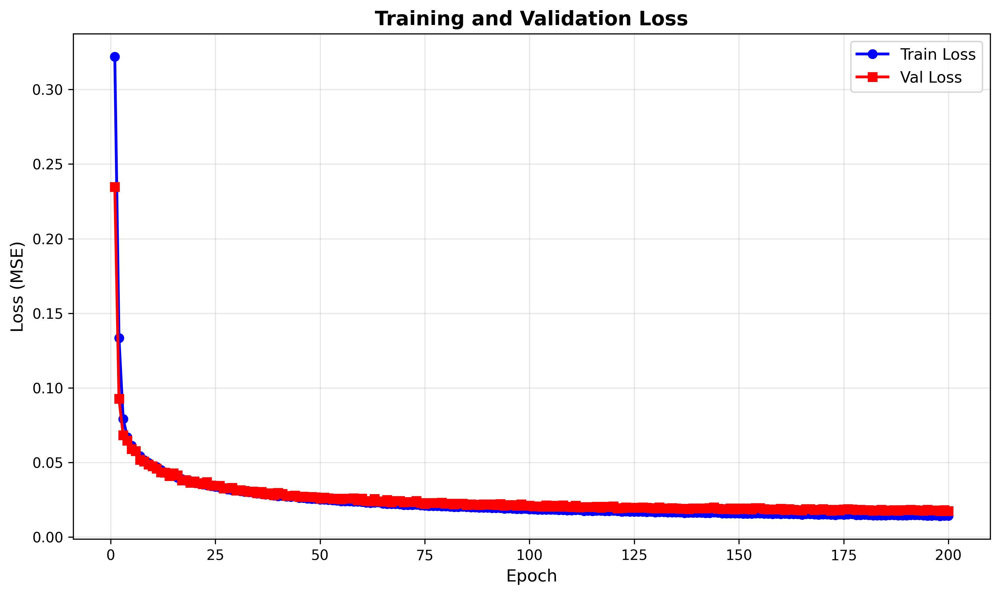


Model 2: 2_MICROnet_cnn_lstm_seq4_MSEloss


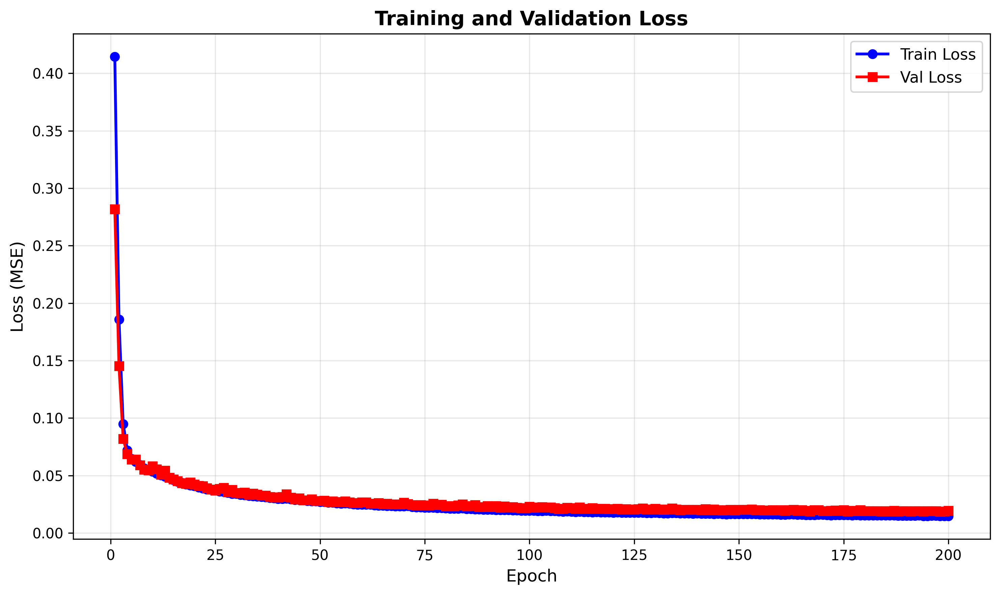


Model 3: 3_MICROnet_cnn_lstm_seq5_MSEloss


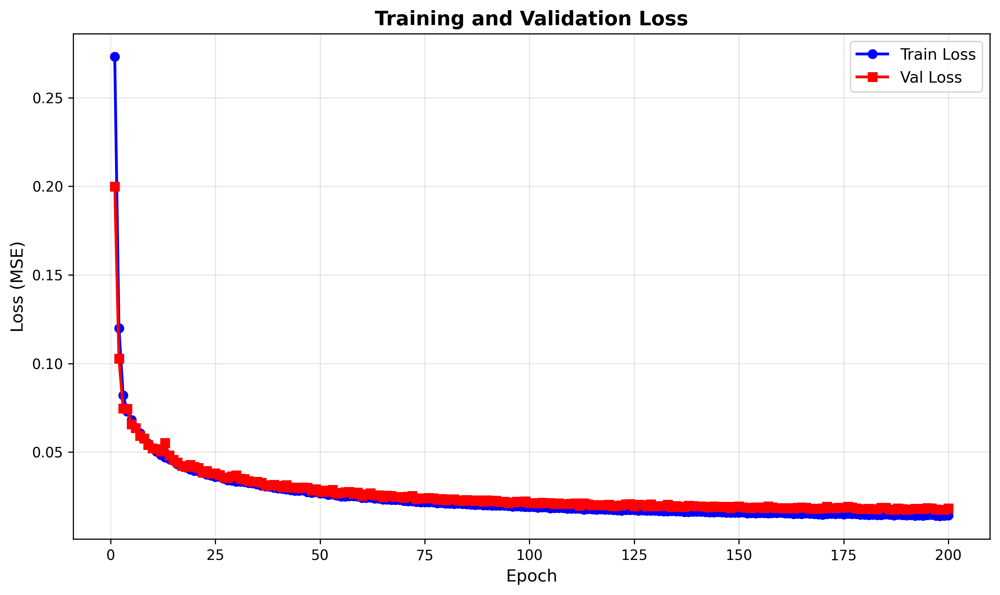


Model 4: 4_MICROnet_cnn_lstm_seq4_CombLoss_T1560-1620


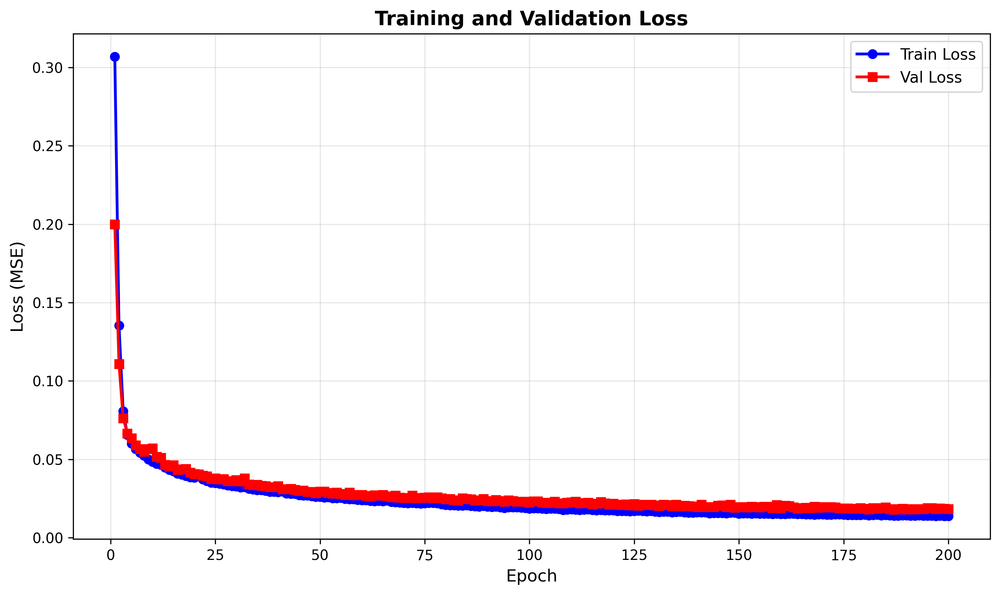


Model 5: 5_MICROnet_cnn_lstm_seq4_CombLoss_T1530-1650


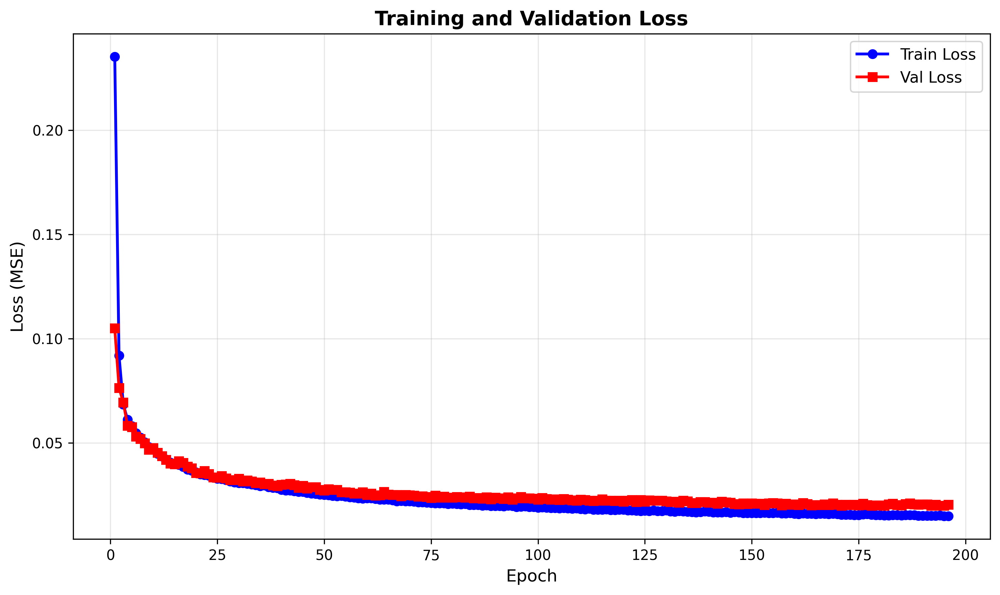


Model 6: 6_MICROnet_predrnn_seq3_MSEloss


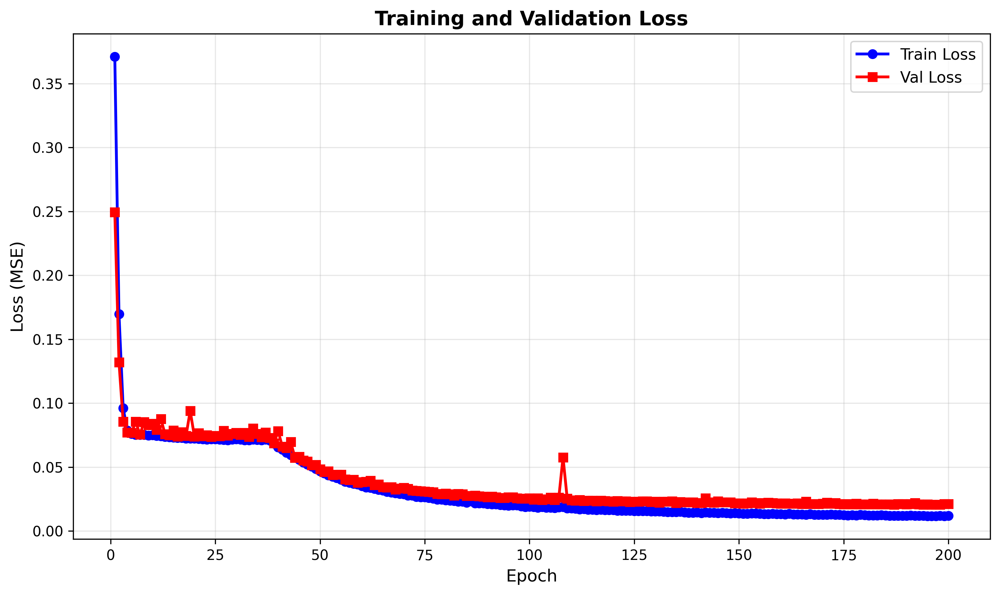


Model 7: 7_MICROnet_predrnn_seq4_MSEloss


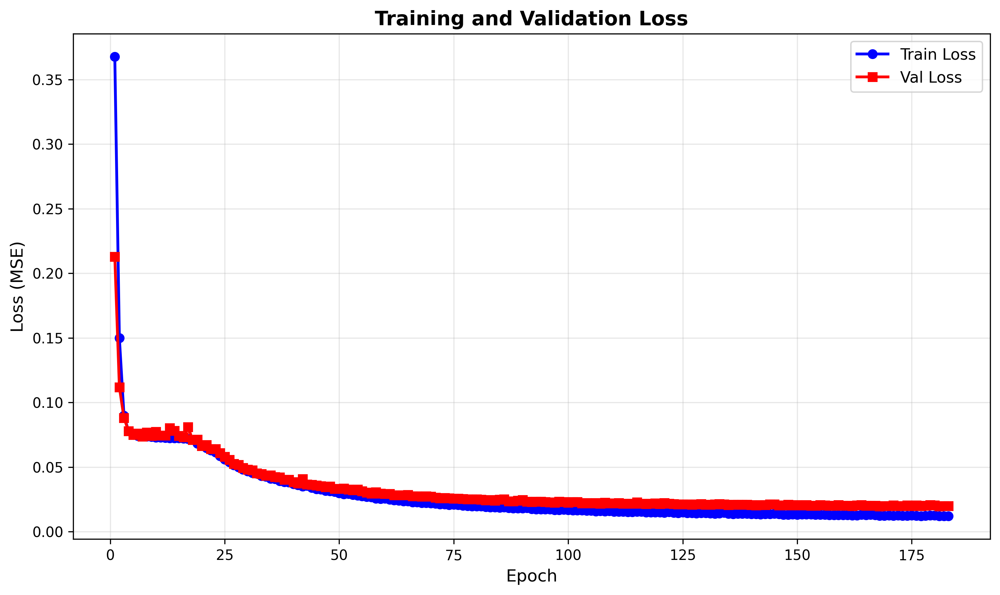


Model 8: 8_MICROnet_predrnn_seq5_MSEloss


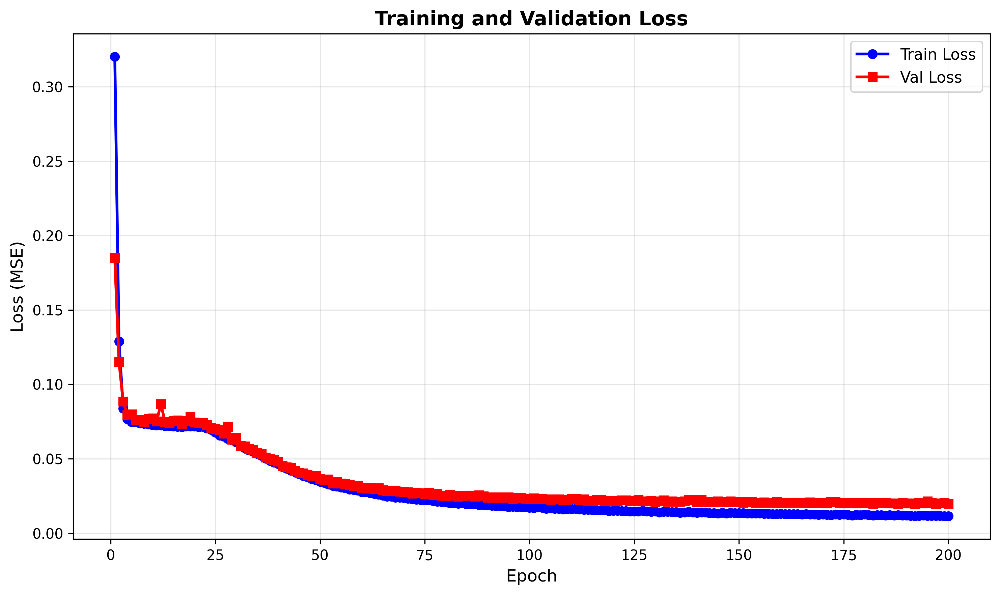


Model 9: 9_MICROnet_predrnn_seq4_CombLoss_T1560-1620


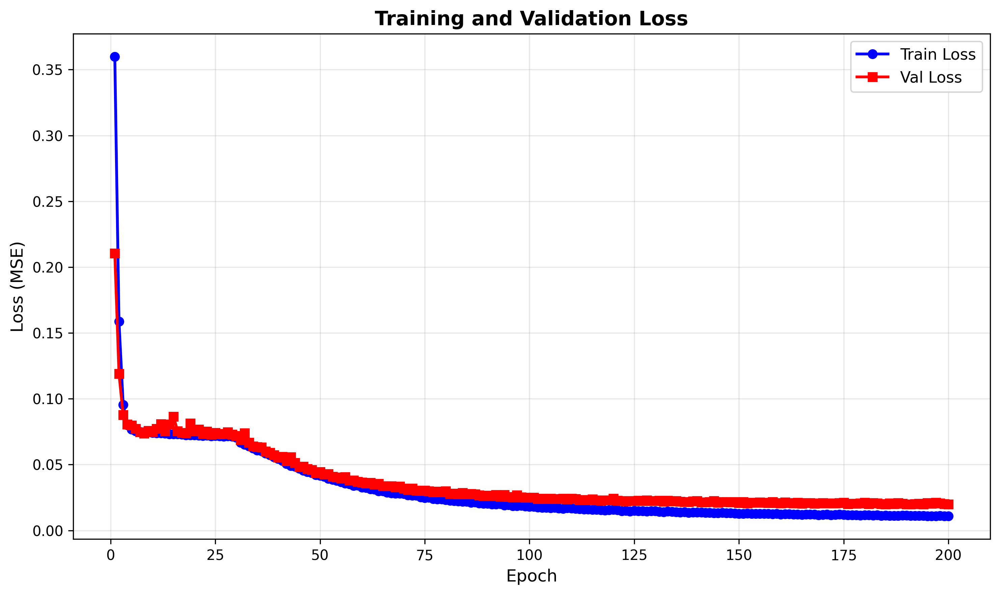


Model 10: 10_MICROnet_predrnn_seq4_CombLoss_T1530-1650


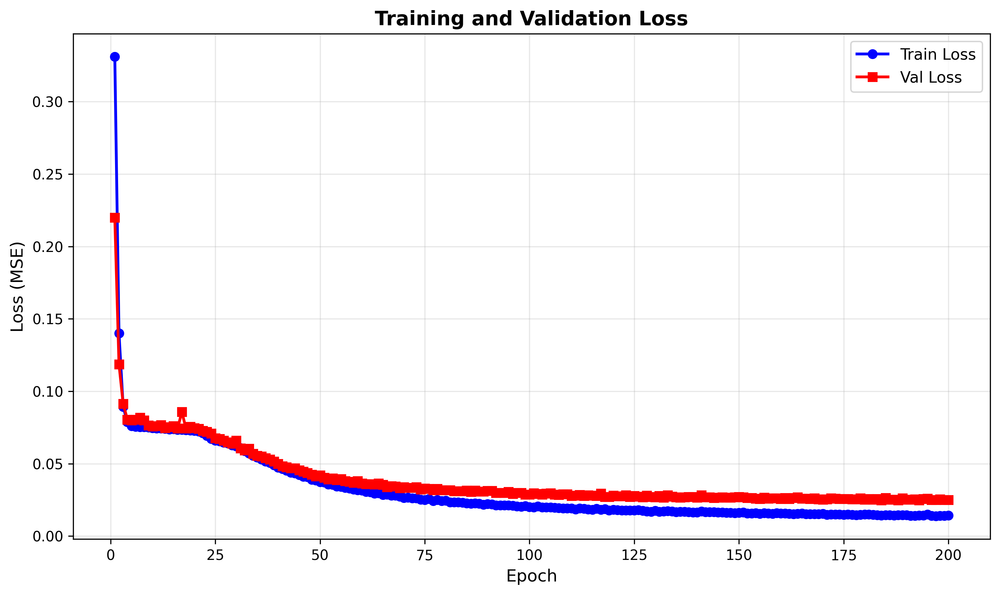

In [7]:
print("Training Loss Plots:\n")

for config in MODEL_CONFIGS:
    run_dir = OUTPUT_DIR / config['name']
    loss_plot_path = run_dir / "training_losses.png"

    if loss_plot_path.exists():
        print(f"\nModel {config['id']}: {config['name']}")
        display(Image(filename=str(loss_plot_path)))
    else:
        print(f"\nModel {config['id']}: No training losses plot found")

## Display Predictions

Display prediction visualizations for all models.

Prediction Visualizations (t=23, s=47):


Model 1: 1_MICROnet_cnn_lstm_seq3_MSEloss


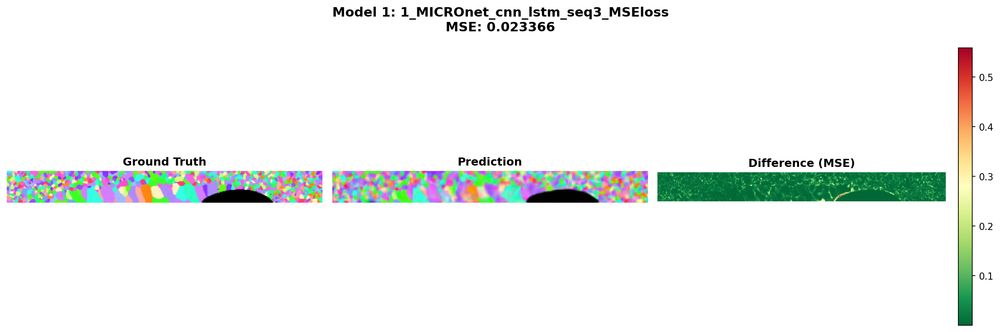


Model 2: 2_MICROnet_cnn_lstm_seq4_MSEloss


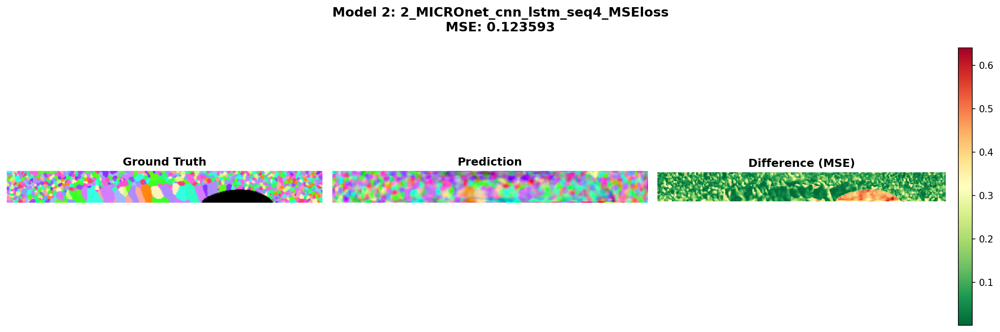


Model 3: 3_MICROnet_cnn_lstm_seq5_MSEloss


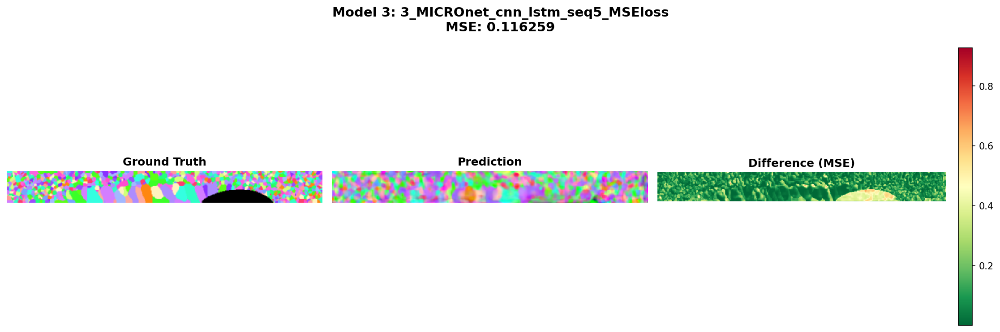


Model 4: 4_MICROnet_cnn_lstm_seq4_CombLoss_T1560-1620


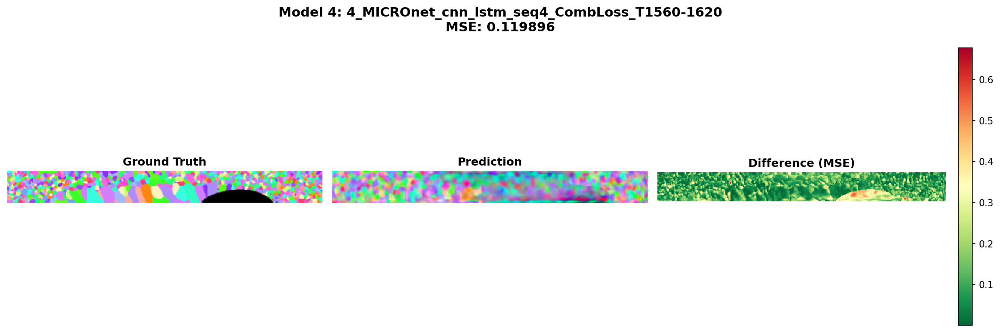


Model 5: 5_MICROnet_cnn_lstm_seq4_CombLoss_T1530-1650


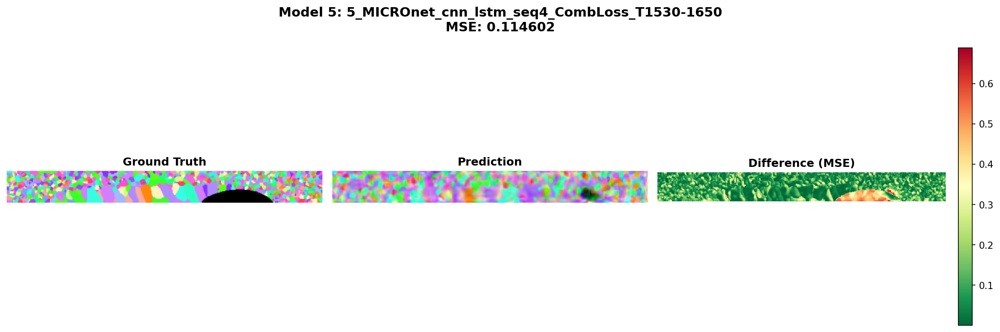


Model 6: 6_MICROnet_predrnn_seq3_MSEloss


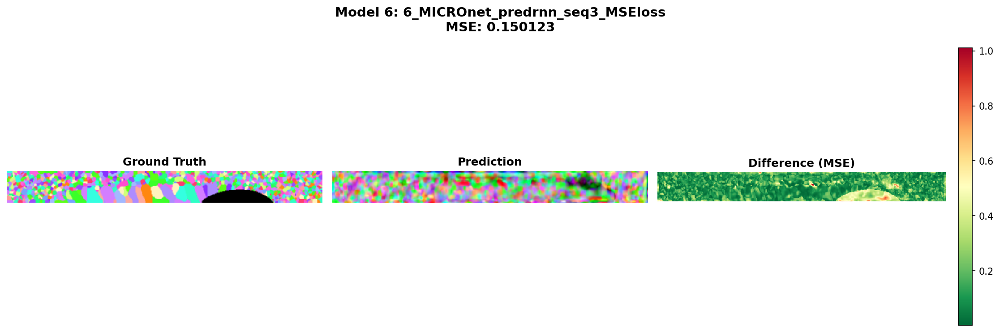


Model 7: 7_MICROnet_predrnn_seq4_MSEloss


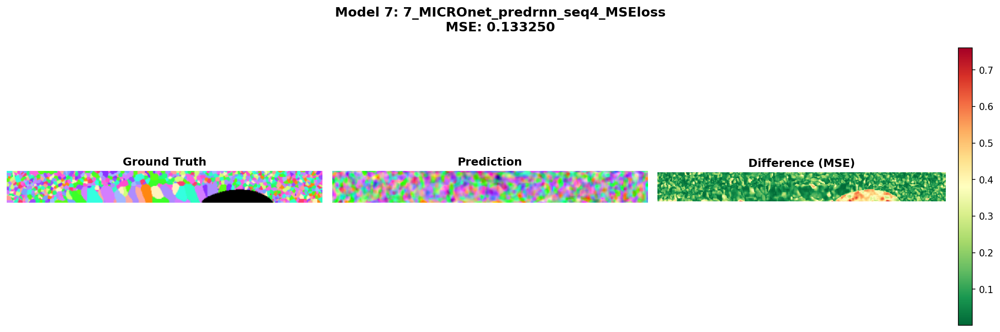


Model 8: 8_MICROnet_predrnn_seq5_MSEloss


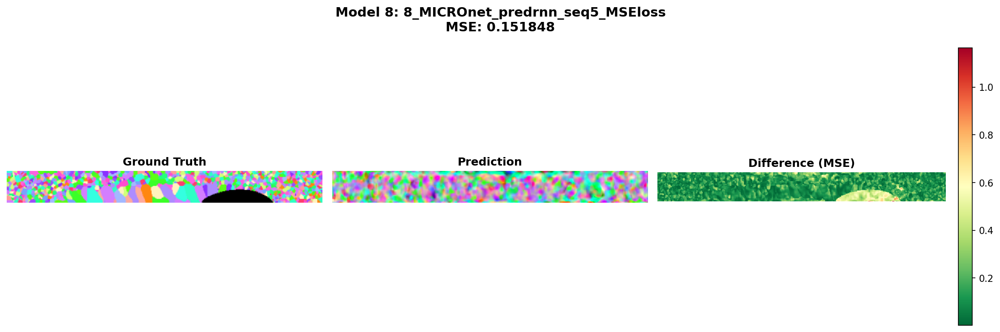


Model 9: 9_MICROnet_predrnn_seq4_CombLoss_T1560-1620


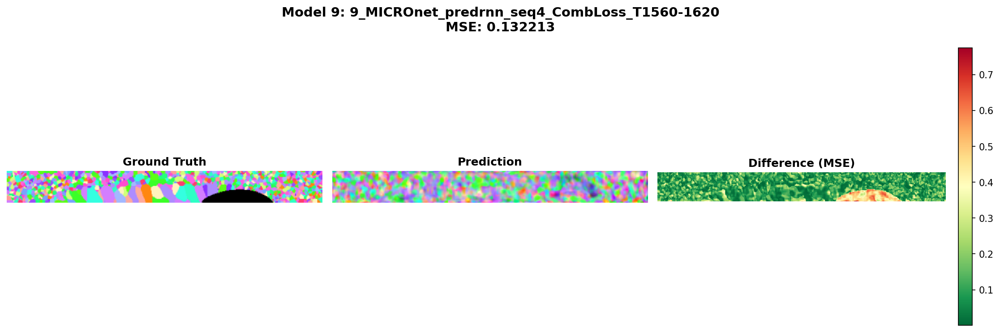


Model 10: 10_MICROnet_predrnn_seq4_CombLoss_T1530-1650


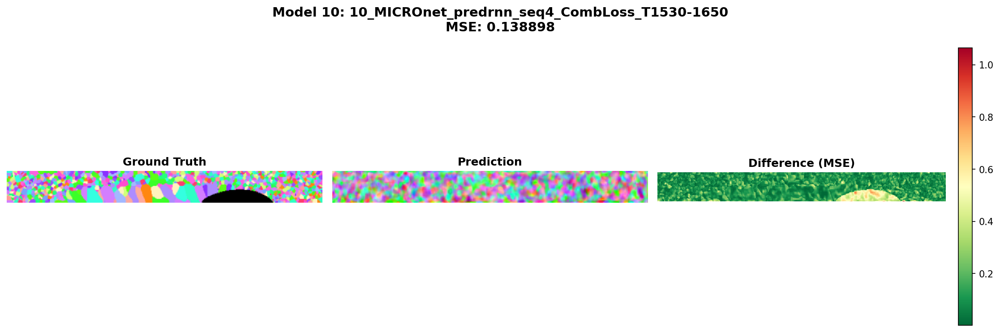

In [8]:
print(f"Prediction Visualizations (t={PRED_TIMESTEP}, s={PRED_SLICE}):\n")

for config in MODEL_CONFIGS:
    run_dir = OUTPUT_DIR / config['name']
    pred_path = run_dir / f"pred_t{PRED_TIMESTEP}_s{PRED_SLICE}.png"

    if pred_path.exists():
        print(f"\nModel {config['id']}: {config['name']}")
        display(Image(filename=str(pred_path)))
    else:
        print(f"\nModel {config['id']}: No prediction found")

## Model Comparison

Compare training losses across all models.

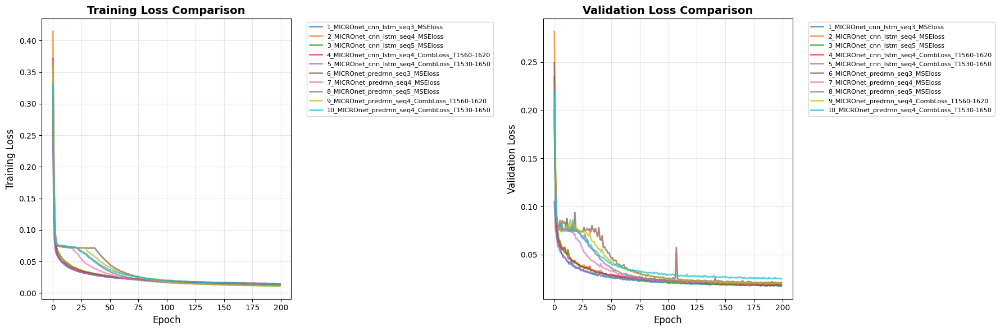


Comparison plot saved to MICROnet_output/all_models_comparison.png

MODEL COMPARISON SUMMARY
ID   Name                                               Final Train  Final Val    Epochs  
----------------------------------------------------------------------------------------------------
1    1_MICROnet_cnn_lstm_seq3_MSEloss                   0.014185     0.017265     200     
2    2_MICROnet_cnn_lstm_seq4_MSEloss                   0.014783     0.019499     200     
3    3_MICROnet_cnn_lstm_seq5_MSEloss                   0.014324     0.018301     200     
4    4_MICROnet_cnn_lstm_seq4_CombLoss_T1560-1620       0.013842     0.018323     200     
5    5_MICROnet_cnn_lstm_seq4_CombLoss_T1530-1650       0.014955     0.020416     196     
6    6_MICROnet_predrnn_seq3_MSEloss                    0.011830     0.021043     200     
7    7_MICROnet_predrnn_seq4_MSEloss                    0.011975     0.019869     183     
8    8_MICROnet_predrnn_seq5_MSEloss                    0.011486     0.019775

In [9]:
# Load all histories
histories = {}
for config in MODEL_CONFIGS:
    history_path = OUTPUT_DIR / config['name'] / "history.json"
    if history_path.exists():
        with open(history_path, 'r') as f:
            histories[config['name']] = json.load(f)

if histories:
    # Plot comparison
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 6))

    # Training loss
    for name, history in histories.items():
        ax1.plot(history['train_loss'], label=name, linewidth=2, alpha=0.7)
    ax1.set_xlabel('Epoch', fontsize=12)
    ax1.set_ylabel('Training Loss', fontsize=12)
    ax1.set_title('Training Loss Comparison', fontsize=14, fontweight='bold')
    ax1.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=8)
    ax1.grid(True, alpha=0.3)

    # Validation loss
    for name, history in histories.items():
        ax2.plot(history['val_loss'], label=name, linewidth=2, alpha=0.7)
    ax2.set_xlabel('Epoch', fontsize=12)
    ax2.set_ylabel('Validation Loss', fontsize=12)
    ax2.set_title('Validation Loss Comparison', fontsize=14, fontweight='bold')
    ax2.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=8)
    ax2.grid(True, alpha=0.3)

    plt.tight_layout()
    comparison_path = OUTPUT_DIR / "all_models_comparison.png"
    plt.savefig(comparison_path, dpi=150, bbox_inches='tight')
    plt.show()

    print(f"\nComparison plot saved to {comparison_path}")

    # Print summary table
    print("\n" + "="*100)
    print("MODEL COMPARISON SUMMARY")
    print("="*100)
    print(f"{'ID':<4} {'Name':<50} {'Final Train':<12} {'Final Val':<12} {'Epochs':<8}")
    print("-"*100)

    for config in MODEL_CONFIGS:
        name = config['name']
        if name in histories:
            history = histories[name]
            final_train = history['train_loss'][-1]
            final_val = history['val_loss'][-1]
            epochs = len(history['train_loss'])
            print(f"{config['id']:<4} {name:<50} {final_train:<12.6f} {final_val:<12.6f} {epochs:<8}")
        else:
            print(f"{config['id']:<4} {name:<50} {'N/A':<12} {'N/A':<12} {'N/A':<8}")

    print("="*100)
else:
    print("No training histories found.")

## Summary

All 10 models have been trained and evaluated!